# DCGAN

This is an implementation of DCGAN towards MNIST dataset using the GPU resources in lab.

### Setups for DCGAN

In [22]:
import argparse
import os
import numpy as np
import math

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

os.makedirs("images_1.0", exist_ok=True)

In [23]:
class OPT():
    def __init__(self):
        self.n_classes = 10
        self.n_epochs = 200
        self.batch_size = 128
        self.lr = 0.0002
        self.b1 = 0.5
        self.b2 = 0.999
        self.n_gpu = 2
        self.latent_dim = 100
        self.img_size = 64
        self.channels = 1
        self.sample_interval = 400
        self.ngf = 64
        self.ndf = 64

opt = OPT()
print(opt.n_classes)

10


In [24]:
img_shape = (opt.channels, opt.img_size, opt.img_size)

cuda = True if torch.cuda.is_available() else False

print(img_shape)
print(cuda)

(1, 64, 64)
True


In [25]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        
        self.model = nn.Sequential(
            # input Z size [batch_size, 100, 1, 1]
            nn.ConvTranspose2d(100, opt.ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(opt.ngf * 8),
            nn.ReLU(inplace=True),
            # [batch_size, ngf * 8, 4, 4]
            nn.ConvTranspose2d(opt.ngf * 8, opt.ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt.ngf * 4),
            nn.ReLU(inplace=True),
            # [batch_size, ngf * 4, 8, 8]
            nn.ConvTranspose2d(opt.ngf * 4, opt.ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt.ngf * 2),
            nn.ReLU(inplace=True),
            # [batch_size, ngf * 2, 16, 16]
            nn.ConvTranspose2d(opt.ngf * 2, opt.ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt.ngf),
            nn.ReLU(inplace=True),
            # [batch_size, ngf, 32, 32]
            nn.ConvTranspose2d(opt.ngf, opt.channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # [batch_size, 1, 64, 64]
        )
    
    def forward(self, x):
        y = self.model(x)
        return y

In [26]:
generator = Generator()

test_g = torch.randn(opt.batch_size, 100, 1, 1)

print(test_g.size())
print(generator(test_g).size())
print(generator)

torch.Size([128, 100, 1, 1])
torch.Size([128, 1, 64, 64])
Generator(
  (model): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 

In [27]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.model = nn.Sequential(
            # input [batch_size, 1, 64, 64]
            nn.Conv2d(1, opt.ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(inplace=True),
            # [ndf, 32, 32]
            nn.Conv2d(opt.ndf, opt.ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt.ndf * 2),
            nn.LeakyReLU(inplace=True),
            # [ndf * 2, 16, 16]
            nn.Conv2d(opt.ndf * 2, opt.ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt.ndf * 4),
            nn.LeakyReLU(inplace=True),
            # [ndf * 4, 8, 8]
            nn.Conv2d(opt.ndf * 4, opt.ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(opt.ndf * 8),
            nn.LeakyReLU(inplace=True),
            # [ndf * 8, 4, 4]
            nn.Conv2d(opt.ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        
    def forward(self, imgs):
        validity = self.model(imgs)
        return validity

In [28]:
discriminator = Discriminator()

test_d = torch.randn(opt.batch_size, 1, 64, 64)

print(test_d.size())
print(discriminator(test_d).size())
print(discriminator)

torch.Size([128, 1, 64, 64])
torch.Size([128, 1, 1, 1])
Discriminator(
  (model): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.01, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.01, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.01, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.01, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmo

In [44]:
dataloader = torch.utils.data.DataLoader(
    datasets.MNIST(
        "./dataset",
        train=True,
        download=True,
        transform=transforms.Compose(
            [transforms.Resize(opt.img_size), transforms.ToTensor(), transforms.Normalize([0.5], [0.5])]
        )
    ),
    batch_size=opt.batch_size,
    shuffle=True
)
print(dataloader)

In [45]:
adversarial_loss = nn.BCELoss()

device = torch.device("cuda:2") if cuda else torch.device("cpu")
generator.to(device)
discriminator.to(device)
adversarial_loss.to(device)

optimizerG = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizerD = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

print(device)
print(optimizerG)
print(optimizerD)

cuda:2
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.5, 0.999)
    eps: 1e-08
    lr: 0.0002
    weight_decay: 0
)
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.5, 0.999)
    eps: 1e-08
    lr: 0.0002
    weight_decay: 0
)


In [60]:
fixed_noise = torch.randn(10 ** 2, 100, 1, 1).to(device)

def save_images(batches_done):
    imgs = generator(fixed_noise)
    save_image(imgs, "images_1.0/%d.png" % batches_done, nrow=10, normalize=True)

In [61]:
G_losses = []
D_losses = []
iters = 0

for epoch in range(opt.n_epochs):
    for i, (imgs, labels) in enumerate(dataloader):
        
        batch_size = imgs.shape[0]
        
        # Set up
        valid = Variable(torch.FloatTensor(batch_size, 1).fill_(1.0), requires_grad=False).to(device)
        fake = Variable(torch.FloatTensor(batch_size, 1).fill_(0.0), requires_grad=False).to(device)
        real_imgs = Variable(imgs.type(torch.FloatTensor).to(device))
        
        #---------------------
        # train Generator
        #---------------------
        
        optimizerG.zero_grad()
        
        z = Variable(torch.FloatTensor(np.random.normal(0, 1, (batch_size, opt.latent_dim, 1, 1)))).to(device)
        gen_imgs = generator(z)
        
        validity = discriminator(gen_imgs)
        g_loss = adversarial_loss(validity, valid)
        
        g_loss.backward()
        optimizerG.step()
        
        #---------------------
        # train Discriminator
        #---------------------
        
        optimizerD.zero_grad()
        
        validity_real = discriminator(real_imgs)
        d_real_loss = adversarial_loss(validity_real, valid)
        
        validity_fake = discriminator(gen_imgs.detach())
        d_fake_loss = adversarial_loss(validity_fake, fake)
        
        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        optimizerD.step()
        
        print(
            "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch + 1, opt.n_epochs, i, len(dataloader), d_loss.item(), g_loss.item())
        )
        
        G_losses.append(g_loss.item())
        D_losses.append(d_loss.item())
        
        if iters % opt.sample_interval == 0:
            save_images(iters)
        
        iters += 1

/home/linjianghao/anaconda3/envs/linjianghao/lib/python3.5/site-packages/torch/nn/functional.py:2016: UserWarning: Using a target size (torch.Size([128, 1])) that is different to the input size (torch.Size([128, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  "Please ensure they have the same size.".format(target.size(), input.size()))


[Epoch 1/200] [Batch 0/469] [D loss: 0.225511] [G loss: 1.920593]
[Epoch 1/200] [Batch 1/469] [D loss: 0.155994] [G loss: 2.449522]
[Epoch 1/200] [Batch 2/469] [D loss: 0.170518] [G loss: 2.210278]
[Epoch 1/200] [Batch 3/469] [D loss: 0.171916] [G loss: 2.394348]
[Epoch 1/200] [Batch 4/469] [D loss: 0.139585] [G loss: 2.569359]
[Epoch 1/200] [Batch 5/469] [D loss: 0.124407] [G loss: 2.544537]
[Epoch 1/200] [Batch 6/469] [D loss: 0.123293] [G loss: 2.450342]
[Epoch 1/200] [Batch 7/469] [D loss: 0.076251] [G loss: 3.295665]
[Epoch 1/200] [Batch 8/469] [D loss: 0.079347] [G loss: 3.185213]
[Epoch 1/200] [Batch 9/469] [D loss: 0.067241] [G loss: 3.226644]
[Epoch 1/200] [Batch 10/469] [D loss: 0.056984] [G loss: 3.499775]
[Epoch 1/200] [Batch 11/469] [D loss: 0.049651] [G loss: 3.470532]
[Epoch 1/200] [Batch 12/469] [D loss: 0.045142] [G loss: 3.745866]
[Epoch 1/200] [Batch 13/469] [D loss: 0.044670] [G loss: 3.733675]
[Epoch 1/200] [Batch 14/469] [D loss: 0.037763] [G loss: 3.637777]
[Epoc

[Epoch 1/200] [Batch 123/469] [D loss: 0.059525] [G loss: 3.369281]
[Epoch 1/200] [Batch 124/469] [D loss: 0.074686] [G loss: 3.137303]
[Epoch 1/200] [Batch 125/469] [D loss: 0.058796] [G loss: 3.702796]
[Epoch 1/200] [Batch 126/469] [D loss: 0.073075] [G loss: 3.240816]
[Epoch 1/200] [Batch 127/469] [D loss: 0.053873] [G loss: 3.769861]
[Epoch 1/200] [Batch 128/469] [D loss: 0.051028] [G loss: 3.501860]
[Epoch 1/200] [Batch 129/469] [D loss: 0.043812] [G loss: 3.866265]
[Epoch 1/200] [Batch 130/469] [D loss: 0.052014] [G loss: 3.387707]
[Epoch 1/200] [Batch 131/469] [D loss: 0.037511] [G loss: 3.994291]
[Epoch 1/200] [Batch 132/469] [D loss: 0.037215] [G loss: 3.857562]
[Epoch 1/200] [Batch 133/469] [D loss: 0.042149] [G loss: 3.745162]
[Epoch 1/200] [Batch 134/469] [D loss: 0.032763] [G loss: 4.286531]
[Epoch 1/200] [Batch 135/469] [D loss: 0.032498] [G loss: 4.179373]
[Epoch 1/200] [Batch 136/469] [D loss: 0.029003] [G loss: 4.200121]
[Epoch 1/200] [Batch 137/469] [D loss: 0.024503]

[Epoch 1/200] [Batch 244/469] [D loss: 0.565866] [G loss: 1.373188]
[Epoch 1/200] [Batch 245/469] [D loss: 0.691886] [G loss: 2.388547]
[Epoch 1/200] [Batch 246/469] [D loss: 0.659118] [G loss: 1.102208]
[Epoch 1/200] [Batch 247/469] [D loss: 0.353699] [G loss: 2.666294]
[Epoch 1/200] [Batch 248/469] [D loss: 0.261191] [G loss: 2.453946]
[Epoch 1/200] [Batch 249/469] [D loss: 0.305262] [G loss: 1.827372]
[Epoch 1/200] [Batch 250/469] [D loss: 0.254708] [G loss: 2.326759]
[Epoch 1/200] [Batch 251/469] [D loss: 0.252152] [G loss: 2.504494]
[Epoch 1/200] [Batch 252/469] [D loss: 0.374140] [G loss: 1.546216]
[Epoch 1/200] [Batch 253/469] [D loss: 0.647082] [G loss: 3.204640]
[Epoch 1/200] [Batch 254/469] [D loss: 2.616575] [G loss: 0.093511]
[Epoch 1/200] [Batch 255/469] [D loss: 4.225014] [G loss: 7.664166]
[Epoch 1/200] [Batch 256/469] [D loss: 0.656602] [G loss: 3.800808]
[Epoch 1/200] [Batch 257/469] [D loss: 0.687706] [G loss: 0.926966]
[Epoch 1/200] [Batch 258/469] [D loss: 0.495360]

[Epoch 1/200] [Batch 365/469] [D loss: 0.489293] [G loss: 1.557425]
[Epoch 1/200] [Batch 366/469] [D loss: 0.452680] [G loss: 2.195330]
[Epoch 1/200] [Batch 367/469] [D loss: 0.425264] [G loss: 1.581542]
[Epoch 1/200] [Batch 368/469] [D loss: 0.414147] [G loss: 2.776720]
[Epoch 1/200] [Batch 369/469] [D loss: 0.444255] [G loss: 1.401789]
[Epoch 1/200] [Batch 370/469] [D loss: 0.612922] [G loss: 3.417433]
[Epoch 1/200] [Batch 371/469] [D loss: 0.775913] [G loss: 0.784060]
[Epoch 1/200] [Batch 372/469] [D loss: 0.831640] [G loss: 4.561024]
[Epoch 1/200] [Batch 373/469] [D loss: 0.335166] [G loss: 1.593205]
[Epoch 1/200] [Batch 374/469] [D loss: 0.343878] [G loss: 1.629564]
[Epoch 1/200] [Batch 375/469] [D loss: 0.367082] [G loss: 3.077204]
[Epoch 1/200] [Batch 376/469] [D loss: 0.258723] [G loss: 2.067177]
[Epoch 1/200] [Batch 377/469] [D loss: 0.254634] [G loss: 2.114952]
[Epoch 1/200] [Batch 378/469] [D loss: 0.222572] [G loss: 2.385455]
[Epoch 1/200] [Batch 379/469] [D loss: 0.205602]

/home/linjianghao/anaconda3/envs/linjianghao/lib/python3.5/site-packages/torch/nn/functional.py:2016: UserWarning: Using a target size (torch.Size([96, 1])) that is different to the input size (torch.Size([96, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  "Please ensure they have the same size.".format(target.size(), input.size()))


[Epoch 1/200] [Batch 468/469] [D loss: 0.790197] [G loss: 2.902446]
[Epoch 2/200] [Batch 0/469] [D loss: 0.487926] [G loss: 1.762293]
[Epoch 2/200] [Batch 1/469] [D loss: 0.655881] [G loss: 1.063904]
[Epoch 2/200] [Batch 2/469] [D loss: 0.564850] [G loss: 1.378298]
[Epoch 2/200] [Batch 3/469] [D loss: 0.687467] [G loss: 1.850929]
[Epoch 2/200] [Batch 4/469] [D loss: 0.604986] [G loss: 1.328958]
[Epoch 2/200] [Batch 5/469] [D loss: 0.528714] [G loss: 1.568736]
[Epoch 2/200] [Batch 6/469] [D loss: 0.503199] [G loss: 1.535042]
[Epoch 2/200] [Batch 7/469] [D loss: 0.433284] [G loss: 2.018265]
[Epoch 2/200] [Batch 8/469] [D loss: 0.492837] [G loss: 1.630055]
[Epoch 2/200] [Batch 9/469] [D loss: 0.499136] [G loss: 1.685194]
[Epoch 2/200] [Batch 10/469] [D loss: 0.443113] [G loss: 1.925199]
[Epoch 2/200] [Batch 11/469] [D loss: 0.467663] [G loss: 1.698444]
[Epoch 2/200] [Batch 12/469] [D loss: 0.418296] [G loss: 2.328051]
[Epoch 2/200] [Batch 13/469] [D loss: 0.327814] [G loss: 1.688506]
[Epo

[Epoch 2/200] [Batch 122/469] [D loss: 0.786688] [G loss: 0.737746]
[Epoch 2/200] [Batch 123/469] [D loss: 2.092589] [G loss: 4.441180]
[Epoch 2/200] [Batch 124/469] [D loss: 2.202928] [G loss: 0.162946]
[Epoch 2/200] [Batch 125/469] [D loss: 0.529586] [G loss: 3.428358]
[Epoch 2/200] [Batch 126/469] [D loss: 0.651049] [G loss: 2.194434]
[Epoch 2/200] [Batch 127/469] [D loss: 0.967478] [G loss: 0.717608]
[Epoch 2/200] [Batch 128/469] [D loss: 0.744613] [G loss: 1.813956]
[Epoch 2/200] [Batch 129/469] [D loss: 0.665264] [G loss: 1.772354]
[Epoch 2/200] [Batch 130/469] [D loss: 0.681678] [G loss: 1.075743]
[Epoch 2/200] [Batch 131/469] [D loss: 0.615312] [G loss: 1.831605]
[Epoch 2/200] [Batch 132/469] [D loss: 0.592504] [G loss: 1.704287]
[Epoch 2/200] [Batch 133/469] [D loss: 0.545849] [G loss: 1.481420]
[Epoch 2/200] [Batch 134/469] [D loss: 0.611037] [G loss: 1.737294]
[Epoch 2/200] [Batch 135/469] [D loss: 0.520723] [G loss: 1.466130]
[Epoch 2/200] [Batch 136/469] [D loss: 0.566402]

[Epoch 2/200] [Batch 243/469] [D loss: 0.405540] [G loss: 1.850661]
[Epoch 2/200] [Batch 244/469] [D loss: 0.404296] [G loss: 2.028946]
[Epoch 2/200] [Batch 245/469] [D loss: 0.453173] [G loss: 2.157317]
[Epoch 2/200] [Batch 246/469] [D loss: 0.569448] [G loss: 1.111844]
[Epoch 2/200] [Batch 247/469] [D loss: 0.853316] [G loss: 3.420173]
[Epoch 2/200] [Batch 248/469] [D loss: 0.892639] [G loss: 0.740913]
[Epoch 2/200] [Batch 249/469] [D loss: 0.939487] [G loss: 3.111079]
[Epoch 2/200] [Batch 250/469] [D loss: 1.055731] [G loss: 0.624507]
[Epoch 2/200] [Batch 251/469] [D loss: 0.824789] [G loss: 3.641595]
[Epoch 2/200] [Batch 252/469] [D loss: 0.499301] [G loss: 1.651953]
[Epoch 2/200] [Batch 253/469] [D loss: 0.489982] [G loss: 1.417336]
[Epoch 2/200] [Batch 254/469] [D loss: 0.585159] [G loss: 2.693698]
[Epoch 2/200] [Batch 255/469] [D loss: 0.625851] [G loss: 0.994005]
[Epoch 2/200] [Batch 256/469] [D loss: 0.430695] [G loss: 2.296563]
[Epoch 2/200] [Batch 257/469] [D loss: 0.473254]

[Epoch 2/200] [Batch 364/469] [D loss: 0.397064] [G loss: 1.746929]
[Epoch 2/200] [Batch 365/469] [D loss: 0.495034] [G loss: 1.754328]
[Epoch 2/200] [Batch 366/469] [D loss: 0.452662] [G loss: 2.336997]
[Epoch 2/200] [Batch 367/469] [D loss: 0.387281] [G loss: 1.543940]
[Epoch 2/200] [Batch 368/469] [D loss: 0.477889] [G loss: 2.529342]
[Epoch 2/200] [Batch 369/469] [D loss: 0.473353] [G loss: 1.381052]
[Epoch 2/200] [Batch 370/469] [D loss: 0.530961] [G loss: 2.908712]
[Epoch 2/200] [Batch 371/469] [D loss: 0.631739] [G loss: 0.982433]
[Epoch 2/200] [Batch 372/469] [D loss: 0.566049] [G loss: 3.805963]
[Epoch 2/200] [Batch 373/469] [D loss: 0.436804] [G loss: 1.446903]
[Epoch 2/200] [Batch 374/469] [D loss: 0.426513] [G loss: 2.042542]
[Epoch 2/200] [Batch 375/469] [D loss: 0.388029] [G loss: 2.506457]
[Epoch 2/200] [Batch 376/469] [D loss: 0.386610] [G loss: 1.617885]
[Epoch 2/200] [Batch 377/469] [D loss: 0.450589] [G loss: 3.588522]
[Epoch 2/200] [Batch 378/469] [D loss: 0.725557]

[Epoch 3/200] [Batch 16/469] [D loss: 0.291444] [G loss: 2.238813]
[Epoch 3/200] [Batch 17/469] [D loss: 0.220711] [G loss: 2.704573]
[Epoch 3/200] [Batch 18/469] [D loss: 0.119093] [G loss: 3.255969]
[Epoch 3/200] [Batch 19/469] [D loss: 0.078388] [G loss: 3.558454]
[Epoch 3/200] [Batch 20/469] [D loss: 0.052381] [G loss: 3.913734]
[Epoch 3/200] [Batch 21/469] [D loss: 0.073829] [G loss: 3.723610]
[Epoch 3/200] [Batch 22/469] [D loss: 0.067553] [G loss: 3.441681]
[Epoch 3/200] [Batch 23/469] [D loss: 0.132876] [G loss: 2.594951]
[Epoch 3/200] [Batch 24/469] [D loss: 0.175572] [G loss: 4.504111]
[Epoch 3/200] [Batch 25/469] [D loss: 0.336453] [G loss: 1.567781]
[Epoch 3/200] [Batch 26/469] [D loss: 0.669168] [G loss: 5.077371]
[Epoch 3/200] [Batch 27/469] [D loss: 1.930838] [G loss: 0.225110]
[Epoch 3/200] [Batch 28/469] [D loss: 4.560152] [G loss: 8.714138]
[Epoch 3/200] [Batch 29/469] [D loss: 0.701259] [G loss: 1.193377]
[Epoch 3/200] [Batch 30/469] [D loss: 0.887698] [G loss: 0.904

[Epoch 3/200] [Batch 138/469] [D loss: 0.706443] [G loss: 2.601844]
[Epoch 3/200] [Batch 139/469] [D loss: 0.588140] [G loss: 1.344609]
[Epoch 3/200] [Batch 140/469] [D loss: 0.466174] [G loss: 1.953341]
[Epoch 3/200] [Batch 141/469] [D loss: 0.560916] [G loss: 1.876702]
[Epoch 3/200] [Batch 142/469] [D loss: 0.501465] [G loss: 1.472191]
[Epoch 3/200] [Batch 143/469] [D loss: 0.479057] [G loss: 2.420051]
[Epoch 3/200] [Batch 144/469] [D loss: 0.601667] [G loss: 1.278722]
[Epoch 3/200] [Batch 145/469] [D loss: 0.670105] [G loss: 2.717259]
[Epoch 3/200] [Batch 146/469] [D loss: 0.862254] [G loss: 0.762409]
[Epoch 3/200] [Batch 147/469] [D loss: 0.742121] [G loss: 3.327748]
[Epoch 3/200] [Batch 148/469] [D loss: 0.698216] [G loss: 1.030231]
[Epoch 3/200] [Batch 149/469] [D loss: 0.482759] [G loss: 2.670117]
[Epoch 3/200] [Batch 150/469] [D loss: 0.438020] [G loss: 1.899985]
[Epoch 3/200] [Batch 151/469] [D loss: 0.485133] [G loss: 1.802807]
[Epoch 3/200] [Batch 152/469] [D loss: 0.421436]

[Epoch 3/200] [Batch 259/469] [D loss: 0.820044] [G loss: 0.799438]
[Epoch 3/200] [Batch 260/469] [D loss: 1.931225] [G loss: 6.828422]
[Epoch 3/200] [Batch 261/469] [D loss: 1.696687] [G loss: 0.302762]
[Epoch 3/200] [Batch 262/469] [D loss: 2.441552] [G loss: 5.987051]
[Epoch 3/200] [Batch 263/469] [D loss: 1.176577] [G loss: 0.595970]
[Epoch 3/200] [Batch 264/469] [D loss: 0.786381] [G loss: 1.284765]
[Epoch 3/200] [Batch 265/469] [D loss: 0.812256] [G loss: 2.241150]
[Epoch 3/200] [Batch 266/469] [D loss: 0.716981] [G loss: 1.252422]
[Epoch 3/200] [Batch 267/469] [D loss: 0.613879] [G loss: 1.351345]
[Epoch 3/200] [Batch 268/469] [D loss: 0.667757] [G loss: 2.058754]
[Epoch 3/200] [Batch 269/469] [D loss: 0.612001] [G loss: 1.215441]
[Epoch 3/200] [Batch 270/469] [D loss: 0.717623] [G loss: 1.738140]
[Epoch 3/200] [Batch 271/469] [D loss: 0.663258] [G loss: 1.559832]
[Epoch 3/200] [Batch 272/469] [D loss: 0.605684] [G loss: 1.510874]
[Epoch 3/200] [Batch 273/469] [D loss: 0.591790]

[Epoch 3/200] [Batch 380/469] [D loss: 0.369572] [G loss: 2.591785]
[Epoch 3/200] [Batch 381/469] [D loss: 0.308097] [G loss: 1.749142]
[Epoch 3/200] [Batch 382/469] [D loss: 0.352371] [G loss: 3.315262]
[Epoch 3/200] [Batch 383/469] [D loss: 0.328572] [G loss: 1.805200]
[Epoch 3/200] [Batch 384/469] [D loss: 0.199027] [G loss: 2.845103]
[Epoch 3/200] [Batch 385/469] [D loss: 0.361167] [G loss: 3.116478]
[Epoch 3/200] [Batch 386/469] [D loss: 1.006846] [G loss: 0.649263]
[Epoch 3/200] [Batch 387/469] [D loss: 2.304063] [G loss: 6.306973]
[Epoch 3/200] [Batch 388/469] [D loss: 0.965910] [G loss: 0.660423]
[Epoch 3/200] [Batch 389/469] [D loss: 0.456338] [G loss: 2.260834]
[Epoch 3/200] [Batch 390/469] [D loss: 0.825572] [G loss: 2.054269]
[Epoch 3/200] [Batch 391/469] [D loss: 1.041187] [G loss: 0.691770]
[Epoch 3/200] [Batch 392/469] [D loss: 1.102916] [G loss: 1.962317]
[Epoch 3/200] [Batch 393/469] [D loss: 0.727165] [G loss: 1.318002]
[Epoch 3/200] [Batch 394/469] [D loss: 0.517045]

[Epoch 4/200] [Batch 33/469] [D loss: 1.012066] [G loss: 3.219752]
[Epoch 4/200] [Batch 34/469] [D loss: 0.995096] [G loss: 0.659197]
[Epoch 4/200] [Batch 35/469] [D loss: 0.521155] [G loss: 2.780645]
[Epoch 4/200] [Batch 36/469] [D loss: 0.360997] [G loss: 2.328074]
[Epoch 4/200] [Batch 37/469] [D loss: 0.336667] [G loss: 1.938943]
[Epoch 4/200] [Batch 38/469] [D loss: 0.345458] [G loss: 1.983700]
[Epoch 4/200] [Batch 39/469] [D loss: 0.411028] [G loss: 2.713109]
[Epoch 4/200] [Batch 40/469] [D loss: 0.389766] [G loss: 2.034019]
[Epoch 4/200] [Batch 41/469] [D loss: 0.428781] [G loss: 1.883031]
[Epoch 4/200] [Batch 42/469] [D loss: 0.442285] [G loss: 3.112668]
[Epoch 4/200] [Batch 43/469] [D loss: 0.472104] [G loss: 1.419506]
[Epoch 4/200] [Batch 44/469] [D loss: 0.470017] [G loss: 2.543570]
[Epoch 4/200] [Batch 45/469] [D loss: 0.386121] [G loss: 1.964455]
[Epoch 4/200] [Batch 46/469] [D loss: 0.434464] [G loss: 1.685823]
[Epoch 4/200] [Batch 47/469] [D loss: 0.708961] [G loss: 3.676

[Epoch 4/200] [Batch 155/469] [D loss: 0.328393] [G loss: 2.573595]
[Epoch 4/200] [Batch 156/469] [D loss: 0.258566] [G loss: 2.121742]
[Epoch 4/200] [Batch 157/469] [D loss: 0.310412] [G loss: 2.254466]
[Epoch 4/200] [Batch 158/469] [D loss: 0.238496] [G loss: 2.946425]
[Epoch 4/200] [Batch 159/469] [D loss: 0.233800] [G loss: 2.584288]
[Epoch 4/200] [Batch 160/469] [D loss: 0.366678] [G loss: 1.879632]
[Epoch 4/200] [Batch 161/469] [D loss: 0.378388] [G loss: 3.327635]
[Epoch 4/200] [Batch 162/469] [D loss: 0.306540] [G loss: 1.727648]
[Epoch 4/200] [Batch 163/469] [D loss: 0.274087] [G loss: 2.730389]
[Epoch 4/200] [Batch 164/469] [D loss: 0.234632] [G loss: 3.044953]
[Epoch 4/200] [Batch 165/469] [D loss: 0.301982] [G loss: 1.906994]
[Epoch 4/200] [Batch 166/469] [D loss: 0.239390] [G loss: 3.350239]
[Epoch 4/200] [Batch 167/469] [D loss: 0.241824] [G loss: 2.367772]
[Epoch 4/200] [Batch 168/469] [D loss: 0.202457] [G loss: 3.790679]
[Epoch 4/200] [Batch 169/469] [D loss: 0.140601]

[Epoch 4/200] [Batch 276/469] [D loss: 0.164263] [G loss: 3.687661]
[Epoch 4/200] [Batch 277/469] [D loss: 0.089421] [G loss: 3.545276]
[Epoch 4/200] [Batch 278/469] [D loss: 0.091498] [G loss: 3.543447]
[Epoch 4/200] [Batch 279/469] [D loss: 0.112158] [G loss: 3.030983]
[Epoch 4/200] [Batch 280/469] [D loss: 0.136108] [G loss: 3.015118]
[Epoch 4/200] [Batch 281/469] [D loss: 0.134643] [G loss: 3.912413]
[Epoch 4/200] [Batch 282/469] [D loss: 0.120017] [G loss: 3.851623]
[Epoch 4/200] [Batch 283/469] [D loss: 0.200545] [G loss: 2.247889]
[Epoch 4/200] [Batch 284/469] [D loss: 0.211341] [G loss: 3.647506]
[Epoch 4/200] [Batch 285/469] [D loss: 0.164833] [G loss: 2.556941]
[Epoch 4/200] [Batch 286/469] [D loss: 0.172188] [G loss: 3.631005]
[Epoch 4/200] [Batch 287/469] [D loss: 0.128467] [G loss: 2.714185]
[Epoch 4/200] [Batch 288/469] [D loss: 0.139593] [G loss: 3.578477]
[Epoch 4/200] [Batch 289/469] [D loss: 0.142423] [G loss: 3.157399]
[Epoch 4/200] [Batch 290/469] [D loss: 0.218144]

[Epoch 4/200] [Batch 397/469] [D loss: 0.199058] [G loss: 3.693747]
[Epoch 4/200] [Batch 398/469] [D loss: 0.191781] [G loss: 2.155299]
[Epoch 4/200] [Batch 399/469] [D loss: 0.200469] [G loss: 2.657236]
[Epoch 4/200] [Batch 400/469] [D loss: 0.296891] [G loss: 3.367016]
[Epoch 4/200] [Batch 401/469] [D loss: 0.286291] [G loss: 1.952371]
[Epoch 4/200] [Batch 402/469] [D loss: 0.223048] [G loss: 4.553880]
[Epoch 4/200] [Batch 403/469] [D loss: 0.150665] [G loss: 2.560551]
[Epoch 4/200] [Batch 404/469] [D loss: 0.166712] [G loss: 3.050367]
[Epoch 4/200] [Batch 405/469] [D loss: 0.145292] [G loss: 3.049114]
[Epoch 4/200] [Batch 406/469] [D loss: 0.151430] [G loss: 4.185533]
[Epoch 4/200] [Batch 407/469] [D loss: 0.257610] [G loss: 2.015572]
[Epoch 4/200] [Batch 408/469] [D loss: 0.276663] [G loss: 4.138981]
[Epoch 4/200] [Batch 409/469] [D loss: 0.240710] [G loss: 2.164471]
[Epoch 4/200] [Batch 410/469] [D loss: 0.135899] [G loss: 3.977417]
[Epoch 4/200] [Batch 411/469] [D loss: 0.133518]

[Epoch 5/200] [Batch 50/469] [D loss: 0.460291] [G loss: 4.123521]
[Epoch 5/200] [Batch 51/469] [D loss: 0.283384] [G loss: 2.760651]
[Epoch 5/200] [Batch 52/469] [D loss: 0.329153] [G loss: 1.883875]
[Epoch 5/200] [Batch 53/469] [D loss: 0.300373] [G loss: 2.961205]
[Epoch 5/200] [Batch 54/469] [D loss: 0.342959] [G loss: 2.094669]
[Epoch 5/200] [Batch 55/469] [D loss: 0.349515] [G loss: 2.409044]
[Epoch 5/200] [Batch 56/469] [D loss: 0.387775] [G loss: 1.694722]
[Epoch 5/200] [Batch 57/469] [D loss: 0.683859] [G loss: 3.919101]
[Epoch 5/200] [Batch 58/469] [D loss: 0.922711] [G loss: 0.694207]
[Epoch 5/200] [Batch 59/469] [D loss: 0.535867] [G loss: 3.831758]
[Epoch 5/200] [Batch 60/469] [D loss: 0.253079] [G loss: 2.699115]
[Epoch 5/200] [Batch 61/469] [D loss: 0.262464] [G loss: 2.144624]
[Epoch 5/200] [Batch 62/469] [D loss: 0.270029] [G loss: 2.337138]
[Epoch 5/200] [Batch 63/469] [D loss: 0.382760] [G loss: 3.171269]
[Epoch 5/200] [Batch 64/469] [D loss: 0.345580] [G loss: 1.752

[Epoch 5/200] [Batch 172/469] [D loss: 1.510928] [G loss: 0.499017]
[Epoch 5/200] [Batch 173/469] [D loss: 0.962686] [G loss: 5.624710]
[Epoch 5/200] [Batch 174/469] [D loss: 0.307835] [G loss: 2.552594]
[Epoch 5/200] [Batch 175/469] [D loss: 0.765746] [G loss: 0.935497]
[Epoch 5/200] [Batch 176/469] [D loss: 0.705833] [G loss: 3.406286]
[Epoch 5/200] [Batch 177/469] [D loss: 0.323494] [G loss: 1.943768]
[Epoch 5/200] [Batch 178/469] [D loss: 0.329094] [G loss: 2.439747]
[Epoch 5/200] [Batch 179/469] [D loss: 0.288414] [G loss: 2.324146]
[Epoch 5/200] [Batch 180/469] [D loss: 0.292586] [G loss: 2.979650]
[Epoch 5/200] [Batch 181/469] [D loss: 0.275102] [G loss: 2.182891]
[Epoch 5/200] [Batch 182/469] [D loss: 0.451028] [G loss: 2.754376]
[Epoch 5/200] [Batch 183/469] [D loss: 0.579827] [G loss: 1.096037]
[Epoch 5/200] [Batch 184/469] [D loss: 1.257908] [G loss: 5.418889]
[Epoch 5/200] [Batch 185/469] [D loss: 1.779865] [G loss: 0.300136]
[Epoch 5/200] [Batch 186/469] [D loss: 0.581085]

[Epoch 5/200] [Batch 293/469] [D loss: 0.927050] [G loss: 0.765126]
[Epoch 5/200] [Batch 294/469] [D loss: 0.727131] [G loss: 5.464536]
[Epoch 5/200] [Batch 295/469] [D loss: 0.254945] [G loss: 2.281196]
[Epoch 5/200] [Batch 296/469] [D loss: 0.450556] [G loss: 1.521609]
[Epoch 5/200] [Batch 297/469] [D loss: 0.700880] [G loss: 4.476871]
[Epoch 5/200] [Batch 298/469] [D loss: 0.741378] [G loss: 1.062962]
[Epoch 5/200] [Batch 299/469] [D loss: 0.468827] [G loss: 4.036923]
[Epoch 5/200] [Batch 300/469] [D loss: 0.268546] [G loss: 2.936191]
[Epoch 5/200] [Batch 301/469] [D loss: 0.347294] [G loss: 1.901442]
[Epoch 5/200] [Batch 302/469] [D loss: 0.348700] [G loss: 3.184614]
[Epoch 5/200] [Batch 303/469] [D loss: 0.291302] [G loss: 2.116503]
[Epoch 5/200] [Batch 304/469] [D loss: 0.216304] [G loss: 3.557667]
[Epoch 5/200] [Batch 305/469] [D loss: 0.317915] [G loss: 1.871051]
[Epoch 5/200] [Batch 306/469] [D loss: 0.354218] [G loss: 3.770517]
[Epoch 5/200] [Batch 307/469] [D loss: 0.379998]

[Epoch 5/200] [Batch 414/469] [D loss: 0.619295] [G loss: 1.198831]
[Epoch 5/200] [Batch 415/469] [D loss: 0.611296] [G loss: 3.806953]
[Epoch 5/200] [Batch 416/469] [D loss: 0.454497] [G loss: 1.421939]
[Epoch 5/200] [Batch 417/469] [D loss: 0.308399] [G loss: 3.156733]
[Epoch 5/200] [Batch 418/469] [D loss: 0.412182] [G loss: 2.154050]
[Epoch 5/200] [Batch 419/469] [D loss: 0.282870] [G loss: 1.990011]
[Epoch 5/200] [Batch 420/469] [D loss: 0.451613] [G loss: 2.902943]
[Epoch 5/200] [Batch 421/469] [D loss: 0.417830] [G loss: 1.816283]
[Epoch 5/200] [Batch 422/469] [D loss: 0.227013] [G loss: 2.844499]
[Epoch 5/200] [Batch 423/469] [D loss: 0.300454] [G loss: 3.210184]
[Epoch 5/200] [Batch 424/469] [D loss: 0.263770] [G loss: 2.287129]
[Epoch 5/200] [Batch 425/469] [D loss: 0.396573] [G loss: 1.752961]
[Epoch 5/200] [Batch 426/469] [D loss: 0.679437] [G loss: 4.134816]
[Epoch 5/200] [Batch 427/469] [D loss: 1.091838] [G loss: 0.634353]
[Epoch 5/200] [Batch 428/469] [D loss: 0.757950]

[Epoch 6/200] [Batch 67/469] [D loss: 0.209681] [G loss: 2.403580]
[Epoch 6/200] [Batch 68/469] [D loss: 0.343496] [G loss: 4.621518]
[Epoch 6/200] [Batch 69/469] [D loss: 0.445765] [G loss: 1.416553]
[Epoch 6/200] [Batch 70/469] [D loss: 0.192317] [G loss: 3.470287]
[Epoch 6/200] [Batch 71/469] [D loss: 0.199595] [G loss: 3.723156]
[Epoch 6/200] [Batch 72/469] [D loss: 0.208359] [G loss: 2.861454]
[Epoch 6/200] [Batch 73/469] [D loss: 0.220949] [G loss: 2.333134]
[Epoch 6/200] [Batch 74/469] [D loss: 0.295382] [G loss: 3.457470]
[Epoch 6/200] [Batch 75/469] [D loss: 0.266817] [G loss: 2.196997]
[Epoch 6/200] [Batch 76/469] [D loss: 0.266798] [G loss: 3.173729]
[Epoch 6/200] [Batch 77/469] [D loss: 0.351981] [G loss: 1.802058]
[Epoch 6/200] [Batch 78/469] [D loss: 0.872343] [G loss: 6.618574]
[Epoch 6/200] [Batch 79/469] [D loss: 2.082012] [G loss: 0.268487]
[Epoch 6/200] [Batch 80/469] [D loss: 1.505279] [G loss: 5.837678]
[Epoch 6/200] [Batch 81/469] [D loss: 0.435807] [G loss: 1.799

[Epoch 6/200] [Batch 188/469] [D loss: 0.414475] [G loss: 1.671184]
[Epoch 6/200] [Batch 189/469] [D loss: 0.423725] [G loss: 3.461838]
[Epoch 6/200] [Batch 190/469] [D loss: 0.428457] [G loss: 1.621737]
[Epoch 6/200] [Batch 191/469] [D loss: 0.432060] [G loss: 2.369834]
[Epoch 6/200] [Batch 192/469] [D loss: 0.338152] [G loss: 2.445944]
[Epoch 6/200] [Batch 193/469] [D loss: 0.415121] [G loss: 1.918503]
[Epoch 6/200] [Batch 194/469] [D loss: 0.305604] [G loss: 2.740397]
[Epoch 6/200] [Batch 195/469] [D loss: 0.275829] [G loss: 2.396080]
[Epoch 6/200] [Batch 196/469] [D loss: 0.267234] [G loss: 2.714425]
[Epoch 6/200] [Batch 197/469] [D loss: 0.261921] [G loss: 2.435791]
[Epoch 6/200] [Batch 198/469] [D loss: 0.375933] [G loss: 2.778495]
[Epoch 6/200] [Batch 199/469] [D loss: 0.554163] [G loss: 1.318077]
[Epoch 6/200] [Batch 200/469] [D loss: 1.901177] [G loss: 5.599813]
[Epoch 6/200] [Batch 201/469] [D loss: 2.402205] [G loss: 0.186638]
[Epoch 6/200] [Batch 202/469] [D loss: 1.147597]

[Epoch 6/200] [Batch 309/469] [D loss: 0.717414] [G loss: 6.085392]
[Epoch 6/200] [Batch 310/469] [D loss: 1.290750] [G loss: 0.543832]
[Epoch 6/200] [Batch 311/469] [D loss: 1.001055] [G loss: 5.255325]
[Epoch 6/200] [Batch 312/469] [D loss: 0.463423] [G loss: 1.649021]
[Epoch 6/200] [Batch 313/469] [D loss: 0.353000] [G loss: 2.459257]
[Epoch 6/200] [Batch 314/469] [D loss: 0.357001] [G loss: 2.198534]
[Epoch 6/200] [Batch 315/469] [D loss: 0.330708] [G loss: 3.459481]
[Epoch 6/200] [Batch 316/469] [D loss: 0.365682] [G loss: 1.944705]
[Epoch 6/200] [Batch 317/469] [D loss: 0.239268] [G loss: 2.860730]
[Epoch 6/200] [Batch 318/469] [D loss: 0.256959] [G loss: 3.012542]
[Epoch 6/200] [Batch 319/469] [D loss: 0.219919] [G loss: 2.520177]
[Epoch 6/200] [Batch 320/469] [D loss: 0.263698] [G loss: 3.167393]
[Epoch 6/200] [Batch 321/469] [D loss: 0.252283] [G loss: 2.344329]
[Epoch 6/200] [Batch 322/469] [D loss: 0.231572] [G loss: 3.766604]
[Epoch 6/200] [Batch 323/469] [D loss: 0.245640]

[Epoch 6/200] [Batch 430/469] [D loss: 0.257042] [G loss: 2.091866]
[Epoch 6/200] [Batch 431/469] [D loss: 1.203265] [G loss: 7.181892]
[Epoch 6/200] [Batch 432/469] [D loss: 5.228744] [G loss: 0.010276]
[Epoch 6/200] [Batch 433/469] [D loss: 3.905494] [G loss: 6.822654]
[Epoch 6/200] [Batch 434/469] [D loss: 1.112366] [G loss: 1.051931]
[Epoch 6/200] [Batch 435/469] [D loss: 0.993507] [G loss: 0.880316]
[Epoch 6/200] [Batch 436/469] [D loss: 1.489024] [G loss: 2.623468]
[Epoch 6/200] [Batch 437/469] [D loss: 0.875506] [G loss: 0.861646]
[Epoch 6/200] [Batch 438/469] [D loss: 0.792093] [G loss: 1.480962]
[Epoch 6/200] [Batch 439/469] [D loss: 0.725089] [G loss: 1.695215]
[Epoch 6/200] [Batch 440/469] [D loss: 0.721152] [G loss: 1.344813]
[Epoch 6/200] [Batch 441/469] [D loss: 0.817472] [G loss: 1.423414]
[Epoch 6/200] [Batch 442/469] [D loss: 0.688526] [G loss: 1.742123]
[Epoch 6/200] [Batch 443/469] [D loss: 0.683744] [G loss: 1.334723]
[Epoch 6/200] [Batch 444/469] [D loss: 0.627395]

[Epoch 7/200] [Batch 83/469] [D loss: 0.254114] [G loss: 2.996440]
[Epoch 7/200] [Batch 84/469] [D loss: 0.219836] [G loss: 2.979414]
[Epoch 7/200] [Batch 85/469] [D loss: 0.233954] [G loss: 2.629848]
[Epoch 7/200] [Batch 86/469] [D loss: 0.253850] [G loss: 3.085525]
[Epoch 7/200] [Batch 87/469] [D loss: 0.439212] [G loss: 1.567473]
[Epoch 7/200] [Batch 88/469] [D loss: 1.233441] [G loss: 5.720795]
[Epoch 7/200] [Batch 89/469] [D loss: 2.244323] [G loss: 0.217687]
[Epoch 7/200] [Batch 90/469] [D loss: 1.957328] [G loss: 7.075096]
[Epoch 7/200] [Batch 91/469] [D loss: 0.576797] [G loss: 1.683216]
[Epoch 7/200] [Batch 92/469] [D loss: 0.650023] [G loss: 1.174572]
[Epoch 7/200] [Batch 93/469] [D loss: 0.648222] [G loss: 1.675372]
[Epoch 7/200] [Batch 94/469] [D loss: 1.084161] [G loss: 1.511850]
[Epoch 7/200] [Batch 95/469] [D loss: 1.033041] [G loss: 0.741578]
[Epoch 7/200] [Batch 96/469] [D loss: 1.002500] [G loss: 1.978074]
[Epoch 7/200] [Batch 97/469] [D loss: 0.764365] [G loss: 1.947

[Epoch 7/200] [Batch 204/469] [D loss: 3.079281] [G loss: 9.590654]
[Epoch 7/200] [Batch 205/469] [D loss: 5.150838] [G loss: 0.017056]
[Epoch 7/200] [Batch 206/469] [D loss: 1.002551] [G loss: 3.869599]
[Epoch 7/200] [Batch 207/469] [D loss: 0.618424] [G loss: 2.032326]
[Epoch 7/200] [Batch 208/469] [D loss: 0.907626] [G loss: 0.976171]
[Epoch 7/200] [Batch 209/469] [D loss: 0.668885] [G loss: 1.851850]
[Epoch 7/200] [Batch 210/469] [D loss: 0.697354] [G loss: 1.569144]
[Epoch 7/200] [Batch 211/469] [D loss: 0.764987] [G loss: 1.391515]
[Epoch 7/200] [Batch 212/469] [D loss: 0.878834] [G loss: 1.416609]
[Epoch 7/200] [Batch 213/469] [D loss: 0.566611] [G loss: 1.847576]
[Epoch 7/200] [Batch 214/469] [D loss: 0.629981] [G loss: 1.799113]
[Epoch 7/200] [Batch 215/469] [D loss: 0.657237] [G loss: 1.270823]
[Epoch 7/200] [Batch 216/469] [D loss: 0.474294] [G loss: 2.330552]
[Epoch 7/200] [Batch 217/469] [D loss: 0.466216] [G loss: 1.932741]
[Epoch 7/200] [Batch 218/469] [D loss: 0.400317]

[Epoch 7/200] [Batch 325/469] [D loss: 0.209315] [G loss: 3.966236]
[Epoch 7/200] [Batch 326/469] [D loss: 0.176893] [G loss: 2.731132]
[Epoch 7/200] [Batch 327/469] [D loss: 0.102341] [G loss: 3.911552]
[Epoch 7/200] [Batch 328/469] [D loss: 0.233070] [G loss: 3.074142]
[Epoch 7/200] [Batch 329/469] [D loss: 0.152576] [G loss: 2.773821]
[Epoch 7/200] [Batch 330/469] [D loss: 0.183929] [G loss: 3.557498]
[Epoch 7/200] [Batch 331/469] [D loss: 0.234524] [G loss: 2.952477]
[Epoch 7/200] [Batch 332/469] [D loss: 0.127332] [G loss: 2.968362]
[Epoch 7/200] [Batch 333/469] [D loss: 0.157762] [G loss: 4.183121]
[Epoch 7/200] [Batch 334/469] [D loss: 0.166194] [G loss: 2.567617]
[Epoch 7/200] [Batch 335/469] [D loss: 0.125619] [G loss: 4.836865]
[Epoch 7/200] [Batch 336/469] [D loss: 0.096135] [G loss: 3.218101]
[Epoch 7/200] [Batch 337/469] [D loss: 0.081526] [G loss: 3.925128]
[Epoch 7/200] [Batch 338/469] [D loss: 0.144577] [G loss: 4.704803]
[Epoch 7/200] [Batch 339/469] [D loss: 0.042005]

[Epoch 7/200] [Batch 446/469] [D loss: 0.164163] [G loss: 3.234413]
[Epoch 7/200] [Batch 447/469] [D loss: 0.336875] [G loss: 5.042820]
[Epoch 7/200] [Batch 448/469] [D loss: 0.313177] [G loss: 1.791222]
[Epoch 7/200] [Batch 449/469] [D loss: 0.194208] [G loss: 2.809727]
[Epoch 7/200] [Batch 450/469] [D loss: 0.312344] [G loss: 4.324275]
[Epoch 7/200] [Batch 451/469] [D loss: 0.196129] [G loss: 2.289932]
[Epoch 7/200] [Batch 452/469] [D loss: 0.216498] [G loss: 2.474388]
[Epoch 7/200] [Batch 453/469] [D loss: 0.333667] [G loss: 4.867422]
[Epoch 7/200] [Batch 454/469] [D loss: 0.279959] [G loss: 2.033776]
[Epoch 7/200] [Batch 455/469] [D loss: 0.191270] [G loss: 3.187874]
[Epoch 7/200] [Batch 456/469] [D loss: 0.188505] [G loss: 3.465478]
[Epoch 7/200] [Batch 457/469] [D loss: 0.153501] [G loss: 3.924892]
[Epoch 7/200] [Batch 458/469] [D loss: 0.257165] [G loss: 2.156349]
[Epoch 7/200] [Batch 459/469] [D loss: 0.178454] [G loss: 5.073814]
[Epoch 7/200] [Batch 460/469] [D loss: 0.127648]

[Epoch 8/200] [Batch 100/469] [D loss: 0.208771] [G loss: 4.057996]
[Epoch 8/200] [Batch 101/469] [D loss: 0.169297] [G loss: 2.929197]
[Epoch 8/200] [Batch 102/469] [D loss: 0.218662] [G loss: 3.049915]
[Epoch 8/200] [Batch 103/469] [D loss: 0.185648] [G loss: 2.824117]
[Epoch 8/200] [Batch 104/469] [D loss: 0.335063] [G loss: 3.314888]
[Epoch 8/200] [Batch 105/469] [D loss: 0.445097] [G loss: 1.505817]
[Epoch 8/200] [Batch 106/469] [D loss: 0.334779] [G loss: 5.335280]
[Epoch 8/200] [Batch 107/469] [D loss: 0.194364] [G loss: 2.664621]
[Epoch 8/200] [Batch 108/469] [D loss: 0.141132] [G loss: 2.821530]
[Epoch 8/200] [Batch 109/469] [D loss: 0.197312] [G loss: 3.556581]
[Epoch 8/200] [Batch 110/469] [D loss: 0.175295] [G loss: 3.080012]
[Epoch 8/200] [Batch 111/469] [D loss: 0.153284] [G loss: 3.494221]
[Epoch 8/200] [Batch 112/469] [D loss: 0.112887] [G loss: 3.286422]
[Epoch 8/200] [Batch 113/469] [D loss: 0.157638] [G loss: 3.004246]
[Epoch 8/200] [Batch 114/469] [D loss: 0.171226]

[Epoch 8/200] [Batch 221/469] [D loss: 0.277577] [G loss: 2.927504]
[Epoch 8/200] [Batch 222/469] [D loss: 0.340410] [G loss: 2.468139]
[Epoch 8/200] [Batch 223/469] [D loss: 0.455012] [G loss: 1.782997]
[Epoch 8/200] [Batch 224/469] [D loss: 0.426317] [G loss: 5.156192]
[Epoch 8/200] [Batch 225/469] [D loss: 0.299682] [G loss: 2.022481]
[Epoch 8/200] [Batch 226/469] [D loss: 0.172665] [G loss: 3.261323]
[Epoch 8/200] [Batch 227/469] [D loss: 0.177839] [G loss: 4.496140]
[Epoch 8/200] [Batch 228/469] [D loss: 0.206022] [G loss: 2.293597]
[Epoch 8/200] [Batch 229/469] [D loss: 0.135561] [G loss: 3.427866]
[Epoch 8/200] [Batch 230/469] [D loss: 0.297026] [G loss: 2.930764]
[Epoch 8/200] [Batch 231/469] [D loss: 0.287559] [G loss: 2.155182]
[Epoch 8/200] [Batch 232/469] [D loss: 0.288899] [G loss: 4.630295]
[Epoch 8/200] [Batch 233/469] [D loss: 0.255819] [G loss: 2.091210]
[Epoch 8/200] [Batch 234/469] [D loss: 0.093252] [G loss: 4.289292]
[Epoch 8/200] [Batch 235/469] [D loss: 0.111133]

[Epoch 8/200] [Batch 342/469] [D loss: 0.257760] [G loss: 4.543908]
[Epoch 8/200] [Batch 343/469] [D loss: 0.203808] [G loss: 2.453801]
[Epoch 8/200] [Batch 344/469] [D loss: 0.201170] [G loss: 2.893159]
[Epoch 8/200] [Batch 345/469] [D loss: 0.230265] [G loss: 5.127666]
[Epoch 8/200] [Batch 346/469] [D loss: 0.184579] [G loss: 2.506474]
[Epoch 8/200] [Batch 347/469] [D loss: 0.153885] [G loss: 2.841570]
[Epoch 8/200] [Batch 348/469] [D loss: 0.336729] [G loss: 5.399871]
[Epoch 8/200] [Batch 349/469] [D loss: 0.650957] [G loss: 1.140735]
[Epoch 8/200] [Batch 350/469] [D loss: 1.414033] [G loss: 6.976787]
[Epoch 8/200] [Batch 351/469] [D loss: 3.396522] [G loss: 0.061314]
[Epoch 8/200] [Batch 352/469] [D loss: 1.784033] [G loss: 5.880423]
[Epoch 8/200] [Batch 353/469] [D loss: 0.806434] [G loss: 1.329294]
[Epoch 8/200] [Batch 354/469] [D loss: 0.610621] [G loss: 1.394770]
[Epoch 8/200] [Batch 355/469] [D loss: 0.696118] [G loss: 3.427608]
[Epoch 8/200] [Batch 356/469] [D loss: 0.489319]

[Epoch 8/200] [Batch 463/469] [D loss: 0.290313] [G loss: 1.961218]
[Epoch 8/200] [Batch 464/469] [D loss: 0.297458] [G loss: 3.886961]
[Epoch 8/200] [Batch 465/469] [D loss: 0.268995] [G loss: 2.097170]
[Epoch 8/200] [Batch 466/469] [D loss: 0.234555] [G loss: 2.799877]
[Epoch 8/200] [Batch 467/469] [D loss: 0.233589] [G loss: 3.298740]
[Epoch 8/200] [Batch 468/469] [D loss: 0.274343] [G loss: 2.451440]
[Epoch 9/200] [Batch 0/469] [D loss: 0.157140] [G loss: 3.326837]
[Epoch 9/200] [Batch 1/469] [D loss: 0.144417] [G loss: 3.460889]
[Epoch 9/200] [Batch 2/469] [D loss: 0.130986] [G loss: 3.194404]
[Epoch 9/200] [Batch 3/469] [D loss: 0.167776] [G loss: 2.871749]
[Epoch 9/200] [Batch 4/469] [D loss: 0.159187] [G loss: 2.974810]
[Epoch 9/200] [Batch 5/469] [D loss: 0.138654] [G loss: 3.435962]
[Epoch 9/200] [Batch 6/469] [D loss: 0.164881] [G loss: 3.015606]
[Epoch 9/200] [Batch 7/469] [D loss: 0.160764] [G loss: 3.334514]
[Epoch 9/200] [Batch 8/469] [D loss: 0.220835] [G loss: 2.643996

[Epoch 9/200] [Batch 117/469] [D loss: 0.128338] [G loss: 4.031644]
[Epoch 9/200] [Batch 118/469] [D loss: 0.173077] [G loss: 2.521832]
[Epoch 9/200] [Batch 119/469] [D loss: 0.109607] [G loss: 5.282148]
[Epoch 9/200] [Batch 120/469] [D loss: 0.088344] [G loss: 4.199861]
[Epoch 9/200] [Batch 121/469] [D loss: 0.105159] [G loss: 3.187632]
[Epoch 9/200] [Batch 122/469] [D loss: 0.102876] [G loss: 3.936995]
[Epoch 9/200] [Batch 123/469] [D loss: 0.045684] [G loss: 5.209294]
[Epoch 9/200] [Batch 124/469] [D loss: 0.057986] [G loss: 3.983606]
[Epoch 9/200] [Batch 125/469] [D loss: 0.066704] [G loss: 3.774878]
[Epoch 9/200] [Batch 126/469] [D loss: 0.081772] [G loss: 5.012287]
[Epoch 9/200] [Batch 127/469] [D loss: 0.060182] [G loss: 4.154715]
[Epoch 9/200] [Batch 128/469] [D loss: 0.066557] [G loss: 3.460850]
[Epoch 9/200] [Batch 129/469] [D loss: 0.026337] [G loss: 6.310088]
[Epoch 9/200] [Batch 130/469] [D loss: 0.056156] [G loss: 6.141059]
[Epoch 9/200] [Batch 131/469] [D loss: 0.060949]

[Epoch 9/200] [Batch 238/469] [D loss: 0.195621] [G loss: 4.114365]
[Epoch 9/200] [Batch 239/469] [D loss: 0.123148] [G loss: 3.735263]
[Epoch 9/200] [Batch 240/469] [D loss: 0.196102] [G loss: 2.500885]
[Epoch 9/200] [Batch 241/469] [D loss: 0.331136] [G loss: 4.857532]
[Epoch 9/200] [Batch 242/469] [D loss: 0.356113] [G loss: 1.721190]
[Epoch 9/200] [Batch 243/469] [D loss: 0.175495] [G loss: 4.544555]
[Epoch 9/200] [Batch 244/469] [D loss: 0.127446] [G loss: 3.733096]
[Epoch 9/200] [Batch 245/469] [D loss: 0.158114] [G loss: 2.829998]
[Epoch 9/200] [Batch 246/469] [D loss: 0.183098] [G loss: 3.398442]
[Epoch 9/200] [Batch 247/469] [D loss: 0.150641] [G loss: 3.989146]
[Epoch 9/200] [Batch 248/469] [D loss: 0.181140] [G loss: 2.584968]
[Epoch 9/200] [Batch 249/469] [D loss: 0.144265] [G loss: 4.118560]
[Epoch 9/200] [Batch 250/469] [D loss: 0.100783] [G loss: 3.440424]
[Epoch 9/200] [Batch 251/469] [D loss: 0.132326] [G loss: 4.338037]
[Epoch 9/200] [Batch 252/469] [D loss: 0.116084]

[Epoch 9/200] [Batch 359/469] [D loss: 0.587806] [G loss: 1.400510]
[Epoch 9/200] [Batch 360/469] [D loss: 0.539340] [G loss: 3.000096]
[Epoch 9/200] [Batch 361/469] [D loss: 0.515940] [G loss: 1.884422]
[Epoch 9/200] [Batch 362/469] [D loss: 0.470818] [G loss: 1.535538]
[Epoch 9/200] [Batch 363/469] [D loss: 0.616481] [G loss: 2.866817]
[Epoch 9/200] [Batch 364/469] [D loss: 0.535395] [G loss: 1.672255]
[Epoch 9/200] [Batch 365/469] [D loss: 0.378778] [G loss: 2.185383]
[Epoch 9/200] [Batch 366/469] [D loss: 0.290288] [G loss: 2.863010]
[Epoch 9/200] [Batch 367/469] [D loss: 0.219213] [G loss: 2.690625]
[Epoch 9/200] [Batch 368/469] [D loss: 0.264059] [G loss: 3.183520]
[Epoch 9/200] [Batch 369/469] [D loss: 0.545337] [G loss: 1.256289]
[Epoch 9/200] [Batch 370/469] [D loss: 1.312823] [G loss: 7.269886]
[Epoch 9/200] [Batch 371/469] [D loss: 1.307170] [G loss: 0.535831]
[Epoch 9/200] [Batch 372/469] [D loss: 0.441320] [G loss: 3.858248]
[Epoch 9/200] [Batch 373/469] [D loss: 0.309704]

[Epoch 10/200] [Batch 11/469] [D loss: 0.108146] [G loss: 3.574934]
[Epoch 10/200] [Batch 12/469] [D loss: 0.122506] [G loss: 3.269453]
[Epoch 10/200] [Batch 13/469] [D loss: 0.135265] [G loss: 4.017304]
[Epoch 10/200] [Batch 14/469] [D loss: 0.172868] [G loss: 3.443674]
[Epoch 10/200] [Batch 15/469] [D loss: 0.345048] [G loss: 1.839285]
[Epoch 10/200] [Batch 16/469] [D loss: 0.526689] [G loss: 5.593444]
[Epoch 10/200] [Batch 17/469] [D loss: 0.511032] [G loss: 1.297418]
[Epoch 10/200] [Batch 18/469] [D loss: 0.145564] [G loss: 3.887603]
[Epoch 10/200] [Batch 19/469] [D loss: 0.389715] [G loss: 4.289796]
[Epoch 10/200] [Batch 20/469] [D loss: 0.415227] [G loss: 1.521595]
[Epoch 10/200] [Batch 21/469] [D loss: 0.181669] [G loss: 4.489041]
[Epoch 10/200] [Batch 22/469] [D loss: 0.197581] [G loss: 4.214256]
[Epoch 10/200] [Batch 23/469] [D loss: 0.281180] [G loss: 2.028510]
[Epoch 10/200] [Batch 24/469] [D loss: 0.154549] [G loss: 4.039732]
[Epoch 10/200] [Batch 25/469] [D loss: 0.181947]

[Epoch 10/200] [Batch 132/469] [D loss: 0.031707] [G loss: 4.575617]
[Epoch 10/200] [Batch 133/469] [D loss: 0.028518] [G loss: 4.530762]
[Epoch 10/200] [Batch 134/469] [D loss: 0.034865] [G loss: 4.858231]
[Epoch 10/200] [Batch 135/469] [D loss: 0.030086] [G loss: 4.522779]
[Epoch 10/200] [Batch 136/469] [D loss: 0.029900] [G loss: 4.475133]
[Epoch 10/200] [Batch 137/469] [D loss: 0.035841] [G loss: 4.481872]
[Epoch 10/200] [Batch 138/469] [D loss: 0.021660] [G loss: 5.544739]
[Epoch 10/200] [Batch 139/469] [D loss: 0.030932] [G loss: 4.703762]
[Epoch 10/200] [Batch 140/469] [D loss: 0.045923] [G loss: 4.462359]
[Epoch 10/200] [Batch 141/469] [D loss: 0.019278] [G loss: 5.227569]
[Epoch 10/200] [Batch 142/469] [D loss: 0.025199] [G loss: 4.831512]
[Epoch 10/200] [Batch 143/469] [D loss: 0.047536] [G loss: 3.674447]
[Epoch 10/200] [Batch 144/469] [D loss: 0.030466] [G loss: 5.371411]
[Epoch 10/200] [Batch 145/469] [D loss: 0.032187] [G loss: 4.639444]
[Epoch 10/200] [Batch 146/469] [D 

[Epoch 10/200] [Batch 251/469] [D loss: 0.007245] [G loss: 5.197712]
[Epoch 10/200] [Batch 252/469] [D loss: 0.004289] [G loss: 5.884262]
[Epoch 10/200] [Batch 253/469] [D loss: 0.004488] [G loss: 6.872932]
[Epoch 10/200] [Batch 254/469] [D loss: 0.001448] [G loss: 7.180869]
[Epoch 10/200] [Batch 255/469] [D loss: 0.003577] [G loss: 6.081078]
[Epoch 10/200] [Batch 256/469] [D loss: 0.008046] [G loss: 5.072904]
[Epoch 10/200] [Batch 257/469] [D loss: 0.004836] [G loss: 5.686334]
[Epoch 10/200] [Batch 258/469] [D loss: 0.003375] [G loss: 6.294608]
[Epoch 10/200] [Batch 259/469] [D loss: 0.002648] [G loss: 6.451096]
[Epoch 10/200] [Batch 260/469] [D loss: 0.002769] [G loss: 6.470031]
[Epoch 10/200] [Batch 261/469] [D loss: 0.002799] [G loss: 6.636071]
[Epoch 10/200] [Batch 262/469] [D loss: 0.001814] [G loss: 7.035605]
[Epoch 10/200] [Batch 263/469] [D loss: 0.005875] [G loss: 6.223779]
[Epoch 10/200] [Batch 264/469] [D loss: 0.004499] [G loss: 5.743410]
[Epoch 10/200] [Batch 265/469] [D 

[Epoch 10/200] [Batch 370/469] [D loss: 0.001550] [G loss: 6.714769]
[Epoch 10/200] [Batch 371/469] [D loss: 0.002437] [G loss: 6.362639]
[Epoch 10/200] [Batch 372/469] [D loss: 0.001118] [G loss: 7.326727]
[Epoch 10/200] [Batch 373/469] [D loss: 0.003819] [G loss: 5.727173]
[Epoch 10/200] [Batch 374/469] [D loss: 0.003707] [G loss: 5.973104]
[Epoch 10/200] [Batch 375/469] [D loss: 0.002908] [G loss: 6.635457]
[Epoch 10/200] [Batch 376/469] [D loss: 0.004580] [G loss: 5.637742]
[Epoch 10/200] [Batch 377/469] [D loss: 0.002916] [G loss: 6.165489]
[Epoch 10/200] [Batch 378/469] [D loss: 0.001345] [G loss: 6.947070]
[Epoch 10/200] [Batch 379/469] [D loss: 0.002489] [G loss: 6.297522]
[Epoch 10/200] [Batch 380/469] [D loss: 0.001843] [G loss: 6.814152]
[Epoch 10/200] [Batch 381/469] [D loss: 0.001894] [G loss: 6.831716]
[Epoch 10/200] [Batch 382/469] [D loss: 0.001303] [G loss: 7.106166]
[Epoch 10/200] [Batch 383/469] [D loss: 0.001207] [G loss: 7.080105]
[Epoch 10/200] [Batch 384/469] [D 

[Epoch 11/200] [Batch 21/469] [D loss: 0.001608] [G loss: 7.095652]
[Epoch 11/200] [Batch 22/469] [D loss: 0.001106] [G loss: 7.415684]
[Epoch 11/200] [Batch 23/469] [D loss: 0.001115] [G loss: 7.044516]
[Epoch 11/200] [Batch 24/469] [D loss: 0.001760] [G loss: 6.891537]
[Epoch 11/200] [Batch 25/469] [D loss: 0.001851] [G loss: 6.676070]
[Epoch 11/200] [Batch 26/469] [D loss: 0.002026] [G loss: 6.439713]
[Epoch 11/200] [Batch 27/469] [D loss: 0.001894] [G loss: 6.545318]
[Epoch 11/200] [Batch 28/469] [D loss: 0.001452] [G loss: 6.790650]
[Epoch 11/200] [Batch 29/469] [D loss: 0.001032] [G loss: 7.085457]
[Epoch 11/200] [Batch 30/469] [D loss: 0.000936] [G loss: 7.421223]
[Epoch 11/200] [Batch 31/469] [D loss: 0.001255] [G loss: 7.289428]
[Epoch 11/200] [Batch 32/469] [D loss: 0.001013] [G loss: 7.193192]
[Epoch 11/200] [Batch 33/469] [D loss: 0.001349] [G loss: 7.354240]
[Epoch 11/200] [Batch 34/469] [D loss: 0.001105] [G loss: 7.291258]
[Epoch 11/200] [Batch 35/469] [D loss: 0.001448]

[Epoch 11/200] [Batch 141/469] [D loss: 0.000666] [G loss: 7.550030]
[Epoch 11/200] [Batch 142/469] [D loss: 0.000585] [G loss: 7.606109]
[Epoch 11/200] [Batch 143/469] [D loss: 0.000595] [G loss: 7.583459]
[Epoch 11/200] [Batch 144/469] [D loss: 0.000859] [G loss: 7.354449]
[Epoch 11/200] [Batch 145/469] [D loss: 0.001595] [G loss: 7.102993]
[Epoch 11/200] [Batch 146/469] [D loss: 0.000881] [G loss: 7.258542]
[Epoch 11/200] [Batch 147/469] [D loss: 0.001839] [G loss: 7.218585]
[Epoch 11/200] [Batch 148/469] [D loss: 0.000869] [G loss: 7.304288]
[Epoch 11/200] [Batch 149/469] [D loss: 0.000689] [G loss: 7.418777]
[Epoch 11/200] [Batch 150/469] [D loss: 0.000569] [G loss: 7.770459]
[Epoch 11/200] [Batch 151/469] [D loss: 0.000863] [G loss: 7.357053]
[Epoch 11/200] [Batch 152/469] [D loss: 0.001198] [G loss: 6.872001]
[Epoch 11/200] [Batch 153/469] [D loss: 0.001104] [G loss: 7.001981]
[Epoch 11/200] [Batch 154/469] [D loss: 0.000764] [G loss: 7.372931]
[Epoch 11/200] [Batch 155/469] [D 

[Epoch 11/200] [Batch 260/469] [D loss: 0.000997] [G loss: 7.302627]
[Epoch 11/200] [Batch 261/469] [D loss: 0.000730] [G loss: 7.398165]
[Epoch 11/200] [Batch 262/469] [D loss: 0.000575] [G loss: 7.587892]
[Epoch 11/200] [Batch 263/469] [D loss: 0.000608] [G loss: 7.641970]
[Epoch 11/200] [Batch 264/469] [D loss: 0.000602] [G loss: 7.555877]
[Epoch 11/200] [Batch 265/469] [D loss: 0.000544] [G loss: 7.682843]
[Epoch 11/200] [Batch 266/469] [D loss: 0.000592] [G loss: 7.918891]
[Epoch 11/200] [Batch 267/469] [D loss: 0.000463] [G loss: 7.857954]
[Epoch 11/200] [Batch 268/469] [D loss: 0.000725] [G loss: 7.460549]
[Epoch 11/200] [Batch 269/469] [D loss: 0.001010] [G loss: 7.339764]
[Epoch 11/200] [Batch 270/469] [D loss: 0.001075] [G loss: 7.390597]
[Epoch 11/200] [Batch 271/469] [D loss: 0.000728] [G loss: 7.655522]
[Epoch 11/200] [Batch 272/469] [D loss: 0.000457] [G loss: 8.128312]
[Epoch 11/200] [Batch 273/469] [D loss: 0.000379] [G loss: 8.112392]
[Epoch 11/200] [Batch 274/469] [D 

[Epoch 11/200] [Batch 379/469] [D loss: 0.000631] [G loss: 7.554319]
[Epoch 11/200] [Batch 380/469] [D loss: 0.000569] [G loss: 7.668179]
[Epoch 11/200] [Batch 381/469] [D loss: 0.000568] [G loss: 7.890487]
[Epoch 11/200] [Batch 382/469] [D loss: 0.000571] [G loss: 7.755219]
[Epoch 11/200] [Batch 383/469] [D loss: 0.000634] [G loss: 7.556067]
[Epoch 11/200] [Batch 384/469] [D loss: 0.000658] [G loss: 7.444802]
[Epoch 11/200] [Batch 385/469] [D loss: 0.000706] [G loss: 7.431265]
[Epoch 11/200] [Batch 386/469] [D loss: 0.000760] [G loss: 7.267854]
[Epoch 11/200] [Batch 387/469] [D loss: 0.000833] [G loss: 7.291162]
[Epoch 11/200] [Batch 388/469] [D loss: 0.000609] [G loss: 7.573203]
[Epoch 11/200] [Batch 389/469] [D loss: 0.000410] [G loss: 8.049578]
[Epoch 11/200] [Batch 390/469] [D loss: 0.000286] [G loss: 8.311975]
[Epoch 11/200] [Batch 391/469] [D loss: 0.000435] [G loss: 7.989711]
[Epoch 11/200] [Batch 392/469] [D loss: 0.000702] [G loss: 7.484561]
[Epoch 11/200] [Batch 393/469] [D 

[Epoch 12/200] [Batch 30/469] [D loss: 0.000427] [G loss: 7.841935]
[Epoch 12/200] [Batch 31/469] [D loss: 0.000461] [G loss: 7.831448]
[Epoch 12/200] [Batch 32/469] [D loss: 0.000408] [G loss: 8.002923]
[Epoch 12/200] [Batch 33/469] [D loss: 0.000380] [G loss: 8.066058]
[Epoch 12/200] [Batch 34/469] [D loss: 0.000375] [G loss: 8.146591]
[Epoch 12/200] [Batch 35/469] [D loss: 0.000511] [G loss: 7.961164]
[Epoch 12/200] [Batch 36/469] [D loss: 0.000427] [G loss: 7.940467]
[Epoch 12/200] [Batch 37/469] [D loss: 0.000364] [G loss: 8.040043]
[Epoch 12/200] [Batch 38/469] [D loss: 0.000475] [G loss: 7.816903]
[Epoch 12/200] [Batch 39/469] [D loss: 0.000527] [G loss: 7.743113]
[Epoch 12/200] [Batch 40/469] [D loss: 0.000488] [G loss: 7.807544]
[Epoch 12/200] [Batch 41/469] [D loss: 0.000404] [G loss: 8.002387]
[Epoch 12/200] [Batch 42/469] [D loss: 0.000545] [G loss: 7.942003]
[Epoch 12/200] [Batch 43/469] [D loss: 0.000464] [G loss: 7.893734]
[Epoch 12/200] [Batch 44/469] [D loss: 0.000496]

[Epoch 12/200] [Batch 150/469] [D loss: 0.000952] [G loss: 7.220003]
[Epoch 12/200] [Batch 151/469] [D loss: 0.001118] [G loss: 7.021457]
[Epoch 12/200] [Batch 152/469] [D loss: 0.001057] [G loss: 6.931353]
[Epoch 12/200] [Batch 153/469] [D loss: 0.000638] [G loss: 7.458804]
[Epoch 12/200] [Batch 154/469] [D loss: 0.000690] [G loss: 7.400966]
[Epoch 12/200] [Batch 155/469] [D loss: 0.001257] [G loss: 6.861512]
[Epoch 12/200] [Batch 156/469] [D loss: 0.002028] [G loss: 6.336835]
[Epoch 12/200] [Batch 157/469] [D loss: 0.003342] [G loss: 5.780703]
[Epoch 12/200] [Batch 158/469] [D loss: 0.001565] [G loss: 6.703183]
[Epoch 12/200] [Batch 159/469] [D loss: 0.000890] [G loss: 7.199870]
[Epoch 12/200] [Batch 160/469] [D loss: 0.000703] [G loss: 7.358533]
[Epoch 12/200] [Batch 161/469] [D loss: 0.000722] [G loss: 7.455983]
[Epoch 12/200] [Batch 162/469] [D loss: 0.000928] [G loss: 7.093732]
[Epoch 12/200] [Batch 163/469] [D loss: 0.000956] [G loss: 7.073665]
[Epoch 12/200] [Batch 164/469] [D 

[Epoch 12/200] [Batch 269/469] [D loss: 0.000861] [G loss: 7.314190]
[Epoch 12/200] [Batch 270/469] [D loss: 0.000534] [G loss: 7.730893]
[Epoch 12/200] [Batch 271/469] [D loss: 0.000703] [G loss: 7.552936]
[Epoch 12/200] [Batch 272/469] [D loss: 0.000723] [G loss: 7.447150]
[Epoch 12/200] [Batch 273/469] [D loss: 0.000890] [G loss: 7.181978]
[Epoch 12/200] [Batch 274/469] [D loss: 0.001614] [G loss: 7.329557]
[Epoch 12/200] [Batch 275/469] [D loss: 0.000522] [G loss: 7.864758]
[Epoch 12/200] [Batch 276/469] [D loss: 0.000497] [G loss: 8.102921]
[Epoch 12/200] [Batch 277/469] [D loss: 0.001241] [G loss: 7.287107]
[Epoch 12/200] [Batch 278/469] [D loss: 0.001085] [G loss: 6.910374]
[Epoch 12/200] [Batch 279/469] [D loss: 0.001571] [G loss: 7.379517]
[Epoch 12/200] [Batch 280/469] [D loss: 0.000573] [G loss: 7.585947]
[Epoch 12/200] [Batch 281/469] [D loss: 0.000432] [G loss: 8.198431]
[Epoch 12/200] [Batch 282/469] [D loss: 0.000315] [G loss: 8.392890]
[Epoch 12/200] [Batch 283/469] [D 

[Epoch 12/200] [Batch 388/469] [D loss: 0.000357] [G loss: 8.245754]
[Epoch 12/200] [Batch 389/469] [D loss: 0.000477] [G loss: 7.821313]
[Epoch 12/200] [Batch 390/469] [D loss: 0.000672] [G loss: 7.393822]
[Epoch 12/200] [Batch 391/469] [D loss: 0.000475] [G loss: 7.781187]
[Epoch 12/200] [Batch 392/469] [D loss: 0.000593] [G loss: 7.967237]
[Epoch 12/200] [Batch 393/469] [D loss: 0.000331] [G loss: 8.492690]
[Epoch 12/200] [Batch 394/469] [D loss: 0.000378] [G loss: 8.039286]
[Epoch 12/200] [Batch 395/469] [D loss: 0.000437] [G loss: 7.924038]
[Epoch 12/200] [Batch 396/469] [D loss: 0.000475] [G loss: 7.866028]
[Epoch 12/200] [Batch 397/469] [D loss: 0.000381] [G loss: 7.998989]
[Epoch 12/200] [Batch 398/469] [D loss: 0.000458] [G loss: 7.925409]
[Epoch 12/200] [Batch 399/469] [D loss: 0.000392] [G loss: 8.024471]
[Epoch 12/200] [Batch 400/469] [D loss: 0.000276] [G loss: 8.432198]
[Epoch 12/200] [Batch 401/469] [D loss: 0.000335] [G loss: 8.386527]
[Epoch 12/200] [Batch 402/469] [D 

[Epoch 13/200] [Batch 39/469] [D loss: 0.000304] [G loss: 8.633682]
[Epoch 13/200] [Batch 40/469] [D loss: 0.000219] [G loss: 8.587490]
[Epoch 13/200] [Batch 41/469] [D loss: 0.000276] [G loss: 8.333546]
[Epoch 13/200] [Batch 42/469] [D loss: 0.000314] [G loss: 8.696383]
[Epoch 13/200] [Batch 43/469] [D loss: 0.000406] [G loss: 8.334292]
[Epoch 13/200] [Batch 44/469] [D loss: 0.000486] [G loss: 9.111576]
[Epoch 13/200] [Batch 45/469] [D loss: 0.000283] [G loss: 8.525493]
[Epoch 13/200] [Batch 46/469] [D loss: 0.000345] [G loss: 8.081371]
[Epoch 13/200] [Batch 47/469] [D loss: 0.000460] [G loss: 7.797821]
[Epoch 13/200] [Batch 48/469] [D loss: 0.000415] [G loss: 7.914131]
[Epoch 13/200] [Batch 49/469] [D loss: 0.000276] [G loss: 8.474232]
[Epoch 13/200] [Batch 50/469] [D loss: 0.000237] [G loss: 8.740326]
[Epoch 13/200] [Batch 51/469] [D loss: 0.000165] [G loss: 8.996086]
[Epoch 13/200] [Batch 52/469] [D loss: 0.000211] [G loss: 9.044010]
[Epoch 13/200] [Batch 53/469] [D loss: 0.000268]

[Epoch 13/200] [Batch 159/469] [D loss: 0.000201] [G loss: 8.788634]
[Epoch 13/200] [Batch 160/469] [D loss: 0.000188] [G loss: 9.235909]
[Epoch 13/200] [Batch 161/469] [D loss: 0.000184] [G loss: 8.710272]
[Epoch 13/200] [Batch 162/469] [D loss: 0.000230] [G loss: 8.574722]
[Epoch 13/200] [Batch 163/469] [D loss: 0.000168] [G loss: 9.136528]
[Epoch 13/200] [Batch 164/469] [D loss: 0.000101] [G loss: 9.612450]
[Epoch 13/200] [Batch 165/469] [D loss: 0.000178] [G loss: 8.976164]
[Epoch 13/200] [Batch 166/469] [D loss: 0.000269] [G loss: 8.423766]
[Epoch 13/200] [Batch 167/469] [D loss: 0.000283] [G loss: 8.501622]
[Epoch 13/200] [Batch 168/469] [D loss: 0.000179] [G loss: 9.034125]
[Epoch 13/200] [Batch 169/469] [D loss: 0.000176] [G loss: 9.155737]
[Epoch 13/200] [Batch 170/469] [D loss: 0.000199] [G loss: 8.818097]
[Epoch 13/200] [Batch 171/469] [D loss: 0.000251] [G loss: 8.701777]
[Epoch 13/200] [Batch 172/469] [D loss: 0.000184] [G loss: 8.783731]
[Epoch 13/200] [Batch 173/469] [D 

[Epoch 13/200] [Batch 278/469] [D loss: 0.000098] [G loss: 9.416245]
[Epoch 13/200] [Batch 279/469] [D loss: 0.000176] [G loss: 8.731976]
[Epoch 13/200] [Batch 280/469] [D loss: 0.000254] [G loss: 8.417671]
[Epoch 13/200] [Batch 281/469] [D loss: 0.000200] [G loss: 8.804199]
[Epoch 13/200] [Batch 282/469] [D loss: 0.000243] [G loss: 8.658716]
[Epoch 13/200] [Batch 283/469] [D loss: 0.000313] [G loss: 8.448128]
[Epoch 13/200] [Batch 284/469] [D loss: 0.000290] [G loss: 8.576964]
[Epoch 13/200] [Batch 285/469] [D loss: 0.000104] [G loss: 9.421640]
[Epoch 13/200] [Batch 286/469] [D loss: 0.000173] [G loss: 8.819410]
[Epoch 13/200] [Batch 287/469] [D loss: 0.000196] [G loss: 8.694614]
[Epoch 13/200] [Batch 288/469] [D loss: 0.000246] [G loss: 8.736297]
[Epoch 13/200] [Batch 289/469] [D loss: 0.000192] [G loss: 9.020329]
[Epoch 13/200] [Batch 290/469] [D loss: 0.000298] [G loss: 8.547846]
[Epoch 13/200] [Batch 291/469] [D loss: 0.000234] [G loss: 8.611644]
[Epoch 13/200] [Batch 292/469] [D 

[Epoch 13/200] [Batch 397/469] [D loss: 0.000211] [G loss: 8.678695]
[Epoch 13/200] [Batch 398/469] [D loss: 0.000127] [G loss: 9.254721]
[Epoch 13/200] [Batch 399/469] [D loss: 0.000115] [G loss: 9.861084]
[Epoch 13/200] [Batch 400/469] [D loss: 0.000110] [G loss: 9.342988]
[Epoch 13/200] [Batch 401/469] [D loss: 0.000114] [G loss: 9.253077]
[Epoch 13/200] [Batch 402/469] [D loss: 0.000115] [G loss: 9.345619]
[Epoch 13/200] [Batch 403/469] [D loss: 0.000125] [G loss: 9.161348]
[Epoch 13/200] [Batch 404/469] [D loss: 0.000208] [G loss: 8.944221]
[Epoch 13/200] [Batch 405/469] [D loss: 0.000194] [G loss: 8.895655]
[Epoch 13/200] [Batch 406/469] [D loss: 0.000160] [G loss: 8.879921]
[Epoch 13/200] [Batch 407/469] [D loss: 0.000591] [G loss: 8.853523]
[Epoch 13/200] [Batch 408/469] [D loss: 0.000133] [G loss: 9.110920]
[Epoch 13/200] [Batch 409/469] [D loss: 0.000351] [G loss: 8.964244]
[Epoch 13/200] [Batch 410/469] [D loss: 0.000215] [G loss: 8.661306]
[Epoch 13/200] [Batch 411/469] [D 

[Epoch 14/200] [Batch 48/469] [D loss: 0.000157] [G loss: 8.936929]
[Epoch 14/200] [Batch 49/469] [D loss: 0.000149] [G loss: 8.965830]
[Epoch 14/200] [Batch 50/469] [D loss: 0.000147] [G loss: 8.931466]
[Epoch 14/200] [Batch 51/469] [D loss: 0.000161] [G loss: 9.114890]
[Epoch 14/200] [Batch 52/469] [D loss: 0.000107] [G loss: 9.309613]
[Epoch 14/200] [Batch 53/469] [D loss: 0.000134] [G loss: 9.095728]
[Epoch 14/200] [Batch 54/469] [D loss: 0.000188] [G loss: 8.889277]
[Epoch 14/200] [Batch 55/469] [D loss: 0.000165] [G loss: 8.861050]
[Epoch 14/200] [Batch 56/469] [D loss: 0.000161] [G loss: 8.924150]
[Epoch 14/200] [Batch 57/469] [D loss: 0.000119] [G loss: 9.232279]
[Epoch 14/200] [Batch 58/469] [D loss: 0.000134] [G loss: 9.052258]
[Epoch 14/200] [Batch 59/469] [D loss: 0.000146] [G loss: 9.200917]
[Epoch 14/200] [Batch 60/469] [D loss: 0.000142] [G loss: 9.024198]
[Epoch 14/200] [Batch 61/469] [D loss: 0.000183] [G loss: 8.732172]
[Epoch 14/200] [Batch 62/469] [D loss: 0.000248]

[Epoch 14/200] [Batch 168/469] [D loss: 0.000127] [G loss: 9.057002]
[Epoch 14/200] [Batch 169/469] [D loss: 0.000177] [G loss: 8.998385]
[Epoch 14/200] [Batch 170/469] [D loss: 0.000155] [G loss: 9.001175]
[Epoch 14/200] [Batch 171/469] [D loss: 0.000151] [G loss: 9.025499]
[Epoch 14/200] [Batch 172/469] [D loss: 0.000154] [G loss: 9.013639]
[Epoch 14/200] [Batch 173/469] [D loss: 0.000186] [G loss: 8.729620]
[Epoch 14/200] [Batch 174/469] [D loss: 0.000304] [G loss: 8.729087]
[Epoch 14/200] [Batch 175/469] [D loss: 0.000132] [G loss: 9.041077]
[Epoch 14/200] [Batch 176/469] [D loss: 0.000180] [G loss: 8.968356]
[Epoch 14/200] [Batch 177/469] [D loss: 0.000203] [G loss: 8.897484]
[Epoch 14/200] [Batch 178/469] [D loss: 0.000166] [G loss: 8.772207]
[Epoch 14/200] [Batch 179/469] [D loss: 0.000170] [G loss: 8.824913]
[Epoch 14/200] [Batch 180/469] [D loss: 0.000229] [G loss: 8.527133]
[Epoch 14/200] [Batch 181/469] [D loss: 0.000233] [G loss: 8.431166]
[Epoch 14/200] [Batch 182/469] [D 

[Epoch 14/200] [Batch 287/469] [D loss: 0.000097] [G loss: 9.359025]
[Epoch 14/200] [Batch 288/469] [D loss: 0.000123] [G loss: 9.589746]
[Epoch 14/200] [Batch 289/469] [D loss: 0.000172] [G loss: 9.239746]
[Epoch 14/200] [Batch 290/469] [D loss: 0.000119] [G loss: 9.168245]
[Epoch 14/200] [Batch 291/469] [D loss: 0.000156] [G loss: 9.025968]
[Epoch 14/200] [Batch 292/469] [D loss: 0.000138] [G loss: 9.024538]
[Epoch 14/200] [Batch 293/469] [D loss: 0.000184] [G loss: 8.731319]
[Epoch 14/200] [Batch 294/469] [D loss: 0.000219] [G loss: 8.576786]
[Epoch 14/200] [Batch 295/469] [D loss: 0.000235] [G loss: 8.543999]
[Epoch 14/200] [Batch 296/469] [D loss: 0.000127] [G loss: 9.103167]
[Epoch 14/200] [Batch 297/469] [D loss: 0.000074] [G loss: 9.767494]
[Epoch 14/200] [Batch 298/469] [D loss: 0.000104] [G loss: 9.682292]
[Epoch 14/200] [Batch 299/469] [D loss: 0.000081] [G loss: 9.637344]
[Epoch 14/200] [Batch 300/469] [D loss: 0.000122] [G loss: 9.181314]
[Epoch 14/200] [Batch 301/469] [D 

[Epoch 14/200] [Batch 406/469] [D loss: 0.000079] [G loss: 9.546034]
[Epoch 14/200] [Batch 407/469] [D loss: 0.000089] [G loss: 9.563971]
[Epoch 14/200] [Batch 408/469] [D loss: 0.000092] [G loss: 9.436281]
[Epoch 14/200] [Batch 409/469] [D loss: 0.000082] [G loss: 9.523835]
[Epoch 14/200] [Batch 410/469] [D loss: 0.000098] [G loss: 9.859850]
[Epoch 14/200] [Batch 411/469] [D loss: 0.000069] [G loss: 9.879352]
[Epoch 14/200] [Batch 412/469] [D loss: 0.000118] [G loss: 9.450020]
[Epoch 14/200] [Batch 413/469] [D loss: 0.000113] [G loss: 9.260370]
[Epoch 14/200] [Batch 414/469] [D loss: 0.000113] [G loss: 9.484838]
[Epoch 14/200] [Batch 415/469] [D loss: 0.000085] [G loss: 10.136314]
[Epoch 14/200] [Batch 416/469] [D loss: 0.000064] [G loss: 9.979105]
[Epoch 14/200] [Batch 417/469] [D loss: 0.000079] [G loss: 9.535314]
[Epoch 14/200] [Batch 418/469] [D loss: 0.000114] [G loss: 9.361028]
[Epoch 14/200] [Batch 419/469] [D loss: 0.000102] [G loss: 9.626836]
[Epoch 14/200] [Batch 420/469] [D

[Epoch 15/200] [Batch 57/469] [D loss: 0.000060] [G loss: 9.975294]
[Epoch 15/200] [Batch 58/469] [D loss: 0.000085] [G loss: 10.082041]
[Epoch 15/200] [Batch 59/469] [D loss: 0.000088] [G loss: 9.988165]
[Epoch 15/200] [Batch 60/469] [D loss: 0.000214] [G loss: 10.016892]
[Epoch 15/200] [Batch 61/469] [D loss: 0.000072] [G loss: 9.877316]
[Epoch 15/200] [Batch 62/469] [D loss: 0.000071] [G loss: 9.797640]
[Epoch 15/200] [Batch 63/469] [D loss: 0.000070] [G loss: 9.889888]
[Epoch 15/200] [Batch 64/469] [D loss: 0.000050] [G loss: 10.053293]
[Epoch 15/200] [Batch 65/469] [D loss: 0.000056] [G loss: 10.050961]
[Epoch 15/200] [Batch 66/469] [D loss: 0.000059] [G loss: 9.898731]
[Epoch 15/200] [Batch 67/469] [D loss: 0.000081] [G loss: 9.554051]
[Epoch 15/200] [Batch 68/469] [D loss: 0.000081] [G loss: 9.526646]
[Epoch 15/200] [Batch 69/469] [D loss: 0.000074] [G loss: 9.818796]
[Epoch 15/200] [Batch 70/469] [D loss: 0.000040] [G loss: 10.364531]
[Epoch 15/200] [Batch 71/469] [D loss: 0.00

[Epoch 15/200] [Batch 176/469] [D loss: 0.000144] [G loss: 9.586561]
[Epoch 15/200] [Batch 177/469] [D loss: 0.000078] [G loss: 9.791694]
[Epoch 15/200] [Batch 178/469] [D loss: 0.000047] [G loss: 10.156004]
[Epoch 15/200] [Batch 179/469] [D loss: 0.000042] [G loss: 10.296337]
[Epoch 15/200] [Batch 180/469] [D loss: 0.000048] [G loss: 10.293934]
[Epoch 15/200] [Batch 181/469] [D loss: 0.000054] [G loss: 10.024181]
[Epoch 15/200] [Batch 182/469] [D loss: 0.000072] [G loss: 9.909254]
[Epoch 15/200] [Batch 183/469] [D loss: 0.000049] [G loss: 10.149141]
[Epoch 15/200] [Batch 184/469] [D loss: 0.000068] [G loss: 9.877209]
[Epoch 15/200] [Batch 185/469] [D loss: 0.000058] [G loss: 9.959257]
[Epoch 15/200] [Batch 186/469] [D loss: 0.000066] [G loss: 9.916725]
[Epoch 15/200] [Batch 187/469] [D loss: 0.000047] [G loss: 10.178665]
[Epoch 15/200] [Batch 188/469] [D loss: 0.000043] [G loss: 10.187819]
[Epoch 15/200] [Batch 189/469] [D loss: 0.000060] [G loss: 10.136180]
[Epoch 15/200] [Batch 190/

[Epoch 15/200] [Batch 294/469] [D loss: 0.000077] [G loss: 9.810942]
[Epoch 15/200] [Batch 295/469] [D loss: 0.000050] [G loss: 10.251794]
[Epoch 15/200] [Batch 296/469] [D loss: 0.000048] [G loss: 10.265764]
[Epoch 15/200] [Batch 297/469] [D loss: 0.000042] [G loss: 10.433702]
[Epoch 15/200] [Batch 298/469] [D loss: 0.000051] [G loss: 9.982649]
[Epoch 15/200] [Batch 299/469] [D loss: 0.000058] [G loss: 9.898561]
[Epoch 15/200] [Batch 300/469] [D loss: 0.000076] [G loss: 10.083208]
[Epoch 15/200] [Batch 301/469] [D loss: 0.000040] [G loss: 10.422701]
[Epoch 15/200] [Batch 302/469] [D loss: 0.000097] [G loss: 10.325990]
[Epoch 15/200] [Batch 303/469] [D loss: 0.000043] [G loss: 10.276242]
[Epoch 15/200] [Batch 304/469] [D loss: 0.000071] [G loss: 10.280554]
[Epoch 15/200] [Batch 305/469] [D loss: 0.000058] [G loss: 9.980912]
[Epoch 15/200] [Batch 306/469] [D loss: 0.000071] [G loss: 9.745213]
[Epoch 15/200] [Batch 307/469] [D loss: 0.000071] [G loss: 9.659105]
[Epoch 15/200] [Batch 308/

[Epoch 15/200] [Batch 412/469] [D loss: 0.000081] [G loss: 9.546460]
[Epoch 15/200] [Batch 413/469] [D loss: 0.000079] [G loss: 9.565075]
[Epoch 15/200] [Batch 414/469] [D loss: 0.000050] [G loss: 9.963591]
[Epoch 15/200] [Batch 415/469] [D loss: 0.000056] [G loss: 9.993485]
[Epoch 15/200] [Batch 416/469] [D loss: 0.000062] [G loss: 9.809501]
[Epoch 15/200] [Batch 417/469] [D loss: 0.000075] [G loss: 9.701472]
[Epoch 15/200] [Batch 418/469] [D loss: 0.000071] [G loss: 9.896311]
[Epoch 15/200] [Batch 419/469] [D loss: 0.000048] [G loss: 10.346383]
[Epoch 15/200] [Batch 420/469] [D loss: 0.000053] [G loss: 10.528744]
[Epoch 15/200] [Batch 421/469] [D loss: 0.000052] [G loss: 9.942757]
[Epoch 15/200] [Batch 422/469] [D loss: 0.000071] [G loss: 9.676078]
[Epoch 15/200] [Batch 423/469] [D loss: 0.000073] [G loss: 9.643156]
[Epoch 15/200] [Batch 424/469] [D loss: 0.000057] [G loss: 9.833449]
[Epoch 15/200] [Batch 425/469] [D loss: 0.000063] [G loss: 9.722338]
[Epoch 15/200] [Batch 426/469] [

[Epoch 16/200] [Batch 62/469] [D loss: 0.000058] [G loss: 9.919378]
[Epoch 16/200] [Batch 63/469] [D loss: 0.000062] [G loss: 9.790533]
[Epoch 16/200] [Batch 64/469] [D loss: 0.000071] [G loss: 9.700533]
[Epoch 16/200] [Batch 65/469] [D loss: 0.000063] [G loss: 9.744329]
[Epoch 16/200] [Batch 66/469] [D loss: 0.000072] [G loss: 9.816830]
[Epoch 16/200] [Batch 67/469] [D loss: 0.000039] [G loss: 10.307884]
[Epoch 16/200] [Batch 68/469] [D loss: 0.000032] [G loss: 10.697432]
[Epoch 16/200] [Batch 69/469] [D loss: 0.000049] [G loss: 10.221381]
[Epoch 16/200] [Batch 70/469] [D loss: 0.000074] [G loss: 9.736088]
[Epoch 16/200] [Batch 71/469] [D loss: 0.000066] [G loss: 9.676327]
[Epoch 16/200] [Batch 72/469] [D loss: 0.000065] [G loss: 9.738855]
[Epoch 16/200] [Batch 73/469] [D loss: 0.000051] [G loss: 10.030224]
[Epoch 16/200] [Batch 74/469] [D loss: 0.000032] [G loss: 10.510624]
[Epoch 16/200] [Batch 75/469] [D loss: 0.000040] [G loss: 10.288107]
[Epoch 16/200] [Batch 76/469] [D loss: 0.0

[Epoch 16/200] [Batch 181/469] [D loss: 0.000051] [G loss: 10.198986]
[Epoch 16/200] [Batch 182/469] [D loss: 0.000049] [G loss: 10.109055]
[Epoch 16/200] [Batch 183/469] [D loss: 0.000055] [G loss: 10.065296]
[Epoch 16/200] [Batch 184/469] [D loss: 0.000043] [G loss: 10.176908]
[Epoch 16/200] [Batch 185/469] [D loss: 0.000042] [G loss: 10.319195]
[Epoch 16/200] [Batch 186/469] [D loss: 0.000034] [G loss: 10.398113]
[Epoch 16/200] [Batch 187/469] [D loss: 0.000044] [G loss: 10.200973]
[Epoch 16/200] [Batch 188/469] [D loss: 0.000056] [G loss: 10.011730]
[Epoch 16/200] [Batch 189/469] [D loss: 0.000049] [G loss: 10.070108]
[Epoch 16/200] [Batch 190/469] [D loss: 0.000063] [G loss: 10.591084]
[Epoch 16/200] [Batch 191/469] [D loss: 0.000027] [G loss: 10.784084]
[Epoch 16/200] [Batch 192/469] [D loss: 0.000038] [G loss: 10.517367]
[Epoch 16/200] [Batch 193/469] [D loss: 0.000049] [G loss: 10.249044]
[Epoch 16/200] [Batch 194/469] [D loss: 0.000060] [G loss: 10.102767]
[Epoch 16/200] [Batc

[Epoch 16/200] [Batch 299/469] [D loss: 0.000031] [G loss: 10.442889]
[Epoch 16/200] [Batch 300/469] [D loss: 0.000043] [G loss: 10.259071]
[Epoch 16/200] [Batch 301/469] [D loss: 0.000039] [G loss: 10.261650]
[Epoch 16/200] [Batch 302/469] [D loss: 0.000039] [G loss: 10.259012]
[Epoch 16/200] [Batch 303/469] [D loss: 0.000034] [G loss: 10.510304]
[Epoch 16/200] [Batch 304/469] [D loss: 0.000032] [G loss: 10.724155]
[Epoch 16/200] [Batch 305/469] [D loss: 0.000023] [G loss: 11.388414]
[Epoch 16/200] [Batch 306/469] [D loss: 0.000028] [G loss: 10.941343]
[Epoch 16/200] [Batch 307/469] [D loss: 0.000047] [G loss: 10.413014]
[Epoch 16/200] [Batch 308/469] [D loss: 0.000042] [G loss: 10.142622]
[Epoch 16/200] [Batch 309/469] [D loss: 0.000051] [G loss: 10.286470]
[Epoch 16/200] [Batch 310/469] [D loss: 0.000032] [G loss: 10.630965]
[Epoch 16/200] [Batch 311/469] [D loss: 0.000025] [G loss: 10.936034]
[Epoch 16/200] [Batch 312/469] [D loss: 0.000027] [G loss: 10.689398]
[Epoch 16/200] [Batc

[Epoch 16/200] [Batch 417/469] [D loss: 0.000033] [G loss: 10.446100]
[Epoch 16/200] [Batch 418/469] [D loss: 0.000041] [G loss: 10.221592]
[Epoch 16/200] [Batch 419/469] [D loss: 0.000041] [G loss: 10.263093]
[Epoch 16/200] [Batch 420/469] [D loss: 0.000032] [G loss: 10.471678]
[Epoch 16/200] [Batch 421/469] [D loss: 0.000057] [G loss: 10.782783]
[Epoch 16/200] [Batch 422/469] [D loss: 0.000033] [G loss: 10.899948]
[Epoch 16/200] [Batch 423/469] [D loss: 0.000028] [G loss: 10.673779]
[Epoch 16/200] [Batch 424/469] [D loss: 0.000035] [G loss: 10.348006]
[Epoch 16/200] [Batch 425/469] [D loss: 0.000029] [G loss: 10.537621]
[Epoch 16/200] [Batch 426/469] [D loss: 0.000026] [G loss: 10.691246]
[Epoch 16/200] [Batch 427/469] [D loss: 0.000030] [G loss: 10.557625]
[Epoch 16/200] [Batch 428/469] [D loss: 0.000027] [G loss: 10.664800]
[Epoch 16/200] [Batch 429/469] [D loss: 0.000037] [G loss: 10.861382]
[Epoch 16/200] [Batch 430/469] [D loss: 0.000019] [G loss: 11.330239]
[Epoch 16/200] [Batc

[Epoch 17/200] [Batch 67/469] [D loss: 0.000052] [G loss: 10.197923]
[Epoch 17/200] [Batch 68/469] [D loss: 0.000053] [G loss: 10.201136]
[Epoch 17/200] [Batch 69/469] [D loss: 0.000047] [G loss: 10.056922]
[Epoch 17/200] [Batch 70/469] [D loss: 0.000061] [G loss: 9.986688]
[Epoch 17/200] [Batch 71/469] [D loss: 0.000096] [G loss: 10.270830]
[Epoch 17/200] [Batch 72/469] [D loss: 0.000029] [G loss: 10.665703]
[Epoch 17/200] [Batch 73/469] [D loss: 0.000020] [G loss: 11.228359]
[Epoch 17/200] [Batch 74/469] [D loss: 0.000041] [G loss: 10.431688]
[Epoch 17/200] [Batch 75/469] [D loss: 0.000041] [G loss: 10.225858]
[Epoch 17/200] [Batch 76/469] [D loss: 0.000048] [G loss: 10.114971]
[Epoch 17/200] [Batch 77/469] [D loss: 0.000037] [G loss: 10.292643]
[Epoch 17/200] [Batch 78/469] [D loss: 0.000042] [G loss: 10.169453]
[Epoch 17/200] [Batch 79/469] [D loss: 0.000044] [G loss: 10.145524]
[Epoch 17/200] [Batch 80/469] [D loss: 0.000040] [G loss: 10.337195]
[Epoch 17/200] [Batch 81/469] [D lo

[Epoch 17/200] [Batch 185/469] [D loss: 0.000031] [G loss: 10.515293]
[Epoch 17/200] [Batch 186/469] [D loss: 0.000043] [G loss: 10.168329]
[Epoch 17/200] [Batch 187/469] [D loss: 0.000065] [G loss: 9.762983]
[Epoch 17/200] [Batch 188/469] [D loss: 0.000057] [G loss: 9.917676]
[Epoch 17/200] [Batch 189/469] [D loss: 0.000048] [G loss: 10.157609]
[Epoch 17/200] [Batch 190/469] [D loss: 0.000038] [G loss: 10.596265]
[Epoch 17/200] [Batch 191/469] [D loss: 0.000038] [G loss: 10.271791]
[Epoch 17/200] [Batch 192/469] [D loss: 0.000039] [G loss: 10.404677]
[Epoch 17/200] [Batch 193/469] [D loss: 0.000051] [G loss: 10.338846]
[Epoch 17/200] [Batch 194/469] [D loss: 0.000040] [G loss: 10.205495]
[Epoch 17/200] [Batch 195/469] [D loss: 0.000051] [G loss: 10.011176]
[Epoch 17/200] [Batch 196/469] [D loss: 0.000059] [G loss: 9.841756]
[Epoch 17/200] [Batch 197/469] [D loss: 0.000072] [G loss: 9.974091]
[Epoch 17/200] [Batch 198/469] [D loss: 0.000049] [G loss: 10.108377]
[Epoch 17/200] [Batch 19

[Epoch 17/200] [Batch 303/469] [D loss: 0.000080] [G loss: 9.556667]
[Epoch 17/200] [Batch 304/469] [D loss: 0.000095] [G loss: 9.422907]
[Epoch 17/200] [Batch 305/469] [D loss: 0.000047] [G loss: 10.123430]
[Epoch 17/200] [Batch 306/469] [D loss: 0.000043] [G loss: 11.123670]
[Epoch 17/200] [Batch 307/469] [D loss: 0.000010] [G loss: 12.157991]
[Epoch 17/200] [Batch 308/469] [D loss: 0.000075] [G loss: 9.756626]
[Epoch 17/200] [Batch 309/469] [D loss: 0.000053] [G loss: 10.081387]
[Epoch 17/200] [Batch 310/469] [D loss: 0.000028] [G loss: 11.090132]
[Epoch 17/200] [Batch 311/469] [D loss: 0.000079] [G loss: 9.737146]
[Epoch 17/200] [Batch 312/469] [D loss: 0.000162] [G loss: 9.587254]
[Epoch 17/200] [Batch 313/469] [D loss: 0.000084] [G loss: 9.537596]
[Epoch 17/200] [Batch 314/469] [D loss: 0.000047] [G loss: 10.096571]
[Epoch 17/200] [Batch 315/469] [D loss: 0.000031] [G loss: 10.867570]
[Epoch 17/200] [Batch 316/469] [D loss: 0.000031] [G loss: 10.898397]
[Epoch 17/200] [Batch 317/

[Epoch 17/200] [Batch 421/469] [D loss: 0.002047] [G loss: 8.233732]
[Epoch 17/200] [Batch 422/469] [D loss: 0.001584] [G loss: 6.529778]
[Epoch 17/200] [Batch 423/469] [D loss: 0.001015] [G loss: 7.198401]
[Epoch 17/200] [Batch 424/469] [D loss: 0.000424] [G loss: 9.102528]
[Epoch 17/200] [Batch 425/469] [D loss: 0.001488] [G loss: 11.051704]
[Epoch 17/200] [Batch 426/469] [D loss: 0.000567] [G loss: 10.243635]
[Epoch 17/200] [Batch 427/469] [D loss: 0.000603] [G loss: 7.781923]
[Epoch 17/200] [Batch 428/469] [D loss: 0.002571] [G loss: 6.003855]
[Epoch 17/200] [Batch 429/469] [D loss: 0.000449] [G loss: 11.210642]
[Epoch 17/200] [Batch 430/469] [D loss: 0.000725] [G loss: 13.162230]
[Epoch 17/200] [Batch 431/469] [D loss: 0.000322] [G loss: 12.358654]
[Epoch 17/200] [Batch 432/469] [D loss: 0.000507] [G loss: 12.064861]
[Epoch 17/200] [Batch 433/469] [D loss: 0.000247] [G loss: 10.746951]
[Epoch 17/200] [Batch 434/469] [D loss: 0.000262] [G loss: 9.910442]
[Epoch 17/200] [Batch 435/4

[Epoch 18/200] [Batch 72/469] [D loss: 0.444805] [G loss: 17.050388]
[Epoch 18/200] [Batch 73/469] [D loss: 0.021059] [G loss: 12.950979]
[Epoch 18/200] [Batch 74/469] [D loss: 0.053074] [G loss: 6.082835]
[Epoch 18/200] [Batch 75/469] [D loss: 1.649884] [G loss: 0.822323]
[Epoch 18/200] [Batch 76/469] [D loss: 0.090413] [G loss: 8.116699]
[Epoch 18/200] [Batch 77/469] [D loss: 0.244538] [G loss: 9.899836]
[Epoch 18/200] [Batch 78/469] [D loss: 0.156271] [G loss: 8.484509]
[Epoch 18/200] [Batch 79/469] [D loss: 0.069185] [G loss: 5.522808]
[Epoch 18/200] [Batch 80/469] [D loss: 0.394366] [G loss: 2.340981]
[Epoch 18/200] [Batch 81/469] [D loss: 0.070936] [G loss: 5.355278]
[Epoch 18/200] [Batch 82/469] [D loss: 0.078421] [G loss: 5.227689]
[Epoch 18/200] [Batch 83/469] [D loss: 0.138875] [G loss: 4.504902]
[Epoch 18/200] [Batch 84/469] [D loss: 0.166824] [G loss: 3.452856]
[Epoch 18/200] [Batch 85/469] [D loss: 0.099334] [G loss: 3.366184]
[Epoch 18/200] [Batch 86/469] [D loss: 0.09932

[Epoch 18/200] [Batch 192/469] [D loss: 0.011978] [G loss: 4.706676]
[Epoch 18/200] [Batch 193/469] [D loss: 0.005493] [G loss: 5.435922]
[Epoch 18/200] [Batch 194/469] [D loss: 0.004263] [G loss: 6.310479]
[Epoch 18/200] [Batch 195/469] [D loss: 0.003446] [G loss: 6.161143]
[Epoch 18/200] [Batch 196/469] [D loss: 0.020438] [G loss: 5.717076]
[Epoch 18/200] [Batch 197/469] [D loss: 0.016495] [G loss: 5.283798]
[Epoch 18/200] [Batch 198/469] [D loss: 0.007969] [G loss: 5.280439]
[Epoch 18/200] [Batch 199/469] [D loss: 0.006258] [G loss: 5.673961]
[Epoch 18/200] [Batch 200/469] [D loss: 0.003819] [G loss: 6.087311]
[Epoch 18/200] [Batch 201/469] [D loss: 0.003850] [G loss: 6.019358]
[Epoch 18/200] [Batch 202/469] [D loss: 0.006386] [G loss: 5.601780]
[Epoch 18/200] [Batch 203/469] [D loss: 0.009290] [G loss: 5.147377]
[Epoch 18/200] [Batch 204/469] [D loss: 0.006525] [G loss: 5.317862]
[Epoch 18/200] [Batch 205/469] [D loss: 0.005327] [G loss: 5.642918]
[Epoch 18/200] [Batch 206/469] [D 

[Epoch 18/200] [Batch 311/469] [D loss: 0.039843] [G loss: 3.881378]
[Epoch 18/200] [Batch 312/469] [D loss: 0.044352] [G loss: 3.785487]
[Epoch 18/200] [Batch 313/469] [D loss: 0.046929] [G loss: 3.829691]
[Epoch 18/200] [Batch 314/469] [D loss: 0.032421] [G loss: 3.886760]
[Epoch 18/200] [Batch 315/469] [D loss: 0.032676] [G loss: 3.861581]
[Epoch 18/200] [Batch 316/469] [D loss: 0.058161] [G loss: 3.876105]
[Epoch 18/200] [Batch 317/469] [D loss: 0.051297] [G loss: 3.574784]
[Epoch 18/200] [Batch 318/469] [D loss: 0.060693] [G loss: 3.274815]
[Epoch 18/200] [Batch 319/469] [D loss: 0.068361] [G loss: 3.292396]
[Epoch 18/200] [Batch 320/469] [D loss: 0.080352] [G loss: 3.258477]
[Epoch 18/200] [Batch 321/469] [D loss: 0.119197] [G loss: 3.039298]
[Epoch 18/200] [Batch 322/469] [D loss: 0.166613] [G loss: 2.979426]
[Epoch 18/200] [Batch 323/469] [D loss: 0.183001] [G loss: 3.819315]
[Epoch 18/200] [Batch 324/469] [D loss: 0.259328] [G loss: 2.159376]
[Epoch 18/200] [Batch 325/469] [D 

[Epoch 18/200] [Batch 430/469] [D loss: 0.017541] [G loss: 4.768113]
[Epoch 18/200] [Batch 431/469] [D loss: 0.063317] [G loss: 3.144235]
[Epoch 18/200] [Batch 432/469] [D loss: 0.040341] [G loss: 4.881433]
[Epoch 18/200] [Batch 433/469] [D loss: 0.037259] [G loss: 4.732027]
[Epoch 18/200] [Batch 434/469] [D loss: 0.035647] [G loss: 3.842528]
[Epoch 18/200] [Batch 435/469] [D loss: 0.033783] [G loss: 3.931689]
[Epoch 18/200] [Batch 436/469] [D loss: 0.022689] [G loss: 4.318050]
[Epoch 18/200] [Batch 437/469] [D loss: 0.021198] [G loss: 4.643941]
[Epoch 18/200] [Batch 438/469] [D loss: 0.022923] [G loss: 4.691470]
[Epoch 18/200] [Batch 439/469] [D loss: 0.030053] [G loss: 4.422928]
[Epoch 18/200] [Batch 440/469] [D loss: 0.028916] [G loss: 4.295344]
[Epoch 18/200] [Batch 441/469] [D loss: 0.021377] [G loss: 4.360779]
[Epoch 18/200] [Batch 442/469] [D loss: 0.021033] [G loss: 4.540172]
[Epoch 18/200] [Batch 443/469] [D loss: 0.020570] [G loss: 4.482655]
[Epoch 18/200] [Batch 444/469] [D 

[Epoch 19/200] [Batch 82/469] [D loss: 0.006001] [G loss: 5.796459]
[Epoch 19/200] [Batch 83/469] [D loss: 0.008337] [G loss: 5.654244]
[Epoch 19/200] [Batch 84/469] [D loss: 0.009821] [G loss: 5.553737]
[Epoch 19/200] [Batch 85/469] [D loss: 0.017132] [G loss: 5.567432]
[Epoch 19/200] [Batch 86/469] [D loss: 0.008186] [G loss: 5.053978]
[Epoch 19/200] [Batch 87/469] [D loss: 0.008940] [G loss: 5.367280]
[Epoch 19/200] [Batch 88/469] [D loss: 0.005133] [G loss: 5.799121]
[Epoch 19/200] [Batch 89/469] [D loss: 0.005118] [G loss: 6.001451]
[Epoch 19/200] [Batch 90/469] [D loss: 0.008292] [G loss: 6.089706]
[Epoch 19/200] [Batch 91/469] [D loss: 0.005020] [G loss: 5.795012]
[Epoch 19/200] [Batch 92/469] [D loss: 0.007513] [G loss: 5.889284]
[Epoch 19/200] [Batch 93/469] [D loss: 0.014084] [G loss: 5.644013]
[Epoch 19/200] [Batch 94/469] [D loss: 0.009442] [G loss: 5.083625]
[Epoch 19/200] [Batch 95/469] [D loss: 0.009643] [G loss: 5.265011]
[Epoch 19/200] [Batch 96/469] [D loss: 0.005064]

[Epoch 19/200] [Batch 201/469] [D loss: 0.025332] [G loss: 4.665805]
[Epoch 19/200] [Batch 202/469] [D loss: 0.019597] [G loss: 4.606078]
[Epoch 19/200] [Batch 203/469] [D loss: 0.011354] [G loss: 5.289622]
[Epoch 19/200] [Batch 204/469] [D loss: 0.011677] [G loss: 5.437521]
[Epoch 19/200] [Batch 205/469] [D loss: 0.010156] [G loss: 5.152936]
[Epoch 19/200] [Batch 206/469] [D loss: 0.013117] [G loss: 5.203537]
[Epoch 19/200] [Batch 207/469] [D loss: 0.016010] [G loss: 5.114501]
[Epoch 19/200] [Batch 208/469] [D loss: 0.013064] [G loss: 4.788357]
[Epoch 19/200] [Batch 209/469] [D loss: 0.016943] [G loss: 5.321741]
[Epoch 19/200] [Batch 210/469] [D loss: 0.012121] [G loss: 4.955880]
[Epoch 19/200] [Batch 211/469] [D loss: 0.011599] [G loss: 5.097234]
[Epoch 19/200] [Batch 212/469] [D loss: 0.011864] [G loss: 5.203903]
[Epoch 19/200] [Batch 213/469] [D loss: 0.021508] [G loss: 5.093067]
[Epoch 19/200] [Batch 214/469] [D loss: 0.021778] [G loss: 4.389808]
[Epoch 19/200] [Batch 215/469] [D 

[Epoch 19/200] [Batch 320/469] [D loss: 0.038561] [G loss: 4.216652]
[Epoch 19/200] [Batch 321/469] [D loss: 0.034218] [G loss: 4.735884]
[Epoch 19/200] [Batch 322/469] [D loss: 0.023117] [G loss: 4.720744]
[Epoch 19/200] [Batch 323/469] [D loss: 0.022046] [G loss: 4.490874]
[Epoch 19/200] [Batch 324/469] [D loss: 0.024722] [G loss: 4.363391]
[Epoch 19/200] [Batch 325/469] [D loss: 0.016984] [G loss: 4.603020]
[Epoch 19/200] [Batch 326/469] [D loss: 0.014262] [G loss: 4.938068]
[Epoch 19/200] [Batch 327/469] [D loss: 0.021880] [G loss: 5.036411]
[Epoch 19/200] [Batch 328/469] [D loss: 0.015244] [G loss: 4.875665]
[Epoch 19/200] [Batch 329/469] [D loss: 0.022186] [G loss: 4.844671]
[Epoch 19/200] [Batch 330/469] [D loss: 0.014129] [G loss: 4.643573]
[Epoch 19/200] [Batch 331/469] [D loss: 0.018353] [G loss: 4.547870]
[Epoch 19/200] [Batch 332/469] [D loss: 0.030023] [G loss: 4.543586]
[Epoch 19/200] [Batch 333/469] [D loss: 0.022171] [G loss: 4.331085]
[Epoch 19/200] [Batch 334/469] [D 

[Epoch 19/200] [Batch 439/469] [D loss: 0.010571] [G loss: 5.300159]
[Epoch 19/200] [Batch 440/469] [D loss: 0.006162] [G loss: 5.401096]
[Epoch 19/200] [Batch 441/469] [D loss: 0.015548] [G loss: 5.411466]
[Epoch 19/200] [Batch 442/469] [D loss: 0.018263] [G loss: 5.223100]
[Epoch 19/200] [Batch 443/469] [D loss: 0.024663] [G loss: 5.062594]
[Epoch 19/200] [Batch 444/469] [D loss: 0.012794] [G loss: 5.063896]
[Epoch 19/200] [Batch 445/469] [D loss: 0.011397] [G loss: 5.316519]
[Epoch 19/200] [Batch 446/469] [D loss: 0.011277] [G loss: 5.468465]
[Epoch 19/200] [Batch 447/469] [D loss: 0.007399] [G loss: 5.470217]
[Epoch 19/200] [Batch 448/469] [D loss: 0.011020] [G loss: 5.464922]
[Epoch 19/200] [Batch 449/469] [D loss: 0.010445] [G loss: 5.299944]
[Epoch 19/200] [Batch 450/469] [D loss: 0.013039] [G loss: 5.239650]
[Epoch 19/200] [Batch 451/469] [D loss: 0.010884] [G loss: 5.142776]
[Epoch 19/200] [Batch 452/469] [D loss: 0.009223] [G loss: 5.123218]
[Epoch 19/200] [Batch 453/469] [D 

[Epoch 20/200] [Batch 91/469] [D loss: 0.008898] [G loss: 5.631700]
[Epoch 20/200] [Batch 92/469] [D loss: 0.010508] [G loss: 5.623387]
[Epoch 20/200] [Batch 93/469] [D loss: 0.010433] [G loss: 5.284739]
[Epoch 20/200] [Batch 94/469] [D loss: 0.008708] [G loss: 5.239655]
[Epoch 20/200] [Batch 95/469] [D loss: 0.011514] [G loss: 5.281444]
[Epoch 20/200] [Batch 96/469] [D loss: 0.011765] [G loss: 4.863160]
[Epoch 20/200] [Batch 97/469] [D loss: 0.019437] [G loss: 4.352996]
[Epoch 20/200] [Batch 98/469] [D loss: 0.008505] [G loss: 5.403717]
[Epoch 20/200] [Batch 99/469] [D loss: 0.016640] [G loss: 5.776225]
[Epoch 20/200] [Batch 100/469] [D loss: 0.016933] [G loss: 5.015450]
[Epoch 20/200] [Batch 101/469] [D loss: 0.033594] [G loss: 4.735631]
[Epoch 20/200] [Batch 102/469] [D loss: 0.016292] [G loss: 4.453920]
[Epoch 20/200] [Batch 103/469] [D loss: 0.033510] [G loss: 5.585342]
[Epoch 20/200] [Batch 104/469] [D loss: 0.007895] [G loss: 5.508350]
[Epoch 20/200] [Batch 105/469] [D loss: 0.0

[Epoch 20/200] [Batch 210/469] [D loss: 0.003480] [G loss: 6.215332]
[Epoch 20/200] [Batch 211/469] [D loss: 0.006228] [G loss: 6.099086]
[Epoch 20/200] [Batch 212/469] [D loss: 0.005101] [G loss: 5.672926]
[Epoch 20/200] [Batch 213/469] [D loss: 0.005263] [G loss: 5.578053]
[Epoch 20/200] [Batch 214/469] [D loss: 0.016909] [G loss: 5.761713]
[Epoch 20/200] [Batch 215/469] [D loss: 0.009939] [G loss: 5.518077]
[Epoch 20/200] [Batch 216/469] [D loss: 0.009107] [G loss: 5.266441]
[Epoch 20/200] [Batch 217/469] [D loss: 0.007781] [G loss: 5.353391]
[Epoch 20/200] [Batch 218/469] [D loss: 0.007515] [G loss: 5.631011]
[Epoch 20/200] [Batch 219/469] [D loss: 0.005329] [G loss: 5.601159]
[Epoch 20/200] [Batch 220/469] [D loss: 0.006604] [G loss: 5.492070]
[Epoch 20/200] [Batch 221/469] [D loss: 0.017667] [G loss: 5.226620]
[Epoch 20/200] [Batch 222/469] [D loss: 0.016686] [G loss: 4.359246]
[Epoch 20/200] [Batch 223/469] [D loss: 0.016221] [G loss: 5.471378]
[Epoch 20/200] [Batch 224/469] [D 

[Epoch 20/200] [Batch 329/469] [D loss: 0.003454] [G loss: 6.550703]
[Epoch 20/200] [Batch 330/469] [D loss: 0.005465] [G loss: 6.702286]
[Epoch 20/200] [Batch 331/469] [D loss: 0.007108] [G loss: 6.234167]
[Epoch 20/200] [Batch 332/469] [D loss: 0.004890] [G loss: 5.684731]
[Epoch 20/200] [Batch 333/469] [D loss: 0.004976] [G loss: 6.177158]
[Epoch 20/200] [Batch 334/469] [D loss: 0.010354] [G loss: 6.321152]
[Epoch 20/200] [Batch 335/469] [D loss: 0.003688] [G loss: 5.984508]
[Epoch 20/200] [Batch 336/469] [D loss: 0.003449] [G loss: 5.836119]
[Epoch 20/200] [Batch 337/469] [D loss: 0.003822] [G loss: 5.943055]
[Epoch 20/200] [Batch 338/469] [D loss: 0.005368] [G loss: 5.927142]
[Epoch 20/200] [Batch 339/469] [D loss: 0.005208] [G loss: 6.044126]
[Epoch 20/200] [Batch 340/469] [D loss: 0.003950] [G loss: 6.034933]
[Epoch 20/200] [Batch 341/469] [D loss: 0.005514] [G loss: 5.960879]
[Epoch 20/200] [Batch 342/469] [D loss: 0.005099] [G loss: 6.003588]
[Epoch 20/200] [Batch 343/469] [D 

[Epoch 20/200] [Batch 448/469] [D loss: 0.003865] [G loss: 6.425785]
[Epoch 20/200] [Batch 449/469] [D loss: 0.002602] [G loss: 6.429620]
[Epoch 20/200] [Batch 450/469] [D loss: 0.002751] [G loss: 6.404732]
[Epoch 20/200] [Batch 451/469] [D loss: 0.005417] [G loss: 6.369449]
[Epoch 20/200] [Batch 452/469] [D loss: 0.007384] [G loss: 5.466448]
[Epoch 20/200] [Batch 453/469] [D loss: 0.007752] [G loss: 5.619298]
[Epoch 20/200] [Batch 454/469] [D loss: 0.003182] [G loss: 6.102846]
[Epoch 20/200] [Batch 455/469] [D loss: 0.003519] [G loss: 6.351476]
[Epoch 20/200] [Batch 456/469] [D loss: 0.004987] [G loss: 6.106917]
[Epoch 20/200] [Batch 457/469] [D loss: 0.006330] [G loss: 5.548573]
[Epoch 20/200] [Batch 458/469] [D loss: 0.012578] [G loss: 5.451990]
[Epoch 20/200] [Batch 459/469] [D loss: 0.008395] [G loss: 5.418898]
[Epoch 20/200] [Batch 460/469] [D loss: 0.007933] [G loss: 5.672725]
[Epoch 20/200] [Batch 461/469] [D loss: 0.008733] [G loss: 5.606672]
[Epoch 20/200] [Batch 462/469] [D 

[Epoch 21/200] [Batch 100/469] [D loss: 0.001478] [G loss: 6.945896]
[Epoch 21/200] [Batch 101/469] [D loss: 0.001347] [G loss: 6.819158]
[Epoch 21/200] [Batch 102/469] [D loss: 0.001241] [G loss: 7.022650]
[Epoch 21/200] [Batch 103/469] [D loss: 0.001693] [G loss: 7.101994]
[Epoch 21/200] [Batch 104/469] [D loss: 0.002495] [G loss: 6.933311]
[Epoch 21/200] [Batch 105/469] [D loss: 0.002189] [G loss: 6.394221]
[Epoch 21/200] [Batch 106/469] [D loss: 0.002297] [G loss: 6.480278]
[Epoch 21/200] [Batch 107/469] [D loss: 0.002121] [G loss: 6.792717]
[Epoch 21/200] [Batch 108/469] [D loss: 0.001873] [G loss: 6.953885]
[Epoch 21/200] [Batch 109/469] [D loss: 0.001554] [G loss: 7.020407]
[Epoch 21/200] [Batch 110/469] [D loss: 0.002589] [G loss: 6.894514]
[Epoch 21/200] [Batch 111/469] [D loss: 0.001768] [G loss: 6.610051]
[Epoch 21/200] [Batch 112/469] [D loss: 0.008941] [G loss: 6.292720]
[Epoch 21/200] [Batch 113/469] [D loss: 0.004855] [G loss: 5.595436]
[Epoch 21/200] [Batch 114/469] [D 

[Epoch 21/200] [Batch 219/469] [D loss: 0.001141] [G loss: 7.280138]
[Epoch 21/200] [Batch 220/469] [D loss: 0.015637] [G loss: 6.303926]
[Epoch 21/200] [Batch 221/469] [D loss: 0.008654] [G loss: 4.835186]
[Epoch 21/200] [Batch 222/469] [D loss: 0.000985] [G loss: 7.304007]
[Epoch 21/200] [Batch 223/469] [D loss: 0.001664] [G loss: 7.973399]
[Epoch 21/200] [Batch 224/469] [D loss: 0.001641] [G loss: 7.508324]
[Epoch 21/200] [Batch 225/469] [D loss: 0.001703] [G loss: 7.406161]
[Epoch 21/200] [Batch 226/469] [D loss: 0.001981] [G loss: 7.049671]
[Epoch 21/200] [Batch 227/469] [D loss: 0.002970] [G loss: 6.544861]
[Epoch 21/200] [Batch 228/469] [D loss: 0.003785] [G loss: 6.008832]
[Epoch 21/200] [Batch 229/469] [D loss: 0.004801] [G loss: 6.281354]
[Epoch 21/200] [Batch 230/469] [D loss: 0.002429] [G loss: 6.544676]
[Epoch 21/200] [Batch 231/469] [D loss: 0.001566] [G loss: 7.111281]
[Epoch 21/200] [Batch 232/469] [D loss: 0.002629] [G loss: 7.338542]
[Epoch 21/200] [Batch 233/469] [D 

[Epoch 21/200] [Batch 338/469] [D loss: 0.063851] [G loss: 3.093220]
[Epoch 21/200] [Batch 339/469] [D loss: 0.045940] [G loss: 4.150224]
[Epoch 21/200] [Batch 340/469] [D loss: 0.032286] [G loss: 4.205103]
[Epoch 21/200] [Batch 341/469] [D loss: 0.060040] [G loss: 3.714351]
[Epoch 21/200] [Batch 342/469] [D loss: 0.078214] [G loss: 3.470743]
[Epoch 21/200] [Batch 343/469] [D loss: 0.065813] [G loss: 3.816744]
[Epoch 21/200] [Batch 344/469] [D loss: 0.082767] [G loss: 3.824091]
[Epoch 21/200] [Batch 345/469] [D loss: 0.058021] [G loss: 3.476157]
[Epoch 21/200] [Batch 346/469] [D loss: 0.050698] [G loss: 3.889546]
[Epoch 21/200] [Batch 347/469] [D loss: 0.049883] [G loss: 3.839111]
[Epoch 21/200] [Batch 348/469] [D loss: 0.049669] [G loss: 3.754388]
[Epoch 21/200] [Batch 349/469] [D loss: 0.057567] [G loss: 3.704556]
[Epoch 21/200] [Batch 350/469] [D loss: 0.052812] [G loss: 3.691567]
[Epoch 21/200] [Batch 351/469] [D loss: 0.048921] [G loss: 3.552360]
[Epoch 21/200] [Batch 352/469] [D 

[Epoch 21/200] [Batch 457/469] [D loss: 0.012772] [G loss: 4.991395]
[Epoch 21/200] [Batch 458/469] [D loss: 0.024065] [G loss: 5.019348]
[Epoch 21/200] [Batch 459/469] [D loss: 0.015903] [G loss: 4.827458]
[Epoch 21/200] [Batch 460/469] [D loss: 0.019189] [G loss: 4.926868]
[Epoch 21/200] [Batch 461/469] [D loss: 0.013277] [G loss: 4.843862]
[Epoch 21/200] [Batch 462/469] [D loss: 0.022942] [G loss: 4.791272]
[Epoch 21/200] [Batch 463/469] [D loss: 0.011445] [G loss: 4.742153]
[Epoch 21/200] [Batch 464/469] [D loss: 0.010591] [G loss: 4.828515]
[Epoch 21/200] [Batch 465/469] [D loss: 0.017887] [G loss: 4.902635]
[Epoch 21/200] [Batch 466/469] [D loss: 0.012819] [G loss: 4.919232]
[Epoch 21/200] [Batch 467/469] [D loss: 0.014201] [G loss: 4.952899]
[Epoch 21/200] [Batch 468/469] [D loss: 0.017393] [G loss: 4.941474]
[Epoch 22/200] [Batch 0/469] [D loss: 0.008346] [G loss: 5.087143]
[Epoch 22/200] [Batch 1/469] [D loss: 0.018262] [G loss: 5.214536]
[Epoch 22/200] [Batch 2/469] [D loss: 

[Epoch 22/200] [Batch 109/469] [D loss: 0.012578] [G loss: 5.633354]
[Epoch 22/200] [Batch 110/469] [D loss: 0.011959] [G loss: 4.866396]
[Epoch 22/200] [Batch 111/469] [D loss: 0.013946] [G loss: 4.837283]
[Epoch 22/200] [Batch 112/469] [D loss: 0.022381] [G loss: 5.200478]
[Epoch 22/200] [Batch 113/469] [D loss: 0.017346] [G loss: 4.710524]
[Epoch 22/200] [Batch 114/469] [D loss: 0.015301] [G loss: 4.964572]
[Epoch 22/200] [Batch 115/469] [D loss: 0.018263] [G loss: 5.261588]
[Epoch 22/200] [Batch 116/469] [D loss: 0.016147] [G loss: 4.834458]
[Epoch 22/200] [Batch 117/469] [D loss: 0.027173] [G loss: 4.970822]
[Epoch 22/200] [Batch 118/469] [D loss: 0.016436] [G loss: 4.415935]
[Epoch 22/200] [Batch 119/469] [D loss: 0.010624] [G loss: 5.745292]
[Epoch 22/200] [Batch 120/469] [D loss: 0.021787] [G loss: 6.008442]
[Epoch 22/200] [Batch 121/469] [D loss: 0.022149] [G loss: 4.744468]
[Epoch 22/200] [Batch 122/469] [D loss: 0.015668] [G loss: 4.450244]
[Epoch 22/200] [Batch 123/469] [D 

[Epoch 22/200] [Batch 228/469] [D loss: 0.007236] [G loss: 5.256123]
[Epoch 22/200] [Batch 229/469] [D loss: 0.004084] [G loss: 5.843337]
[Epoch 22/200] [Batch 230/469] [D loss: 0.003755] [G loss: 6.254167]
[Epoch 22/200] [Batch 231/469] [D loss: 0.002729] [G loss: 6.548307]
[Epoch 22/200] [Batch 232/469] [D loss: 0.006508] [G loss: 6.333733]
[Epoch 22/200] [Batch 233/469] [D loss: 0.007772] [G loss: 5.755284]
[Epoch 22/200] [Batch 234/469] [D loss: 0.005305] [G loss: 5.395339]
[Epoch 22/200] [Batch 235/469] [D loss: 0.008761] [G loss: 5.601923]
[Epoch 22/200] [Batch 236/469] [D loss: 0.009397] [G loss: 5.749117]
[Epoch 22/200] [Batch 237/469] [D loss: 0.004138] [G loss: 5.770946]
[Epoch 22/200] [Batch 238/469] [D loss: 0.013358] [G loss: 5.474355]
[Epoch 22/200] [Batch 239/469] [D loss: 0.007768] [G loss: 5.176369]
[Epoch 22/200] [Batch 240/469] [D loss: 0.008235] [G loss: 5.561156]
[Epoch 22/200] [Batch 241/469] [D loss: 0.007795] [G loss: 5.648290]
[Epoch 22/200] [Batch 242/469] [D 

[Epoch 22/200] [Batch 347/469] [D loss: 0.007415] [G loss: 5.691742]
[Epoch 22/200] [Batch 348/469] [D loss: 0.010826] [G loss: 6.040266]
[Epoch 22/200] [Batch 349/469] [D loss: 0.006644] [G loss: 5.563778]
[Epoch 22/200] [Batch 350/469] [D loss: 0.006678] [G loss: 5.556481]
[Epoch 22/200] [Batch 351/469] [D loss: 0.006966] [G loss: 5.436544]
[Epoch 22/200] [Batch 352/469] [D loss: 0.006504] [G loss: 5.268878]
[Epoch 22/200] [Batch 353/469] [D loss: 0.006094] [G loss: 6.233901]
[Epoch 22/200] [Batch 354/469] [D loss: 0.033233] [G loss: 6.371144]
[Epoch 22/200] [Batch 355/469] [D loss: 0.023246] [G loss: 3.832061]
[Epoch 22/200] [Batch 356/469] [D loss: 0.006431] [G loss: 8.895384]
[Epoch 22/200] [Batch 357/469] [D loss: 0.004084] [G loss: 9.696629]
[Epoch 22/200] [Batch 358/469] [D loss: 0.008146] [G loss: 9.339586]
[Epoch 22/200] [Batch 359/469] [D loss: 0.001369] [G loss: 8.082242]
[Epoch 22/200] [Batch 360/469] [D loss: 0.001533] [G loss: 7.035969]
[Epoch 22/200] [Batch 361/469] [D 

[Epoch 22/200] [Batch 466/469] [D loss: 0.002816] [G loss: 7.366562]
[Epoch 22/200] [Batch 467/469] [D loss: 0.004179] [G loss: 6.694584]
[Epoch 22/200] [Batch 468/469] [D loss: 0.003093] [G loss: 5.926547]
[Epoch 23/200] [Batch 0/469] [D loss: 0.003638] [G loss: 5.980391]
[Epoch 23/200] [Batch 1/469] [D loss: 0.012859] [G loss: 6.290450]
[Epoch 23/200] [Batch 2/469] [D loss: 0.007281] [G loss: 5.358210]
[Epoch 23/200] [Batch 3/469] [D loss: 0.004747] [G loss: 5.789434]
[Epoch 23/200] [Batch 4/469] [D loss: 0.004533] [G loss: 6.532636]
[Epoch 23/200] [Batch 5/469] [D loss: 0.003181] [G loss: 6.459489]
[Epoch 23/200] [Batch 6/469] [D loss: 0.003060] [G loss: 6.390523]
[Epoch 23/200] [Batch 7/469] [D loss: 0.003585] [G loss: 6.409592]
[Epoch 23/200] [Batch 8/469] [D loss: 0.002464] [G loss: 6.493411]
[Epoch 23/200] [Batch 9/469] [D loss: 0.009905] [G loss: 6.388358]
[Epoch 23/200] [Batch 10/469] [D loss: 0.006201] [G loss: 5.630211]
[Epoch 23/200] [Batch 11/469] [D loss: 0.008374] [G los

[Epoch 23/200] [Batch 118/469] [D loss: 0.001243] [G loss: 7.411593]
[Epoch 23/200] [Batch 119/469] [D loss: 0.002265] [G loss: 7.551305]
[Epoch 23/200] [Batch 120/469] [D loss: 0.002700] [G loss: 6.523997]
[Epoch 23/200] [Batch 121/469] [D loss: 0.038310] [G loss: 5.654276]
[Epoch 23/200] [Batch 122/469] [D loss: 0.038727] [G loss: 4.640163]
[Epoch 23/200] [Batch 123/469] [D loss: 0.005217] [G loss: 5.411607]
[Epoch 23/200] [Batch 124/469] [D loss: 0.004127] [G loss: 5.662784]
[Epoch 23/200] [Batch 125/469] [D loss: 0.009021] [G loss: 5.644514]
[Epoch 23/200] [Batch 126/469] [D loss: 0.012238] [G loss: 5.143252]
[Epoch 23/200] [Batch 127/469] [D loss: 0.012325] [G loss: 5.797080]
[Epoch 23/200] [Batch 128/469] [D loss: 0.007052] [G loss: 5.462399]
[Epoch 23/200] [Batch 129/469] [D loss: 0.031698] [G loss: 5.938120]
[Epoch 23/200] [Batch 130/469] [D loss: 0.011638] [G loss: 5.024283]
[Epoch 23/200] [Batch 131/469] [D loss: 0.003738] [G loss: 6.098104]
[Epoch 23/200] [Batch 132/469] [D 

[Epoch 23/200] [Batch 237/469] [D loss: 0.004495] [G loss: 6.457935]
[Epoch 23/200] [Batch 238/469] [D loss: 0.002912] [G loss: 6.472101]
[Epoch 23/200] [Batch 239/469] [D loss: 0.001667] [G loss: 6.856555]
[Epoch 23/200] [Batch 240/469] [D loss: 0.002685] [G loss: 6.864021]
[Epoch 23/200] [Batch 241/469] [D loss: 0.002258] [G loss: 6.762531]
[Epoch 23/200] [Batch 242/469] [D loss: 0.001793] [G loss: 6.613675]
[Epoch 23/200] [Batch 243/469] [D loss: 0.003374] [G loss: 6.827032]
[Epoch 23/200] [Batch 244/469] [D loss: 0.003161] [G loss: 6.712965]
[Epoch 23/200] [Batch 245/469] [D loss: 0.003020] [G loss: 6.524118]
[Epoch 23/200] [Batch 246/469] [D loss: 0.006280] [G loss: 6.521508]
[Epoch 23/200] [Batch 247/469] [D loss: 0.002981] [G loss: 6.085111]
[Epoch 23/200] [Batch 248/469] [D loss: 0.002385] [G loss: 6.418419]
[Epoch 23/200] [Batch 249/469] [D loss: 0.001842] [G loss: 6.897350]
[Epoch 23/200] [Batch 250/469] [D loss: 0.002563] [G loss: 7.014930]
[Epoch 23/200] [Batch 251/469] [D 

[Epoch 23/200] [Batch 356/469] [D loss: 0.001957] [G loss: 6.326809]
[Epoch 23/200] [Batch 357/469] [D loss: 0.001906] [G loss: 6.789197]
[Epoch 23/200] [Batch 358/469] [D loss: 0.001105] [G loss: 7.131549]
[Epoch 23/200] [Batch 359/469] [D loss: 0.000978] [G loss: 7.295486]
[Epoch 23/200] [Batch 360/469] [D loss: 0.009070] [G loss: 7.328090]
[Epoch 23/200] [Batch 361/469] [D loss: 0.001865] [G loss: 6.454353]
[Epoch 23/200] [Batch 362/469] [D loss: 0.002156] [G loss: 6.551923]
[Epoch 23/200] [Batch 363/469] [D loss: 0.001258] [G loss: 6.872640]
[Epoch 23/200] [Batch 364/469] [D loss: 0.001040] [G loss: 7.216767]
[Epoch 23/200] [Batch 365/469] [D loss: 0.000943] [G loss: 7.365394]
[Epoch 23/200] [Batch 366/469] [D loss: 0.001164] [G loss: 7.398252]
[Epoch 23/200] [Batch 367/469] [D loss: 0.000917] [G loss: 7.173469]
[Epoch 23/200] [Batch 368/469] [D loss: 0.001117] [G loss: 7.096114]
[Epoch 23/200] [Batch 369/469] [D loss: 0.000977] [G loss: 7.180555]
[Epoch 23/200] [Batch 370/469] [D 

[Epoch 24/200] [Batch 6/469] [D loss: 0.031754] [G loss: 3.756139]
[Epoch 24/200] [Batch 7/469] [D loss: 0.038373] [G loss: 3.931359]
[Epoch 24/200] [Batch 8/469] [D loss: 0.059880] [G loss: 3.072571]
[Epoch 24/200] [Batch 9/469] [D loss: 0.108654] [G loss: 2.674807]
[Epoch 24/200] [Batch 10/469] [D loss: 0.134408] [G loss: 2.643988]
[Epoch 24/200] [Batch 11/469] [D loss: 0.113568] [G loss: 2.848221]
[Epoch 24/200] [Batch 12/469] [D loss: 0.096683] [G loss: 3.500318]
[Epoch 24/200] [Batch 13/469] [D loss: 0.351838] [G loss: 2.229586]
[Epoch 24/200] [Batch 14/469] [D loss: 0.238574] [G loss: 2.418787]
[Epoch 24/200] [Batch 15/469] [D loss: 0.167898] [G loss: 2.910287]
[Epoch 24/200] [Batch 16/469] [D loss: 0.221611] [G loss: 2.166655]
[Epoch 24/200] [Batch 17/469] [D loss: 0.217453] [G loss: 4.725389]
[Epoch 24/200] [Batch 18/469] [D loss: 0.215765] [G loss: 2.669182]
[Epoch 24/200] [Batch 19/469] [D loss: 0.127166] [G loss: 3.369723]
[Epoch 24/200] [Batch 20/469] [D loss: 0.089240] [G 

[Epoch 24/200] [Batch 127/469] [D loss: 0.026916] [G loss: 4.362429]
[Epoch 24/200] [Batch 128/469] [D loss: 0.038673] [G loss: 4.168010]
[Epoch 24/200] [Batch 129/469] [D loss: 0.026067] [G loss: 4.143136]
[Epoch 24/200] [Batch 130/469] [D loss: 0.024510] [G loss: 4.259900]
[Epoch 24/200] [Batch 131/469] [D loss: 0.032126] [G loss: 4.136054]
[Epoch 24/200] [Batch 132/469] [D loss: 0.070634] [G loss: 4.029507]
[Epoch 24/200] [Batch 133/469] [D loss: 0.047323] [G loss: 3.633992]
[Epoch 24/200] [Batch 134/469] [D loss: 0.024638] [G loss: 4.775603]
[Epoch 24/200] [Batch 135/469] [D loss: 0.016080] [G loss: 4.639246]
[Epoch 24/200] [Batch 136/469] [D loss: 0.030849] [G loss: 4.187343]
[Epoch 24/200] [Batch 137/469] [D loss: 0.036100] [G loss: 3.969902]
[Epoch 24/200] [Batch 138/469] [D loss: 0.040297] [G loss: 4.383111]
[Epoch 24/200] [Batch 139/469] [D loss: 0.022984] [G loss: 3.990463]
[Epoch 24/200] [Batch 140/469] [D loss: 0.054707] [G loss: 3.672500]
[Epoch 24/200] [Batch 141/469] [D 

[Epoch 24/200] [Batch 246/469] [D loss: 0.023396] [G loss: 4.217941]
[Epoch 24/200] [Batch 247/469] [D loss: 0.026430] [G loss: 4.823696]
[Epoch 24/200] [Batch 248/469] [D loss: 0.015603] [G loss: 4.778473]
[Epoch 24/200] [Batch 249/469] [D loss: 0.011586] [G loss: 5.220933]
[Epoch 24/200] [Batch 250/469] [D loss: 0.012848] [G loss: 5.410143]
[Epoch 24/200] [Batch 251/469] [D loss: 0.012586] [G loss: 5.284849]
[Epoch 24/200] [Batch 252/469] [D loss: 0.012097] [G loss: 4.994068]
[Epoch 24/200] [Batch 253/469] [D loss: 0.039149] [G loss: 5.021667]
[Epoch 24/200] [Batch 254/469] [D loss: 0.013451] [G loss: 4.745332]
[Epoch 24/200] [Batch 255/469] [D loss: 0.006811] [G loss: 5.361415]
[Epoch 24/200] [Batch 256/469] [D loss: 0.008092] [G loss: 5.834760]
[Epoch 24/200] [Batch 257/469] [D loss: 0.004883] [G loss: 5.833188]
[Epoch 24/200] [Batch 258/469] [D loss: 0.005973] [G loss: 5.705407]
[Epoch 24/200] [Batch 259/469] [D loss: 0.007941] [G loss: 5.541502]
[Epoch 24/200] [Batch 260/469] [D 

[Epoch 24/200] [Batch 365/469] [D loss: 0.012232] [G loss: 4.860034]
[Epoch 24/200] [Batch 366/469] [D loss: 0.017408] [G loss: 4.717144]
[Epoch 24/200] [Batch 367/469] [D loss: 0.022657] [G loss: 4.252856]
[Epoch 24/200] [Batch 368/469] [D loss: 0.054058] [G loss: 5.428396]
[Epoch 24/200] [Batch 369/469] [D loss: 0.080865] [G loss: 2.614101]
[Epoch 24/200] [Batch 370/469] [D loss: 0.419270] [G loss: 14.621994]
[Epoch 24/200] [Batch 371/469] [D loss: 0.001462] [G loss: 6.648327]
[Epoch 24/200] [Batch 372/469] [D loss: 0.293463] [G loss: 1.381857]
[Epoch 24/200] [Batch 373/469] [D loss: 0.577772] [G loss: 24.603199]
[Epoch 24/200] [Batch 374/469] [D loss: 0.194908] [G loss: 24.050625]
[Epoch 24/200] [Batch 375/469] [D loss: 0.207638] [G loss: 21.636297]
[Epoch 24/200] [Batch 376/469] [D loss: 0.000592] [G loss: 17.640915]
[Epoch 24/200] [Batch 377/469] [D loss: 0.000254] [G loss: 14.134889]
[Epoch 24/200] [Batch 378/469] [D loss: 0.000894] [G loss: 10.960262]
[Epoch 24/200] [Batch 379/4

[Epoch 25/200] [Batch 15/469] [D loss: 0.010262] [G loss: 5.045987]
[Epoch 25/200] [Batch 16/469] [D loss: 0.010175] [G loss: 5.076580]
[Epoch 25/200] [Batch 17/469] [D loss: 0.021803] [G loss: 5.061645]
[Epoch 25/200] [Batch 18/469] [D loss: 0.014793] [G loss: 4.623294]
[Epoch 25/200] [Batch 19/469] [D loss: 0.011451] [G loss: 4.737111]
[Epoch 25/200] [Batch 20/469] [D loss: 0.019522] [G loss: 4.834947]
[Epoch 25/200] [Batch 21/469] [D loss: 0.012490] [G loss: 4.629801]
[Epoch 25/200] [Batch 22/469] [D loss: 0.025165] [G loss: 5.317194]
[Epoch 25/200] [Batch 23/469] [D loss: 0.016209] [G loss: 4.954182]
[Epoch 25/200] [Batch 24/469] [D loss: 0.010622] [G loss: 4.961948]
[Epoch 25/200] [Batch 25/469] [D loss: 0.011513] [G loss: 5.066102]
[Epoch 25/200] [Batch 26/469] [D loss: 0.023009] [G loss: 4.137124]
[Epoch 25/200] [Batch 27/469] [D loss: 0.019941] [G loss: 4.928037]
[Epoch 25/200] [Batch 28/469] [D loss: 0.013026] [G loss: 5.193132]
[Epoch 25/200] [Batch 29/469] [D loss: 0.016450]

[Epoch 25/200] [Batch 135/469] [D loss: 0.004565] [G loss: 6.150700]
[Epoch 25/200] [Batch 136/469] [D loss: 0.006401] [G loss: 5.741853]
[Epoch 25/200] [Batch 137/469] [D loss: 0.017143] [G loss: 4.756147]
[Epoch 25/200] [Batch 138/469] [D loss: 0.015497] [G loss: 5.808033]
[Epoch 25/200] [Batch 139/469] [D loss: 0.015401] [G loss: 5.563454]
[Epoch 25/200] [Batch 140/469] [D loss: 0.006284] [G loss: 5.306579]
[Epoch 25/200] [Batch 141/469] [D loss: 0.006151] [G loss: 5.654366]
[Epoch 25/200] [Batch 142/469] [D loss: 0.005981] [G loss: 5.385902]
[Epoch 25/200] [Batch 143/469] [D loss: 0.004755] [G loss: 5.797239]
[Epoch 25/200] [Batch 144/469] [D loss: 0.003996] [G loss: 5.937722]
[Epoch 25/200] [Batch 145/469] [D loss: 0.007270] [G loss: 5.833710]
[Epoch 25/200] [Batch 146/469] [D loss: 0.026275] [G loss: 5.800331]
[Epoch 25/200] [Batch 147/469] [D loss: 0.018156] [G loss: 4.466746]
[Epoch 25/200] [Batch 148/469] [D loss: 0.003875] [G loss: 6.408962]
[Epoch 25/200] [Batch 149/469] [D 

[Epoch 25/200] [Batch 254/469] [D loss: 0.001555] [G loss: 8.866689]
[Epoch 25/200] [Batch 255/469] [D loss: 0.060880] [G loss: 2.990613]
[Epoch 25/200] [Batch 256/469] [D loss: 0.802785] [G loss: 0.663996]
[Epoch 25/200] [Batch 257/469] [D loss: 0.033061] [G loss: 13.908484]
[Epoch 25/200] [Batch 258/469] [D loss: 0.406587] [G loss: 16.043703]
[Epoch 25/200] [Batch 259/469] [D loss: 0.304717] [G loss: 13.764715]
[Epoch 25/200] [Batch 260/469] [D loss: 0.196290] [G loss: 9.381195]
[Epoch 25/200] [Batch 261/469] [D loss: 0.081370] [G loss: 5.003976]
[Epoch 25/200] [Batch 262/469] [D loss: 0.346010] [G loss: 1.680778]
[Epoch 25/200] [Batch 263/469] [D loss: 0.114439] [G loss: 7.579426]
[Epoch 25/200] [Batch 264/469] [D loss: 0.062188] [G loss: 8.527404]
[Epoch 25/200] [Batch 265/469] [D loss: 0.052449] [G loss: 7.584869]
[Epoch 25/200] [Batch 266/469] [D loss: 0.050631] [G loss: 5.768817]
[Epoch 25/200] [Batch 267/469] [D loss: 0.037910] [G loss: 3.802198]
[Epoch 25/200] [Batch 268/469] 

[Epoch 25/200] [Batch 373/469] [D loss: 0.034012] [G loss: 4.409037]
[Epoch 25/200] [Batch 374/469] [D loss: 0.028423] [G loss: 4.273396]
[Epoch 25/200] [Batch 375/469] [D loss: 0.050400] [G loss: 4.170862]
[Epoch 25/200] [Batch 376/469] [D loss: 0.036930] [G loss: 4.057732]
[Epoch 25/200] [Batch 377/469] [D loss: 0.049320] [G loss: 3.961564]
[Epoch 25/200] [Batch 378/469] [D loss: 0.040345] [G loss: 4.514694]
[Epoch 25/200] [Batch 379/469] [D loss: 0.023972] [G loss: 5.153571]
[Epoch 25/200] [Batch 380/469] [D loss: 0.016749] [G loss: 5.300244]
[Epoch 25/200] [Batch 381/469] [D loss: 0.014428] [G loss: 5.286712]
[Epoch 25/200] [Batch 382/469] [D loss: 0.029270] [G loss: 5.233110]
[Epoch 25/200] [Batch 383/469] [D loss: 0.029241] [G loss: 4.949489]
[Epoch 25/200] [Batch 384/469] [D loss: 0.013704] [G loss: 4.740101]
[Epoch 25/200] [Batch 385/469] [D loss: 0.009677] [G loss: 4.990846]
[Epoch 25/200] [Batch 386/469] [D loss: 0.010377] [G loss: 5.235162]
[Epoch 25/200] [Batch 387/469] [D 

[Epoch 26/200] [Batch 24/469] [D loss: 0.023172] [G loss: 4.688753]
[Epoch 26/200] [Batch 25/469] [D loss: 0.036448] [G loss: 4.971009]
[Epoch 26/200] [Batch 26/469] [D loss: 0.020669] [G loss: 4.422040]
[Epoch 26/200] [Batch 27/469] [D loss: 0.008976] [G loss: 5.309207]
[Epoch 26/200] [Batch 28/469] [D loss: 0.004759] [G loss: 5.912966]
[Epoch 26/200] [Batch 29/469] [D loss: 0.011737] [G loss: 6.137917]
[Epoch 26/200] [Batch 30/469] [D loss: 0.006237] [G loss: 5.740559]
[Epoch 26/200] [Batch 31/469] [D loss: 0.010033] [G loss: 5.457821]
[Epoch 26/200] [Batch 32/469] [D loss: 0.007334] [G loss: 5.366231]
[Epoch 26/200] [Batch 33/469] [D loss: 0.006734] [G loss: 5.489371]
[Epoch 26/200] [Batch 34/469] [D loss: 0.004984] [G loss: 5.738632]
[Epoch 26/200] [Batch 35/469] [D loss: 0.011642] [G loss: 5.876989]
[Epoch 26/200] [Batch 36/469] [D loss: 0.008919] [G loss: 5.693589]
[Epoch 26/200] [Batch 37/469] [D loss: 0.010769] [G loss: 5.576423]
[Epoch 26/200] [Batch 38/469] [D loss: 0.007950]

[Epoch 26/200] [Batch 144/469] [D loss: 0.010721] [G loss: 4.894781]
[Epoch 26/200] [Batch 145/469] [D loss: 0.010641] [G loss: 5.003474]
[Epoch 26/200] [Batch 146/469] [D loss: 0.007430] [G loss: 5.814435]
[Epoch 26/200] [Batch 147/469] [D loss: 0.011103] [G loss: 6.661119]
[Epoch 26/200] [Batch 148/469] [D loss: 0.010013] [G loss: 6.002560]
[Epoch 26/200] [Batch 149/469] [D loss: 0.015619] [G loss: 5.052005]
[Epoch 26/200] [Batch 150/469] [D loss: 0.009524] [G loss: 5.145019]
[Epoch 26/200] [Batch 151/469] [D loss: 0.015867] [G loss: 5.942640]
[Epoch 26/200] [Batch 152/469] [D loss: 0.005051] [G loss: 5.922401]
[Epoch 26/200] [Batch 153/469] [D loss: 0.004837] [G loss: 5.750214]
[Epoch 26/200] [Batch 154/469] [D loss: 0.005759] [G loss: 5.524234]
[Epoch 26/200] [Batch 155/469] [D loss: 0.005263] [G loss: 5.767472]
[Epoch 26/200] [Batch 156/469] [D loss: 0.006871] [G loss: 5.930353]
[Epoch 26/200] [Batch 157/469] [D loss: 0.004714] [G loss: 6.174362]
[Epoch 26/200] [Batch 158/469] [D 

[Epoch 26/200] [Batch 263/469] [D loss: 0.006122] [G loss: 5.840082]
[Epoch 26/200] [Batch 264/469] [D loss: 0.008489] [G loss: 5.498790]
[Epoch 26/200] [Batch 265/469] [D loss: 0.007325] [G loss: 5.617930]
[Epoch 26/200] [Batch 266/469] [D loss: 0.004360] [G loss: 6.005124]
[Epoch 26/200] [Batch 267/469] [D loss: 0.004479] [G loss: 6.067362]
[Epoch 26/200] [Batch 268/469] [D loss: 0.007800] [G loss: 5.705206]
[Epoch 26/200] [Batch 269/469] [D loss: 0.010136] [G loss: 5.268027]
[Epoch 26/200] [Batch 270/469] [D loss: 0.007642] [G loss: 5.484308]
[Epoch 26/200] [Batch 271/469] [D loss: 0.006531] [G loss: 5.955373]
[Epoch 26/200] [Batch 272/469] [D loss: 0.005226] [G loss: 6.176313]
[Epoch 26/200] [Batch 273/469] [D loss: 0.006133] [G loss: 6.072887]
[Epoch 26/200] [Batch 274/469] [D loss: 0.009263] [G loss: 5.771220]
[Epoch 26/200] [Batch 275/469] [D loss: 0.006797] [G loss: 5.328682]
[Epoch 26/200] [Batch 276/469] [D loss: 0.005904] [G loss: 5.526258]
[Epoch 26/200] [Batch 277/469] [D 

[Epoch 26/200] [Batch 382/469] [D loss: 0.021556] [G loss: 5.474438]
[Epoch 26/200] [Batch 383/469] [D loss: 0.006626] [G loss: 5.820003]
[Epoch 26/200] [Batch 384/469] [D loss: 0.003019] [G loss: 6.507061]
[Epoch 26/200] [Batch 385/469] [D loss: 0.007651] [G loss: 6.243878]
[Epoch 26/200] [Batch 386/469] [D loss: 0.012383] [G loss: 4.612779]
[Epoch 26/200] [Batch 387/469] [D loss: 0.011429] [G loss: 6.136930]
[Epoch 26/200] [Batch 388/469] [D loss: 0.010122] [G loss: 6.197872]
[Epoch 26/200] [Batch 389/469] [D loss: 0.005636] [G loss: 5.746466]
[Epoch 26/200] [Batch 390/469] [D loss: 0.006235] [G loss: 5.622885]
[Epoch 26/200] [Batch 391/469] [D loss: 0.013430] [G loss: 5.786243]
[Epoch 26/200] [Batch 392/469] [D loss: 0.010207] [G loss: 5.360934]
[Epoch 26/200] [Batch 393/469] [D loss: 0.005578] [G loss: 5.689346]
[Epoch 26/200] [Batch 394/469] [D loss: 0.002600] [G loss: 6.317012]
[Epoch 26/200] [Batch 395/469] [D loss: 0.005373] [G loss: 6.555299]
[Epoch 26/200] [Batch 396/469] [D 

[Epoch 27/200] [Batch 33/469] [D loss: 0.004036] [G loss: 5.810136]
[Epoch 27/200] [Batch 34/469] [D loss: 0.008655] [G loss: 5.919911]
[Epoch 27/200] [Batch 35/469] [D loss: 0.013229] [G loss: 5.537724]
[Epoch 27/200] [Batch 36/469] [D loss: 0.007560] [G loss: 4.953255]
[Epoch 27/200] [Batch 37/469] [D loss: 0.003422] [G loss: 6.200513]
[Epoch 27/200] [Batch 38/469] [D loss: 0.001926] [G loss: 6.856719]
[Epoch 27/200] [Batch 39/469] [D loss: 0.002004] [G loss: 6.906428]
[Epoch 27/200] [Batch 40/469] [D loss: 0.012178] [G loss: 6.739407]
[Epoch 27/200] [Batch 41/469] [D loss: 0.006062] [G loss: 5.561640]
[Epoch 27/200] [Batch 42/469] [D loss: 0.004375] [G loss: 5.574948]
[Epoch 27/200] [Batch 43/469] [D loss: 0.006291] [G loss: 6.254936]
[Epoch 27/200] [Batch 44/469] [D loss: 0.002549] [G loss: 6.290874]
[Epoch 27/200] [Batch 45/469] [D loss: 0.002723] [G loss: 6.495908]
[Epoch 27/200] [Batch 46/469] [D loss: 0.003979] [G loss: 6.340535]
[Epoch 27/200] [Batch 47/469] [D loss: 0.004076]

[Epoch 27/200] [Batch 153/469] [D loss: 0.003056] [G loss: 6.106217]
[Epoch 27/200] [Batch 154/469] [D loss: 0.004481] [G loss: 6.424563]
[Epoch 27/200] [Batch 155/469] [D loss: 0.002659] [G loss: 6.313386]
[Epoch 27/200] [Batch 156/469] [D loss: 0.003473] [G loss: 6.366412]
[Epoch 27/200] [Batch 157/469] [D loss: 0.002687] [G loss: 6.328536]
[Epoch 27/200] [Batch 158/469] [D loss: 0.002598] [G loss: 6.398211]
[Epoch 27/200] [Batch 159/469] [D loss: 0.002398] [G loss: 6.375863]
[Epoch 27/200] [Batch 160/469] [D loss: 0.006529] [G loss: 6.336843]
[Epoch 27/200] [Batch 161/469] [D loss: 0.005095] [G loss: 5.708916]
[Epoch 27/200] [Batch 162/469] [D loss: 0.004468] [G loss: 5.703117]
[Epoch 27/200] [Batch 163/469] [D loss: 0.012133] [G loss: 6.162076]
[Epoch 27/200] [Batch 164/469] [D loss: 0.012849] [G loss: 5.050227]
[Epoch 27/200] [Batch 165/469] [D loss: 0.005159] [G loss: 5.657705]
[Epoch 27/200] [Batch 166/469] [D loss: 0.006788] [G loss: 6.139560]
[Epoch 27/200] [Batch 167/469] [D 

[Epoch 27/200] [Batch 272/469] [D loss: 0.002354] [G loss: 7.109655]
[Epoch 27/200] [Batch 273/469] [D loss: 0.009176] [G loss: 6.446152]
[Epoch 27/200] [Batch 274/469] [D loss: 0.008443] [G loss: 5.054361]
[Epoch 27/200] [Batch 275/469] [D loss: 0.002281] [G loss: 7.277941]
[Epoch 27/200] [Batch 276/469] [D loss: 0.001168] [G loss: 8.392721]
[Epoch 27/200] [Batch 277/469] [D loss: 0.001815] [G loss: 8.533941]
[Epoch 27/200] [Batch 278/469] [D loss: 0.004780] [G loss: 8.176418]
[Epoch 27/200] [Batch 279/469] [D loss: 0.002408] [G loss: 7.328347]
[Epoch 27/200] [Batch 280/469] [D loss: 0.002215] [G loss: 6.798466]
[Epoch 27/200] [Batch 281/469] [D loss: 0.001855] [G loss: 6.671537]
[Epoch 27/200] [Batch 282/469] [D loss: 0.001947] [G loss: 6.861562]
[Epoch 27/200] [Batch 283/469] [D loss: 0.002014] [G loss: 6.521185]
[Epoch 27/200] [Batch 284/469] [D loss: 0.001683] [G loss: 6.872256]
[Epoch 27/200] [Batch 285/469] [D loss: 0.004088] [G loss: 7.103526]
[Epoch 27/200] [Batch 286/469] [D 

[Epoch 27/200] [Batch 391/469] [D loss: 0.001197] [G loss: 6.988750]
[Epoch 27/200] [Batch 392/469] [D loss: 0.001325] [G loss: 6.902852]
[Epoch 27/200] [Batch 393/469] [D loss: 0.004223] [G loss: 6.890818]
[Epoch 27/200] [Batch 394/469] [D loss: 0.001795] [G loss: 6.740372]
[Epoch 27/200] [Batch 395/469] [D loss: 0.003254] [G loss: 6.932388]
[Epoch 27/200] [Batch 396/469] [D loss: 0.001459] [G loss: 6.985723]
[Epoch 27/200] [Batch 397/469] [D loss: 0.001243] [G loss: 6.855483]
[Epoch 27/200] [Batch 398/469] [D loss: 0.002624] [G loss: 6.865441]
[Epoch 27/200] [Batch 399/469] [D loss: 0.001976] [G loss: 6.876522]
[Epoch 27/200] [Batch 400/469] [D loss: 0.003210] [G loss: 7.212463]
[Epoch 27/200] [Batch 401/469] [D loss: 0.001029] [G loss: 7.290915]
[Epoch 27/200] [Batch 402/469] [D loss: 0.001200] [G loss: 7.625399]
[Epoch 27/200] [Batch 403/469] [D loss: 0.001032] [G loss: 8.020073]
[Epoch 27/200] [Batch 404/469] [D loss: 0.001330] [G loss: 7.565268]
[Epoch 27/200] [Batch 405/469] [D 

[Epoch 28/200] [Batch 42/469] [D loss: 0.003078] [G loss: 6.597558]
[Epoch 28/200] [Batch 43/469] [D loss: 0.001741] [G loss: 7.093473]
[Epoch 28/200] [Batch 44/469] [D loss: 0.001302] [G loss: 7.223092]
[Epoch 28/200] [Batch 45/469] [D loss: 0.003443] [G loss: 7.242010]
[Epoch 28/200] [Batch 46/469] [D loss: 0.002388] [G loss: 6.404989]
[Epoch 28/200] [Batch 47/469] [D loss: 0.002585] [G loss: 6.082192]
[Epoch 28/200] [Batch 48/469] [D loss: 0.004285] [G loss: 6.610847]
[Epoch 28/200] [Batch 49/469] [D loss: 0.002172] [G loss: 6.610240]
[Epoch 28/200] [Batch 50/469] [D loss: 0.002295] [G loss: 6.962811]
[Epoch 28/200] [Batch 51/469] [D loss: 0.003090] [G loss: 6.991875]
[Epoch 28/200] [Batch 52/469] [D loss: 0.012973] [G loss: 6.554528]
[Epoch 28/200] [Batch 53/469] [D loss: 0.011352] [G loss: 4.538130]
[Epoch 28/200] [Batch 54/469] [D loss: 0.004523] [G loss: 11.129629]
[Epoch 28/200] [Batch 55/469] [D loss: 0.001304] [G loss: 11.998789]
[Epoch 28/200] [Batch 56/469] [D loss: 0.00137

[Epoch 28/200] [Batch 162/469] [D loss: 0.084755] [G loss: 3.733380]
[Epoch 28/200] [Batch 163/469] [D loss: 0.076751] [G loss: 4.096766]
[Epoch 28/200] [Batch 164/469] [D loss: 0.069213] [G loss: 5.097535]
[Epoch 28/200] [Batch 165/469] [D loss: 0.041674] [G loss: 4.564881]
[Epoch 28/200] [Batch 166/469] [D loss: 0.077832] [G loss: 3.874643]
[Epoch 28/200] [Batch 167/469] [D loss: 0.069612] [G loss: 4.186871]
[Epoch 28/200] [Batch 168/469] [D loss: 0.048893] [G loss: 3.960921]
[Epoch 28/200] [Batch 169/469] [D loss: 0.070086] [G loss: 4.253481]
[Epoch 28/200] [Batch 170/469] [D loss: 0.053752] [G loss: 4.597735]
[Epoch 28/200] [Batch 171/469] [D loss: 0.030994] [G loss: 4.884480]
[Epoch 28/200] [Batch 172/469] [D loss: 0.030878] [G loss: 4.441515]
[Epoch 28/200] [Batch 173/469] [D loss: 0.051871] [G loss: 4.471871]
[Epoch 28/200] [Batch 174/469] [D loss: 0.055178] [G loss: 4.015620]
[Epoch 28/200] [Batch 175/469] [D loss: 0.041505] [G loss: 4.132302]
[Epoch 28/200] [Batch 176/469] [D 

[Epoch 28/200] [Batch 281/469] [D loss: 0.073572] [G loss: 4.594772]
[Epoch 28/200] [Batch 282/469] [D loss: 0.045384] [G loss: 4.291009]
[Epoch 28/200] [Batch 283/469] [D loss: 0.046520] [G loss: 4.550609]
[Epoch 28/200] [Batch 284/469] [D loss: 0.056990] [G loss: 4.378436]
[Epoch 28/200] [Batch 285/469] [D loss: 0.094328] [G loss: 4.700648]
[Epoch 28/200] [Batch 286/469] [D loss: 0.080987] [G loss: 2.963371]
[Epoch 28/200] [Batch 287/469] [D loss: 0.035065] [G loss: 6.757211]
[Epoch 28/200] [Batch 288/469] [D loss: 0.051401] [G loss: 6.529482]
[Epoch 28/200] [Batch 289/469] [D loss: 0.056696] [G loss: 3.856439]
[Epoch 28/200] [Batch 290/469] [D loss: 0.085409] [G loss: 2.925682]
[Epoch 28/200] [Batch 291/469] [D loss: 0.056386] [G loss: 8.379921]
[Epoch 28/200] [Batch 292/469] [D loss: 0.093335] [G loss: 8.415901]
[Epoch 28/200] [Batch 293/469] [D loss: 0.020097] [G loss: 5.511168]
[Epoch 28/200] [Batch 294/469] [D loss: 0.075007] [G loss: 3.106268]
[Epoch 28/200] [Batch 295/469] [D 

[Epoch 28/200] [Batch 400/469] [D loss: 0.076661] [G loss: 3.456330]
[Epoch 28/200] [Batch 401/469] [D loss: 0.106854] [G loss: 4.445017]
[Epoch 28/200] [Batch 402/469] [D loss: 0.109558] [G loss: 4.433860]
[Epoch 28/200] [Batch 403/469] [D loss: 0.244013] [G loss: 7.004410]
[Epoch 28/200] [Batch 404/469] [D loss: 0.051851] [G loss: 5.317009]
[Epoch 28/200] [Batch 405/469] [D loss: 0.180509] [G loss: 3.409235]
[Epoch 28/200] [Batch 406/469] [D loss: 0.049976] [G loss: 6.258981]
[Epoch 28/200] [Batch 407/469] [D loss: 0.052892] [G loss: 6.333004]
[Epoch 28/200] [Batch 408/469] [D loss: 0.060799] [G loss: 5.106540]
[Epoch 28/200] [Batch 409/469] [D loss: 0.087996] [G loss: 3.281945]
[Epoch 28/200] [Batch 410/469] [D loss: 0.076042] [G loss: 4.610109]
[Epoch 28/200] [Batch 411/469] [D loss: 0.030717] [G loss: 4.302857]
[Epoch 28/200] [Batch 412/469] [D loss: 0.066375] [G loss: 3.869914]
[Epoch 28/200] [Batch 413/469] [D loss: 0.075807] [G loss: 3.739951]
[Epoch 28/200] [Batch 414/469] [D 

[Epoch 29/200] [Batch 51/469] [D loss: 0.025486] [G loss: 6.011390]
[Epoch 29/200] [Batch 52/469] [D loss: 0.018028] [G loss: 5.111662]
[Epoch 29/200] [Batch 53/469] [D loss: 0.020222] [G loss: 4.610539]
[Epoch 29/200] [Batch 54/469] [D loss: 0.045112] [G loss: 4.355185]
[Epoch 29/200] [Batch 55/469] [D loss: 0.039018] [G loss: 5.303909]
[Epoch 29/200] [Batch 56/469] [D loss: 0.038701] [G loss: 5.073813]
[Epoch 29/200] [Batch 57/469] [D loss: 0.029408] [G loss: 4.454553]
[Epoch 29/200] [Batch 58/469] [D loss: 0.067298] [G loss: 3.514011]
[Epoch 29/200] [Batch 59/469] [D loss: 0.028596] [G loss: 6.972941]
[Epoch 29/200] [Batch 60/469] [D loss: 0.034390] [G loss: 7.366830]
[Epoch 29/200] [Batch 61/469] [D loss: 0.018091] [G loss: 5.836632]
[Epoch 29/200] [Batch 62/469] [D loss: 0.034096] [G loss: 3.821392]
[Epoch 29/200] [Batch 63/469] [D loss: 0.014172] [G loss: 5.001805]
[Epoch 29/200] [Batch 64/469] [D loss: 0.036727] [G loss: 5.241384]
[Epoch 29/200] [Batch 65/469] [D loss: 0.057196]

[Epoch 29/200] [Batch 171/469] [D loss: 0.038573] [G loss: 5.111716]
[Epoch 29/200] [Batch 172/469] [D loss: 0.020613] [G loss: 5.869663]
[Epoch 29/200] [Batch 173/469] [D loss: 0.039013] [G loss: 5.700932]
[Epoch 29/200] [Batch 174/469] [D loss: 0.028495] [G loss: 4.462260]
[Epoch 29/200] [Batch 175/469] [D loss: 0.027483] [G loss: 4.799177]
[Epoch 29/200] [Batch 176/469] [D loss: 0.041516] [G loss: 3.814334]
[Epoch 29/200] [Batch 177/469] [D loss: 0.020797] [G loss: 4.952420]
[Epoch 29/200] [Batch 178/469] [D loss: 0.027405] [G loss: 4.699417]
[Epoch 29/200] [Batch 179/469] [D loss: 0.028079] [G loss: 4.154694]
[Epoch 29/200] [Batch 180/469] [D loss: 0.070979] [G loss: 3.859431]
[Epoch 29/200] [Batch 181/469] [D loss: 0.051672] [G loss: 3.694212]
[Epoch 29/200] [Batch 182/469] [D loss: 0.036326] [G loss: 4.233582]
[Epoch 29/200] [Batch 183/469] [D loss: 0.031837] [G loss: 4.384115]
[Epoch 29/200] [Batch 184/469] [D loss: 0.023469] [G loss: 4.622977]
[Epoch 29/200] [Batch 185/469] [D 

[Epoch 29/200] [Batch 290/469] [D loss: 0.073921] [G loss: 3.394758]
[Epoch 29/200] [Batch 291/469] [D loss: 0.044861] [G loss: 4.202790]
[Epoch 29/200] [Batch 292/469] [D loss: 0.050209] [G loss: 5.000637]
[Epoch 29/200] [Batch 293/469] [D loss: 0.027490] [G loss: 4.285414]
[Epoch 29/200] [Batch 294/469] [D loss: 0.030884] [G loss: 4.230910]
[Epoch 29/200] [Batch 295/469] [D loss: 0.030625] [G loss: 5.087817]
[Epoch 29/200] [Batch 296/469] [D loss: 0.026709] [G loss: 5.233555]
[Epoch 29/200] [Batch 297/469] [D loss: 0.017288] [G loss: 5.380050]
[Epoch 29/200] [Batch 298/469] [D loss: 0.037886] [G loss: 4.532053]
[Epoch 29/200] [Batch 299/469] [D loss: 0.035869] [G loss: 4.160101]
[Epoch 29/200] [Batch 300/469] [D loss: 0.042434] [G loss: 4.881254]
[Epoch 29/200] [Batch 301/469] [D loss: 0.018999] [G loss: 5.606753]
[Epoch 29/200] [Batch 302/469] [D loss: 0.029007] [G loss: 4.778281]
[Epoch 29/200] [Batch 303/469] [D loss: 0.016423] [G loss: 4.684066]
[Epoch 29/200] [Batch 304/469] [D 

[Epoch 29/200] [Batch 409/469] [D loss: 0.048042] [G loss: 4.947923]
[Epoch 29/200] [Batch 410/469] [D loss: 0.026758] [G loss: 4.023159]
[Epoch 29/200] [Batch 411/469] [D loss: 0.047562] [G loss: 4.688994]
[Epoch 29/200] [Batch 412/469] [D loss: 0.018208] [G loss: 4.500592]
[Epoch 29/200] [Batch 413/469] [D loss: 0.026904] [G loss: 5.082700]
[Epoch 29/200] [Batch 414/469] [D loss: 0.021921] [G loss: 4.884921]
[Epoch 29/200] [Batch 415/469] [D loss: 0.028390] [G loss: 4.563227]
[Epoch 29/200] [Batch 416/469] [D loss: 0.028967] [G loss: 4.567701]
[Epoch 29/200] [Batch 417/469] [D loss: 0.063127] [G loss: 4.235455]
[Epoch 29/200] [Batch 418/469] [D loss: 0.026002] [G loss: 4.109868]
[Epoch 29/200] [Batch 419/469] [D loss: 0.011727] [G loss: 5.543653]
[Epoch 29/200] [Batch 420/469] [D loss: 0.022469] [G loss: 5.433831]
[Epoch 29/200] [Batch 421/469] [D loss: 0.019770] [G loss: 5.131961]
[Epoch 29/200] [Batch 422/469] [D loss: 0.027320] [G loss: 4.718389]
[Epoch 29/200] [Batch 423/469] [D 

[Epoch 30/200] [Batch 60/469] [D loss: 0.030038] [G loss: 4.612608]
[Epoch 30/200] [Batch 61/469] [D loss: 0.046176] [G loss: 4.104564]
[Epoch 30/200] [Batch 62/469] [D loss: 0.046737] [G loss: 4.156152]
[Epoch 30/200] [Batch 63/469] [D loss: 0.028469] [G loss: 4.478609]
[Epoch 30/200] [Batch 64/469] [D loss: 0.040380] [G loss: 3.741404]
[Epoch 30/200] [Batch 65/469] [D loss: 0.027661] [G loss: 5.198179]
[Epoch 30/200] [Batch 66/469] [D loss: 0.050000] [G loss: 5.175408]
[Epoch 30/200] [Batch 67/469] [D loss: 0.040073] [G loss: 4.374910]
[Epoch 30/200] [Batch 68/469] [D loss: 0.023821] [G loss: 4.280069]
[Epoch 30/200] [Batch 69/469] [D loss: 0.024621] [G loss: 4.392850]
[Epoch 30/200] [Batch 70/469] [D loss: 0.020704] [G loss: 4.418797]
[Epoch 30/200] [Batch 71/469] [D loss: 0.022178] [G loss: 4.536997]
[Epoch 30/200] [Batch 72/469] [D loss: 0.022547] [G loss: 4.711199]
[Epoch 30/200] [Batch 73/469] [D loss: 0.017858] [G loss: 4.583056]
[Epoch 30/200] [Batch 74/469] [D loss: 0.024131]

[Epoch 30/200] [Batch 180/469] [D loss: 0.021497] [G loss: 5.026267]
[Epoch 30/200] [Batch 181/469] [D loss: 0.015587] [G loss: 4.809254]
[Epoch 30/200] [Batch 182/469] [D loss: 0.025685] [G loss: 5.320928]
[Epoch 30/200] [Batch 183/469] [D loss: 0.022951] [G loss: 4.701505]
[Epoch 30/200] [Batch 184/469] [D loss: 0.038015] [G loss: 4.803409]
[Epoch 30/200] [Batch 185/469] [D loss: 0.035060] [G loss: 4.540121]
[Epoch 30/200] [Batch 186/469] [D loss: 0.015496] [G loss: 4.946353]
[Epoch 30/200] [Batch 187/469] [D loss: 0.027467] [G loss: 5.076882]
[Epoch 30/200] [Batch 188/469] [D loss: 0.011116] [G loss: 5.207794]
[Epoch 30/200] [Batch 189/469] [D loss: 0.012348] [G loss: 6.001994]
[Epoch 30/200] [Batch 190/469] [D loss: 0.018218] [G loss: 6.783314]
[Epoch 30/200] [Batch 191/469] [D loss: 0.020256] [G loss: 4.730510]
[Epoch 30/200] [Batch 192/469] [D loss: 0.033000] [G loss: 4.207576]
[Epoch 30/200] [Batch 193/469] [D loss: 0.026882] [G loss: 5.626972]
[Epoch 30/200] [Batch 194/469] [D 

[Epoch 30/200] [Batch 299/469] [D loss: 0.012269] [G loss: 5.130215]
[Epoch 30/200] [Batch 300/469] [D loss: 0.012418] [G loss: 5.283080]
[Epoch 30/200] [Batch 301/469] [D loss: 0.028765] [G loss: 5.345662]
[Epoch 30/200] [Batch 302/469] [D loss: 0.012207] [G loss: 4.975969]
[Epoch 30/200] [Batch 303/469] [D loss: 0.012875] [G loss: 4.929464]
[Epoch 30/200] [Batch 304/469] [D loss: 0.024098] [G loss: 5.239531]
[Epoch 30/200] [Batch 305/469] [D loss: 0.015815] [G loss: 4.603305]
[Epoch 30/200] [Batch 306/469] [D loss: 0.019054] [G loss: 5.441620]
[Epoch 30/200] [Batch 307/469] [D loss: 0.008805] [G loss: 5.449549]
[Epoch 30/200] [Batch 308/469] [D loss: 0.013533] [G loss: 5.689909]
[Epoch 30/200] [Batch 309/469] [D loss: 0.026350] [G loss: 5.238626]
[Epoch 30/200] [Batch 310/469] [D loss: 0.016970] [G loss: 4.455809]
[Epoch 30/200] [Batch 311/469] [D loss: 0.014129] [G loss: 4.865475]
[Epoch 30/200] [Batch 312/469] [D loss: 0.015287] [G loss: 5.340225]
[Epoch 30/200] [Batch 313/469] [D 

[Epoch 30/200] [Batch 418/469] [D loss: 0.101859] [G loss: 3.207664]
[Epoch 30/200] [Batch 419/469] [D loss: 0.097043] [G loss: 3.669568]
[Epoch 30/200] [Batch 420/469] [D loss: 0.074953] [G loss: 3.587454]
[Epoch 30/200] [Batch 421/469] [D loss: 0.071968] [G loss: 3.518936]
[Epoch 30/200] [Batch 422/469] [D loss: 0.086616] [G loss: 3.805820]
[Epoch 30/200] [Batch 423/469] [D loss: 0.089753] [G loss: 3.724074]
[Epoch 30/200] [Batch 424/469] [D loss: 0.075216] [G loss: 3.365292]
[Epoch 30/200] [Batch 425/469] [D loss: 0.092456] [G loss: 3.426432]
[Epoch 30/200] [Batch 426/469] [D loss: 0.097604] [G loss: 3.405247]
[Epoch 30/200] [Batch 427/469] [D loss: 0.082566] [G loss: 3.282445]
[Epoch 30/200] [Batch 428/469] [D loss: 0.084574] [G loss: 3.332200]
[Epoch 30/200] [Batch 429/469] [D loss: 0.057342] [G loss: 3.418818]
[Epoch 30/200] [Batch 430/469] [D loss: 0.065510] [G loss: 3.606840]
[Epoch 30/200] [Batch 431/469] [D loss: 0.069608] [G loss: 3.607031]
[Epoch 30/200] [Batch 432/469] [D 

[Epoch 31/200] [Batch 69/469] [D loss: 0.047697] [G loss: 4.191237]
[Epoch 31/200] [Batch 70/469] [D loss: 0.041925] [G loss: 3.896978]
[Epoch 31/200] [Batch 71/469] [D loss: 0.024954] [G loss: 4.462083]
[Epoch 31/200] [Batch 72/469] [D loss: 0.038383] [G loss: 5.700597]
[Epoch 31/200] [Batch 73/469] [D loss: 0.040901] [G loss: 3.667084]
[Epoch 31/200] [Batch 74/469] [D loss: 0.037053] [G loss: 4.665017]
[Epoch 31/200] [Batch 75/469] [D loss: 0.030103] [G loss: 5.466905]
[Epoch 31/200] [Batch 76/469] [D loss: 0.020417] [G loss: 4.544404]
[Epoch 31/200] [Batch 77/469] [D loss: 0.018724] [G loss: 4.861256]
[Epoch 31/200] [Batch 78/469] [D loss: 0.017127] [G loss: 5.218784]
[Epoch 31/200] [Batch 79/469] [D loss: 0.014371] [G loss: 4.944460]
[Epoch 31/200] [Batch 80/469] [D loss: 0.029513] [G loss: 5.328855]
[Epoch 31/200] [Batch 81/469] [D loss: 0.031301] [G loss: 4.219916]
[Epoch 31/200] [Batch 82/469] [D loss: 0.059631] [G loss: 4.040034]
[Epoch 31/200] [Batch 83/469] [D loss: 0.031076]

[Epoch 31/200] [Batch 189/469] [D loss: 0.069019] [G loss: 4.887539]
[Epoch 31/200] [Batch 190/469] [D loss: 0.030357] [G loss: 4.141942]
[Epoch 31/200] [Batch 191/469] [D loss: 0.038470] [G loss: 4.777483]
[Epoch 31/200] [Batch 192/469] [D loss: 0.037654] [G loss: 3.687294]
[Epoch 31/200] [Batch 193/469] [D loss: 0.027141] [G loss: 4.815861]
[Epoch 31/200] [Batch 194/469] [D loss: 0.067059] [G loss: 4.244016]
[Epoch 31/200] [Batch 195/469] [D loss: 0.036707] [G loss: 4.597117]
[Epoch 31/200] [Batch 196/469] [D loss: 0.018473] [G loss: 4.611686]
[Epoch 31/200] [Batch 197/469] [D loss: 0.033513] [G loss: 3.848785]
[Epoch 31/200] [Batch 198/469] [D loss: 0.046514] [G loss: 3.725431]
[Epoch 31/200] [Batch 199/469] [D loss: 0.068037] [G loss: 4.988885]
[Epoch 31/200] [Batch 200/469] [D loss: 0.064279] [G loss: 3.969404]
[Epoch 31/200] [Batch 201/469] [D loss: 0.057802] [G loss: 3.302493]
[Epoch 31/200] [Batch 202/469] [D loss: 0.072799] [G loss: 4.075901]
[Epoch 31/200] [Batch 203/469] [D 

[Epoch 31/200] [Batch 308/469] [D loss: 0.024068] [G loss: 5.109285]
[Epoch 31/200] [Batch 309/469] [D loss: 0.021552] [G loss: 4.788980]
[Epoch 31/200] [Batch 310/469] [D loss: 0.021802] [G loss: 4.496891]
[Epoch 31/200] [Batch 311/469] [D loss: 0.036970] [G loss: 5.264366]
[Epoch 31/200] [Batch 312/469] [D loss: 0.022492] [G loss: 4.568007]
[Epoch 31/200] [Batch 313/469] [D loss: 0.016521] [G loss: 4.613745]
[Epoch 31/200] [Batch 314/469] [D loss: 0.052540] [G loss: 3.450130]
[Epoch 31/200] [Batch 315/469] [D loss: 0.033542] [G loss: 5.214139]
[Epoch 31/200] [Batch 316/469] [D loss: 0.032399] [G loss: 5.478663]
[Epoch 31/200] [Batch 317/469] [D loss: 0.023286] [G loss: 4.462478]
[Epoch 31/200] [Batch 318/469] [D loss: 0.020229] [G loss: 4.558535]
[Epoch 31/200] [Batch 319/469] [D loss: 0.037641] [G loss: 4.505531]
[Epoch 31/200] [Batch 320/469] [D loss: 0.048033] [G loss: 3.587535]
[Epoch 31/200] [Batch 321/469] [D loss: 0.051239] [G loss: 4.190582]
[Epoch 31/200] [Batch 322/469] [D 

[Epoch 31/200] [Batch 427/469] [D loss: 0.033982] [G loss: 5.544324]
[Epoch 31/200] [Batch 428/469] [D loss: 0.023819] [G loss: 4.234721]
[Epoch 31/200] [Batch 429/469] [D loss: 0.009700] [G loss: 5.349206]
[Epoch 31/200] [Batch 430/469] [D loss: 0.019235] [G loss: 6.163119]
[Epoch 31/200] [Batch 431/469] [D loss: 0.025639] [G loss: 5.349761]
[Epoch 31/200] [Batch 432/469] [D loss: 0.026149] [G loss: 4.115591]
[Epoch 31/200] [Batch 433/469] [D loss: 0.020439] [G loss: 5.855103]
[Epoch 31/200] [Batch 434/469] [D loss: 0.038323] [G loss: 5.905432]
[Epoch 31/200] [Batch 435/469] [D loss: 0.041410] [G loss: 3.598602]
[Epoch 31/200] [Batch 436/469] [D loss: 0.016330] [G loss: 6.136544]
[Epoch 31/200] [Batch 437/469] [D loss: 0.008891] [G loss: 6.297196]
[Epoch 31/200] [Batch 438/469] [D loss: 0.012742] [G loss: 6.454465]
[Epoch 31/200] [Batch 439/469] [D loss: 0.020585] [G loss: 5.433702]
[Epoch 31/200] [Batch 440/469] [D loss: 0.018550] [G loss: 4.469129]
[Epoch 31/200] [Batch 441/469] [D 

[Epoch 32/200] [Batch 79/469] [D loss: 0.019403] [G loss: 4.940253]
[Epoch 32/200] [Batch 80/469] [D loss: 0.022474] [G loss: 5.060677]
[Epoch 32/200] [Batch 81/469] [D loss: 0.009995] [G loss: 5.013156]
[Epoch 32/200] [Batch 82/469] [D loss: 0.039794] [G loss: 5.107858]
[Epoch 32/200] [Batch 83/469] [D loss: 0.031536] [G loss: 4.129049]
[Epoch 32/200] [Batch 84/469] [D loss: 0.015326] [G loss: 5.399974]
[Epoch 32/200] [Batch 85/469] [D loss: 0.009585] [G loss: 5.572255]
[Epoch 32/200] [Batch 86/469] [D loss: 0.026677] [G loss: 5.243253]
[Epoch 32/200] [Batch 87/469] [D loss: 0.024875] [G loss: 3.886664]
[Epoch 32/200] [Batch 88/469] [D loss: 0.019722] [G loss: 5.138834]
[Epoch 32/200] [Batch 89/469] [D loss: 0.014155] [G loss: 5.184336]
[Epoch 32/200] [Batch 90/469] [D loss: 0.015468] [G loss: 5.334072]
[Epoch 32/200] [Batch 91/469] [D loss: 0.030621] [G loss: 5.112230]
[Epoch 32/200] [Batch 92/469] [D loss: 0.016404] [G loss: 4.685125]
[Epoch 32/200] [Batch 93/469] [D loss: 0.008484]

[Epoch 32/200] [Batch 198/469] [D loss: 0.011776] [G loss: 5.440496]
[Epoch 32/200] [Batch 199/469] [D loss: 0.023825] [G loss: 5.057119]
[Epoch 32/200] [Batch 200/469] [D loss: 0.027797] [G loss: 4.494701]
[Epoch 32/200] [Batch 201/469] [D loss: 0.011026] [G loss: 5.073055]
[Epoch 32/200] [Batch 202/469] [D loss: 0.026083] [G loss: 5.154283]
[Epoch 32/200] [Batch 203/469] [D loss: 0.033122] [G loss: 4.422367]
[Epoch 32/200] [Batch 204/469] [D loss: 0.048602] [G loss: 5.012557]
[Epoch 32/200] [Batch 205/469] [D loss: 0.024492] [G loss: 4.135268]
[Epoch 32/200] [Batch 206/469] [D loss: 0.022990] [G loss: 4.646119]
[Epoch 32/200] [Batch 207/469] [D loss: 0.019460] [G loss: 5.596894]
[Epoch 32/200] [Batch 208/469] [D loss: 0.023082] [G loss: 4.955391]
[Epoch 32/200] [Batch 209/469] [D loss: 0.023203] [G loss: 4.393230]
[Epoch 32/200] [Batch 210/469] [D loss: 0.043214] [G loss: 4.825399]
[Epoch 32/200] [Batch 211/469] [D loss: 0.043901] [G loss: 3.695127]
[Epoch 32/200] [Batch 212/469] [D 

[Epoch 32/200] [Batch 317/469] [D loss: 0.021901] [G loss: 5.863008]
[Epoch 32/200] [Batch 318/469] [D loss: 0.007778] [G loss: 5.569448]
[Epoch 32/200] [Batch 319/469] [D loss: 0.012103] [G loss: 5.046660]
[Epoch 32/200] [Batch 320/469] [D loss: 0.019244] [G loss: 5.943452]
[Epoch 32/200] [Batch 321/469] [D loss: 0.005879] [G loss: 5.517789]
[Epoch 32/200] [Batch 322/469] [D loss: 0.007333] [G loss: 5.436435]
[Epoch 32/200] [Batch 323/469] [D loss: 0.025593] [G loss: 5.657171]
[Epoch 32/200] [Batch 324/469] [D loss: 0.034526] [G loss: 4.563878]
[Epoch 32/200] [Batch 325/469] [D loss: 0.009672] [G loss: 5.009147]
[Epoch 32/200] [Batch 326/469] [D loss: 0.012568] [G loss: 6.478104]
[Epoch 32/200] [Batch 327/469] [D loss: 0.036611] [G loss: 6.351881]
[Epoch 32/200] [Batch 328/469] [D loss: 0.037913] [G loss: 3.386248]
[Epoch 32/200] [Batch 329/469] [D loss: 0.027139] [G loss: 7.670906]
[Epoch 32/200] [Batch 330/469] [D loss: 0.018922] [G loss: 7.753761]
[Epoch 32/200] [Batch 331/469] [D 

[Epoch 32/200] [Batch 436/469] [D loss: 0.033815] [G loss: 4.350235]
[Epoch 32/200] [Batch 437/469] [D loss: 0.022166] [G loss: 4.524085]
[Epoch 32/200] [Batch 438/469] [D loss: 0.043674] [G loss: 4.322577]
[Epoch 32/200] [Batch 439/469] [D loss: 0.032225] [G loss: 4.308188]
[Epoch 32/200] [Batch 440/469] [D loss: 0.039684] [G loss: 4.604634]
[Epoch 32/200] [Batch 441/469] [D loss: 0.057444] [G loss: 4.561895]
[Epoch 32/200] [Batch 442/469] [D loss: 0.021817] [G loss: 4.190229]
[Epoch 32/200] [Batch 443/469] [D loss: 0.034476] [G loss: 3.999025]
[Epoch 32/200] [Batch 444/469] [D loss: 0.028609] [G loss: 4.032979]
[Epoch 32/200] [Batch 445/469] [D loss: 0.024904] [G loss: 4.495776]
[Epoch 32/200] [Batch 446/469] [D loss: 0.030022] [G loss: 4.451896]
[Epoch 32/200] [Batch 447/469] [D loss: 0.037850] [G loss: 4.243051]
[Epoch 32/200] [Batch 448/469] [D loss: 0.059211] [G loss: 4.188306]
[Epoch 32/200] [Batch 449/469] [D loss: 0.038256] [G loss: 4.454380]
[Epoch 32/200] [Batch 450/469] [D 

[Epoch 33/200] [Batch 88/469] [D loss: 0.048361] [G loss: 4.332138]
[Epoch 33/200] [Batch 89/469] [D loss: 0.034567] [G loss: 4.149212]
[Epoch 33/200] [Batch 90/469] [D loss: 0.028618] [G loss: 4.213111]
[Epoch 33/200] [Batch 91/469] [D loss: 0.017857] [G loss: 4.447495]
[Epoch 33/200] [Batch 92/469] [D loss: 0.021364] [G loss: 4.814949]
[Epoch 33/200] [Batch 93/469] [D loss: 0.027682] [G loss: 5.680978]
[Epoch 33/200] [Batch 94/469] [D loss: 0.020319] [G loss: 4.725904]
[Epoch 33/200] [Batch 95/469] [D loss: 0.018147] [G loss: 4.727875]
[Epoch 33/200] [Batch 96/469] [D loss: 0.025995] [G loss: 3.886799]
[Epoch 33/200] [Batch 97/469] [D loss: 0.014573] [G loss: 4.924212]
[Epoch 33/200] [Batch 98/469] [D loss: 0.011610] [G loss: 5.526698]
[Epoch 33/200] [Batch 99/469] [D loss: 0.012865] [G loss: 5.529290]
[Epoch 33/200] [Batch 100/469] [D loss: 0.039401] [G loss: 5.423248]
[Epoch 33/200] [Batch 101/469] [D loss: 0.024297] [G loss: 4.096570]
[Epoch 33/200] [Batch 102/469] [D loss: 0.0253

[Epoch 33/200] [Batch 207/469] [D loss: 0.008652] [G loss: 5.702112]
[Epoch 33/200] [Batch 208/469] [D loss: 0.012970] [G loss: 5.382185]
[Epoch 33/200] [Batch 209/469] [D loss: 0.019760] [G loss: 5.452010]
[Epoch 33/200] [Batch 210/469] [D loss: 0.013446] [G loss: 5.209768]
[Epoch 33/200] [Batch 211/469] [D loss: 0.012839] [G loss: 4.778468]
[Epoch 33/200] [Batch 212/469] [D loss: 0.015687] [G loss: 5.215652]
[Epoch 33/200] [Batch 213/469] [D loss: 0.006513] [G loss: 5.877357]
[Epoch 33/200] [Batch 214/469] [D loss: 0.037275] [G loss: 5.611023]
[Epoch 33/200] [Batch 215/469] [D loss: 0.015654] [G loss: 4.536873]
[Epoch 33/200] [Batch 216/469] [D loss: 0.024432] [G loss: 5.138667]
[Epoch 33/200] [Batch 217/469] [D loss: 0.010682] [G loss: 5.022676]
[Epoch 33/200] [Batch 218/469] [D loss: 0.009380] [G loss: 6.017551]
[Epoch 33/200] [Batch 219/469] [D loss: 0.008771] [G loss: 5.679463]
[Epoch 33/200] [Batch 220/469] [D loss: 0.016786] [G loss: 5.681334]
[Epoch 33/200] [Batch 221/469] [D 

[Epoch 33/200] [Batch 326/469] [D loss: 0.006493] [G loss: 5.637387]
[Epoch 33/200] [Batch 327/469] [D loss: 0.005644] [G loss: 5.592588]
[Epoch 33/200] [Batch 328/469] [D loss: 0.002694] [G loss: 6.520421]
[Epoch 33/200] [Batch 329/469] [D loss: 0.004740] [G loss: 6.687310]
[Epoch 33/200] [Batch 330/469] [D loss: 0.004788] [G loss: 5.873531]
[Epoch 33/200] [Batch 331/469] [D loss: 0.002523] [G loss: 6.466308]
[Epoch 33/200] [Batch 332/469] [D loss: 0.012227] [G loss: 5.928254]
[Epoch 33/200] [Batch 333/469] [D loss: 0.006550] [G loss: 5.770383]
[Epoch 33/200] [Batch 334/469] [D loss: 0.007531] [G loss: 5.731802]
[Epoch 33/200] [Batch 335/469] [D loss: 0.017612] [G loss: 5.902452]
[Epoch 33/200] [Batch 336/469] [D loss: 0.013526] [G loss: 4.961117]
[Epoch 33/200] [Batch 337/469] [D loss: 0.012903] [G loss: 4.904593]
[Epoch 33/200] [Batch 338/469] [D loss: 0.006277] [G loss: 6.151466]
[Epoch 33/200] [Batch 339/469] [D loss: 0.008717] [G loss: 6.072129]
[Epoch 33/200] [Batch 340/469] [D 

[Epoch 33/200] [Batch 445/469] [D loss: 0.009338] [G loss: 6.119682]
[Epoch 33/200] [Batch 446/469] [D loss: 0.004344] [G loss: 6.618101]
[Epoch 33/200] [Batch 447/469] [D loss: 0.014126] [G loss: 5.932295]
[Epoch 33/200] [Batch 448/469] [D loss: 0.020784] [G loss: 5.282395]
[Epoch 33/200] [Batch 449/469] [D loss: 0.029269] [G loss: 3.981347]
[Epoch 33/200] [Batch 450/469] [D loss: 0.041849] [G loss: 7.790970]
[Epoch 33/200] [Batch 451/469] [D loss: 0.018920] [G loss: 4.546513]
[Epoch 33/200] [Batch 452/469] [D loss: 0.013088] [G loss: 4.887293]
[Epoch 33/200] [Batch 453/469] [D loss: 0.005128] [G loss: 6.599528]
[Epoch 33/200] [Batch 454/469] [D loss: 0.006964] [G loss: 6.112823]
[Epoch 33/200] [Batch 455/469] [D loss: 0.015092] [G loss: 6.467849]
[Epoch 33/200] [Batch 456/469] [D loss: 0.005747] [G loss: 5.686686]
[Epoch 33/200] [Batch 457/469] [D loss: 0.018086] [G loss: 4.799842]
[Epoch 33/200] [Batch 458/469] [D loss: 0.006354] [G loss: 6.040255]
[Epoch 33/200] [Batch 459/469] [D 

[Epoch 34/200] [Batch 97/469] [D loss: 0.100298] [G loss: 6.930230]
[Epoch 34/200] [Batch 98/469] [D loss: 0.140275] [G loss: 7.019297]
[Epoch 34/200] [Batch 99/469] [D loss: 0.166043] [G loss: 5.361214]
[Epoch 34/200] [Batch 100/469] [D loss: 0.352555] [G loss: 2.954762]
[Epoch 34/200] [Batch 101/469] [D loss: 0.278681] [G loss: 3.373666]
[Epoch 34/200] [Batch 102/469] [D loss: 0.302136] [G loss: 3.295056]
[Epoch 34/200] [Batch 103/469] [D loss: 0.305054] [G loss: 2.461242]
[Epoch 34/200] [Batch 104/469] [D loss: 0.343262] [G loss: 2.140893]
[Epoch 34/200] [Batch 105/469] [D loss: 0.409169] [G loss: 2.757995]
[Epoch 34/200] [Batch 106/469] [D loss: 0.339337] [G loss: 2.949028]
[Epoch 34/200] [Batch 107/469] [D loss: 0.249459] [G loss: 2.581524]
[Epoch 34/200] [Batch 108/469] [D loss: 0.118620] [G loss: 3.118743]
[Epoch 34/200] [Batch 109/469] [D loss: 0.134079] [G loss: 3.301172]
[Epoch 34/200] [Batch 110/469] [D loss: 0.125101] [G loss: 2.823394]
[Epoch 34/200] [Batch 111/469] [D los

[Epoch 34/200] [Batch 216/469] [D loss: 0.047974] [G loss: 3.993580]
[Epoch 34/200] [Batch 217/469] [D loss: 0.075044] [G loss: 3.702378]
[Epoch 34/200] [Batch 218/469] [D loss: 0.048736] [G loss: 3.751465]
[Epoch 34/200] [Batch 219/469] [D loss: 0.035824] [G loss: 3.685797]
[Epoch 34/200] [Batch 220/469] [D loss: 0.067275] [G loss: 4.635349]
[Epoch 34/200] [Batch 221/469] [D loss: 0.042046] [G loss: 3.665473]
[Epoch 34/200] [Batch 222/469] [D loss: 0.050398] [G loss: 3.506731]
[Epoch 34/200] [Batch 223/469] [D loss: 0.025602] [G loss: 4.573540]
[Epoch 34/200] [Batch 224/469] [D loss: 0.037530] [G loss: 4.443624]
[Epoch 34/200] [Batch 225/469] [D loss: 0.048490] [G loss: 3.897385]
[Epoch 34/200] [Batch 226/469] [D loss: 0.055085] [G loss: 3.779647]
[Epoch 34/200] [Batch 227/469] [D loss: 0.058102] [G loss: 3.643219]
[Epoch 34/200] [Batch 228/469] [D loss: 0.053832] [G loss: 3.901169]
[Epoch 34/200] [Batch 229/469] [D loss: 0.058036] [G loss: 3.339783]
[Epoch 34/200] [Batch 230/469] [D 

[Epoch 34/200] [Batch 335/469] [D loss: 0.036912] [G loss: 9.055098]
[Epoch 34/200] [Batch 336/469] [D loss: 0.092426] [G loss: 8.364700]
[Epoch 34/200] [Batch 337/469] [D loss: 0.019081] [G loss: 7.507505]
[Epoch 34/200] [Batch 338/469] [D loss: 0.042937] [G loss: 8.821857]
[Epoch 34/200] [Batch 339/469] [D loss: 0.046332] [G loss: 8.160645]
[Epoch 34/200] [Batch 340/469] [D loss: 0.029837] [G loss: 6.218539]
[Epoch 34/200] [Batch 341/469] [D loss: 0.013355] [G loss: 6.323574]
[Epoch 34/200] [Batch 342/469] [D loss: 0.070457] [G loss: 5.023390]
[Epoch 34/200] [Batch 343/469] [D loss: 0.043074] [G loss: 5.298478]
[Epoch 34/200] [Batch 344/469] [D loss: 0.067136] [G loss: 5.176259]
[Epoch 34/200] [Batch 345/469] [D loss: 0.030800] [G loss: 5.595371]
[Epoch 34/200] [Batch 346/469] [D loss: 0.071871] [G loss: 4.277236]
[Epoch 34/200] [Batch 347/469] [D loss: 0.037633] [G loss: 5.210490]
[Epoch 34/200] [Batch 348/469] [D loss: 0.089302] [G loss: 4.404546]
[Epoch 34/200] [Batch 349/469] [D 

[Epoch 34/200] [Batch 454/469] [D loss: 0.087157] [G loss: 2.827027]
[Epoch 34/200] [Batch 455/469] [D loss: 0.090198] [G loss: 9.361431]
[Epoch 34/200] [Batch 456/469] [D loss: 0.010956] [G loss: 7.885875]
[Epoch 34/200] [Batch 457/469] [D loss: 0.008552] [G loss: 6.325291]
[Epoch 34/200] [Batch 458/469] [D loss: 0.019689] [G loss: 5.128814]
[Epoch 34/200] [Batch 459/469] [D loss: 0.019631] [G loss: 4.886555]
[Epoch 34/200] [Batch 460/469] [D loss: 0.014615] [G loss: 5.423722]
[Epoch 34/200] [Batch 461/469] [D loss: 0.026708] [G loss: 5.204641]
[Epoch 34/200] [Batch 462/469] [D loss: 0.018908] [G loss: 4.829938]
[Epoch 34/200] [Batch 463/469] [D loss: 0.012633] [G loss: 4.942442]
[Epoch 34/200] [Batch 464/469] [D loss: 0.026549] [G loss: 4.521390]
[Epoch 34/200] [Batch 465/469] [D loss: 0.027980] [G loss: 3.854660]
[Epoch 34/200] [Batch 466/469] [D loss: 0.016940] [G loss: 5.451925]
[Epoch 34/200] [Batch 467/469] [D loss: 0.012769] [G loss: 5.663488]
[Epoch 34/200] [Batch 468/469] [D 

[Epoch 35/200] [Batch 106/469] [D loss: 0.009913] [G loss: 5.726973]
[Epoch 35/200] [Batch 107/469] [D loss: 0.009063] [G loss: 5.112978]
[Epoch 35/200] [Batch 108/469] [D loss: 0.017644] [G loss: 5.465056]
[Epoch 35/200] [Batch 109/469] [D loss: 0.009227] [G loss: 5.218053]
[Epoch 35/200] [Batch 110/469] [D loss: 0.007936] [G loss: 5.789596]
[Epoch 35/200] [Batch 111/469] [D loss: 0.009865] [G loss: 5.934132]
[Epoch 35/200] [Batch 112/469] [D loss: 0.014465] [G loss: 5.026420]
[Epoch 35/200] [Batch 113/469] [D loss: 0.010522] [G loss: 4.860740]
[Epoch 35/200] [Batch 114/469] [D loss: 0.012977] [G loss: 5.275404]
[Epoch 35/200] [Batch 115/469] [D loss: 0.020520] [G loss: 5.249487]
[Epoch 35/200] [Batch 116/469] [D loss: 0.018857] [G loss: 4.743569]
[Epoch 35/200] [Batch 117/469] [D loss: 0.015895] [G loss: 4.642850]
[Epoch 35/200] [Batch 118/469] [D loss: 0.020395] [G loss: 5.147697]
[Epoch 35/200] [Batch 119/469] [D loss: 0.014054] [G loss: 5.255133]
[Epoch 35/200] [Batch 120/469] [D 

[Epoch 35/200] [Batch 225/469] [D loss: 0.011050] [G loss: 5.136441]
[Epoch 35/200] [Batch 226/469] [D loss: 0.009218] [G loss: 5.222576]
[Epoch 35/200] [Batch 227/469] [D loss: 0.017388] [G loss: 5.235872]
[Epoch 35/200] [Batch 228/469] [D loss: 0.026102] [G loss: 4.911541]
[Epoch 35/200] [Batch 229/469] [D loss: 0.034880] [G loss: 4.307857]
[Epoch 35/200] [Batch 230/469] [D loss: 0.026727] [G loss: 4.806844]
[Epoch 35/200] [Batch 231/469] [D loss: 0.023350] [G loss: 4.730391]
[Epoch 35/200] [Batch 232/469] [D loss: 0.019630] [G loss: 4.850286]
[Epoch 35/200] [Batch 233/469] [D loss: 0.044470] [G loss: 4.926388]
[Epoch 35/200] [Batch 234/469] [D loss: 0.018746] [G loss: 4.464872]
[Epoch 35/200] [Batch 235/469] [D loss: 0.018446] [G loss: 4.549567]
[Epoch 35/200] [Batch 236/469] [D loss: 0.037055] [G loss: 4.398182]
[Epoch 35/200] [Batch 237/469] [D loss: 0.025874] [G loss: 4.766928]
[Epoch 35/200] [Batch 238/469] [D loss: 0.031273] [G loss: 4.803861]
[Epoch 35/200] [Batch 239/469] [D 

[Epoch 35/200] [Batch 344/469] [D loss: 0.013749] [G loss: 5.299764]
[Epoch 35/200] [Batch 345/469] [D loss: 0.021429] [G loss: 4.754653]
[Epoch 35/200] [Batch 346/469] [D loss: 0.026212] [G loss: 4.999203]
[Epoch 35/200] [Batch 347/469] [D loss: 0.021109] [G loss: 5.250916]
[Epoch 35/200] [Batch 348/469] [D loss: 0.020074] [G loss: 5.095045]
[Epoch 35/200] [Batch 349/469] [D loss: 0.013192] [G loss: 5.499860]
[Epoch 35/200] [Batch 350/469] [D loss: 0.016775] [G loss: 4.941652]
[Epoch 35/200] [Batch 351/469] [D loss: 0.015273] [G loss: 4.731791]
[Epoch 35/200] [Batch 352/469] [D loss: 0.016213] [G loss: 5.190888]
[Epoch 35/200] [Batch 353/469] [D loss: 0.016329] [G loss: 4.843975]
[Epoch 35/200] [Batch 354/469] [D loss: 0.015254] [G loss: 5.143545]
[Epoch 35/200] [Batch 355/469] [D loss: 0.009466] [G loss: 5.662200]
[Epoch 35/200] [Batch 356/469] [D loss: 0.018892] [G loss: 5.165889]
[Epoch 35/200] [Batch 357/469] [D loss: 0.030369] [G loss: 4.077018]
[Epoch 35/200] [Batch 358/469] [D 

[Epoch 35/200] [Batch 463/469] [D loss: 0.012311] [G loss: 5.080235]
[Epoch 35/200] [Batch 464/469] [D loss: 0.010723] [G loss: 5.299056]
[Epoch 35/200] [Batch 465/469] [D loss: 0.012091] [G loss: 5.509350]
[Epoch 35/200] [Batch 466/469] [D loss: 0.013354] [G loss: 5.786798]
[Epoch 35/200] [Batch 467/469] [D loss: 0.037996] [G loss: 5.212223]
[Epoch 35/200] [Batch 468/469] [D loss: 0.045104] [G loss: 3.530102]
[Epoch 36/200] [Batch 0/469] [D loss: 0.034180] [G loss: 6.473814]
[Epoch 36/200] [Batch 1/469] [D loss: 0.019001] [G loss: 5.458359]
[Epoch 36/200] [Batch 2/469] [D loss: 0.013614] [G loss: 5.519102]
[Epoch 36/200] [Batch 3/469] [D loss: 0.046287] [G loss: 3.341277]
[Epoch 36/200] [Batch 4/469] [D loss: 0.024344] [G loss: 7.383764]
[Epoch 36/200] [Batch 5/469] [D loss: 0.021900] [G loss: 7.361084]
[Epoch 36/200] [Batch 6/469] [D loss: 0.012513] [G loss: 6.207294]
[Epoch 36/200] [Batch 7/469] [D loss: 0.014420] [G loss: 4.987547]
[Epoch 36/200] [Batch 8/469] [D loss: 0.005301] [G

[Epoch 36/200] [Batch 115/469] [D loss: 0.005395] [G loss: 6.089512]
[Epoch 36/200] [Batch 116/469] [D loss: 0.025658] [G loss: 4.266556]
[Epoch 36/200] [Batch 117/469] [D loss: 0.033024] [G loss: 6.423857]
[Epoch 36/200] [Batch 118/469] [D loss: 0.012571] [G loss: 4.870329]
[Epoch 36/200] [Batch 119/469] [D loss: 0.014901] [G loss: 4.959905]
[Epoch 36/200] [Batch 120/469] [D loss: 0.017508] [G loss: 5.459336]
[Epoch 36/200] [Batch 121/469] [D loss: 0.018468] [G loss: 4.508088]
[Epoch 36/200] [Batch 122/469] [D loss: 0.014179] [G loss: 6.165895]
[Epoch 36/200] [Batch 123/469] [D loss: 0.007962] [G loss: 6.553720]
[Epoch 36/200] [Batch 124/469] [D loss: 0.017440] [G loss: 6.175286]
[Epoch 36/200] [Batch 125/469] [D loss: 0.014708] [G loss: 4.546346]
[Epoch 36/200] [Batch 126/469] [D loss: 0.018570] [G loss: 4.937100]
[Epoch 36/200] [Batch 127/469] [D loss: 0.008394] [G loss: 5.939495]
[Epoch 36/200] [Batch 128/469] [D loss: 0.016076] [G loss: 6.017960]
[Epoch 36/200] [Batch 129/469] [D 

[Epoch 36/200] [Batch 234/469] [D loss: 0.047232] [G loss: 4.400124]
[Epoch 36/200] [Batch 235/469] [D loss: 0.033047] [G loss: 3.961389]
[Epoch 36/200] [Batch 236/469] [D loss: 0.040982] [G loss: 4.128094]
[Epoch 36/200] [Batch 237/469] [D loss: 0.031493] [G loss: 4.792145]
[Epoch 36/200] [Batch 238/469] [D loss: 0.030868] [G loss: 4.328589]
[Epoch 36/200] [Batch 239/469] [D loss: 0.059940] [G loss: 4.749170]
[Epoch 36/200] [Batch 240/469] [D loss: 0.046882] [G loss: 3.451363]
[Epoch 36/200] [Batch 241/469] [D loss: 0.056005] [G loss: 4.284983]
[Epoch 36/200] [Batch 242/469] [D loss: 0.027327] [G loss: 4.341893]
[Epoch 36/200] [Batch 243/469] [D loss: 0.030061] [G loss: 4.464973]
[Epoch 36/200] [Batch 244/469] [D loss: 0.019076] [G loss: 4.569304]
[Epoch 36/200] [Batch 245/469] [D loss: 0.029263] [G loss: 4.606366]
[Epoch 36/200] [Batch 246/469] [D loss: 0.027040] [G loss: 4.848093]
[Epoch 36/200] [Batch 247/469] [D loss: 0.033796] [G loss: 4.169853]
[Epoch 36/200] [Batch 248/469] [D 

[Epoch 36/200] [Batch 353/469] [D loss: 0.056604] [G loss: 5.482991]
[Epoch 36/200] [Batch 354/469] [D loss: 0.057579] [G loss: 3.218689]
[Epoch 36/200] [Batch 355/469] [D loss: 0.032221] [G loss: 5.088265]
[Epoch 36/200] [Batch 356/469] [D loss: 0.014399] [G loss: 5.356979]
[Epoch 36/200] [Batch 357/469] [D loss: 0.014399] [G loss: 5.915354]
[Epoch 36/200] [Batch 358/469] [D loss: 0.032881] [G loss: 5.489060]
[Epoch 36/200] [Batch 359/469] [D loss: 0.040645] [G loss: 3.881063]
[Epoch 36/200] [Batch 360/469] [D loss: 0.022200] [G loss: 4.405079]
[Epoch 36/200] [Batch 361/469] [D loss: 0.037989] [G loss: 5.846473]
[Epoch 36/200] [Batch 362/469] [D loss: 0.018311] [G loss: 5.687488]
[Epoch 36/200] [Batch 363/469] [D loss: 0.021855] [G loss: 4.839148]
[Epoch 36/200] [Batch 364/469] [D loss: 0.015613] [G loss: 4.761207]
[Epoch 36/200] [Batch 365/469] [D loss: 0.024692] [G loss: 4.758967]
[Epoch 36/200] [Batch 366/469] [D loss: 0.021996] [G loss: 4.689741]
[Epoch 36/200] [Batch 367/469] [D 

[Epoch 37/200] [Batch 3/469] [D loss: 0.012741] [G loss: 5.592485]
[Epoch 37/200] [Batch 4/469] [D loss: 0.011684] [G loss: 5.858268]
[Epoch 37/200] [Batch 5/469] [D loss: 0.010750] [G loss: 5.086529]
[Epoch 37/200] [Batch 6/469] [D loss: 0.014105] [G loss: 6.835630]
[Epoch 37/200] [Batch 7/469] [D loss: 0.030854] [G loss: 4.859153]
[Epoch 37/200] [Batch 8/469] [D loss: 0.034439] [G loss: 3.753647]
[Epoch 37/200] [Batch 9/469] [D loss: 0.008685] [G loss: 6.149132]
[Epoch 37/200] [Batch 10/469] [D loss: 0.056014] [G loss: 6.886151]
[Epoch 37/200] [Batch 11/469] [D loss: 0.015904] [G loss: 4.615135]
[Epoch 37/200] [Batch 12/469] [D loss: 0.025881] [G loss: 3.895208]
[Epoch 37/200] [Batch 13/469] [D loss: 0.008437] [G loss: 6.101099]
[Epoch 37/200] [Batch 14/469] [D loss: 0.018928] [G loss: 7.010829]
[Epoch 37/200] [Batch 15/469] [D loss: 0.006742] [G loss: 6.149101]
[Epoch 37/200] [Batch 16/469] [D loss: 0.010266] [G loss: 5.052449]
[Epoch 37/200] [Batch 17/469] [D loss: 0.010616] [G los

[Epoch 37/200] [Batch 124/469] [D loss: 0.015675] [G loss: 5.322211]
[Epoch 37/200] [Batch 125/469] [D loss: 0.019486] [G loss: 4.462986]
[Epoch 37/200] [Batch 126/469] [D loss: 0.008606] [G loss: 6.228024]
[Epoch 37/200] [Batch 127/469] [D loss: 0.012297] [G loss: 6.596724]
[Epoch 37/200] [Batch 128/469] [D loss: 0.007656] [G loss: 5.768739]
[Epoch 37/200] [Batch 129/469] [D loss: 0.020164] [G loss: 5.245792]
[Epoch 37/200] [Batch 130/469] [D loss: 0.028526] [G loss: 4.417399]
[Epoch 37/200] [Batch 131/469] [D loss: 0.023659] [G loss: 6.522174]
[Epoch 37/200] [Batch 132/469] [D loss: 0.011445] [G loss: 5.159586]
[Epoch 37/200] [Batch 133/469] [D loss: 0.008701] [G loss: 5.493435]
[Epoch 37/200] [Batch 134/469] [D loss: 0.007228] [G loss: 5.887857]
[Epoch 37/200] [Batch 135/469] [D loss: 0.011339] [G loss: 5.985272]
[Epoch 37/200] [Batch 136/469] [D loss: 0.015233] [G loss: 4.793274]
[Epoch 37/200] [Batch 137/469] [D loss: 0.015923] [G loss: 6.497367]
[Epoch 37/200] [Batch 138/469] [D 

[Epoch 37/200] [Batch 243/469] [D loss: 0.010431] [G loss: 8.461229]
[Epoch 37/200] [Batch 244/469] [D loss: 0.003023] [G loss: 6.771852]
[Epoch 37/200] [Batch 245/469] [D loss: 0.002855] [G loss: 6.697491]
[Epoch 37/200] [Batch 246/469] [D loss: 0.012801] [G loss: 6.146005]
[Epoch 37/200] [Batch 247/469] [D loss: 0.003190] [G loss: 6.466330]
[Epoch 37/200] [Batch 248/469] [D loss: 0.015294] [G loss: 4.417733]
[Epoch 37/200] [Batch 249/469] [D loss: 0.006755] [G loss: 6.287060]
[Epoch 37/200] [Batch 250/469] [D loss: 0.005384] [G loss: 7.273241]
[Epoch 37/200] [Batch 251/469] [D loss: 0.017113] [G loss: 8.031998]
[Epoch 37/200] [Batch 252/469] [D loss: 0.005773] [G loss: 5.566134]
[Epoch 37/200] [Batch 253/469] [D loss: 0.005285] [G loss: 5.528517]
[Epoch 37/200] [Batch 254/469] [D loss: 0.009357] [G loss: 5.548679]
[Epoch 37/200] [Batch 255/469] [D loss: 0.003521] [G loss: 6.589653]
[Epoch 37/200] [Batch 256/469] [D loss: 0.004290] [G loss: 6.206531]
[Epoch 37/200] [Batch 257/469] [D 

[Epoch 37/200] [Batch 362/469] [D loss: 0.009293] [G loss: 5.821012]
[Epoch 37/200] [Batch 363/469] [D loss: 0.017479] [G loss: 5.999411]
[Epoch 37/200] [Batch 364/469] [D loss: 0.015653] [G loss: 4.570971]
[Epoch 37/200] [Batch 365/469] [D loss: 0.008542] [G loss: 5.652173]
[Epoch 37/200] [Batch 366/469] [D loss: 0.010101] [G loss: 6.346804]
[Epoch 37/200] [Batch 367/469] [D loss: 0.008897] [G loss: 5.587317]
[Epoch 37/200] [Batch 368/469] [D loss: 0.008436] [G loss: 5.555706]
[Epoch 37/200] [Batch 369/469] [D loss: 0.007860] [G loss: 5.540914]
[Epoch 37/200] [Batch 370/469] [D loss: 0.007700] [G loss: 6.023196]
[Epoch 37/200] [Batch 371/469] [D loss: 0.007913] [G loss: 6.159341]
[Epoch 37/200] [Batch 372/469] [D loss: 0.008045] [G loss: 5.524425]
[Epoch 37/200] [Batch 373/469] [D loss: 0.005113] [G loss: 6.105070]
[Epoch 37/200] [Batch 374/469] [D loss: 0.008736] [G loss: 6.282362]
[Epoch 37/200] [Batch 375/469] [D loss: 0.006068] [G loss: 5.947804]
[Epoch 37/200] [Batch 376/469] [D 

[Epoch 38/200] [Batch 13/469] [D loss: 0.001736] [G loss: 7.451630]
[Epoch 38/200] [Batch 14/469] [D loss: 0.001197] [G loss: 8.006428]
[Epoch 38/200] [Batch 15/469] [D loss: 0.002209] [G loss: 7.643124]
[Epoch 38/200] [Batch 16/469] [D loss: 0.001013] [G loss: 7.439508]
[Epoch 38/200] [Batch 17/469] [D loss: 0.001288] [G loss: 7.289773]
[Epoch 38/200] [Batch 18/469] [D loss: 0.001579] [G loss: 6.848987]
[Epoch 38/200] [Batch 19/469] [D loss: 0.001215] [G loss: 7.254253]
[Epoch 38/200] [Batch 20/469] [D loss: 0.002146] [G loss: 6.553975]
[Epoch 38/200] [Batch 21/469] [D loss: 0.002743] [G loss: 6.354892]
[Epoch 38/200] [Batch 22/469] [D loss: 0.001508] [G loss: 6.933297]
[Epoch 38/200] [Batch 23/469] [D loss: 0.001362] [G loss: 7.339979]
[Epoch 38/200] [Batch 24/469] [D loss: 0.002818] [G loss: 8.414946]
[Epoch 38/200] [Batch 25/469] [D loss: 0.001599] [G loss: 6.772052]
[Epoch 38/200] [Batch 26/469] [D loss: 0.003692] [G loss: 6.075185]
[Epoch 38/200] [Batch 27/469] [D loss: 0.002237]

[Epoch 38/200] [Batch 133/469] [D loss: 0.000923] [G loss: 7.476848]
[Epoch 38/200] [Batch 134/469] [D loss: 0.000681] [G loss: 8.357477]
[Epoch 38/200] [Batch 135/469] [D loss: 0.001410] [G loss: 6.801738]
[Epoch 38/200] [Batch 136/469] [D loss: 0.001116] [G loss: 7.743084]
[Epoch 38/200] [Batch 137/469] [D loss: 0.000695] [G loss: 7.758615]
[Epoch 38/200] [Batch 138/469] [D loss: 0.000576] [G loss: 8.043110]
[Epoch 38/200] [Batch 139/469] [D loss: 0.000395] [G loss: 8.636915]
[Epoch 38/200] [Batch 140/469] [D loss: 0.000429] [G loss: 8.191074]
[Epoch 38/200] [Batch 141/469] [D loss: 0.000608] [G loss: 7.769996]
[Epoch 38/200] [Batch 142/469] [D loss: 0.001076] [G loss: 7.155315]
[Epoch 38/200] [Batch 143/469] [D loss: 0.000806] [G loss: 7.590493]
[Epoch 38/200] [Batch 144/469] [D loss: 0.001172] [G loss: 8.307241]
[Epoch 38/200] [Batch 145/469] [D loss: 0.000302] [G loss: 9.543488]
[Epoch 38/200] [Batch 146/469] [D loss: 0.000384] [G loss: 8.547574]
[Epoch 38/200] [Batch 147/469] [D 

[Epoch 38/200] [Batch 252/469] [D loss: 0.000904] [G loss: 7.495087]
[Epoch 38/200] [Batch 253/469] [D loss: 0.001083] [G loss: 7.353342]
[Epoch 38/200] [Batch 254/469] [D loss: 0.000897] [G loss: 8.152475]
[Epoch 38/200] [Batch 255/469] [D loss: 0.000574] [G loss: 8.094172]
[Epoch 38/200] [Batch 256/469] [D loss: 0.000698] [G loss: 8.186443]
[Epoch 38/200] [Batch 257/469] [D loss: 0.000146] [G loss: 9.472783]
[Epoch 38/200] [Batch 258/469] [D loss: 0.000388] [G loss: 8.763214]
[Epoch 38/200] [Batch 259/469] [D loss: 0.000238] [G loss: 9.020283]
[Epoch 38/200] [Batch 260/469] [D loss: 0.000281] [G loss: 9.101929]
[Epoch 38/200] [Batch 261/469] [D loss: 0.000454] [G loss: 8.503610]
[Epoch 38/200] [Batch 262/469] [D loss: 0.000362] [G loss: 8.958843]
[Epoch 38/200] [Batch 263/469] [D loss: 0.000398] [G loss: 8.610703]
[Epoch 38/200] [Batch 264/469] [D loss: 0.000380] [G loss: 8.440630]
[Epoch 38/200] [Batch 265/469] [D loss: 0.000261] [G loss: 9.229897]
[Epoch 38/200] [Batch 266/469] [D 

[Epoch 38/200] [Batch 371/469] [D loss: 0.000838] [G loss: 7.743058]
[Epoch 38/200] [Batch 372/469] [D loss: 0.000096] [G loss: 11.290771]
[Epoch 38/200] [Batch 373/469] [D loss: 0.000217] [G loss: 9.279607]
[Epoch 38/200] [Batch 374/469] [D loss: 0.000311] [G loss: 8.786282]
[Epoch 38/200] [Batch 375/469] [D loss: 0.000251] [G loss: 9.411865]
[Epoch 38/200] [Batch 376/469] [D loss: 0.000468] [G loss: 8.607864]
[Epoch 38/200] [Batch 377/469] [D loss: 0.000538] [G loss: 8.225740]
[Epoch 38/200] [Batch 378/469] [D loss: 0.000246] [G loss: 9.323751]
[Epoch 38/200] [Batch 379/469] [D loss: 0.000108] [G loss: 10.254205]
[Epoch 38/200] [Batch 380/469] [D loss: 0.000385] [G loss: 8.782740]
[Epoch 38/200] [Batch 381/469] [D loss: 0.000814] [G loss: 7.924510]
[Epoch 38/200] [Batch 382/469] [D loss: 0.000200] [G loss: 9.372987]
[Epoch 38/200] [Batch 383/469] [D loss: 0.000482] [G loss: 8.960743]
[Epoch 38/200] [Batch 384/469] [D loss: 0.000291] [G loss: 8.907656]
[Epoch 38/200] [Batch 385/469] [

[Epoch 39/200] [Batch 21/469] [D loss: 0.000225] [G loss: 9.013494]
[Epoch 39/200] [Batch 22/469] [D loss: 0.000732] [G loss: 8.313952]
[Epoch 39/200] [Batch 23/469] [D loss: 0.000138] [G loss: 9.457191]
[Epoch 39/200] [Batch 24/469] [D loss: 0.000404] [G loss: 8.710484]
[Epoch 39/200] [Batch 25/469] [D loss: 0.000286] [G loss: 8.792582]
[Epoch 39/200] [Batch 26/469] [D loss: 0.000494] [G loss: 8.337860]
[Epoch 39/200] [Batch 27/469] [D loss: 0.000342] [G loss: 8.772024]
[Epoch 39/200] [Batch 28/469] [D loss: 0.000911] [G loss: 7.792048]
[Epoch 39/200] [Batch 29/469] [D loss: 0.000131] [G loss: 10.047161]
[Epoch 39/200] [Batch 30/469] [D loss: 0.000626] [G loss: 8.638115]
[Epoch 39/200] [Batch 31/469] [D loss: 0.000148] [G loss: 9.677134]
[Epoch 39/200] [Batch 32/469] [D loss: 0.000148] [G loss: 12.609139]
[Epoch 39/200] [Batch 33/469] [D loss: 0.000117] [G loss: 10.114815]
[Epoch 39/200] [Batch 34/469] [D loss: 0.000056] [G loss: 10.964845]
[Epoch 39/200] [Batch 35/469] [D loss: 0.000

[Epoch 39/200] [Batch 141/469] [D loss: 0.000280] [G loss: 8.596789]
[Epoch 39/200] [Batch 142/469] [D loss: 0.000056] [G loss: 10.196363]
[Epoch 39/200] [Batch 143/469] [D loss: 0.000107] [G loss: 9.589289]
[Epoch 39/200] [Batch 144/469] [D loss: 0.000381] [G loss: 8.389359]
[Epoch 39/200] [Batch 145/469] [D loss: 0.000098] [G loss: 9.610752]
[Epoch 39/200] [Batch 146/469] [D loss: 0.000045] [G loss: 10.395018]
[Epoch 39/200] [Batch 147/469] [D loss: 0.000203] [G loss: 8.979044]
[Epoch 39/200] [Batch 148/469] [D loss: 0.000379] [G loss: 8.245747]
[Epoch 39/200] [Batch 149/469] [D loss: 0.000431] [G loss: 8.128161]
[Epoch 39/200] [Batch 150/469] [D loss: 0.000547] [G loss: 7.954688]
[Epoch 39/200] [Batch 151/469] [D loss: 0.000284] [G loss: 8.530651]
[Epoch 39/200] [Batch 152/469] [D loss: 0.000340] [G loss: 8.301236]
[Epoch 39/200] [Batch 153/469] [D loss: 0.000159] [G loss: 9.046236]
[Epoch 39/200] [Batch 154/469] [D loss: 0.000202] [G loss: 8.962873]
[Epoch 39/200] [Batch 155/469] [

[Epoch 39/200] [Batch 260/469] [D loss: 0.000276] [G loss: 8.734921]
[Epoch 39/200] [Batch 261/469] [D loss: 0.000112] [G loss: 9.624910]
[Epoch 39/200] [Batch 262/469] [D loss: 0.000064] [G loss: 10.217561]
[Epoch 39/200] [Batch 263/469] [D loss: 0.000232] [G loss: 9.028599]
[Epoch 39/200] [Batch 264/469] [D loss: 0.000303] [G loss: 8.720622]
[Epoch 39/200] [Batch 265/469] [D loss: 0.000550] [G loss: 8.258194]
[Epoch 39/200] [Batch 266/469] [D loss: 0.000211] [G loss: 8.915579]
[Epoch 39/200] [Batch 267/469] [D loss: 0.000254] [G loss: 8.889170]
[Epoch 39/200] [Batch 268/469] [D loss: 0.000038] [G loss: 10.955455]
[Epoch 39/200] [Batch 269/469] [D loss: 0.000114] [G loss: 10.010818]
[Epoch 39/200] [Batch 270/469] [D loss: 0.000135] [G loss: 9.454181]
[Epoch 39/200] [Batch 271/469] [D loss: 0.000264] [G loss: 8.656325]
[Epoch 39/200] [Batch 272/469] [D loss: 0.000258] [G loss: 8.873277]
[Epoch 39/200] [Batch 273/469] [D loss: 0.000276] [G loss: 8.760761]
[Epoch 39/200] [Batch 274/469] 

[Epoch 39/200] [Batch 379/469] [D loss: 0.000035] [G loss: 11.043030]
[Epoch 39/200] [Batch 380/469] [D loss: 0.000052] [G loss: 10.853952]
[Epoch 39/200] [Batch 381/469] [D loss: 0.000089] [G loss: 10.073635]
[Epoch 39/200] [Batch 382/469] [D loss: 0.000136] [G loss: 9.874090]
[Epoch 39/200] [Batch 383/469] [D loss: 0.000087] [G loss: 9.937120]
[Epoch 39/200] [Batch 384/469] [D loss: 0.000246] [G loss: 9.231415]
[Epoch 39/200] [Batch 385/469] [D loss: 0.000083] [G loss: 10.187143]
[Epoch 39/200] [Batch 386/469] [D loss: 0.000151] [G loss: 9.721751]
[Epoch 39/200] [Batch 387/469] [D loss: 0.000050] [G loss: 11.198421]
[Epoch 39/200] [Batch 388/469] [D loss: 0.000231] [G loss: 9.317683]
[Epoch 39/200] [Batch 389/469] [D loss: 0.000322] [G loss: 9.084433]
[Epoch 39/200] [Batch 390/469] [D loss: 0.000267] [G loss: 9.017965]
[Epoch 39/200] [Batch 391/469] [D loss: 0.000201] [G loss: 9.262943]
[Epoch 39/200] [Batch 392/469] [D loss: 0.000086] [G loss: 10.131477]
[Epoch 39/200] [Batch 393/46

[Epoch 40/200] [Batch 29/469] [D loss: 0.000144] [G loss: 9.606159]
[Epoch 40/200] [Batch 30/469] [D loss: 0.000253] [G loss: 9.367825]
[Epoch 40/200] [Batch 31/469] [D loss: 0.000226] [G loss: 9.044133]
[Epoch 40/200] [Batch 32/469] [D loss: 0.000046] [G loss: 10.845701]
[Epoch 40/200] [Batch 33/469] [D loss: 0.000206] [G loss: 9.207115]
[Epoch 40/200] [Batch 34/469] [D loss: 0.000130] [G loss: 9.911417]
[Epoch 40/200] [Batch 35/469] [D loss: 0.000033] [G loss: 11.435636]
[Epoch 40/200] [Batch 36/469] [D loss: 0.000100] [G loss: 11.285166]
[Epoch 40/200] [Batch 37/469] [D loss: 0.000101] [G loss: 9.903630]
[Epoch 40/200] [Batch 38/469] [D loss: 0.000486] [G loss: 8.353155]
[Epoch 40/200] [Batch 39/469] [D loss: 0.000357] [G loss: 8.796220]
[Epoch 40/200] [Batch 40/469] [D loss: 0.000031] [G loss: 11.321896]
[Epoch 40/200] [Batch 41/469] [D loss: 0.000061] [G loss: 10.494211]
[Epoch 40/200] [Batch 42/469] [D loss: 0.000037] [G loss: 11.128786]
[Epoch 40/200] [Batch 43/469] [D loss: 0.0

[Epoch 40/200] [Batch 148/469] [D loss: 0.000098] [G loss: 9.995510]
[Epoch 40/200] [Batch 149/469] [D loss: 0.000041] [G loss: 10.830206]
[Epoch 40/200] [Batch 150/469] [D loss: 0.000075] [G loss: 10.162624]
[Epoch 40/200] [Batch 151/469] [D loss: 0.000307] [G loss: 8.764196]
[Epoch 40/200] [Batch 152/469] [D loss: 0.000037] [G loss: 11.158463]
[Epoch 40/200] [Batch 153/469] [D loss: 0.000254] [G loss: 8.918902]
[Epoch 40/200] [Batch 154/469] [D loss: 0.000171] [G loss: 9.436678]
[Epoch 40/200] [Batch 155/469] [D loss: 0.000051] [G loss: 10.558537]
[Epoch 40/200] [Batch 156/469] [D loss: 0.000017] [G loss: 12.190599]
[Epoch 40/200] [Batch 157/469] [D loss: 0.000044] [G loss: 10.714588]
[Epoch 40/200] [Batch 158/469] [D loss: 0.000146] [G loss: 9.597578]
[Epoch 40/200] [Batch 159/469] [D loss: 0.000248] [G loss: 9.053186]
[Epoch 40/200] [Batch 160/469] [D loss: 0.000068] [G loss: 10.203827]
[Epoch 40/200] [Batch 161/469] [D loss: 0.000068] [G loss: 10.725552]
[Epoch 40/200] [Batch 162/

[Epoch 40/200] [Batch 266/469] [D loss: 0.000065] [G loss: 10.347426]
[Epoch 40/200] [Batch 267/469] [D loss: 0.000164] [G loss: 9.458822]
[Epoch 40/200] [Batch 268/469] [D loss: 0.000026] [G loss: 11.968123]
[Epoch 40/200] [Batch 269/469] [D loss: 0.000066] [G loss: 10.310727]
[Epoch 40/200] [Batch 270/469] [D loss: 0.000056] [G loss: 10.664436]
[Epoch 40/200] [Batch 271/469] [D loss: 0.000040] [G loss: 10.740989]
[Epoch 40/200] [Batch 272/469] [D loss: 0.000089] [G loss: 10.144467]
[Epoch 40/200] [Batch 273/469] [D loss: 0.000047] [G loss: 10.804964]
[Epoch 40/200] [Batch 274/469] [D loss: 0.000030] [G loss: 11.466631]
[Epoch 40/200] [Batch 275/469] [D loss: 0.000101] [G loss: 9.991377]
[Epoch 40/200] [Batch 276/469] [D loss: 0.000071] [G loss: 10.263727]
[Epoch 40/200] [Batch 277/469] [D loss: 0.000140] [G loss: 9.587685]
[Epoch 40/200] [Batch 278/469] [D loss: 0.000083] [G loss: 10.054017]
[Epoch 40/200] [Batch 279/469] [D loss: 0.000142] [G loss: 9.549717]
[Epoch 40/200] [Batch 28

[Epoch 40/200] [Batch 384/469] [D loss: 0.000051] [G loss: 10.912768]
[Epoch 40/200] [Batch 385/469] [D loss: 0.000019] [G loss: 11.753463]
[Epoch 40/200] [Batch 386/469] [D loss: 0.000014] [G loss: 12.514549]
[Epoch 40/200] [Batch 387/469] [D loss: 0.000023] [G loss: 11.365168]
[Epoch 40/200] [Batch 388/469] [D loss: 0.000032] [G loss: 11.058735]
[Epoch 40/200] [Batch 389/469] [D loss: 0.000328] [G loss: 8.636874]
[Epoch 40/200] [Batch 390/469] [D loss: 0.000326] [G loss: 8.606960]
[Epoch 40/200] [Batch 391/469] [D loss: 0.000234] [G loss: 9.199800]
[Epoch 40/200] [Batch 392/469] [D loss: 0.000053] [G loss: 10.489237]
[Epoch 40/200] [Batch 393/469] [D loss: 0.000038] [G loss: 10.992362]
[Epoch 40/200] [Batch 394/469] [D loss: 0.000004] [G loss: 13.283113]
[Epoch 40/200] [Batch 395/469] [D loss: 0.000077] [G loss: 10.082420]
[Epoch 40/200] [Batch 396/469] [D loss: 0.000068] [G loss: 10.787945]
[Epoch 40/200] [Batch 397/469] [D loss: 0.000052] [G loss: 10.520014]
[Epoch 40/200] [Batch 3

[Epoch 41/200] [Batch 34/469] [D loss: 0.000015] [G loss: 12.352679]
[Epoch 41/200] [Batch 35/469] [D loss: 0.000026] [G loss: 12.682446]
[Epoch 41/200] [Batch 36/469] [D loss: 0.000014] [G loss: 12.030179]
[Epoch 41/200] [Batch 37/469] [D loss: 0.000046] [G loss: 10.358719]
[Epoch 41/200] [Batch 38/469] [D loss: 0.000038] [G loss: 10.633356]
[Epoch 41/200] [Batch 39/469] [D loss: 0.000050] [G loss: 10.453507]
[Epoch 41/200] [Batch 40/469] [D loss: 0.000021] [G loss: 11.276644]
[Epoch 41/200] [Batch 41/469] [D loss: 0.000038] [G loss: 11.011049]
[Epoch 41/200] [Batch 42/469] [D loss: 0.000200] [G loss: 8.964071]
[Epoch 41/200] [Batch 43/469] [D loss: 0.000222] [G loss: 8.818830]
[Epoch 41/200] [Batch 44/469] [D loss: 0.000074] [G loss: 9.883148]
[Epoch 41/200] [Batch 45/469] [D loss: 0.000018] [G loss: 11.710025]
[Epoch 41/200] [Batch 46/469] [D loss: 0.000051] [G loss: 10.496332]
[Epoch 41/200] [Batch 47/469] [D loss: 0.000170] [G loss: 9.233574]
[Epoch 41/200] [Batch 48/469] [D loss:

[Epoch 41/200] [Batch 153/469] [D loss: 0.000017] [G loss: 11.739824]
[Epoch 41/200] [Batch 154/469] [D loss: 0.000021] [G loss: 11.336112]
[Epoch 41/200] [Batch 155/469] [D loss: 0.000103] [G loss: 9.588259]
[Epoch 41/200] [Batch 156/469] [D loss: 0.000041] [G loss: 10.725912]
[Epoch 41/200] [Batch 157/469] [D loss: 0.000059] [G loss: 10.078070]
[Epoch 41/200] [Batch 158/469] [D loss: 0.000022] [G loss: 11.396205]
[Epoch 41/200] [Batch 159/469] [D loss: 0.000014] [G loss: 11.921885]
[Epoch 41/200] [Batch 160/469] [D loss: 0.000042] [G loss: 10.811723]
[Epoch 41/200] [Batch 161/469] [D loss: 0.000065] [G loss: 10.118820]
[Epoch 41/200] [Batch 162/469] [D loss: 0.000333] [G loss: 8.464232]
[Epoch 41/200] [Batch 163/469] [D loss: 0.000073] [G loss: 9.896746]
[Epoch 41/200] [Batch 164/469] [D loss: 0.000185] [G loss: 9.123991]
[Epoch 41/200] [Batch 165/469] [D loss: 0.000078] [G loss: 9.949443]
[Epoch 41/200] [Batch 166/469] [D loss: 0.000005] [G loss: 13.221920]
[Epoch 41/200] [Batch 167

[Epoch 41/200] [Batch 271/469] [D loss: 0.000044] [G loss: 10.423975]
[Epoch 41/200] [Batch 272/469] [D loss: 0.000017] [G loss: 11.988123]
[Epoch 41/200] [Batch 273/469] [D loss: 0.000020] [G loss: 11.517731]
[Epoch 41/200] [Batch 274/469] [D loss: 0.000019] [G loss: 13.497578]
[Epoch 41/200] [Batch 275/469] [D loss: 0.000174] [G loss: 9.117195]
[Epoch 41/200] [Batch 276/469] [D loss: 0.000066] [G loss: 10.222004]
[Epoch 41/200] [Batch 277/469] [D loss: 0.000252] [G loss: 8.800627]
[Epoch 41/200] [Batch 278/469] [D loss: 0.000207] [G loss: 8.964455]
[Epoch 41/200] [Batch 279/469] [D loss: 0.000007] [G loss: 13.221778]
[Epoch 41/200] [Batch 280/469] [D loss: 0.000007] [G loss: 14.968995]
[Epoch 41/200] [Batch 281/469] [D loss: 0.000011] [G loss: 11.865271]
[Epoch 41/200] [Batch 282/469] [D loss: 0.000040] [G loss: 10.897680]
[Epoch 41/200] [Batch 283/469] [D loss: 0.000008] [G loss: 12.551168]
[Epoch 41/200] [Batch 284/469] [D loss: 0.000058] [G loss: 10.394793]
[Epoch 41/200] [Batch 2

[Epoch 41/200] [Batch 389/469] [D loss: 0.000091] [G loss: 10.445465]
[Epoch 41/200] [Batch 390/469] [D loss: 0.000058] [G loss: 10.421841]
[Epoch 41/200] [Batch 391/469] [D loss: 0.000134] [G loss: 9.422762]
[Epoch 41/200] [Batch 392/469] [D loss: 0.000008] [G loss: 13.029584]
[Epoch 41/200] [Batch 393/469] [D loss: 0.000011] [G loss: 12.533848]
[Epoch 41/200] [Batch 394/469] [D loss: 0.000241] [G loss: 8.995577]
[Epoch 41/200] [Batch 395/469] [D loss: 0.000010] [G loss: 12.764494]
[Epoch 41/200] [Batch 396/469] [D loss: 0.000052] [G loss: 10.320131]
[Epoch 41/200] [Batch 397/469] [D loss: 0.000032] [G loss: 11.135738]
[Epoch 41/200] [Batch 398/469] [D loss: 0.000003] [G loss: 16.630291]
[Epoch 41/200] [Batch 399/469] [D loss: 0.000010] [G loss: 12.324244]
[Epoch 41/200] [Batch 400/469] [D loss: 0.000060] [G loss: 10.179064]
[Epoch 41/200] [Batch 401/469] [D loss: 0.000125] [G loss: 9.438862]
[Epoch 41/200] [Batch 402/469] [D loss: 0.000236] [G loss: 8.881284]
[Epoch 41/200] [Batch 40

[Epoch 42/200] [Batch 39/469] [D loss: 0.000013] [G loss: 12.888948]
[Epoch 42/200] [Batch 40/469] [D loss: 0.000199] [G loss: 9.069334]
[Epoch 42/200] [Batch 41/469] [D loss: 0.000151] [G loss: 14.195906]
[Epoch 42/200] [Batch 42/469] [D loss: 0.000049] [G loss: 10.618999]
[Epoch 42/200] [Batch 43/469] [D loss: 0.000089] [G loss: 9.964190]
[Epoch 42/200] [Batch 44/469] [D loss: 0.000066] [G loss: 10.116518]
[Epoch 42/200] [Batch 45/469] [D loss: 0.000064] [G loss: 10.495685]
[Epoch 42/200] [Batch 46/469] [D loss: 0.000177] [G loss: 9.200064]
[Epoch 42/200] [Batch 47/469] [D loss: 0.000004] [G loss: 14.284395]
[Epoch 42/200] [Batch 48/469] [D loss: 0.000087] [G loss: 9.805952]
[Epoch 42/200] [Batch 49/469] [D loss: 0.000381] [G loss: 8.316423]
[Epoch 42/200] [Batch 50/469] [D loss: 0.000118] [G loss: 9.640942]
[Epoch 42/200] [Batch 51/469] [D loss: 0.000010] [G loss: 13.098664]
[Epoch 42/200] [Batch 52/469] [D loss: 0.000008] [G loss: 13.774580]
[Epoch 42/200] [Batch 53/469] [D loss: 0

[Epoch 42/200] [Batch 158/469] [D loss: 0.000285] [G loss: 9.261459]
[Epoch 42/200] [Batch 159/469] [D loss: 0.000032] [G loss: 12.127476]
[Epoch 42/200] [Batch 160/469] [D loss: 0.000145] [G loss: 9.896450]
[Epoch 42/200] [Batch 161/469] [D loss: 0.000025] [G loss: 13.335320]
[Epoch 42/200] [Batch 162/469] [D loss: 0.000398] [G loss: 8.576575]
[Epoch 42/200] [Batch 163/469] [D loss: 0.000089] [G loss: 10.265616]
[Epoch 42/200] [Batch 164/469] [D loss: 0.000097] [G loss: 10.579662]
[Epoch 42/200] [Batch 165/469] [D loss: 0.000019] [G loss: 12.731646]
[Epoch 42/200] [Batch 166/469] [D loss: 0.000014] [G loss: 13.168694]
[Epoch 42/200] [Batch 167/469] [D loss: 0.000098] [G loss: 9.801810]
[Epoch 42/200] [Batch 168/469] [D loss: 0.000049] [G loss: 11.165589]
[Epoch 42/200] [Batch 169/469] [D loss: 0.000228] [G loss: 9.182632]
[Epoch 42/200] [Batch 170/469] [D loss: 0.000087] [G loss: 10.576546]
[Epoch 42/200] [Batch 171/469] [D loss: 0.000040] [G loss: 11.025439]
[Epoch 42/200] [Batch 172

[Epoch 42/200] [Batch 276/469] [D loss: 0.000221] [G loss: 8.787710]
[Epoch 42/200] [Batch 277/469] [D loss: 0.000047] [G loss: 10.622452]
[Epoch 42/200] [Batch 278/469] [D loss: 0.000120] [G loss: 9.499033]
[Epoch 42/200] [Batch 279/469] [D loss: 0.000106] [G loss: 9.982445]
[Epoch 42/200] [Batch 280/469] [D loss: 0.000104] [G loss: 9.571666]
[Epoch 42/200] [Batch 281/469] [D loss: 0.000104] [G loss: 10.128005]
[Epoch 42/200] [Batch 282/469] [D loss: 0.000048] [G loss: 10.439679]
[Epoch 42/200] [Batch 283/469] [D loss: 0.000094] [G loss: 10.568512]
[Epoch 42/200] [Batch 284/469] [D loss: 0.000093] [G loss: 9.910017]
[Epoch 42/200] [Batch 285/469] [D loss: 0.000079] [G loss: 10.740932]
[Epoch 42/200] [Batch 286/469] [D loss: 0.000883] [G loss: 7.412209]
[Epoch 42/200] [Batch 287/469] [D loss: 0.000114] [G loss: 9.342014]
[Epoch 42/200] [Batch 288/469] [D loss: 0.000046] [G loss: 10.765369]
[Epoch 42/200] [Batch 289/469] [D loss: 0.000254] [G loss: 8.642740]
[Epoch 42/200] [Batch 290/46

[Epoch 42/200] [Batch 394/469] [D loss: 0.000134] [G loss: 9.175986]
[Epoch 42/200] [Batch 395/469] [D loss: 0.000054] [G loss: 10.198063]
[Epoch 42/200] [Batch 396/469] [D loss: 0.000543] [G loss: 7.823795]
[Epoch 42/200] [Batch 397/469] [D loss: 0.000123] [G loss: 9.369051]
[Epoch 42/200] [Batch 398/469] [D loss: 0.000083] [G loss: 9.881525]
[Epoch 42/200] [Batch 399/469] [D loss: 0.000007] [G loss: 13.264702]
[Epoch 42/200] [Batch 400/469] [D loss: 0.000005] [G loss: 12.744635]
[Epoch 42/200] [Batch 401/469] [D loss: 0.000012] [G loss: 12.171898]
[Epoch 42/200] [Batch 402/469] [D loss: 0.000130] [G loss: 9.557371]
[Epoch 42/200] [Batch 403/469] [D loss: 0.000025] [G loss: 11.802170]
[Epoch 42/200] [Batch 404/469] [D loss: 0.000009] [G loss: 15.873204]
[Epoch 42/200] [Batch 405/469] [D loss: 0.000014] [G loss: 11.725739]
[Epoch 42/200] [Batch 406/469] [D loss: 0.000004] [G loss: 14.196848]
[Epoch 42/200] [Batch 407/469] [D loss: 0.000009] [G loss: 12.933305]
[Epoch 42/200] [Batch 408

[Epoch 43/200] [Batch 44/469] [D loss: 0.000010] [G loss: 13.514181]
[Epoch 43/200] [Batch 45/469] [D loss: 0.000067] [G loss: 9.870348]
[Epoch 43/200] [Batch 46/469] [D loss: 0.000022] [G loss: 11.430359]
[Epoch 43/200] [Batch 47/469] [D loss: 0.000052] [G loss: 11.127154]
[Epoch 43/200] [Batch 48/469] [D loss: 0.000030] [G loss: 11.207985]
[Epoch 43/200] [Batch 49/469] [D loss: 0.000019] [G loss: 11.342427]
[Epoch 43/200] [Batch 50/469] [D loss: 0.000277] [G loss: 8.398631]
[Epoch 43/200] [Batch 51/469] [D loss: 0.000020] [G loss: 11.131638]
[Epoch 43/200] [Batch 52/469] [D loss: 0.000044] [G loss: 10.720395]
[Epoch 43/200] [Batch 53/469] [D loss: 0.000026] [G loss: 11.213223]
[Epoch 43/200] [Batch 54/469] [D loss: 0.000006] [G loss: 13.455416]
[Epoch 43/200] [Batch 55/469] [D loss: 0.000167] [G loss: 8.856340]
[Epoch 43/200] [Batch 56/469] [D loss: 0.000192] [G loss: 8.899742]
[Epoch 43/200] [Batch 57/469] [D loss: 0.000011] [G loss: 12.192232]
[Epoch 43/200] [Batch 58/469] [D loss:

[Epoch 43/200] [Batch 163/469] [D loss: 0.000156] [G loss: 9.098037]
[Epoch 43/200] [Batch 164/469] [D loss: 0.000010] [G loss: 13.203339]
[Epoch 43/200] [Batch 165/469] [D loss: 0.000133] [G loss: 9.249887]
[Epoch 43/200] [Batch 166/469] [D loss: 0.000006] [G loss: 14.540022]
[Epoch 43/200] [Batch 167/469] [D loss: 0.000080] [G loss: 9.893771]
[Epoch 43/200] [Batch 168/469] [D loss: 0.000008] [G loss: 13.175435]
[Epoch 43/200] [Batch 169/469] [D loss: 0.000024] [G loss: 11.193958]
[Epoch 43/200] [Batch 170/469] [D loss: 0.000102] [G loss: 9.422174]
[Epoch 43/200] [Batch 171/469] [D loss: 0.000086] [G loss: 9.674852]
[Epoch 43/200] [Batch 172/469] [D loss: 0.000039] [G loss: 10.340133]
[Epoch 43/200] [Batch 173/469] [D loss: 0.000158] [G loss: 9.075351]
[Epoch 43/200] [Batch 174/469] [D loss: 0.000047] [G loss: 10.299078]
[Epoch 43/200] [Batch 175/469] [D loss: 0.000032] [G loss: 11.113523]
[Epoch 43/200] [Batch 176/469] [D loss: 0.000215] [G loss: 8.628116]
[Epoch 43/200] [Batch 177/4

[Epoch 43/200] [Batch 281/469] [D loss: 0.000013] [G loss: 11.722420]
[Epoch 43/200] [Batch 282/469] [D loss: 0.000025] [G loss: 11.219693]
[Epoch 43/200] [Batch 283/469] [D loss: 0.000011] [G loss: 12.339593]
[Epoch 43/200] [Batch 284/469] [D loss: 0.000019] [G loss: 11.448133]
[Epoch 43/200] [Batch 285/469] [D loss: 0.000005] [G loss: 13.501626]
[Epoch 43/200] [Batch 286/469] [D loss: 0.000005] [G loss: 18.171494]
[Epoch 43/200] [Batch 287/469] [D loss: 0.000002] [G loss: 16.720860]
[Epoch 43/200] [Batch 288/469] [D loss: 0.000042] [G loss: 10.577669]
[Epoch 43/200] [Batch 289/469] [D loss: 0.000006] [G loss: 15.678200]
[Epoch 43/200] [Batch 290/469] [D loss: 0.000022] [G loss: 11.244202]
[Epoch 43/200] [Batch 291/469] [D loss: 0.000025] [G loss: 11.400407]
[Epoch 43/200] [Batch 292/469] [D loss: 0.000002] [G loss: 14.088066]
[Epoch 43/200] [Batch 293/469] [D loss: 0.000004] [G loss: 13.409349]
[Epoch 43/200] [Batch 294/469] [D loss: 0.000014] [G loss: 12.230782]
[Epoch 43/200] [Batc

[Epoch 43/200] [Batch 399/469] [D loss: 0.000033] [G loss: 10.625933]
[Epoch 43/200] [Batch 400/469] [D loss: 0.000021] [G loss: 12.129764]
[Epoch 43/200] [Batch 401/469] [D loss: 0.000029] [G loss: 10.972143]
[Epoch 43/200] [Batch 402/469] [D loss: 0.000028] [G loss: 10.810767]
[Epoch 43/200] [Batch 403/469] [D loss: 0.000036] [G loss: 11.019315]
[Epoch 43/200] [Batch 404/469] [D loss: 0.000009] [G loss: 12.083076]
[Epoch 43/200] [Batch 405/469] [D loss: 0.000055] [G loss: 9.963381]
[Epoch 43/200] [Batch 406/469] [D loss: 0.000006] [G loss: 13.829634]
[Epoch 43/200] [Batch 407/469] [D loss: 0.000004] [G loss: 13.713928]
[Epoch 43/200] [Batch 408/469] [D loss: 0.000022] [G loss: 12.027559]
[Epoch 43/200] [Batch 409/469] [D loss: 0.000001] [G loss: 15.509676]
[Epoch 43/200] [Batch 410/469] [D loss: 0.000088] [G loss: 9.812525]
[Epoch 43/200] [Batch 411/469] [D loss: 0.000004] [G loss: 14.523520]
[Epoch 43/200] [Batch 412/469] [D loss: 0.000001] [G loss: 17.253311]
[Epoch 43/200] [Batch 

[Epoch 44/200] [Batch 49/469] [D loss: 0.000225] [G loss: 8.737581]
[Epoch 44/200] [Batch 50/469] [D loss: 0.000004] [G loss: 14.027825]
[Epoch 44/200] [Batch 51/469] [D loss: 0.000039] [G loss: 10.731247]
[Epoch 44/200] [Batch 52/469] [D loss: 0.000005] [G loss: 12.622478]
[Epoch 44/200] [Batch 53/469] [D loss: 0.000018] [G loss: 11.531785]
[Epoch 44/200] [Batch 54/469] [D loss: 0.000002] [G loss: 14.537289]
[Epoch 44/200] [Batch 55/469] [D loss: 0.000007] [G loss: 13.470764]
[Epoch 44/200] [Batch 56/469] [D loss: 0.000005] [G loss: 12.732544]
[Epoch 44/200] [Batch 57/469] [D loss: 0.000046] [G loss: 10.631849]
[Epoch 44/200] [Batch 58/469] [D loss: 0.000004] [G loss: 12.994289]
[Epoch 44/200] [Batch 59/469] [D loss: 0.000106] [G loss: 10.052290]
[Epoch 44/200] [Batch 60/469] [D loss: 0.000003] [G loss: 14.420329]
[Epoch 44/200] [Batch 61/469] [D loss: 0.000007] [G loss: 14.204469]
[Epoch 44/200] [Batch 62/469] [D loss: 0.000048] [G loss: 10.703063]
[Epoch 44/200] [Batch 63/469] [D lo

[Epoch 44/200] [Batch 168/469] [D loss: 0.000009] [G loss: 12.484751]
[Epoch 44/200] [Batch 169/469] [D loss: 0.000029] [G loss: 11.065600]
[Epoch 44/200] [Batch 170/469] [D loss: 0.000036] [G loss: 11.173380]
[Epoch 44/200] [Batch 171/469] [D loss: 0.000007] [G loss: 12.946438]
[Epoch 44/200] [Batch 172/469] [D loss: 0.000162] [G loss: 8.976465]
[Epoch 44/200] [Batch 173/469] [D loss: 0.000012] [G loss: 12.397589]
[Epoch 44/200] [Batch 174/469] [D loss: 0.000002] [G loss: 20.399357]
[Epoch 44/200] [Batch 175/469] [D loss: 0.000002] [G loss: 14.148823]
[Epoch 44/200] [Batch 176/469] [D loss: 0.000009] [G loss: 12.489207]
[Epoch 44/200] [Batch 177/469] [D loss: 0.000003] [G loss: 14.096019]
[Epoch 44/200] [Batch 178/469] [D loss: 0.000010] [G loss: 12.616700]
[Epoch 44/200] [Batch 179/469] [D loss: 0.000017] [G loss: 11.549065]
[Epoch 44/200] [Batch 180/469] [D loss: 0.000027] [G loss: 11.357240]
[Epoch 44/200] [Batch 181/469] [D loss: 0.000030] [G loss: 11.472701]
[Epoch 44/200] [Batch

[Epoch 44/200] [Batch 286/469] [D loss: 0.000021] [G loss: 12.917643]
[Epoch 44/200] [Batch 287/469] [D loss: 0.000143] [G loss: 9.439774]
[Epoch 44/200] [Batch 288/469] [D loss: 0.000002] [G loss: 15.644403]
[Epoch 44/200] [Batch 289/469] [D loss: 0.000003] [G loss: 15.492533]
[Epoch 44/200] [Batch 290/469] [D loss: 0.000004] [G loss: 17.875803]
[Epoch 44/200] [Batch 291/469] [D loss: 0.000006] [G loss: 14.504827]
[Epoch 44/200] [Batch 292/469] [D loss: 0.000030] [G loss: 10.866582]
[Epoch 44/200] [Batch 293/469] [D loss: 0.000003] [G loss: 16.172098]
[Epoch 44/200] [Batch 294/469] [D loss: 0.000058] [G loss: 9.998480]
[Epoch 44/200] [Batch 295/469] [D loss: 0.000006] [G loss: 13.191854]
[Epoch 44/200] [Batch 296/469] [D loss: 0.000026] [G loss: 10.920855]
[Epoch 44/200] [Batch 297/469] [D loss: 0.000026] [G loss: 11.305371]
[Epoch 44/200] [Batch 298/469] [D loss: 0.000010] [G loss: 12.325828]
[Epoch 44/200] [Batch 299/469] [D loss: 0.000017] [G loss: 11.178480]
[Epoch 44/200] [Batch 

[Epoch 44/200] [Batch 404/469] [D loss: 0.000013] [G loss: 11.739518]
[Epoch 44/200] [Batch 405/469] [D loss: 0.000034] [G loss: 10.721957]
[Epoch 44/200] [Batch 406/469] [D loss: 0.000052] [G loss: 10.100716]
[Epoch 44/200] [Batch 407/469] [D loss: 0.000030] [G loss: 10.707981]
[Epoch 44/200] [Batch 408/469] [D loss: 0.000130] [G loss: 9.038356]
[Epoch 44/200] [Batch 409/469] [D loss: 0.000111] [G loss: 9.713548]
[Epoch 44/200] [Batch 410/469] [D loss: 0.000001] [G loss: 15.283592]
[Epoch 44/200] [Batch 411/469] [D loss: 0.000002] [G loss: 15.298732]
[Epoch 44/200] [Batch 412/469] [D loss: 0.000003] [G loss: 16.023380]
[Epoch 44/200] [Batch 413/469] [D loss: 0.000000] [G loss: 19.628866]
[Epoch 44/200] [Batch 414/469] [D loss: 0.000002] [G loss: 16.730240]
[Epoch 44/200] [Batch 415/469] [D loss: 0.000013] [G loss: 11.460930]
[Epoch 44/200] [Batch 416/469] [D loss: 0.000005] [G loss: 12.957161]
[Epoch 44/200] [Batch 417/469] [D loss: 0.000111] [G loss: 9.230589]
[Epoch 44/200] [Batch 4

[Epoch 45/200] [Batch 54/469] [D loss: 0.000017] [G loss: 11.431614]
[Epoch 45/200] [Batch 55/469] [D loss: 0.000004] [G loss: 13.544000]
[Epoch 45/200] [Batch 56/469] [D loss: 0.000065] [G loss: 9.865383]
[Epoch 45/200] [Batch 57/469] [D loss: 0.000007] [G loss: 13.271580]
[Epoch 45/200] [Batch 58/469] [D loss: 0.000021] [G loss: 11.177864]
[Epoch 45/200] [Batch 59/469] [D loss: 0.000315] [G loss: 8.493354]
[Epoch 45/200] [Batch 60/469] [D loss: 0.000004] [G loss: 13.221445]
[Epoch 45/200] [Batch 61/469] [D loss: 0.000036] [G loss: 10.602277]
[Epoch 45/200] [Batch 62/469] [D loss: 0.000018] [G loss: 11.994958]
[Epoch 45/200] [Batch 63/469] [D loss: 0.000028] [G loss: 11.073885]
[Epoch 45/200] [Batch 64/469] [D loss: 0.000002] [G loss: 13.867994]
[Epoch 45/200] [Batch 65/469] [D loss: 0.000078] [G loss: 9.916409]
[Epoch 45/200] [Batch 66/469] [D loss: 0.000009] [G loss: 12.141800]
[Epoch 45/200] [Batch 67/469] [D loss: 0.000008] [G loss: 12.240021]
[Epoch 45/200] [Batch 68/469] [D loss

[Epoch 45/200] [Batch 172/469] [D loss: 0.000182] [G loss: 8.910775]
[Epoch 45/200] [Batch 173/469] [D loss: 0.000018] [G loss: 11.974708]
[Epoch 45/200] [Batch 174/469] [D loss: 0.000014] [G loss: 11.749702]
[Epoch 45/200] [Batch 175/469] [D loss: 0.000143] [G loss: 9.344910]
[Epoch 45/200] [Batch 176/469] [D loss: 0.000010] [G loss: 13.835114]
[Epoch 45/200] [Batch 177/469] [D loss: 0.000004] [G loss: 13.542099]
[Epoch 45/200] [Batch 178/469] [D loss: 0.000010] [G loss: 12.269306]
[Epoch 45/200] [Batch 179/469] [D loss: 0.000002] [G loss: 15.068743]
[Epoch 45/200] [Batch 180/469] [D loss: 0.000008] [G loss: 12.045334]
[Epoch 45/200] [Batch 181/469] [D loss: 0.000014] [G loss: 12.253267]
[Epoch 45/200] [Batch 182/469] [D loss: 0.000055] [G loss: 10.305660]
[Epoch 45/200] [Batch 183/469] [D loss: 0.000038] [G loss: 10.925739]
[Epoch 45/200] [Batch 184/469] [D loss: 0.000341] [G loss: 8.191217]
[Epoch 45/200] [Batch 185/469] [D loss: 0.000064] [G loss: 10.246346]
[Epoch 45/200] [Batch 1

[Epoch 45/200] [Batch 290/469] [D loss: 0.000016] [G loss: 11.568654]
[Epoch 45/200] [Batch 291/469] [D loss: 0.000061] [G loss: 10.423965]
[Epoch 45/200] [Batch 292/469] [D loss: 0.000002] [G loss: 16.557684]
[Epoch 45/200] [Batch 293/469] [D loss: 0.000010] [G loss: 15.789998]
[Epoch 45/200] [Batch 294/469] [D loss: 0.000012] [G loss: 11.756618]
[Epoch 45/200] [Batch 295/469] [D loss: 0.000025] [G loss: 10.966223]
[Epoch 45/200] [Batch 296/469] [D loss: 0.000031] [G loss: 10.632133]
[Epoch 45/200] [Batch 297/469] [D loss: 0.000037] [G loss: 11.110776]
[Epoch 45/200] [Batch 298/469] [D loss: 0.000002] [G loss: 14.774285]
[Epoch 45/200] [Batch 299/469] [D loss: 0.000054] [G loss: 10.529433]
[Epoch 45/200] [Batch 300/469] [D loss: 0.000009] [G loss: 13.015512]
[Epoch 45/200] [Batch 301/469] [D loss: 0.000020] [G loss: 11.458714]
[Epoch 45/200] [Batch 302/469] [D loss: 0.000002] [G loss: 17.374508]
[Epoch 45/200] [Batch 303/469] [D loss: 0.000151] [G loss: 11.579071]
[Epoch 45/200] [Batc

[Epoch 45/200] [Batch 408/469] [D loss: 0.000002] [G loss: 14.991604]
[Epoch 45/200] [Batch 409/469] [D loss: 0.000005] [G loss: 14.173296]
[Epoch 45/200] [Batch 410/469] [D loss: 0.000005] [G loss: 12.931208]
[Epoch 45/200] [Batch 411/469] [D loss: 0.000010] [G loss: 11.891073]
[Epoch 45/200] [Batch 412/469] [D loss: 0.000006] [G loss: 12.681868]
[Epoch 45/200] [Batch 413/469] [D loss: 0.000003] [G loss: 13.879885]
[Epoch 45/200] [Batch 414/469] [D loss: 0.000067] [G loss: 9.898149]
[Epoch 45/200] [Batch 415/469] [D loss: 0.000003] [G loss: 13.758695]
[Epoch 45/200] [Batch 416/469] [D loss: 0.000004] [G loss: 12.696674]
[Epoch 45/200] [Batch 417/469] [D loss: 0.000014] [G loss: 11.521967]
[Epoch 45/200] [Batch 418/469] [D loss: 0.000005] [G loss: 13.020789]
[Epoch 45/200] [Batch 419/469] [D loss: 0.000035] [G loss: 10.778446]
[Epoch 45/200] [Batch 420/469] [D loss: 0.000024] [G loss: 11.380418]
[Epoch 45/200] [Batch 421/469] [D loss: 0.000002] [G loss: 15.052193]
[Epoch 45/200] [Batch

[Epoch 46/200] [Batch 58/469] [D loss: 0.000034] [G loss: 10.680849]
[Epoch 46/200] [Batch 59/469] [D loss: 0.000009] [G loss: 12.103964]
[Epoch 46/200] [Batch 60/469] [D loss: 0.000002] [G loss: 15.339234]
[Epoch 46/200] [Batch 61/469] [D loss: 0.000013] [G loss: 12.208221]
[Epoch 46/200] [Batch 62/469] [D loss: 0.000000] [G loss: 17.826447]
[Epoch 46/200] [Batch 63/469] [D loss: 0.000000] [G loss: 17.842937]
[Epoch 46/200] [Batch 64/469] [D loss: 0.000016] [G loss: 11.339685]
[Epoch 46/200] [Batch 65/469] [D loss: 0.000014] [G loss: 12.131283]
[Epoch 46/200] [Batch 66/469] [D loss: 0.000001] [G loss: 14.460409]
[Epoch 46/200] [Batch 67/469] [D loss: 0.000025] [G loss: 11.271469]
[Epoch 46/200] [Batch 68/469] [D loss: 0.000003] [G loss: 17.207375]
[Epoch 46/200] [Batch 69/469] [D loss: 0.000006] [G loss: 12.368647]
[Epoch 46/200] [Batch 70/469] [D loss: 0.000005] [G loss: 14.043491]
[Epoch 46/200] [Batch 71/469] [D loss: 0.000043] [G loss: 10.442207]
[Epoch 46/200] [Batch 72/469] [D l

[Epoch 46/200] [Batch 176/469] [D loss: 0.000001] [G loss: 15.888206]
[Epoch 46/200] [Batch 177/469] [D loss: 0.000002] [G loss: 17.944748]
[Epoch 46/200] [Batch 178/469] [D loss: 0.000001] [G loss: 17.303291]
[Epoch 46/200] [Batch 179/469] [D loss: 0.000011] [G loss: 12.953588]
[Epoch 46/200] [Batch 180/469] [D loss: 0.000003] [G loss: 14.587639]
[Epoch 46/200] [Batch 181/469] [D loss: 0.000016] [G loss: 12.037363]
[Epoch 46/200] [Batch 182/469] [D loss: 0.000029] [G loss: 11.677906]
[Epoch 46/200] [Batch 183/469] [D loss: 0.000011] [G loss: 12.402117]
[Epoch 46/200] [Batch 184/469] [D loss: 0.000016] [G loss: 12.055682]
[Epoch 46/200] [Batch 185/469] [D loss: 0.000008] [G loss: 12.946699]
[Epoch 46/200] [Batch 186/469] [D loss: 0.000002] [G loss: 15.379726]
[Epoch 46/200] [Batch 187/469] [D loss: 0.000009] [G loss: 12.618509]
[Epoch 46/200] [Batch 188/469] [D loss: 0.000159] [G loss: 9.587925]
[Epoch 46/200] [Batch 189/469] [D loss: 0.000003] [G loss: 14.200270]
[Epoch 46/200] [Batch

[Epoch 46/200] [Batch 294/469] [D loss: 0.000009] [G loss: 18.089890]
[Epoch 46/200] [Batch 295/469] [D loss: 0.000008] [G loss: 13.915085]
[Epoch 46/200] [Batch 296/469] [D loss: 0.000004] [G loss: 15.653377]
[Epoch 46/200] [Batch 297/469] [D loss: 0.000011] [G loss: 14.080101]
[Epoch 46/200] [Batch 298/469] [D loss: 0.000032] [G loss: 13.131290]
[Epoch 46/200] [Batch 299/469] [D loss: 0.000010] [G loss: 14.657982]
[Epoch 46/200] [Batch 300/469] [D loss: 0.000003] [G loss: 14.775726]
[Epoch 46/200] [Batch 301/469] [D loss: 0.000001] [G loss: 20.890900]
[Epoch 46/200] [Batch 302/469] [D loss: 0.000018] [G loss: 16.033207]
[Epoch 46/200] [Batch 303/469] [D loss: 0.000181] [G loss: 14.335493]
[Epoch 46/200] [Batch 304/469] [D loss: 0.000009] [G loss: 13.889743]
[Epoch 46/200] [Batch 305/469] [D loss: 0.000010] [G loss: 15.585674]
[Epoch 46/200] [Batch 306/469] [D loss: 0.000033] [G loss: 12.439188]
[Epoch 46/200] [Batch 307/469] [D loss: 0.000059] [G loss: 12.128439]
[Epoch 46/200] [Batc

[Epoch 46/200] [Batch 412/469] [D loss: 0.000014] [G loss: 14.749909]
[Epoch 46/200] [Batch 413/469] [D loss: 0.000123] [G loss: 11.864761]
[Epoch 46/200] [Batch 414/469] [D loss: 0.000014] [G loss: 13.744629]
[Epoch 46/200] [Batch 415/469] [D loss: 0.000013] [G loss: 13.857252]
[Epoch 46/200] [Batch 416/469] [D loss: 0.000033] [G loss: 12.047663]
[Epoch 46/200] [Batch 417/469] [D loss: 0.000001] [G loss: 18.524843]
[Epoch 46/200] [Batch 418/469] [D loss: 0.000000] [G loss: 21.684647]
[Epoch 46/200] [Batch 419/469] [D loss: 0.000001] [G loss: 16.991049]
[Epoch 46/200] [Batch 420/469] [D loss: 0.000011] [G loss: 13.158331]
[Epoch 46/200] [Batch 421/469] [D loss: 0.000011] [G loss: 14.793133]
[Epoch 46/200] [Batch 422/469] [D loss: 0.000092] [G loss: 12.146040]
[Epoch 46/200] [Batch 423/469] [D loss: 0.000009] [G loss: 14.409245]
[Epoch 46/200] [Batch 424/469] [D loss: 0.000024] [G loss: 13.837957]
[Epoch 46/200] [Batch 425/469] [D loss: 0.000019] [G loss: 12.568350]
[Epoch 46/200] [Batc

[Epoch 47/200] [Batch 62/469] [D loss: 0.000024] [G loss: 12.422534]
[Epoch 47/200] [Batch 63/469] [D loss: 0.000240] [G loss: 10.092580]
[Epoch 47/200] [Batch 64/469] [D loss: 0.000008] [G loss: 13.626263]
[Epoch 47/200] [Batch 65/469] [D loss: 0.000029] [G loss: 11.400444]
[Epoch 47/200] [Batch 66/469] [D loss: 0.000013] [G loss: 13.423187]
[Epoch 47/200] [Batch 67/469] [D loss: 0.000140] [G loss: 10.474483]
[Epoch 47/200] [Batch 68/469] [D loss: 0.000003] [G loss: 15.238365]
[Epoch 47/200] [Batch 69/469] [D loss: 0.000018] [G loss: 12.362467]
[Epoch 47/200] [Batch 70/469] [D loss: 0.000059] [G loss: 10.794298]
[Epoch 47/200] [Batch 71/469] [D loss: 0.000000] [G loss: 28.193441]
[Epoch 47/200] [Batch 72/469] [D loss: 0.000003] [G loss: 15.196318]
[Epoch 47/200] [Batch 73/469] [D loss: 0.000028] [G loss: 12.182819]
[Epoch 47/200] [Batch 74/469] [D loss: 0.000008] [G loss: 13.572206]
[Epoch 47/200] [Batch 75/469] [D loss: 0.000059] [G loss: 11.853694]
[Epoch 47/200] [Batch 76/469] [D l

[Epoch 47/200] [Batch 180/469] [D loss: 0.000019] [G loss: 12.012513]
[Epoch 47/200] [Batch 181/469] [D loss: 0.000001] [G loss: 16.700758]
[Epoch 47/200] [Batch 182/469] [D loss: 0.000008] [G loss: 13.767406]
[Epoch 47/200] [Batch 183/469] [D loss: 0.000001] [G loss: 19.516102]
[Epoch 47/200] [Batch 184/469] [D loss: 0.000001] [G loss: 18.353825]
[Epoch 47/200] [Batch 185/469] [D loss: 0.000002] [G loss: 16.643524]
[Epoch 47/200] [Batch 186/469] [D loss: 0.000001] [G loss: 18.766273]
[Epoch 47/200] [Batch 187/469] [D loss: 0.000001] [G loss: 15.972737]
[Epoch 47/200] [Batch 188/469] [D loss: 0.000002] [G loss: 15.671676]
[Epoch 47/200] [Batch 189/469] [D loss: 0.000005] [G loss: 14.608316]
[Epoch 47/200] [Batch 190/469] [D loss: 0.000002] [G loss: 19.637165]
[Epoch 47/200] [Batch 191/469] [D loss: 0.000002] [G loss: 15.277105]
[Epoch 47/200] [Batch 192/469] [D loss: 0.000002] [G loss: 14.933782]
[Epoch 47/200] [Batch 193/469] [D loss: 0.000015] [G loss: 12.596964]
[Epoch 47/200] [Batc

[Epoch 47/200] [Batch 298/469] [D loss: 0.000020] [G loss: 12.027760]
[Epoch 47/200] [Batch 299/469] [D loss: 0.000003] [G loss: 15.069435]
[Epoch 47/200] [Batch 300/469] [D loss: 0.000001] [G loss: 16.450592]
[Epoch 47/200] [Batch 301/469] [D loss: 0.000010] [G loss: 12.703331]
[Epoch 47/200] [Batch 302/469] [D loss: 0.000001] [G loss: 16.801231]
[Epoch 47/200] [Batch 303/469] [D loss: 0.000026] [G loss: 11.753958]
[Epoch 47/200] [Batch 304/469] [D loss: 0.000010] [G loss: 13.155682]
[Epoch 47/200] [Batch 305/469] [D loss: 0.000001] [G loss: 20.187338]
[Epoch 47/200] [Batch 306/469] [D loss: 0.000000] [G loss: 18.430384]
[Epoch 47/200] [Batch 307/469] [D loss: 0.000001] [G loss: 19.107962]
[Epoch 47/200] [Batch 308/469] [D loss: 0.000000] [G loss: 20.845596]
[Epoch 47/200] [Batch 309/469] [D loss: 0.000000] [G loss: 20.101269]
[Epoch 47/200] [Batch 310/469] [D loss: 0.000002] [G loss: 14.735985]
[Epoch 47/200] [Batch 311/469] [D loss: 0.000001] [G loss: 14.685460]
[Epoch 47/200] [Batc

[Epoch 47/200] [Batch 416/469] [D loss: 0.000003] [G loss: 13.556643]
[Epoch 47/200] [Batch 417/469] [D loss: 0.000002] [G loss: 14.792216]
[Epoch 47/200] [Batch 418/469] [D loss: 0.000001] [G loss: 15.086905]
[Epoch 47/200] [Batch 419/469] [D loss: 0.000011] [G loss: 12.280582]
[Epoch 47/200] [Batch 420/469] [D loss: 0.000002] [G loss: 15.752683]
[Epoch 47/200] [Batch 421/469] [D loss: 0.000011] [G loss: 12.335670]
[Epoch 47/200] [Batch 422/469] [D loss: 0.000002] [G loss: 14.588123]
[Epoch 47/200] [Batch 423/469] [D loss: 0.000008] [G loss: 12.867488]
[Epoch 47/200] [Batch 424/469] [D loss: 0.000001] [G loss: 15.386236]
[Epoch 47/200] [Batch 425/469] [D loss: 0.000005] [G loss: 13.679557]
[Epoch 47/200] [Batch 426/469] [D loss: 0.000003] [G loss: 14.144506]
[Epoch 47/200] [Batch 427/469] [D loss: 0.000023] [G loss: 11.218254]
[Epoch 47/200] [Batch 428/469] [D loss: 0.000002] [G loss: 14.117108]
[Epoch 47/200] [Batch 429/469] [D loss: 0.000001] [G loss: 16.723969]
[Epoch 47/200] [Batc

[Epoch 48/200] [Batch 66/469] [D loss: 0.000001] [G loss: 16.937031]
[Epoch 48/200] [Batch 67/469] [D loss: 0.000001] [G loss: 16.324778]
[Epoch 48/200] [Batch 68/469] [D loss: 0.000001] [G loss: 19.653692]
[Epoch 48/200] [Batch 69/469] [D loss: 0.000001] [G loss: 18.864216]
[Epoch 48/200] [Batch 70/469] [D loss: 0.000001] [G loss: 15.988981]
[Epoch 48/200] [Batch 71/469] [D loss: 0.000004] [G loss: 15.395753]
[Epoch 48/200] [Batch 72/469] [D loss: 0.000002] [G loss: 14.233133]
[Epoch 48/200] [Batch 73/469] [D loss: 0.000003] [G loss: 16.337593]
[Epoch 48/200] [Batch 74/469] [D loss: 0.000007] [G loss: 12.534510]
[Epoch 48/200] [Batch 75/469] [D loss: 0.000004] [G loss: 13.332817]
[Epoch 48/200] [Batch 76/469] [D loss: 0.000003] [G loss: 13.472948]
[Epoch 48/200] [Batch 77/469] [D loss: 0.000001] [G loss: 15.838449]
[Epoch 48/200] [Batch 78/469] [D loss: 0.000001] [G loss: 17.541094]
[Epoch 48/200] [Batch 79/469] [D loss: 0.000002] [G loss: 14.938510]
[Epoch 48/200] [Batch 80/469] [D l

[Epoch 48/200] [Batch 184/469] [D loss: 0.000004] [G loss: 13.032916]
[Epoch 48/200] [Batch 185/469] [D loss: 0.000006] [G loss: 12.805435]
[Epoch 48/200] [Batch 186/469] [D loss: 0.000001] [G loss: 17.523178]
[Epoch 48/200] [Batch 187/469] [D loss: 0.000001] [G loss: 15.554406]
[Epoch 48/200] [Batch 188/469] [D loss: 0.000002] [G loss: 14.126581]
[Epoch 48/200] [Batch 189/469] [D loss: 0.000001] [G loss: 14.512173]
[Epoch 48/200] [Batch 190/469] [D loss: 0.000012] [G loss: 12.086226]
[Epoch 48/200] [Batch 191/469] [D loss: 0.000001] [G loss: 15.454582]
[Epoch 48/200] [Batch 192/469] [D loss: 0.000011] [G loss: 12.403320]
[Epoch 48/200] [Batch 193/469] [D loss: 0.000002] [G loss: 14.343383]
[Epoch 48/200] [Batch 194/469] [D loss: 0.000025] [G loss: 11.301355]
[Epoch 48/200] [Batch 195/469] [D loss: 0.000001] [G loss: 14.881102]
[Epoch 48/200] [Batch 196/469] [D loss: 0.000003] [G loss: 13.269428]
[Epoch 48/200] [Batch 197/469] [D loss: 0.000015] [G loss: 12.116787]
[Epoch 48/200] [Batc

[Epoch 48/200] [Batch 302/469] [D loss: 0.000000] [G loss: 18.062565]
[Epoch 48/200] [Batch 303/469] [D loss: 0.000004] [G loss: 14.695786]
[Epoch 48/200] [Batch 304/469] [D loss: 0.000000] [G loss: 16.790386]
[Epoch 48/200] [Batch 305/469] [D loss: 0.000000] [G loss: 17.336498]
[Epoch 48/200] [Batch 306/469] [D loss: 0.000000] [G loss: 19.328648]
[Epoch 48/200] [Batch 307/469] [D loss: 0.000001] [G loss: 16.372375]
[Epoch 48/200] [Batch 308/469] [D loss: 0.000002] [G loss: 15.504967]
[Epoch 48/200] [Batch 309/469] [D loss: 0.000006] [G loss: 13.215731]
[Epoch 48/200] [Batch 310/469] [D loss: 0.000002] [G loss: 14.192703]
[Epoch 48/200] [Batch 311/469] [D loss: 0.000001] [G loss: 14.271724]
[Epoch 48/200] [Batch 312/469] [D loss: 0.000004] [G loss: 13.804416]
[Epoch 48/200] [Batch 313/469] [D loss: 0.000002] [G loss: 14.217896]
[Epoch 48/200] [Batch 314/469] [D loss: 0.000005] [G loss: 13.229427]
[Epoch 48/200] [Batch 315/469] [D loss: 0.000001] [G loss: 15.312193]
[Epoch 48/200] [Batc

[Epoch 48/200] [Batch 420/469] [D loss: 0.000001] [G loss: 16.484676]
[Epoch 48/200] [Batch 421/469] [D loss: 0.000001] [G loss: 15.907206]
[Epoch 48/200] [Batch 422/469] [D loss: 0.000000] [G loss: 17.905941]
[Epoch 48/200] [Batch 423/469] [D loss: 0.000000] [G loss: 17.163605]
[Epoch 48/200] [Batch 424/469] [D loss: 0.000001] [G loss: 15.562380]
[Epoch 48/200] [Batch 425/469] [D loss: 0.000012] [G loss: 12.354602]
[Epoch 48/200] [Batch 426/469] [D loss: 0.000004] [G loss: 13.180599]
[Epoch 48/200] [Batch 427/469] [D loss: 0.000008] [G loss: 12.796871]
[Epoch 48/200] [Batch 428/469] [D loss: 0.000000] [G loss: 18.935930]
[Epoch 48/200] [Batch 429/469] [D loss: 0.000001] [G loss: 14.783957]
[Epoch 48/200] [Batch 430/469] [D loss: 0.000010] [G loss: 12.484026]
[Epoch 48/200] [Batch 431/469] [D loss: 0.000001] [G loss: 17.016998]
[Epoch 48/200] [Batch 432/469] [D loss: 0.000006] [G loss: 13.587877]
[Epoch 48/200] [Batch 433/469] [D loss: 0.000003] [G loss: 13.918261]
[Epoch 48/200] [Batc

[Epoch 49/200] [Batch 70/469] [D loss: 0.000000] [G loss: 17.586050]
[Epoch 49/200] [Batch 71/469] [D loss: 0.000003] [G loss: 13.837967]
[Epoch 49/200] [Batch 72/469] [D loss: 0.000001] [G loss: 16.899963]
[Epoch 49/200] [Batch 73/469] [D loss: 0.000004] [G loss: 13.946981]
[Epoch 49/200] [Batch 74/469] [D loss: 0.000002] [G loss: 14.208174]
[Epoch 49/200] [Batch 75/469] [D loss: 0.000004] [G loss: 13.306067]
[Epoch 49/200] [Batch 76/469] [D loss: 0.000002] [G loss: 14.517036]
[Epoch 49/200] [Batch 77/469] [D loss: 0.000000] [G loss: 17.533092]
[Epoch 49/200] [Batch 78/469] [D loss: 0.000000] [G loss: 16.864639]
[Epoch 49/200] [Batch 79/469] [D loss: 0.000001] [G loss: 14.744631]
[Epoch 49/200] [Batch 80/469] [D loss: 0.000004] [G loss: 13.408651]
[Epoch 49/200] [Batch 81/469] [D loss: 0.000000] [G loss: 17.094265]
[Epoch 49/200] [Batch 82/469] [D loss: 0.000020] [G loss: 11.661833]
[Epoch 49/200] [Batch 83/469] [D loss: 0.000003] [G loss: 13.701990]
[Epoch 49/200] [Batch 84/469] [D l

[Epoch 49/200] [Batch 188/469] [D loss: 0.000001] [G loss: 16.251822]
[Epoch 49/200] [Batch 189/469] [D loss: 0.000002] [G loss: 14.309448]
[Epoch 49/200] [Batch 190/469] [D loss: 0.000002] [G loss: 14.069904]
[Epoch 49/200] [Batch 191/469] [D loss: 0.000002] [G loss: 13.975937]
[Epoch 49/200] [Batch 192/469] [D loss: 0.000005] [G loss: 32.036793]
[Epoch 49/200] [Batch 193/469] [D loss: 0.000002] [G loss: 14.620608]
[Epoch 49/200] [Batch 194/469] [D loss: 0.000000] [G loss: 17.805698]
[Epoch 49/200] [Batch 195/469] [D loss: 0.000003] [G loss: 13.544369]
[Epoch 49/200] [Batch 196/469] [D loss: 0.000003] [G loss: 13.852851]
[Epoch 49/200] [Batch 197/469] [D loss: 0.000001] [G loss: 15.275471]
[Epoch 49/200] [Batch 198/469] [D loss: 0.000004] [G loss: 13.475306]
[Epoch 49/200] [Batch 199/469] [D loss: 0.000000] [G loss: 22.293043]
[Epoch 49/200] [Batch 200/469] [D loss: 0.000001] [G loss: 19.156635]
[Epoch 49/200] [Batch 201/469] [D loss: 0.000002] [G loss: 14.972624]
[Epoch 49/200] [Batc

[Epoch 49/200] [Batch 306/469] [D loss: 0.000001] [G loss: 15.021982]
[Epoch 49/200] [Batch 307/469] [D loss: 0.000002] [G loss: 13.936440]
[Epoch 49/200] [Batch 308/469] [D loss: 0.000007] [G loss: 12.707287]
[Epoch 49/200] [Batch 309/469] [D loss: 0.000001] [G loss: 15.140219]
[Epoch 49/200] [Batch 310/469] [D loss: 0.000004] [G loss: 13.393294]
[Epoch 49/200] [Batch 311/469] [D loss: 0.000004] [G loss: 13.389716]
[Epoch 49/200] [Batch 312/469] [D loss: 0.000001] [G loss: 15.436317]
[Epoch 49/200] [Batch 313/469] [D loss: 0.000005] [G loss: 13.117313]
[Epoch 49/200] [Batch 314/469] [D loss: 0.000008] [G loss: 12.580370]
[Epoch 49/200] [Batch 315/469] [D loss: 0.000007] [G loss: 12.754168]
[Epoch 49/200] [Batch 316/469] [D loss: 0.000011] [G loss: 12.447756]
[Epoch 49/200] [Batch 317/469] [D loss: 0.000000] [G loss: 17.786480]
[Epoch 49/200] [Batch 318/469] [D loss: 0.000004] [G loss: 13.926226]
[Epoch 49/200] [Batch 319/469] [D loss: 0.000006] [G loss: 13.038548]
[Epoch 49/200] [Batc

[Epoch 49/200] [Batch 424/469] [D loss: 0.000001] [G loss: 16.664268]
[Epoch 49/200] [Batch 425/469] [D loss: 0.000000] [G loss: 18.489094]
[Epoch 49/200] [Batch 426/469] [D loss: 0.000001] [G loss: 15.282080]
[Epoch 49/200] [Batch 427/469] [D loss: 0.000003] [G loss: 13.387518]
[Epoch 49/200] [Batch 428/469] [D loss: 0.000003] [G loss: 14.020609]
[Epoch 49/200] [Batch 429/469] [D loss: 0.000003] [G loss: 13.707922]
[Epoch 49/200] [Batch 430/469] [D loss: 0.000003] [G loss: 13.651858]
[Epoch 49/200] [Batch 431/469] [D loss: 0.000000] [G loss: 17.304836]
[Epoch 49/200] [Batch 432/469] [D loss: 0.000000] [G loss: 15.831160]
[Epoch 49/200] [Batch 433/469] [D loss: 0.000001] [G loss: 16.319353]
[Epoch 49/200] [Batch 434/469] [D loss: 0.000001] [G loss: 15.449183]
[Epoch 49/200] [Batch 435/469] [D loss: 0.000002] [G loss: 14.493545]
[Epoch 49/200] [Batch 436/469] [D loss: 0.000001] [G loss: 15.290180]
[Epoch 49/200] [Batch 437/469] [D loss: 0.000005] [G loss: 13.085110]
[Epoch 49/200] [Batc

[Epoch 50/200] [Batch 74/469] [D loss: 0.000000] [G loss: 26.264053]
[Epoch 50/200] [Batch 75/469] [D loss: 0.000001] [G loss: 17.444649]
[Epoch 50/200] [Batch 76/469] [D loss: 0.000000] [G loss: 17.273989]
[Epoch 50/200] [Batch 77/469] [D loss: 0.000002] [G loss: 14.186632]
[Epoch 50/200] [Batch 78/469] [D loss: 0.000001] [G loss: 16.433109]
[Epoch 50/200] [Batch 79/469] [D loss: 0.000001] [G loss: 15.687231]
[Epoch 50/200] [Batch 80/469] [D loss: 0.000000] [G loss: 16.303854]
[Epoch 50/200] [Batch 81/469] [D loss: 0.000000] [G loss: 18.915884]
[Epoch 50/200] [Batch 82/469] [D loss: 0.000000] [G loss: 16.475124]
[Epoch 50/200] [Batch 83/469] [D loss: 0.000000] [G loss: 16.298229]
[Epoch 50/200] [Batch 84/469] [D loss: 0.000001] [G loss: 15.432775]
[Epoch 50/200] [Batch 85/469] [D loss: 0.000000] [G loss: 16.872395]
[Epoch 50/200] [Batch 86/469] [D loss: 0.000005] [G loss: 13.002554]
[Epoch 50/200] [Batch 87/469] [D loss: 0.000002] [G loss: 14.357031]
[Epoch 50/200] [Batch 88/469] [D l

[Epoch 50/200] [Batch 192/469] [D loss: 0.000001] [G loss: 15.500654]
[Epoch 50/200] [Batch 193/469] [D loss: 0.000001] [G loss: 14.897009]
[Epoch 50/200] [Batch 194/469] [D loss: 0.000000] [G loss: 16.360806]
[Epoch 50/200] [Batch 195/469] [D loss: 0.000000] [G loss: 20.050594]
[Epoch 50/200] [Batch 196/469] [D loss: 0.000001] [G loss: 15.229536]
[Epoch 50/200] [Batch 197/469] [D loss: 0.000000] [G loss: 18.483507]
[Epoch 50/200] [Batch 198/469] [D loss: 0.000002] [G loss: 14.098890]
[Epoch 50/200] [Batch 199/469] [D loss: 0.000000] [G loss: 17.430544]
[Epoch 50/200] [Batch 200/469] [D loss: 0.000002] [G loss: 13.852186]
[Epoch 50/200] [Batch 201/469] [D loss: 0.000000] [G loss: 15.826534]
[Epoch 50/200] [Batch 202/469] [D loss: 0.000003] [G loss: 13.505785]
[Epoch 50/200] [Batch 203/469] [D loss: 0.000000] [G loss: 16.937395]
[Epoch 50/200] [Batch 204/469] [D loss: 0.000000] [G loss: 15.994383]
[Epoch 50/200] [Batch 205/469] [D loss: 0.000000] [G loss: 18.031683]
[Epoch 50/200] [Batc

[Epoch 50/200] [Batch 310/469] [D loss: 0.000001] [G loss: 14.986511]
[Epoch 50/200] [Batch 311/469] [D loss: 0.000001] [G loss: 16.464262]
[Epoch 50/200] [Batch 312/469] [D loss: 0.000000] [G loss: 16.819691]
[Epoch 50/200] [Batch 313/469] [D loss: 0.000000] [G loss: 16.263275]
[Epoch 50/200] [Batch 314/469] [D loss: 0.000000] [G loss: 19.504829]
[Epoch 50/200] [Batch 315/469] [D loss: 0.000000] [G loss: 19.075535]
[Epoch 50/200] [Batch 316/469] [D loss: 0.000007] [G loss: 12.807234]
[Epoch 50/200] [Batch 317/469] [D loss: 0.000000] [G loss: 17.842747]
[Epoch 50/200] [Batch 318/469] [D loss: 0.000003] [G loss: 14.567310]
[Epoch 50/200] [Batch 319/469] [D loss: 0.000008] [G loss: 12.710625]
[Epoch 50/200] [Batch 320/469] [D loss: 0.000002] [G loss: 14.208776]
[Epoch 50/200] [Batch 321/469] [D loss: 0.000001] [G loss: 14.675973]
[Epoch 50/200] [Batch 322/469] [D loss: 0.000001] [G loss: 14.901934]
[Epoch 50/200] [Batch 323/469] [D loss: 0.000001] [G loss: 14.736128]
[Epoch 50/200] [Batc

[Epoch 50/200] [Batch 428/469] [D loss: 0.000000] [G loss: 24.149940]
[Epoch 50/200] [Batch 429/469] [D loss: 0.000000] [G loss: 17.307451]
[Epoch 50/200] [Batch 430/469] [D loss: 0.000001] [G loss: 15.678885]
[Epoch 50/200] [Batch 431/469] [D loss: 0.000002] [G loss: 14.021729]
[Epoch 50/200] [Batch 432/469] [D loss: 0.000001] [G loss: 15.077234]
[Epoch 50/200] [Batch 433/469] [D loss: 0.000003] [G loss: 13.739431]
[Epoch 50/200] [Batch 434/469] [D loss: 0.000002] [G loss: 14.494943]
[Epoch 50/200] [Batch 435/469] [D loss: 0.000001] [G loss: 15.033503]
[Epoch 50/200] [Batch 436/469] [D loss: 0.000002] [G loss: 14.146717]
[Epoch 50/200] [Batch 437/469] [D loss: 0.000000] [G loss: 16.464031]
[Epoch 50/200] [Batch 438/469] [D loss: 0.000001] [G loss: 17.428610]
[Epoch 50/200] [Batch 439/469] [D loss: 0.000000] [G loss: 16.884098]
[Epoch 50/200] [Batch 440/469] [D loss: 0.000001] [G loss: 14.444114]
[Epoch 50/200] [Batch 441/469] [D loss: 0.000001] [G loss: 15.014435]
[Epoch 50/200] [Batc

[Epoch 51/200] [Batch 78/469] [D loss: 0.000000] [G loss: 18.109413]
[Epoch 51/200] [Batch 79/469] [D loss: 0.000001] [G loss: 14.142489]
[Epoch 51/200] [Batch 80/469] [D loss: 0.000001] [G loss: 14.758364]
[Epoch 51/200] [Batch 81/469] [D loss: 0.000028] [G loss: 11.106216]
[Epoch 51/200] [Batch 82/469] [D loss: 0.000003] [G loss: 13.491020]
[Epoch 51/200] [Batch 83/469] [D loss: 0.000022] [G loss: 11.330779]
[Epoch 51/200] [Batch 84/469] [D loss: 0.000001] [G loss: 15.420313]
[Epoch 51/200] [Batch 85/469] [D loss: 0.000001] [G loss: 15.423145]
[Epoch 51/200] [Batch 86/469] [D loss: 0.000001] [G loss: 14.872492]
[Epoch 51/200] [Batch 87/469] [D loss: 0.000001] [G loss: 14.735421]
[Epoch 51/200] [Batch 88/469] [D loss: 0.000003] [G loss: 13.704288]
[Epoch 51/200] [Batch 89/469] [D loss: 0.000001] [G loss: 14.889463]
[Epoch 51/200] [Batch 90/469] [D loss: 0.000001] [G loss: 15.062889]
[Epoch 51/200] [Batch 91/469] [D loss: 0.000000] [G loss: 17.673391]
[Epoch 51/200] [Batch 92/469] [D l

[Epoch 51/200] [Batch 196/469] [D loss: 0.000021] [G loss: 11.395220]
[Epoch 51/200] [Batch 197/469] [D loss: 0.000002] [G loss: 14.174351]
[Epoch 51/200] [Batch 198/469] [D loss: 0.000003] [G loss: 13.444185]
[Epoch 51/200] [Batch 199/469] [D loss: 0.000000] [G loss: 16.842728]
[Epoch 51/200] [Batch 200/469] [D loss: 0.000003] [G loss: 13.429852]
[Epoch 51/200] [Batch 201/469] [D loss: 0.000013] [G loss: 11.828754]
[Epoch 51/200] [Batch 202/469] [D loss: 0.000007] [G loss: 12.376237]
[Epoch 51/200] [Batch 203/469] [D loss: 0.000010] [G loss: 12.110659]
[Epoch 51/200] [Batch 204/469] [D loss: 0.000005] [G loss: 13.174477]
[Epoch 51/200] [Batch 205/469] [D loss: 0.000007] [G loss: 12.576040]
[Epoch 51/200] [Batch 206/469] [D loss: 0.000004] [G loss: 13.023957]
[Epoch 51/200] [Batch 207/469] [D loss: 0.000019] [G loss: 11.562960]
[Epoch 51/200] [Batch 208/469] [D loss: 0.000006] [G loss: 12.880796]
[Epoch 51/200] [Batch 209/469] [D loss: 0.000005] [G loss: 12.971910]
[Epoch 51/200] [Batc

[Epoch 51/200] [Batch 314/469] [D loss: 0.000003] [G loss: 13.094582]
[Epoch 51/200] [Batch 315/469] [D loss: 0.000003] [G loss: 12.964190]
[Epoch 51/200] [Batch 316/469] [D loss: 0.000001] [G loss: 13.973240]
[Epoch 51/200] [Batch 317/469] [D loss: 0.000000] [G loss: 15.770042]
[Epoch 51/200] [Batch 318/469] [D loss: 0.000001] [G loss: 13.899881]
[Epoch 51/200] [Batch 319/469] [D loss: 0.000004] [G loss: 12.598786]
[Epoch 51/200] [Batch 320/469] [D loss: 0.000004] [G loss: 12.889929]
[Epoch 51/200] [Batch 321/469] [D loss: 0.000005] [G loss: 12.763775]
[Epoch 51/200] [Batch 322/469] [D loss: 0.000001] [G loss: 14.068897]
[Epoch 51/200] [Batch 323/469] [D loss: 0.000004] [G loss: 12.636470]
[Epoch 51/200] [Batch 324/469] [D loss: 0.000003] [G loss: 13.074817]
[Epoch 51/200] [Batch 325/469] [D loss: 0.000002] [G loss: 13.258816]
[Epoch 51/200] [Batch 326/469] [D loss: 0.000005] [G loss: 12.637856]
[Epoch 51/200] [Batch 327/469] [D loss: 0.000001] [G loss: 14.108759]
[Epoch 51/200] [Batc

[Epoch 51/200] [Batch 432/469] [D loss: 0.000008] [G loss: 12.095759]
[Epoch 51/200] [Batch 433/469] [D loss: 0.000003] [G loss: 13.327288]
[Epoch 51/200] [Batch 434/469] [D loss: 0.000005] [G loss: 12.945951]
[Epoch 51/200] [Batch 435/469] [D loss: 0.000012] [G loss: 11.675711]
[Epoch 51/200] [Batch 436/469] [D loss: 0.000008] [G loss: 12.063128]
[Epoch 51/200] [Batch 437/469] [D loss: 0.000014] [G loss: 11.496502]
[Epoch 51/200] [Batch 438/469] [D loss: 0.000001] [G loss: 15.114740]
[Epoch 51/200] [Batch 439/469] [D loss: 0.000001] [G loss: 14.242664]
[Epoch 51/200] [Batch 440/469] [D loss: 0.000017] [G loss: 11.722895]
[Epoch 51/200] [Batch 441/469] [D loss: 0.000001] [G loss: 14.402338]
[Epoch 51/200] [Batch 442/469] [D loss: 0.000001] [G loss: 14.905842]
[Epoch 51/200] [Batch 443/469] [D loss: 0.000002] [G loss: 13.992090]
[Epoch 51/200] [Batch 444/469] [D loss: 0.000001] [G loss: 18.842205]
[Epoch 51/200] [Batch 445/469] [D loss: 0.000002] [G loss: 13.811758]
[Epoch 51/200] [Batc

[Epoch 52/200] [Batch 82/469] [D loss: 0.000002] [G loss: 13.537649]
[Epoch 52/200] [Batch 83/469] [D loss: 0.000003] [G loss: 13.088388]
[Epoch 52/200] [Batch 84/469] [D loss: 0.000000] [G loss: 16.275005]
[Epoch 52/200] [Batch 85/469] [D loss: 0.000006] [G loss: 12.452052]
[Epoch 52/200] [Batch 86/469] [D loss: 0.000003] [G loss: 13.136969]
[Epoch 52/200] [Batch 87/469] [D loss: 0.000000] [G loss: 15.234399]
[Epoch 52/200] [Batch 88/469] [D loss: 0.000001] [G loss: 14.767332]
[Epoch 52/200] [Batch 89/469] [D loss: 0.000001] [G loss: 14.238300]
[Epoch 52/200] [Batch 90/469] [D loss: 0.000003] [G loss: 13.294801]
[Epoch 52/200] [Batch 91/469] [D loss: 0.000002] [G loss: 13.916821]
[Epoch 52/200] [Batch 92/469] [D loss: 0.000000] [G loss: 18.097099]
[Epoch 52/200] [Batch 93/469] [D loss: 0.000002] [G loss: 13.781572]
[Epoch 52/200] [Batch 94/469] [D loss: 0.000001] [G loss: 15.362201]
[Epoch 52/200] [Batch 95/469] [D loss: 0.000001] [G loss: 14.883141]
[Epoch 52/200] [Batch 96/469] [D l

[Epoch 52/200] [Batch 200/469] [D loss: 0.000000] [G loss: 16.693604]
[Epoch 52/200] [Batch 201/469] [D loss: 0.000004] [G loss: 13.283510]
[Epoch 52/200] [Batch 202/469] [D loss: 0.000001] [G loss: 14.643244]
[Epoch 52/200] [Batch 203/469] [D loss: 0.000002] [G loss: 13.568605]
[Epoch 52/200] [Batch 204/469] [D loss: 0.000005] [G loss: 13.265493]
[Epoch 52/200] [Batch 205/469] [D loss: 0.000001] [G loss: 14.603281]
[Epoch 52/200] [Batch 206/469] [D loss: 0.000001] [G loss: 14.143071]
[Epoch 52/200] [Batch 207/469] [D loss: 0.000001] [G loss: 14.573715]
[Epoch 52/200] [Batch 208/469] [D loss: 0.000003] [G loss: 13.205246]
[Epoch 52/200] [Batch 209/469] [D loss: 0.000003] [G loss: 13.382589]
[Epoch 52/200] [Batch 210/469] [D loss: 0.000010] [G loss: 11.929793]
[Epoch 52/200] [Batch 211/469] [D loss: 0.000001] [G loss: 14.907054]
[Epoch 52/200] [Batch 212/469] [D loss: 0.000000] [G loss: 16.579401]
[Epoch 52/200] [Batch 213/469] [D loss: 0.000003] [G loss: 13.456643]
[Epoch 52/200] [Batc

[Epoch 52/200] [Batch 318/469] [D loss: 0.000001] [G loss: 14.512552]
[Epoch 52/200] [Batch 319/469] [D loss: 0.000001] [G loss: 14.682309]
[Epoch 52/200] [Batch 320/469] [D loss: 0.000001] [G loss: 14.859528]
[Epoch 52/200] [Batch 321/469] [D loss: 0.000000] [G loss: 16.608837]
[Epoch 52/200] [Batch 322/469] [D loss: 0.000000] [G loss: 17.371071]
[Epoch 52/200] [Batch 323/469] [D loss: 0.000001] [G loss: 15.375735]
[Epoch 52/200] [Batch 324/469] [D loss: 0.000002] [G loss: 13.384015]
[Epoch 52/200] [Batch 325/469] [D loss: 0.000001] [G loss: 14.905287]
[Epoch 52/200] [Batch 326/469] [D loss: 0.000004] [G loss: 12.633119]
[Epoch 52/200] [Batch 327/469] [D loss: 0.000005] [G loss: 12.722152]
[Epoch 52/200] [Batch 328/469] [D loss: 0.000000] [G loss: 15.585145]
[Epoch 52/200] [Batch 329/469] [D loss: 0.000000] [G loss: 15.786004]
[Epoch 52/200] [Batch 330/469] [D loss: 0.000000] [G loss: 15.514821]
[Epoch 52/200] [Batch 331/469] [D loss: 0.000001] [G loss: 13.954523]
[Epoch 52/200] [Batc

[Epoch 52/200] [Batch 436/469] [D loss: 0.000001] [G loss: 14.745229]
[Epoch 52/200] [Batch 437/469] [D loss: 0.000002] [G loss: 13.220251]
[Epoch 52/200] [Batch 438/469] [D loss: 0.000005] [G loss: 12.586152]
[Epoch 52/200] [Batch 439/469] [D loss: 0.000001] [G loss: 14.170593]
[Epoch 52/200] [Batch 440/469] [D loss: 0.000001] [G loss: 14.140406]
[Epoch 52/200] [Batch 441/469] [D loss: 0.000002] [G loss: 13.255161]
[Epoch 52/200] [Batch 442/469] [D loss: 0.000001] [G loss: 15.023052]
[Epoch 52/200] [Batch 443/469] [D loss: 0.000001] [G loss: 13.677856]
[Epoch 52/200] [Batch 444/469] [D loss: 0.000001] [G loss: 15.409187]
[Epoch 52/200] [Batch 445/469] [D loss: 0.000000] [G loss: 22.516716]
[Epoch 52/200] [Batch 446/469] [D loss: 0.000001] [G loss: 15.192270]
[Epoch 52/200] [Batch 447/469] [D loss: 0.000001] [G loss: 16.365707]
[Epoch 52/200] [Batch 448/469] [D loss: 0.000000] [G loss: 16.185200]
[Epoch 52/200] [Batch 449/469] [D loss: 0.000001] [G loss: 14.499220]
[Epoch 52/200] [Batc

[Epoch 53/200] [Batch 86/469] [D loss: 0.000000] [G loss: 16.446480]
[Epoch 53/200] [Batch 87/469] [D loss: 0.000005] [G loss: 13.015238]
[Epoch 53/200] [Batch 88/469] [D loss: 0.000001] [G loss: 14.737274]
[Epoch 53/200] [Batch 89/469] [D loss: 0.000001] [G loss: 14.650002]
[Epoch 53/200] [Batch 90/469] [D loss: 0.000002] [G loss: 14.236006]
[Epoch 53/200] [Batch 91/469] [D loss: 0.000007] [G loss: 12.688857]
[Epoch 53/200] [Batch 92/469] [D loss: 0.000001] [G loss: 14.964849]
[Epoch 53/200] [Batch 93/469] [D loss: 0.000016] [G loss: 11.653299]
[Epoch 53/200] [Batch 94/469] [D loss: 0.000002] [G loss: 14.376398]
[Epoch 53/200] [Batch 95/469] [D loss: 0.000001] [G loss: 15.671448]
[Epoch 53/200] [Batch 96/469] [D loss: 0.000001] [G loss: 14.524632]
[Epoch 53/200] [Batch 97/469] [D loss: 0.000011] [G loss: 12.142934]
[Epoch 53/200] [Batch 98/469] [D loss: 0.000000] [G loss: 17.985134]
[Epoch 53/200] [Batch 99/469] [D loss: 0.000001] [G loss: 14.444271]
[Epoch 53/200] [Batch 100/469] [D 

[Epoch 53/200] [Batch 204/469] [D loss: 0.000002] [G loss: 14.605577]
[Epoch 53/200] [Batch 205/469] [D loss: 0.000000] [G loss: 16.866917]
[Epoch 53/200] [Batch 206/469] [D loss: 0.000002] [G loss: 15.477363]
[Epoch 53/200] [Batch 207/469] [D loss: 0.000000] [G loss: 15.942079]
[Epoch 53/200] [Batch 208/469] [D loss: 0.000002] [G loss: 13.908789]
[Epoch 53/200] [Batch 209/469] [D loss: 0.000001] [G loss: 14.860110]
[Epoch 53/200] [Batch 210/469] [D loss: 0.000002] [G loss: 14.218378]
[Epoch 53/200] [Batch 211/469] [D loss: 0.000001] [G loss: 15.705500]
[Epoch 53/200] [Batch 212/469] [D loss: 0.000002] [G loss: 13.682058]
[Epoch 53/200] [Batch 213/469] [D loss: 0.000000] [G loss: 19.291100]
[Epoch 53/200] [Batch 214/469] [D loss: 0.000000] [G loss: 20.931704]
[Epoch 53/200] [Batch 215/469] [D loss: 0.000000] [G loss: 20.134329]
[Epoch 53/200] [Batch 216/469] [D loss: 0.000000] [G loss: 19.125805]
[Epoch 53/200] [Batch 217/469] [D loss: 0.000000] [G loss: 16.923315]
[Epoch 53/200] [Batc

[Epoch 53/200] [Batch 322/469] [D loss: 0.000000] [G loss: 16.084011]
[Epoch 53/200] [Batch 323/469] [D loss: 0.000000] [G loss: 17.019384]
[Epoch 53/200] [Batch 324/469] [D loss: 0.000001] [G loss: 15.251391]
[Epoch 53/200] [Batch 325/469] [D loss: 0.000000] [G loss: 16.207037]
[Epoch 53/200] [Batch 326/469] [D loss: 0.000000] [G loss: 17.015163]
[Epoch 53/200] [Batch 327/469] [D loss: 0.000000] [G loss: 16.778589]
[Epoch 53/200] [Batch 328/469] [D loss: 0.000000] [G loss: 18.111618]
[Epoch 53/200] [Batch 329/469] [D loss: 0.000000] [G loss: 20.896633]
[Epoch 53/200] [Batch 330/469] [D loss: 0.000001] [G loss: 15.155022]
[Epoch 53/200] [Batch 331/469] [D loss: 0.000000] [G loss: 17.662252]
[Epoch 53/200] [Batch 332/469] [D loss: 0.000003] [G loss: 16.091209]
[Epoch 53/200] [Batch 333/469] [D loss: 0.000002] [G loss: 14.407331]
[Epoch 53/200] [Batch 334/469] [D loss: 0.000002] [G loss: 14.324952]
[Epoch 53/200] [Batch 335/469] [D loss: 0.000000] [G loss: 15.992123]
[Epoch 53/200] [Batc

[Epoch 53/200] [Batch 440/469] [D loss: 0.000000] [G loss: 17.578878]
[Epoch 53/200] [Batch 441/469] [D loss: 0.000001] [G loss: 16.498800]
[Epoch 53/200] [Batch 442/469] [D loss: 0.000000] [G loss: 16.963434]
[Epoch 53/200] [Batch 443/469] [D loss: 0.000000] [G loss: 17.953648]
[Epoch 53/200] [Batch 444/469] [D loss: 0.000000] [G loss: 17.847378]
[Epoch 53/200] [Batch 445/469] [D loss: 0.000000] [G loss: 17.062965]
[Epoch 53/200] [Batch 446/469] [D loss: 0.000000] [G loss: 15.865862]
[Epoch 53/200] [Batch 447/469] [D loss: 0.000001] [G loss: 15.596811]
[Epoch 53/200] [Batch 448/469] [D loss: 0.000001] [G loss: 15.120025]
[Epoch 53/200] [Batch 449/469] [D loss: 0.000003] [G loss: 13.441553]
[Epoch 53/200] [Batch 450/469] [D loss: 0.000001] [G loss: 15.154242]
[Epoch 53/200] [Batch 451/469] [D loss: 0.000000] [G loss: 16.954535]
[Epoch 53/200] [Batch 452/469] [D loss: 0.000001] [G loss: 14.701511]
[Epoch 53/200] [Batch 453/469] [D loss: 0.000002] [G loss: 13.863994]
[Epoch 53/200] [Batc

[Epoch 54/200] [Batch 90/469] [D loss: 0.000002] [G loss: 15.168229]
[Epoch 54/200] [Batch 91/469] [D loss: 0.000000] [G loss: 16.629005]
[Epoch 54/200] [Batch 92/469] [D loss: 0.000001] [G loss: 15.575417]
[Epoch 54/200] [Batch 93/469] [D loss: 0.000000] [G loss: 17.143368]
[Epoch 54/200] [Batch 94/469] [D loss: 0.000001] [G loss: 16.339275]
[Epoch 54/200] [Batch 95/469] [D loss: 0.000001] [G loss: 14.790129]
[Epoch 54/200] [Batch 96/469] [D loss: 0.000001] [G loss: 15.476377]
[Epoch 54/200] [Batch 97/469] [D loss: 0.000001] [G loss: 15.950727]
[Epoch 54/200] [Batch 98/469] [D loss: 0.000000] [G loss: 17.517441]
[Epoch 54/200] [Batch 99/469] [D loss: 0.000000] [G loss: 18.133945]
[Epoch 54/200] [Batch 100/469] [D loss: 0.000000] [G loss: 18.449472]
[Epoch 54/200] [Batch 101/469] [D loss: 0.000002] [G loss: 17.151733]
[Epoch 54/200] [Batch 102/469] [D loss: 0.000001] [G loss: 16.610577]
[Epoch 54/200] [Batch 103/469] [D loss: 0.000001] [G loss: 15.591839]
[Epoch 54/200] [Batch 104/469]

[Epoch 54/200] [Batch 208/469] [D loss: 0.000001] [G loss: 18.005714]
[Epoch 54/200] [Batch 209/469] [D loss: 0.000004] [G loss: 15.649857]
[Epoch 54/200] [Batch 210/469] [D loss: 0.000002] [G loss: 17.097271]
[Epoch 54/200] [Batch 211/469] [D loss: 0.000006] [G loss: 15.848448]
[Epoch 54/200] [Batch 212/469] [D loss: 0.000001] [G loss: 15.866272]
[Epoch 54/200] [Batch 213/469] [D loss: 0.000009] [G loss: 15.923985]
[Epoch 54/200] [Batch 214/469] [D loss: 0.000002] [G loss: 17.991287]
[Epoch 54/200] [Batch 215/469] [D loss: 0.000003] [G loss: 16.362537]
[Epoch 54/200] [Batch 216/469] [D loss: 0.000001] [G loss: 16.639950]
[Epoch 54/200] [Batch 217/469] [D loss: 0.000011] [G loss: 15.835747]
[Epoch 54/200] [Batch 218/469] [D loss: 0.000000] [G loss: 18.677340]
[Epoch 54/200] [Batch 219/469] [D loss: 0.000001] [G loss: 17.098644]
[Epoch 54/200] [Batch 220/469] [D loss: 0.000001] [G loss: 17.640453]
[Epoch 54/200] [Batch 221/469] [D loss: 0.000002] [G loss: 16.670267]
[Epoch 54/200] [Batc

[Epoch 54/200] [Batch 326/469] [D loss: 0.000002] [G loss: 17.754349]
[Epoch 54/200] [Batch 327/469] [D loss: 0.000000] [G loss: 18.799887]
[Epoch 54/200] [Batch 328/469] [D loss: 0.000002] [G loss: 16.835171]
[Epoch 54/200] [Batch 329/469] [D loss: 0.000002] [G loss: 18.018854]
[Epoch 54/200] [Batch 330/469] [D loss: 0.000002] [G loss: 17.912449]
[Epoch 54/200] [Batch 331/469] [D loss: 0.000004] [G loss: 16.277416]
[Epoch 54/200] [Batch 332/469] [D loss: 0.000003] [G loss: 18.408161]
[Epoch 54/200] [Batch 333/469] [D loss: 0.000002] [G loss: 16.359787]
[Epoch 54/200] [Batch 334/469] [D loss: 0.000002] [G loss: 15.677649]
[Epoch 54/200] [Batch 335/469] [D loss: 0.000003] [G loss: 16.007820]
[Epoch 54/200] [Batch 336/469] [D loss: 0.000001] [G loss: 17.069195]
[Epoch 54/200] [Batch 337/469] [D loss: 0.000001] [G loss: 16.573990]
[Epoch 54/200] [Batch 338/469] [D loss: 0.000001] [G loss: 16.294422]
[Epoch 54/200] [Batch 339/469] [D loss: 0.000005] [G loss: 15.636696]
[Epoch 54/200] [Batc

[Epoch 54/200] [Batch 444/469] [D loss: 0.000004] [G loss: 16.398464]
[Epoch 54/200] [Batch 445/469] [D loss: 0.000004] [G loss: 17.735363]
[Epoch 54/200] [Batch 446/469] [D loss: 0.000001] [G loss: 19.261051]
[Epoch 54/200] [Batch 447/469] [D loss: 0.000000] [G loss: 19.022863]
[Epoch 54/200] [Batch 448/469] [D loss: 0.000003] [G loss: 18.140022]
[Epoch 54/200] [Batch 449/469] [D loss: 0.000003] [G loss: 18.350599]
[Epoch 54/200] [Batch 450/469] [D loss: 0.000002] [G loss: 18.429653]
[Epoch 54/200] [Batch 451/469] [D loss: 0.000004] [G loss: 17.292419]
[Epoch 54/200] [Batch 452/469] [D loss: 0.000004] [G loss: 16.956051]
[Epoch 54/200] [Batch 453/469] [D loss: 0.000001] [G loss: 17.378576]
[Epoch 54/200] [Batch 454/469] [D loss: 0.000004] [G loss: 17.881823]
[Epoch 54/200] [Batch 455/469] [D loss: 0.000002] [G loss: 18.493383]
[Epoch 54/200] [Batch 456/469] [D loss: 0.000005] [G loss: 17.414110]
[Epoch 54/200] [Batch 457/469] [D loss: 0.000003] [G loss: 17.622433]
[Epoch 54/200] [Batc

[Epoch 55/200] [Batch 94/469] [D loss: 0.000004] [G loss: 19.864830]
[Epoch 55/200] [Batch 95/469] [D loss: 0.000006] [G loss: 21.485600]
[Epoch 55/200] [Batch 96/469] [D loss: 0.000004] [G loss: 18.489105]
[Epoch 55/200] [Batch 97/469] [D loss: 0.000006] [G loss: 20.222826]
[Epoch 55/200] [Batch 98/469] [D loss: 0.000002] [G loss: 19.938057]
[Epoch 55/200] [Batch 99/469] [D loss: 0.000003] [G loss: 19.890656]
[Epoch 55/200] [Batch 100/469] [D loss: 0.000003] [G loss: 22.334919]
[Epoch 55/200] [Batch 101/469] [D loss: 0.000007] [G loss: 20.577269]
[Epoch 55/200] [Batch 102/469] [D loss: 0.000002] [G loss: 19.417049]
[Epoch 55/200] [Batch 103/469] [D loss: 0.000006] [G loss: 20.295372]
[Epoch 55/200] [Batch 104/469] [D loss: 0.000002] [G loss: 18.783138]
[Epoch 55/200] [Batch 105/469] [D loss: 0.000004] [G loss: 19.335667]
[Epoch 55/200] [Batch 106/469] [D loss: 0.000003] [G loss: 19.403666]
[Epoch 55/200] [Batch 107/469] [D loss: 0.000005] [G loss: 21.653225]
[Epoch 55/200] [Batch 108/

[Epoch 55/200] [Batch 212/469] [D loss: 0.000013] [G loss: 26.664913]
[Epoch 55/200] [Batch 213/469] [D loss: 0.000014] [G loss: 25.102068]
[Epoch 55/200] [Batch 214/469] [D loss: 0.000012] [G loss: 25.379061]
[Epoch 55/200] [Batch 215/469] [D loss: 0.000003] [G loss: 25.812466]
[Epoch 55/200] [Batch 216/469] [D loss: 0.000008] [G loss: 25.827372]
[Epoch 55/200] [Batch 217/469] [D loss: 0.000003] [G loss: 25.832115]
[Epoch 55/200] [Batch 218/469] [D loss: 0.000007] [G loss: 25.566200]
[Epoch 55/200] [Batch 219/469] [D loss: 0.000008] [G loss: 25.445934]
[Epoch 55/200] [Batch 220/469] [D loss: 0.000005] [G loss: 25.314041]
[Epoch 55/200] [Batch 221/469] [D loss: 0.000008] [G loss: 25.944759]
[Epoch 55/200] [Batch 222/469] [D loss: 0.000009] [G loss: 25.317522]
[Epoch 55/200] [Batch 223/469] [D loss: 0.000006] [G loss: 26.649807]
[Epoch 55/200] [Batch 224/469] [D loss: 0.000025] [G loss: 26.222645]
[Epoch 55/200] [Batch 225/469] [D loss: 0.000039] [G loss: 26.555004]
[Epoch 55/200] [Batc

[Epoch 55/200] [Batch 330/469] [D loss: 0.000008] [G loss: 27.863552]
[Epoch 55/200] [Batch 331/469] [D loss: 0.000006] [G loss: 28.253757]
[Epoch 55/200] [Batch 332/469] [D loss: 0.000005] [G loss: 28.483215]
[Epoch 55/200] [Batch 333/469] [D loss: 0.000011] [G loss: 28.022070]
[Epoch 55/200] [Batch 334/469] [D loss: 0.000016] [G loss: 28.638494]
[Epoch 55/200] [Batch 335/469] [D loss: 0.000006] [G loss: 28.014278]
[Epoch 55/200] [Batch 336/469] [D loss: 0.000004] [G loss: 28.730545]
[Epoch 55/200] [Batch 337/469] [D loss: 0.000005] [G loss: 29.732359]
[Epoch 55/200] [Batch 338/469] [D loss: 0.000004] [G loss: 29.097353]
[Epoch 55/200] [Batch 339/469] [D loss: 0.000009] [G loss: 28.832008]
[Epoch 55/200] [Batch 340/469] [D loss: 0.000006] [G loss: 28.772976]
[Epoch 55/200] [Batch 341/469] [D loss: 0.000006] [G loss: 28.123081]
[Epoch 55/200] [Batch 342/469] [D loss: 0.000002] [G loss: 29.381916]
[Epoch 55/200] [Batch 343/469] [D loss: 0.000002] [G loss: 28.650612]
[Epoch 55/200] [Batc

[Epoch 55/200] [Batch 448/469] [D loss: 0.000005] [G loss: 30.029266]
[Epoch 55/200] [Batch 449/469] [D loss: 0.000011] [G loss: 29.752481]
[Epoch 55/200] [Batch 450/469] [D loss: 0.000002] [G loss: 28.148705]
[Epoch 55/200] [Batch 451/469] [D loss: 0.000002] [G loss: 30.399632]
[Epoch 55/200] [Batch 452/469] [D loss: 0.000001] [G loss: 29.320606]
[Epoch 55/200] [Batch 453/469] [D loss: 0.000005] [G loss: 29.510225]
[Epoch 55/200] [Batch 454/469] [D loss: 0.000006] [G loss: 28.448664]
[Epoch 55/200] [Batch 455/469] [D loss: 0.000005] [G loss: 28.488548]
[Epoch 55/200] [Batch 456/469] [D loss: 0.000008] [G loss: 28.992184]
[Epoch 55/200] [Batch 457/469] [D loss: 0.000008] [G loss: 29.238739]
[Epoch 55/200] [Batch 458/469] [D loss: 0.000003] [G loss: 28.210003]
[Epoch 55/200] [Batch 459/469] [D loss: 0.000003] [G loss: 28.262257]
[Epoch 55/200] [Batch 460/469] [D loss: 0.000009] [G loss: 29.259731]
[Epoch 55/200] [Batch 461/469] [D loss: 0.000003] [G loss: 28.365929]
[Epoch 55/200] [Batc

[Epoch 56/200] [Batch 98/469] [D loss: 0.000002] [G loss: 25.092274]
[Epoch 56/200] [Batch 99/469] [D loss: 0.000026] [G loss: 22.417408]
[Epoch 56/200] [Batch 100/469] [D loss: 0.000007] [G loss: 25.905294]
[Epoch 56/200] [Batch 101/469] [D loss: 0.000013] [G loss: 24.960987]
[Epoch 56/200] [Batch 102/469] [D loss: 0.000065] [G loss: 22.371101]
[Epoch 56/200] [Batch 103/469] [D loss: 0.000113] [G loss: 25.474771]
[Epoch 56/200] [Batch 104/469] [D loss: 0.000002] [G loss: 25.276417]
[Epoch 56/200] [Batch 105/469] [D loss: 0.000033] [G loss: 22.167353]
[Epoch 56/200] [Batch 106/469] [D loss: 0.000007] [G loss: 23.777239]
[Epoch 56/200] [Batch 107/469] [D loss: 0.000005] [G loss: 24.606144]
[Epoch 56/200] [Batch 108/469] [D loss: 0.000003] [G loss: 23.991337]
[Epoch 56/200] [Batch 109/469] [D loss: 0.000007] [G loss: 25.233160]
[Epoch 56/200] [Batch 110/469] [D loss: 0.000016] [G loss: 22.982731]
[Epoch 56/200] [Batch 111/469] [D loss: 0.000009] [G loss: 25.378567]
[Epoch 56/200] [Batch 

[Epoch 56/200] [Batch 216/469] [D loss: 0.002378] [G loss: 12.122905]
[Epoch 56/200] [Batch 217/469] [D loss: 0.003166] [G loss: 10.330992]
[Epoch 56/200] [Batch 218/469] [D loss: 0.014680] [G loss: 8.303068]
[Epoch 56/200] [Batch 219/469] [D loss: 0.006215] [G loss: 9.989997]
[Epoch 56/200] [Batch 220/469] [D loss: 0.012834] [G loss: 10.936429]
[Epoch 56/200] [Batch 221/469] [D loss: 0.002966] [G loss: 7.037506]
[Epoch 56/200] [Batch 222/469] [D loss: 0.003725] [G loss: 6.024673]
[Epoch 56/200] [Batch 223/469] [D loss: 0.009953] [G loss: 4.904771]
[Epoch 56/200] [Batch 224/469] [D loss: 0.002792] [G loss: 7.687703]
[Epoch 56/200] [Batch 225/469] [D loss: 0.011350] [G loss: 9.079144]
[Epoch 56/200] [Batch 226/469] [D loss: 0.017224] [G loss: 5.597850]
[Epoch 56/200] [Batch 227/469] [D loss: 0.009722] [G loss: 5.312354]
[Epoch 56/200] [Batch 228/469] [D loss: 0.011882] [G loss: 9.409052]
[Epoch 56/200] [Batch 229/469] [D loss: 0.001312] [G loss: 10.880198]
[Epoch 56/200] [Batch 230/469]

[Epoch 56/200] [Batch 335/469] [D loss: 0.044495] [G loss: 4.133076]
[Epoch 56/200] [Batch 336/469] [D loss: 0.037988] [G loss: 3.845684]
[Epoch 56/200] [Batch 337/469] [D loss: 0.025931] [G loss: 4.504662]
[Epoch 56/200] [Batch 338/469] [D loss: 0.034515] [G loss: 4.893569]
[Epoch 56/200] [Batch 339/469] [D loss: 0.027102] [G loss: 4.689844]
[Epoch 56/200] [Batch 340/469] [D loss: 0.028415] [G loss: 4.196424]
[Epoch 56/200] [Batch 341/469] [D loss: 0.030604] [G loss: 4.468084]
[Epoch 56/200] [Batch 342/469] [D loss: 0.038919] [G loss: 4.498270]
[Epoch 56/200] [Batch 343/469] [D loss: 0.040108] [G loss: 4.190197]
[Epoch 56/200] [Batch 344/469] [D loss: 0.032272] [G loss: 4.016613]
[Epoch 56/200] [Batch 345/469] [D loss: 0.024194] [G loss: 5.471450]
[Epoch 56/200] [Batch 346/469] [D loss: 0.025700] [G loss: 4.560210]
[Epoch 56/200] [Batch 347/469] [D loss: 0.018275] [G loss: 4.751746]
[Epoch 56/200] [Batch 348/469] [D loss: 0.022069] [G loss: 4.665798]
[Epoch 56/200] [Batch 349/469] [D 

[Epoch 56/200] [Batch 454/469] [D loss: 0.018916] [G loss: 5.653402]
[Epoch 56/200] [Batch 455/469] [D loss: 0.015291] [G loss: 5.150359]
[Epoch 56/200] [Batch 456/469] [D loss: 0.013985] [G loss: 5.229790]
[Epoch 56/200] [Batch 457/469] [D loss: 0.013479] [G loss: 5.005671]
[Epoch 56/200] [Batch 458/469] [D loss: 0.025523] [G loss: 5.224408]
[Epoch 56/200] [Batch 459/469] [D loss: 0.021449] [G loss: 4.746914]
[Epoch 56/200] [Batch 460/469] [D loss: 0.024246] [G loss: 4.056563]
[Epoch 56/200] [Batch 461/469] [D loss: 0.028540] [G loss: 6.585140]
[Epoch 56/200] [Batch 462/469] [D loss: 0.023703] [G loss: 4.811019]
[Epoch 56/200] [Batch 463/469] [D loss: 0.032837] [G loss: 3.674269]
[Epoch 56/200] [Batch 464/469] [D loss: 0.023221] [G loss: 6.607143]
[Epoch 56/200] [Batch 465/469] [D loss: 0.024317] [G loss: 5.957450]
[Epoch 56/200] [Batch 466/469] [D loss: 0.033837] [G loss: 3.613960]
[Epoch 56/200] [Batch 467/469] [D loss: 0.035385] [G loss: 6.998895]
[Epoch 56/200] [Batch 468/469] [D 

[Epoch 57/200] [Batch 106/469] [D loss: 0.057027] [G loss: 3.638719]
[Epoch 57/200] [Batch 107/469] [D loss: 0.039747] [G loss: 3.730716]
[Epoch 57/200] [Batch 108/469] [D loss: 0.024840] [G loss: 4.395417]
[Epoch 57/200] [Batch 109/469] [D loss: 0.072808] [G loss: 4.704336]
[Epoch 57/200] [Batch 110/469] [D loss: 0.050037] [G loss: 3.954655]
[Epoch 57/200] [Batch 111/469] [D loss: 0.038973] [G loss: 3.609238]
[Epoch 57/200] [Batch 112/469] [D loss: 0.032306] [G loss: 4.096120]
[Epoch 57/200] [Batch 113/469] [D loss: 0.047118] [G loss: 4.237527]
[Epoch 57/200] [Batch 114/469] [D loss: 0.038301] [G loss: 4.216008]
[Epoch 57/200] [Batch 115/469] [D loss: 0.034930] [G loss: 4.251884]
[Epoch 57/200] [Batch 116/469] [D loss: 0.032637] [G loss: 4.458236]
[Epoch 57/200] [Batch 117/469] [D loss: 0.050887] [G loss: 3.788470]
[Epoch 57/200] [Batch 118/469] [D loss: 0.042455] [G loss: 4.120752]
[Epoch 57/200] [Batch 119/469] [D loss: 0.041317] [G loss: 3.756006]
[Epoch 57/200] [Batch 120/469] [D 

[Epoch 57/200] [Batch 225/469] [D loss: 0.022162] [G loss: 4.505127]
[Epoch 57/200] [Batch 226/469] [D loss: 0.013288] [G loss: 4.775276]
[Epoch 57/200] [Batch 227/469] [D loss: 0.021488] [G loss: 4.960399]
[Epoch 57/200] [Batch 228/469] [D loss: 0.020820] [G loss: 4.602658]
[Epoch 57/200] [Batch 229/469] [D loss: 0.015659] [G loss: 4.839354]
[Epoch 57/200] [Batch 230/469] [D loss: 0.029358] [G loss: 4.645028]
[Epoch 57/200] [Batch 231/469] [D loss: 0.021701] [G loss: 4.877145]
[Epoch 57/200] [Batch 232/469] [D loss: 0.019443] [G loss: 4.776684]
[Epoch 57/200] [Batch 233/469] [D loss: 0.021753] [G loss: 4.267239]
[Epoch 57/200] [Batch 234/469] [D loss: 0.016936] [G loss: 4.967350]
[Epoch 57/200] [Batch 235/469] [D loss: 0.031855] [G loss: 4.715927]
[Epoch 57/200] [Batch 236/469] [D loss: 0.033951] [G loss: 4.301977]
[Epoch 57/200] [Batch 237/469] [D loss: 0.048798] [G loss: 3.871861]
[Epoch 57/200] [Batch 238/469] [D loss: 0.038373] [G loss: 5.610520]
[Epoch 57/200] [Batch 239/469] [D 

[Epoch 57/200] [Batch 344/469] [D loss: 0.011279] [G loss: 5.542835]
[Epoch 57/200] [Batch 345/469] [D loss: 0.012954] [G loss: 6.003484]
[Epoch 57/200] [Batch 346/469] [D loss: 0.009334] [G loss: 6.097653]
[Epoch 57/200] [Batch 347/469] [D loss: 0.016538] [G loss: 5.069631]
[Epoch 57/200] [Batch 348/469] [D loss: 0.016919] [G loss: 5.259828]
[Epoch 57/200] [Batch 349/469] [D loss: 0.039091] [G loss: 3.848239]
[Epoch 57/200] [Batch 350/469] [D loss: 0.052753] [G loss: 7.081015]
[Epoch 57/200] [Batch 351/469] [D loss: 0.051692] [G loss: 5.614217]
[Epoch 57/200] [Batch 352/469] [D loss: 0.023159] [G loss: 4.044566]
[Epoch 57/200] [Batch 353/469] [D loss: 0.015201] [G loss: 4.421308]
[Epoch 57/200] [Batch 354/469] [D loss: 0.013792] [G loss: 6.471985]
[Epoch 57/200] [Batch 355/469] [D loss: 0.019373] [G loss: 6.310380]
[Epoch 57/200] [Batch 356/469] [D loss: 0.023275] [G loss: 4.363227]
[Epoch 57/200] [Batch 357/469] [D loss: 0.026637] [G loss: 6.316219]
[Epoch 57/200] [Batch 358/469] [D 

[Epoch 57/200] [Batch 463/469] [D loss: 0.110456] [G loss: 4.648393]
[Epoch 57/200] [Batch 464/469] [D loss: 0.045672] [G loss: 3.445339]
[Epoch 57/200] [Batch 465/469] [D loss: 0.026985] [G loss: 4.094281]
[Epoch 57/200] [Batch 466/469] [D loss: 0.045689] [G loss: 4.656409]
[Epoch 57/200] [Batch 467/469] [D loss: 0.056723] [G loss: 4.181906]
[Epoch 57/200] [Batch 468/469] [D loss: 0.032853] [G loss: 3.795551]
[Epoch 58/200] [Batch 0/469] [D loss: 0.047841] [G loss: 4.114266]
[Epoch 58/200] [Batch 1/469] [D loss: 0.047848] [G loss: 4.664157]
[Epoch 58/200] [Batch 2/469] [D loss: 0.044824] [G loss: 3.425239]
[Epoch 58/200] [Batch 3/469] [D loss: 0.044155] [G loss: 4.045973]
[Epoch 58/200] [Batch 4/469] [D loss: 0.028477] [G loss: 4.517511]
[Epoch 58/200] [Batch 5/469] [D loss: 0.027036] [G loss: 4.224292]
[Epoch 58/200] [Batch 6/469] [D loss: 0.027972] [G loss: 4.198760]
[Epoch 58/200] [Batch 7/469] [D loss: 0.023302] [G loss: 4.196951]
[Epoch 58/200] [Batch 8/469] [D loss: 0.022641] [G

[Epoch 58/200] [Batch 115/469] [D loss: 0.024367] [G loss: 4.536053]
[Epoch 58/200] [Batch 116/469] [D loss: 0.021402] [G loss: 4.348116]
[Epoch 58/200] [Batch 117/469] [D loss: 0.035486] [G loss: 4.995771]
[Epoch 58/200] [Batch 118/469] [D loss: 0.016033] [G loss: 5.027649]
[Epoch 58/200] [Batch 119/469] [D loss: 0.027131] [G loss: 4.502769]
[Epoch 58/200] [Batch 120/469] [D loss: 0.031169] [G loss: 4.683890]
[Epoch 58/200] [Batch 121/469] [D loss: 0.029002] [G loss: 4.424110]
[Epoch 58/200] [Batch 122/469] [D loss: 0.031238] [G loss: 4.116661]
[Epoch 58/200] [Batch 123/469] [D loss: 0.040693] [G loss: 4.906483]
[Epoch 58/200] [Batch 124/469] [D loss: 0.042430] [G loss: 4.107126]
[Epoch 58/200] [Batch 125/469] [D loss: 0.032986] [G loss: 3.802461]
[Epoch 58/200] [Batch 126/469] [D loss: 0.042589] [G loss: 4.923134]
[Epoch 58/200] [Batch 127/469] [D loss: 0.042032] [G loss: 4.326146]
[Epoch 58/200] [Batch 128/469] [D loss: 0.026475] [G loss: 4.404381]
[Epoch 58/200] [Batch 129/469] [D 

[Epoch 58/200] [Batch 234/469] [D loss: 0.013596] [G loss: 5.259201]
[Epoch 58/200] [Batch 235/469] [D loss: 0.014591] [G loss: 5.904238]
[Epoch 58/200] [Batch 236/469] [D loss: 0.020041] [G loss: 5.078629]
[Epoch 58/200] [Batch 237/469] [D loss: 0.017963] [G loss: 5.262973]
[Epoch 58/200] [Batch 238/469] [D loss: 0.009641] [G loss: 5.887021]
[Epoch 58/200] [Batch 239/469] [D loss: 0.013763] [G loss: 5.516778]
[Epoch 58/200] [Batch 240/469] [D loss: 0.010783] [G loss: 5.293977]
[Epoch 58/200] [Batch 241/469] [D loss: 0.015660] [G loss: 6.900655]
[Epoch 58/200] [Batch 242/469] [D loss: 0.007775] [G loss: 6.319490]
[Epoch 58/200] [Batch 243/469] [D loss: 0.027944] [G loss: 5.073573]
[Epoch 58/200] [Batch 244/469] [D loss: 0.021842] [G loss: 4.471945]
[Epoch 58/200] [Batch 245/469] [D loss: 0.015031] [G loss: 6.362295]
[Epoch 58/200] [Batch 246/469] [D loss: 0.010886] [G loss: 6.492491]
[Epoch 58/200] [Batch 247/469] [D loss: 0.007765] [G loss: 6.470860]
[Epoch 58/200] [Batch 248/469] [D 

[Epoch 58/200] [Batch 353/469] [D loss: 0.222724] [G loss: 2.928733]
[Epoch 58/200] [Batch 354/469] [D loss: 0.108293] [G loss: 5.177364]
[Epoch 58/200] [Batch 355/469] [D loss: 0.226515] [G loss: 4.619921]
[Epoch 58/200] [Batch 356/469] [D loss: 0.109050] [G loss: 4.009094]
[Epoch 58/200] [Batch 357/469] [D loss: 0.098556] [G loss: 3.341248]
[Epoch 58/200] [Batch 358/469] [D loss: 0.092969] [G loss: 2.671320]
[Epoch 58/200] [Batch 359/469] [D loss: 0.097992] [G loss: 3.827559]
[Epoch 58/200] [Batch 360/469] [D loss: 0.129709] [G loss: 3.275052]
[Epoch 58/200] [Batch 361/469] [D loss: 0.067750] [G loss: 3.465504]
[Epoch 58/200] [Batch 362/469] [D loss: 0.076144] [G loss: 3.851149]
[Epoch 58/200] [Batch 363/469] [D loss: 0.117929] [G loss: 4.225993]
[Epoch 58/200] [Batch 364/469] [D loss: 0.111918] [G loss: 3.009444]
[Epoch 58/200] [Batch 365/469] [D loss: 0.084454] [G loss: 3.838903]
[Epoch 58/200] [Batch 366/469] [D loss: 0.054291] [G loss: 4.258918]
[Epoch 58/200] [Batch 367/469] [D 

[Epoch 59/200] [Batch 3/469] [D loss: 0.062381] [G loss: 3.393212]
[Epoch 59/200] [Batch 4/469] [D loss: 0.041821] [G loss: 4.841595]
[Epoch 59/200] [Batch 5/469] [D loss: 0.016222] [G loss: 4.953538]
[Epoch 59/200] [Batch 6/469] [D loss: 0.023882] [G loss: 4.702074]
[Epoch 59/200] [Batch 7/469] [D loss: 0.020237] [G loss: 4.523433]
[Epoch 59/200] [Batch 8/469] [D loss: 0.080172] [G loss: 4.177133]
[Epoch 59/200] [Batch 9/469] [D loss: 0.039972] [G loss: 4.154700]
[Epoch 59/200] [Batch 10/469] [D loss: 0.029545] [G loss: 4.660921]
[Epoch 59/200] [Batch 11/469] [D loss: 0.017794] [G loss: 5.616772]
[Epoch 59/200] [Batch 12/469] [D loss: 0.033073] [G loss: 3.869490]
[Epoch 59/200] [Batch 13/469] [D loss: 0.019875] [G loss: 5.203314]
[Epoch 59/200] [Batch 14/469] [D loss: 0.018633] [G loss: 5.675759]
[Epoch 59/200] [Batch 15/469] [D loss: 0.015602] [G loss: 5.262864]
[Epoch 59/200] [Batch 16/469] [D loss: 0.027580] [G loss: 4.633500]
[Epoch 59/200] [Batch 17/469] [D loss: 0.024860] [G los

[Epoch 59/200] [Batch 124/469] [D loss: 0.020106] [G loss: 4.190403]
[Epoch 59/200] [Batch 125/469] [D loss: 0.013501] [G loss: 5.889791]
[Epoch 59/200] [Batch 126/469] [D loss: 0.009417] [G loss: 7.161221]
[Epoch 59/200] [Batch 127/469] [D loss: 0.012875] [G loss: 5.809437]
[Epoch 59/200] [Batch 128/469] [D loss: 0.012930] [G loss: 4.796783]
[Epoch 59/200] [Batch 129/469] [D loss: 0.008837] [G loss: 5.360103]
[Epoch 59/200] [Batch 130/469] [D loss: 0.016973] [G loss: 4.802870]
[Epoch 59/200] [Batch 131/469] [D loss: 0.008485] [G loss: 5.322431]
[Epoch 59/200] [Batch 132/469] [D loss: 0.014283] [G loss: 5.219104]
[Epoch 59/200] [Batch 133/469] [D loss: 0.016720] [G loss: 5.448659]
[Epoch 59/200] [Batch 134/469] [D loss: 0.021204] [G loss: 4.610575]
[Epoch 59/200] [Batch 135/469] [D loss: 0.028876] [G loss: 4.375932]
[Epoch 59/200] [Batch 136/469] [D loss: 0.016003] [G loss: 5.613128]
[Epoch 59/200] [Batch 137/469] [D loss: 0.024650] [G loss: 4.839123]
[Epoch 59/200] [Batch 138/469] [D 

[Epoch 59/200] [Batch 243/469] [D loss: 0.052256] [G loss: 5.030367]
[Epoch 59/200] [Batch 244/469] [D loss: 0.051001] [G loss: 3.971003]
[Epoch 59/200] [Batch 245/469] [D loss: 0.041703] [G loss: 5.263484]
[Epoch 59/200] [Batch 246/469] [D loss: 0.021596] [G loss: 4.471878]
[Epoch 59/200] [Batch 247/469] [D loss: 0.031164] [G loss: 5.099871]
[Epoch 59/200] [Batch 248/469] [D loss: 0.026674] [G loss: 4.843931]
[Epoch 59/200] [Batch 249/469] [D loss: 0.068483] [G loss: 3.209531]
[Epoch 59/200] [Batch 250/469] [D loss: 0.067024] [G loss: 9.895111]
[Epoch 59/200] [Batch 251/469] [D loss: 0.087149] [G loss: 9.058281]
[Epoch 59/200] [Batch 252/469] [D loss: 0.027906] [G loss: 4.246354]
[Epoch 59/200] [Batch 253/469] [D loss: 0.013906] [G loss: 4.594103]
[Epoch 59/200] [Batch 254/469] [D loss: 0.004832] [G loss: 6.023152]
[Epoch 59/200] [Batch 255/469] [D loss: 0.004223] [G loss: 6.563879]
[Epoch 59/200] [Batch 256/469] [D loss: 0.017273] [G loss: 6.594388]
[Epoch 59/200] [Batch 257/469] [D 

[Epoch 59/200] [Batch 362/469] [D loss: 0.074524] [G loss: 3.983901]
[Epoch 59/200] [Batch 363/469] [D loss: 0.033480] [G loss: 4.513274]
[Epoch 59/200] [Batch 364/469] [D loss: 0.027164] [G loss: 4.125506]
[Epoch 59/200] [Batch 365/469] [D loss: 0.027679] [G loss: 4.124544]
[Epoch 59/200] [Batch 366/469] [D loss: 0.028383] [G loss: 4.749309]
[Epoch 59/200] [Batch 367/469] [D loss: 0.019569] [G loss: 4.601191]
[Epoch 59/200] [Batch 368/469] [D loss: 0.023214] [G loss: 5.091825]
[Epoch 59/200] [Batch 369/469] [D loss: 0.028943] [G loss: 4.515276]
[Epoch 59/200] [Batch 370/469] [D loss: 0.024935] [G loss: 4.173020]
[Epoch 59/200] [Batch 371/469] [D loss: 0.041231] [G loss: 4.008768]
[Epoch 59/200] [Batch 372/469] [D loss: 0.037078] [G loss: 4.443708]
[Epoch 59/200] [Batch 373/469] [D loss: 0.027470] [G loss: 4.037727]
[Epoch 59/200] [Batch 374/469] [D loss: 0.021755] [G loss: 4.817547]
[Epoch 59/200] [Batch 375/469] [D loss: 0.021069] [G loss: 5.179348]
[Epoch 59/200] [Batch 376/469] [D 

[Epoch 60/200] [Batch 12/469] [D loss: 0.058180] [G loss: 4.069423]
[Epoch 60/200] [Batch 13/469] [D loss: 0.046811] [G loss: 4.687361]
[Epoch 60/200] [Batch 14/469] [D loss: 0.013399] [G loss: 6.298097]
[Epoch 60/200] [Batch 15/469] [D loss: 0.028508] [G loss: 4.364594]
[Epoch 60/200] [Batch 16/469] [D loss: 0.063929] [G loss: 3.250929]
[Epoch 60/200] [Batch 17/469] [D loss: 0.037145] [G loss: 5.856803]
[Epoch 60/200] [Batch 18/469] [D loss: 0.119548] [G loss: 5.955652]
[Epoch 60/200] [Batch 19/469] [D loss: 0.200599] [G loss: 1.989725]
[Epoch 60/200] [Batch 20/469] [D loss: 0.026190] [G loss: 9.347129]
[Epoch 60/200] [Batch 21/469] [D loss: 0.226622] [G loss: 12.120385]
[Epoch 60/200] [Batch 22/469] [D loss: 0.035648] [G loss: 8.951853]
[Epoch 60/200] [Batch 23/469] [D loss: 0.019418] [G loss: 7.389931]
[Epoch 60/200] [Batch 24/469] [D loss: 0.028441] [G loss: 6.647648]
[Epoch 60/200] [Batch 25/469] [D loss: 0.006309] [G loss: 7.111826]
[Epoch 60/200] [Batch 26/469] [D loss: 0.017770

[Epoch 60/200] [Batch 132/469] [D loss: 0.030869] [G loss: 4.052777]
[Epoch 60/200] [Batch 133/469] [D loss: 0.031306] [G loss: 5.517522]
[Epoch 60/200] [Batch 134/469] [D loss: 0.032991] [G loss: 6.027738]
[Epoch 60/200] [Batch 135/469] [D loss: 0.032658] [G loss: 4.915504]
[Epoch 60/200] [Batch 136/469] [D loss: 0.022189] [G loss: 4.296989]
[Epoch 60/200] [Batch 137/469] [D loss: 0.016173] [G loss: 4.754974]
[Epoch 60/200] [Batch 138/469] [D loss: 0.022781] [G loss: 4.334116]
[Epoch 60/200] [Batch 139/469] [D loss: 0.018423] [G loss: 5.758686]
[Epoch 60/200] [Batch 140/469] [D loss: 0.015577] [G loss: 6.432034]
[Epoch 60/200] [Batch 141/469] [D loss: 0.012747] [G loss: 5.495563]
[Epoch 60/200] [Batch 142/469] [D loss: 0.046532] [G loss: 4.107548]
[Epoch 60/200] [Batch 143/469] [D loss: 0.043935] [G loss: 4.516912]
[Epoch 60/200] [Batch 144/469] [D loss: 0.020888] [G loss: 6.594161]
[Epoch 60/200] [Batch 145/469] [D loss: 0.031654] [G loss: 4.189395]
[Epoch 60/200] [Batch 146/469] [D 

[Epoch 60/200] [Batch 251/469] [D loss: 0.025400] [G loss: 4.203206]
[Epoch 60/200] [Batch 252/469] [D loss: 0.022864] [G loss: 5.352747]
[Epoch 60/200] [Batch 253/469] [D loss: 0.038668] [G loss: 5.611400]
[Epoch 60/200] [Batch 254/469] [D loss: 0.013684] [G loss: 5.189165]
[Epoch 60/200] [Batch 255/469] [D loss: 0.029200] [G loss: 4.115609]
[Epoch 60/200] [Batch 256/469] [D loss: 0.013988] [G loss: 5.532865]
[Epoch 60/200] [Batch 257/469] [D loss: 0.030097] [G loss: 7.321004]
[Epoch 60/200] [Batch 258/469] [D loss: 0.017786] [G loss: 4.840926]
[Epoch 60/200] [Batch 259/469] [D loss: 0.012595] [G loss: 5.247065]
[Epoch 60/200] [Batch 260/469] [D loss: 0.016917] [G loss: 6.407814]
[Epoch 60/200] [Batch 261/469] [D loss: 0.023690] [G loss: 4.352483]
[Epoch 60/200] [Batch 262/469] [D loss: 0.008112] [G loss: 6.261450]
[Epoch 60/200] [Batch 263/469] [D loss: 0.025479] [G loss: 6.148664]
[Epoch 60/200] [Batch 264/469] [D loss: 0.024747] [G loss: 4.248489]
[Epoch 60/200] [Batch 265/469] [D 

[Epoch 60/200] [Batch 370/469] [D loss: 0.023933] [G loss: 4.208168]
[Epoch 60/200] [Batch 371/469] [D loss: 0.050539] [G loss: 7.375095]
[Epoch 60/200] [Batch 372/469] [D loss: 0.010360] [G loss: 5.161944]
[Epoch 60/200] [Batch 373/469] [D loss: 0.064845] [G loss: 3.100712]
[Epoch 60/200] [Batch 374/469] [D loss: 0.276404] [G loss: 9.306020]
[Epoch 60/200] [Batch 375/469] [D loss: 4.317029] [G loss: 0.020129]
[Epoch 60/200] [Batch 376/469] [D loss: 30.263290] [G loss: 43.452179]
[Epoch 60/200] [Batch 377/469] [D loss: 30.803848] [G loss: 44.976738]
[Epoch 60/200] [Batch 378/469] [D loss: 25.502054] [G loss: 41.040264]
[Epoch 60/200] [Batch 379/469] [D loss: 13.667376] [G loss: 32.541595]
[Epoch 60/200] [Batch 380/469] [D loss: 4.215073] [G loss: 21.421583]
[Epoch 60/200] [Batch 381/469] [D loss: 1.225548] [G loss: 10.613674]
[Epoch 60/200] [Batch 382/469] [D loss: 0.760929] [G loss: 2.866188]
[Epoch 60/200] [Batch 383/469] [D loss: 0.727428] [G loss: 2.993221]
[Epoch 60/200] [Batch 38

[Epoch 61/200] [Batch 21/469] [D loss: 0.050475] [G loss: 4.568220]
[Epoch 61/200] [Batch 22/469] [D loss: 0.052802] [G loss: 4.216906]
[Epoch 61/200] [Batch 23/469] [D loss: 0.059595] [G loss: 4.096553]
[Epoch 61/200] [Batch 24/469] [D loss: 0.080514] [G loss: 2.998093]
[Epoch 61/200] [Batch 25/469] [D loss: 0.036386] [G loss: 3.992306]
[Epoch 61/200] [Batch 26/469] [D loss: 0.048238] [G loss: 4.731644]
[Epoch 61/200] [Batch 27/469] [D loss: 0.038787] [G loss: 4.421413]
[Epoch 61/200] [Batch 28/469] [D loss: 0.049308] [G loss: 4.190750]
[Epoch 61/200] [Batch 29/469] [D loss: 0.056496] [G loss: 3.678000]
[Epoch 61/200] [Batch 30/469] [D loss: 0.065226] [G loss: 3.631705]
[Epoch 61/200] [Batch 31/469] [D loss: 0.040370] [G loss: 4.077792]
[Epoch 61/200] [Batch 32/469] [D loss: 0.041305] [G loss: 3.510869]
[Epoch 61/200] [Batch 33/469] [D loss: 0.035309] [G loss: 4.243565]
[Epoch 61/200] [Batch 34/469] [D loss: 0.063130] [G loss: 4.023415]
[Epoch 61/200] [Batch 35/469] [D loss: 0.031838]

[Epoch 61/200] [Batch 141/469] [D loss: 0.024063] [G loss: 4.569890]
[Epoch 61/200] [Batch 142/469] [D loss: 0.030852] [G loss: 4.191487]
[Epoch 61/200] [Batch 143/469] [D loss: 0.049830] [G loss: 3.639447]
[Epoch 61/200] [Batch 144/469] [D loss: 0.037135] [G loss: 5.761600]
[Epoch 61/200] [Batch 145/469] [D loss: 0.021044] [G loss: 4.814095]
[Epoch 61/200] [Batch 146/469] [D loss: 0.020921] [G loss: 4.562733]
[Epoch 61/200] [Batch 147/469] [D loss: 0.028735] [G loss: 4.036194]
[Epoch 61/200] [Batch 148/469] [D loss: 0.056499] [G loss: 4.162320]
[Epoch 61/200] [Batch 149/469] [D loss: 0.023638] [G loss: 5.434817]
[Epoch 61/200] [Batch 150/469] [D loss: 0.038305] [G loss: 4.244319]
[Epoch 61/200] [Batch 151/469] [D loss: 0.044727] [G loss: 3.630693]
[Epoch 61/200] [Batch 152/469] [D loss: 0.030850] [G loss: 4.361044]
[Epoch 61/200] [Batch 153/469] [D loss: 0.060726] [G loss: 4.566613]
[Epoch 61/200] [Batch 154/469] [D loss: 0.031763] [G loss: 4.141700]
[Epoch 61/200] [Batch 155/469] [D 

[Epoch 61/200] [Batch 260/469] [D loss: 0.022865] [G loss: 5.237401]
[Epoch 61/200] [Batch 261/469] [D loss: 0.019589] [G loss: 5.052289]
[Epoch 61/200] [Batch 262/469] [D loss: 0.027387] [G loss: 5.215449]
[Epoch 61/200] [Batch 263/469] [D loss: 0.033779] [G loss: 3.935507]
[Epoch 61/200] [Batch 264/469] [D loss: 0.026710] [G loss: 5.512531]
[Epoch 61/200] [Batch 265/469] [D loss: 0.017738] [G loss: 5.392703]
[Epoch 61/200] [Batch 266/469] [D loss: 0.030887] [G loss: 4.715853]
[Epoch 61/200] [Batch 267/469] [D loss: 0.041426] [G loss: 4.366176]
[Epoch 61/200] [Batch 268/469] [D loss: 0.013054] [G loss: 5.032977]
[Epoch 61/200] [Batch 269/469] [D loss: 0.021602] [G loss: 5.191559]
[Epoch 61/200] [Batch 270/469] [D loss: 0.017090] [G loss: 4.980679]
[Epoch 61/200] [Batch 271/469] [D loss: 0.029368] [G loss: 4.498590]
[Epoch 61/200] [Batch 272/469] [D loss: 0.014316] [G loss: 5.486523]
[Epoch 61/200] [Batch 273/469] [D loss: 0.011567] [G loss: 6.434359]
[Epoch 61/200] [Batch 274/469] [D 

[Epoch 61/200] [Batch 379/469] [D loss: 0.027658] [G loss: 5.362891]
[Epoch 61/200] [Batch 380/469] [D loss: 0.026060] [G loss: 5.627486]
[Epoch 61/200] [Batch 381/469] [D loss: 0.031456] [G loss: 4.030760]
[Epoch 61/200] [Batch 382/469] [D loss: 0.039587] [G loss: 4.473459]
[Epoch 61/200] [Batch 383/469] [D loss: 0.034267] [G loss: 4.270129]
[Epoch 61/200] [Batch 384/469] [D loss: 0.021970] [G loss: 4.413470]
[Epoch 61/200] [Batch 385/469] [D loss: 0.029919] [G loss: 4.536169]
[Epoch 61/200] [Batch 386/469] [D loss: 0.046586] [G loss: 5.382795]
[Epoch 61/200] [Batch 387/469] [D loss: 0.036660] [G loss: 3.948432]
[Epoch 61/200] [Batch 388/469] [D loss: 0.021920] [G loss: 4.699512]
[Epoch 61/200] [Batch 389/469] [D loss: 0.022817] [G loss: 4.844582]
[Epoch 61/200] [Batch 390/469] [D loss: 0.016406] [G loss: 5.221113]
[Epoch 61/200] [Batch 391/469] [D loss: 0.029595] [G loss: 5.460090]
[Epoch 61/200] [Batch 392/469] [D loss: 0.034747] [G loss: 4.482573]
[Epoch 61/200] [Batch 393/469] [D 

[Epoch 62/200] [Batch 30/469] [D loss: 0.030446] [G loss: 5.171191]
[Epoch 62/200] [Batch 31/469] [D loss: 0.017097] [G loss: 5.332167]
[Epoch 62/200] [Batch 32/469] [D loss: 0.020678] [G loss: 4.417819]
[Epoch 62/200] [Batch 33/469] [D loss: 0.011213] [G loss: 5.772392]
[Epoch 62/200] [Batch 34/469] [D loss: 0.021803] [G loss: 6.008654]
[Epoch 62/200] [Batch 35/469] [D loss: 0.013277] [G loss: 5.000145]
[Epoch 62/200] [Batch 36/469] [D loss: 0.011443] [G loss: 4.902605]
[Epoch 62/200] [Batch 37/469] [D loss: 0.025875] [G loss: 6.055103]
[Epoch 62/200] [Batch 38/469] [D loss: 0.036047] [G loss: 3.600827]
[Epoch 62/200] [Batch 39/469] [D loss: 0.045103] [G loss: 5.887246]
[Epoch 62/200] [Batch 40/469] [D loss: 0.017016] [G loss: 5.272405]
[Epoch 62/200] [Batch 41/469] [D loss: 0.016740] [G loss: 4.535766]
[Epoch 62/200] [Batch 42/469] [D loss: 0.045802] [G loss: 5.188798]
[Epoch 62/200] [Batch 43/469] [D loss: 0.011895] [G loss: 4.928372]
[Epoch 62/200] [Batch 44/469] [D loss: 0.030174]

[Epoch 62/200] [Batch 150/469] [D loss: 0.013207] [G loss: 5.149736]
[Epoch 62/200] [Batch 151/469] [D loss: 0.011819] [G loss: 6.172928]
[Epoch 62/200] [Batch 152/469] [D loss: 0.017972] [G loss: 6.142778]
[Epoch 62/200] [Batch 153/469] [D loss: 0.016457] [G loss: 4.672633]
[Epoch 62/200] [Batch 154/469] [D loss: 0.014977] [G loss: 4.939674]
[Epoch 62/200] [Batch 155/469] [D loss: 0.040215] [G loss: 3.934238]
[Epoch 62/200] [Batch 156/469] [D loss: 0.034525] [G loss: 6.291650]
[Epoch 62/200] [Batch 157/469] [D loss: 0.010112] [G loss: 6.060895]
[Epoch 62/200] [Batch 158/469] [D loss: 0.021886] [G loss: 4.074799]
[Epoch 62/200] [Batch 159/469] [D loss: 0.021103] [G loss: 5.484656]
[Epoch 62/200] [Batch 160/469] [D loss: 0.008977] [G loss: 5.460965]
[Epoch 62/200] [Batch 161/469] [D loss: 0.010101] [G loss: 5.039190]
[Epoch 62/200] [Batch 162/469] [D loss: 0.015952] [G loss: 5.364689]
[Epoch 62/200] [Batch 163/469] [D loss: 0.025311] [G loss: 5.354846]
[Epoch 62/200] [Batch 164/469] [D 

[Epoch 62/200] [Batch 269/469] [D loss: 0.021386] [G loss: 5.394306]
[Epoch 62/200] [Batch 270/469] [D loss: 0.006328] [G loss: 5.546328]
[Epoch 62/200] [Batch 271/469] [D loss: 0.008749] [G loss: 5.775661]
[Epoch 62/200] [Batch 272/469] [D loss: 0.012759] [G loss: 5.388428]
[Epoch 62/200] [Batch 273/469] [D loss: 0.006074] [G loss: 6.084084]
[Epoch 62/200] [Batch 274/469] [D loss: 0.012040] [G loss: 4.946642]
[Epoch 62/200] [Batch 275/469] [D loss: 0.023818] [G loss: 4.600280]
[Epoch 62/200] [Batch 276/469] [D loss: 0.032270] [G loss: 5.771685]
[Epoch 62/200] [Batch 277/469] [D loss: 0.042022] [G loss: 4.501616]
[Epoch 62/200] [Batch 278/469] [D loss: 0.036060] [G loss: 4.389903]
[Epoch 62/200] [Batch 279/469] [D loss: 0.008909] [G loss: 5.398530]
[Epoch 62/200] [Batch 280/469] [D loss: 0.014187] [G loss: 6.392109]
[Epoch 62/200] [Batch 281/469] [D loss: 0.007972] [G loss: 5.905537]
[Epoch 62/200] [Batch 282/469] [D loss: 0.015890] [G loss: 4.624220]
[Epoch 62/200] [Batch 283/469] [D 

[Epoch 62/200] [Batch 388/469] [D loss: 0.059234] [G loss: 3.470535]
[Epoch 62/200] [Batch 389/469] [D loss: 0.052107] [G loss: 3.792744]
[Epoch 62/200] [Batch 390/469] [D loss: 0.043724] [G loss: 4.397217]
[Epoch 62/200] [Batch 391/469] [D loss: 0.044546] [G loss: 3.846308]
[Epoch 62/200] [Batch 392/469] [D loss: 0.042142] [G loss: 4.353164]
[Epoch 62/200] [Batch 393/469] [D loss: 0.087068] [G loss: 3.751542]
[Epoch 62/200] [Batch 394/469] [D loss: 0.043140] [G loss: 3.621043]
[Epoch 62/200] [Batch 395/469] [D loss: 0.029220] [G loss: 4.562882]
[Epoch 62/200] [Batch 396/469] [D loss: 0.064614] [G loss: 3.976391]
[Epoch 62/200] [Batch 397/469] [D loss: 0.034677] [G loss: 3.877529]
[Epoch 62/200] [Batch 398/469] [D loss: 0.036536] [G loss: 3.975102]
[Epoch 62/200] [Batch 399/469] [D loss: 0.049630] [G loss: 4.531773]
[Epoch 62/200] [Batch 400/469] [D loss: 0.050231] [G loss: 4.081153]
[Epoch 62/200] [Batch 401/469] [D loss: 0.059200] [G loss: 3.703242]
[Epoch 62/200] [Batch 402/469] [D 

[Epoch 63/200] [Batch 39/469] [D loss: 0.040412] [G loss: 4.103472]
[Epoch 63/200] [Batch 40/469] [D loss: 0.031988] [G loss: 4.165854]
[Epoch 63/200] [Batch 41/469] [D loss: 0.056745] [G loss: 4.984865]
[Epoch 63/200] [Batch 42/469] [D loss: 0.040459] [G loss: 4.640809]
[Epoch 63/200] [Batch 43/469] [D loss: 0.033779] [G loss: 4.011952]
[Epoch 63/200] [Batch 44/469] [D loss: 0.029026] [G loss: 4.831044]
[Epoch 63/200] [Batch 45/469] [D loss: 0.024940] [G loss: 4.643603]
[Epoch 63/200] [Batch 46/469] [D loss: 0.016933] [G loss: 4.642980]
[Epoch 63/200] [Batch 47/469] [D loss: 0.027955] [G loss: 5.224834]
[Epoch 63/200] [Batch 48/469] [D loss: 0.020342] [G loss: 4.368486]
[Epoch 63/200] [Batch 49/469] [D loss: 0.029765] [G loss: 4.370733]
[Epoch 63/200] [Batch 50/469] [D loss: 0.023656] [G loss: 5.179942]
[Epoch 63/200] [Batch 51/469] [D loss: 0.019072] [G loss: 4.790134]
[Epoch 63/200] [Batch 52/469] [D loss: 0.035480] [G loss: 3.882519]
[Epoch 63/200] [Batch 53/469] [D loss: 0.045864]

[Epoch 63/200] [Batch 159/469] [D loss: 0.033505] [G loss: 3.753981]
[Epoch 63/200] [Batch 160/469] [D loss: 0.013126] [G loss: 6.561650]
[Epoch 63/200] [Batch 161/469] [D loss: 0.012158] [G loss: 7.171754]
[Epoch 63/200] [Batch 162/469] [D loss: 0.009884] [G loss: 5.578072]
[Epoch 63/200] [Batch 163/469] [D loss: 0.031087] [G loss: 5.360065]
[Epoch 63/200] [Batch 164/469] [D loss: 0.044025] [G loss: 3.460117]
[Epoch 63/200] [Batch 165/469] [D loss: 0.030126] [G loss: 5.759587]
[Epoch 63/200] [Batch 166/469] [D loss: 0.058427] [G loss: 6.535729]
[Epoch 63/200] [Batch 167/469] [D loss: 0.091052] [G loss: 3.516871]
[Epoch 63/200] [Batch 168/469] [D loss: 0.090184] [G loss: 7.424128]
[Epoch 63/200] [Batch 169/469] [D loss: 0.079724] [G loss: 7.098897]
[Epoch 63/200] [Batch 170/469] [D loss: 0.036861] [G loss: 5.497211]
[Epoch 63/200] [Batch 171/469] [D loss: 0.022506] [G loss: 5.377476]
[Epoch 63/200] [Batch 172/469] [D loss: 0.016001] [G loss: 5.465907]
[Epoch 63/200] [Batch 173/469] [D 

[Epoch 63/200] [Batch 278/469] [D loss: 0.005587] [G loss: 5.595909]
[Epoch 63/200] [Batch 279/469] [D loss: 0.033055] [G loss: 3.726284]
[Epoch 63/200] [Batch 280/469] [D loss: 0.014722] [G loss: 6.455330]
[Epoch 63/200] [Batch 281/469] [D loss: 0.018840] [G loss: 6.731524]
[Epoch 63/200] [Batch 282/469] [D loss: 0.030890] [G loss: 4.504401]
[Epoch 63/200] [Batch 283/469] [D loss: 0.027611] [G loss: 5.746441]
[Epoch 63/200] [Batch 284/469] [D loss: 0.024681] [G loss: 4.309000]
[Epoch 63/200] [Batch 285/469] [D loss: 0.018883] [G loss: 4.239964]
[Epoch 63/200] [Batch 286/469] [D loss: 0.027260] [G loss: 6.148791]
[Epoch 63/200] [Batch 287/469] [D loss: 0.015678] [G loss: 6.087600]
[Epoch 63/200] [Batch 288/469] [D loss: 0.023102] [G loss: 5.169481]
[Epoch 63/200] [Batch 289/469] [D loss: 0.037529] [G loss: 3.685838]
[Epoch 63/200] [Batch 290/469] [D loss: 0.061983] [G loss: 6.060409]
[Epoch 63/200] [Batch 291/469] [D loss: 0.009205] [G loss: 5.312151]
[Epoch 63/200] [Batch 292/469] [D 

[Epoch 63/200] [Batch 397/469] [D loss: 0.066235] [G loss: 3.733478]
[Epoch 63/200] [Batch 398/469] [D loss: 0.099038] [G loss: 4.045400]
[Epoch 63/200] [Batch 399/469] [D loss: 0.095667] [G loss: 3.048369]
[Epoch 63/200] [Batch 400/469] [D loss: 0.076716] [G loss: 4.294024]
[Epoch 63/200] [Batch 401/469] [D loss: 0.070342] [G loss: 4.453780]
[Epoch 63/200] [Batch 402/469] [D loss: 0.129232] [G loss: 3.186296]
[Epoch 63/200] [Batch 403/469] [D loss: 0.185270] [G loss: 3.247764]
[Epoch 63/200] [Batch 404/469] [D loss: 0.074058] [G loss: 3.667500]
[Epoch 63/200] [Batch 405/469] [D loss: 0.096048] [G loss: 3.115131]
[Epoch 63/200] [Batch 406/469] [D loss: 0.045143] [G loss: 4.173421]
[Epoch 63/200] [Batch 407/469] [D loss: 0.123822] [G loss: 3.625928]
[Epoch 63/200] [Batch 408/469] [D loss: 0.137022] [G loss: 3.019598]
[Epoch 63/200] [Batch 409/469] [D loss: 0.089764] [G loss: 3.793099]
[Epoch 63/200] [Batch 410/469] [D loss: 0.080870] [G loss: 3.817379]
[Epoch 63/200] [Batch 411/469] [D 

[Epoch 64/200] [Batch 48/469] [D loss: 0.114244] [G loss: 3.748093]
[Epoch 64/200] [Batch 49/469] [D loss: 0.105277] [G loss: 2.827011]
[Epoch 64/200] [Batch 50/469] [D loss: 0.119071] [G loss: 7.667603]
[Epoch 64/200] [Batch 51/469] [D loss: 0.075311] [G loss: 6.210967]
[Epoch 64/200] [Batch 52/469] [D loss: 0.036956] [G loss: 3.910553]
[Epoch 64/200] [Batch 53/469] [D loss: 0.055812] [G loss: 3.344194]
[Epoch 64/200] [Batch 54/469] [D loss: 0.020579] [G loss: 4.580755]
[Epoch 64/200] [Batch 55/469] [D loss: 0.029776] [G loss: 6.108962]
[Epoch 64/200] [Batch 56/469] [D loss: 0.036647] [G loss: 5.078640]
[Epoch 64/200] [Batch 57/469] [D loss: 0.027459] [G loss: 5.050839]
[Epoch 64/200] [Batch 58/469] [D loss: 0.074828] [G loss: 3.643910]
[Epoch 64/200] [Batch 59/469] [D loss: 0.052665] [G loss: 3.975262]
[Epoch 64/200] [Batch 60/469] [D loss: 0.053694] [G loss: 4.330825]
[Epoch 64/200] [Batch 61/469] [D loss: 0.024256] [G loss: 4.817913]
[Epoch 64/200] [Batch 62/469] [D loss: 0.027088]

[Epoch 64/200] [Batch 168/469] [D loss: 0.018173] [G loss: 4.622869]
[Epoch 64/200] [Batch 169/469] [D loss: 0.024622] [G loss: 4.688960]
[Epoch 64/200] [Batch 170/469] [D loss: 0.016030] [G loss: 5.709103]
[Epoch 64/200] [Batch 171/469] [D loss: 0.018186] [G loss: 5.231237]
[Epoch 64/200] [Batch 172/469] [D loss: 0.019344] [G loss: 4.617752]
[Epoch 64/200] [Batch 173/469] [D loss: 0.016239] [G loss: 4.908785]
[Epoch 64/200] [Batch 174/469] [D loss: 0.010893] [G loss: 5.577771]
[Epoch 64/200] [Batch 175/469] [D loss: 0.018403] [G loss: 5.740143]
[Epoch 64/200] [Batch 176/469] [D loss: 0.041274] [G loss: 4.584469]
[Epoch 64/200] [Batch 177/469] [D loss: 0.021518] [G loss: 5.331498]
[Epoch 64/200] [Batch 178/469] [D loss: 0.023536] [G loss: 5.093068]
[Epoch 64/200] [Batch 179/469] [D loss: 0.056973] [G loss: 4.401148]
[Epoch 64/200] [Batch 180/469] [D loss: 0.043436] [G loss: 3.914687]
[Epoch 64/200] [Batch 181/469] [D loss: 0.058972] [G loss: 6.149536]
[Epoch 64/200] [Batch 182/469] [D 

[Epoch 64/200] [Batch 287/469] [D loss: 0.054007] [G loss: 4.568925]
[Epoch 64/200] [Batch 288/469] [D loss: 0.097333] [G loss: 3.478467]
[Epoch 64/200] [Batch 289/469] [D loss: 0.069205] [G loss: 3.412979]
[Epoch 64/200] [Batch 290/469] [D loss: 0.059443] [G loss: 3.490750]
[Epoch 64/200] [Batch 291/469] [D loss: 0.128450] [G loss: 4.912319]
[Epoch 64/200] [Batch 292/469] [D loss: 0.128224] [G loss: 2.862592]
[Epoch 64/200] [Batch 293/469] [D loss: 0.038337] [G loss: 4.288090]
[Epoch 64/200] [Batch 294/469] [D loss: 0.049342] [G loss: 5.528235]
[Epoch 64/200] [Batch 295/469] [D loss: 0.052424] [G loss: 3.868067]
[Epoch 64/200] [Batch 296/469] [D loss: 0.066312] [G loss: 4.046933]
[Epoch 64/200] [Batch 297/469] [D loss: 0.066533] [G loss: 3.570782]
[Epoch 64/200] [Batch 298/469] [D loss: 0.070070] [G loss: 4.404304]
[Epoch 64/200] [Batch 299/469] [D loss: 0.099415] [G loss: 3.424358]
[Epoch 64/200] [Batch 300/469] [D loss: 0.056582] [G loss: 3.359926]
[Epoch 64/200] [Batch 301/469] [D 

[Epoch 64/200] [Batch 406/469] [D loss: 0.018560] [G loss: 4.886652]
[Epoch 64/200] [Batch 407/469] [D loss: 0.041686] [G loss: 6.471283]
[Epoch 64/200] [Batch 408/469] [D loss: 0.021528] [G loss: 4.589630]
[Epoch 64/200] [Batch 409/469] [D loss: 0.031788] [G loss: 4.503297]
[Epoch 64/200] [Batch 410/469] [D loss: 0.010828] [G loss: 5.052011]
[Epoch 64/200] [Batch 411/469] [D loss: 0.021315] [G loss: 4.538056]
[Epoch 64/200] [Batch 412/469] [D loss: 0.036593] [G loss: 4.852324]
[Epoch 64/200] [Batch 413/469] [D loss: 0.024679] [G loss: 5.475860]
[Epoch 64/200] [Batch 414/469] [D loss: 0.032424] [G loss: 3.949892]
[Epoch 64/200] [Batch 415/469] [D loss: 0.026425] [G loss: 4.624537]
[Epoch 64/200] [Batch 416/469] [D loss: 0.040941] [G loss: 5.609107]
[Epoch 64/200] [Batch 417/469] [D loss: 0.052168] [G loss: 3.436904]
[Epoch 64/200] [Batch 418/469] [D loss: 0.045975] [G loss: 6.729878]
[Epoch 64/200] [Batch 419/469] [D loss: 0.023226] [G loss: 6.092515]
[Epoch 64/200] [Batch 420/469] [D 

[Epoch 65/200] [Batch 57/469] [D loss: 0.023922] [G loss: 5.141901]
[Epoch 65/200] [Batch 58/469] [D loss: 0.029849] [G loss: 4.001890]
[Epoch 65/200] [Batch 59/469] [D loss: 0.024496] [G loss: 5.605175]
[Epoch 65/200] [Batch 60/469] [D loss: 0.017897] [G loss: 5.420453]
[Epoch 65/200] [Batch 61/469] [D loss: 0.015062] [G loss: 4.923999]
[Epoch 65/200] [Batch 62/469] [D loss: 0.028152] [G loss: 5.309431]
[Epoch 65/200] [Batch 63/469] [D loss: 0.024511] [G loss: 4.156726]
[Epoch 65/200] [Batch 64/469] [D loss: 0.021927] [G loss: 5.676593]
[Epoch 65/200] [Batch 65/469] [D loss: 0.045454] [G loss: 4.227266]
[Epoch 65/200] [Batch 66/469] [D loss: 0.014144] [G loss: 5.525419]
[Epoch 65/200] [Batch 67/469] [D loss: 0.023129] [G loss: 5.103301]
[Epoch 65/200] [Batch 68/469] [D loss: 0.028164] [G loss: 4.331460]
[Epoch 65/200] [Batch 69/469] [D loss: 0.016237] [G loss: 5.407977]
[Epoch 65/200] [Batch 70/469] [D loss: 0.026760] [G loss: 4.949999]
[Epoch 65/200] [Batch 71/469] [D loss: 0.035811]

[Epoch 65/200] [Batch 177/469] [D loss: 0.017916] [G loss: 5.151810]
[Epoch 65/200] [Batch 178/469] [D loss: 0.059023] [G loss: 5.666150]
[Epoch 65/200] [Batch 179/469] [D loss: 0.055203] [G loss: 3.456419]
[Epoch 65/200] [Batch 180/469] [D loss: 0.015486] [G loss: 6.450292]
[Epoch 65/200] [Batch 181/469] [D loss: 0.029652] [G loss: 5.640715]
[Epoch 65/200] [Batch 182/469] [D loss: 0.051347] [G loss: 4.540765]
[Epoch 65/200] [Batch 183/469] [D loss: 0.024841] [G loss: 4.254721]
[Epoch 65/200] [Batch 184/469] [D loss: 0.023504] [G loss: 4.849776]
[Epoch 65/200] [Batch 185/469] [D loss: 0.050475] [G loss: 4.843164]
[Epoch 65/200] [Batch 186/469] [D loss: 0.029631] [G loss: 4.309602]
[Epoch 65/200] [Batch 187/469] [D loss: 0.035106] [G loss: 4.311016]
[Epoch 65/200] [Batch 188/469] [D loss: 0.041439] [G loss: 5.749178]
[Epoch 65/200] [Batch 189/469] [D loss: 0.040863] [G loss: 4.309471]
[Epoch 65/200] [Batch 190/469] [D loss: 0.029995] [G loss: 4.110393]
[Epoch 65/200] [Batch 191/469] [D 

[Epoch 65/200] [Batch 296/469] [D loss: 0.033301] [G loss: 3.936603]
[Epoch 65/200] [Batch 297/469] [D loss: 0.040101] [G loss: 3.747996]
[Epoch 65/200] [Batch 298/469] [D loss: 0.016026] [G loss: 6.774389]
[Epoch 65/200] [Batch 299/469] [D loss: 0.067424] [G loss: 7.223384]
[Epoch 65/200] [Batch 300/469] [D loss: 0.043975] [G loss: 4.547281]
[Epoch 65/200] [Batch 301/469] [D loss: 0.033907] [G loss: 4.158109]
[Epoch 65/200] [Batch 302/469] [D loss: 0.036831] [G loss: 4.272265]
[Epoch 65/200] [Batch 303/469] [D loss: 0.061571] [G loss: 5.185552]
[Epoch 65/200] [Batch 304/469] [D loss: 0.040961] [G loss: 4.117710]
[Epoch 65/200] [Batch 305/469] [D loss: 0.037540] [G loss: 4.905202]
[Epoch 65/200] [Batch 306/469] [D loss: 0.042153] [G loss: 4.527366]
[Epoch 65/200] [Batch 307/469] [D loss: 0.033467] [G loss: 4.421553]
[Epoch 65/200] [Batch 308/469] [D loss: 0.035289] [G loss: 4.757295]
[Epoch 65/200] [Batch 309/469] [D loss: 0.037893] [G loss: 4.397077]
[Epoch 65/200] [Batch 310/469] [D 

[Epoch 65/200] [Batch 415/469] [D loss: 0.017910] [G loss: 5.992273]
[Epoch 65/200] [Batch 416/469] [D loss: 0.004607] [G loss: 6.236737]
[Epoch 65/200] [Batch 417/469] [D loss: 0.015807] [G loss: 5.257112]
[Epoch 65/200] [Batch 418/469] [D loss: 0.015449] [G loss: 5.430736]
[Epoch 65/200] [Batch 419/469] [D loss: 0.005466] [G loss: 6.633368]
[Epoch 65/200] [Batch 420/469] [D loss: 0.006676] [G loss: 6.272472]
[Epoch 65/200] [Batch 421/469] [D loss: 0.011667] [G loss: 5.845771]
[Epoch 65/200] [Batch 422/469] [D loss: 0.012614] [G loss: 5.088778]
[Epoch 65/200] [Batch 423/469] [D loss: 0.034081] [G loss: 6.026971]
[Epoch 65/200] [Batch 424/469] [D loss: 0.016201] [G loss: 4.654905]
[Epoch 65/200] [Batch 425/469] [D loss: 0.037352] [G loss: 4.218136]
[Epoch 65/200] [Batch 426/469] [D loss: 0.032480] [G loss: 5.529949]
[Epoch 65/200] [Batch 427/469] [D loss: 0.029019] [G loss: 5.689939]
[Epoch 65/200] [Batch 428/469] [D loss: 0.020339] [G loss: 6.078966]
[Epoch 65/200] [Batch 429/469] [D 

[Epoch 66/200] [Batch 66/469] [D loss: 0.016836] [G loss: 4.840753]
[Epoch 66/200] [Batch 67/469] [D loss: 0.040826] [G loss: 6.392478]
[Epoch 66/200] [Batch 68/469] [D loss: 0.014168] [G loss: 5.750761]
[Epoch 66/200] [Batch 69/469] [D loss: 0.019380] [G loss: 4.617412]
[Epoch 66/200] [Batch 70/469] [D loss: 0.027435] [G loss: 5.100108]
[Epoch 66/200] [Batch 71/469] [D loss: 0.032805] [G loss: 5.645025]
[Epoch 66/200] [Batch 72/469] [D loss: 0.018735] [G loss: 5.417064]
[Epoch 66/200] [Batch 73/469] [D loss: 0.029255] [G loss: 5.987772]
[Epoch 66/200] [Batch 74/469] [D loss: 0.015217] [G loss: 5.174423]
[Epoch 66/200] [Batch 75/469] [D loss: 0.033158] [G loss: 4.975538]
[Epoch 66/200] [Batch 76/469] [D loss: 0.042658] [G loss: 4.645248]
[Epoch 66/200] [Batch 77/469] [D loss: 0.036641] [G loss: 4.001560]
[Epoch 66/200] [Batch 78/469] [D loss: 0.027421] [G loss: 5.913711]
[Epoch 66/200] [Batch 79/469] [D loss: 0.013878] [G loss: 5.706206]
[Epoch 66/200] [Batch 80/469] [D loss: 0.010475]

[Epoch 66/200] [Batch 186/469] [D loss: 0.038357] [G loss: 3.887661]
[Epoch 66/200] [Batch 187/469] [D loss: 0.046969] [G loss: 4.431770]
[Epoch 66/200] [Batch 188/469] [D loss: 0.035911] [G loss: 4.388653]
[Epoch 66/200] [Batch 189/469] [D loss: 0.071642] [G loss: 3.715885]
[Epoch 66/200] [Batch 190/469] [D loss: 0.083648] [G loss: 3.076062]
[Epoch 66/200] [Batch 191/469] [D loss: 0.047228] [G loss: 4.377579]
[Epoch 66/200] [Batch 192/469] [D loss: 0.071961] [G loss: 3.991532]
[Epoch 66/200] [Batch 193/469] [D loss: 0.091996] [G loss: 3.320723]
[Epoch 66/200] [Batch 194/469] [D loss: 0.092961] [G loss: 2.855602]
[Epoch 66/200] [Batch 195/469] [D loss: 0.130551] [G loss: 6.358462]
[Epoch 66/200] [Batch 196/469] [D loss: 0.046088] [G loss: 3.882769]
[Epoch 66/200] [Batch 197/469] [D loss: 0.059342] [G loss: 3.351860]
[Epoch 66/200] [Batch 198/469] [D loss: 0.041058] [G loss: 5.874712]
[Epoch 66/200] [Batch 199/469] [D loss: 0.037135] [G loss: 4.508248]
[Epoch 66/200] [Batch 200/469] [D 

[Epoch 66/200] [Batch 305/469] [D loss: 0.024984] [G loss: 4.525893]
[Epoch 66/200] [Batch 306/469] [D loss: 0.013049] [G loss: 4.968225]
[Epoch 66/200] [Batch 307/469] [D loss: 0.015851] [G loss: 6.518334]
[Epoch 66/200] [Batch 308/469] [D loss: 0.022377] [G loss: 5.802241]
[Epoch 66/200] [Batch 309/469] [D loss: 0.018645] [G loss: 5.043547]
[Epoch 66/200] [Batch 310/469] [D loss: 0.019137] [G loss: 4.677757]
[Epoch 66/200] [Batch 311/469] [D loss: 0.028747] [G loss: 5.069538]
[Epoch 66/200] [Batch 312/469] [D loss: 0.017936] [G loss: 5.238311]
[Epoch 66/200] [Batch 313/469] [D loss: 0.045687] [G loss: 5.880890]
[Epoch 66/200] [Batch 314/469] [D loss: 0.020972] [G loss: 4.568102]
[Epoch 66/200] [Batch 315/469] [D loss: 0.022551] [G loss: 4.780134]
[Epoch 66/200] [Batch 316/469] [D loss: 0.034211] [G loss: 5.197911]
[Epoch 66/200] [Batch 317/469] [D loss: 0.024811] [G loss: 5.686454]
[Epoch 66/200] [Batch 318/469] [D loss: 0.011321] [G loss: 5.682261]
[Epoch 66/200] [Batch 319/469] [D 

[Epoch 66/200] [Batch 424/469] [D loss: 0.008879] [G loss: 6.141391]
[Epoch 66/200] [Batch 425/469] [D loss: 0.014088] [G loss: 6.138818]
[Epoch 66/200] [Batch 426/469] [D loss: 0.015829] [G loss: 4.930702]
[Epoch 66/200] [Batch 427/469] [D loss: 0.019611] [G loss: 4.705247]
[Epoch 66/200] [Batch 428/469] [D loss: 0.011953] [G loss: 5.799379]
[Epoch 66/200] [Batch 429/469] [D loss: 0.023323] [G loss: 5.557061]
[Epoch 66/200] [Batch 430/469] [D loss: 0.012499] [G loss: 5.093710]
[Epoch 66/200] [Batch 431/469] [D loss: 0.008647] [G loss: 5.687380]
[Epoch 66/200] [Batch 432/469] [D loss: 0.021001] [G loss: 4.901539]
[Epoch 66/200] [Batch 433/469] [D loss: 0.027624] [G loss: 5.257643]
[Epoch 66/200] [Batch 434/469] [D loss: 0.016491] [G loss: 5.984958]
[Epoch 66/200] [Batch 435/469] [D loss: 0.013328] [G loss: 4.925247]
[Epoch 66/200] [Batch 436/469] [D loss: 0.014958] [G loss: 4.975098]
[Epoch 66/200] [Batch 437/469] [D loss: 0.034071] [G loss: 5.097634]
[Epoch 66/200] [Batch 438/469] [D 

[Epoch 67/200] [Batch 75/469] [D loss: 0.016709] [G loss: 5.209594]
[Epoch 67/200] [Batch 76/469] [D loss: 0.048642] [G loss: 5.291294]
[Epoch 67/200] [Batch 77/469] [D loss: 0.026741] [G loss: 4.049072]
[Epoch 67/200] [Batch 78/469] [D loss: 0.030184] [G loss: 4.040017]
[Epoch 67/200] [Batch 79/469] [D loss: 0.040062] [G loss: 3.958828]
[Epoch 67/200] [Batch 80/469] [D loss: 0.038156] [G loss: 3.951119]
[Epoch 67/200] [Batch 81/469] [D loss: 0.095485] [G loss: 3.805220]
[Epoch 67/200] [Batch 82/469] [D loss: 0.038375] [G loss: 3.774642]
[Epoch 67/200] [Batch 83/469] [D loss: 0.026664] [G loss: 5.031893]
[Epoch 67/200] [Batch 84/469] [D loss: 0.030053] [G loss: 4.063969]
[Epoch 67/200] [Batch 85/469] [D loss: 0.063182] [G loss: 3.788027]
[Epoch 67/200] [Batch 86/469] [D loss: 0.028931] [G loss: 4.130987]
[Epoch 67/200] [Batch 87/469] [D loss: 0.054295] [G loss: 3.888635]
[Epoch 67/200] [Batch 88/469] [D loss: 0.042077] [G loss: 4.663945]
[Epoch 67/200] [Batch 89/469] [D loss: 0.033671]

[Epoch 67/200] [Batch 195/469] [D loss: 0.039662] [G loss: 4.154035]
[Epoch 67/200] [Batch 196/469] [D loss: 0.019492] [G loss: 4.387699]
[Epoch 67/200] [Batch 197/469] [D loss: 0.031734] [G loss: 4.264019]
[Epoch 67/200] [Batch 198/469] [D loss: 0.018571] [G loss: 4.821363]
[Epoch 67/200] [Batch 199/469] [D loss: 0.038469] [G loss: 6.447924]
[Epoch 67/200] [Batch 200/469] [D loss: 0.014260] [G loss: 4.891958]
[Epoch 67/200] [Batch 201/469] [D loss: 0.018689] [G loss: 4.733945]
[Epoch 67/200] [Batch 202/469] [D loss: 0.018743] [G loss: 4.865109]
[Epoch 67/200] [Batch 203/469] [D loss: 0.015363] [G loss: 4.680199]
[Epoch 67/200] [Batch 204/469] [D loss: 0.016954] [G loss: 6.479075]
[Epoch 67/200] [Batch 205/469] [D loss: 0.037933] [G loss: 5.670669]
[Epoch 67/200] [Batch 206/469] [D loss: 0.020696] [G loss: 4.845278]
[Epoch 67/200] [Batch 207/469] [D loss: 0.044726] [G loss: 3.676732]
[Epoch 67/200] [Batch 208/469] [D loss: 0.010304] [G loss: 6.782022]
[Epoch 67/200] [Batch 209/469] [D 

[Epoch 67/200] [Batch 314/469] [D loss: 0.012355] [G loss: 5.324961]
[Epoch 67/200] [Batch 315/469] [D loss: 0.026716] [G loss: 5.543567]
[Epoch 67/200] [Batch 316/469] [D loss: 0.029712] [G loss: 4.386731]
[Epoch 67/200] [Batch 317/469] [D loss: 0.053361] [G loss: 4.571471]
[Epoch 67/200] [Batch 318/469] [D loss: 0.034882] [G loss: 4.630519]
[Epoch 67/200] [Batch 319/469] [D loss: 0.024212] [G loss: 4.223572]
[Epoch 67/200] [Batch 320/469] [D loss: 0.016185] [G loss: 5.324231]
[Epoch 67/200] [Batch 321/469] [D loss: 0.010580] [G loss: 5.221071]
[Epoch 67/200] [Batch 322/469] [D loss: 0.013112] [G loss: 5.289267]
[Epoch 67/200] [Batch 323/469] [D loss: 0.018571] [G loss: 5.759535]
[Epoch 67/200] [Batch 324/469] [D loss: 0.017357] [G loss: 4.765876]
[Epoch 67/200] [Batch 325/469] [D loss: 0.055249] [G loss: 5.072569]
[Epoch 67/200] [Batch 326/469] [D loss: 0.067463] [G loss: 3.390920]
[Epoch 67/200] [Batch 327/469] [D loss: 0.041104] [G loss: 4.927013]
[Epoch 67/200] [Batch 328/469] [D 

[Epoch 67/200] [Batch 433/469] [D loss: 0.054773] [G loss: 5.540986]
[Epoch 67/200] [Batch 434/469] [D loss: 0.016714] [G loss: 4.606247]
[Epoch 67/200] [Batch 435/469] [D loss: 0.026057] [G loss: 4.572906]
[Epoch 67/200] [Batch 436/469] [D loss: 0.007588] [G loss: 6.171647]
[Epoch 67/200] [Batch 437/469] [D loss: 0.007943] [G loss: 6.521143]
[Epoch 67/200] [Batch 438/469] [D loss: 0.017678] [G loss: 5.006804]
[Epoch 67/200] [Batch 439/469] [D loss: 0.020587] [G loss: 5.306352]
[Epoch 67/200] [Batch 440/469] [D loss: 0.019983] [G loss: 5.283805]
[Epoch 67/200] [Batch 441/469] [D loss: 0.020226] [G loss: 5.143075]
[Epoch 67/200] [Batch 442/469] [D loss: 0.032007] [G loss: 5.227489]
[Epoch 67/200] [Batch 443/469] [D loss: 0.015444] [G loss: 4.918758]
[Epoch 67/200] [Batch 444/469] [D loss: 0.023884] [G loss: 4.244946]
[Epoch 67/200] [Batch 445/469] [D loss: 0.019420] [G loss: 6.912835]
[Epoch 67/200] [Batch 446/469] [D loss: 0.015957] [G loss: 5.834902]
[Epoch 67/200] [Batch 447/469] [D 

[Epoch 68/200] [Batch 85/469] [D loss: 0.134024] [G loss: 3.003256]
[Epoch 68/200] [Batch 86/469] [D loss: 0.183827] [G loss: 10.759129]
[Epoch 68/200] [Batch 87/469] [D loss: 0.098354] [G loss: 7.859089]
[Epoch 68/200] [Batch 88/469] [D loss: 0.065924] [G loss: 6.230091]
[Epoch 68/200] [Batch 89/469] [D loss: 0.020796] [G loss: 8.899223]
[Epoch 68/200] [Batch 90/469] [D loss: 0.043158] [G loss: 7.582256]
[Epoch 68/200] [Batch 91/469] [D loss: 0.023613] [G loss: 6.244124]
[Epoch 68/200] [Batch 92/469] [D loss: 0.012818] [G loss: 5.748203]
[Epoch 68/200] [Batch 93/469] [D loss: 0.017475] [G loss: 6.689670]
[Epoch 68/200] [Batch 94/469] [D loss: 0.025127] [G loss: 6.675442]
[Epoch 68/200] [Batch 95/469] [D loss: 0.014924] [G loss: 7.592101]
[Epoch 68/200] [Batch 96/469] [D loss: 0.022240] [G loss: 5.144295]
[Epoch 68/200] [Batch 97/469] [D loss: 0.003433] [G loss: 7.305285]
[Epoch 68/200] [Batch 98/469] [D loss: 0.002201] [G loss: 7.454640]
[Epoch 68/200] [Batch 99/469] [D loss: 0.007931

[Epoch 68/200] [Batch 204/469] [D loss: 0.026093] [G loss: 4.146127]
[Epoch 68/200] [Batch 205/469] [D loss: 0.076423] [G loss: 8.118839]
[Epoch 68/200] [Batch 206/469] [D loss: 0.013368] [G loss: 5.759418]
[Epoch 68/200] [Batch 207/469] [D loss: 0.010073] [G loss: 5.471794]
[Epoch 68/200] [Batch 208/469] [D loss: 0.031388] [G loss: 5.929870]
[Epoch 68/200] [Batch 209/469] [D loss: 0.026133] [G loss: 4.312600]
[Epoch 68/200] [Batch 210/469] [D loss: 0.012931] [G loss: 5.733878]
[Epoch 68/200] [Batch 211/469] [D loss: 0.038225] [G loss: 6.225179]
[Epoch 68/200] [Batch 212/469] [D loss: 0.012928] [G loss: 5.321849]
[Epoch 68/200] [Batch 213/469] [D loss: 0.022700] [G loss: 5.433659]
[Epoch 68/200] [Batch 214/469] [D loss: 0.038376] [G loss: 5.399163]
[Epoch 68/200] [Batch 215/469] [D loss: 0.005878] [G loss: 5.905182]
[Epoch 68/200] [Batch 216/469] [D loss: 0.007256] [G loss: 5.945625]
[Epoch 68/200] [Batch 217/469] [D loss: 0.003876] [G loss: 6.922791]
[Epoch 68/200] [Batch 218/469] [D 

[Epoch 68/200] [Batch 323/469] [D loss: 0.060319] [G loss: 3.723556]
[Epoch 68/200] [Batch 324/469] [D loss: 0.110445] [G loss: 3.824736]
[Epoch 68/200] [Batch 325/469] [D loss: 0.083728] [G loss: 3.084589]
[Epoch 68/200] [Batch 326/469] [D loss: 0.093290] [G loss: 5.272360]
[Epoch 68/200] [Batch 327/469] [D loss: 0.039051] [G loss: 4.287311]
[Epoch 68/200] [Batch 328/469] [D loss: 0.046234] [G loss: 3.842597]
[Epoch 68/200] [Batch 329/469] [D loss: 0.073873] [G loss: 3.413074]
[Epoch 68/200] [Batch 330/469] [D loss: 0.053818] [G loss: 4.602130]
[Epoch 68/200] [Batch 331/469] [D loss: 0.095679] [G loss: 4.487276]
[Epoch 68/200] [Batch 332/469] [D loss: 0.214070] [G loss: 2.052384]
[Epoch 68/200] [Batch 333/469] [D loss: 0.795813] [G loss: 9.872543]
[Epoch 68/200] [Batch 334/469] [D loss: 2.526915] [G loss: 0.469273]
[Epoch 68/200] [Batch 335/469] [D loss: 4.610765] [G loss: 22.029196]
[Epoch 68/200] [Batch 336/469] [D loss: 0.047648] [G loss: 15.463507]
[Epoch 68/200] [Batch 337/469] [

[Epoch 68/200] [Batch 442/469] [D loss: 0.026739] [G loss: 6.234817]
[Epoch 68/200] [Batch 443/469] [D loss: 0.025935] [G loss: 5.609245]
[Epoch 68/200] [Batch 444/469] [D loss: 0.022509] [G loss: 4.807461]
[Epoch 68/200] [Batch 445/469] [D loss: 0.048300] [G loss: 3.903537]
[Epoch 68/200] [Batch 446/469] [D loss: 0.050096] [G loss: 5.757170]
[Epoch 68/200] [Batch 447/469] [D loss: 0.034952] [G loss: 4.541970]
[Epoch 68/200] [Batch 448/469] [D loss: 0.025865] [G loss: 5.376013]
[Epoch 68/200] [Batch 449/469] [D loss: 0.034114] [G loss: 4.341451]
[Epoch 68/200] [Batch 450/469] [D loss: 0.032946] [G loss: 4.406161]
[Epoch 68/200] [Batch 451/469] [D loss: 0.033717] [G loss: 3.912190]
[Epoch 68/200] [Batch 452/469] [D loss: 0.025337] [G loss: 4.983373]
[Epoch 68/200] [Batch 453/469] [D loss: 0.056945] [G loss: 4.448983]
[Epoch 68/200] [Batch 454/469] [D loss: 0.042040] [G loss: 4.428931]
[Epoch 68/200] [Batch 455/469] [D loss: 0.058011] [G loss: 4.559987]
[Epoch 68/200] [Batch 456/469] [D 

[Epoch 69/200] [Batch 94/469] [D loss: 0.037749] [G loss: 4.149796]
[Epoch 69/200] [Batch 95/469] [D loss: 0.023253] [G loss: 4.656108]
[Epoch 69/200] [Batch 96/469] [D loss: 0.019991] [G loss: 5.922324]
[Epoch 69/200] [Batch 97/469] [D loss: 0.022781] [G loss: 5.372648]
[Epoch 69/200] [Batch 98/469] [D loss: 0.096929] [G loss: 3.945390]
[Epoch 69/200] [Batch 99/469] [D loss: 0.106518] [G loss: 2.747874]
[Epoch 69/200] [Batch 100/469] [D loss: 0.288344] [G loss: 9.656281]
[Epoch 69/200] [Batch 101/469] [D loss: 0.114072] [G loss: 2.569561]
[Epoch 69/200] [Batch 102/469] [D loss: 0.019087] [G loss: 7.330349]
[Epoch 69/200] [Batch 103/469] [D loss: 0.050298] [G loss: 7.353651]
[Epoch 69/200] [Batch 104/469] [D loss: 0.027220] [G loss: 6.793802]
[Epoch 69/200] [Batch 105/469] [D loss: 0.038555] [G loss: 5.318090]
[Epoch 69/200] [Batch 106/469] [D loss: 0.021490] [G loss: 6.527875]
[Epoch 69/200] [Batch 107/469] [D loss: 0.004319] [G loss: 7.126553]
[Epoch 69/200] [Batch 108/469] [D loss: 

[Epoch 69/200] [Batch 213/469] [D loss: 0.015011] [G loss: 7.293022]
[Epoch 69/200] [Batch 214/469] [D loss: 0.035406] [G loss: 7.523516]
[Epoch 69/200] [Batch 215/469] [D loss: 0.012067] [G loss: 5.653336]
[Epoch 69/200] [Batch 216/469] [D loss: 0.036636] [G loss: 4.801865]
[Epoch 69/200] [Batch 217/469] [D loss: 0.009259] [G loss: 5.608935]
[Epoch 69/200] [Batch 218/469] [D loss: 0.007301] [G loss: 6.487280]
[Epoch 69/200] [Batch 219/469] [D loss: 0.009698] [G loss: 6.442897]
[Epoch 69/200] [Batch 220/469] [D loss: 0.015818] [G loss: 5.908946]
[Epoch 69/200] [Batch 221/469] [D loss: 0.016384] [G loss: 5.860021]
[Epoch 69/200] [Batch 222/469] [D loss: 0.015929] [G loss: 4.862315]
[Epoch 69/200] [Batch 223/469] [D loss: 0.011366] [G loss: 6.859351]
[Epoch 69/200] [Batch 224/469] [D loss: 0.035876] [G loss: 5.167905]
[Epoch 69/200] [Batch 225/469] [D loss: 0.012254] [G loss: 5.500879]
[Epoch 69/200] [Batch 226/469] [D loss: 0.006210] [G loss: 7.360983]
[Epoch 69/200] [Batch 227/469] [D 

[Epoch 69/200] [Batch 332/469] [D loss: 0.029617] [G loss: 5.455907]
[Epoch 69/200] [Batch 333/469] [D loss: 0.021380] [G loss: 4.534300]
[Epoch 69/200] [Batch 334/469] [D loss: 0.018552] [G loss: 4.759513]
[Epoch 69/200] [Batch 335/469] [D loss: 0.017547] [G loss: 5.679320]
[Epoch 69/200] [Batch 336/469] [D loss: 0.015335] [G loss: 4.841246]
[Epoch 69/200] [Batch 337/469] [D loss: 0.025259] [G loss: 4.493353]
[Epoch 69/200] [Batch 338/469] [D loss: 0.029824] [G loss: 5.126169]
[Epoch 69/200] [Batch 339/469] [D loss: 0.011724] [G loss: 5.528190]
[Epoch 69/200] [Batch 340/469] [D loss: 0.038887] [G loss: 4.336811]
[Epoch 69/200] [Batch 341/469] [D loss: 0.029939] [G loss: 4.914392]
[Epoch 69/200] [Batch 342/469] [D loss: 0.024444] [G loss: 5.039352]
[Epoch 69/200] [Batch 343/469] [D loss: 0.038449] [G loss: 4.258674]
[Epoch 69/200] [Batch 344/469] [D loss: 0.061951] [G loss: 5.821873]
[Epoch 69/200] [Batch 345/469] [D loss: 0.033498] [G loss: 4.477353]
[Epoch 69/200] [Batch 346/469] [D 

[Epoch 69/200] [Batch 451/469] [D loss: 0.074007] [G loss: 3.906878]
[Epoch 69/200] [Batch 452/469] [D loss: 0.026738] [G loss: 4.428808]
[Epoch 69/200] [Batch 453/469] [D loss: 0.042453] [G loss: 4.222857]
[Epoch 69/200] [Batch 454/469] [D loss: 0.034190] [G loss: 5.069634]
[Epoch 69/200] [Batch 455/469] [D loss: 0.031013] [G loss: 4.511225]
[Epoch 69/200] [Batch 456/469] [D loss: 0.035710] [G loss: 3.881325]
[Epoch 69/200] [Batch 457/469] [D loss: 0.054072] [G loss: 4.662946]
[Epoch 69/200] [Batch 458/469] [D loss: 0.026407] [G loss: 4.853897]
[Epoch 69/200] [Batch 459/469] [D loss: 0.082665] [G loss: 4.002753]
[Epoch 69/200] [Batch 460/469] [D loss: 0.067645] [G loss: 3.229903]
[Epoch 69/200] [Batch 461/469] [D loss: 0.082419] [G loss: 6.482488]
[Epoch 69/200] [Batch 462/469] [D loss: 0.031101] [G loss: 5.296082]
[Epoch 69/200] [Batch 463/469] [D loss: 0.011350] [G loss: 5.152754]
[Epoch 69/200] [Batch 464/469] [D loss: 0.055702] [G loss: 3.306786]
[Epoch 69/200] [Batch 465/469] [D 

[Epoch 70/200] [Batch 103/469] [D loss: 0.063804] [G loss: 5.544059]
[Epoch 70/200] [Batch 104/469] [D loss: 0.043333] [G loss: 3.908399]
[Epoch 70/200] [Batch 105/469] [D loss: 0.018258] [G loss: 4.944059]
[Epoch 70/200] [Batch 106/469] [D loss: 0.046548] [G loss: 9.670220]
[Epoch 70/200] [Batch 107/469] [D loss: 0.015323] [G loss: 6.876601]
[Epoch 70/200] [Batch 108/469] [D loss: 0.025668] [G loss: 4.806776]
[Epoch 70/200] [Batch 109/469] [D loss: 0.028523] [G loss: 4.318648]
[Epoch 70/200] [Batch 110/469] [D loss: 0.037855] [G loss: 6.209162]
[Epoch 70/200] [Batch 111/469] [D loss: 0.021715] [G loss: 4.407888]
[Epoch 70/200] [Batch 112/469] [D loss: 0.013847] [G loss: 6.996373]
[Epoch 70/200] [Batch 113/469] [D loss: 0.017947] [G loss: 5.467379]
[Epoch 70/200] [Batch 114/469] [D loss: 0.009555] [G loss: 5.130260]
[Epoch 70/200] [Batch 115/469] [D loss: 0.023219] [G loss: 4.740446]
[Epoch 70/200] [Batch 116/469] [D loss: 0.029157] [G loss: 4.294070]
[Epoch 70/200] [Batch 117/469] [D 

[Epoch 70/200] [Batch 222/469] [D loss: 0.011895] [G loss: 5.464878]
[Epoch 70/200] [Batch 223/469] [D loss: 0.030715] [G loss: 4.259580]
[Epoch 70/200] [Batch 224/469] [D loss: 0.022693] [G loss: 6.026825]
[Epoch 70/200] [Batch 225/469] [D loss: 0.022531] [G loss: 5.243491]
[Epoch 70/200] [Batch 226/469] [D loss: 0.026662] [G loss: 4.169818]
[Epoch 70/200] [Batch 227/469] [D loss: 0.015211] [G loss: 5.116091]
[Epoch 70/200] [Batch 228/469] [D loss: 0.022471] [G loss: 5.258688]
[Epoch 70/200] [Batch 229/469] [D loss: 0.035627] [G loss: 5.950026]
[Epoch 70/200] [Batch 230/469] [D loss: 0.025326] [G loss: 4.249235]
[Epoch 70/200] [Batch 231/469] [D loss: 0.021107] [G loss: 4.887962]
[Epoch 70/200] [Batch 232/469] [D loss: 0.010454] [G loss: 6.020602]
[Epoch 70/200] [Batch 233/469] [D loss: 0.014659] [G loss: 5.825193]
[Epoch 70/200] [Batch 234/469] [D loss: 0.033921] [G loss: 4.188285]
[Epoch 70/200] [Batch 235/469] [D loss: 0.010415] [G loss: 5.849931]
[Epoch 70/200] [Batch 236/469] [D 

[Epoch 70/200] [Batch 341/469] [D loss: 0.028789] [G loss: 4.165493]
[Epoch 70/200] [Batch 342/469] [D loss: 0.020084] [G loss: 4.944719]
[Epoch 70/200] [Batch 343/469] [D loss: 0.011307] [G loss: 4.805442]
[Epoch 70/200] [Batch 344/469] [D loss: 0.015482] [G loss: 5.733068]
[Epoch 70/200] [Batch 345/469] [D loss: 0.009452] [G loss: 6.156907]
[Epoch 70/200] [Batch 346/469] [D loss: 0.008234] [G loss: 5.367858]
[Epoch 70/200] [Batch 347/469] [D loss: 0.018784] [G loss: 5.570378]
[Epoch 70/200] [Batch 348/469] [D loss: 0.016439] [G loss: 5.216025]
[Epoch 70/200] [Batch 349/469] [D loss: 0.005299] [G loss: 5.785150]
[Epoch 70/200] [Batch 350/469] [D loss: 0.025034] [G loss: 5.583466]
[Epoch 70/200] [Batch 351/469] [D loss: 0.021521] [G loss: 4.558591]
[Epoch 70/200] [Batch 352/469] [D loss: 0.012359] [G loss: 5.611288]
[Epoch 70/200] [Batch 353/469] [D loss: 0.007208] [G loss: 5.453424]
[Epoch 70/200] [Batch 354/469] [D loss: 0.004808] [G loss: 6.019986]
[Epoch 70/200] [Batch 355/469] [D 

[Epoch 70/200] [Batch 460/469] [D loss: 0.009665] [G loss: 6.060602]
[Epoch 70/200] [Batch 461/469] [D loss: 0.012683] [G loss: 4.855335]
[Epoch 70/200] [Batch 462/469] [D loss: 0.023079] [G loss: 6.033415]
[Epoch 70/200] [Batch 463/469] [D loss: 0.010228] [G loss: 5.312016]
[Epoch 70/200] [Batch 464/469] [D loss: 0.011984] [G loss: 5.209271]
[Epoch 70/200] [Batch 465/469] [D loss: 0.031216] [G loss: 5.484648]
[Epoch 70/200] [Batch 466/469] [D loss: 0.052884] [G loss: 3.282650]
[Epoch 70/200] [Batch 467/469] [D loss: 0.136862] [G loss: 8.280770]
[Epoch 70/200] [Batch 468/469] [D loss: 0.062490] [G loss: 3.498387]
[Epoch 71/200] [Batch 0/469] [D loss: 0.013812] [G loss: 5.184699]
[Epoch 71/200] [Batch 1/469] [D loss: 0.067939] [G loss: 7.712454]
[Epoch 71/200] [Batch 2/469] [D loss: 0.019900] [G loss: 4.304733]
[Epoch 71/200] [Batch 3/469] [D loss: 0.019895] [G loss: 4.216844]
[Epoch 71/200] [Batch 4/469] [D loss: 0.006192] [G loss: 6.007277]
[Epoch 71/200] [Batch 5/469] [D loss: 0.0139

[Epoch 71/200] [Batch 112/469] [D loss: 0.046419] [G loss: 4.462704]
[Epoch 71/200] [Batch 113/469] [D loss: 0.039448] [G loss: 5.329585]
[Epoch 71/200] [Batch 114/469] [D loss: 0.087554] [G loss: 3.834792]
[Epoch 71/200] [Batch 115/469] [D loss: 0.052858] [G loss: 3.609742]
[Epoch 71/200] [Batch 116/469] [D loss: 0.049958] [G loss: 5.049794]
[Epoch 71/200] [Batch 117/469] [D loss: 0.030918] [G loss: 4.774964]
[Epoch 71/200] [Batch 118/469] [D loss: 0.040412] [G loss: 4.404918]
[Epoch 71/200] [Batch 119/469] [D loss: 0.068027] [G loss: 3.840484]
[Epoch 71/200] [Batch 120/469] [D loss: 0.062656] [G loss: 4.267876]
[Epoch 71/200] [Batch 121/469] [D loss: 0.056048] [G loss: 3.999622]
[Epoch 71/200] [Batch 122/469] [D loss: 0.078042] [G loss: 3.510443]
[Epoch 71/200] [Batch 123/469] [D loss: 0.029565] [G loss: 4.286954]
[Epoch 71/200] [Batch 124/469] [D loss: 0.048087] [G loss: 4.773829]
[Epoch 71/200] [Batch 125/469] [D loss: 0.036707] [G loss: 3.950940]
[Epoch 71/200] [Batch 126/469] [D 

[Epoch 71/200] [Batch 231/469] [D loss: 0.022618] [G loss: 5.416535]
[Epoch 71/200] [Batch 232/469] [D loss: 0.017348] [G loss: 5.888970]
[Epoch 71/200] [Batch 233/469] [D loss: 0.022394] [G loss: 4.384233]
[Epoch 71/200] [Batch 234/469] [D loss: 0.018613] [G loss: 4.543002]
[Epoch 71/200] [Batch 235/469] [D loss: 0.016713] [G loss: 5.249362]
[Epoch 71/200] [Batch 236/469] [D loss: 0.015646] [G loss: 5.325778]
[Epoch 71/200] [Batch 237/469] [D loss: 0.025222] [G loss: 4.804832]
[Epoch 71/200] [Batch 238/469] [D loss: 0.028173] [G loss: 4.459658]
[Epoch 71/200] [Batch 239/469] [D loss: 0.034314] [G loss: 4.447365]
[Epoch 71/200] [Batch 240/469] [D loss: 0.023202] [G loss: 4.994105]
[Epoch 71/200] [Batch 241/469] [D loss: 0.019560] [G loss: 5.017369]
[Epoch 71/200] [Batch 242/469] [D loss: 0.021854] [G loss: 4.573650]
[Epoch 71/200] [Batch 243/469] [D loss: 0.016129] [G loss: 4.904490]
[Epoch 71/200] [Batch 244/469] [D loss: 0.014893] [G loss: 5.483053]
[Epoch 71/200] [Batch 245/469] [D 

[Epoch 71/200] [Batch 350/469] [D loss: 0.020053] [G loss: 5.002584]
[Epoch 71/200] [Batch 351/469] [D loss: 0.048410] [G loss: 4.135384]
[Epoch 71/200] [Batch 352/469] [D loss: 0.018674] [G loss: 4.861596]
[Epoch 71/200] [Batch 353/469] [D loss: 0.023066] [G loss: 5.283546]
[Epoch 71/200] [Batch 354/469] [D loss: 0.020012] [G loss: 4.882150]
[Epoch 71/200] [Batch 355/469] [D loss: 0.012798] [G loss: 5.372031]
[Epoch 71/200] [Batch 356/469] [D loss: 0.025593] [G loss: 4.939570]
[Epoch 71/200] [Batch 357/469] [D loss: 0.051934] [G loss: 4.392293]
[Epoch 71/200] [Batch 358/469] [D loss: 0.017653] [G loss: 5.564519]
[Epoch 71/200] [Batch 359/469] [D loss: 0.027219] [G loss: 5.282019]
[Epoch 71/200] [Batch 360/469] [D loss: 0.030427] [G loss: 4.200132]
[Epoch 71/200] [Batch 361/469] [D loss: 0.032314] [G loss: 5.365589]
[Epoch 71/200] [Batch 362/469] [D loss: 0.019279] [G loss: 5.637245]
[Epoch 71/200] [Batch 363/469] [D loss: 0.044558] [G loss: 3.579404]
[Epoch 71/200] [Batch 364/469] [D 

[Epoch 72/200] [Batch 0/469] [D loss: 0.017229] [G loss: 4.966087]
[Epoch 72/200] [Batch 1/469] [D loss: 0.048515] [G loss: 6.984299]
[Epoch 72/200] [Batch 2/469] [D loss: 0.012408] [G loss: 5.166827]
[Epoch 72/200] [Batch 3/469] [D loss: 0.029856] [G loss: 4.217159]
[Epoch 72/200] [Batch 4/469] [D loss: 0.003351] [G loss: 7.349326]
[Epoch 72/200] [Batch 5/469] [D loss: 0.008857] [G loss: 6.414980]
[Epoch 72/200] [Batch 6/469] [D loss: 0.005814] [G loss: 6.714664]
[Epoch 72/200] [Batch 7/469] [D loss: 0.007101] [G loss: 6.173807]
[Epoch 72/200] [Batch 8/469] [D loss: 0.015330] [G loss: 5.681993]
[Epoch 72/200] [Batch 9/469] [D loss: 0.018734] [G loss: 5.494478]
[Epoch 72/200] [Batch 10/469] [D loss: 0.021228] [G loss: 4.525767]
[Epoch 72/200] [Batch 11/469] [D loss: 0.011198] [G loss: 6.379818]
[Epoch 72/200] [Batch 12/469] [D loss: 0.025001] [G loss: 6.765246]
[Epoch 72/200] [Batch 13/469] [D loss: 0.047281] [G loss: 5.335349]
[Epoch 72/200] [Batch 14/469] [D loss: 0.015128] [G loss: 

[Epoch 72/200] [Batch 121/469] [D loss: 0.062729] [G loss: 3.629640]
[Epoch 72/200] [Batch 122/469] [D loss: 0.041001] [G loss: 4.165118]
[Epoch 72/200] [Batch 123/469] [D loss: 0.050447] [G loss: 4.105870]
[Epoch 72/200] [Batch 124/469] [D loss: 0.046697] [G loss: 4.071279]
[Epoch 72/200] [Batch 125/469] [D loss: 0.063089] [G loss: 3.658347]
[Epoch 72/200] [Batch 126/469] [D loss: 0.056378] [G loss: 4.040861]
[Epoch 72/200] [Batch 127/469] [D loss: 0.036988] [G loss: 4.125900]
[Epoch 72/200] [Batch 128/469] [D loss: 0.066533] [G loss: 4.225706]
[Epoch 72/200] [Batch 129/469] [D loss: 0.037835] [G loss: 4.029718]
[Epoch 72/200] [Batch 130/469] [D loss: 0.047585] [G loss: 3.875523]
[Epoch 72/200] [Batch 131/469] [D loss: 0.080859] [G loss: 4.393340]
[Epoch 72/200] [Batch 132/469] [D loss: 0.036472] [G loss: 3.978775]
[Epoch 72/200] [Batch 133/469] [D loss: 0.031285] [G loss: 4.168653]
[Epoch 72/200] [Batch 134/469] [D loss: 0.036495] [G loss: 4.253110]
[Epoch 72/200] [Batch 135/469] [D 

[Epoch 72/200] [Batch 240/469] [D loss: 0.028623] [G loss: 4.385208]
[Epoch 72/200] [Batch 241/469] [D loss: 0.012812] [G loss: 5.439700]
[Epoch 72/200] [Batch 242/469] [D loss: 0.017793] [G loss: 5.255460]
[Epoch 72/200] [Batch 243/469] [D loss: 0.061159] [G loss: 5.353209]
[Epoch 72/200] [Batch 244/469] [D loss: 0.048865] [G loss: 4.112900]
[Epoch 72/200] [Batch 245/469] [D loss: 0.053369] [G loss: 3.375252]
[Epoch 72/200] [Batch 246/469] [D loss: 0.052825] [G loss: 4.374749]
[Epoch 72/200] [Batch 247/469] [D loss: 0.033667] [G loss: 4.834071]
[Epoch 72/200] [Batch 248/469] [D loss: 0.038798] [G loss: 4.379373]
[Epoch 72/200] [Batch 249/469] [D loss: 0.037840] [G loss: 5.040538]
[Epoch 72/200] [Batch 250/469] [D loss: 0.031713] [G loss: 4.312450]
[Epoch 72/200] [Batch 251/469] [D loss: 0.042406] [G loss: 3.721461]
[Epoch 72/200] [Batch 252/469] [D loss: 0.034223] [G loss: 5.175398]
[Epoch 72/200] [Batch 253/469] [D loss: 0.056887] [G loss: 5.903484]
[Epoch 72/200] [Batch 254/469] [D 

[Epoch 72/200] [Batch 359/469] [D loss: 0.041166] [G loss: 3.909335]
[Epoch 72/200] [Batch 360/469] [D loss: 0.037065] [G loss: 6.100318]
[Epoch 72/200] [Batch 361/469] [D loss: 0.020367] [G loss: 5.454701]
[Epoch 72/200] [Batch 362/469] [D loss: 0.021775] [G loss: 4.999210]
[Epoch 72/200] [Batch 363/469] [D loss: 0.047964] [G loss: 4.387344]
[Epoch 72/200] [Batch 364/469] [D loss: 0.030326] [G loss: 5.164069]
[Epoch 72/200] [Batch 365/469] [D loss: 0.025158] [G loss: 4.365317]
[Epoch 72/200] [Batch 366/469] [D loss: 0.020493] [G loss: 5.053432]
[Epoch 72/200] [Batch 367/469] [D loss: 0.031422] [G loss: 5.339937]
[Epoch 72/200] [Batch 368/469] [D loss: 0.023532] [G loss: 4.635470]
[Epoch 72/200] [Batch 369/469] [D loss: 0.025779] [G loss: 4.732329]
[Epoch 72/200] [Batch 370/469] [D loss: 0.021668] [G loss: 4.647095]
[Epoch 72/200] [Batch 371/469] [D loss: 0.046201] [G loss: 5.669906]
[Epoch 72/200] [Batch 372/469] [D loss: 0.024093] [G loss: 4.484016]
[Epoch 72/200] [Batch 373/469] [D 

[Epoch 73/200] [Batch 9/469] [D loss: 0.016770] [G loss: 4.824355]
[Epoch 73/200] [Batch 10/469] [D loss: 0.020846] [G loss: 4.507900]
[Epoch 73/200] [Batch 11/469] [D loss: 0.008832] [G loss: 6.148804]
[Epoch 73/200] [Batch 12/469] [D loss: 0.064104] [G loss: 6.547698]
[Epoch 73/200] [Batch 13/469] [D loss: 0.039095] [G loss: 3.857559]
[Epoch 73/200] [Batch 14/469] [D loss: 0.025343] [G loss: 4.124561]
[Epoch 73/200] [Batch 15/469] [D loss: 0.014328] [G loss: 6.853642]
[Epoch 73/200] [Batch 16/469] [D loss: 0.023303] [G loss: 5.867116]
[Epoch 73/200] [Batch 17/469] [D loss: 0.014942] [G loss: 5.723857]
[Epoch 73/200] [Batch 18/469] [D loss: 0.010652] [G loss: 5.737124]
[Epoch 73/200] [Batch 19/469] [D loss: 0.011348] [G loss: 5.525021]
[Epoch 73/200] [Batch 20/469] [D loss: 0.012635] [G loss: 5.536716]
[Epoch 73/200] [Batch 21/469] [D loss: 0.039896] [G loss: 6.250611]
[Epoch 73/200] [Batch 22/469] [D loss: 0.024103] [G loss: 4.120728]
[Epoch 73/200] [Batch 23/469] [D loss: 0.013699] 

[Epoch 73/200] [Batch 130/469] [D loss: 0.022320] [G loss: 4.070537]
[Epoch 73/200] [Batch 131/469] [D loss: 0.006431] [G loss: 5.559706]
[Epoch 73/200] [Batch 132/469] [D loss: 0.018185] [G loss: 6.256074]
[Epoch 73/200] [Batch 133/469] [D loss: 0.010131] [G loss: 6.312230]
[Epoch 73/200] [Batch 134/469] [D loss: 0.016327] [G loss: 4.919600]
[Epoch 73/200] [Batch 135/469] [D loss: 0.013307] [G loss: 5.165998]
[Epoch 73/200] [Batch 136/469] [D loss: 0.013375] [G loss: 6.036513]
[Epoch 73/200] [Batch 137/469] [D loss: 0.006039] [G loss: 5.925767]
[Epoch 73/200] [Batch 138/469] [D loss: 0.015001] [G loss: 5.719699]
[Epoch 73/200] [Batch 139/469] [D loss: 0.022136] [G loss: 4.384134]
[Epoch 73/200] [Batch 140/469] [D loss: 0.014194] [G loss: 5.198209]
[Epoch 73/200] [Batch 141/469] [D loss: 0.012699] [G loss: 6.089474]
[Epoch 73/200] [Batch 142/469] [D loss: 0.014067] [G loss: 5.591319]
[Epoch 73/200] [Batch 143/469] [D loss: 0.011985] [G loss: 5.075402]
[Epoch 73/200] [Batch 144/469] [D 

[Epoch 73/200] [Batch 249/469] [D loss: 0.007025] [G loss: 6.182056]
[Epoch 73/200] [Batch 250/469] [D loss: 0.005563] [G loss: 6.186860]
[Epoch 73/200] [Batch 251/469] [D loss: 0.011627] [G loss: 4.727317]
[Epoch 73/200] [Batch 252/469] [D loss: 0.003758] [G loss: 6.424078]
[Epoch 73/200] [Batch 253/469] [D loss: 0.036647] [G loss: 6.844981]
[Epoch 73/200] [Batch 254/469] [D loss: 0.021440] [G loss: 4.312182]
[Epoch 73/200] [Batch 255/469] [D loss: 0.010682] [G loss: 5.122922]
[Epoch 73/200] [Batch 256/469] [D loss: 0.006497] [G loss: 5.471364]
[Epoch 73/200] [Batch 257/469] [D loss: 0.016420] [G loss: 7.631873]
[Epoch 73/200] [Batch 258/469] [D loss: 0.011327] [G loss: 6.027797]
[Epoch 73/200] [Batch 259/469] [D loss: 0.006786] [G loss: 6.038190]
[Epoch 73/200] [Batch 260/469] [D loss: 0.011078] [G loss: 4.796138]
[Epoch 73/200] [Batch 261/469] [D loss: 0.003044] [G loss: 6.051887]
[Epoch 73/200] [Batch 262/469] [D loss: 0.007542] [G loss: 6.184427]
[Epoch 73/200] [Batch 263/469] [D 

[Epoch 73/200] [Batch 368/469] [D loss: 16.149321] [G loss: 32.987267]
[Epoch 73/200] [Batch 369/469] [D loss: 4.978664] [G loss: 25.859467]
[Epoch 73/200] [Batch 370/469] [D loss: 0.389831] [G loss: 14.217255]
[Epoch 73/200] [Batch 371/469] [D loss: 0.754218] [G loss: 5.871094]
[Epoch 73/200] [Batch 372/469] [D loss: 0.049783] [G loss: 5.963435]
[Epoch 73/200] [Batch 373/469] [D loss: 0.075325] [G loss: 5.645295]
[Epoch 73/200] [Batch 374/469] [D loss: 0.085813] [G loss: 5.468670]
[Epoch 73/200] [Batch 375/469] [D loss: 0.121058] [G loss: 4.552632]
[Epoch 73/200] [Batch 376/469] [D loss: 0.148577] [G loss: 3.880094]
[Epoch 73/200] [Batch 377/469] [D loss: 0.226647] [G loss: 2.781339]
[Epoch 73/200] [Batch 378/469] [D loss: 0.154306] [G loss: 5.275003]
[Epoch 73/200] [Batch 379/469] [D loss: 0.223375] [G loss: 3.061236]
[Epoch 73/200] [Batch 380/469] [D loss: 0.386118] [G loss: 2.679833]
[Epoch 73/200] [Batch 381/469] [D loss: 0.246685] [G loss: 6.411233]
[Epoch 73/200] [Batch 382/469]

[Epoch 74/200] [Batch 19/469] [D loss: 0.031301] [G loss: 4.960651]
[Epoch 74/200] [Batch 20/469] [D loss: 0.030103] [G loss: 4.091887]
[Epoch 74/200] [Batch 21/469] [D loss: 0.018859] [G loss: 4.942957]
[Epoch 74/200] [Batch 22/469] [D loss: 0.039298] [G loss: 4.729694]
[Epoch 74/200] [Batch 23/469] [D loss: 0.027503] [G loss: 4.685730]
[Epoch 74/200] [Batch 24/469] [D loss: 0.029858] [G loss: 4.325665]
[Epoch 74/200] [Batch 25/469] [D loss: 0.027650] [G loss: 4.247578]
[Epoch 74/200] [Batch 26/469] [D loss: 0.037697] [G loss: 5.309491]
[Epoch 74/200] [Batch 27/469] [D loss: 0.026659] [G loss: 4.369175]
[Epoch 74/200] [Batch 28/469] [D loss: 0.014956] [G loss: 4.857592]
[Epoch 74/200] [Batch 29/469] [D loss: 0.027718] [G loss: 4.462152]
[Epoch 74/200] [Batch 30/469] [D loss: 0.022636] [G loss: 4.540154]
[Epoch 74/200] [Batch 31/469] [D loss: 0.030357] [G loss: 4.435400]
[Epoch 74/200] [Batch 32/469] [D loss: 0.072355] [G loss: 4.722312]
[Epoch 74/200] [Batch 33/469] [D loss: 0.034668]

[Epoch 74/200] [Batch 139/469] [D loss: 0.023761] [G loss: 4.523215]
[Epoch 74/200] [Batch 140/469] [D loss: 0.036461] [G loss: 5.632023]
[Epoch 74/200] [Batch 141/469] [D loss: 0.045269] [G loss: 4.976282]
[Epoch 74/200] [Batch 142/469] [D loss: 0.057057] [G loss: 3.486285]
[Epoch 74/200] [Batch 143/469] [D loss: 0.068346] [G loss: 5.609731]
[Epoch 74/200] [Batch 144/469] [D loss: 0.050996] [G loss: 5.679552]
[Epoch 74/200] [Batch 145/469] [D loss: 0.027720] [G loss: 4.301386]
[Epoch 74/200] [Batch 146/469] [D loss: 0.042886] [G loss: 4.216663]
[Epoch 74/200] [Batch 147/469] [D loss: 0.015918] [G loss: 4.898564]
[Epoch 74/200] [Batch 148/469] [D loss: 0.024847] [G loss: 5.572734]
[Epoch 74/200] [Batch 149/469] [D loss: 0.025369] [G loss: 5.176665]
[Epoch 74/200] [Batch 150/469] [D loss: 0.041087] [G loss: 3.722144]
[Epoch 74/200] [Batch 151/469] [D loss: 0.032751] [G loss: 5.634640]
[Epoch 74/200] [Batch 152/469] [D loss: 0.022728] [G loss: 4.401514]
[Epoch 74/200] [Batch 153/469] [D 

[Epoch 74/200] [Batch 258/469] [D loss: 0.036185] [G loss: 4.196997]
[Epoch 74/200] [Batch 259/469] [D loss: 0.017730] [G loss: 5.714294]
[Epoch 74/200] [Batch 260/469] [D loss: 0.016248] [G loss: 5.636308]
[Epoch 74/200] [Batch 261/469] [D loss: 0.019895] [G loss: 4.877415]
[Epoch 74/200] [Batch 262/469] [D loss: 0.016445] [G loss: 5.556988]
[Epoch 74/200] [Batch 263/469] [D loss: 0.020554] [G loss: 4.513194]
[Epoch 74/200] [Batch 264/469] [D loss: 0.025162] [G loss: 4.848525]
[Epoch 74/200] [Batch 265/469] [D loss: 0.013831] [G loss: 5.465160]
[Epoch 74/200] [Batch 266/469] [D loss: 0.014774] [G loss: 5.448146]
[Epoch 74/200] [Batch 267/469] [D loss: 0.013580] [G loss: 5.523911]
[Epoch 74/200] [Batch 268/469] [D loss: 0.018362] [G loss: 5.596695]
[Epoch 74/200] [Batch 269/469] [D loss: 0.033604] [G loss: 4.229044]
[Epoch 74/200] [Batch 270/469] [D loss: 0.017892] [G loss: 4.598946]
[Epoch 74/200] [Batch 271/469] [D loss: 0.079645] [G loss: 6.144301]
[Epoch 74/200] [Batch 272/469] [D 

[Epoch 74/200] [Batch 377/469] [D loss: 0.011031] [G loss: 5.046252]
[Epoch 74/200] [Batch 378/469] [D loss: 0.015578] [G loss: 4.759492]
[Epoch 74/200] [Batch 379/469] [D loss: 0.011278] [G loss: 5.350015]
[Epoch 74/200] [Batch 380/469] [D loss: 0.014533] [G loss: 6.603248]
[Epoch 74/200] [Batch 381/469] [D loss: 0.009743] [G loss: 7.124687]
[Epoch 74/200] [Batch 382/469] [D loss: 0.006767] [G loss: 5.948144]
[Epoch 74/200] [Batch 383/469] [D loss: 0.017110] [G loss: 4.324986]
[Epoch 74/200] [Batch 384/469] [D loss: 0.035463] [G loss: 6.885097]
[Epoch 74/200] [Batch 385/469] [D loss: 0.005238] [G loss: 7.074439]
[Epoch 74/200] [Batch 386/469] [D loss: 0.019364] [G loss: 6.049972]
[Epoch 74/200] [Batch 387/469] [D loss: 0.027698] [G loss: 4.090763]
[Epoch 74/200] [Batch 388/469] [D loss: 0.018957] [G loss: 7.188332]
[Epoch 74/200] [Batch 389/469] [D loss: 0.008309] [G loss: 5.785393]
[Epoch 74/200] [Batch 390/469] [D loss: 0.008761] [G loss: 5.728703]
[Epoch 74/200] [Batch 391/469] [D 

[Epoch 75/200] [Batch 28/469] [D loss: 0.111855] [G loss: 3.761330]
[Epoch 75/200] [Batch 29/469] [D loss: 0.030421] [G loss: 3.878341]
[Epoch 75/200] [Batch 30/469] [D loss: 0.016577] [G loss: 4.803185]
[Epoch 75/200] [Batch 31/469] [D loss: 0.034579] [G loss: 4.331199]
[Epoch 75/200] [Batch 32/469] [D loss: 0.016657] [G loss: 5.474555]
[Epoch 75/200] [Batch 33/469] [D loss: 0.028368] [G loss: 4.989031]
[Epoch 75/200] [Batch 34/469] [D loss: 0.035923] [G loss: 4.811405]
[Epoch 75/200] [Batch 35/469] [D loss: 0.054401] [G loss: 4.093492]
[Epoch 75/200] [Batch 36/469] [D loss: 0.031774] [G loss: 4.581632]
[Epoch 75/200] [Batch 37/469] [D loss: 0.023646] [G loss: 4.486698]
[Epoch 75/200] [Batch 38/469] [D loss: 0.012868] [G loss: 4.964705]
[Epoch 75/200] [Batch 39/469] [D loss: 0.016951] [G loss: 6.338693]
[Epoch 75/200] [Batch 40/469] [D loss: 0.018997] [G loss: 5.011688]
[Epoch 75/200] [Batch 41/469] [D loss: 0.017720] [G loss: 4.702286]
[Epoch 75/200] [Batch 42/469] [D loss: 0.035800]

[Epoch 75/200] [Batch 148/469] [D loss: 0.031982] [G loss: 8.030934]
[Epoch 75/200] [Batch 149/469] [D loss: 0.020785] [G loss: 4.649152]
[Epoch 75/200] [Batch 150/469] [D loss: 0.006004] [G loss: 6.515635]
[Epoch 75/200] [Batch 151/469] [D loss: 0.041444] [G loss: 5.251774]
[Epoch 75/200] [Batch 152/469] [D loss: 0.023750] [G loss: 4.302245]
[Epoch 75/200] [Batch 153/469] [D loss: 0.009327] [G loss: 5.261784]
[Epoch 75/200] [Batch 154/469] [D loss: 0.016932] [G loss: 5.705718]
[Epoch 75/200] [Batch 155/469] [D loss: 0.006909] [G loss: 5.984821]
[Epoch 75/200] [Batch 156/469] [D loss: 0.005748] [G loss: 5.874468]
[Epoch 75/200] [Batch 157/469] [D loss: 0.041228] [G loss: 5.874624]
[Epoch 75/200] [Batch 158/469] [D loss: 0.035962] [G loss: 4.090488]
[Epoch 75/200] [Batch 159/469] [D loss: 0.006948] [G loss: 6.723701]
[Epoch 75/200] [Batch 160/469] [D loss: 0.064876] [G loss: 7.750565]
[Epoch 75/200] [Batch 161/469] [D loss: 0.007812] [G loss: 5.850777]
[Epoch 75/200] [Batch 162/469] [D 

[Epoch 75/200] [Batch 267/469] [D loss: 0.128687] [G loss: 2.812893]
[Epoch 75/200] [Batch 268/469] [D loss: 0.234591] [G loss: 3.659925]
[Epoch 75/200] [Batch 269/469] [D loss: 0.129402] [G loss: 3.100528]
[Epoch 75/200] [Batch 270/469] [D loss: 0.060488] [G loss: 3.726257]
[Epoch 75/200] [Batch 271/469] [D loss: 0.040603] [G loss: 4.288476]
[Epoch 75/200] [Batch 272/469] [D loss: 0.041247] [G loss: 4.023449]
[Epoch 75/200] [Batch 273/469] [D loss: 0.035060] [G loss: 4.351697]
[Epoch 75/200] [Batch 274/469] [D loss: 0.032614] [G loss: 4.181372]
[Epoch 75/200] [Batch 275/469] [D loss: 0.069654] [G loss: 4.541904]
[Epoch 75/200] [Batch 276/469] [D loss: 0.048455] [G loss: 3.747493]
[Epoch 75/200] [Batch 277/469] [D loss: 0.064152] [G loss: 4.325190]
[Epoch 75/200] [Batch 278/469] [D loss: 0.076364] [G loss: 4.268414]
[Epoch 75/200] [Batch 279/469] [D loss: 0.054702] [G loss: 3.510005]
[Epoch 75/200] [Batch 280/469] [D loss: 0.058726] [G loss: 3.676050]
[Epoch 75/200] [Batch 281/469] [D 

[Epoch 75/200] [Batch 386/469] [D loss: 0.025086] [G loss: 5.129560]
[Epoch 75/200] [Batch 387/469] [D loss: 0.041867] [G loss: 4.726072]
[Epoch 75/200] [Batch 388/469] [D loss: 0.063018] [G loss: 3.630350]
[Epoch 75/200] [Batch 389/469] [D loss: 0.035279] [G loss: 5.037024]
[Epoch 75/200] [Batch 390/469] [D loss: 0.047716] [G loss: 4.525435]
[Epoch 75/200] [Batch 391/469] [D loss: 0.025497] [G loss: 4.199248]
[Epoch 75/200] [Batch 392/469] [D loss: 0.033101] [G loss: 4.884169]
[Epoch 75/200] [Batch 393/469] [D loss: 0.019416] [G loss: 4.710995]
[Epoch 75/200] [Batch 394/469] [D loss: 0.027993] [G loss: 4.586681]
[Epoch 75/200] [Batch 395/469] [D loss: 0.010521] [G loss: 5.224118]
[Epoch 75/200] [Batch 396/469] [D loss: 0.020760] [G loss: 4.522564]
[Epoch 75/200] [Batch 397/469] [D loss: 0.017353] [G loss: 4.954984]
[Epoch 75/200] [Batch 398/469] [D loss: 0.017764] [G loss: 5.137598]
[Epoch 75/200] [Batch 399/469] [D loss: 0.021735] [G loss: 5.553561]
[Epoch 75/200] [Batch 400/469] [D 

[Epoch 76/200] [Batch 37/469] [D loss: 0.013078] [G loss: 4.996449]
[Epoch 76/200] [Batch 38/469] [D loss: 0.015117] [G loss: 5.393217]
[Epoch 76/200] [Batch 39/469] [D loss: 0.013673] [G loss: 4.982996]
[Epoch 76/200] [Batch 40/469] [D loss: 0.030681] [G loss: 5.546964]
[Epoch 76/200] [Batch 41/469] [D loss: 0.018681] [G loss: 4.685973]
[Epoch 76/200] [Batch 42/469] [D loss: 0.014225] [G loss: 5.290416]
[Epoch 76/200] [Batch 43/469] [D loss: 0.018600] [G loss: 5.057056]
[Epoch 76/200] [Batch 44/469] [D loss: 0.011198] [G loss: 5.688878]
[Epoch 76/200] [Batch 45/469] [D loss: 0.014581] [G loss: 4.909004]
[Epoch 76/200] [Batch 46/469] [D loss: 0.020493] [G loss: 4.821362]
[Epoch 76/200] [Batch 47/469] [D loss: 0.024064] [G loss: 5.296420]
[Epoch 76/200] [Batch 48/469] [D loss: 0.018325] [G loss: 5.048131]
[Epoch 76/200] [Batch 49/469] [D loss: 0.013616] [G loss: 5.138784]
[Epoch 76/200] [Batch 50/469] [D loss: 0.023296] [G loss: 4.904324]
[Epoch 76/200] [Batch 51/469] [D loss: 0.014136]

[Epoch 76/200] [Batch 157/469] [D loss: 0.013927] [G loss: 5.007918]
[Epoch 76/200] [Batch 158/469] [D loss: 0.009117] [G loss: 5.842857]
[Epoch 76/200] [Batch 159/469] [D loss: 0.017665] [G loss: 6.795991]
[Epoch 76/200] [Batch 160/469] [D loss: 0.015076] [G loss: 5.543849]
[Epoch 76/200] [Batch 161/469] [D loss: 0.024535] [G loss: 5.501679]
[Epoch 76/200] [Batch 162/469] [D loss: 0.025419] [G loss: 4.434066]
[Epoch 76/200] [Batch 163/469] [D loss: 0.014718] [G loss: 5.625534]
[Epoch 76/200] [Batch 164/469] [D loss: 0.013494] [G loss: 5.820161]
[Epoch 76/200] [Batch 165/469] [D loss: 0.010482] [G loss: 5.579142]
[Epoch 76/200] [Batch 166/469] [D loss: 0.044232] [G loss: 6.757851]
[Epoch 76/200] [Batch 167/469] [D loss: 0.081601] [G loss: 3.189420]
[Epoch 76/200] [Batch 168/469] [D loss: 0.104778] [G loss: 7.582664]
[Epoch 76/200] [Batch 169/469] [D loss: 0.031507] [G loss: 6.055239]
[Epoch 76/200] [Batch 170/469] [D loss: 0.067121] [G loss: 3.956894]
[Epoch 76/200] [Batch 171/469] [D 

[Epoch 76/200] [Batch 276/469] [D loss: 0.009748] [G loss: 5.843494]
[Epoch 76/200] [Batch 277/469] [D loss: 0.019533] [G loss: 5.259975]
[Epoch 76/200] [Batch 278/469] [D loss: 0.023955] [G loss: 4.229951]
[Epoch 76/200] [Batch 279/469] [D loss: 0.036399] [G loss: 4.395082]
[Epoch 76/200] [Batch 280/469] [D loss: 0.020761] [G loss: 5.832006]
[Epoch 76/200] [Batch 281/469] [D loss: 0.007715] [G loss: 5.667319]
[Epoch 76/200] [Batch 282/469] [D loss: 0.007474] [G loss: 5.452824]
[Epoch 76/200] [Batch 283/469] [D loss: 0.032177] [G loss: 3.971412]
[Epoch 76/200] [Batch 284/469] [D loss: 0.057753] [G loss: 6.469608]
[Epoch 76/200] [Batch 285/469] [D loss: 0.054913] [G loss: 3.676458]
[Epoch 76/200] [Batch 286/469] [D loss: 0.033618] [G loss: 7.797770]
[Epoch 76/200] [Batch 287/469] [D loss: 0.090287] [G loss: 7.410151]
[Epoch 76/200] [Batch 288/469] [D loss: 0.036196] [G loss: 3.938598]
[Epoch 76/200] [Batch 289/469] [D loss: 0.037537] [G loss: 4.210626]
[Epoch 76/200] [Batch 290/469] [D 

[Epoch 76/200] [Batch 395/469] [D loss: 0.007077] [G loss: 6.050888]
[Epoch 76/200] [Batch 396/469] [D loss: 0.013336] [G loss: 5.330762]
[Epoch 76/200] [Batch 397/469] [D loss: 0.016948] [G loss: 4.800067]
[Epoch 76/200] [Batch 398/469] [D loss: 0.013690] [G loss: 5.340276]
[Epoch 76/200] [Batch 399/469] [D loss: 0.032506] [G loss: 6.091722]
[Epoch 76/200] [Batch 400/469] [D loss: 0.032271] [G loss: 3.789629]
[Epoch 76/200] [Batch 401/469] [D loss: 0.027710] [G loss: 6.318762]
[Epoch 76/200] [Batch 402/469] [D loss: 0.025471] [G loss: 5.617220]
[Epoch 76/200] [Batch 403/469] [D loss: 0.034866] [G loss: 4.171062]
[Epoch 76/200] [Batch 404/469] [D loss: 0.011517] [G loss: 6.749819]
[Epoch 76/200] [Batch 405/469] [D loss: 0.027606] [G loss: 6.939178]
[Epoch 76/200] [Batch 406/469] [D loss: 0.016617] [G loss: 6.529688]
[Epoch 76/200] [Batch 407/469] [D loss: 0.057315] [G loss: 4.565338]
[Epoch 76/200] [Batch 408/469] [D loss: 0.022341] [G loss: 4.280957]
[Epoch 76/200] [Batch 409/469] [D 

[Epoch 77/200] [Batch 46/469] [D loss: 0.366837] [G loss: 13.182820]
[Epoch 77/200] [Batch 47/469] [D loss: 0.074963] [G loss: 12.629095]
[Epoch 77/200] [Batch 48/469] [D loss: 0.118533] [G loss: 10.959052]
[Epoch 77/200] [Batch 49/469] [D loss: 0.028861] [G loss: 10.892953]
[Epoch 77/200] [Batch 50/469] [D loss: 0.079365] [G loss: 10.146097]
[Epoch 77/200] [Batch 51/469] [D loss: 0.113291] [G loss: 7.735954]
[Epoch 77/200] [Batch 52/469] [D loss: 0.033561] [G loss: 8.048140]
[Epoch 77/200] [Batch 53/469] [D loss: 0.027024] [G loss: 8.626549]
[Epoch 77/200] [Batch 54/469] [D loss: 0.091630] [G loss: 6.727997]
[Epoch 77/200] [Batch 55/469] [D loss: 0.119129] [G loss: 7.111744]
[Epoch 77/200] [Batch 56/469] [D loss: 0.047223] [G loss: 5.766971]
[Epoch 77/200] [Batch 57/469] [D loss: 0.053463] [G loss: 4.527093]
[Epoch 77/200] [Batch 58/469] [D loss: 0.109936] [G loss: 3.731763]
[Epoch 77/200] [Batch 59/469] [D loss: 0.041048] [G loss: 4.539734]
[Epoch 77/200] [Batch 60/469] [D loss: 0.03

[Epoch 77/200] [Batch 166/469] [D loss: 0.022009] [G loss: 5.670646]
[Epoch 77/200] [Batch 167/469] [D loss: 0.013344] [G loss: 5.113126]
[Epoch 77/200] [Batch 168/469] [D loss: 0.018681] [G loss: 4.912212]
[Epoch 77/200] [Batch 169/469] [D loss: 0.015588] [G loss: 4.693526]
[Epoch 77/200] [Batch 170/469] [D loss: 0.045083] [G loss: 5.780314]
[Epoch 77/200] [Batch 171/469] [D loss: 0.028202] [G loss: 3.974659]
[Epoch 77/200] [Batch 172/469] [D loss: 0.023671] [G loss: 4.661169]
[Epoch 77/200] [Batch 173/469] [D loss: 0.020101] [G loss: 5.107797]
[Epoch 77/200] [Batch 174/469] [D loss: 0.014553] [G loss: 5.136233]
[Epoch 77/200] [Batch 175/469] [D loss: 0.015696] [G loss: 4.820232]
[Epoch 77/200] [Batch 176/469] [D loss: 0.022710] [G loss: 5.112461]
[Epoch 77/200] [Batch 177/469] [D loss: 0.040382] [G loss: 4.984404]
[Epoch 77/200] [Batch 178/469] [D loss: 0.031701] [G loss: 3.942988]
[Epoch 77/200] [Batch 179/469] [D loss: 0.034330] [G loss: 5.145072]
[Epoch 77/200] [Batch 180/469] [D 

[Epoch 77/200] [Batch 285/469] [D loss: 0.015051] [G loss: 6.196139]
[Epoch 77/200] [Batch 286/469] [D loss: 0.013536] [G loss: 5.612520]
[Epoch 77/200] [Batch 287/469] [D loss: 0.007918] [G loss: 5.450893]
[Epoch 77/200] [Batch 288/469] [D loss: 0.016819] [G loss: 4.760433]
[Epoch 77/200] [Batch 289/469] [D loss: 0.017956] [G loss: 5.635337]
[Epoch 77/200] [Batch 290/469] [D loss: 0.019841] [G loss: 5.090000]
[Epoch 77/200] [Batch 291/469] [D loss: 0.012083] [G loss: 5.012774]
[Epoch 77/200] [Batch 292/469] [D loss: 0.006347] [G loss: 5.709277]
[Epoch 77/200] [Batch 293/469] [D loss: 0.015961] [G loss: 4.879897]
[Epoch 77/200] [Batch 294/469] [D loss: 0.024382] [G loss: 6.141080]
[Epoch 77/200] [Batch 295/469] [D loss: 0.019452] [G loss: 4.649096]
[Epoch 77/200] [Batch 296/469] [D loss: 0.029587] [G loss: 4.085407]
[Epoch 77/200] [Batch 297/469] [D loss: 0.015989] [G loss: 6.353776]
[Epoch 77/200] [Batch 298/469] [D loss: 0.023739] [G loss: 6.355702]
[Epoch 77/200] [Batch 299/469] [D 

[Epoch 77/200] [Batch 404/469] [D loss: 0.059278] [G loss: 3.317053]
[Epoch 77/200] [Batch 405/469] [D loss: 0.082196] [G loss: 8.694841]
[Epoch 77/200] [Batch 406/469] [D loss: 0.017142] [G loss: 5.960989]
[Epoch 77/200] [Batch 407/469] [D loss: 0.045441] [G loss: 5.272479]
[Epoch 77/200] [Batch 408/469] [D loss: 0.006474] [G loss: 6.437428]
[Epoch 77/200] [Batch 409/469] [D loss: 0.020548] [G loss: 5.808181]
[Epoch 77/200] [Batch 410/469] [D loss: 0.002788] [G loss: 6.899917]
[Epoch 77/200] [Batch 411/469] [D loss: 0.003969] [G loss: 8.130425]
[Epoch 77/200] [Batch 412/469] [D loss: 0.013886] [G loss: 5.212507]
[Epoch 77/200] [Batch 413/469] [D loss: 0.018799] [G loss: 4.635451]
[Epoch 77/200] [Batch 414/469] [D loss: 0.004724] [G loss: 7.561824]
[Epoch 77/200] [Batch 415/469] [D loss: 0.007456] [G loss: 6.297031]
[Epoch 77/200] [Batch 416/469] [D loss: 0.022262] [G loss: 6.685140]
[Epoch 77/200] [Batch 417/469] [D loss: 0.021476] [G loss: 4.556009]
[Epoch 77/200] [Batch 418/469] [D 

[Epoch 78/200] [Batch 55/469] [D loss: 0.057734] [G loss: 4.274987]
[Epoch 78/200] [Batch 56/469] [D loss: 0.060608] [G loss: 4.000721]
[Epoch 78/200] [Batch 57/469] [D loss: 0.037879] [G loss: 3.861156]
[Epoch 78/200] [Batch 58/469] [D loss: 0.034265] [G loss: 4.823001]
[Epoch 78/200] [Batch 59/469] [D loss: 0.044676] [G loss: 4.023595]
[Epoch 78/200] [Batch 60/469] [D loss: 0.047198] [G loss: 4.149294]
[Epoch 78/200] [Batch 61/469] [D loss: 0.025560] [G loss: 4.286899]
[Epoch 78/200] [Batch 62/469] [D loss: 0.037579] [G loss: 4.501093]
[Epoch 78/200] [Batch 63/469] [D loss: 0.030896] [G loss: 4.536447]
[Epoch 78/200] [Batch 64/469] [D loss: 0.045513] [G loss: 3.911338]
[Epoch 78/200] [Batch 65/469] [D loss: 0.045371] [G loss: 3.771834]
[Epoch 78/200] [Batch 66/469] [D loss: 0.077450] [G loss: 4.610909]
[Epoch 78/200] [Batch 67/469] [D loss: 0.016852] [G loss: 4.995851]
[Epoch 78/200] [Batch 68/469] [D loss: 0.043896] [G loss: 3.665164]
[Epoch 78/200] [Batch 69/469] [D loss: 0.040492]

[Epoch 78/200] [Batch 175/469] [D loss: 0.025211] [G loss: 4.252594]
[Epoch 78/200] [Batch 176/469] [D loss: 0.026245] [G loss: 4.297777]
[Epoch 78/200] [Batch 177/469] [D loss: 0.013047] [G loss: 5.733901]
[Epoch 78/200] [Batch 178/469] [D loss: 0.031598] [G loss: 5.595943]
[Epoch 78/200] [Batch 179/469] [D loss: 0.031762] [G loss: 4.707489]
[Epoch 78/200] [Batch 180/469] [D loss: 0.046014] [G loss: 4.256521]
[Epoch 78/200] [Batch 181/469] [D loss: 0.019348] [G loss: 4.726430]
[Epoch 78/200] [Batch 182/469] [D loss: 0.016385] [G loss: 5.057725]
[Epoch 78/200] [Batch 183/469] [D loss: 0.012764] [G loss: 5.337437]
[Epoch 78/200] [Batch 184/469] [D loss: 0.019656] [G loss: 4.729053]
[Epoch 78/200] [Batch 185/469] [D loss: 0.022637] [G loss: 4.515826]
[Epoch 78/200] [Batch 186/469] [D loss: 0.015475] [G loss: 5.034928]
[Epoch 78/200] [Batch 187/469] [D loss: 0.031646] [G loss: 4.990524]
[Epoch 78/200] [Batch 188/469] [D loss: 0.022583] [G loss: 4.483335]
[Epoch 78/200] [Batch 189/469] [D 

[Epoch 78/200] [Batch 294/469] [D loss: 0.020486] [G loss: 4.863294]
[Epoch 78/200] [Batch 295/469] [D loss: 0.009865] [G loss: 6.056674]
[Epoch 78/200] [Batch 296/469] [D loss: 0.014986] [G loss: 5.549866]
[Epoch 78/200] [Batch 297/469] [D loss: 0.035844] [G loss: 4.528884]
[Epoch 78/200] [Batch 298/469] [D loss: 0.016652] [G loss: 4.666536]
[Epoch 78/200] [Batch 299/469] [D loss: 0.017242] [G loss: 5.763772]
[Epoch 78/200] [Batch 300/469] [D loss: 0.017139] [G loss: 5.284145]
[Epoch 78/200] [Batch 301/469] [D loss: 0.015720] [G loss: 5.050292]
[Epoch 78/200] [Batch 302/469] [D loss: 0.009219] [G loss: 5.213106]
[Epoch 78/200] [Batch 303/469] [D loss: 0.010833] [G loss: 5.473701]
[Epoch 78/200] [Batch 304/469] [D loss: 0.012941] [G loss: 5.515633]
[Epoch 78/200] [Batch 305/469] [D loss: 0.034111] [G loss: 5.784545]
[Epoch 78/200] [Batch 306/469] [D loss: 0.013551] [G loss: 5.050265]
[Epoch 78/200] [Batch 307/469] [D loss: 0.018961] [G loss: 4.759681]
[Epoch 78/200] [Batch 308/469] [D 

[Epoch 78/200] [Batch 413/469] [D loss: 0.026960] [G loss: 4.333999]
[Epoch 78/200] [Batch 414/469] [D loss: 0.024041] [G loss: 4.373553]
[Epoch 78/200] [Batch 415/469] [D loss: 0.009426] [G loss: 5.800359]
[Epoch 78/200] [Batch 416/469] [D loss: 0.020580] [G loss: 5.921313]
[Epoch 78/200] [Batch 417/469] [D loss: 0.017423] [G loss: 5.884661]
[Epoch 78/200] [Batch 418/469] [D loss: 0.032168] [G loss: 4.568634]
[Epoch 78/200] [Batch 419/469] [D loss: 0.014561] [G loss: 5.538751]
[Epoch 78/200] [Batch 420/469] [D loss: 0.016503] [G loss: 5.460316]
[Epoch 78/200] [Batch 421/469] [D loss: 0.022154] [G loss: 4.150717]
[Epoch 78/200] [Batch 422/469] [D loss: 0.003773] [G loss: 6.344012]
[Epoch 78/200] [Batch 423/469] [D loss: 0.027639] [G loss: 6.810086]
[Epoch 78/200] [Batch 424/469] [D loss: 0.020739] [G loss: 5.533726]
[Epoch 78/200] [Batch 425/469] [D loss: 0.021846] [G loss: 4.221918]
[Epoch 78/200] [Batch 426/469] [D loss: 0.018101] [G loss: 5.735452]
[Epoch 78/200] [Batch 427/469] [D 

[Epoch 79/200] [Batch 64/469] [D loss: 0.011421] [G loss: 5.869492]
[Epoch 79/200] [Batch 65/469] [D loss: 0.033385] [G loss: 6.383155]
[Epoch 79/200] [Batch 66/469] [D loss: 0.057094] [G loss: 3.904792]
[Epoch 79/200] [Batch 67/469] [D loss: 0.051488] [G loss: 8.576269]
[Epoch 79/200] [Batch 68/469] [D loss: 0.042984] [G loss: 8.401923]
[Epoch 79/200] [Batch 69/469] [D loss: 0.022844] [G loss: 6.535269]
[Epoch 79/200] [Batch 70/469] [D loss: 0.008231] [G loss: 6.318127]
[Epoch 79/200] [Batch 71/469] [D loss: 0.005287] [G loss: 7.158447]
[Epoch 79/200] [Batch 72/469] [D loss: 0.019724] [G loss: 7.489103]
[Epoch 79/200] [Batch 73/469] [D loss: 0.005283] [G loss: 6.366438]
[Epoch 79/200] [Batch 74/469] [D loss: 0.011548] [G loss: 5.418229]
[Epoch 79/200] [Batch 75/469] [D loss: 0.012225] [G loss: 5.120086]
[Epoch 79/200] [Batch 76/469] [D loss: 0.014419] [G loss: 5.474405]
[Epoch 79/200] [Batch 77/469] [D loss: 0.001924] [G loss: 7.786520]
[Epoch 79/200] [Batch 78/469] [D loss: 0.022246]

[Epoch 79/200] [Batch 184/469] [D loss: 0.012839] [G loss: 4.745877]
[Epoch 79/200] [Batch 185/469] [D loss: 0.009450] [G loss: 6.306790]
[Epoch 79/200] [Batch 186/469] [D loss: 0.006889] [G loss: 7.454457]
[Epoch 79/200] [Batch 187/469] [D loss: 0.029076] [G loss: 6.201020]
[Epoch 79/200] [Batch 188/469] [D loss: 0.045992] [G loss: 3.610653]
[Epoch 79/200] [Batch 189/469] [D loss: 0.024952] [G loss: 8.181498]
[Epoch 79/200] [Batch 190/469] [D loss: 0.025061] [G loss: 8.335381]
[Epoch 79/200] [Batch 191/469] [D loss: 0.009438] [G loss: 6.679720]
[Epoch 79/200] [Batch 192/469] [D loss: 0.010019] [G loss: 5.509786]
[Epoch 79/200] [Batch 193/469] [D loss: 0.008822] [G loss: 5.802633]
[Epoch 79/200] [Batch 194/469] [D loss: 0.014455] [G loss: 5.784231]
[Epoch 79/200] [Batch 195/469] [D loss: 0.005376] [G loss: 8.839007]
[Epoch 79/200] [Batch 196/469] [D loss: 0.002866] [G loss: 6.380538]
[Epoch 79/200] [Batch 197/469] [D loss: 0.006152] [G loss: 5.451333]
[Epoch 79/200] [Batch 198/469] [D 

[Epoch 79/200] [Batch 303/469] [D loss: 0.069296] [G loss: 3.900523]
[Epoch 79/200] [Batch 304/469] [D loss: 0.135249] [G loss: 4.568874]
[Epoch 79/200] [Batch 305/469] [D loss: 0.068767] [G loss: 4.334123]
[Epoch 79/200] [Batch 306/469] [D loss: 0.102819] [G loss: 3.037745]
[Epoch 79/200] [Batch 307/469] [D loss: 0.004028] [G loss: 5.962214]
[Epoch 79/200] [Batch 308/469] [D loss: 0.012045] [G loss: 6.103329]
[Epoch 79/200] [Batch 309/469] [D loss: 0.009434] [G loss: 6.646395]
[Epoch 79/200] [Batch 310/469] [D loss: 0.017970] [G loss: 5.404644]
[Epoch 79/200] [Batch 311/469] [D loss: 0.034770] [G loss: 4.934707]
[Epoch 79/200] [Batch 312/469] [D loss: 0.018724] [G loss: 4.810004]
[Epoch 79/200] [Batch 313/469] [D loss: 0.015123] [G loss: 4.892572]
[Epoch 79/200] [Batch 314/469] [D loss: 0.012000] [G loss: 5.226661]
[Epoch 79/200] [Batch 315/469] [D loss: 0.094612] [G loss: 4.793915]
[Epoch 79/200] [Batch 316/469] [D loss: 0.028924] [G loss: 4.404879]
[Epoch 79/200] [Batch 317/469] [D 

[Epoch 79/200] [Batch 422/469] [D loss: 0.007223] [G loss: 5.985633]
[Epoch 79/200] [Batch 423/469] [D loss: 0.019643] [G loss: 7.222923]
[Epoch 79/200] [Batch 424/469] [D loss: 0.010793] [G loss: 5.246210]
[Epoch 79/200] [Batch 425/469] [D loss: 0.017769] [G loss: 5.122588]
[Epoch 79/200] [Batch 426/469] [D loss: 0.013554] [G loss: 5.543178]
[Epoch 79/200] [Batch 427/469] [D loss: 0.009790] [G loss: 5.468670]
[Epoch 79/200] [Batch 428/469] [D loss: 0.020808] [G loss: 4.437411]
[Epoch 79/200] [Batch 429/469] [D loss: 0.025197] [G loss: 4.869417]
[Epoch 79/200] [Batch 430/469] [D loss: 0.023382] [G loss: 5.232103]
[Epoch 79/200] [Batch 431/469] [D loss: 0.049320] [G loss: 6.016137]
[Epoch 79/200] [Batch 432/469] [D loss: 0.052343] [G loss: 3.363990]
[Epoch 79/200] [Batch 433/469] [D loss: 0.019748] [G loss: 5.578434]
[Epoch 79/200] [Batch 434/469] [D loss: 0.009656] [G loss: 6.411979]
[Epoch 79/200] [Batch 435/469] [D loss: 0.042431] [G loss: 7.111217]
[Epoch 79/200] [Batch 436/469] [D 

[Epoch 80/200] [Batch 73/469] [D loss: 0.004213] [G loss: 6.887798]
[Epoch 80/200] [Batch 74/469] [D loss: 0.003316] [G loss: 6.882199]
[Epoch 80/200] [Batch 75/469] [D loss: 0.026963] [G loss: 6.609670]
[Epoch 80/200] [Batch 76/469] [D loss: 0.014328] [G loss: 5.688990]
[Epoch 80/200] [Batch 77/469] [D loss: 0.018892] [G loss: 4.851129]
[Epoch 80/200] [Batch 78/469] [D loss: 0.007226] [G loss: 5.707723]
[Epoch 80/200] [Batch 79/469] [D loss: 0.002353] [G loss: 7.524148]
[Epoch 80/200] [Batch 80/469] [D loss: 0.010840] [G loss: 7.671807]
[Epoch 80/200] [Batch 81/469] [D loss: 0.024229] [G loss: 7.228209]
[Epoch 80/200] [Batch 82/469] [D loss: 0.013107] [G loss: 5.838614]
[Epoch 80/200] [Batch 83/469] [D loss: 0.013373] [G loss: 4.818274]
[Epoch 80/200] [Batch 84/469] [D loss: 0.012650] [G loss: 4.831145]
[Epoch 80/200] [Batch 85/469] [D loss: 0.018350] [G loss: 6.630285]
[Epoch 80/200] [Batch 86/469] [D loss: 0.006801] [G loss: 6.560311]
[Epoch 80/200] [Batch 87/469] [D loss: 0.003695]

[Epoch 80/200] [Batch 193/469] [D loss: 0.018616] [G loss: 5.685418]
[Epoch 80/200] [Batch 194/469] [D loss: 0.007249] [G loss: 5.582534]
[Epoch 80/200] [Batch 195/469] [D loss: 0.003483] [G loss: 6.410454]
[Epoch 80/200] [Batch 196/469] [D loss: 0.003574] [G loss: 7.168692]
[Epoch 80/200] [Batch 197/469] [D loss: 0.012295] [G loss: 6.314713]
[Epoch 80/200] [Batch 198/469] [D loss: 0.005480] [G loss: 5.982497]
[Epoch 80/200] [Batch 199/469] [D loss: 0.009051] [G loss: 5.554370]
[Epoch 80/200] [Batch 200/469] [D loss: 0.007792] [G loss: 7.105973]
[Epoch 80/200] [Batch 201/469] [D loss: 0.007866] [G loss: 5.625780]
[Epoch 80/200] [Batch 202/469] [D loss: 0.005550] [G loss: 6.195857]
[Epoch 80/200] [Batch 203/469] [D loss: 0.008132] [G loss: 6.469400]
[Epoch 80/200] [Batch 204/469] [D loss: 0.005970] [G loss: 5.490085]
[Epoch 80/200] [Batch 205/469] [D loss: 0.005827] [G loss: 5.649441]
[Epoch 80/200] [Batch 206/469] [D loss: 0.020052] [G loss: 5.682863]
[Epoch 80/200] [Batch 207/469] [D 

[Epoch 80/200] [Batch 312/469] [D loss: 0.008174] [G loss: 5.450542]
[Epoch 80/200] [Batch 313/469] [D loss: 0.001157] [G loss: 8.017282]
[Epoch 80/200] [Batch 314/469] [D loss: 0.001719] [G loss: 7.090666]
[Epoch 80/200] [Batch 315/469] [D loss: 0.002477] [G loss: 8.127087]
[Epoch 80/200] [Batch 316/469] [D loss: 0.005767] [G loss: 6.206144]
[Epoch 80/200] [Batch 317/469] [D loss: 0.003584] [G loss: 6.731729]
[Epoch 80/200] [Batch 318/469] [D loss: 0.007304] [G loss: 6.819645]
[Epoch 80/200] [Batch 319/469] [D loss: 0.008393] [G loss: 5.721541]
[Epoch 80/200] [Batch 320/469] [D loss: 0.007317] [G loss: 6.953503]
[Epoch 80/200] [Batch 321/469] [D loss: 0.006234] [G loss: 6.093019]
[Epoch 80/200] [Batch 322/469] [D loss: 0.008315] [G loss: 8.290636]
[Epoch 80/200] [Batch 323/469] [D loss: 0.007428] [G loss: 5.604912]
[Epoch 80/200] [Batch 324/469] [D loss: 0.007433] [G loss: 7.238227]
[Epoch 80/200] [Batch 325/469] [D loss: 0.012419] [G loss: 4.931071]
[Epoch 80/200] [Batch 326/469] [D 

[Epoch 80/200] [Batch 431/469] [D loss: 0.025691] [G loss: 4.433736]
[Epoch 80/200] [Batch 432/469] [D loss: 0.024677] [G loss: 4.387640]
[Epoch 80/200] [Batch 433/469] [D loss: 0.031150] [G loss: 4.681514]
[Epoch 80/200] [Batch 434/469] [D loss: 0.044337] [G loss: 3.551751]
[Epoch 80/200] [Batch 435/469] [D loss: 0.063044] [G loss: 5.010025]
[Epoch 80/200] [Batch 436/469] [D loss: 0.059851] [G loss: 3.729361]
[Epoch 80/200] [Batch 437/469] [D loss: 0.044121] [G loss: 3.801190]
[Epoch 80/200] [Batch 438/469] [D loss: 0.040982] [G loss: 3.928197]
[Epoch 80/200] [Batch 439/469] [D loss: 0.040069] [G loss: 4.508486]
[Epoch 80/200] [Batch 440/469] [D loss: 0.021437] [G loss: 4.924716]
[Epoch 80/200] [Batch 441/469] [D loss: 0.031720] [G loss: 4.781969]
[Epoch 80/200] [Batch 442/469] [D loss: 0.036852] [G loss: 3.895769]
[Epoch 80/200] [Batch 443/469] [D loss: 0.040310] [G loss: 3.986600]
[Epoch 80/200] [Batch 444/469] [D loss: 0.051310] [G loss: 5.041211]
[Epoch 80/200] [Batch 445/469] [D 

[Epoch 81/200] [Batch 83/469] [D loss: 0.028102] [G loss: 5.096118]
[Epoch 81/200] [Batch 84/469] [D loss: 0.029967] [G loss: 4.286398]
[Epoch 81/200] [Batch 85/469] [D loss: 0.020110] [G loss: 4.820753]
[Epoch 81/200] [Batch 86/469] [D loss: 0.021094] [G loss: 4.622686]
[Epoch 81/200] [Batch 87/469] [D loss: 0.035555] [G loss: 4.999584]
[Epoch 81/200] [Batch 88/469] [D loss: 0.031149] [G loss: 4.260525]
[Epoch 81/200] [Batch 89/469] [D loss: 0.022893] [G loss: 5.014937]
[Epoch 81/200] [Batch 90/469] [D loss: 0.016220] [G loss: 5.370085]
[Epoch 81/200] [Batch 91/469] [D loss: 0.019952] [G loss: 4.746760]
[Epoch 81/200] [Batch 92/469] [D loss: 0.029431] [G loss: 4.441787]
[Epoch 81/200] [Batch 93/469] [D loss: 0.013234] [G loss: 5.036310]
[Epoch 81/200] [Batch 94/469] [D loss: 0.027561] [G loss: 5.505906]
[Epoch 81/200] [Batch 95/469] [D loss: 0.019929] [G loss: 6.478538]
[Epoch 81/200] [Batch 96/469] [D loss: 0.036727] [G loss: 4.266295]
[Epoch 81/200] [Batch 97/469] [D loss: 0.031275]

[Epoch 81/200] [Batch 202/469] [D loss: 0.016326] [G loss: 5.168967]
[Epoch 81/200] [Batch 203/469] [D loss: 0.011844] [G loss: 5.556211]
[Epoch 81/200] [Batch 204/469] [D loss: 0.025454] [G loss: 4.260683]
[Epoch 81/200] [Batch 205/469] [D loss: 0.014603] [G loss: 5.158230]
[Epoch 81/200] [Batch 206/469] [D loss: 0.036646] [G loss: 5.836409]
[Epoch 81/200] [Batch 207/469] [D loss: 0.017326] [G loss: 5.628643]
[Epoch 81/200] [Batch 208/469] [D loss: 0.030418] [G loss: 4.765820]
[Epoch 81/200] [Batch 209/469] [D loss: 0.013234] [G loss: 5.253774]
[Epoch 81/200] [Batch 210/469] [D loss: 0.020617] [G loss: 5.452618]
[Epoch 81/200] [Batch 211/469] [D loss: 0.041003] [G loss: 5.545935]
[Epoch 81/200] [Batch 212/469] [D loss: 0.025641] [G loss: 4.407465]
[Epoch 81/200] [Batch 213/469] [D loss: 0.015395] [G loss: 5.483294]
[Epoch 81/200] [Batch 214/469] [D loss: 0.038561] [G loss: 4.203005]
[Epoch 81/200] [Batch 215/469] [D loss: 0.060936] [G loss: 4.476272]
[Epoch 81/200] [Batch 216/469] [D 

[Epoch 81/200] [Batch 321/469] [D loss: 0.014518] [G loss: 4.658592]
[Epoch 81/200] [Batch 322/469] [D loss: 0.011028] [G loss: 5.655185]
[Epoch 81/200] [Batch 323/469] [D loss: 0.020788] [G loss: 7.205433]
[Epoch 81/200] [Batch 324/469] [D loss: 0.018766] [G loss: 4.360294]
[Epoch 81/200] [Batch 325/469] [D loss: 0.050886] [G loss: 5.609146]
[Epoch 81/200] [Batch 326/469] [D loss: 0.010324] [G loss: 5.237350]
[Epoch 81/200] [Batch 327/469] [D loss: 0.025071] [G loss: 3.974643]
[Epoch 81/200] [Batch 328/469] [D loss: 0.012763] [G loss: 5.130133]
[Epoch 81/200] [Batch 329/469] [D loss: 0.013737] [G loss: 8.213571]
[Epoch 81/200] [Batch 330/469] [D loss: 0.013549] [G loss: 6.548210]
[Epoch 81/200] [Batch 331/469] [D loss: 0.014860] [G loss: 5.464885]
[Epoch 81/200] [Batch 332/469] [D loss: 0.010556] [G loss: 5.286359]
[Epoch 81/200] [Batch 333/469] [D loss: 0.013304] [G loss: 5.584592]
[Epoch 81/200] [Batch 334/469] [D loss: 0.026052] [G loss: 5.245987]
[Epoch 81/200] [Batch 335/469] [D 

[Epoch 81/200] [Batch 440/469] [D loss: 0.006954] [G loss: 6.415577]
[Epoch 81/200] [Batch 441/469] [D loss: 0.011443] [G loss: 5.941492]
[Epoch 81/200] [Batch 442/469] [D loss: 0.007973] [G loss: 6.390172]
[Epoch 81/200] [Batch 443/469] [D loss: 0.010309] [G loss: 5.676739]
[Epoch 81/200] [Batch 444/469] [D loss: 0.010140] [G loss: 4.945935]
[Epoch 81/200] [Batch 445/469] [D loss: 0.008589] [G loss: 5.888295]
[Epoch 81/200] [Batch 446/469] [D loss: 0.002715] [G loss: 6.710217]
[Epoch 81/200] [Batch 447/469] [D loss: 0.007635] [G loss: 6.951347]
[Epoch 81/200] [Batch 448/469] [D loss: 0.006487] [G loss: 5.910743]
[Epoch 81/200] [Batch 449/469] [D loss: 0.008983] [G loss: 5.857277]
[Epoch 81/200] [Batch 450/469] [D loss: 0.008649] [G loss: 5.248425]
[Epoch 81/200] [Batch 451/469] [D loss: 0.032641] [G loss: 6.065945]
[Epoch 81/200] [Batch 452/469] [D loss: 0.012653] [G loss: 4.957813]
[Epoch 81/200] [Batch 453/469] [D loss: 0.009661] [G loss: 5.072011]
[Epoch 81/200] [Batch 454/469] [D 

[Epoch 82/200] [Batch 92/469] [D loss: 0.005108] [G loss: 8.153570]
[Epoch 82/200] [Batch 93/469] [D loss: 0.002275] [G loss: 6.812600]
[Epoch 82/200] [Batch 94/469] [D loss: 0.003941] [G loss: 6.166016]
[Epoch 82/200] [Batch 95/469] [D loss: 0.006171] [G loss: 7.422095]
[Epoch 82/200] [Batch 96/469] [D loss: 0.009749] [G loss: 6.016253]
[Epoch 82/200] [Batch 97/469] [D loss: 0.005687] [G loss: 5.708308]
[Epoch 82/200] [Batch 98/469] [D loss: 0.005495] [G loss: 5.879155]
[Epoch 82/200] [Batch 99/469] [D loss: 0.002351] [G loss: 7.004775]
[Epoch 82/200] [Batch 100/469] [D loss: 0.011224] [G loss: 7.218162]
[Epoch 82/200] [Batch 101/469] [D loss: 0.013679] [G loss: 5.474018]
[Epoch 82/200] [Batch 102/469] [D loss: 0.008963] [G loss: 5.259381]
[Epoch 82/200] [Batch 103/469] [D loss: 0.001785] [G loss: 7.272314]
[Epoch 82/200] [Batch 104/469] [D loss: 0.018431] [G loss: 7.637234]
[Epoch 82/200] [Batch 105/469] [D loss: 0.016180] [G loss: 4.857633]
[Epoch 82/200] [Batch 106/469] [D loss: 0.

[Epoch 82/200] [Batch 211/469] [D loss: 0.007959] [G loss: 6.199639]
[Epoch 82/200] [Batch 212/469] [D loss: 0.006362] [G loss: 7.102166]
[Epoch 82/200] [Batch 213/469] [D loss: 0.015514] [G loss: 8.325665]
[Epoch 82/200] [Batch 214/469] [D loss: 0.004892] [G loss: 6.647101]
[Epoch 82/200] [Batch 215/469] [D loss: 0.009743] [G loss: 5.844540]
[Epoch 82/200] [Batch 216/469] [D loss: 0.005251] [G loss: 6.324568]
[Epoch 82/200] [Batch 217/469] [D loss: 0.012278] [G loss: 6.035470]
[Epoch 82/200] [Batch 218/469] [D loss: 0.014210] [G loss: 7.303183]
[Epoch 82/200] [Batch 219/469] [D loss: 0.012087] [G loss: 5.266564]
[Epoch 82/200] [Batch 220/469] [D loss: 0.009488] [G loss: 5.647518]
[Epoch 82/200] [Batch 221/469] [D loss: 0.007145] [G loss: 6.523097]
[Epoch 82/200] [Batch 222/469] [D loss: 0.005533] [G loss: 6.667276]
[Epoch 82/200] [Batch 223/469] [D loss: 0.029398] [G loss: 6.214644]
[Epoch 82/200] [Batch 224/469] [D loss: 0.012993] [G loss: 4.768907]
[Epoch 82/200] [Batch 225/469] [D 

[Epoch 82/200] [Batch 330/469] [D loss: 0.038752] [G loss: 4.817483]
[Epoch 82/200] [Batch 331/469] [D loss: 0.043276] [G loss: 5.622542]
[Epoch 82/200] [Batch 332/469] [D loss: 0.016583] [G loss: 5.434995]
[Epoch 82/200] [Batch 333/469] [D loss: 0.022159] [G loss: 5.030077]
[Epoch 82/200] [Batch 334/469] [D loss: 0.022395] [G loss: 4.977900]
[Epoch 82/200] [Batch 335/469] [D loss: 0.023810] [G loss: 4.717917]
[Epoch 82/200] [Batch 336/469] [D loss: 0.057211] [G loss: 4.598584]
[Epoch 82/200] [Batch 337/469] [D loss: 0.027467] [G loss: 4.658355]
[Epoch 82/200] [Batch 338/469] [D loss: 0.031234] [G loss: 4.313722]
[Epoch 82/200] [Batch 339/469] [D loss: 0.036330] [G loss: 5.577337]
[Epoch 82/200] [Batch 340/469] [D loss: 0.031580] [G loss: 4.463462]
[Epoch 82/200] [Batch 341/469] [D loss: 0.017641] [G loss: 5.189868]
[Epoch 82/200] [Batch 342/469] [D loss: 0.026832] [G loss: 4.152509]
[Epoch 82/200] [Batch 343/469] [D loss: 0.027795] [G loss: 4.799060]
[Epoch 82/200] [Batch 344/469] [D 

[Epoch 82/200] [Batch 449/469] [D loss: 0.050233] [G loss: 4.854077]
[Epoch 82/200] [Batch 450/469] [D loss: 0.037366] [G loss: 4.386171]
[Epoch 82/200] [Batch 451/469] [D loss: 0.013332] [G loss: 5.577386]
[Epoch 82/200] [Batch 452/469] [D loss: 0.024164] [G loss: 5.061522]
[Epoch 82/200] [Batch 453/469] [D loss: 0.028659] [G loss: 4.970753]
[Epoch 82/200] [Batch 454/469] [D loss: 0.008635] [G loss: 5.329992]
[Epoch 82/200] [Batch 455/469] [D loss: 0.044366] [G loss: 3.844628]
[Epoch 82/200] [Batch 456/469] [D loss: 0.013950] [G loss: 5.083208]
[Epoch 82/200] [Batch 457/469] [D loss: 0.020161] [G loss: 5.815711]
[Epoch 82/200] [Batch 458/469] [D loss: 0.031105] [G loss: 5.575202]
[Epoch 82/200] [Batch 459/469] [D loss: 0.024272] [G loss: 4.585094]
[Epoch 82/200] [Batch 460/469] [D loss: 0.046208] [G loss: 3.804786]
[Epoch 82/200] [Batch 461/469] [D loss: 0.017194] [G loss: 5.749639]
[Epoch 82/200] [Batch 462/469] [D loss: 0.019810] [G loss: 6.000813]
[Epoch 82/200] [Batch 463/469] [D 

[Epoch 83/200] [Batch 101/469] [D loss: 0.024951] [G loss: 5.540854]
[Epoch 83/200] [Batch 102/469] [D loss: 0.012577] [G loss: 4.743555]
[Epoch 83/200] [Batch 103/469] [D loss: 0.007015] [G loss: 6.104058]
[Epoch 83/200] [Batch 104/469] [D loss: 0.024878] [G loss: 5.616021]
[Epoch 83/200] [Batch 105/469] [D loss: 0.013883] [G loss: 5.979821]
[Epoch 83/200] [Batch 106/469] [D loss: 0.013599] [G loss: 5.080932]
[Epoch 83/200] [Batch 107/469] [D loss: 0.006773] [G loss: 5.707477]
[Epoch 83/200] [Batch 108/469] [D loss: 0.014386] [G loss: 4.768083]
[Epoch 83/200] [Batch 109/469] [D loss: 0.020446] [G loss: 6.202970]
[Epoch 83/200] [Batch 110/469] [D loss: 0.013629] [G loss: 5.186625]
[Epoch 83/200] [Batch 111/469] [D loss: 0.026550] [G loss: 5.151825]
[Epoch 83/200] [Batch 112/469] [D loss: 0.019958] [G loss: 4.961702]
[Epoch 83/200] [Batch 113/469] [D loss: 0.030017] [G loss: 4.089140]
[Epoch 83/200] [Batch 114/469] [D loss: 0.039824] [G loss: 6.511998]
[Epoch 83/200] [Batch 115/469] [D 

[Epoch 83/200] [Batch 220/469] [D loss: 0.009726] [G loss: 6.229807]
[Epoch 83/200] [Batch 221/469] [D loss: 0.017625] [G loss: 6.594123]
[Epoch 83/200] [Batch 222/469] [D loss: 0.014641] [G loss: 5.051910]
[Epoch 83/200] [Batch 223/469] [D loss: 0.011400] [G loss: 5.123628]
[Epoch 83/200] [Batch 224/469] [D loss: 0.012230] [G loss: 5.232043]
[Epoch 83/200] [Batch 225/469] [D loss: 0.027680] [G loss: 7.459249]
[Epoch 83/200] [Batch 226/469] [D loss: 0.018322] [G loss: 5.336816]
[Epoch 83/200] [Batch 227/469] [D loss: 0.045052] [G loss: 3.718233]
[Epoch 83/200] [Batch 228/469] [D loss: 0.053799] [G loss: 7.789852]
[Epoch 83/200] [Batch 229/469] [D loss: 0.008538] [G loss: 5.684347]
[Epoch 83/200] [Batch 230/469] [D loss: 0.017176] [G loss: 5.243235]
[Epoch 83/200] [Batch 231/469] [D loss: 0.022791] [G loss: 5.150769]
[Epoch 83/200] [Batch 232/469] [D loss: 0.009405] [G loss: 5.633802]
[Epoch 83/200] [Batch 233/469] [D loss: 0.011190] [G loss: 5.504363]
[Epoch 83/200] [Batch 234/469] [D 

[Epoch 83/200] [Batch 339/469] [D loss: 0.020660] [G loss: 4.919824]
[Epoch 83/200] [Batch 340/469] [D loss: 0.019075] [G loss: 4.856964]
[Epoch 83/200] [Batch 341/469] [D loss: 0.019469] [G loss: 4.671525]
[Epoch 83/200] [Batch 342/469] [D loss: 0.023406] [G loss: 4.689621]
[Epoch 83/200] [Batch 343/469] [D loss: 0.026681] [G loss: 4.676225]
[Epoch 83/200] [Batch 344/469] [D loss: 0.051215] [G loss: 3.607947]
[Epoch 83/200] [Batch 345/469] [D loss: 0.034715] [G loss: 4.875757]
[Epoch 83/200] [Batch 346/469] [D loss: 0.023364] [G loss: 5.721046]
[Epoch 83/200] [Batch 347/469] [D loss: 0.026146] [G loss: 4.686693]
[Epoch 83/200] [Batch 348/469] [D loss: 0.036019] [G loss: 4.047524]
[Epoch 83/200] [Batch 349/469] [D loss: 0.020436] [G loss: 4.586431]
[Epoch 83/200] [Batch 350/469] [D loss: 0.057517] [G loss: 4.887112]
[Epoch 83/200] [Batch 351/469] [D loss: 0.034353] [G loss: 4.899152]
[Epoch 83/200] [Batch 352/469] [D loss: 0.033971] [G loss: 4.281856]
[Epoch 83/200] [Batch 353/469] [D 

[Epoch 83/200] [Batch 458/469] [D loss: 0.009380] [G loss: 5.349688]
[Epoch 83/200] [Batch 459/469] [D loss: 0.010225] [G loss: 5.735442]
[Epoch 83/200] [Batch 460/469] [D loss: 0.034910] [G loss: 4.962596]
[Epoch 83/200] [Batch 461/469] [D loss: 0.036929] [G loss: 4.060811]
[Epoch 83/200] [Batch 462/469] [D loss: 0.020259] [G loss: 5.415151]
[Epoch 83/200] [Batch 463/469] [D loss: 0.011681] [G loss: 6.469059]
[Epoch 83/200] [Batch 464/469] [D loss: 0.026634] [G loss: 5.914145]
[Epoch 83/200] [Batch 465/469] [D loss: 0.013653] [G loss: 5.567523]
[Epoch 83/200] [Batch 466/469] [D loss: 0.011492] [G loss: 5.268826]
[Epoch 83/200] [Batch 467/469] [D loss: 0.025144] [G loss: 4.740918]
[Epoch 83/200] [Batch 468/469] [D loss: 0.010868] [G loss: 5.199805]
[Epoch 84/200] [Batch 0/469] [D loss: 0.014157] [G loss: 5.261303]
[Epoch 84/200] [Batch 1/469] [D loss: 0.029842] [G loss: 5.550724]
[Epoch 84/200] [Batch 2/469] [D loss: 0.012100] [G loss: 5.215609]
[Epoch 84/200] [Batch 3/469] [D loss: 0.

[Epoch 84/200] [Batch 110/469] [D loss: 0.077263] [G loss: 6.958531]
[Epoch 84/200] [Batch 111/469] [D loss: 0.048824] [G loss: 3.751630]
[Epoch 84/200] [Batch 112/469] [D loss: 0.022585] [G loss: 6.060849]
[Epoch 84/200] [Batch 113/469] [D loss: 0.010713] [G loss: 5.908432]
[Epoch 84/200] [Batch 114/469] [D loss: 0.021396] [G loss: 5.634164]
[Epoch 84/200] [Batch 115/469] [D loss: 0.017124] [G loss: 5.245080]
[Epoch 84/200] [Batch 116/469] [D loss: 0.014291] [G loss: 5.321027]
[Epoch 84/200] [Batch 117/469] [D loss: 0.011577] [G loss: 5.349205]
[Epoch 84/200] [Batch 118/469] [D loss: 0.009106] [G loss: 5.723194]
[Epoch 84/200] [Batch 119/469] [D loss: 0.015586] [G loss: 6.202467]
[Epoch 84/200] [Batch 120/469] [D loss: 0.010364] [G loss: 5.840169]
[Epoch 84/200] [Batch 121/469] [D loss: 0.032570] [G loss: 6.606782]
[Epoch 84/200] [Batch 122/469] [D loss: 0.010553] [G loss: 5.558402]
[Epoch 84/200] [Batch 123/469] [D loss: 0.040248] [G loss: 4.067140]
[Epoch 84/200] [Batch 124/469] [D 

[Epoch 84/200] [Batch 229/469] [D loss: 0.016324] [G loss: 4.768356]
[Epoch 84/200] [Batch 230/469] [D loss: 0.013691] [G loss: 4.764626]
[Epoch 84/200] [Batch 231/469] [D loss: 0.023034] [G loss: 5.321971]
[Epoch 84/200] [Batch 232/469] [D loss: 0.028201] [G loss: 5.695346]
[Epoch 84/200] [Batch 233/469] [D loss: 0.042180] [G loss: 3.578813]
[Epoch 84/200] [Batch 234/469] [D loss: 0.019393] [G loss: 5.864449]
[Epoch 84/200] [Batch 235/469] [D loss: 0.044207] [G loss: 6.766390]
[Epoch 84/200] [Batch 236/469] [D loss: 0.016955] [G loss: 4.975692]
[Epoch 84/200] [Batch 237/469] [D loss: 0.033070] [G loss: 3.805796]
[Epoch 84/200] [Batch 238/469] [D loss: 0.006915] [G loss: 7.763310]
[Epoch 84/200] [Batch 239/469] [D loss: 0.012821] [G loss: 8.114623]
[Epoch 84/200] [Batch 240/469] [D loss: 0.005730] [G loss: 6.491252]
[Epoch 84/200] [Batch 241/469] [D loss: 0.015295] [G loss: 7.294451]
[Epoch 84/200] [Batch 242/469] [D loss: 0.005770] [G loss: 5.985175]
[Epoch 84/200] [Batch 243/469] [D 

[Epoch 84/200] [Batch 348/469] [D loss: 0.046873] [G loss: 3.975430]
[Epoch 84/200] [Batch 349/469] [D loss: 0.044939] [G loss: 3.728535]
[Epoch 84/200] [Batch 350/469] [D loss: 0.025293] [G loss: 4.848886]
[Epoch 84/200] [Batch 351/469] [D loss: 0.022257] [G loss: 5.006611]
[Epoch 84/200] [Batch 352/469] [D loss: 0.035255] [G loss: 4.674431]
[Epoch 84/200] [Batch 353/469] [D loss: 0.024270] [G loss: 4.573363]
[Epoch 84/200] [Batch 354/469] [D loss: 0.018224] [G loss: 4.813599]
[Epoch 84/200] [Batch 355/469] [D loss: 0.044866] [G loss: 3.982586]
[Epoch 84/200] [Batch 356/469] [D loss: 0.038802] [G loss: 4.363965]
[Epoch 84/200] [Batch 357/469] [D loss: 0.035194] [G loss: 4.033904]
[Epoch 84/200] [Batch 358/469] [D loss: 0.024680] [G loss: 4.948037]
[Epoch 84/200] [Batch 359/469] [D loss: 0.022799] [G loss: 4.901834]
[Epoch 84/200] [Batch 360/469] [D loss: 0.062479] [G loss: 4.574300]
[Epoch 84/200] [Batch 361/469] [D loss: 0.056167] [G loss: 3.996026]
[Epoch 84/200] [Batch 362/469] [D 

[Epoch 84/200] [Batch 467/469] [D loss: 0.014352] [G loss: 4.704311]
[Epoch 84/200] [Batch 468/469] [D loss: 0.024141] [G loss: 4.930904]
[Epoch 85/200] [Batch 0/469] [D loss: 0.022175] [G loss: 4.279339]
[Epoch 85/200] [Batch 1/469] [D loss: 0.024762] [G loss: 5.625759]
[Epoch 85/200] [Batch 2/469] [D loss: 0.045092] [G loss: 5.219347]
[Epoch 85/200] [Batch 3/469] [D loss: 0.018559] [G loss: 4.762834]
[Epoch 85/200] [Batch 4/469] [D loss: 0.048365] [G loss: 3.487624]
[Epoch 85/200] [Batch 5/469] [D loss: 0.027876] [G loss: 5.892546]
[Epoch 85/200] [Batch 6/469] [D loss: 0.033234] [G loss: 6.902417]
[Epoch 85/200] [Batch 7/469] [D loss: 0.014102] [G loss: 6.210719]
[Epoch 85/200] [Batch 8/469] [D loss: 0.016773] [G loss: 6.216153]
[Epoch 85/200] [Batch 9/469] [D loss: 0.038488] [G loss: 4.329546]
[Epoch 85/200] [Batch 10/469] [D loss: 0.019173] [G loss: 5.519229]
[Epoch 85/200] [Batch 11/469] [D loss: 0.061091] [G loss: 5.904580]
[Epoch 85/200] [Batch 12/469] [D loss: 0.026311] [G loss

[Epoch 85/200] [Batch 119/469] [D loss: 0.025669] [G loss: 4.246045]
[Epoch 85/200] [Batch 120/469] [D loss: 0.011495] [G loss: 5.230035]
[Epoch 85/200] [Batch 121/469] [D loss: 0.038208] [G loss: 6.204130]
[Epoch 85/200] [Batch 122/469] [D loss: 0.020802] [G loss: 4.708836]
[Epoch 85/200] [Batch 123/469] [D loss: 0.044993] [G loss: 4.637485]
[Epoch 85/200] [Batch 124/469] [D loss: 0.021518] [G loss: 4.272308]
[Epoch 85/200] [Batch 125/469] [D loss: 0.016273] [G loss: 5.115788]
[Epoch 85/200] [Batch 126/469] [D loss: 0.011145] [G loss: 4.868063]
[Epoch 85/200] [Batch 127/469] [D loss: 0.013406] [G loss: 5.532627]
[Epoch 85/200] [Batch 128/469] [D loss: 0.013141] [G loss: 5.799152]
[Epoch 85/200] [Batch 129/469] [D loss: 0.023492] [G loss: 4.738565]
[Epoch 85/200] [Batch 130/469] [D loss: 0.012232] [G loss: 5.092601]
[Epoch 85/200] [Batch 131/469] [D loss: 0.027878] [G loss: 5.873524]
[Epoch 85/200] [Batch 132/469] [D loss: 0.016597] [G loss: 4.512632]
[Epoch 85/200] [Batch 133/469] [D 

[Epoch 85/200] [Batch 238/469] [D loss: 0.014853] [G loss: 5.422858]
[Epoch 85/200] [Batch 239/469] [D loss: 0.006770] [G loss: 6.890144]
[Epoch 85/200] [Batch 240/469] [D loss: 0.011872] [G loss: 5.906301]
[Epoch 85/200] [Batch 241/469] [D loss: 0.020119] [G loss: 4.626009]
[Epoch 85/200] [Batch 242/469] [D loss: 0.015761] [G loss: 5.250380]
[Epoch 85/200] [Batch 243/469] [D loss: 0.008930] [G loss: 6.017782]
[Epoch 85/200] [Batch 244/469] [D loss: 0.031407] [G loss: 5.800468]
[Epoch 85/200] [Batch 245/469] [D loss: 0.011315] [G loss: 4.888265]
[Epoch 85/200] [Batch 246/469] [D loss: 0.017433] [G loss: 4.905416]
[Epoch 85/200] [Batch 247/469] [D loss: 0.026168] [G loss: 4.725086]
[Epoch 85/200] [Batch 248/469] [D loss: 0.011361] [G loss: 5.195419]
[Epoch 85/200] [Batch 249/469] [D loss: 0.027780] [G loss: 5.611001]
[Epoch 85/200] [Batch 250/469] [D loss: 0.016381] [G loss: 5.000549]
[Epoch 85/200] [Batch 251/469] [D loss: 0.018993] [G loss: 6.159712]
[Epoch 85/200] [Batch 252/469] [D 

[Epoch 85/200] [Batch 357/469] [D loss: 0.018299] [G loss: 4.684103]
[Epoch 85/200] [Batch 358/469] [D loss: 0.014969] [G loss: 5.118004]
[Epoch 85/200] [Batch 359/469] [D loss: 0.024828] [G loss: 6.468643]
[Epoch 85/200] [Batch 360/469] [D loss: 0.018723] [G loss: 4.893254]
[Epoch 85/200] [Batch 361/469] [D loss: 0.007032] [G loss: 5.667219]
[Epoch 85/200] [Batch 362/469] [D loss: 0.017070] [G loss: 6.374804]
[Epoch 85/200] [Batch 363/469] [D loss: 0.006823] [G loss: 5.973732]
[Epoch 85/200] [Batch 364/469] [D loss: 0.023566] [G loss: 6.100422]
[Epoch 85/200] [Batch 365/469] [D loss: 0.011424] [G loss: 5.344498]
[Epoch 85/200] [Batch 366/469] [D loss: 0.007849] [G loss: 5.654843]
[Epoch 85/200] [Batch 367/469] [D loss: 0.018688] [G loss: 5.710105]
[Epoch 85/200] [Batch 368/469] [D loss: 0.005427] [G loss: 6.017779]
[Epoch 85/200] [Batch 369/469] [D loss: 0.014471] [G loss: 4.988116]
[Epoch 85/200] [Batch 370/469] [D loss: 0.013747] [G loss: 5.589692]
[Epoch 85/200] [Batch 371/469] [D 

[Epoch 86/200] [Batch 7/469] [D loss: 0.010280] [G loss: 5.316825]
[Epoch 86/200] [Batch 8/469] [D loss: 0.016188] [G loss: 5.325850]
[Epoch 86/200] [Batch 9/469] [D loss: 0.013821] [G loss: 4.902886]
[Epoch 86/200] [Batch 10/469] [D loss: 0.013410] [G loss: 5.063241]
[Epoch 86/200] [Batch 11/469] [D loss: 0.017692] [G loss: 6.029894]
[Epoch 86/200] [Batch 12/469] [D loss: 0.021306] [G loss: 5.800631]
[Epoch 86/200] [Batch 13/469] [D loss: 0.020312] [G loss: 4.318135]
[Epoch 86/200] [Batch 14/469] [D loss: 0.027424] [G loss: 4.742107]
[Epoch 86/200] [Batch 15/469] [D loss: 0.005059] [G loss: 6.801856]
[Epoch 86/200] [Batch 16/469] [D loss: 0.007030] [G loss: 6.826014]
[Epoch 86/200] [Batch 17/469] [D loss: 0.012382] [G loss: 5.373966]
[Epoch 86/200] [Batch 18/469] [D loss: 0.007516] [G loss: 5.766876]
[Epoch 86/200] [Batch 19/469] [D loss: 0.013292] [G loss: 6.602647]
[Epoch 86/200] [Batch 20/469] [D loss: 0.007811] [G loss: 5.394333]
[Epoch 86/200] [Batch 21/469] [D loss: 0.011412] [G

[Epoch 86/200] [Batch 128/469] [D loss: 0.069900] [G loss: 3.033415]
[Epoch 86/200] [Batch 129/469] [D loss: 0.381463] [G loss: 11.697189]
[Epoch 86/200] [Batch 130/469] [D loss: 1.876181] [G loss: 0.736938]
[Epoch 86/200] [Batch 131/469] [D loss: 21.157143] [G loss: 34.239563]
[Epoch 86/200] [Batch 132/469] [D loss: 8.461284] [G loss: 26.134766]
[Epoch 86/200] [Batch 133/469] [D loss: 2.946507] [G loss: 15.073520]
[Epoch 86/200] [Batch 134/469] [D loss: 0.437130] [G loss: 8.351260]
[Epoch 86/200] [Batch 135/469] [D loss: 0.032777] [G loss: 8.127209]
[Epoch 86/200] [Batch 136/469] [D loss: 0.210240] [G loss: 7.487620]
[Epoch 86/200] [Batch 137/469] [D loss: 0.043006] [G loss: 9.552662]
[Epoch 86/200] [Batch 138/469] [D loss: 0.050432] [G loss: 9.249953]
[Epoch 86/200] [Batch 139/469] [D loss: 0.104028] [G loss: 8.773171]
[Epoch 86/200] [Batch 140/469] [D loss: 0.139891] [G loss: 7.329455]
[Epoch 86/200] [Batch 141/469] [D loss: 0.197332] [G loss: 6.704992]
[Epoch 86/200] [Batch 142/469

[Epoch 86/200] [Batch 247/469] [D loss: 0.014966] [G loss: 5.105494]
[Epoch 86/200] [Batch 248/469] [D loss: 0.019783] [G loss: 5.123814]
[Epoch 86/200] [Batch 249/469] [D loss: 0.047359] [G loss: 4.041757]
[Epoch 86/200] [Batch 250/469] [D loss: 0.017922] [G loss: 4.574870]
[Epoch 86/200] [Batch 251/469] [D loss: 0.025824] [G loss: 4.623537]
[Epoch 86/200] [Batch 252/469] [D loss: 0.044690] [G loss: 4.446861]
[Epoch 86/200] [Batch 253/469] [D loss: 0.030728] [G loss: 5.007367]
[Epoch 86/200] [Batch 254/469] [D loss: 0.026752] [G loss: 3.887112]
[Epoch 86/200] [Batch 255/469] [D loss: 0.012478] [G loss: 6.014638]
[Epoch 86/200] [Batch 256/469] [D loss: 0.090948] [G loss: 5.618024]
[Epoch 86/200] [Batch 257/469] [D loss: 0.031149] [G loss: 4.173759]
[Epoch 86/200] [Batch 258/469] [D loss: 0.046537] [G loss: 3.363505]
[Epoch 86/200] [Batch 259/469] [D loss: 0.030659] [G loss: 5.075746]
[Epoch 86/200] [Batch 260/469] [D loss: 0.013238] [G loss: 7.051071]
[Epoch 86/200] [Batch 261/469] [D 

[Epoch 86/200] [Batch 366/469] [D loss: 0.044091] [G loss: 4.176775]
[Epoch 86/200] [Batch 367/469] [D loss: 0.030795] [G loss: 4.280802]
[Epoch 86/200] [Batch 368/469] [D loss: 0.050121] [G loss: 6.450453]
[Epoch 86/200] [Batch 369/469] [D loss: 0.041735] [G loss: 3.622678]
[Epoch 86/200] [Batch 370/469] [D loss: 0.008739] [G loss: 5.822037]
[Epoch 86/200] [Batch 371/469] [D loss: 0.007302] [G loss: 7.624451]
[Epoch 86/200] [Batch 372/469] [D loss: 0.038962] [G loss: 7.741002]
[Epoch 86/200] [Batch 373/469] [D loss: 0.028115] [G loss: 4.768562]
[Epoch 86/200] [Batch 374/469] [D loss: 0.024441] [G loss: 5.654001]
[Epoch 86/200] [Batch 375/469] [D loss: 0.014350] [G loss: 5.479732]
[Epoch 86/200] [Batch 376/469] [D loss: 0.023118] [G loss: 5.050343]
[Epoch 86/200] [Batch 377/469] [D loss: 0.014107] [G loss: 5.059546]
[Epoch 86/200] [Batch 378/469] [D loss: 0.013865] [G loss: 4.857598]
[Epoch 86/200] [Batch 379/469] [D loss: 0.015695] [G loss: 4.940213]
[Epoch 86/200] [Batch 380/469] [D 

[Epoch 87/200] [Batch 17/469] [D loss: 0.016527] [G loss: 4.597483]
[Epoch 87/200] [Batch 18/469] [D loss: 0.015128] [G loss: 4.807212]
[Epoch 87/200] [Batch 19/469] [D loss: 0.022715] [G loss: 5.014770]
[Epoch 87/200] [Batch 20/469] [D loss: 0.009396] [G loss: 6.175917]
[Epoch 87/200] [Batch 21/469] [D loss: 0.016089] [G loss: 6.039497]
[Epoch 87/200] [Batch 22/469] [D loss: 0.033717] [G loss: 4.314015]
[Epoch 87/200] [Batch 23/469] [D loss: 0.044699] [G loss: 4.133685]
[Epoch 87/200] [Batch 24/469] [D loss: 0.043431] [G loss: 4.364884]
[Epoch 87/200] [Batch 25/469] [D loss: 0.045814] [G loss: 5.484222]
[Epoch 87/200] [Batch 26/469] [D loss: 0.025878] [G loss: 4.834067]
[Epoch 87/200] [Batch 27/469] [D loss: 0.036808] [G loss: 4.861353]
[Epoch 87/200] [Batch 28/469] [D loss: 0.020219] [G loss: 5.095800]
[Epoch 87/200] [Batch 29/469] [D loss: 0.024737] [G loss: 5.209252]
[Epoch 87/200] [Batch 30/469] [D loss: 0.018634] [G loss: 5.386008]
[Epoch 87/200] [Batch 31/469] [D loss: 0.035814]

[Epoch 87/200] [Batch 137/469] [D loss: 0.031323] [G loss: 4.062721]
[Epoch 87/200] [Batch 138/469] [D loss: 0.010216] [G loss: 7.494118]
[Epoch 87/200] [Batch 139/469] [D loss: 0.020756] [G loss: 7.409983]
[Epoch 87/200] [Batch 140/469] [D loss: 0.047276] [G loss: 4.939727]
[Epoch 87/200] [Batch 141/469] [D loss: 0.063921] [G loss: 3.351800]
[Epoch 87/200] [Batch 142/469] [D loss: 0.077344] [G loss: 10.456446]
[Epoch 87/200] [Batch 143/469] [D loss: 0.056037] [G loss: 7.712932]
[Epoch 87/200] [Batch 144/469] [D loss: 0.018012] [G loss: 5.207521]
[Epoch 87/200] [Batch 145/469] [D loss: 0.008420] [G loss: 5.809173]
[Epoch 87/200] [Batch 146/469] [D loss: 0.024614] [G loss: 4.405119]
[Epoch 87/200] [Batch 147/469] [D loss: 0.002005] [G loss: 7.002697]
[Epoch 87/200] [Batch 148/469] [D loss: 0.009616] [G loss: 8.492180]
[Epoch 87/200] [Batch 149/469] [D loss: 0.005919] [G loss: 6.806057]
[Epoch 87/200] [Batch 150/469] [D loss: 0.009225] [G loss: 6.609921]
[Epoch 87/200] [Batch 151/469] [D

[Epoch 87/200] [Batch 256/469] [D loss: 0.039652] [G loss: 4.708298]
[Epoch 87/200] [Batch 257/469] [D loss: 0.041977] [G loss: 4.322280]
[Epoch 87/200] [Batch 258/469] [D loss: 0.057809] [G loss: 3.548754]
[Epoch 87/200] [Batch 259/469] [D loss: 0.021824] [G loss: 4.780375]
[Epoch 87/200] [Batch 260/469] [D loss: 0.176345] [G loss: 5.862700]
[Epoch 87/200] [Batch 261/469] [D loss: 0.345853] [G loss: 2.444828]
[Epoch 87/200] [Batch 262/469] [D loss: 0.339208] [G loss: 11.738198]
[Epoch 87/200] [Batch 263/469] [D loss: 0.176073] [G loss: 9.647663]
[Epoch 87/200] [Batch 264/469] [D loss: 0.172310] [G loss: 6.783662]
[Epoch 87/200] [Batch 265/469] [D loss: 0.021873] [G loss: 7.662431]
[Epoch 87/200] [Batch 266/469] [D loss: 0.024321] [G loss: 6.926936]
[Epoch 87/200] [Batch 267/469] [D loss: 0.011578] [G loss: 6.775799]
[Epoch 87/200] [Batch 268/469] [D loss: 0.010560] [G loss: 6.319062]
[Epoch 87/200] [Batch 269/469] [D loss: 0.011416] [G loss: 7.232957]
[Epoch 87/200] [Batch 270/469] [D

[Epoch 87/200] [Batch 375/469] [D loss: 0.004409] [G loss: 5.942308]
[Epoch 87/200] [Batch 376/469] [D loss: 0.009820] [G loss: 5.879573]
[Epoch 87/200] [Batch 377/469] [D loss: 0.024061] [G loss: 5.327148]
[Epoch 87/200] [Batch 378/469] [D loss: 0.021332] [G loss: 4.371344]
[Epoch 87/200] [Batch 379/469] [D loss: 0.032974] [G loss: 5.142605]
[Epoch 87/200] [Batch 380/469] [D loss: 0.018553] [G loss: 4.888453]
[Epoch 87/200] [Batch 381/469] [D loss: 0.014791] [G loss: 5.585915]
[Epoch 87/200] [Batch 382/469] [D loss: 0.008390] [G loss: 5.588930]
[Epoch 87/200] [Batch 383/469] [D loss: 0.016824] [G loss: 5.135162]
[Epoch 87/200] [Batch 384/469] [D loss: 0.005368] [G loss: 6.237546]
[Epoch 87/200] [Batch 385/469] [D loss: 0.004032] [G loss: 7.759969]
[Epoch 87/200] [Batch 386/469] [D loss: 0.011050] [G loss: 6.146976]
[Epoch 87/200] [Batch 387/469] [D loss: 0.017782] [G loss: 5.131189]
[Epoch 87/200] [Batch 388/469] [D loss: 0.010566] [G loss: 5.094321]
[Epoch 87/200] [Batch 389/469] [D 

[Epoch 88/200] [Batch 26/469] [D loss: 0.018160] [G loss: 5.354831]
[Epoch 88/200] [Batch 27/469] [D loss: 0.010586] [G loss: 6.550063]
[Epoch 88/200] [Batch 28/469] [D loss: 0.017387] [G loss: 5.467996]
[Epoch 88/200] [Batch 29/469] [D loss: 0.010671] [G loss: 6.474243]
[Epoch 88/200] [Batch 30/469] [D loss: 0.010400] [G loss: 6.154381]
[Epoch 88/200] [Batch 31/469] [D loss: 0.003420] [G loss: 6.254368]
[Epoch 88/200] [Batch 32/469] [D loss: 0.008251] [G loss: 5.609275]
[Epoch 88/200] [Batch 33/469] [D loss: 0.026107] [G loss: 7.365420]
[Epoch 88/200] [Batch 34/469] [D loss: 0.003529] [G loss: 6.766943]
[Epoch 88/200] [Batch 35/469] [D loss: 0.005158] [G loss: 5.865228]
[Epoch 88/200] [Batch 36/469] [D loss: 0.022658] [G loss: 4.497627]
[Epoch 88/200] [Batch 37/469] [D loss: 0.003786] [G loss: 6.682242]
[Epoch 88/200] [Batch 38/469] [D loss: 0.015181] [G loss: 6.211219]
[Epoch 88/200] [Batch 39/469] [D loss: 0.031143] [G loss: 6.036045]
[Epoch 88/200] [Batch 40/469] [D loss: 0.010503]

[Epoch 88/200] [Batch 146/469] [D loss: 0.008658] [G loss: 5.737977]
[Epoch 88/200] [Batch 147/469] [D loss: 0.012795] [G loss: 6.229406]
[Epoch 88/200] [Batch 148/469] [D loss: 0.007848] [G loss: 5.604872]
[Epoch 88/200] [Batch 149/469] [D loss: 0.004270] [G loss: 6.391411]
[Epoch 88/200] [Batch 150/469] [D loss: 0.010708] [G loss: 5.850336]
[Epoch 88/200] [Batch 151/469] [D loss: 0.002477] [G loss: 6.652750]
[Epoch 88/200] [Batch 152/469] [D loss: 0.008860] [G loss: 5.636145]
[Epoch 88/200] [Batch 153/469] [D loss: 0.020557] [G loss: 6.455986]
[Epoch 88/200] [Batch 154/469] [D loss: 0.005274] [G loss: 6.438432]
[Epoch 88/200] [Batch 155/469] [D loss: 0.009325] [G loss: 5.639983]
[Epoch 88/200] [Batch 156/469] [D loss: 0.026110] [G loss: 4.250017]
[Epoch 88/200] [Batch 157/469] [D loss: 0.041509] [G loss: 6.786252]
[Epoch 88/200] [Batch 158/469] [D loss: 0.021514] [G loss: 5.343103]
[Epoch 88/200] [Batch 159/469] [D loss: 0.010299] [G loss: 5.411083]
[Epoch 88/200] [Batch 160/469] [D 

[Epoch 88/200] [Batch 265/469] [D loss: 0.017491] [G loss: 6.479597]
[Epoch 88/200] [Batch 266/469] [D loss: 0.005042] [G loss: 6.067501]
[Epoch 88/200] [Batch 267/469] [D loss: 0.057995] [G loss: 3.314841]
[Epoch 88/200] [Batch 268/469] [D loss: 0.025941] [G loss: 8.777639]
[Epoch 88/200] [Batch 269/469] [D loss: 0.020354] [G loss: 8.788312]
[Epoch 88/200] [Batch 270/469] [D loss: 0.011226] [G loss: 7.379136]
[Epoch 88/200] [Batch 271/469] [D loss: 0.017610] [G loss: 5.215733]
[Epoch 88/200] [Batch 272/469] [D loss: 0.020078] [G loss: 4.928560]
[Epoch 88/200] [Batch 273/469] [D loss: 0.006549] [G loss: 6.518452]
[Epoch 88/200] [Batch 274/469] [D loss: 0.006589] [G loss: 7.391144]
[Epoch 88/200] [Batch 275/469] [D loss: 0.005489] [G loss: 6.182190]
[Epoch 88/200] [Batch 276/469] [D loss: 0.007995] [G loss: 5.417258]
[Epoch 88/200] [Batch 277/469] [D loss: 0.002757] [G loss: 6.843446]
[Epoch 88/200] [Batch 278/469] [D loss: 0.018548] [G loss: 5.665458]
[Epoch 88/200] [Batch 279/469] [D 

[Epoch 88/200] [Batch 384/469] [D loss: 0.011795] [G loss: 6.987021]
[Epoch 88/200] [Batch 385/469] [D loss: 0.078897] [G loss: 5.361886]
[Epoch 88/200] [Batch 386/469] [D loss: 0.107255] [G loss: 4.679912]
[Epoch 88/200] [Batch 387/469] [D loss: 0.064485] [G loss: 5.228277]
[Epoch 88/200] [Batch 388/469] [D loss: 0.109677] [G loss: 5.592450]
[Epoch 88/200] [Batch 389/469] [D loss: 0.249808] [G loss: 3.204751]
[Epoch 88/200] [Batch 390/469] [D loss: 0.080970] [G loss: 6.613131]
[Epoch 88/200] [Batch 391/469] [D loss: 0.183452] [G loss: 6.079586]
[Epoch 88/200] [Batch 392/469] [D loss: 0.130254] [G loss: 3.392290]
[Epoch 88/200] [Batch 393/469] [D loss: 0.059261] [G loss: 5.358316]
[Epoch 88/200] [Batch 394/469] [D loss: 0.068501] [G loss: 4.617572]
[Epoch 88/200] [Batch 395/469] [D loss: 0.117331] [G loss: 4.352695]
[Epoch 88/200] [Batch 396/469] [D loss: 0.038258] [G loss: 5.137002]
[Epoch 88/200] [Batch 397/469] [D loss: 0.048149] [G loss: 5.422482]
[Epoch 88/200] [Batch 398/469] [D 

[Epoch 89/200] [Batch 35/469] [D loss: 0.035752] [G loss: 4.250621]
[Epoch 89/200] [Batch 36/469] [D loss: 0.015419] [G loss: 5.589073]
[Epoch 89/200] [Batch 37/469] [D loss: 0.014013] [G loss: 5.274724]
[Epoch 89/200] [Batch 38/469] [D loss: 0.060046] [G loss: 4.800853]
[Epoch 89/200] [Batch 39/469] [D loss: 0.029525] [G loss: 4.585649]
[Epoch 89/200] [Batch 40/469] [D loss: 0.019963] [G loss: 5.144188]
[Epoch 89/200] [Batch 41/469] [D loss: 0.037305] [G loss: 4.733146]
[Epoch 89/200] [Batch 42/469] [D loss: 0.025656] [G loss: 5.483582]
[Epoch 89/200] [Batch 43/469] [D loss: 0.050160] [G loss: 4.041025]
[Epoch 89/200] [Batch 44/469] [D loss: 0.015892] [G loss: 6.767437]
[Epoch 89/200] [Batch 45/469] [D loss: 0.015013] [G loss: 5.282303]
[Epoch 89/200] [Batch 46/469] [D loss: 0.013875] [G loss: 5.374664]
[Epoch 89/200] [Batch 47/469] [D loss: 0.023770] [G loss: 6.148170]
[Epoch 89/200] [Batch 48/469] [D loss: 0.023774] [G loss: 5.104771]
[Epoch 89/200] [Batch 49/469] [D loss: 0.032875]

[Epoch 89/200] [Batch 155/469] [D loss: 0.032166] [G loss: 4.459040]
[Epoch 89/200] [Batch 156/469] [D loss: 0.024201] [G loss: 5.227517]
[Epoch 89/200] [Batch 157/469] [D loss: 0.015504] [G loss: 5.728099]
[Epoch 89/200] [Batch 158/469] [D loss: 0.014890] [G loss: 5.903827]
[Epoch 89/200] [Batch 159/469] [D loss: 0.010116] [G loss: 5.310131]
[Epoch 89/200] [Batch 160/469] [D loss: 0.009899] [G loss: 5.190028]
[Epoch 89/200] [Batch 161/469] [D loss: 0.026919] [G loss: 5.915799]
[Epoch 89/200] [Batch 162/469] [D loss: 0.031209] [G loss: 4.123351]
[Epoch 89/200] [Batch 163/469] [D loss: 0.021245] [G loss: 6.021094]
[Epoch 89/200] [Batch 164/469] [D loss: 0.016317] [G loss: 5.812492]
[Epoch 89/200] [Batch 165/469] [D loss: 0.017813] [G loss: 5.109986]
[Epoch 89/200] [Batch 166/469] [D loss: 0.022686] [G loss: 5.337441]
[Epoch 89/200] [Batch 167/469] [D loss: 0.030633] [G loss: 4.457096]
[Epoch 89/200] [Batch 168/469] [D loss: 0.014960] [G loss: 5.171476]
[Epoch 89/200] [Batch 169/469] [D 

[Epoch 89/200] [Batch 274/469] [D loss: 0.047103] [G loss: 4.759787]
[Epoch 89/200] [Batch 275/469] [D loss: 0.014132] [G loss: 5.277991]
[Epoch 89/200] [Batch 276/469] [D loss: 0.062230] [G loss: 3.548223]
[Epoch 89/200] [Batch 277/469] [D loss: 0.154861] [G loss: 6.711323]
[Epoch 89/200] [Batch 278/469] [D loss: 0.034569] [G loss: 4.368677]
[Epoch 89/200] [Batch 279/469] [D loss: 0.063441] [G loss: 3.423291]
[Epoch 89/200] [Batch 280/469] [D loss: 0.012032] [G loss: 5.542764]
[Epoch 89/200] [Batch 281/469] [D loss: 0.035743] [G loss: 6.376305]
[Epoch 89/200] [Batch 282/469] [D loss: 0.013058] [G loss: 5.647763]
[Epoch 89/200] [Batch 283/469] [D loss: 0.017363] [G loss: 6.174212]
[Epoch 89/200] [Batch 284/469] [D loss: 0.032712] [G loss: 4.668447]
[Epoch 89/200] [Batch 285/469] [D loss: 0.026443] [G loss: 3.997231]
[Epoch 89/200] [Batch 286/469] [D loss: 0.023715] [G loss: 6.196628]
[Epoch 89/200] [Batch 287/469] [D loss: 0.051216] [G loss: 6.843628]
[Epoch 89/200] [Batch 288/469] [D 

[Epoch 89/200] [Batch 393/469] [D loss: 0.032566] [G loss: 4.762025]
[Epoch 89/200] [Batch 394/469] [D loss: 0.014230] [G loss: 5.412652]
[Epoch 89/200] [Batch 395/469] [D loss: 0.009697] [G loss: 6.565129]
[Epoch 89/200] [Batch 396/469] [D loss: 0.016424] [G loss: 7.310422]
[Epoch 89/200] [Batch 397/469] [D loss: 0.025315] [G loss: 4.675808]
[Epoch 89/200] [Batch 398/469] [D loss: 0.024178] [G loss: 7.202087]
[Epoch 89/200] [Batch 399/469] [D loss: 0.006256] [G loss: 7.454197]
[Epoch 89/200] [Batch 400/469] [D loss: 0.026242] [G loss: 8.015410]
[Epoch 89/200] [Batch 401/469] [D loss: 0.011727] [G loss: 5.268311]
[Epoch 89/200] [Batch 402/469] [D loss: 0.015409] [G loss: 5.421316]
[Epoch 89/200] [Batch 403/469] [D loss: 0.006825] [G loss: 6.475026]
[Epoch 89/200] [Batch 404/469] [D loss: 0.023761] [G loss: 4.558337]
[Epoch 89/200] [Batch 405/469] [D loss: 0.011405] [G loss: 6.125213]
[Epoch 89/200] [Batch 406/469] [D loss: 0.026499] [G loss: 7.422655]
[Epoch 89/200] [Batch 407/469] [D 

[Epoch 90/200] [Batch 44/469] [D loss: 0.028635] [G loss: 6.295179]
[Epoch 90/200] [Batch 45/469] [D loss: 0.005937] [G loss: 5.598274]
[Epoch 90/200] [Batch 46/469] [D loss: 0.010626] [G loss: 5.062222]
[Epoch 90/200] [Batch 47/469] [D loss: 0.031318] [G loss: 4.834500]
[Epoch 90/200] [Batch 48/469] [D loss: 0.009616] [G loss: 6.535875]
[Epoch 90/200] [Batch 49/469] [D loss: 0.004934] [G loss: 6.095824]
[Epoch 90/200] [Batch 50/469] [D loss: 0.028943] [G loss: 5.472283]
[Epoch 90/200] [Batch 51/469] [D loss: 0.017342] [G loss: 4.624812]
[Epoch 90/200] [Batch 52/469] [D loss: 0.018653] [G loss: 7.193090]
[Epoch 90/200] [Batch 53/469] [D loss: 0.007605] [G loss: 5.956736]
[Epoch 90/200] [Batch 54/469] [D loss: 0.012192] [G loss: 5.164377]
[Epoch 90/200] [Batch 55/469] [D loss: 0.025094] [G loss: 4.029412]
[Epoch 90/200] [Batch 56/469] [D loss: 0.030025] [G loss: 5.574927]
[Epoch 90/200] [Batch 57/469] [D loss: 0.050662] [G loss: 7.721416]
[Epoch 90/200] [Batch 58/469] [D loss: 0.026653]

[Epoch 90/200] [Batch 164/469] [D loss: 0.007191] [G loss: 5.461141]
[Epoch 90/200] [Batch 165/469] [D loss: 0.025565] [G loss: 4.322474]
[Epoch 90/200] [Batch 166/469] [D loss: 0.011013] [G loss: 5.379938]
[Epoch 90/200] [Batch 167/469] [D loss: 0.044285] [G loss: 6.460262]
[Epoch 90/200] [Batch 168/469] [D loss: 0.029964] [G loss: 4.385588]
[Epoch 90/200] [Batch 169/469] [D loss: 0.031267] [G loss: 4.602528]
[Epoch 90/200] [Batch 170/469] [D loss: 0.017545] [G loss: 6.089400]
[Epoch 90/200] [Batch 171/469] [D loss: 0.009113] [G loss: 6.146731]
[Epoch 90/200] [Batch 172/469] [D loss: 0.060298] [G loss: 3.946847]
[Epoch 90/200] [Batch 173/469] [D loss: 0.236775] [G loss: 9.348722]
[Epoch 90/200] [Batch 174/469] [D loss: 0.291030] [G loss: 1.677271]
[Epoch 90/200] [Batch 175/469] [D loss: 7.628251] [G loss: 21.653625]
[Epoch 90/200] [Batch 176/469] [D loss: 5.453316] [G loss: 0.479086]
[Epoch 90/200] [Batch 177/469] [D loss: 5.989461] [G loss: 25.372826]
[Epoch 90/200] [Batch 178/469] [

[Epoch 90/200] [Batch 283/469] [D loss: 0.075080] [G loss: 4.949883]
[Epoch 90/200] [Batch 284/469] [D loss: 0.040869] [G loss: 5.406677]
[Epoch 90/200] [Batch 285/469] [D loss: 0.029994] [G loss: 5.045056]
[Epoch 90/200] [Batch 286/469] [D loss: 0.058482] [G loss: 5.324952]
[Epoch 90/200] [Batch 287/469] [D loss: 0.052667] [G loss: 3.958901]
[Epoch 90/200] [Batch 288/469] [D loss: 0.044367] [G loss: 4.279388]
[Epoch 90/200] [Batch 289/469] [D loss: 0.032458] [G loss: 5.252785]
[Epoch 90/200] [Batch 290/469] [D loss: 0.030759] [G loss: 5.350060]
[Epoch 90/200] [Batch 291/469] [D loss: 0.043254] [G loss: 3.956476]
[Epoch 90/200] [Batch 292/469] [D loss: 0.030510] [G loss: 5.096718]
[Epoch 90/200] [Batch 293/469] [D loss: 0.041808] [G loss: 3.874731]
[Epoch 90/200] [Batch 294/469] [D loss: 0.044230] [G loss: 4.318431]
[Epoch 90/200] [Batch 295/469] [D loss: 0.074920] [G loss: 4.135880]
[Epoch 90/200] [Batch 296/469] [D loss: 0.055675] [G loss: 3.643406]
[Epoch 90/200] [Batch 297/469] [D 

[Epoch 90/200] [Batch 402/469] [D loss: 0.034454] [G loss: 4.127459]
[Epoch 90/200] [Batch 403/469] [D loss: 0.013382] [G loss: 8.156015]
[Epoch 90/200] [Batch 404/469] [D loss: 0.036925] [G loss: 6.902733]
[Epoch 90/200] [Batch 405/469] [D loss: 0.020123] [G loss: 4.901887]
[Epoch 90/200] [Batch 406/469] [D loss: 0.060796] [G loss: 3.295807]
[Epoch 90/200] [Batch 407/469] [D loss: 0.067873] [G loss: 6.986974]
[Epoch 90/200] [Batch 408/469] [D loss: 0.027244] [G loss: 5.667964]
[Epoch 90/200] [Batch 409/469] [D loss: 0.018500] [G loss: 6.094211]
[Epoch 90/200] [Batch 410/469] [D loss: 0.011770] [G loss: 7.158308]
[Epoch 90/200] [Batch 411/469] [D loss: 0.011341] [G loss: 6.552832]
[Epoch 90/200] [Batch 412/469] [D loss: 0.014370] [G loss: 5.463653]
[Epoch 90/200] [Batch 413/469] [D loss: 0.018135] [G loss: 5.722681]
[Epoch 90/200] [Batch 414/469] [D loss: 0.012624] [G loss: 7.116214]
[Epoch 90/200] [Batch 415/469] [D loss: 0.014712] [G loss: 5.009458]
[Epoch 90/200] [Batch 416/469] [D 

[Epoch 91/200] [Batch 53/469] [D loss: 0.031735] [G loss: 4.946865]
[Epoch 91/200] [Batch 54/469] [D loss: 0.011783] [G loss: 5.701246]
[Epoch 91/200] [Batch 55/469] [D loss: 0.059098] [G loss: 3.742013]
[Epoch 91/200] [Batch 56/469] [D loss: 0.035156] [G loss: 4.109113]
[Epoch 91/200] [Batch 57/469] [D loss: 0.071301] [G loss: 5.004807]
[Epoch 91/200] [Batch 58/469] [D loss: 0.048149] [G loss: 4.281450]
[Epoch 91/200] [Batch 59/469] [D loss: 0.072819] [G loss: 3.614697]
[Epoch 91/200] [Batch 60/469] [D loss: 0.032022] [G loss: 4.338109]
[Epoch 91/200] [Batch 61/469] [D loss: 0.061516] [G loss: 5.267983]
[Epoch 91/200] [Batch 62/469] [D loss: 0.023105] [G loss: 4.670693]
[Epoch 91/200] [Batch 63/469] [D loss: 0.014196] [G loss: 5.563095]
[Epoch 91/200] [Batch 64/469] [D loss: 0.064129] [G loss: 6.399270]
[Epoch 91/200] [Batch 65/469] [D loss: 0.033354] [G loss: 4.719954]
[Epoch 91/200] [Batch 66/469] [D loss: 0.049597] [G loss: 3.405472]
[Epoch 91/200] [Batch 67/469] [D loss: 0.026273]

[Epoch 91/200] [Batch 173/469] [D loss: 0.038539] [G loss: 3.672707]
[Epoch 91/200] [Batch 174/469] [D loss: 0.040386] [G loss: 6.655750]
[Epoch 91/200] [Batch 175/469] [D loss: 0.023956] [G loss: 5.067093]
[Epoch 91/200] [Batch 176/469] [D loss: 0.027322] [G loss: 4.824070]
[Epoch 91/200] [Batch 177/469] [D loss: 0.009012] [G loss: 5.178889]
[Epoch 91/200] [Batch 178/469] [D loss: 0.047716] [G loss: 5.739622]
[Epoch 91/200] [Batch 179/469] [D loss: 0.015627] [G loss: 4.733791]
[Epoch 91/200] [Batch 180/469] [D loss: 0.030909] [G loss: 4.887602]
[Epoch 91/200] [Batch 181/469] [D loss: 0.019794] [G loss: 5.062335]
[Epoch 91/200] [Batch 182/469] [D loss: 0.036795] [G loss: 5.224846]
[Epoch 91/200] [Batch 183/469] [D loss: 0.014512] [G loss: 5.017612]
[Epoch 91/200] [Batch 184/469] [D loss: 0.016504] [G loss: 5.242634]
[Epoch 91/200] [Batch 185/469] [D loss: 0.013640] [G loss: 5.276737]
[Epoch 91/200] [Batch 186/469] [D loss: 0.026775] [G loss: 4.961742]
[Epoch 91/200] [Batch 187/469] [D 

[Epoch 91/200] [Batch 292/469] [D loss: 0.009179] [G loss: 5.225735]
[Epoch 91/200] [Batch 293/469] [D loss: 0.031832] [G loss: 6.700678]
[Epoch 91/200] [Batch 294/469] [D loss: 0.018870] [G loss: 5.704312]
[Epoch 91/200] [Batch 295/469] [D loss: 0.037065] [G loss: 3.907397]
[Epoch 91/200] [Batch 296/469] [D loss: 0.033333] [G loss: 7.048469]
[Epoch 91/200] [Batch 297/469] [D loss: 0.024955] [G loss: 5.978182]
[Epoch 91/200] [Batch 298/469] [D loss: 0.013289] [G loss: 5.364049]
[Epoch 91/200] [Batch 299/469] [D loss: 0.009664] [G loss: 6.026057]
[Epoch 91/200] [Batch 300/469] [D loss: 0.031963] [G loss: 5.178131]
[Epoch 91/200] [Batch 301/469] [D loss: 0.017996] [G loss: 5.596457]
[Epoch 91/200] [Batch 302/469] [D loss: 0.003029] [G loss: 7.177805]
[Epoch 91/200] [Batch 303/469] [D loss: 0.016002] [G loss: 6.082186]
[Epoch 91/200] [Batch 304/469] [D loss: 0.032566] [G loss: 5.137599]
[Epoch 91/200] [Batch 305/469] [D loss: 0.019179] [G loss: 4.522710]
[Epoch 91/200] [Batch 306/469] [D 

[Epoch 91/200] [Batch 411/469] [D loss: 0.038531] [G loss: 4.112576]
[Epoch 91/200] [Batch 412/469] [D loss: 0.025530] [G loss: 5.520624]
[Epoch 91/200] [Batch 413/469] [D loss: 0.069442] [G loss: 3.949951]
[Epoch 91/200] [Batch 414/469] [D loss: 0.070719] [G loss: 4.304954]
[Epoch 91/200] [Batch 415/469] [D loss: 0.059816] [G loss: 3.704368]
[Epoch 91/200] [Batch 416/469] [D loss: 0.070552] [G loss: 5.671412]
[Epoch 91/200] [Batch 417/469] [D loss: 0.020734] [G loss: 4.705716]
[Epoch 91/200] [Batch 418/469] [D loss: 0.031854] [G loss: 4.281193]
[Epoch 91/200] [Batch 419/469] [D loss: 0.028970] [G loss: 5.660270]
[Epoch 91/200] [Batch 420/469] [D loss: 0.019983] [G loss: 4.926554]
[Epoch 91/200] [Batch 421/469] [D loss: 0.012784] [G loss: 5.142972]
[Epoch 91/200] [Batch 422/469] [D loss: 0.019137] [G loss: 4.908663]
[Epoch 91/200] [Batch 423/469] [D loss: 0.027400] [G loss: 5.856419]
[Epoch 91/200] [Batch 424/469] [D loss: 0.055843] [G loss: 4.508451]
[Epoch 91/200] [Batch 425/469] [D 

[Epoch 92/200] [Batch 62/469] [D loss: 0.075422] [G loss: 4.483103]
[Epoch 92/200] [Batch 63/469] [D loss: 0.040705] [G loss: 3.994818]
[Epoch 92/200] [Batch 64/469] [D loss: 0.056274] [G loss: 4.139256]
[Epoch 92/200] [Batch 65/469] [D loss: 0.025423] [G loss: 4.918500]
[Epoch 92/200] [Batch 66/469] [D loss: 0.026722] [G loss: 5.111722]
[Epoch 92/200] [Batch 67/469] [D loss: 0.037352] [G loss: 4.420884]
[Epoch 92/200] [Batch 68/469] [D loss: 0.021519] [G loss: 4.533823]
[Epoch 92/200] [Batch 69/469] [D loss: 0.023881] [G loss: 4.569355]
[Epoch 92/200] [Batch 70/469] [D loss: 0.015090] [G loss: 5.390248]
[Epoch 92/200] [Batch 71/469] [D loss: 0.010770] [G loss: 4.958190]
[Epoch 92/200] [Batch 72/469] [D loss: 0.040545] [G loss: 5.335245]
[Epoch 92/200] [Batch 73/469] [D loss: 0.042496] [G loss: 3.697908]
[Epoch 92/200] [Batch 74/469] [D loss: 0.057842] [G loss: 4.793159]
[Epoch 92/200] [Batch 75/469] [D loss: 0.029372] [G loss: 4.884926]
[Epoch 92/200] [Batch 76/469] [D loss: 0.039724]

[Epoch 92/200] [Batch 182/469] [D loss: 0.011928] [G loss: 5.577828]
[Epoch 92/200] [Batch 183/469] [D loss: 0.009377] [G loss: 5.612072]
[Epoch 92/200] [Batch 184/469] [D loss: 0.035328] [G loss: 5.736467]
[Epoch 92/200] [Batch 185/469] [D loss: 0.007907] [G loss: 5.262450]
[Epoch 92/200] [Batch 186/469] [D loss: 0.031918] [G loss: 4.115330]
[Epoch 92/200] [Batch 187/469] [D loss: 0.026316] [G loss: 5.392717]
[Epoch 92/200] [Batch 188/469] [D loss: 0.008110] [G loss: 6.055305]
[Epoch 92/200] [Batch 189/469] [D loss: 0.010061] [G loss: 5.851917]
[Epoch 92/200] [Batch 190/469] [D loss: 0.035758] [G loss: 5.421797]
[Epoch 92/200] [Batch 191/469] [D loss: 0.067867] [G loss: 6.620045]
[Epoch 92/200] [Batch 192/469] [D loss: 0.020982] [G loss: 4.709998]
[Epoch 92/200] [Batch 193/469] [D loss: 0.069713] [G loss: 3.457752]
[Epoch 92/200] [Batch 194/469] [D loss: 0.045614] [G loss: 8.586874]
[Epoch 92/200] [Batch 195/469] [D loss: 0.058427] [G loss: 7.552313]
[Epoch 92/200] [Batch 196/469] [D 

[Epoch 92/200] [Batch 301/469] [D loss: 0.038216] [G loss: 4.525355]
[Epoch 92/200] [Batch 302/469] [D loss: 0.017003] [G loss: 5.181983]
[Epoch 92/200] [Batch 303/469] [D loss: 0.019436] [G loss: 5.977108]
[Epoch 92/200] [Batch 304/469] [D loss: 0.037067] [G loss: 4.044158]
[Epoch 92/200] [Batch 305/469] [D loss: 0.037308] [G loss: 6.028116]
[Epoch 92/200] [Batch 306/469] [D loss: 0.019376] [G loss: 9.509846]
[Epoch 92/200] [Batch 307/469] [D loss: 0.025068] [G loss: 4.467734]
[Epoch 92/200] [Batch 308/469] [D loss: 0.016446] [G loss: 4.588562]
[Epoch 92/200] [Batch 309/469] [D loss: 0.017729] [G loss: 6.174297]
[Epoch 92/200] [Batch 310/469] [D loss: 0.009324] [G loss: 5.434061]
[Epoch 92/200] [Batch 311/469] [D loss: 0.019349] [G loss: 5.948665]
[Epoch 92/200] [Batch 312/469] [D loss: 0.006414] [G loss: 6.652023]
[Epoch 92/200] [Batch 313/469] [D loss: 0.010391] [G loss: 5.657774]
[Epoch 92/200] [Batch 314/469] [D loss: 0.006898] [G loss: 6.409139]
[Epoch 92/200] [Batch 315/469] [D 

[Epoch 92/200] [Batch 420/469] [D loss: 0.047234] [G loss: 4.464793]
[Epoch 92/200] [Batch 421/469] [D loss: 0.046958] [G loss: 3.922029]
[Epoch 92/200] [Batch 422/469] [D loss: 0.056057] [G loss: 3.818544]
[Epoch 92/200] [Batch 423/469] [D loss: 0.038173] [G loss: 4.559093]
[Epoch 92/200] [Batch 424/469] [D loss: 0.052880] [G loss: 3.980971]
[Epoch 92/200] [Batch 425/469] [D loss: 0.025284] [G loss: 4.622398]
[Epoch 92/200] [Batch 426/469] [D loss: 0.037117] [G loss: 4.058106]
[Epoch 92/200] [Batch 427/469] [D loss: 0.037580] [G loss: 5.339936]
[Epoch 92/200] [Batch 428/469] [D loss: 0.024362] [G loss: 4.956897]
[Epoch 92/200] [Batch 429/469] [D loss: 0.104452] [G loss: 2.938735]
[Epoch 92/200] [Batch 430/469] [D loss: 0.031132] [G loss: 5.673859]
[Epoch 92/200] [Batch 431/469] [D loss: 0.085769] [G loss: 6.792022]
[Epoch 92/200] [Batch 432/469] [D loss: 0.038600] [G loss: 5.146691]
[Epoch 92/200] [Batch 433/469] [D loss: 0.032341] [G loss: 4.420221]
[Epoch 92/200] [Batch 434/469] [D 

[Epoch 93/200] [Batch 71/469] [D loss: 0.019356] [G loss: 4.826644]
[Epoch 93/200] [Batch 72/469] [D loss: 0.015765] [G loss: 4.720827]
[Epoch 93/200] [Batch 73/469] [D loss: 0.012930] [G loss: 5.557648]
[Epoch 93/200] [Batch 74/469] [D loss: 0.011039] [G loss: 6.170702]
[Epoch 93/200] [Batch 75/469] [D loss: 0.008550] [G loss: 5.144855]
[Epoch 93/200] [Batch 76/469] [D loss: 0.010396] [G loss: 5.686074]
[Epoch 93/200] [Batch 77/469] [D loss: 0.025238] [G loss: 4.548542]
[Epoch 93/200] [Batch 78/469] [D loss: 0.016613] [G loss: 5.733356]
[Epoch 93/200] [Batch 79/469] [D loss: 0.012549] [G loss: 5.176448]
[Epoch 93/200] [Batch 80/469] [D loss: 0.017679] [G loss: 5.876642]
[Epoch 93/200] [Batch 81/469] [D loss: 0.024722] [G loss: 5.157169]
[Epoch 93/200] [Batch 82/469] [D loss: 0.018042] [G loss: 4.819875]
[Epoch 93/200] [Batch 83/469] [D loss: 0.025700] [G loss: 3.920443]
[Epoch 93/200] [Batch 84/469] [D loss: 0.012396] [G loss: 5.565717]
[Epoch 93/200] [Batch 85/469] [D loss: 0.008342]

[Epoch 93/200] [Batch 191/469] [D loss: 0.020635] [G loss: 5.145917]
[Epoch 93/200] [Batch 192/469] [D loss: 0.016605] [G loss: 4.855721]
[Epoch 93/200] [Batch 193/469] [D loss: 0.031298] [G loss: 5.377494]
[Epoch 93/200] [Batch 194/469] [D loss: 0.022252] [G loss: 4.593846]
[Epoch 93/200] [Batch 195/469] [D loss: 0.020085] [G loss: 5.240899]
[Epoch 93/200] [Batch 196/469] [D loss: 0.013167] [G loss: 5.025740]
[Epoch 93/200] [Batch 197/469] [D loss: 0.015509] [G loss: 4.837185]
[Epoch 93/200] [Batch 198/469] [D loss: 0.023935] [G loss: 5.848667]
[Epoch 93/200] [Batch 199/469] [D loss: 0.016879] [G loss: 5.126546]
[Epoch 93/200] [Batch 200/469] [D loss: 0.031425] [G loss: 4.317238]
[Epoch 93/200] [Batch 201/469] [D loss: 0.017863] [G loss: 6.006334]
[Epoch 93/200] [Batch 202/469] [D loss: 0.046894] [G loss: 5.400109]
[Epoch 93/200] [Batch 203/469] [D loss: 0.024696] [G loss: 4.117412]
[Epoch 93/200] [Batch 204/469] [D loss: 0.022786] [G loss: 4.622196]
[Epoch 93/200] [Batch 205/469] [D 

[Epoch 93/200] [Batch 310/469] [D loss: 0.005881] [G loss: 7.174589]
[Epoch 93/200] [Batch 311/469] [D loss: 0.004924] [G loss: 7.201281]
[Epoch 93/200] [Batch 312/469] [D loss: 0.011471] [G loss: 6.928415]
[Epoch 93/200] [Batch 313/469] [D loss: 0.005667] [G loss: 6.378562]
[Epoch 93/200] [Batch 314/469] [D loss: 0.021690] [G loss: 5.524324]
[Epoch 93/200] [Batch 315/469] [D loss: 0.022630] [G loss: 8.022968]
[Epoch 93/200] [Batch 316/469] [D loss: 0.009531] [G loss: 6.134664]
[Epoch 93/200] [Batch 317/469] [D loss: 0.033596] [G loss: 5.297867]
[Epoch 93/200] [Batch 318/469] [D loss: 0.009893] [G loss: 5.273440]
[Epoch 93/200] [Batch 319/469] [D loss: 0.008816] [G loss: 7.065295]
[Epoch 93/200] [Batch 320/469] [D loss: 0.015402] [G loss: 4.960563]
[Epoch 93/200] [Batch 321/469] [D loss: 0.012065] [G loss: 6.072456]
[Epoch 93/200] [Batch 322/469] [D loss: 0.036891] [G loss: 6.410563]
[Epoch 93/200] [Batch 323/469] [D loss: 0.015712] [G loss: 4.841039]
[Epoch 93/200] [Batch 324/469] [D 

[Epoch 93/200] [Batch 429/469] [D loss: 0.059626] [G loss: 7.023590]
[Epoch 93/200] [Batch 430/469] [D loss: 0.037520] [G loss: 4.143820]
[Epoch 93/200] [Batch 431/469] [D loss: 0.017418] [G loss: 4.570032]
[Epoch 93/200] [Batch 432/469] [D loss: 0.006634] [G loss: 7.308782]
[Epoch 93/200] [Batch 433/469] [D loss: 0.036767] [G loss: 7.144864]
[Epoch 93/200] [Batch 434/469] [D loss: 0.008851] [G loss: 6.136267]
[Epoch 93/200] [Batch 435/469] [D loss: 0.027129] [G loss: 4.139551]
[Epoch 93/200] [Batch 436/469] [D loss: 0.013521] [G loss: 5.858764]
[Epoch 93/200] [Batch 437/469] [D loss: 0.020412] [G loss: 6.265526]
[Epoch 93/200] [Batch 438/469] [D loss: 0.009427] [G loss: 5.392943]
[Epoch 93/200] [Batch 439/469] [D loss: 0.021904] [G loss: 5.621119]
[Epoch 93/200] [Batch 440/469] [D loss: 0.010315] [G loss: 5.775166]
[Epoch 93/200] [Batch 441/469] [D loss: 0.010793] [G loss: 5.929843]
[Epoch 93/200] [Batch 442/469] [D loss: 0.011847] [G loss: 5.599254]
[Epoch 93/200] [Batch 443/469] [D 

[Epoch 94/200] [Batch 81/469] [D loss: 0.003045] [G loss: 6.666994]
[Epoch 94/200] [Batch 82/469] [D loss: 0.004548] [G loss: 7.083797]
[Epoch 94/200] [Batch 83/469] [D loss: 0.008264] [G loss: 6.566212]
[Epoch 94/200] [Batch 84/469] [D loss: 0.012004] [G loss: 5.575005]
[Epoch 94/200] [Batch 85/469] [D loss: 0.010978] [G loss: 4.994697]
[Epoch 94/200] [Batch 86/469] [D loss: 0.003939] [G loss: 6.316084]
[Epoch 94/200] [Batch 87/469] [D loss: 0.004230] [G loss: 6.118545]
[Epoch 94/200] [Batch 88/469] [D loss: 0.011241] [G loss: 7.238424]
[Epoch 94/200] [Batch 89/469] [D loss: 0.017208] [G loss: 5.405183]
[Epoch 94/200] [Batch 90/469] [D loss: 0.013492] [G loss: 4.847322]
[Epoch 94/200] [Batch 91/469] [D loss: 0.004232] [G loss: 7.631779]
[Epoch 94/200] [Batch 92/469] [D loss: 0.026835] [G loss: 5.540112]
[Epoch 94/200] [Batch 93/469] [D loss: 0.005894] [G loss: 5.900929]
[Epoch 94/200] [Batch 94/469] [D loss: 0.024965] [G loss: 5.683416]
[Epoch 94/200] [Batch 95/469] [D loss: 0.013357]

[Epoch 94/200] [Batch 201/469] [D loss: 0.005316] [G loss: 6.395476]
[Epoch 94/200] [Batch 202/469] [D loss: 0.004275] [G loss: 6.057221]
[Epoch 94/200] [Batch 203/469] [D loss: 0.007475] [G loss: 6.360044]
[Epoch 94/200] [Batch 204/469] [D loss: 0.011694] [G loss: 4.881081]
[Epoch 94/200] [Batch 205/469] [D loss: 0.005525] [G loss: 5.675406]
[Epoch 94/200] [Batch 206/469] [D loss: 0.006979] [G loss: 6.509091]
[Epoch 94/200] [Batch 207/469] [D loss: 0.014520] [G loss: 5.758616]
[Epoch 94/200] [Batch 208/469] [D loss: 0.012938] [G loss: 5.001182]
[Epoch 94/200] [Batch 209/469] [D loss: 0.013594] [G loss: 6.211537]
[Epoch 94/200] [Batch 210/469] [D loss: 0.011578] [G loss: 5.424290]
[Epoch 94/200] [Batch 211/469] [D loss: 0.008069] [G loss: 6.468624]
[Epoch 94/200] [Batch 212/469] [D loss: 0.029427] [G loss: 3.955710]
[Epoch 94/200] [Batch 213/469] [D loss: 0.013726] [G loss: 6.780826]
[Epoch 94/200] [Batch 214/469] [D loss: 0.009338] [G loss: 7.622789]
[Epoch 94/200] [Batch 215/469] [D 

[Epoch 94/200] [Batch 320/469] [D loss: 0.007166] [G loss: 6.747403]
[Epoch 94/200] [Batch 321/469] [D loss: 0.002052] [G loss: 7.066464]
[Epoch 94/200] [Batch 322/469] [D loss: 0.009671] [G loss: 6.090364]
[Epoch 94/200] [Batch 323/469] [D loss: 0.003274] [G loss: 6.629179]
[Epoch 94/200] [Batch 324/469] [D loss: 0.012463] [G loss: 6.428406]
[Epoch 94/200] [Batch 325/469] [D loss: 0.006142] [G loss: 5.913968]
[Epoch 94/200] [Batch 326/469] [D loss: 0.022829] [G loss: 4.343530]
[Epoch 94/200] [Batch 327/469] [D loss: 0.017875] [G loss: 6.721221]
[Epoch 94/200] [Batch 328/469] [D loss: 0.049716] [G loss: 6.296747]
[Epoch 94/200] [Batch 329/469] [D loss: 0.012478] [G loss: 4.911137]
[Epoch 94/200] [Batch 330/469] [D loss: 0.009825] [G loss: 5.786142]
[Epoch 94/200] [Batch 331/469] [D loss: 0.003461] [G loss: 6.293474]
[Epoch 94/200] [Batch 332/469] [D loss: 0.004016] [G loss: 6.097150]
[Epoch 94/200] [Batch 333/469] [D loss: 0.002804] [G loss: 7.085460]
[Epoch 94/200] [Batch 334/469] [D 

[Epoch 94/200] [Batch 439/469] [D loss: 0.001888] [G loss: 7.206130]
[Epoch 94/200] [Batch 440/469] [D loss: 0.005576] [G loss: 5.860111]
[Epoch 94/200] [Batch 441/469] [D loss: 0.005075] [G loss: 5.850527]
[Epoch 94/200] [Batch 442/469] [D loss: 0.015766] [G loss: 6.197731]
[Epoch 94/200] [Batch 443/469] [D loss: 0.003687] [G loss: 6.556745]
[Epoch 94/200] [Batch 444/469] [D loss: 0.006673] [G loss: 6.017519]
[Epoch 94/200] [Batch 445/469] [D loss: 0.012799] [G loss: 4.869367]
[Epoch 94/200] [Batch 446/469] [D loss: 0.008835] [G loss: 6.532862]
[Epoch 94/200] [Batch 447/469] [D loss: 0.004890] [G loss: 6.655686]
[Epoch 94/200] [Batch 448/469] [D loss: 0.010787] [G loss: 7.283716]
[Epoch 94/200] [Batch 449/469] [D loss: 0.007804] [G loss: 5.865060]
[Epoch 94/200] [Batch 450/469] [D loss: 0.009458] [G loss: 5.475672]
[Epoch 94/200] [Batch 451/469] [D loss: 0.005085] [G loss: 6.404602]
[Epoch 94/200] [Batch 452/469] [D loss: 0.002514] [G loss: 6.439843]
[Epoch 94/200] [Batch 453/469] [D 

[Epoch 95/200] [Batch 91/469] [D loss: 0.226292] [G loss: 18.429050]
[Epoch 95/200] [Batch 92/469] [D loss: 0.137175] [G loss: 15.480394]
[Epoch 95/200] [Batch 93/469] [D loss: 0.055077] [G loss: 13.755990]
[Epoch 95/200] [Batch 94/469] [D loss: 0.045158] [G loss: 13.708458]
[Epoch 95/200] [Batch 95/469] [D loss: 0.007370] [G loss: 12.932001]
[Epoch 95/200] [Batch 96/469] [D loss: 0.027781] [G loss: 11.392370]
[Epoch 95/200] [Batch 97/469] [D loss: 0.019781] [G loss: 10.008850]
[Epoch 95/200] [Batch 98/469] [D loss: 0.014648] [G loss: 9.807597]
[Epoch 95/200] [Batch 99/469] [D loss: 0.006756] [G loss: 10.320119]
[Epoch 95/200] [Batch 100/469] [D loss: 0.017938] [G loss: 11.126453]
[Epoch 95/200] [Batch 101/469] [D loss: 0.033168] [G loss: 8.752429]
[Epoch 95/200] [Batch 102/469] [D loss: 0.048529] [G loss: 5.825881]
[Epoch 95/200] [Batch 103/469] [D loss: 0.099002] [G loss: 6.540394]
[Epoch 95/200] [Batch 104/469] [D loss: 0.058673] [G loss: 5.453349]
[Epoch 95/200] [Batch 105/469] [D 

[Epoch 95/200] [Batch 210/469] [D loss: 0.028998] [G loss: 4.937662]
[Epoch 95/200] [Batch 211/469] [D loss: 0.018231] [G loss: 4.927171]
[Epoch 95/200] [Batch 212/469] [D loss: 0.025189] [G loss: 4.522859]
[Epoch 95/200] [Batch 213/469] [D loss: 0.032031] [G loss: 4.039530]
[Epoch 95/200] [Batch 214/469] [D loss: 0.047774] [G loss: 5.834145]
[Epoch 95/200] [Batch 215/469] [D loss: 0.040229] [G loss: 3.733469]
[Epoch 95/200] [Batch 216/469] [D loss: 0.037071] [G loss: 5.815496]
[Epoch 95/200] [Batch 217/469] [D loss: 0.056613] [G loss: 5.403101]
[Epoch 95/200] [Batch 218/469] [D loss: 0.036889] [G loss: 3.984697]
[Epoch 95/200] [Batch 219/469] [D loss: 0.011378] [G loss: 6.274611]
[Epoch 95/200] [Batch 220/469] [D loss: 0.024949] [G loss: 5.256443]
[Epoch 95/200] [Batch 221/469] [D loss: 0.010223] [G loss: 5.957906]
[Epoch 95/200] [Batch 222/469] [D loss: 0.018633] [G loss: 5.331097]
[Epoch 95/200] [Batch 223/469] [D loss: 0.016699] [G loss: 6.071243]
[Epoch 95/200] [Batch 224/469] [D 

[Epoch 95/200] [Batch 329/469] [D loss: 0.080962] [G loss: 4.627962]
[Epoch 95/200] [Batch 330/469] [D loss: 0.010279] [G loss: 5.753693]
[Epoch 95/200] [Batch 331/469] [D loss: 0.017070] [G loss: 6.627630]
[Epoch 95/200] [Batch 332/469] [D loss: 0.017217] [G loss: 5.150118]
[Epoch 95/200] [Batch 333/469] [D loss: 0.010335] [G loss: 5.804955]
[Epoch 95/200] [Batch 334/469] [D loss: 0.010474] [G loss: 6.136027]
[Epoch 95/200] [Batch 335/469] [D loss: 0.015510] [G loss: 6.455416]
[Epoch 95/200] [Batch 336/469] [D loss: 0.009364] [G loss: 5.334270]
[Epoch 95/200] [Batch 337/469] [D loss: 0.009258] [G loss: 5.680967]
[Epoch 95/200] [Batch 338/469] [D loss: 0.010003] [G loss: 5.745714]
[Epoch 95/200] [Batch 339/469] [D loss: 0.016621] [G loss: 5.405878]
[Epoch 95/200] [Batch 340/469] [D loss: 0.084856] [G loss: 5.938675]
[Epoch 95/200] [Batch 341/469] [D loss: 0.062598] [G loss: 4.109030]
[Epoch 95/200] [Batch 342/469] [D loss: 0.038129] [G loss: 5.512170]
[Epoch 95/200] [Batch 343/469] [D 

[Epoch 95/200] [Batch 448/469] [D loss: 0.011829] [G loss: 4.932633]
[Epoch 95/200] [Batch 449/469] [D loss: 0.035439] [G loss: 7.165771]
[Epoch 95/200] [Batch 450/469] [D loss: 0.026710] [G loss: 5.598845]
[Epoch 95/200] [Batch 451/469] [D loss: 0.044990] [G loss: 3.775982]
[Epoch 95/200] [Batch 452/469] [D loss: 0.019622] [G loss: 6.090788]
[Epoch 95/200] [Batch 453/469] [D loss: 0.023357] [G loss: 10.180569]
[Epoch 95/200] [Batch 454/469] [D loss: 0.058313] [G loss: 7.791846]
[Epoch 95/200] [Batch 455/469] [D loss: 0.013377] [G loss: 4.948797]
[Epoch 95/200] [Batch 456/469] [D loss: 0.003723] [G loss: 6.194632]
[Epoch 95/200] [Batch 457/469] [D loss: 0.009569] [G loss: 5.215676]
[Epoch 95/200] [Batch 458/469] [D loss: 0.031505] [G loss: 4.868848]
[Epoch 95/200] [Batch 459/469] [D loss: 0.002652] [G loss: 6.614968]
[Epoch 95/200] [Batch 460/469] [D loss: 0.003482] [G loss: 6.454067]
[Epoch 95/200] [Batch 461/469] [D loss: 0.004587] [G loss: 6.370049]
[Epoch 95/200] [Batch 462/469] [D

[Epoch 96/200] [Batch 100/469] [D loss: 0.004761] [G loss: 6.349072]
[Epoch 96/200] [Batch 101/469] [D loss: 0.009678] [G loss: 5.616640]
[Epoch 96/200] [Batch 102/469] [D loss: 0.019717] [G loss: 4.756665]
[Epoch 96/200] [Batch 103/469] [D loss: 0.016338] [G loss: 5.995665]
[Epoch 96/200] [Batch 104/469] [D loss: 0.019257] [G loss: 5.786344]
[Epoch 96/200] [Batch 105/469] [D loss: 0.012863] [G loss: 5.931577]
[Epoch 96/200] [Batch 106/469] [D loss: 0.020692] [G loss: 4.596131]
[Epoch 96/200] [Batch 107/469] [D loss: 0.005150] [G loss: 6.727882]
[Epoch 96/200] [Batch 108/469] [D loss: 0.022023] [G loss: 6.672584]
[Epoch 96/200] [Batch 109/469] [D loss: 0.079695] [G loss: 7.677213]
[Epoch 96/200] [Batch 110/469] [D loss: 0.024835] [G loss: 4.657338]
[Epoch 96/200] [Batch 111/469] [D loss: 0.038851] [G loss: 4.304884]
[Epoch 96/200] [Batch 112/469] [D loss: 0.008742] [G loss: 6.619106]
[Epoch 96/200] [Batch 113/469] [D loss: 0.009765] [G loss: 8.023200]
[Epoch 96/200] [Batch 114/469] [D 

[Epoch 96/200] [Batch 219/469] [D loss: 0.011720] [G loss: 4.889882]
[Epoch 96/200] [Batch 220/469] [D loss: 0.003929] [G loss: 7.288307]
[Epoch 96/200] [Batch 221/469] [D loss: 0.014675] [G loss: 6.835277]
[Epoch 96/200] [Batch 222/469] [D loss: 0.003163] [G loss: 6.345799]
[Epoch 96/200] [Batch 223/469] [D loss: 0.009972] [G loss: 5.468312]
[Epoch 96/200] [Batch 224/469] [D loss: 0.007027] [G loss: 5.539045]
[Epoch 96/200] [Batch 225/469] [D loss: 0.011709] [G loss: 6.039769]
[Epoch 96/200] [Batch 226/469] [D loss: 0.003235] [G loss: 6.507684]
[Epoch 96/200] [Batch 227/469] [D loss: 0.006881] [G loss: 6.841478]
[Epoch 96/200] [Batch 228/469] [D loss: 0.005663] [G loss: 6.261693]
[Epoch 96/200] [Batch 229/469] [D loss: 0.003973] [G loss: 6.181858]
[Epoch 96/200] [Batch 230/469] [D loss: 0.012132] [G loss: 5.432984]
[Epoch 96/200] [Batch 231/469] [D loss: 0.017635] [G loss: 6.285402]
[Epoch 96/200] [Batch 232/469] [D loss: 0.015704] [G loss: 4.681873]
[Epoch 96/200] [Batch 233/469] [D 

[Epoch 96/200] [Batch 338/469] [D loss: 0.002095] [G loss: 7.481008]
[Epoch 96/200] [Batch 339/469] [D loss: 0.000884] [G loss: 9.842093]
[Epoch 96/200] [Batch 340/469] [D loss: 0.030149] [G loss: 7.455513]
[Epoch 96/200] [Batch 341/469] [D loss: 0.005985] [G loss: 6.224993]
[Epoch 96/200] [Batch 342/469] [D loss: 0.009003] [G loss: 5.804341]
[Epoch 96/200] [Batch 343/469] [D loss: 0.003525] [G loss: 6.520152]
[Epoch 96/200] [Batch 344/469] [D loss: 0.003659] [G loss: 7.039260]
[Epoch 96/200] [Batch 345/469] [D loss: 0.007694] [G loss: 8.194899]
[Epoch 96/200] [Batch 346/469] [D loss: 0.002266] [G loss: 7.085551]
[Epoch 96/200] [Batch 347/469] [D loss: 0.004713] [G loss: 7.403601]
[Epoch 96/200] [Batch 348/469] [D loss: 0.001452] [G loss: 7.558469]
[Epoch 96/200] [Batch 349/469] [D loss: 0.003699] [G loss: 6.353536]
[Epoch 96/200] [Batch 350/469] [D loss: 0.002098] [G loss: 7.868845]
[Epoch 96/200] [Batch 351/469] [D loss: 0.002389] [G loss: 6.755117]
[Epoch 96/200] [Batch 352/469] [D 

[Epoch 96/200] [Batch 457/469] [D loss: 0.002368] [G loss: 6.569860]
[Epoch 96/200] [Batch 458/469] [D loss: 0.020863] [G loss: 7.654809]
[Epoch 96/200] [Batch 459/469] [D loss: 0.006289] [G loss: 5.369488]
[Epoch 96/200] [Batch 460/469] [D loss: 0.005644] [G loss: 6.652983]
[Epoch 96/200] [Batch 461/469] [D loss: 0.003171] [G loss: 6.296028]
[Epoch 96/200] [Batch 462/469] [D loss: 0.008353] [G loss: 5.306942]
[Epoch 96/200] [Batch 463/469] [D loss: 0.004374] [G loss: 6.581082]
[Epoch 96/200] [Batch 464/469] [D loss: 0.003463] [G loss: 7.440260]
[Epoch 96/200] [Batch 465/469] [D loss: 0.003618] [G loss: 7.568214]
[Epoch 96/200] [Batch 466/469] [D loss: 0.001599] [G loss: 6.969350]
[Epoch 96/200] [Batch 467/469] [D loss: 0.007344] [G loss: 7.784141]
[Epoch 96/200] [Batch 468/469] [D loss: 0.007306] [G loss: 7.560338]
[Epoch 97/200] [Batch 0/469] [D loss: 0.004261] [G loss: 6.222619]
[Epoch 97/200] [Batch 1/469] [D loss: 0.002321] [G loss: 6.560627]
[Epoch 97/200] [Batch 2/469] [D loss: 

[Epoch 97/200] [Batch 109/469] [D loss: 0.005949] [G loss: 6.073376]
[Epoch 97/200] [Batch 110/469] [D loss: 0.003965] [G loss: 6.097263]
[Epoch 97/200] [Batch 111/469] [D loss: 0.002848] [G loss: 7.964654]
[Epoch 97/200] [Batch 112/469] [D loss: 0.007484] [G loss: 7.641150]
[Epoch 97/200] [Batch 113/469] [D loss: 0.004635] [G loss: 6.885393]
[Epoch 97/200] [Batch 114/469] [D loss: 0.003744] [G loss: 6.425548]
[Epoch 97/200] [Batch 115/469] [D loss: 0.004039] [G loss: 6.126300]
[Epoch 97/200] [Batch 116/469] [D loss: 0.004877] [G loss: 6.075711]
[Epoch 97/200] [Batch 117/469] [D loss: 0.001714] [G loss: 7.094537]
[Epoch 97/200] [Batch 118/469] [D loss: 0.016192] [G loss: 6.586111]
[Epoch 97/200] [Batch 119/469] [D loss: 0.008964] [G loss: 5.404682]
[Epoch 97/200] [Batch 120/469] [D loss: 0.003216] [G loss: 6.381393]
[Epoch 97/200] [Batch 121/469] [D loss: 0.003470] [G loss: 6.619755]
[Epoch 97/200] [Batch 122/469] [D loss: 0.002793] [G loss: 6.377698]
[Epoch 97/200] [Batch 123/469] [D 

[Epoch 97/200] [Batch 228/469] [D loss: 0.120275] [G loss: 10.776852]
[Epoch 97/200] [Batch 229/469] [D loss: 0.005030] [G loss: 6.948419]
[Epoch 97/200] [Batch 230/469] [D loss: 0.100514] [G loss: 3.464189]
[Epoch 97/200] [Batch 231/469] [D loss: 0.416596] [G loss: 17.358700]
[Epoch 97/200] [Batch 232/469] [D loss: 0.735262] [G loss: 2.830476]
[Epoch 97/200] [Batch 233/469] [D loss: 8.449127] [G loss: 28.996296]
[Epoch 97/200] [Batch 234/469] [D loss: 5.704038] [G loss: 7.156419]
[Epoch 97/200] [Batch 235/469] [D loss: 2.233156] [G loss: 27.230778]
[Epoch 97/200] [Batch 236/469] [D loss: 0.132149] [G loss: 22.499138]
[Epoch 97/200] [Batch 237/469] [D loss: 0.046304] [G loss: 17.518805]
[Epoch 97/200] [Batch 238/469] [D loss: 0.038674] [G loss: 15.053274]
[Epoch 97/200] [Batch 239/469] [D loss: 0.021060] [G loss: 13.449191]
[Epoch 97/200] [Batch 240/469] [D loss: 0.012697] [G loss: 12.304209]
[Epoch 97/200] [Batch 241/469] [D loss: 0.092924] [G loss: 9.066376]
[Epoch 97/200] [Batch 242

[Epoch 97/200] [Batch 347/469] [D loss: 0.038701] [G loss: 4.933180]
[Epoch 97/200] [Batch 348/469] [D loss: 0.022834] [G loss: 5.235510]
[Epoch 97/200] [Batch 349/469] [D loss: 0.020979] [G loss: 4.693201]
[Epoch 97/200] [Batch 350/469] [D loss: 0.026545] [G loss: 4.942527]
[Epoch 97/200] [Batch 351/469] [D loss: 0.038376] [G loss: 4.920680]
[Epoch 97/200] [Batch 352/469] [D loss: 0.021549] [G loss: 4.290203]
[Epoch 97/200] [Batch 353/469] [D loss: 0.021169] [G loss: 5.486102]
[Epoch 97/200] [Batch 354/469] [D loss: 0.025096] [G loss: 4.535229]
[Epoch 97/200] [Batch 355/469] [D loss: 0.050229] [G loss: 5.810471]
[Epoch 97/200] [Batch 356/469] [D loss: 0.024822] [G loss: 6.016963]
[Epoch 97/200] [Batch 357/469] [D loss: 0.028654] [G loss: 4.026489]
[Epoch 97/200] [Batch 358/469] [D loss: 0.021669] [G loss: 5.205026]
[Epoch 97/200] [Batch 359/469] [D loss: 0.058501] [G loss: 5.816071]
[Epoch 97/200] [Batch 360/469] [D loss: 0.043003] [G loss: 3.627048]
[Epoch 97/200] [Batch 361/469] [D 

[Epoch 97/200] [Batch 466/469] [D loss: 0.014151] [G loss: 6.037111]
[Epoch 97/200] [Batch 467/469] [D loss: 0.015172] [G loss: 6.108347]
[Epoch 97/200] [Batch 468/469] [D loss: 0.052208] [G loss: 4.814280]
[Epoch 98/200] [Batch 0/469] [D loss: 0.024768] [G loss: 4.537416]
[Epoch 98/200] [Batch 1/469] [D loss: 0.023099] [G loss: 4.883641]
[Epoch 98/200] [Batch 2/469] [D loss: 0.037650] [G loss: 6.998518]
[Epoch 98/200] [Batch 3/469] [D loss: 0.009842] [G loss: 5.290633]
[Epoch 98/200] [Batch 4/469] [D loss: 0.016842] [G loss: 4.749156]
[Epoch 98/200] [Batch 5/469] [D loss: 0.025396] [G loss: 5.914197]
[Epoch 98/200] [Batch 6/469] [D loss: 0.015821] [G loss: 6.478792]
[Epoch 98/200] [Batch 7/469] [D loss: 0.027204] [G loss: 4.810604]
[Epoch 98/200] [Batch 8/469] [D loss: 0.023253] [G loss: 5.951126]
[Epoch 98/200] [Batch 9/469] [D loss: 0.024133] [G loss: 5.966300]
[Epoch 98/200] [Batch 10/469] [D loss: 0.039444] [G loss: 3.904316]
[Epoch 98/200] [Batch 11/469] [D loss: 0.008114] [G los

[Epoch 98/200] [Batch 118/469] [D loss: 0.114804] [G loss: 8.157471]
[Epoch 98/200] [Batch 119/469] [D loss: 0.010787] [G loss: 6.452834]
[Epoch 98/200] [Batch 120/469] [D loss: 0.016864] [G loss: 5.646541]
[Epoch 98/200] [Batch 121/469] [D loss: 0.018004] [G loss: 4.895029]
[Epoch 98/200] [Batch 122/469] [D loss: 0.051076] [G loss: 4.222578]
[Epoch 98/200] [Batch 123/469] [D loss: 0.053891] [G loss: 4.714552]
[Epoch 98/200] [Batch 124/469] [D loss: 0.067757] [G loss: 3.954989]
[Epoch 98/200] [Batch 125/469] [D loss: 0.035410] [G loss: 4.812475]
[Epoch 98/200] [Batch 126/469] [D loss: 0.014735] [G loss: 5.105749]
[Epoch 98/200] [Batch 127/469] [D loss: 0.025162] [G loss: 4.356239]
[Epoch 98/200] [Batch 128/469] [D loss: 0.034354] [G loss: 5.506321]
[Epoch 98/200] [Batch 129/469] [D loss: 0.056906] [G loss: 5.024920]
[Epoch 98/200] [Batch 130/469] [D loss: 0.024590] [G loss: 4.580771]
[Epoch 98/200] [Batch 131/469] [D loss: 0.037773] [G loss: 4.141073]
[Epoch 98/200] [Batch 132/469] [D 

[Epoch 98/200] [Batch 237/469] [D loss: 0.009611] [G loss: 5.712046]
[Epoch 98/200] [Batch 238/469] [D loss: 0.025125] [G loss: 4.811384]
[Epoch 98/200] [Batch 239/469] [D loss: 0.016050] [G loss: 5.405249]
[Epoch 98/200] [Batch 240/469] [D loss: 0.034942] [G loss: 5.486526]
[Epoch 98/200] [Batch 241/469] [D loss: 0.020535] [G loss: 4.537376]
[Epoch 98/200] [Batch 242/469] [D loss: 0.020430] [G loss: 4.708442]
[Epoch 98/200] [Batch 243/469] [D loss: 0.016575] [G loss: 4.676830]
[Epoch 98/200] [Batch 244/469] [D loss: 0.023055] [G loss: 5.538969]
[Epoch 98/200] [Batch 245/469] [D loss: 0.006612] [G loss: 5.932677]
[Epoch 98/200] [Batch 246/469] [D loss: 0.008890] [G loss: 6.351078]
[Epoch 98/200] [Batch 247/469] [D loss: 0.024895] [G loss: 5.283768]
[Epoch 98/200] [Batch 248/469] [D loss: 0.012897] [G loss: 4.858899]
[Epoch 98/200] [Batch 249/469] [D loss: 0.016778] [G loss: 4.964993]
[Epoch 98/200] [Batch 250/469] [D loss: 0.008089] [G loss: 5.890959]
[Epoch 98/200] [Batch 251/469] [D 

[Epoch 98/200] [Batch 356/469] [D loss: 0.015355] [G loss: 5.752126]
[Epoch 98/200] [Batch 357/469] [D loss: 0.006705] [G loss: 5.799291]
[Epoch 98/200] [Batch 358/469] [D loss: 0.008130] [G loss: 6.543952]
[Epoch 98/200] [Batch 359/469] [D loss: 0.015360] [G loss: 5.193203]
[Epoch 98/200] [Batch 360/469] [D loss: 0.021736] [G loss: 4.836127]
[Epoch 98/200] [Batch 361/469] [D loss: 0.003941] [G loss: 6.250438]
[Epoch 98/200] [Batch 362/469] [D loss: 0.007968] [G loss: 5.800870]
[Epoch 98/200] [Batch 363/469] [D loss: 0.012564] [G loss: 8.513217]
[Epoch 98/200] [Batch 364/469] [D loss: 0.008816] [G loss: 6.087533]
[Epoch 98/200] [Batch 365/469] [D loss: 0.023052] [G loss: 4.485777]
[Epoch 98/200] [Batch 366/469] [D loss: 0.005216] [G loss: 7.075731]
[Epoch 98/200] [Batch 367/469] [D loss: 0.006386] [G loss: 7.890554]
[Epoch 98/200] [Batch 368/469] [D loss: 0.021451] [G loss: 7.616736]
[Epoch 98/200] [Batch 369/469] [D loss: 0.010453] [G loss: 5.425064]
[Epoch 98/200] [Batch 370/469] [D 

[Epoch 99/200] [Batch 6/469] [D loss: 0.043996] [G loss: 5.385141]
[Epoch 99/200] [Batch 7/469] [D loss: 0.023526] [G loss: 5.419426]
[Epoch 99/200] [Batch 8/469] [D loss: 0.005886] [G loss: 6.361244]
[Epoch 99/200] [Batch 9/469] [D loss: 0.013287] [G loss: 6.212344]
[Epoch 99/200] [Batch 10/469] [D loss: 0.009068] [G loss: 5.729950]
[Epoch 99/200] [Batch 11/469] [D loss: 0.015694] [G loss: 7.804287]
[Epoch 99/200] [Batch 12/469] [D loss: 0.003682] [G loss: 6.644679]
[Epoch 99/200] [Batch 13/469] [D loss: 0.027071] [G loss: 4.360288]
[Epoch 99/200] [Batch 14/469] [D loss: 0.019976] [G loss: 6.788045]
[Epoch 99/200] [Batch 15/469] [D loss: 0.023107] [G loss: 4.673525]
[Epoch 99/200] [Batch 16/469] [D loss: 0.004792] [G loss: 6.897871]
[Epoch 99/200] [Batch 17/469] [D loss: 0.062549] [G loss: 8.549658]
[Epoch 99/200] [Batch 18/469] [D loss: 0.019780] [G loss: 5.050261]
[Epoch 99/200] [Batch 19/469] [D loss: 0.052058] [G loss: 3.804057]
[Epoch 99/200] [Batch 20/469] [D loss: 0.003863] [G 

[Epoch 99/200] [Batch 127/469] [D loss: 0.032257] [G loss: 8.525062]
[Epoch 99/200] [Batch 128/469] [D loss: 0.019557] [G loss: 5.397240]
[Epoch 99/200] [Batch 129/469] [D loss: 0.004431] [G loss: 6.605864]
[Epoch 99/200] [Batch 130/469] [D loss: 0.009026] [G loss: 6.446893]
[Epoch 99/200] [Batch 131/469] [D loss: 0.016630] [G loss: 6.435407]
[Epoch 99/200] [Batch 132/469] [D loss: 0.019274] [G loss: 5.580460]
[Epoch 99/200] [Batch 133/469] [D loss: 0.014979] [G loss: 5.478976]
[Epoch 99/200] [Batch 134/469] [D loss: 0.010232] [G loss: 5.146356]
[Epoch 99/200] [Batch 135/469] [D loss: 0.011040] [G loss: 5.046456]
[Epoch 99/200] [Batch 136/469] [D loss: 0.022308] [G loss: 6.777028]
[Epoch 99/200] [Batch 137/469] [D loss: 0.011166] [G loss: 6.038080]
[Epoch 99/200] [Batch 138/469] [D loss: 0.007067] [G loss: 6.106055]
[Epoch 99/200] [Batch 139/469] [D loss: 0.003134] [G loss: 7.181473]
[Epoch 99/200] [Batch 140/469] [D loss: 0.033133] [G loss: 4.230636]
[Epoch 99/200] [Batch 141/469] [D 

[Epoch 99/200] [Batch 246/469] [D loss: 0.003626] [G loss: 7.308576]
[Epoch 99/200] [Batch 247/469] [D loss: 0.029406] [G loss: 6.525757]
[Epoch 99/200] [Batch 248/469] [D loss: 0.016951] [G loss: 5.577147]
[Epoch 99/200] [Batch 249/469] [D loss: 0.013959] [G loss: 5.264596]
[Epoch 99/200] [Batch 250/469] [D loss: 0.006811] [G loss: 5.965325]
[Epoch 99/200] [Batch 251/469] [D loss: 0.011270] [G loss: 6.310299]
[Epoch 99/200] [Batch 252/469] [D loss: 0.032903] [G loss: 5.873769]
[Epoch 99/200] [Batch 253/469] [D loss: 0.009333] [G loss: 5.401992]
[Epoch 99/200] [Batch 254/469] [D loss: 0.010822] [G loss: 5.211985]
[Epoch 99/200] [Batch 255/469] [D loss: 0.019631] [G loss: 6.466360]
[Epoch 99/200] [Batch 256/469] [D loss: 0.011806] [G loss: 5.579668]
[Epoch 99/200] [Batch 257/469] [D loss: 0.043596] [G loss: 3.762910]
[Epoch 99/200] [Batch 258/469] [D loss: 0.074102] [G loss: 8.226383]
[Epoch 99/200] [Batch 259/469] [D loss: 0.038115] [G loss: 4.821900]
[Epoch 99/200] [Batch 260/469] [D 

[Epoch 99/200] [Batch 365/469] [D loss: 0.003423] [G loss: 6.265208]
[Epoch 99/200] [Batch 366/469] [D loss: 0.007554] [G loss: 5.310953]
[Epoch 99/200] [Batch 367/469] [D loss: 0.005243] [G loss: 6.107617]
[Epoch 99/200] [Batch 368/469] [D loss: 0.003225] [G loss: 6.975056]
[Epoch 99/200] [Batch 369/469] [D loss: 0.028758] [G loss: 6.975720]
[Epoch 99/200] [Batch 370/469] [D loss: 0.006447] [G loss: 5.524380]
[Epoch 99/200] [Batch 371/469] [D loss: 0.023805] [G loss: 5.073233]
[Epoch 99/200] [Batch 372/469] [D loss: 0.010554] [G loss: 5.222753]
[Epoch 99/200] [Batch 373/469] [D loss: 0.008203] [G loss: 5.752707]
[Epoch 99/200] [Batch 374/469] [D loss: 0.006212] [G loss: 6.303114]
[Epoch 99/200] [Batch 375/469] [D loss: 0.008256] [G loss: 5.928114]
[Epoch 99/200] [Batch 376/469] [D loss: 0.016982] [G loss: 5.868460]
[Epoch 99/200] [Batch 377/469] [D loss: 0.012950] [G loss: 4.979864]
[Epoch 99/200] [Batch 378/469] [D loss: 0.008837] [G loss: 5.491109]
[Epoch 99/200] [Batch 379/469] [D 

[Epoch 100/200] [Batch 15/469] [D loss: 0.018147] [G loss: 7.492286]
[Epoch 100/200] [Batch 16/469] [D loss: 0.011412] [G loss: 7.018471]
[Epoch 100/200] [Batch 17/469] [D loss: 0.006258] [G loss: 5.971327]
[Epoch 100/200] [Batch 18/469] [D loss: 0.000656] [G loss: 9.140926]
[Epoch 100/200] [Batch 19/469] [D loss: 0.003773] [G loss: 6.656165]
[Epoch 100/200] [Batch 20/469] [D loss: 0.014202] [G loss: 4.848706]
[Epoch 100/200] [Batch 21/469] [D loss: 0.002873] [G loss: 7.591591]
[Epoch 100/200] [Batch 22/469] [D loss: 0.015126] [G loss: 6.835922]
[Epoch 100/200] [Batch 23/469] [D loss: 0.008271] [G loss: 6.517638]
[Epoch 100/200] [Batch 24/469] [D loss: 0.017443] [G loss: 5.605339]
[Epoch 100/200] [Batch 25/469] [D loss: 0.013632] [G loss: 5.205047]
[Epoch 100/200] [Batch 26/469] [D loss: 0.014267] [G loss: 4.697715]
[Epoch 100/200] [Batch 27/469] [D loss: 0.033708] [G loss: 7.966231]
[Epoch 100/200] [Batch 28/469] [D loss: 0.004732] [G loss: 6.233965]
[Epoch 100/200] [Batch 29/469] [D 

[Epoch 100/200] [Batch 134/469] [D loss: 0.005555] [G loss: 8.323794]
[Epoch 100/200] [Batch 135/469] [D loss: 0.013716] [G loss: 9.937437]
[Epoch 100/200] [Batch 136/469] [D loss: 0.005152] [G loss: 7.238299]
[Epoch 100/200] [Batch 137/469] [D loss: 0.002487] [G loss: 7.327773]
[Epoch 100/200] [Batch 138/469] [D loss: 0.003543] [G loss: 6.060594]
[Epoch 100/200] [Batch 139/469] [D loss: 0.002966] [G loss: 6.809295]
[Epoch 100/200] [Batch 140/469] [D loss: 0.002594] [G loss: 6.310099]
[Epoch 100/200] [Batch 141/469] [D loss: 0.003256] [G loss: 6.349125]
[Epoch 100/200] [Batch 142/469] [D loss: 0.004185] [G loss: 6.872717]
[Epoch 100/200] [Batch 143/469] [D loss: 0.001981] [G loss: 7.431727]
[Epoch 100/200] [Batch 144/469] [D loss: 0.010403] [G loss: 4.817624]
[Epoch 100/200] [Batch 145/469] [D loss: 0.012340] [G loss: 6.779757]
[Epoch 100/200] [Batch 146/469] [D loss: 0.003463] [G loss: 6.401519]
[Epoch 100/200] [Batch 147/469] [D loss: 0.003771] [G loss: 5.972603]
[Epoch 100/200] [Bat

[Epoch 100/200] [Batch 252/469] [D loss: 0.003349] [G loss: 6.857998]
[Epoch 100/200] [Batch 253/469] [D loss: 0.008517] [G loss: 6.470735]
[Epoch 100/200] [Batch 254/469] [D loss: 0.008275] [G loss: 5.753066]
[Epoch 100/200] [Batch 255/469] [D loss: 0.026967] [G loss: 6.818795]
[Epoch 100/200] [Batch 256/469] [D loss: 0.028323] [G loss: 4.020130]
[Epoch 100/200] [Batch 257/469] [D loss: 0.014901] [G loss: 9.858164]
[Epoch 100/200] [Batch 258/469] [D loss: 0.009897] [G loss: 8.653005]
[Epoch 100/200] [Batch 259/469] [D loss: 0.003101] [G loss: 6.831073]
[Epoch 100/200] [Batch 260/469] [D loss: 0.003641] [G loss: 7.550705]
[Epoch 100/200] [Batch 261/469] [D loss: 0.003452] [G loss: 7.622602]
[Epoch 100/200] [Batch 262/469] [D loss: 0.000911] [G loss: 8.291306]
[Epoch 100/200] [Batch 263/469] [D loss: 0.009153] [G loss: 5.791065]
[Epoch 100/200] [Batch 264/469] [D loss: 0.006178] [G loss: 7.483888]
[Epoch 100/200] [Batch 265/469] [D loss: 0.001063] [G loss: 7.520730]
[Epoch 100/200] [Bat

[Epoch 100/200] [Batch 369/469] [D loss: 0.091410] [G loss: 3.567369]
[Epoch 100/200] [Batch 370/469] [D loss: 0.026051] [G loss: 4.691072]
[Epoch 100/200] [Batch 371/469] [D loss: 0.062091] [G loss: 6.117911]
[Epoch 100/200] [Batch 372/469] [D loss: 0.037814] [G loss: 3.997558]
[Epoch 100/200] [Batch 373/469] [D loss: 0.046381] [G loss: 5.362513]
[Epoch 100/200] [Batch 374/469] [D loss: 0.049552] [G loss: 4.130718]
[Epoch 100/200] [Batch 375/469] [D loss: 0.030163] [G loss: 4.646699]
[Epoch 100/200] [Batch 376/469] [D loss: 0.075693] [G loss: 4.256568]
[Epoch 100/200] [Batch 377/469] [D loss: 0.068021] [G loss: 4.350218]
[Epoch 100/200] [Batch 378/469] [D loss: 0.014584] [G loss: 4.852528]
[Epoch 100/200] [Batch 379/469] [D loss: 0.050392] [G loss: 4.553657]
[Epoch 100/200] [Batch 380/469] [D loss: 0.019475] [G loss: 4.602094]
[Epoch 100/200] [Batch 381/469] [D loss: 0.043038] [G loss: 5.538100]
[Epoch 100/200] [Batch 382/469] [D loss: 0.035175] [G loss: 4.133913]
[Epoch 100/200] [Bat

[Epoch 101/200] [Batch 18/469] [D loss: 0.019272] [G loss: 4.592238]
[Epoch 101/200] [Batch 19/469] [D loss: 0.015270] [G loss: 5.106984]
[Epoch 101/200] [Batch 20/469] [D loss: 0.047631] [G loss: 5.371665]
[Epoch 101/200] [Batch 21/469] [D loss: 0.026519] [G loss: 4.710814]
[Epoch 101/200] [Batch 22/469] [D loss: 0.021864] [G loss: 4.693002]
[Epoch 101/200] [Batch 23/469] [D loss: 0.036482] [G loss: 4.899217]
[Epoch 101/200] [Batch 24/469] [D loss: 0.025953] [G loss: 4.121715]
[Epoch 101/200] [Batch 25/469] [D loss: 0.037864] [G loss: 7.377361]
[Epoch 101/200] [Batch 26/469] [D loss: 0.011974] [G loss: 6.476772]
[Epoch 101/200] [Batch 27/469] [D loss: 0.017188] [G loss: 4.461905]
[Epoch 101/200] [Batch 28/469] [D loss: 0.011305] [G loss: 5.439226]
[Epoch 101/200] [Batch 29/469] [D loss: 0.002265] [G loss: 7.219970]
[Epoch 101/200] [Batch 30/469] [D loss: 0.008542] [G loss: 5.909679]
[Epoch 101/200] [Batch 31/469] [D loss: 0.051501] [G loss: 4.673740]
[Epoch 101/200] [Batch 32/469] [D 

[Epoch 101/200] [Batch 137/469] [D loss: 0.033392] [G loss: 6.267593]
[Epoch 101/200] [Batch 138/469] [D loss: 0.017399] [G loss: 5.776391]
[Epoch 101/200] [Batch 139/469] [D loss: 0.009124] [G loss: 5.562599]
[Epoch 101/200] [Batch 140/469] [D loss: 0.016286] [G loss: 5.104529]
[Epoch 101/200] [Batch 141/469] [D loss: 0.015687] [G loss: 4.988437]
[Epoch 101/200] [Batch 142/469] [D loss: 0.018166] [G loss: 6.844963]
[Epoch 101/200] [Batch 143/469] [D loss: 0.005098] [G loss: 7.597653]
[Epoch 101/200] [Batch 144/469] [D loss: 0.016292] [G loss: 5.120092]
[Epoch 101/200] [Batch 145/469] [D loss: 0.069222] [G loss: 4.504707]
[Epoch 101/200] [Batch 146/469] [D loss: 0.028354] [G loss: 5.502818]
[Epoch 101/200] [Batch 147/469] [D loss: 0.011068] [G loss: 5.304390]
[Epoch 101/200] [Batch 148/469] [D loss: 0.020711] [G loss: 4.441868]
[Epoch 101/200] [Batch 149/469] [D loss: 0.048587] [G loss: 5.151248]
[Epoch 101/200] [Batch 150/469] [D loss: 0.037062] [G loss: 4.857682]
[Epoch 101/200] [Bat

[Epoch 101/200] [Batch 254/469] [D loss: 1.104195] [G loss: 12.265116]
[Epoch 101/200] [Batch 255/469] [D loss: 0.041163] [G loss: 18.571388]
[Epoch 101/200] [Batch 256/469] [D loss: 0.180778] [G loss: 19.814724]
[Epoch 101/200] [Batch 257/469] [D loss: 0.204160] [G loss: 17.657215]
[Epoch 101/200] [Batch 258/469] [D loss: 0.250191] [G loss: 15.206306]
[Epoch 101/200] [Batch 259/469] [D loss: 0.190315] [G loss: 10.632019]
[Epoch 101/200] [Batch 260/469] [D loss: 0.117122] [G loss: 10.252189]
[Epoch 101/200] [Batch 261/469] [D loss: 0.151476] [G loss: 8.754385]
[Epoch 101/200] [Batch 262/469] [D loss: 0.106261] [G loss: 6.719701]
[Epoch 101/200] [Batch 263/469] [D loss: 0.224922] [G loss: 4.971724]
[Epoch 101/200] [Batch 264/469] [D loss: 0.174145] [G loss: 3.030342]
[Epoch 101/200] [Batch 265/469] [D loss: 0.078534] [G loss: 7.854685]
[Epoch 101/200] [Batch 266/469] [D loss: 0.112356] [G loss: 9.857853]
[Epoch 101/200] [Batch 267/469] [D loss: 0.038562] [G loss: 7.246753]
[Epoch 101/20

[Epoch 101/200] [Batch 371/469] [D loss: 0.054571] [G loss: 4.796811]
[Epoch 101/200] [Batch 372/469] [D loss: 0.037908] [G loss: 3.932740]
[Epoch 101/200] [Batch 373/469] [D loss: 0.012727] [G loss: 4.866979]
[Epoch 101/200] [Batch 374/469] [D loss: 0.016573] [G loss: 6.923035]
[Epoch 101/200] [Batch 375/469] [D loss: 0.008090] [G loss: 6.203926]
[Epoch 101/200] [Batch 376/469] [D loss: 0.038837] [G loss: 5.257642]
[Epoch 101/200] [Batch 377/469] [D loss: 0.017638] [G loss: 4.740621]
[Epoch 101/200] [Batch 378/469] [D loss: 0.007051] [G loss: 6.070285]
[Epoch 101/200] [Batch 379/469] [D loss: 0.036561] [G loss: 4.524658]
[Epoch 101/200] [Batch 380/469] [D loss: 0.008489] [G loss: 5.863751]
[Epoch 101/200] [Batch 381/469] [D loss: 0.008665] [G loss: 5.697209]
[Epoch 101/200] [Batch 382/469] [D loss: 0.018060] [G loss: 5.244924]
[Epoch 101/200] [Batch 383/469] [D loss: 0.082989] [G loss: 3.522133]
[Epoch 101/200] [Batch 384/469] [D loss: 0.022071] [G loss: 5.435081]
[Epoch 101/200] [Bat

[Epoch 102/200] [Batch 20/469] [D loss: 0.052407] [G loss: 6.383892]
[Epoch 102/200] [Batch 21/469] [D loss: 0.035784] [G loss: 4.133345]
[Epoch 102/200] [Batch 22/469] [D loss: 0.052452] [G loss: 7.244244]
[Epoch 102/200] [Batch 23/469] [D loss: 0.018577] [G loss: 5.379795]
[Epoch 102/200] [Batch 24/469] [D loss: 0.020984] [G loss: 4.636955]
[Epoch 102/200] [Batch 25/469] [D loss: 0.004042] [G loss: 6.552867]
[Epoch 102/200] [Batch 26/469] [D loss: 0.007295] [G loss: 6.127310]
[Epoch 102/200] [Batch 27/469] [D loss: 0.023289] [G loss: 5.780875]
[Epoch 102/200] [Batch 28/469] [D loss: 0.033311] [G loss: 4.615183]
[Epoch 102/200] [Batch 29/469] [D loss: 0.007592] [G loss: 5.358547]
[Epoch 102/200] [Batch 30/469] [D loss: 0.014040] [G loss: 4.724264]
[Epoch 102/200] [Batch 31/469] [D loss: 0.011813] [G loss: 6.212009]
[Epoch 102/200] [Batch 32/469] [D loss: 0.007679] [G loss: 5.596593]
[Epoch 102/200] [Batch 33/469] [D loss: 0.012307] [G loss: 5.093755]
[Epoch 102/200] [Batch 34/469] [D 

[Epoch 102/200] [Batch 139/469] [D loss: 0.007659] [G loss: 10.218025]
[Epoch 102/200] [Batch 140/469] [D loss: 0.075298] [G loss: 10.447040]
[Epoch 102/200] [Batch 141/469] [D loss: 0.071296] [G loss: 8.490144]
[Epoch 102/200] [Batch 142/469] [D loss: 0.061503] [G loss: 8.439535]
[Epoch 102/200] [Batch 143/469] [D loss: 0.109741] [G loss: 8.341406]
[Epoch 102/200] [Batch 144/469] [D loss: 0.342688] [G loss: 5.487590]
[Epoch 102/200] [Batch 145/469] [D loss: 0.380175] [G loss: 13.655594]
[Epoch 102/200] [Batch 146/469] [D loss: 0.205518] [G loss: 13.476997]
[Epoch 102/200] [Batch 147/469] [D loss: 0.047146] [G loss: 11.311047]
[Epoch 102/200] [Batch 148/469] [D loss: 0.113236] [G loss: 9.384756]
[Epoch 102/200] [Batch 149/469] [D loss: 0.124016] [G loss: 9.983439]
[Epoch 102/200] [Batch 150/469] [D loss: 0.025386] [G loss: 9.631347]
[Epoch 102/200] [Batch 151/469] [D loss: 0.081499] [G loss: 7.735000]
[Epoch 102/200] [Batch 152/469] [D loss: 0.045751] [G loss: 8.014806]
[Epoch 102/200]

[Epoch 102/200] [Batch 256/469] [D loss: 0.024201] [G loss: 5.675050]
[Epoch 102/200] [Batch 257/469] [D loss: 0.006705] [G loss: 5.810453]
[Epoch 102/200] [Batch 258/469] [D loss: 0.009416] [G loss: 5.340757]
[Epoch 102/200] [Batch 259/469] [D loss: 0.002875] [G loss: 6.843244]
[Epoch 102/200] [Batch 260/469] [D loss: 0.009778] [G loss: 5.966357]
[Epoch 102/200] [Batch 261/469] [D loss: 0.008419] [G loss: 6.220466]
[Epoch 102/200] [Batch 262/469] [D loss: 0.010633] [G loss: 5.680945]
[Epoch 102/200] [Batch 263/469] [D loss: 0.029074] [G loss: 5.512651]
[Epoch 102/200] [Batch 264/469] [D loss: 0.009903] [G loss: 6.260990]
[Epoch 102/200] [Batch 265/469] [D loss: 0.006445] [G loss: 5.689570]
[Epoch 102/200] [Batch 266/469] [D loss: 0.005685] [G loss: 5.903575]
[Epoch 102/200] [Batch 267/469] [D loss: 0.004707] [G loss: 6.762745]
[Epoch 102/200] [Batch 268/469] [D loss: 0.011927] [G loss: 5.877411]
[Epoch 102/200] [Batch 269/469] [D loss: 0.011293] [G loss: 5.518761]
[Epoch 102/200] [Bat

[Epoch 102/200] [Batch 374/469] [D loss: 0.020092] [G loss: 4.981683]
[Epoch 102/200] [Batch 375/469] [D loss: 0.021121] [G loss: 5.062860]
[Epoch 102/200] [Batch 376/469] [D loss: 0.039087] [G loss: 3.757660]
[Epoch 102/200] [Batch 377/469] [D loss: 0.028747] [G loss: 5.878576]
[Epoch 102/200] [Batch 378/469] [D loss: 0.034700] [G loss: 5.276822]
[Epoch 102/200] [Batch 379/469] [D loss: 0.012188] [G loss: 6.336820]
[Epoch 102/200] [Batch 380/469] [D loss: 0.015038] [G loss: 6.978060]
[Epoch 102/200] [Batch 381/469] [D loss: 0.009881] [G loss: 5.628192]
[Epoch 102/200] [Batch 382/469] [D loss: 0.006103] [G loss: 6.637887]
[Epoch 102/200] [Batch 383/469] [D loss: 0.011958] [G loss: 5.103405]
[Epoch 102/200] [Batch 384/469] [D loss: 0.040358] [G loss: 3.874039]
[Epoch 102/200] [Batch 385/469] [D loss: 0.041693] [G loss: 7.321023]
[Epoch 102/200] [Batch 386/469] [D loss: 0.045288] [G loss: 6.403270]
[Epoch 102/200] [Batch 387/469] [D loss: 0.120247] [G loss: 2.962522]
[Epoch 102/200] [Bat

[Epoch 103/200] [Batch 23/469] [D loss: 0.012664] [G loss: 7.792856]
[Epoch 103/200] [Batch 24/469] [D loss: 0.035395] [G loss: 7.065831]
[Epoch 103/200] [Batch 25/469] [D loss: 0.006937] [G loss: 6.378400]
[Epoch 103/200] [Batch 26/469] [D loss: 0.006972] [G loss: 5.762047]
[Epoch 103/200] [Batch 27/469] [D loss: 0.005790] [G loss: 7.290908]
[Epoch 103/200] [Batch 28/469] [D loss: 0.015332] [G loss: 6.187203]
[Epoch 103/200] [Batch 29/469] [D loss: 0.005258] [G loss: 5.802792]
[Epoch 103/200] [Batch 30/469] [D loss: 0.009075] [G loss: 5.358731]
[Epoch 103/200] [Batch 31/469] [D loss: 0.006743] [G loss: 5.454685]
[Epoch 103/200] [Batch 32/469] [D loss: 0.023824] [G loss: 5.203090]
[Epoch 103/200] [Batch 33/469] [D loss: 0.013868] [G loss: 5.148599]
[Epoch 103/200] [Batch 34/469] [D loss: 0.008513] [G loss: 5.944407]
[Epoch 103/200] [Batch 35/469] [D loss: 0.029075] [G loss: 5.831107]
[Epoch 103/200] [Batch 36/469] [D loss: 0.029605] [G loss: 4.419497]
[Epoch 103/200] [Batch 37/469] [D 

[Epoch 103/200] [Batch 142/469] [D loss: 0.030894] [G loss: 6.699221]
[Epoch 103/200] [Batch 143/469] [D loss: 0.007534] [G loss: 6.137337]
[Epoch 103/200] [Batch 144/469] [D loss: 0.005072] [G loss: 6.777146]
[Epoch 103/200] [Batch 145/469] [D loss: 0.010447] [G loss: 6.082280]
[Epoch 103/200] [Batch 146/469] [D loss: 0.020808] [G loss: 6.075890]
[Epoch 103/200] [Batch 147/469] [D loss: 0.008934] [G loss: 5.331277]
[Epoch 103/200] [Batch 148/469] [D loss: 0.006204] [G loss: 6.268729]
[Epoch 103/200] [Batch 149/469] [D loss: 0.006584] [G loss: 5.842546]
[Epoch 103/200] [Batch 150/469] [D loss: 0.006323] [G loss: 6.506131]
[Epoch 103/200] [Batch 151/469] [D loss: 0.008301] [G loss: 6.520249]
[Epoch 103/200] [Batch 152/469] [D loss: 0.011538] [G loss: 5.926735]
[Epoch 103/200] [Batch 153/469] [D loss: 0.006041] [G loss: 6.415042]
[Epoch 103/200] [Batch 154/469] [D loss: 0.014424] [G loss: 5.387210]
[Epoch 103/200] [Batch 155/469] [D loss: 0.010924] [G loss: 7.307166]
[Epoch 103/200] [Bat

[Epoch 103/200] [Batch 260/469] [D loss: 0.008808] [G loss: 6.764795]
[Epoch 103/200] [Batch 261/469] [D loss: 0.005476] [G loss: 6.074664]
[Epoch 103/200] [Batch 262/469] [D loss: 0.001996] [G loss: 7.580456]
[Epoch 103/200] [Batch 263/469] [D loss: 0.007816] [G loss: 7.435033]
[Epoch 103/200] [Batch 264/469] [D loss: 0.005674] [G loss: 6.429137]
[Epoch 103/200] [Batch 265/469] [D loss: 0.003685] [G loss: 6.215274]
[Epoch 103/200] [Batch 266/469] [D loss: 0.004591] [G loss: 6.520853]
[Epoch 103/200] [Batch 267/469] [D loss: 0.002417] [G loss: 6.669195]
[Epoch 103/200] [Batch 268/469] [D loss: 0.002678] [G loss: 6.887413]
[Epoch 103/200] [Batch 269/469] [D loss: 0.004497] [G loss: 7.367009]
[Epoch 103/200] [Batch 270/469] [D loss: 0.015756] [G loss: 6.915291]
[Epoch 103/200] [Batch 271/469] [D loss: 0.005288] [G loss: 6.149128]
[Epoch 103/200] [Batch 272/469] [D loss: 0.010725] [G loss: 5.411205]
[Epoch 103/200] [Batch 273/469] [D loss: 0.007695] [G loss: 6.064694]
[Epoch 103/200] [Bat

[Epoch 103/200] [Batch 378/469] [D loss: 0.040868] [G loss: 9.501337]
[Epoch 103/200] [Batch 379/469] [D loss: 0.012157] [G loss: 5.074752]
[Epoch 103/200] [Batch 380/469] [D loss: 0.007019] [G loss: 5.405584]
[Epoch 103/200] [Batch 381/469] [D loss: 0.002950] [G loss: 7.172083]
[Epoch 103/200] [Batch 382/469] [D loss: 0.002636] [G loss: 6.748367]
[Epoch 103/200] [Batch 383/469] [D loss: 0.005111] [G loss: 7.616156]
[Epoch 103/200] [Batch 384/469] [D loss: 0.001295] [G loss: 7.684344]
[Epoch 103/200] [Batch 385/469] [D loss: 0.011072] [G loss: 6.518287]
[Epoch 103/200] [Batch 386/469] [D loss: 0.004303] [G loss: 6.216234]
[Epoch 103/200] [Batch 387/469] [D loss: 0.006345] [G loss: 6.549114]
[Epoch 103/200] [Batch 388/469] [D loss: 0.003641] [G loss: 6.968560]
[Epoch 103/200] [Batch 389/469] [D loss: 0.016793] [G loss: 7.296487]
[Epoch 103/200] [Batch 390/469] [D loss: 0.004139] [G loss: 6.131789]
[Epoch 103/200] [Batch 391/469] [D loss: 0.005692] [G loss: 5.950934]
[Epoch 103/200] [Bat

[Epoch 104/200] [Batch 27/469] [D loss: 0.007684] [G loss: 5.787044]
[Epoch 104/200] [Batch 28/469] [D loss: 0.004289] [G loss: 6.231940]
[Epoch 104/200] [Batch 29/469] [D loss: 0.003450] [G loss: 6.775422]
[Epoch 104/200] [Batch 30/469] [D loss: 0.004418] [G loss: 6.267550]
[Epoch 104/200] [Batch 31/469] [D loss: 0.005774] [G loss: 8.834275]
[Epoch 104/200] [Batch 32/469] [D loss: 0.009434] [G loss: 6.790532]
[Epoch 104/200] [Batch 33/469] [D loss: 0.002002] [G loss: 7.510769]
[Epoch 104/200] [Batch 34/469] [D loss: 0.010314] [G loss: 5.805848]
[Epoch 104/200] [Batch 35/469] [D loss: 0.009520] [G loss: 6.032955]
[Epoch 104/200] [Batch 36/469] [D loss: 0.003299] [G loss: 7.108357]
[Epoch 104/200] [Batch 37/469] [D loss: 0.010546] [G loss: 8.788344]
[Epoch 104/200] [Batch 38/469] [D loss: 0.008773] [G loss: 5.949839]
[Epoch 104/200] [Batch 39/469] [D loss: 0.003621] [G loss: 6.205338]
[Epoch 104/200] [Batch 40/469] [D loss: 0.004508] [G loss: 6.267251]
[Epoch 104/200] [Batch 41/469] [D 

[Epoch 104/200] [Batch 146/469] [D loss: 0.010060] [G loss: 6.584874]
[Epoch 104/200] [Batch 147/469] [D loss: 0.003044] [G loss: 6.483053]
[Epoch 104/200] [Batch 148/469] [D loss: 0.008566] [G loss: 5.622806]
[Epoch 104/200] [Batch 149/469] [D loss: 0.003132] [G loss: 7.479591]
[Epoch 104/200] [Batch 150/469] [D loss: 0.002089] [G loss: 8.429853]
[Epoch 104/200] [Batch 151/469] [D loss: 0.001615] [G loss: 7.573315]
[Epoch 104/200] [Batch 152/469] [D loss: 0.004044] [G loss: 9.278981]
[Epoch 104/200] [Batch 153/469] [D loss: 0.002509] [G loss: 7.853981]
[Epoch 104/200] [Batch 154/469] [D loss: 0.014098] [G loss: 5.263610]
[Epoch 104/200] [Batch 155/469] [D loss: 0.001691] [G loss: 7.633910]
[Epoch 104/200] [Batch 156/469] [D loss: 0.030341] [G loss: 8.174337]
[Epoch 104/200] [Batch 157/469] [D loss: 0.013807] [G loss: 5.657934]
[Epoch 104/200] [Batch 158/469] [D loss: 0.015065] [G loss: 5.289465]
[Epoch 104/200] [Batch 159/469] [D loss: 0.019202] [G loss: 7.809958]
[Epoch 104/200] [Bat

[Epoch 104/200] [Batch 264/469] [D loss: 0.002944] [G loss: 7.815576]
[Epoch 104/200] [Batch 265/469] [D loss: 0.002336] [G loss: 8.469195]
[Epoch 104/200] [Batch 266/469] [D loss: 0.002176] [G loss: 8.061244]
[Epoch 104/200] [Batch 267/469] [D loss: 0.003276] [G loss: 7.435465]
[Epoch 104/200] [Batch 268/469] [D loss: 0.002215] [G loss: 8.015853]
[Epoch 104/200] [Batch 269/469] [D loss: 0.003373] [G loss: 9.253272]
[Epoch 104/200] [Batch 270/469] [D loss: 0.001493] [G loss: 8.427634]
[Epoch 104/200] [Batch 271/469] [D loss: 0.003732] [G loss: 8.045345]
[Epoch 104/200] [Batch 272/469] [D loss: 0.003355] [G loss: 7.079947]
[Epoch 104/200] [Batch 273/469] [D loss: 0.002329] [G loss: 7.845220]
[Epoch 104/200] [Batch 274/469] [D loss: 0.009758] [G loss: 8.672447]
[Epoch 104/200] [Batch 275/469] [D loss: 0.004401] [G loss: 6.413298]
[Epoch 104/200] [Batch 276/469] [D loss: 0.002671] [G loss: 6.828341]
[Epoch 104/200] [Batch 277/469] [D loss: 0.002493] [G loss: 7.111137]
[Epoch 104/200] [Bat

[Epoch 104/200] [Batch 381/469] [D loss: 0.051199] [G loss: 4.228136]
[Epoch 104/200] [Batch 382/469] [D loss: 0.057109] [G loss: 5.074020]
[Epoch 104/200] [Batch 383/469] [D loss: 0.047117] [G loss: 4.605945]
[Epoch 104/200] [Batch 384/469] [D loss: 0.039052] [G loss: 3.916111]
[Epoch 104/200] [Batch 385/469] [D loss: 0.022852] [G loss: 5.129014]
[Epoch 104/200] [Batch 386/469] [D loss: 0.036166] [G loss: 5.030923]
[Epoch 104/200] [Batch 387/469] [D loss: 0.026982] [G loss: 4.457200]
[Epoch 104/200] [Batch 388/469] [D loss: 0.020378] [G loss: 5.694039]
[Epoch 104/200] [Batch 389/469] [D loss: 0.050682] [G loss: 4.511247]
[Epoch 104/200] [Batch 390/469] [D loss: 0.037046] [G loss: 4.757863]
[Epoch 104/200] [Batch 391/469] [D loss: 0.044204] [G loss: 4.264161]
[Epoch 104/200] [Batch 392/469] [D loss: 0.045623] [G loss: 4.217681]
[Epoch 104/200] [Batch 393/469] [D loss: 0.023356] [G loss: 5.653766]
[Epoch 104/200] [Batch 394/469] [D loss: 0.031088] [G loss: 5.532783]
[Epoch 104/200] [Bat

[Epoch 105/200] [Batch 30/469] [D loss: 0.024172] [G loss: 4.575112]
[Epoch 105/200] [Batch 31/469] [D loss: 0.027493] [G loss: 5.604715]
[Epoch 105/200] [Batch 32/469] [D loss: 0.041216] [G loss: 5.405370]
[Epoch 105/200] [Batch 33/469] [D loss: 0.037596] [G loss: 4.226398]
[Epoch 105/200] [Batch 34/469] [D loss: 0.026054] [G loss: 4.068040]
[Epoch 105/200] [Batch 35/469] [D loss: 0.027507] [G loss: 4.501612]
[Epoch 105/200] [Batch 36/469] [D loss: 0.015210] [G loss: 5.758061]
[Epoch 105/200] [Batch 37/469] [D loss: 0.021717] [G loss: 6.265757]
[Epoch 105/200] [Batch 38/469] [D loss: 0.025410] [G loss: 5.172828]
[Epoch 105/200] [Batch 39/469] [D loss: 0.024708] [G loss: 4.624727]
[Epoch 105/200] [Batch 40/469] [D loss: 0.052709] [G loss: 5.271873]
[Epoch 105/200] [Batch 41/469] [D loss: 0.029725] [G loss: 4.828526]
[Epoch 105/200] [Batch 42/469] [D loss: 0.015492] [G loss: 5.181170]
[Epoch 105/200] [Batch 43/469] [D loss: 0.023715] [G loss: 5.457897]
[Epoch 105/200] [Batch 44/469] [D 

[Epoch 105/200] [Batch 148/469] [D loss: 0.009104] [G loss: 6.019703]
[Epoch 105/200] [Batch 149/469] [D loss: 0.010529] [G loss: 5.950812]
[Epoch 105/200] [Batch 150/469] [D loss: 0.015122] [G loss: 5.984130]
[Epoch 105/200] [Batch 151/469] [D loss: 0.040273] [G loss: 4.790566]
[Epoch 105/200] [Batch 152/469] [D loss: 0.045980] [G loss: 4.669871]
[Epoch 105/200] [Batch 153/469] [D loss: 0.021135] [G loss: 4.596210]
[Epoch 105/200] [Batch 154/469] [D loss: 0.020245] [G loss: 5.364108]
[Epoch 105/200] [Batch 155/469] [D loss: 0.045487] [G loss: 5.720571]
[Epoch 105/200] [Batch 156/469] [D loss: 0.031248] [G loss: 3.989692]
[Epoch 105/200] [Batch 157/469] [D loss: 0.003293] [G loss: 6.765160]
[Epoch 105/200] [Batch 158/469] [D loss: 0.028000] [G loss: 6.715679]
[Epoch 105/200] [Batch 159/469] [D loss: 0.011000] [G loss: 6.230096]
[Epoch 105/200] [Batch 160/469] [D loss: 0.025780] [G loss: 4.617462]
[Epoch 105/200] [Batch 161/469] [D loss: 0.038611] [G loss: 4.707154]
[Epoch 105/200] [Bat

[Epoch 105/200] [Batch 266/469] [D loss: 0.012075] [G loss: 5.683973]
[Epoch 105/200] [Batch 267/469] [D loss: 0.019275] [G loss: 4.953596]
[Epoch 105/200] [Batch 268/469] [D loss: 0.005812] [G loss: 6.323360]
[Epoch 105/200] [Batch 269/469] [D loss: 0.037499] [G loss: 5.918657]
[Epoch 105/200] [Batch 270/469] [D loss: 0.017113] [G loss: 4.404087]
[Epoch 105/200] [Batch 271/469] [D loss: 0.025191] [G loss: 4.444286]
[Epoch 105/200] [Batch 272/469] [D loss: 0.013793] [G loss: 6.548280]
[Epoch 105/200] [Batch 273/469] [D loss: 0.049786] [G loss: 5.661022]
[Epoch 105/200] [Batch 274/469] [D loss: 0.053446] [G loss: 3.476741]
[Epoch 105/200] [Batch 275/469] [D loss: 0.006901] [G loss: 7.458296]
[Epoch 105/200] [Batch 276/469] [D loss: 0.063168] [G loss: 8.986086]
[Epoch 105/200] [Batch 277/469] [D loss: 0.011437] [G loss: 5.241930]
[Epoch 105/200] [Batch 278/469] [D loss: 0.012013] [G loss: 4.897740]
[Epoch 105/200] [Batch 279/469] [D loss: 0.043890] [G loss: 4.279122]
[Epoch 105/200] [Bat

[Epoch 105/200] [Batch 384/469] [D loss: 0.015343] [G loss: 6.509196]
[Epoch 105/200] [Batch 385/469] [D loss: 0.006934] [G loss: 5.710451]
[Epoch 105/200] [Batch 386/469] [D loss: 0.004107] [G loss: 6.394520]
[Epoch 105/200] [Batch 387/469] [D loss: 0.009845] [G loss: 5.598212]
[Epoch 105/200] [Batch 388/469] [D loss: 0.059358] [G loss: 6.336621]
[Epoch 105/200] [Batch 389/469] [D loss: 0.103654] [G loss: 3.163837]
[Epoch 105/200] [Batch 390/469] [D loss: 0.475700] [G loss: 12.456661]
[Epoch 105/200] [Batch 391/469] [D loss: 1.690272] [G loss: 2.388844]
[Epoch 105/200] [Batch 392/469] [D loss: 5.623810] [G loss: 26.907234]
[Epoch 105/200] [Batch 393/469] [D loss: 3.024267] [G loss: 13.219019]
[Epoch 105/200] [Batch 394/469] [D loss: 0.229244] [G loss: 28.441748]
[Epoch 105/200] [Batch 395/469] [D loss: 1.386473] [G loss: 31.271688]
[Epoch 105/200] [Batch 396/469] [D loss: 0.017399] [G loss: 22.850203]
[Epoch 105/200] [Batch 397/469] [D loss: 0.155130] [G loss: 18.202690]
[Epoch 105/20

[Epoch 106/200] [Batch 33/469] [D loss: 0.018478] [G loss: 6.150227]
[Epoch 106/200] [Batch 34/469] [D loss: 0.045873] [G loss: 5.327433]
[Epoch 106/200] [Batch 35/469] [D loss: 0.025809] [G loss: 4.532632]
[Epoch 106/200] [Batch 36/469] [D loss: 0.039055] [G loss: 3.874123]
[Epoch 106/200] [Batch 37/469] [D loss: 0.078511] [G loss: 5.362190]
[Epoch 106/200] [Batch 38/469] [D loss: 0.038198] [G loss: 5.225228]
[Epoch 106/200] [Batch 39/469] [D loss: 0.041419] [G loss: 3.959524]
[Epoch 106/200] [Batch 40/469] [D loss: 0.024674] [G loss: 5.610963]
[Epoch 106/200] [Batch 41/469] [D loss: 0.034911] [G loss: 5.525667]
[Epoch 106/200] [Batch 42/469] [D loss: 0.023219] [G loss: 4.370191]
[Epoch 106/200] [Batch 43/469] [D loss: 0.043007] [G loss: 4.552658]
[Epoch 106/200] [Batch 44/469] [D loss: 0.058944] [G loss: 5.142244]
[Epoch 106/200] [Batch 45/469] [D loss: 0.023289] [G loss: 5.114426]
[Epoch 106/200] [Batch 46/469] [D loss: 0.029038] [G loss: 4.892280]
[Epoch 106/200] [Batch 47/469] [D 

[Epoch 106/200] [Batch 151/469] [D loss: 0.008046] [G loss: 6.316328]
[Epoch 106/200] [Batch 152/469] [D loss: 0.037834] [G loss: 6.442595]
[Epoch 106/200] [Batch 153/469] [D loss: 0.023284] [G loss: 4.748500]
[Epoch 106/200] [Batch 154/469] [D loss: 0.023378] [G loss: 4.605829]
[Epoch 106/200] [Batch 155/469] [D loss: 0.024671] [G loss: 4.680138]
[Epoch 106/200] [Batch 156/469] [D loss: 0.039581] [G loss: 4.246889]
[Epoch 106/200] [Batch 157/469] [D loss: 0.004877] [G loss: 6.125327]
[Epoch 106/200] [Batch 158/469] [D loss: 0.032880] [G loss: 6.201402]
[Epoch 106/200] [Batch 159/469] [D loss: 0.023580] [G loss: 6.183020]
[Epoch 106/200] [Batch 160/469] [D loss: 0.017576] [G loss: 5.057504]
[Epoch 106/200] [Batch 161/469] [D loss: 0.021392] [G loss: 4.478395]
[Epoch 106/200] [Batch 162/469] [D loss: 0.018752] [G loss: 4.379491]
[Epoch 106/200] [Batch 163/469] [D loss: 0.007051] [G loss: 5.617015]
[Epoch 106/200] [Batch 164/469] [D loss: 0.050799] [G loss: 6.326011]
[Epoch 106/200] [Bat

[Epoch 106/200] [Batch 269/469] [D loss: 0.011806] [G loss: 5.180414]
[Epoch 106/200] [Batch 270/469] [D loss: 0.022004] [G loss: 4.940512]
[Epoch 106/200] [Batch 271/469] [D loss: 0.028620] [G loss: 4.591578]
[Epoch 106/200] [Batch 272/469] [D loss: 0.020784] [G loss: 5.124792]
[Epoch 106/200] [Batch 273/469] [D loss: 0.017215] [G loss: 5.346151]
[Epoch 106/200] [Batch 274/469] [D loss: 0.022796] [G loss: 5.180256]
[Epoch 106/200] [Batch 275/469] [D loss: 0.046203] [G loss: 4.899124]
[Epoch 106/200] [Batch 276/469] [D loss: 0.015627] [G loss: 5.542119]
[Epoch 106/200] [Batch 277/469] [D loss: 0.015266] [G loss: 5.598661]
[Epoch 106/200] [Batch 278/469] [D loss: 0.038520] [G loss: 3.705971]
[Epoch 106/200] [Batch 279/469] [D loss: 0.015862] [G loss: 5.130854]
[Epoch 106/200] [Batch 280/469] [D loss: 0.082541] [G loss: 7.071772]
[Epoch 106/200] [Batch 281/469] [D loss: 0.012777] [G loss: 5.368193]
[Epoch 106/200] [Batch 282/469] [D loss: 0.033115] [G loss: 3.964350]
[Epoch 106/200] [Bat

[Epoch 106/200] [Batch 387/469] [D loss: 0.013585] [G loss: 6.233822]
[Epoch 106/200] [Batch 388/469] [D loss: 0.014024] [G loss: 5.390455]
[Epoch 106/200] [Batch 389/469] [D loss: 0.012569] [G loss: 5.321815]
[Epoch 106/200] [Batch 390/469] [D loss: 0.022460] [G loss: 4.452559]
[Epoch 106/200] [Batch 391/469] [D loss: 0.008285] [G loss: 7.387751]
[Epoch 106/200] [Batch 392/469] [D loss: 0.018854] [G loss: 6.036216]
[Epoch 106/200] [Batch 393/469] [D loss: 0.014594] [G loss: 5.370274]
[Epoch 106/200] [Batch 394/469] [D loss: 0.015490] [G loss: 4.770809]
[Epoch 106/200] [Batch 395/469] [D loss: 0.017539] [G loss: 6.569393]
[Epoch 106/200] [Batch 396/469] [D loss: 0.008313] [G loss: 6.187191]
[Epoch 106/200] [Batch 397/469] [D loss: 0.025559] [G loss: 4.172368]
[Epoch 106/200] [Batch 398/469] [D loss: 0.005722] [G loss: 7.248496]
[Epoch 106/200] [Batch 399/469] [D loss: 0.016696] [G loss: 7.063720]
[Epoch 106/200] [Batch 400/469] [D loss: 0.007563] [G loss: 5.771157]
[Epoch 106/200] [Bat

[Epoch 107/200] [Batch 36/469] [D loss: 0.040195] [G loss: 6.281839]
[Epoch 107/200] [Batch 37/469] [D loss: 0.072255] [G loss: 3.889133]
[Epoch 107/200] [Batch 38/469] [D loss: 0.144566] [G loss: 9.435104]
[Epoch 107/200] [Batch 39/469] [D loss: 0.143715] [G loss: 6.308305]
[Epoch 107/200] [Batch 40/469] [D loss: 0.005101] [G loss: 8.531998]
[Epoch 107/200] [Batch 41/469] [D loss: 0.022397] [G loss: 8.123684]
[Epoch 107/200] [Batch 42/469] [D loss: 0.007945] [G loss: 9.297637]
[Epoch 107/200] [Batch 43/469] [D loss: 0.061852] [G loss: 9.201726]
[Epoch 107/200] [Batch 44/469] [D loss: 0.006030] [G loss: 7.361649]
[Epoch 107/200] [Batch 45/469] [D loss: 0.015359] [G loss: 6.765948]
[Epoch 107/200] [Batch 46/469] [D loss: 0.010611] [G loss: 5.438316]
[Epoch 107/200] [Batch 47/469] [D loss: 0.005537] [G loss: 5.973101]
[Epoch 107/200] [Batch 48/469] [D loss: 0.015864] [G loss: 4.928246]
[Epoch 107/200] [Batch 49/469] [D loss: 0.004404] [G loss: 6.256954]
[Epoch 107/200] [Batch 50/469] [D 

[Epoch 107/200] [Batch 154/469] [D loss: 0.008188] [G loss: 5.234125]
[Epoch 107/200] [Batch 155/469] [D loss: 0.006705] [G loss: 5.583350]
[Epoch 107/200] [Batch 156/469] [D loss: 0.007858] [G loss: 6.201687]
[Epoch 107/200] [Batch 157/469] [D loss: 0.014025] [G loss: 5.856856]
[Epoch 107/200] [Batch 158/469] [D loss: 0.016827] [G loss: 6.582901]
[Epoch 107/200] [Batch 159/469] [D loss: 0.003567] [G loss: 6.642083]
[Epoch 107/200] [Batch 160/469] [D loss: 0.010444] [G loss: 5.699875]
[Epoch 107/200] [Batch 161/469] [D loss: 0.014201] [G loss: 4.751482]
[Epoch 107/200] [Batch 162/469] [D loss: 0.033772] [G loss: 5.920528]
[Epoch 107/200] [Batch 163/469] [D loss: 0.015866] [G loss: 5.582591]
[Epoch 107/200] [Batch 164/469] [D loss: 0.013133] [G loss: 5.032746]
[Epoch 107/200] [Batch 165/469] [D loss: 0.009997] [G loss: 5.268744]
[Epoch 107/200] [Batch 166/469] [D loss: 0.004970] [G loss: 5.751149]
[Epoch 107/200] [Batch 167/469] [D loss: 0.014266] [G loss: 6.755677]
[Epoch 107/200] [Bat

[Epoch 107/200] [Batch 272/469] [D loss: 0.007966] [G loss: 6.414266]
[Epoch 107/200] [Batch 273/469] [D loss: 0.001783] [G loss: 7.946959]
[Epoch 107/200] [Batch 274/469] [D loss: 0.002712] [G loss: 7.186672]
[Epoch 107/200] [Batch 275/469] [D loss: 0.004451] [G loss: 6.835047]
[Epoch 107/200] [Batch 276/469] [D loss: 0.009551] [G loss: 5.868552]
[Epoch 107/200] [Batch 277/469] [D loss: 0.007061] [G loss: 6.093777]
[Epoch 107/200] [Batch 278/469] [D loss: 0.034813] [G loss: 5.653601]
[Epoch 107/200] [Batch 279/469] [D loss: 0.013011] [G loss: 4.928078]
[Epoch 107/200] [Batch 280/469] [D loss: 0.003651] [G loss: 6.519234]
[Epoch 107/200] [Batch 281/469] [D loss: 0.001860] [G loss: 7.142587]
[Epoch 107/200] [Batch 282/469] [D loss: 0.003090] [G loss: 7.458949]
[Epoch 107/200] [Batch 283/469] [D loss: 0.019500] [G loss: 5.964027]
[Epoch 107/200] [Batch 284/469] [D loss: 0.005198] [G loss: 6.263336]
[Epoch 107/200] [Batch 285/469] [D loss: 0.010875] [G loss: 5.339422]
[Epoch 107/200] [Bat

[Epoch 107/200] [Batch 390/469] [D loss: 1.036968] [G loss: 2.527897]
[Epoch 107/200] [Batch 391/469] [D loss: 10.672876] [G loss: 29.776659]
[Epoch 107/200] [Batch 392/469] [D loss: 1.600046] [G loss: 7.558693]
[Epoch 107/200] [Batch 393/469] [D loss: 0.018180] [G loss: 14.736372]
[Epoch 107/200] [Batch 394/469] [D loss: 0.119366] [G loss: 16.920338]
[Epoch 107/200] [Batch 395/469] [D loss: 0.164688] [G loss: 16.590248]
[Epoch 107/200] [Batch 396/469] [D loss: 0.166169] [G loss: 15.003541]
[Epoch 107/200] [Batch 397/469] [D loss: 0.173404] [G loss: 12.747228]
[Epoch 107/200] [Batch 398/469] [D loss: 0.073604] [G loss: 9.971069]
[Epoch 107/200] [Batch 399/469] [D loss: 0.047097] [G loss: 7.751260]
[Epoch 107/200] [Batch 400/469] [D loss: 0.006600] [G loss: 7.793893]
[Epoch 107/200] [Batch 401/469] [D loss: 0.060124] [G loss: 6.684467]
[Epoch 107/200] [Batch 402/469] [D loss: 0.017052] [G loss: 5.718540]
[Epoch 107/200] [Batch 403/469] [D loss: 0.032374] [G loss: 5.019475]
[Epoch 107/20

[Epoch 108/200] [Batch 39/469] [D loss: 0.010243] [G loss: 5.141819]
[Epoch 108/200] [Batch 40/469] [D loss: 0.020744] [G loss: 4.914608]
[Epoch 108/200] [Batch 41/469] [D loss: 0.028129] [G loss: 6.303537]
[Epoch 108/200] [Batch 42/469] [D loss: 0.008470] [G loss: 5.461266]
[Epoch 108/200] [Batch 43/469] [D loss: 0.006468] [G loss: 5.902142]
[Epoch 108/200] [Batch 44/469] [D loss: 0.022170] [G loss: 4.825370]
[Epoch 108/200] [Batch 45/469] [D loss: 0.004854] [G loss: 7.094096]
[Epoch 108/200] [Batch 46/469] [D loss: 0.023150] [G loss: 4.590289]
[Epoch 108/200] [Batch 47/469] [D loss: 0.036976] [G loss: 6.156277]
[Epoch 108/200] [Batch 48/469] [D loss: 0.015341] [G loss: 5.022360]
[Epoch 108/200] [Batch 49/469] [D loss: 0.014827] [G loss: 4.845993]
[Epoch 108/200] [Batch 50/469] [D loss: 0.013781] [G loss: 5.650188]
[Epoch 108/200] [Batch 51/469] [D loss: 0.009287] [G loss: 5.386700]
[Epoch 108/200] [Batch 52/469] [D loss: 0.007181] [G loss: 5.933001]
[Epoch 108/200] [Batch 53/469] [D 

[Epoch 108/200] [Batch 157/469] [D loss: 0.004037] [G loss: 6.418744]
[Epoch 108/200] [Batch 158/469] [D loss: 0.016478] [G loss: 6.098410]
[Epoch 108/200] [Batch 159/469] [D loss: 0.019668] [G loss: 5.238446]
[Epoch 108/200] [Batch 160/469] [D loss: 0.021795] [G loss: 5.051839]
[Epoch 108/200] [Batch 161/469] [D loss: 0.016764] [G loss: 6.185485]
[Epoch 108/200] [Batch 162/469] [D loss: 0.013477] [G loss: 5.448844]
[Epoch 108/200] [Batch 163/469] [D loss: 0.017209] [G loss: 5.099079]
[Epoch 108/200] [Batch 164/469] [D loss: 0.047812] [G loss: 5.464008]
[Epoch 108/200] [Batch 165/469] [D loss: 0.016171] [G loss: 5.046263]
[Epoch 108/200] [Batch 166/469] [D loss: 0.005224] [G loss: 5.825944]
[Epoch 108/200] [Batch 167/469] [D loss: 0.011071] [G loss: 6.372492]
[Epoch 108/200] [Batch 168/469] [D loss: 0.008556] [G loss: 5.281635]
[Epoch 108/200] [Batch 169/469] [D loss: 0.010455] [G loss: 7.612232]
[Epoch 108/200] [Batch 170/469] [D loss: 0.029074] [G loss: 7.158500]
[Epoch 108/200] [Bat

[Epoch 108/200] [Batch 275/469] [D loss: 0.006754] [G loss: 7.592627]
[Epoch 108/200] [Batch 276/469] [D loss: 0.010752] [G loss: 8.215567]
[Epoch 108/200] [Batch 277/469] [D loss: 0.007430] [G loss: 6.845523]
[Epoch 108/200] [Batch 278/469] [D loss: 0.003819] [G loss: 6.489611]
[Epoch 108/200] [Batch 279/469] [D loss: 0.028225] [G loss: 4.993775]
[Epoch 108/200] [Batch 280/469] [D loss: 0.016233] [G loss: 5.850847]
[Epoch 108/200] [Batch 281/469] [D loss: 0.005252] [G loss: 5.905440]
[Epoch 108/200] [Batch 282/469] [D loss: 0.004805] [G loss: 6.212340]
[Epoch 108/200] [Batch 283/469] [D loss: 0.002921] [G loss: 8.363892]
[Epoch 108/200] [Batch 284/469] [D loss: 0.003713] [G loss: 6.066720]
[Epoch 108/200] [Batch 285/469] [D loss: 0.018472] [G loss: 5.767095]
[Epoch 108/200] [Batch 286/469] [D loss: 0.005966] [G loss: 5.647485]
[Epoch 108/200] [Batch 287/469] [D loss: 0.063005] [G loss: 4.604584]
[Epoch 108/200] [Batch 288/469] [D loss: 0.011424] [G loss: 7.302009]
[Epoch 108/200] [Bat

[Epoch 108/200] [Batch 392/469] [D loss: 0.054320] [G loss: 5.307166]
[Epoch 108/200] [Batch 393/469] [D loss: 0.146287] [G loss: 3.053210]
[Epoch 108/200] [Batch 394/469] [D loss: 0.093757] [G loss: 7.119228]
[Epoch 108/200] [Batch 395/469] [D loss: 0.091382] [G loss: 7.691807]
[Epoch 108/200] [Batch 396/469] [D loss: 0.058577] [G loss: 5.726967]
[Epoch 108/200] [Batch 397/469] [D loss: 0.025468] [G loss: 4.997045]
[Epoch 108/200] [Batch 398/469] [D loss: 0.016572] [G loss: 5.704101]
[Epoch 108/200] [Batch 399/469] [D loss: 0.021865] [G loss: 5.178859]
[Epoch 108/200] [Batch 400/469] [D loss: 0.034272] [G loss: 4.839794]
[Epoch 108/200] [Batch 401/469] [D loss: 0.062549] [G loss: 5.077157]
[Epoch 108/200] [Batch 402/469] [D loss: 0.045050] [G loss: 3.674931]
[Epoch 108/200] [Batch 403/469] [D loss: 0.020226] [G loss: 6.323647]
[Epoch 108/200] [Batch 404/469] [D loss: 0.029159] [G loss: 5.875181]
[Epoch 108/200] [Batch 405/469] [D loss: 0.031761] [G loss: 4.362263]
[Epoch 108/200] [Bat

[Epoch 109/200] [Batch 41/469] [D loss: 0.006794] [G loss: 6.259110]
[Epoch 109/200] [Batch 42/469] [D loss: 0.041130] [G loss: 6.670924]
[Epoch 109/200] [Batch 43/469] [D loss: 0.015729] [G loss: 4.691183]
[Epoch 109/200] [Batch 44/469] [D loss: 0.013960] [G loss: 5.916570]
[Epoch 109/200] [Batch 45/469] [D loss: 0.024528] [G loss: 6.762155]
[Epoch 109/200] [Batch 46/469] [D loss: 0.017135] [G loss: 4.762435]
[Epoch 109/200] [Batch 47/469] [D loss: 0.030450] [G loss: 4.170152]
[Epoch 109/200] [Batch 48/469] [D loss: 0.011392] [G loss: 6.166375]
[Epoch 109/200] [Batch 49/469] [D loss: 0.014614] [G loss: 6.502376]
[Epoch 109/200] [Batch 50/469] [D loss: 0.032128] [G loss: 6.353055]
[Epoch 109/200] [Batch 51/469] [D loss: 0.013071] [G loss: 6.235265]
[Epoch 109/200] [Batch 52/469] [D loss: 0.047968] [G loss: 3.694090]
[Epoch 109/200] [Batch 53/469] [D loss: 0.031125] [G loss: 6.609785]
[Epoch 109/200] [Batch 54/469] [D loss: 0.007354] [G loss: 7.203887]
[Epoch 109/200] [Batch 55/469] [D 

[Epoch 109/200] [Batch 159/469] [D loss: 0.008573] [G loss: 6.434888]
[Epoch 109/200] [Batch 160/469] [D loss: 0.008705] [G loss: 5.443835]
[Epoch 109/200] [Batch 161/469] [D loss: 0.009626] [G loss: 6.107852]
[Epoch 109/200] [Batch 162/469] [D loss: 0.009745] [G loss: 5.837456]
[Epoch 109/200] [Batch 163/469] [D loss: 0.008920] [G loss: 5.565293]
[Epoch 109/200] [Batch 164/469] [D loss: 0.044003] [G loss: 5.156571]
[Epoch 109/200] [Batch 165/469] [D loss: 0.041852] [G loss: 4.519718]
[Epoch 109/200] [Batch 166/469] [D loss: 0.037603] [G loss: 4.155187]
[Epoch 109/200] [Batch 167/469] [D loss: 0.015124] [G loss: 6.449034]
[Epoch 109/200] [Batch 168/469] [D loss: 0.002727] [G loss: 7.241447]
[Epoch 109/200] [Batch 169/469] [D loss: 0.036676] [G loss: 5.363424]
[Epoch 109/200] [Batch 170/469] [D loss: 0.012013] [G loss: 5.114929]
[Epoch 109/200] [Batch 171/469] [D loss: 0.011265] [G loss: 6.180240]
[Epoch 109/200] [Batch 172/469] [D loss: 0.010966] [G loss: 6.061378]
[Epoch 109/200] [Bat

[Epoch 109/200] [Batch 276/469] [D loss: 0.000928] [G loss: 9.603155]
[Epoch 109/200] [Batch 277/469] [D loss: 0.001348] [G loss: 9.547863]
[Epoch 109/200] [Batch 278/469] [D loss: 0.001554] [G loss: 8.597765]
[Epoch 109/200] [Batch 279/469] [D loss: 0.003983] [G loss: 8.346046]
[Epoch 109/200] [Batch 280/469] [D loss: 0.011733] [G loss: 7.535915]
[Epoch 109/200] [Batch 281/469] [D loss: 0.008718] [G loss: 8.610010]
[Epoch 109/200] [Batch 282/469] [D loss: 0.004703] [G loss: 7.840841]
[Epoch 109/200] [Batch 283/469] [D loss: 0.004754] [G loss: 7.972809]
[Epoch 109/200] [Batch 284/469] [D loss: 0.004281] [G loss: 7.460430]
[Epoch 109/200] [Batch 285/469] [D loss: 0.003863] [G loss: 7.937954]
[Epoch 109/200] [Batch 286/469] [D loss: 0.010511] [G loss: 8.230814]
[Epoch 109/200] [Batch 287/469] [D loss: 0.004620] [G loss: 6.554560]
[Epoch 109/200] [Batch 288/469] [D loss: 0.012697] [G loss: 5.796361]
[Epoch 109/200] [Batch 289/469] [D loss: 0.012781] [G loss: 6.819514]
[Epoch 109/200] [Bat

[Epoch 109/200] [Batch 394/469] [D loss: 0.019479] [G loss: 11.392046]
[Epoch 109/200] [Batch 395/469] [D loss: 0.012791] [G loss: 9.852936]
[Epoch 109/200] [Batch 396/469] [D loss: 0.007449] [G loss: 6.918558]
[Epoch 109/200] [Batch 397/469] [D loss: 0.036644] [G loss: 3.841164]
[Epoch 109/200] [Batch 398/469] [D loss: 0.027088] [G loss: 6.066147]
[Epoch 109/200] [Batch 399/469] [D loss: 0.008216] [G loss: 6.753922]
[Epoch 109/200] [Batch 400/469] [D loss: 0.011784] [G loss: 6.974323]
[Epoch 109/200] [Batch 401/469] [D loss: 0.016973] [G loss: 4.948803]
[Epoch 109/200] [Batch 402/469] [D loss: 0.070620] [G loss: 6.464091]
[Epoch 109/200] [Batch 403/469] [D loss: 0.036910] [G loss: 3.789977]
[Epoch 109/200] [Batch 404/469] [D loss: 0.010650] [G loss: 6.064864]
[Epoch 109/200] [Batch 405/469] [D loss: 0.039601] [G loss: 9.585239]
[Epoch 109/200] [Batch 406/469] [D loss: 0.001682] [G loss: 7.668876]
[Epoch 109/200] [Batch 407/469] [D loss: 0.003795] [G loss: 6.501286]
[Epoch 109/200] [Ba

[Epoch 110/200] [Batch 43/469] [D loss: 0.011583] [G loss: 5.153059]
[Epoch 110/200] [Batch 44/469] [D loss: 0.013803] [G loss: 6.380697]
[Epoch 110/200] [Batch 45/469] [D loss: 0.004789] [G loss: 6.393606]
[Epoch 110/200] [Batch 46/469] [D loss: 0.011351] [G loss: 6.435040]
[Epoch 110/200] [Batch 47/469] [D loss: 0.011299] [G loss: 5.110492]
[Epoch 110/200] [Batch 48/469] [D loss: 0.017853] [G loss: 5.548111]
[Epoch 110/200] [Batch 49/469] [D loss: 0.032733] [G loss: 4.441438]
[Epoch 110/200] [Batch 50/469] [D loss: 0.013511] [G loss: 5.091374]
[Epoch 110/200] [Batch 51/469] [D loss: 0.012152] [G loss: 7.291236]
[Epoch 110/200] [Batch 52/469] [D loss: 0.013969] [G loss: 7.595339]
[Epoch 110/200] [Batch 53/469] [D loss: 0.006434] [G loss: 6.087408]
[Epoch 110/200] [Batch 54/469] [D loss: 0.002384] [G loss: 9.622387]
[Epoch 110/200] [Batch 55/469] [D loss: 0.047751] [G loss: 3.571794]
[Epoch 110/200] [Batch 56/469] [D loss: 0.094451] [G loss: 8.454674]
[Epoch 110/200] [Batch 57/469] [D 

[Epoch 110/200] [Batch 161/469] [D loss: 0.027668] [G loss: 4.644369]
[Epoch 110/200] [Batch 162/469] [D loss: 0.050066] [G loss: 4.877767]
[Epoch 110/200] [Batch 163/469] [D loss: 0.052550] [G loss: 4.449368]
[Epoch 110/200] [Batch 164/469] [D loss: 0.062447] [G loss: 3.775017]
[Epoch 110/200] [Batch 165/469] [D loss: 0.053587] [G loss: 4.510344]
[Epoch 110/200] [Batch 166/469] [D loss: 0.058921] [G loss: 4.593380]
[Epoch 110/200] [Batch 167/469] [D loss: 0.075296] [G loss: 3.603264]
[Epoch 110/200] [Batch 168/469] [D loss: 0.044044] [G loss: 4.565086]
[Epoch 110/200] [Batch 169/469] [D loss: 0.034262] [G loss: 4.507405]
[Epoch 110/200] [Batch 170/469] [D loss: 0.040401] [G loss: 5.781513]
[Epoch 110/200] [Batch 171/469] [D loss: 0.044266] [G loss: 5.496463]
[Epoch 110/200] [Batch 172/469] [D loss: 0.037377] [G loss: 4.425673]
[Epoch 110/200] [Batch 173/469] [D loss: 0.035083] [G loss: 4.787144]
[Epoch 110/200] [Batch 174/469] [D loss: 0.017446] [G loss: 5.114373]
[Epoch 110/200] [Bat

[Epoch 110/200] [Batch 279/469] [D loss: 0.035800] [G loss: 5.193856]
[Epoch 110/200] [Batch 280/469] [D loss: 0.021172] [G loss: 4.729488]
[Epoch 110/200] [Batch 281/469] [D loss: 0.011891] [G loss: 6.028292]
[Epoch 110/200] [Batch 282/469] [D loss: 0.008301] [G loss: 5.857703]
[Epoch 110/200] [Batch 283/469] [D loss: 0.011816] [G loss: 5.028712]
[Epoch 110/200] [Batch 284/469] [D loss: 0.027645] [G loss: 4.530946]
[Epoch 110/200] [Batch 285/469] [D loss: 0.035569] [G loss: 4.355709]
[Epoch 110/200] [Batch 286/469] [D loss: 0.024871] [G loss: 6.287442]
[Epoch 110/200] [Batch 287/469] [D loss: 0.034393] [G loss: 5.193668]
[Epoch 110/200] [Batch 288/469] [D loss: 0.028263] [G loss: 4.548805]
[Epoch 110/200] [Batch 289/469] [D loss: 0.062645] [G loss: 3.298004]
[Epoch 110/200] [Batch 290/469] [D loss: 0.021637] [G loss: 7.484564]
[Epoch 110/200] [Batch 291/469] [D loss: 0.035562] [G loss: 8.784910]
[Epoch 110/200] [Batch 292/469] [D loss: 0.075013] [G loss: 8.019083]
[Epoch 110/200] [Bat

[Epoch 110/200] [Batch 397/469] [D loss: 0.024165] [G loss: 4.681376]
[Epoch 110/200] [Batch 398/469] [D loss: 0.015171] [G loss: 5.693818]
[Epoch 110/200] [Batch 399/469] [D loss: 0.071179] [G loss: 4.786986]
[Epoch 110/200] [Batch 400/469] [D loss: 0.053078] [G loss: 3.568028]
[Epoch 110/200] [Batch 401/469] [D loss: 0.018585] [G loss: 7.335919]
[Epoch 110/200] [Batch 402/469] [D loss: 0.068017] [G loss: 8.385839]
[Epoch 110/200] [Batch 403/469] [D loss: 0.034716] [G loss: 4.283982]
[Epoch 110/200] [Batch 404/469] [D loss: 0.006614] [G loss: 5.530363]
[Epoch 110/200] [Batch 405/469] [D loss: 0.010634] [G loss: 5.886979]
[Epoch 110/200] [Batch 406/469] [D loss: 0.009933] [G loss: 6.940780]
[Epoch 110/200] [Batch 407/469] [D loss: 0.007500] [G loss: 5.424979]
[Epoch 110/200] [Batch 408/469] [D loss: 0.003792] [G loss: 6.598396]
[Epoch 110/200] [Batch 409/469] [D loss: 0.004130] [G loss: 8.088688]
[Epoch 110/200] [Batch 410/469] [D loss: 0.006812] [G loss: 6.191255]
[Epoch 110/200] [Bat

[Epoch 111/200] [Batch 46/469] [D loss: 0.014373] [G loss: 4.773766]
[Epoch 111/200] [Batch 47/469] [D loss: 0.048015] [G loss: 4.093169]
[Epoch 111/200] [Batch 48/469] [D loss: 0.005269] [G loss: 5.699639]
[Epoch 111/200] [Batch 49/469] [D loss: 0.003421] [G loss: 6.490493]
[Epoch 111/200] [Batch 50/469] [D loss: 0.014822] [G loss: 8.645023]
[Epoch 111/200] [Batch 51/469] [D loss: 0.002213] [G loss: 7.159687]
[Epoch 111/200] [Batch 52/469] [D loss: 0.030700] [G loss: 7.896258]
[Epoch 111/200] [Batch 53/469] [D loss: 0.007116] [G loss: 5.520686]
[Epoch 111/200] [Batch 54/469] [D loss: 0.013400] [G loss: 5.763166]
[Epoch 111/200] [Batch 55/469] [D loss: 0.011643] [G loss: 5.215741]
[Epoch 111/200] [Batch 56/469] [D loss: 0.004520] [G loss: 7.019035]
[Epoch 111/200] [Batch 57/469] [D loss: 0.010275] [G loss: 7.145578]
[Epoch 111/200] [Batch 58/469] [D loss: 0.002470] [G loss: 7.865033]
[Epoch 111/200] [Batch 59/469] [D loss: 0.005818] [G loss: 6.469861]
[Epoch 111/200] [Batch 60/469] [D 

[Epoch 111/200] [Batch 164/469] [D loss: 0.042380] [G loss: 7.511753]
[Epoch 111/200] [Batch 165/469] [D loss: 0.023248] [G loss: 7.434998]
[Epoch 111/200] [Batch 166/469] [D loss: 0.033592] [G loss: 4.380140]
[Epoch 111/200] [Batch 167/469] [D loss: 0.011400] [G loss: 6.015332]
[Epoch 111/200] [Batch 168/469] [D loss: 0.024915] [G loss: 6.848160]
[Epoch 111/200] [Batch 169/469] [D loss: 0.013588] [G loss: 5.893898]
[Epoch 111/200] [Batch 170/469] [D loss: 0.008738] [G loss: 7.675095]
[Epoch 111/200] [Batch 171/469] [D loss: 0.011296] [G loss: 6.683750]
[Epoch 111/200] [Batch 172/469] [D loss: 0.010963] [G loss: 5.475019]
[Epoch 111/200] [Batch 173/469] [D loss: 0.036059] [G loss: 3.908680]
[Epoch 111/200] [Batch 174/469] [D loss: 0.030832] [G loss: 6.573203]
[Epoch 111/200] [Batch 175/469] [D loss: 0.007222] [G loss: 6.731798]
[Epoch 111/200] [Batch 176/469] [D loss: 0.019403] [G loss: 5.487391]
[Epoch 111/200] [Batch 177/469] [D loss: 0.003049] [G loss: 6.899195]
[Epoch 111/200] [Bat

[Epoch 111/200] [Batch 281/469] [D loss: 0.134205] [G loss: 4.698282]
[Epoch 111/200] [Batch 282/469] [D loss: 0.028296] [G loss: 5.040758]
[Epoch 111/200] [Batch 283/469] [D loss: 0.033638] [G loss: 4.898705]
[Epoch 111/200] [Batch 284/469] [D loss: 0.072089] [G loss: 4.426411]
[Epoch 111/200] [Batch 285/469] [D loss: 0.159828] [G loss: 3.248307]
[Epoch 111/200] [Batch 286/469] [D loss: 0.054478] [G loss: 6.247447]
[Epoch 111/200] [Batch 287/469] [D loss: 0.118336] [G loss: 7.244899]
[Epoch 111/200] [Batch 288/469] [D loss: 0.059145] [G loss: 6.088441]
[Epoch 111/200] [Batch 289/469] [D loss: 0.056214] [G loss: 4.551096]
[Epoch 111/200] [Batch 290/469] [D loss: 0.052647] [G loss: 3.855224]
[Epoch 111/200] [Batch 291/469] [D loss: 0.060014] [G loss: 4.436944]
[Epoch 111/200] [Batch 292/469] [D loss: 0.051680] [G loss: 4.852497]
[Epoch 111/200] [Batch 293/469] [D loss: 0.109777] [G loss: 4.347255]
[Epoch 111/200] [Batch 294/469] [D loss: 0.049979] [G loss: 4.533163]
[Epoch 111/200] [Bat

[Epoch 111/200] [Batch 399/469] [D loss: 0.089587] [G loss: 6.626467]
[Epoch 111/200] [Batch 400/469] [D loss: 0.071682] [G loss: 5.738810]
[Epoch 111/200] [Batch 401/469] [D loss: 0.059612] [G loss: 3.627955]
[Epoch 111/200] [Batch 402/469] [D loss: 0.045385] [G loss: 5.543867]
[Epoch 111/200] [Batch 403/469] [D loss: 0.020575] [G loss: 6.122423]
[Epoch 111/200] [Batch 404/469] [D loss: 0.019703] [G loss: 5.811068]
[Epoch 111/200] [Batch 405/469] [D loss: 0.022633] [G loss: 5.533080]
[Epoch 111/200] [Batch 406/469] [D loss: 0.048007] [G loss: 3.846371]
[Epoch 111/200] [Batch 407/469] [D loss: 0.057454] [G loss: 4.392118]
[Epoch 111/200] [Batch 408/469] [D loss: 0.032201] [G loss: 5.589570]
[Epoch 111/200] [Batch 409/469] [D loss: 0.024090] [G loss: 5.212894]
[Epoch 111/200] [Batch 410/469] [D loss: 0.037287] [G loss: 4.772409]
[Epoch 111/200] [Batch 411/469] [D loss: 0.030618] [G loss: 4.567338]
[Epoch 111/200] [Batch 412/469] [D loss: 0.048832] [G loss: 3.973159]
[Epoch 111/200] [Bat

[Epoch 112/200] [Batch 48/469] [D loss: 0.027173] [G loss: 5.078522]
[Epoch 112/200] [Batch 49/469] [D loss: 0.011701] [G loss: 5.167261]
[Epoch 112/200] [Batch 50/469] [D loss: 0.023646] [G loss: 4.833321]
[Epoch 112/200] [Batch 51/469] [D loss: 0.015414] [G loss: 5.700495]
[Epoch 112/200] [Batch 52/469] [D loss: 0.032135] [G loss: 5.360406]
[Epoch 112/200] [Batch 53/469] [D loss: 0.024087] [G loss: 4.434363]
[Epoch 112/200] [Batch 54/469] [D loss: 0.021672] [G loss: 4.934631]
[Epoch 112/200] [Batch 55/469] [D loss: 0.007737] [G loss: 6.673148]
[Epoch 112/200] [Batch 56/469] [D loss: 0.017899] [G loss: 5.826858]
[Epoch 112/200] [Batch 57/469] [D loss: 0.037184] [G loss: 5.886447]
[Epoch 112/200] [Batch 58/469] [D loss: 0.052955] [G loss: 5.386690]
[Epoch 112/200] [Batch 59/469] [D loss: 0.011966] [G loss: 4.975583]
[Epoch 112/200] [Batch 60/469] [D loss: 0.085289] [G loss: 3.285643]
[Epoch 112/200] [Batch 61/469] [D loss: 0.065996] [G loss: 8.717455]
[Epoch 112/200] [Batch 62/469] [D 

[Epoch 112/200] [Batch 166/469] [D loss: 0.006445] [G loss: 8.377523]
[Epoch 112/200] [Batch 167/469] [D loss: 0.001505] [G loss: 7.946615]
[Epoch 112/200] [Batch 168/469] [D loss: 0.007088] [G loss: 6.614002]
[Epoch 112/200] [Batch 169/469] [D loss: 0.009922] [G loss: 5.364254]
[Epoch 112/200] [Batch 170/469] [D loss: 0.017749] [G loss: 5.497313]
[Epoch 112/200] [Batch 171/469] [D loss: 0.009794] [G loss: 5.499967]
[Epoch 112/200] [Batch 172/469] [D loss: 0.008446] [G loss: 6.579812]
[Epoch 112/200] [Batch 173/469] [D loss: 0.039711] [G loss: 4.733505]
[Epoch 112/200] [Batch 174/469] [D loss: 0.025256] [G loss: 5.835357]
[Epoch 112/200] [Batch 175/469] [D loss: 0.026359] [G loss: 3.906387]
[Epoch 112/200] [Batch 176/469] [D loss: 0.009818] [G loss: 6.112932]
[Epoch 112/200] [Batch 177/469] [D loss: 0.003615] [G loss: 8.031969]
[Epoch 112/200] [Batch 178/469] [D loss: 0.025359] [G loss: 6.631369]
[Epoch 112/200] [Batch 179/469] [D loss: 0.020292] [G loss: 4.477676]
[Epoch 112/200] [Bat

[Epoch 112/200] [Batch 283/469] [D loss: 0.017856] [G loss: 5.061947]
[Epoch 112/200] [Batch 284/469] [D loss: 0.028302] [G loss: 5.032116]
[Epoch 112/200] [Batch 285/469] [D loss: 0.010841] [G loss: 5.295449]
[Epoch 112/200] [Batch 286/469] [D loss: 0.044337] [G loss: 6.558095]
[Epoch 112/200] [Batch 287/469] [D loss: 0.051212] [G loss: 3.713184]
[Epoch 112/200] [Batch 288/469] [D loss: 0.009493] [G loss: 7.234016]
[Epoch 112/200] [Batch 289/469] [D loss: 0.148295] [G loss: 8.078657]
[Epoch 112/200] [Batch 290/469] [D loss: 0.331933] [G loss: 2.562743]
[Epoch 112/200] [Batch 291/469] [D loss: 3.546901] [G loss: 21.809223]
[Epoch 112/200] [Batch 292/469] [D loss: 6.160753] [G loss: 3.878401]
[Epoch 112/200] [Batch 293/469] [D loss: 2.833285] [G loss: 26.842793]
[Epoch 112/200] [Batch 294/469] [D loss: 0.054805] [G loss: 19.572033]
[Epoch 112/200] [Batch 295/469] [D loss: 0.125755] [G loss: 14.026515]
[Epoch 112/200] [Batch 296/469] [D loss: 0.041681] [G loss: 11.396972]
[Epoch 112/200]

[Epoch 112/200] [Batch 400/469] [D loss: 0.024436] [G loss: 4.285207]
[Epoch 112/200] [Batch 401/469] [D loss: 0.041979] [G loss: 4.507423]
[Epoch 112/200] [Batch 402/469] [D loss: 0.011491] [G loss: 5.938408]
[Epoch 112/200] [Batch 403/469] [D loss: 0.062289] [G loss: 5.698157]
[Epoch 112/200] [Batch 404/469] [D loss: 0.017619] [G loss: 5.066072]
[Epoch 112/200] [Batch 405/469] [D loss: 0.028612] [G loss: 4.590806]
[Epoch 112/200] [Batch 406/469] [D loss: 0.009257] [G loss: 6.121267]
[Epoch 112/200] [Batch 407/469] [D loss: 0.013305] [G loss: 6.305912]
[Epoch 112/200] [Batch 408/469] [D loss: 0.029732] [G loss: 5.452182]
[Epoch 112/200] [Batch 409/469] [D loss: 0.034480] [G loss: 4.543315]
[Epoch 112/200] [Batch 410/469] [D loss: 0.028625] [G loss: 5.133591]
[Epoch 112/200] [Batch 411/469] [D loss: 0.012016] [G loss: 4.996252]
[Epoch 112/200] [Batch 412/469] [D loss: 0.035626] [G loss: 4.626406]
[Epoch 112/200] [Batch 413/469] [D loss: 0.017561] [G loss: 4.695079]
[Epoch 112/200] [Bat

[Epoch 113/200] [Batch 49/469] [D loss: 0.004989] [G loss: 6.011266]
[Epoch 113/200] [Batch 50/469] [D loss: 0.006947] [G loss: 7.340842]
[Epoch 113/200] [Batch 51/469] [D loss: 0.013558] [G loss: 5.574645]
[Epoch 113/200] [Batch 52/469] [D loss: 0.013877] [G loss: 4.887324]
[Epoch 113/200] [Batch 53/469] [D loss: 0.003462] [G loss: 6.184746]
[Epoch 113/200] [Batch 54/469] [D loss: 0.011144] [G loss: 5.920816]
[Epoch 113/200] [Batch 55/469] [D loss: 0.012723] [G loss: 6.406853]
[Epoch 113/200] [Batch 56/469] [D loss: 0.017657] [G loss: 5.140888]
[Epoch 113/200] [Batch 57/469] [D loss: 0.020095] [G loss: 4.555161]
[Epoch 113/200] [Batch 58/469] [D loss: 0.012843] [G loss: 4.836007]
[Epoch 113/200] [Batch 59/469] [D loss: 0.016358] [G loss: 5.892098]
[Epoch 113/200] [Batch 60/469] [D loss: 0.011640] [G loss: 5.943768]
[Epoch 113/200] [Batch 61/469] [D loss: 0.024284] [G loss: 4.892056]
[Epoch 113/200] [Batch 62/469] [D loss: 0.008538] [G loss: 5.498588]
[Epoch 113/200] [Batch 63/469] [D 

[Epoch 113/200] [Batch 167/469] [D loss: 0.025147] [G loss: 4.930048]
[Epoch 113/200] [Batch 168/469] [D loss: 0.013862] [G loss: 6.834774]
[Epoch 113/200] [Batch 169/469] [D loss: 0.022591] [G loss: 7.341313]
[Epoch 113/200] [Batch 170/469] [D loss: 0.007984] [G loss: 5.266710]
[Epoch 113/200] [Batch 171/469] [D loss: 0.007868] [G loss: 5.281608]
[Epoch 113/200] [Batch 172/469] [D loss: 0.005170] [G loss: 6.067595]
[Epoch 113/200] [Batch 173/469] [D loss: 0.012142] [G loss: 5.028886]
[Epoch 113/200] [Batch 174/469] [D loss: 0.003101] [G loss: 7.703251]
[Epoch 113/200] [Batch 175/469] [D loss: 0.005986] [G loss: 5.922215]
[Epoch 113/200] [Batch 176/469] [D loss: 0.007030] [G loss: 5.791904]
[Epoch 113/200] [Batch 177/469] [D loss: 0.008831] [G loss: 6.117006]
[Epoch 113/200] [Batch 178/469] [D loss: 0.007439] [G loss: 6.123223]
[Epoch 113/200] [Batch 179/469] [D loss: 0.005004] [G loss: 6.411450]
[Epoch 113/200] [Batch 180/469] [D loss: 0.007302] [G loss: 5.935469]
[Epoch 113/200] [Bat

[Epoch 113/200] [Batch 285/469] [D loss: 0.006161] [G loss: 5.477937]
[Epoch 113/200] [Batch 286/469] [D loss: 0.015484] [G loss: 7.566258]
[Epoch 113/200] [Batch 287/469] [D loss: 0.005647] [G loss: 5.853290]
[Epoch 113/200] [Batch 288/469] [D loss: 0.005741] [G loss: 5.791183]
[Epoch 113/200] [Batch 289/469] [D loss: 0.022168] [G loss: 6.960320]
[Epoch 113/200] [Batch 290/469] [D loss: 0.009851] [G loss: 5.029388]
[Epoch 113/200] [Batch 291/469] [D loss: 0.015118] [G loss: 6.430463]
[Epoch 113/200] [Batch 292/469] [D loss: 0.004490] [G loss: 5.928834]
[Epoch 113/200] [Batch 293/469] [D loss: 0.009330] [G loss: 5.575739]
[Epoch 113/200] [Batch 294/469] [D loss: 0.018601] [G loss: 5.138644]
[Epoch 113/200] [Batch 295/469] [D loss: 0.013767] [G loss: 4.866119]
[Epoch 113/200] [Batch 296/469] [D loss: 0.014254] [G loss: 5.418883]
[Epoch 113/200] [Batch 297/469] [D loss: 0.008531] [G loss: 6.428988]
[Epoch 113/200] [Batch 298/469] [D loss: 0.007922] [G loss: 6.647312]
[Epoch 113/200] [Bat

[Epoch 113/200] [Batch 403/469] [D loss: 0.003409] [G loss: 6.471788]
[Epoch 113/200] [Batch 404/469] [D loss: 0.007065] [G loss: 6.411890]
[Epoch 113/200] [Batch 405/469] [D loss: 0.034087] [G loss: 5.483357]
[Epoch 113/200] [Batch 406/469] [D loss: 0.016270] [G loss: 5.568705]
[Epoch 113/200] [Batch 407/469] [D loss: 0.003200] [G loss: 7.343336]
[Epoch 113/200] [Batch 408/469] [D loss: 0.003378] [G loss: 6.224299]
[Epoch 113/200] [Batch 409/469] [D loss: 0.004926] [G loss: 6.415666]
[Epoch 113/200] [Batch 410/469] [D loss: 0.008186] [G loss: 6.012774]
[Epoch 113/200] [Batch 411/469] [D loss: 0.006020] [G loss: 5.862603]
[Epoch 113/200] [Batch 412/469] [D loss: 0.011020] [G loss: 8.265481]
[Epoch 113/200] [Batch 413/469] [D loss: 0.004726] [G loss: 6.692490]
[Epoch 113/200] [Batch 414/469] [D loss: 0.003325] [G loss: 7.041060]
[Epoch 113/200] [Batch 415/469] [D loss: 0.012860] [G loss: 5.226649]
[Epoch 113/200] [Batch 416/469] [D loss: 0.004216] [G loss: 6.487002]
[Epoch 113/200] [Bat

[Epoch 114/200] [Batch 52/469] [D loss: 0.014836] [G loss: 9.779364]
[Epoch 114/200] [Batch 53/469] [D loss: 0.057328] [G loss: 10.334055]
[Epoch 114/200] [Batch 54/469] [D loss: 0.028788] [G loss: 5.111457]
[Epoch 114/200] [Batch 55/469] [D loss: 0.005725] [G loss: 6.147129]
[Epoch 114/200] [Batch 56/469] [D loss: 0.006545] [G loss: 6.933154]
[Epoch 114/200] [Batch 57/469] [D loss: 0.007199] [G loss: 6.245038]
[Epoch 114/200] [Batch 58/469] [D loss: 0.007256] [G loss: 6.133220]
[Epoch 114/200] [Batch 59/469] [D loss: 0.009549] [G loss: 7.407359]
[Epoch 114/200] [Batch 60/469] [D loss: 0.003014] [G loss: 7.766623]
[Epoch 114/200] [Batch 61/469] [D loss: 0.009236] [G loss: 7.732192]
[Epoch 114/200] [Batch 62/469] [D loss: 0.003192] [G loss: 6.659690]
[Epoch 114/200] [Batch 63/469] [D loss: 0.003162] [G loss: 6.546238]
[Epoch 114/200] [Batch 64/469] [D loss: 0.005168] [G loss: 6.367499]
[Epoch 114/200] [Batch 65/469] [D loss: 0.002412] [G loss: 6.857222]
[Epoch 114/200] [Batch 66/469] [D

[Epoch 114/200] [Batch 170/469] [D loss: 0.007022] [G loss: 6.972555]
[Epoch 114/200] [Batch 171/469] [D loss: 0.007545] [G loss: 7.300363]
[Epoch 114/200] [Batch 172/469] [D loss: 0.019340] [G loss: 4.590857]
[Epoch 114/200] [Batch 173/469] [D loss: 0.019101] [G loss: 6.725798]
[Epoch 114/200] [Batch 174/469] [D loss: 0.018478] [G loss: 4.446440]
[Epoch 114/200] [Batch 175/469] [D loss: 0.023681] [G loss: 7.129670]
[Epoch 114/200] [Batch 176/469] [D loss: 0.021489] [G loss: 5.980801]
[Epoch 114/200] [Batch 177/469] [D loss: 0.008994] [G loss: 5.271424]
[Epoch 114/200] [Batch 178/469] [D loss: 0.021844] [G loss: 4.414004]
[Epoch 114/200] [Batch 179/469] [D loss: 0.029655] [G loss: 6.722555]
[Epoch 114/200] [Batch 180/469] [D loss: 0.004606] [G loss: 8.000915]
[Epoch 114/200] [Batch 181/469] [D loss: 0.018141] [G loss: 6.190189]
[Epoch 114/200] [Batch 182/469] [D loss: 0.004563] [G loss: 6.262461]
[Epoch 114/200] [Batch 183/469] [D loss: 0.017897] [G loss: 4.898066]
[Epoch 114/200] [Bat

[Epoch 114/200] [Batch 287/469] [D loss: 0.057752] [G loss: 4.323241]
[Epoch 114/200] [Batch 288/469] [D loss: 0.072322] [G loss: 3.506953]
[Epoch 114/200] [Batch 289/469] [D loss: 0.067397] [G loss: 3.993702]
[Epoch 114/200] [Batch 290/469] [D loss: 0.068936] [G loss: 4.689013]
[Epoch 114/200] [Batch 291/469] [D loss: 0.054717] [G loss: 4.560133]
[Epoch 114/200] [Batch 292/469] [D loss: 0.142868] [G loss: 3.458410]
[Epoch 114/200] [Batch 293/469] [D loss: 0.066102] [G loss: 4.593165]
[Epoch 114/200] [Batch 294/469] [D loss: 0.061278] [G loss: 4.810206]
[Epoch 114/200] [Batch 295/469] [D loss: 0.055780] [G loss: 5.792270]
[Epoch 114/200] [Batch 296/469] [D loss: 0.075198] [G loss: 5.804820]
[Epoch 114/200] [Batch 297/469] [D loss: 0.060481] [G loss: 4.836626]
[Epoch 114/200] [Batch 298/469] [D loss: 0.086957] [G loss: 4.103372]
[Epoch 114/200] [Batch 299/469] [D loss: 0.061147] [G loss: 4.665834]
[Epoch 114/200] [Batch 300/469] [D loss: 0.045281] [G loss: 5.830567]
[Epoch 114/200] [Bat

[Epoch 114/200] [Batch 405/469] [D loss: 0.024136] [G loss: 5.286797]
[Epoch 114/200] [Batch 406/469] [D loss: 0.014934] [G loss: 5.616791]
[Epoch 114/200] [Batch 407/469] [D loss: 0.048903] [G loss: 5.171660]
[Epoch 114/200] [Batch 408/469] [D loss: 0.028278] [G loss: 4.108502]
[Epoch 114/200] [Batch 409/469] [D loss: 0.027168] [G loss: 5.145194]
[Epoch 114/200] [Batch 410/469] [D loss: 0.022564] [G loss: 5.246657]
[Epoch 114/200] [Batch 411/469] [D loss: 0.027626] [G loss: 4.833845]
[Epoch 114/200] [Batch 412/469] [D loss: 0.018370] [G loss: 5.087043]
[Epoch 114/200] [Batch 413/469] [D loss: 0.013725] [G loss: 5.859505]
[Epoch 114/200] [Batch 414/469] [D loss: 0.019328] [G loss: 4.971431]
[Epoch 114/200] [Batch 415/469] [D loss: 0.025115] [G loss: 4.980868]
[Epoch 114/200] [Batch 416/469] [D loss: 0.024172] [G loss: 5.545701]
[Epoch 114/200] [Batch 417/469] [D loss: 0.019629] [G loss: 5.075681]
[Epoch 114/200] [Batch 418/469] [D loss: 0.026799] [G loss: 4.494161]
[Epoch 114/200] [Bat

[Epoch 115/200] [Batch 54/469] [D loss: 0.018730] [G loss: 4.567549]
[Epoch 115/200] [Batch 55/469] [D loss: 0.026123] [G loss: 4.546719]
[Epoch 115/200] [Batch 56/469] [D loss: 0.037431] [G loss: 4.727099]
[Epoch 115/200] [Batch 57/469] [D loss: 0.020078] [G loss: 6.116925]
[Epoch 115/200] [Batch 58/469] [D loss: 0.032619] [G loss: 4.247963]
[Epoch 115/200] [Batch 59/469] [D loss: 0.012550] [G loss: 5.457512]
[Epoch 115/200] [Batch 60/469] [D loss: 0.024693] [G loss: 4.544955]
[Epoch 115/200] [Batch 61/469] [D loss: 0.062797] [G loss: 5.515891]
[Epoch 115/200] [Batch 62/469] [D loss: 0.009768] [G loss: 5.319984]
[Epoch 115/200] [Batch 63/469] [D loss: 0.072780] [G loss: 3.143393]
[Epoch 115/200] [Batch 64/469] [D loss: 0.037963] [G loss: 5.978311]
[Epoch 115/200] [Batch 65/469] [D loss: 0.031391] [G loss: 7.667755]
[Epoch 115/200] [Batch 66/469] [D loss: 0.042776] [G loss: 7.336485]
[Epoch 115/200] [Batch 67/469] [D loss: 0.010291] [G loss: 5.833455]
[Epoch 115/200] [Batch 68/469] [D 

[Epoch 115/200] [Batch 172/469] [D loss: 0.026163] [G loss: 4.881468]
[Epoch 115/200] [Batch 173/469] [D loss: 0.007253] [G loss: 5.402012]
[Epoch 115/200] [Batch 174/469] [D loss: 0.013615] [G loss: 6.295416]
[Epoch 115/200] [Batch 175/469] [D loss: 0.005857] [G loss: 6.482666]
[Epoch 115/200] [Batch 176/469] [D loss: 0.009026] [G loss: 5.374341]
[Epoch 115/200] [Batch 177/469] [D loss: 0.025737] [G loss: 4.641601]
[Epoch 115/200] [Batch 178/469] [D loss: 0.057934] [G loss: 5.499107]
[Epoch 115/200] [Batch 179/469] [D loss: 0.019389] [G loss: 4.881119]
[Epoch 115/200] [Batch 180/469] [D loss: 0.012308] [G loss: 5.349641]
[Epoch 115/200] [Batch 181/469] [D loss: 0.016814] [G loss: 4.529793]
[Epoch 115/200] [Batch 182/469] [D loss: 0.015650] [G loss: 5.973033]
[Epoch 115/200] [Batch 183/469] [D loss: 0.010442] [G loss: 7.062555]
[Epoch 115/200] [Batch 184/469] [D loss: 0.015189] [G loss: 5.505256]
[Epoch 115/200] [Batch 185/469] [D loss: 0.005473] [G loss: 6.058743]
[Epoch 115/200] [Bat

[Epoch 115/200] [Batch 290/469] [D loss: 0.004757] [G loss: 6.048317]
[Epoch 115/200] [Batch 291/469] [D loss: 0.014790] [G loss: 5.960364]
[Epoch 115/200] [Batch 292/469] [D loss: 0.011771] [G loss: 5.440525]
[Epoch 115/200] [Batch 293/469] [D loss: 0.007612] [G loss: 5.366182]
[Epoch 115/200] [Batch 294/469] [D loss: 0.011783] [G loss: 4.987889]
[Epoch 115/200] [Batch 295/469] [D loss: 0.009791] [G loss: 5.401133]
[Epoch 115/200] [Batch 296/469] [D loss: 0.024696] [G loss: 5.783089]
[Epoch 115/200] [Batch 297/469] [D loss: 0.037596] [G loss: 5.430956]
[Epoch 115/200] [Batch 298/469] [D loss: 0.013786] [G loss: 4.738435]
[Epoch 115/200] [Batch 299/469] [D loss: 0.008187] [G loss: 5.465992]
[Epoch 115/200] [Batch 300/469] [D loss: 0.011890] [G loss: 4.929367]
[Epoch 115/200] [Batch 301/469] [D loss: 0.035800] [G loss: 6.236188]
[Epoch 115/200] [Batch 302/469] [D loss: 0.013049] [G loss: 4.915007]
[Epoch 115/200] [Batch 303/469] [D loss: 0.008481] [G loss: 5.857103]
[Epoch 115/200] [Bat

[Epoch 115/200] [Batch 408/469] [D loss: 0.017555] [G loss: 5.389722]
[Epoch 115/200] [Batch 409/469] [D loss: 0.010039] [G loss: 5.279065]
[Epoch 115/200] [Batch 410/469] [D loss: 0.005473] [G loss: 7.140221]
[Epoch 115/200] [Batch 411/469] [D loss: 0.004504] [G loss: 7.346246]
[Epoch 115/200] [Batch 412/469] [D loss: 0.005532] [G loss: 6.013917]
[Epoch 115/200] [Batch 413/469] [D loss: 0.009522] [G loss: 6.176089]
[Epoch 115/200] [Batch 414/469] [D loss: 0.010872] [G loss: 5.335389]
[Epoch 115/200] [Batch 415/469] [D loss: 0.008448] [G loss: 6.742276]
[Epoch 115/200] [Batch 416/469] [D loss: 0.006673] [G loss: 6.398672]
[Epoch 115/200] [Batch 417/469] [D loss: 0.008674] [G loss: 5.572009]
[Epoch 115/200] [Batch 418/469] [D loss: 0.007859] [G loss: 5.871653]
[Epoch 115/200] [Batch 419/469] [D loss: 0.017611] [G loss: 5.049886]
[Epoch 115/200] [Batch 420/469] [D loss: 0.002034] [G loss: 6.964196]
[Epoch 115/200] [Batch 421/469] [D loss: 0.052010] [G loss: 6.500293]
[Epoch 115/200] [Bat

[Epoch 116/200] [Batch 57/469] [D loss: 0.006735] [G loss: 5.538919]
[Epoch 116/200] [Batch 58/469] [D loss: 0.004676] [G loss: 6.664099]
[Epoch 116/200] [Batch 59/469] [D loss: 0.007507] [G loss: 5.690231]
[Epoch 116/200] [Batch 60/469] [D loss: 0.006456] [G loss: 5.833763]
[Epoch 116/200] [Batch 61/469] [D loss: 0.006136] [G loss: 6.658285]
[Epoch 116/200] [Batch 62/469] [D loss: 0.008096] [G loss: 8.445424]
[Epoch 116/200] [Batch 63/469] [D loss: 0.006808] [G loss: 7.109683]
[Epoch 116/200] [Batch 64/469] [D loss: 0.012132] [G loss: 5.340637]
[Epoch 116/200] [Batch 65/469] [D loss: 0.005776] [G loss: 5.686055]
[Epoch 116/200] [Batch 66/469] [D loss: 0.009756] [G loss: 5.668104]
[Epoch 116/200] [Batch 67/469] [D loss: 0.019327] [G loss: 6.737944]
[Epoch 116/200] [Batch 68/469] [D loss: 0.013648] [G loss: 5.190600]
[Epoch 116/200] [Batch 69/469] [D loss: 0.003287] [G loss: 6.448038]
[Epoch 116/200] [Batch 70/469] [D loss: 0.002552] [G loss: 7.316464]
[Epoch 116/200] [Batch 71/469] [D 

[Epoch 116/200] [Batch 175/469] [D loss: 0.003666] [G loss: 7.992283]
[Epoch 116/200] [Batch 176/469] [D loss: 0.004567] [G loss: 7.313270]
[Epoch 116/200] [Batch 177/469] [D loss: 0.011749] [G loss: 7.916976]
[Epoch 116/200] [Batch 178/469] [D loss: 0.004487] [G loss: 8.067144]
[Epoch 116/200] [Batch 179/469] [D loss: 0.014860] [G loss: 6.015712]
[Epoch 116/200] [Batch 180/469] [D loss: 0.021055] [G loss: 7.754782]
[Epoch 116/200] [Batch 181/469] [D loss: 0.005559] [G loss: 7.615473]
[Epoch 116/200] [Batch 182/469] [D loss: 0.011497] [G loss: 5.877664]
[Epoch 116/200] [Batch 183/469] [D loss: 0.012488] [G loss: 7.361111]
[Epoch 116/200] [Batch 184/469] [D loss: 0.005104] [G loss: 6.432837]
[Epoch 116/200] [Batch 185/469] [D loss: 0.012805] [G loss: 7.108612]
[Epoch 116/200] [Batch 186/469] [D loss: 0.013182] [G loss: 6.634384]
[Epoch 116/200] [Batch 187/469] [D loss: 0.002978] [G loss: 7.492429]
[Epoch 116/200] [Batch 188/469] [D loss: 0.007891] [G loss: 6.197745]
[Epoch 116/200] [Bat

[Epoch 116/200] [Batch 293/469] [D loss: 0.002542] [G loss: 7.031760]
[Epoch 116/200] [Batch 294/469] [D loss: 0.007002] [G loss: 7.934816]
[Epoch 116/200] [Batch 295/469] [D loss: 0.009013] [G loss: 6.083400]
[Epoch 116/200] [Batch 296/469] [D loss: 0.004249] [G loss: 6.868386]
[Epoch 116/200] [Batch 297/469] [D loss: 0.008078] [G loss: 6.470810]
[Epoch 116/200] [Batch 298/469] [D loss: 0.021163] [G loss: 6.987294]
[Epoch 116/200] [Batch 299/469] [D loss: 0.020319] [G loss: 5.635411]
[Epoch 116/200] [Batch 300/469] [D loss: 0.022543] [G loss: 4.203315]
[Epoch 116/200] [Batch 301/469] [D loss: 0.005471] [G loss: 9.620777]
[Epoch 116/200] [Batch 302/469] [D loss: 0.005636] [G loss: 8.827733]
[Epoch 116/200] [Batch 303/469] [D loss: 0.006683] [G loss: 8.403423]
[Epoch 116/200] [Batch 304/469] [D loss: 0.004826] [G loss: 7.181305]
[Epoch 116/200] [Batch 305/469] [D loss: 0.004263] [G loss: 6.758061]
[Epoch 116/200] [Batch 306/469] [D loss: 0.003890] [G loss: 7.070748]
[Epoch 116/200] [Bat

[Epoch 116/200] [Batch 411/469] [D loss: 0.003802] [G loss: 7.076723]
[Epoch 116/200] [Batch 412/469] [D loss: 0.004282] [G loss: 6.199420]
[Epoch 116/200] [Batch 413/469] [D loss: 0.005160] [G loss: 5.891942]
[Epoch 116/200] [Batch 414/469] [D loss: 0.007636] [G loss: 5.718902]
[Epoch 116/200] [Batch 415/469] [D loss: 0.003388] [G loss: 7.189422]
[Epoch 116/200] [Batch 416/469] [D loss: 0.004090] [G loss: 7.841165]
[Epoch 116/200] [Batch 417/469] [D loss: 0.007239] [G loss: 6.006017]
[Epoch 116/200] [Batch 418/469] [D loss: 0.002315] [G loss: 6.689840]
[Epoch 116/200] [Batch 419/469] [D loss: 0.006628] [G loss: 5.889258]
[Epoch 116/200] [Batch 420/469] [D loss: 0.019767] [G loss: 6.494532]
[Epoch 116/200] [Batch 421/469] [D loss: 0.015932] [G loss: 4.945328]
[Epoch 116/200] [Batch 422/469] [D loss: 0.003395] [G loss: 6.367809]
[Epoch 116/200] [Batch 423/469] [D loss: 0.002321] [G loss: 6.797519]
[Epoch 116/200] [Batch 424/469] [D loss: 0.004266] [G loss: 6.463786]
[Epoch 116/200] [Bat

[Epoch 117/200] [Batch 60/469] [D loss: 0.022777] [G loss: 9.520339]
[Epoch 117/200] [Batch 61/469] [D loss: 0.009730] [G loss: 5.340916]
[Epoch 117/200] [Batch 62/469] [D loss: 0.007845] [G loss: 5.282036]
[Epoch 117/200] [Batch 63/469] [D loss: 0.001669] [G loss: 7.213755]
[Epoch 117/200] [Batch 64/469] [D loss: 0.004388] [G loss: 8.187677]
[Epoch 117/200] [Batch 65/469] [D loss: 0.006842] [G loss: 8.165649]
[Epoch 117/200] [Batch 66/469] [D loss: 0.006358] [G loss: 6.143649]
[Epoch 117/200] [Batch 67/469] [D loss: 0.010725] [G loss: 5.152949]
[Epoch 117/200] [Batch 68/469] [D loss: 0.011642] [G loss: 5.030995]
[Epoch 117/200] [Batch 69/469] [D loss: 0.014208] [G loss: 9.287130]
[Epoch 117/200] [Batch 70/469] [D loss: 0.001658] [G loss: 7.629892]
[Epoch 117/200] [Batch 71/469] [D loss: 0.005227] [G loss: 7.197562]
[Epoch 117/200] [Batch 72/469] [D loss: 0.012071] [G loss: 5.902362]
[Epoch 117/200] [Batch 73/469] [D loss: 0.003145] [G loss: 6.694528]
[Epoch 117/200] [Batch 74/469] [D 

[Epoch 117/200] [Batch 178/469] [D loss: 0.008783] [G loss: 8.131701]
[Epoch 117/200] [Batch 179/469] [D loss: 0.001985] [G loss: 6.743315]
[Epoch 117/200] [Batch 180/469] [D loss: 0.005804] [G loss: 6.699999]
[Epoch 117/200] [Batch 181/469] [D loss: 0.007208] [G loss: 5.589480]
[Epoch 117/200] [Batch 182/469] [D loss: 0.035434] [G loss: 6.029090]
[Epoch 117/200] [Batch 183/469] [D loss: 0.059708] [G loss: 3.940688]
[Epoch 117/200] [Batch 184/469] [D loss: 0.122439] [G loss: 14.753437]
[Epoch 117/200] [Batch 185/469] [D loss: 0.044054] [G loss: 10.154909]
[Epoch 117/200] [Batch 186/469] [D loss: 0.129275] [G loss: 5.377798]
[Epoch 117/200] [Batch 187/469] [D loss: 0.704303] [G loss: 23.482233]
[Epoch 117/200] [Batch 188/469] [D loss: 0.515113] [G loss: 5.430357]
[Epoch 117/200] [Batch 189/469] [D loss: 7.746277] [G loss: 34.348747]
[Epoch 117/200] [Batch 190/469] [D loss: 4.982477] [G loss: 7.257964]
[Epoch 117/200] [Batch 191/469] [D loss: 1.110424] [G loss: 21.811260]
[Epoch 117/200]

[Epoch 117/200] [Batch 295/469] [D loss: 0.013211] [G loss: 4.983386]
[Epoch 117/200] [Batch 296/469] [D loss: 0.005290] [G loss: 5.775543]
[Epoch 117/200] [Batch 297/469] [D loss: 0.023417] [G loss: 6.640549]
[Epoch 117/200] [Batch 298/469] [D loss: 0.011681] [G loss: 5.763119]
[Epoch 117/200] [Batch 299/469] [D loss: 0.012413] [G loss: 5.227871]
[Epoch 117/200] [Batch 300/469] [D loss: 0.010449] [G loss: 5.195294]
[Epoch 117/200] [Batch 301/469] [D loss: 0.016222] [G loss: 5.170858]
[Epoch 117/200] [Batch 302/469] [D loss: 0.008920] [G loss: 5.531030]
[Epoch 117/200] [Batch 303/469] [D loss: 0.006425] [G loss: 6.110207]
[Epoch 117/200] [Batch 304/469] [D loss: 0.011514] [G loss: 5.232728]
[Epoch 117/200] [Batch 305/469] [D loss: 0.021641] [G loss: 5.928736]
[Epoch 117/200] [Batch 306/469] [D loss: 0.027458] [G loss: 5.078886]
[Epoch 117/200] [Batch 307/469] [D loss: 0.010727] [G loss: 4.861189]
[Epoch 117/200] [Batch 308/469] [D loss: 0.007478] [G loss: 5.414249]
[Epoch 117/200] [Bat

[Epoch 117/200] [Batch 413/469] [D loss: 0.008258] [G loss: 5.590852]
[Epoch 117/200] [Batch 414/469] [D loss: 0.007416] [G loss: 6.147316]
[Epoch 117/200] [Batch 415/469] [D loss: 0.018768] [G loss: 6.504774]
[Epoch 117/200] [Batch 416/469] [D loss: 0.017427] [G loss: 4.823905]
[Epoch 117/200] [Batch 417/469] [D loss: 0.054480] [G loss: 5.784220]
[Epoch 117/200] [Batch 418/469] [D loss: 0.021290] [G loss: 4.419170]
[Epoch 117/200] [Batch 419/469] [D loss: 0.010967] [G loss: 5.300911]
[Epoch 117/200] [Batch 420/469] [D loss: 0.010728] [G loss: 5.539723]
[Epoch 117/200] [Batch 421/469] [D loss: 0.023743] [G loss: 5.761010]
[Epoch 117/200] [Batch 422/469] [D loss: 0.040175] [G loss: 5.637710]
[Epoch 117/200] [Batch 423/469] [D loss: 0.015352] [G loss: 5.076406]
[Epoch 117/200] [Batch 424/469] [D loss: 0.006779] [G loss: 5.625969]
[Epoch 117/200] [Batch 425/469] [D loss: 0.008234] [G loss: 5.472443]
[Epoch 117/200] [Batch 426/469] [D loss: 0.008270] [G loss: 7.457305]
[Epoch 117/200] [Bat

[Epoch 118/200] [Batch 63/469] [D loss: 0.015172] [G loss: 4.984779]
[Epoch 118/200] [Batch 64/469] [D loss: 0.021539] [G loss: 4.439358]
[Epoch 118/200] [Batch 65/469] [D loss: 0.004327] [G loss: 6.575119]
[Epoch 118/200] [Batch 66/469] [D loss: 0.005315] [G loss: 7.008582]
[Epoch 118/200] [Batch 67/469] [D loss: 0.014145] [G loss: 7.774993]
[Epoch 118/200] [Batch 68/469] [D loss: 0.003836] [G loss: 6.514932]
[Epoch 118/200] [Batch 69/469] [D loss: 0.013921] [G loss: 5.479272]
[Epoch 118/200] [Batch 70/469] [D loss: 0.012404] [G loss: 4.899175]
[Epoch 118/200] [Batch 71/469] [D loss: 0.017654] [G loss: 5.329604]
[Epoch 118/200] [Batch 72/469] [D loss: 0.008892] [G loss: 5.622219]
[Epoch 118/200] [Batch 73/469] [D loss: 0.017524] [G loss: 6.155017]
[Epoch 118/200] [Batch 74/469] [D loss: 0.013169] [G loss: 5.842328]
[Epoch 118/200] [Batch 75/469] [D loss: 0.006963] [G loss: 5.527357]
[Epoch 118/200] [Batch 76/469] [D loss: 0.006825] [G loss: 5.395113]
[Epoch 118/200] [Batch 77/469] [D 

[Epoch 118/200] [Batch 181/469] [D loss: 0.746904] [G loss: 22.690813]
[Epoch 118/200] [Batch 182/469] [D loss: 0.492314] [G loss: 28.481068]
[Epoch 118/200] [Batch 183/469] [D loss: 0.241312] [G loss: 25.852320]
[Epoch 118/200] [Batch 184/469] [D loss: 0.094257] [G loss: 23.049980]
[Epoch 118/200] [Batch 185/469] [D loss: 0.030121] [G loss: 19.910343]
[Epoch 118/200] [Batch 186/469] [D loss: 0.024703] [G loss: 15.768057]
[Epoch 118/200] [Batch 187/469] [D loss: 0.101897] [G loss: 12.065941]
[Epoch 118/200] [Batch 188/469] [D loss: 0.018486] [G loss: 9.779478]
[Epoch 118/200] [Batch 189/469] [D loss: 0.035253] [G loss: 7.487839]
[Epoch 118/200] [Batch 190/469] [D loss: 0.065496] [G loss: 5.931071]
[Epoch 118/200] [Batch 191/469] [D loss: 0.031858] [G loss: 7.110190]
[Epoch 118/200] [Batch 192/469] [D loss: 0.037267] [G loss: 4.501116]
[Epoch 118/200] [Batch 193/469] [D loss: 0.101855] [G loss: 3.561093]
[Epoch 118/200] [Batch 194/469] [D loss: 0.055637] [G loss: 5.920101]
[Epoch 118/20

[Epoch 118/200] [Batch 298/469] [D loss: 0.019783] [G loss: 5.212435]
[Epoch 118/200] [Batch 299/469] [D loss: 0.027530] [G loss: 4.938406]
[Epoch 118/200] [Batch 300/469] [D loss: 0.007574] [G loss: 5.840825]
[Epoch 118/200] [Batch 301/469] [D loss: 0.060896] [G loss: 5.005799]
[Epoch 118/200] [Batch 302/469] [D loss: 0.020562] [G loss: 4.898868]
[Epoch 118/200] [Batch 303/469] [D loss: 0.024686] [G loss: 4.241140]
[Epoch 118/200] [Batch 304/469] [D loss: 0.007371] [G loss: 5.630422]
[Epoch 118/200] [Batch 305/469] [D loss: 0.007403] [G loss: 6.207518]
[Epoch 118/200] [Batch 306/469] [D loss: 0.015154] [G loss: 6.544089]
[Epoch 118/200] [Batch 307/469] [D loss: 0.013336] [G loss: 5.980122]
[Epoch 118/200] [Batch 308/469] [D loss: 0.012915] [G loss: 5.061571]
[Epoch 118/200] [Batch 309/469] [D loss: 0.039362] [G loss: 3.488194]
[Epoch 118/200] [Batch 310/469] [D loss: 0.020178] [G loss: 7.483753]
[Epoch 118/200] [Batch 311/469] [D loss: 0.028549] [G loss: 6.259127]
[Epoch 118/200] [Bat

[Epoch 118/200] [Batch 416/469] [D loss: 0.003327] [G loss: 6.829484]
[Epoch 118/200] [Batch 417/469] [D loss: 0.019283] [G loss: 6.273182]
[Epoch 118/200] [Batch 418/469] [D loss: 0.009548] [G loss: 5.423353]
[Epoch 118/200] [Batch 419/469] [D loss: 0.006501] [G loss: 5.933683]
[Epoch 118/200] [Batch 420/469] [D loss: 0.012372] [G loss: 6.313064]
[Epoch 118/200] [Batch 421/469] [D loss: 0.008819] [G loss: 6.129303]
[Epoch 118/200] [Batch 422/469] [D loss: 0.011799] [G loss: 5.373550]
[Epoch 118/200] [Batch 423/469] [D loss: 0.011342] [G loss: 4.909729]
[Epoch 118/200] [Batch 424/469] [D loss: 0.004619] [G loss: 6.154798]
[Epoch 118/200] [Batch 425/469] [D loss: 0.009161] [G loss: 6.143551]
[Epoch 118/200] [Batch 426/469] [D loss: 0.004045] [G loss: 6.404242]
[Epoch 118/200] [Batch 427/469] [D loss: 0.001663] [G loss: 8.477628]
[Epoch 118/200] [Batch 428/469] [D loss: 0.017321] [G loss: 7.350232]
[Epoch 118/200] [Batch 429/469] [D loss: 0.007205] [G loss: 6.177700]
[Epoch 118/200] [Bat

[Epoch 119/200] [Batch 66/469] [D loss: 0.007968] [G loss: 7.360817]
[Epoch 119/200] [Batch 67/469] [D loss: 0.004342] [G loss: 6.369801]
[Epoch 119/200] [Batch 68/469] [D loss: 0.012068] [G loss: 4.972150]
[Epoch 119/200] [Batch 69/469] [D loss: 0.009358] [G loss: 5.919288]
[Epoch 119/200] [Batch 70/469] [D loss: 0.010309] [G loss: 7.603305]
[Epoch 119/200] [Batch 71/469] [D loss: 0.002820] [G loss: 6.740498]
[Epoch 119/200] [Batch 72/469] [D loss: 0.017448] [G loss: 5.674678]
[Epoch 119/200] [Batch 73/469] [D loss: 0.012913] [G loss: 5.411326]
[Epoch 119/200] [Batch 74/469] [D loss: 0.029798] [G loss: 5.628176]
[Epoch 119/200] [Batch 75/469] [D loss: 0.008912] [G loss: 5.716378]
[Epoch 119/200] [Batch 76/469] [D loss: 0.005190] [G loss: 5.819741]
[Epoch 119/200] [Batch 77/469] [D loss: 0.008857] [G loss: 5.192085]
[Epoch 119/200] [Batch 78/469] [D loss: 0.012348] [G loss: 5.077664]
[Epoch 119/200] [Batch 79/469] [D loss: 0.009717] [G loss: 5.599071]
[Epoch 119/200] [Batch 80/469] [D 

[Epoch 119/200] [Batch 184/469] [D loss: 0.002912] [G loss: 6.684454]
[Epoch 119/200] [Batch 185/469] [D loss: 0.003859] [G loss: 7.398699]
[Epoch 119/200] [Batch 186/469] [D loss: 0.008789] [G loss: 6.601242]
[Epoch 119/200] [Batch 187/469] [D loss: 0.003085] [G loss: 6.737309]
[Epoch 119/200] [Batch 188/469] [D loss: 0.001683] [G loss: 7.539409]
[Epoch 119/200] [Batch 189/469] [D loss: 0.003349] [G loss: 7.751763]
[Epoch 119/200] [Batch 190/469] [D loss: 0.005294] [G loss: 6.603581]
[Epoch 119/200] [Batch 191/469] [D loss: 0.004582] [G loss: 6.280422]
[Epoch 119/200] [Batch 192/469] [D loss: 0.008004] [G loss: 6.276499]
[Epoch 119/200] [Batch 193/469] [D loss: 0.002351] [G loss: 6.629405]
[Epoch 119/200] [Batch 194/469] [D loss: 0.004813] [G loss: 7.340853]
[Epoch 119/200] [Batch 195/469] [D loss: 0.024383] [G loss: 7.252881]
[Epoch 119/200] [Batch 196/469] [D loss: 0.009327] [G loss: 5.524337]
[Epoch 119/200] [Batch 197/469] [D loss: 0.005658] [G loss: 5.923794]
[Epoch 119/200] [Bat

[Epoch 119/200] [Batch 302/469] [D loss: 0.004672] [G loss: 6.357273]
[Epoch 119/200] [Batch 303/469] [D loss: 0.008353] [G loss: 7.424264]
[Epoch 119/200] [Batch 304/469] [D loss: 0.002040] [G loss: 7.576344]
[Epoch 119/200] [Batch 305/469] [D loss: 0.008738] [G loss: 5.620774]
[Epoch 119/200] [Batch 306/469] [D loss: 0.003961] [G loss: 7.030324]
[Epoch 119/200] [Batch 307/469] [D loss: 0.003991] [G loss: 7.332726]
[Epoch 119/200] [Batch 308/469] [D loss: 0.006799] [G loss: 8.300219]
[Epoch 119/200] [Batch 309/469] [D loss: 0.007957] [G loss: 6.185177]
[Epoch 119/200] [Batch 310/469] [D loss: 0.007217] [G loss: 6.737389]
[Epoch 119/200] [Batch 311/469] [D loss: 0.004998] [G loss: 6.850851]
[Epoch 119/200] [Batch 312/469] [D loss: 0.007124] [G loss: 6.867269]
[Epoch 119/200] [Batch 313/469] [D loss: 0.010018] [G loss: 5.446641]
[Epoch 119/200] [Batch 314/469] [D loss: 0.001240] [G loss: 7.769909]
[Epoch 119/200] [Batch 315/469] [D loss: 0.004040] [G loss: 8.357882]
[Epoch 119/200] [Bat

[Epoch 119/200] [Batch 419/469] [D loss: 0.098415] [G loss: 7.930667]
[Epoch 119/200] [Batch 420/469] [D loss: 0.164377] [G loss: 6.417933]
[Epoch 119/200] [Batch 421/469] [D loss: 0.031266] [G loss: 6.977576]
[Epoch 119/200] [Batch 422/469] [D loss: 0.076450] [G loss: 5.007364]
[Epoch 119/200] [Batch 423/469] [D loss: 0.044941] [G loss: 3.984264]
[Epoch 119/200] [Batch 424/469] [D loss: 0.032868] [G loss: 4.152861]
[Epoch 119/200] [Batch 425/469] [D loss: 0.093438] [G loss: 4.203416]
[Epoch 119/200] [Batch 426/469] [D loss: 0.027094] [G loss: 4.440742]
[Epoch 119/200] [Batch 427/469] [D loss: 0.023943] [G loss: 4.633631]
[Epoch 119/200] [Batch 428/469] [D loss: 0.024547] [G loss: 4.415345]
[Epoch 119/200] [Batch 429/469] [D loss: 0.131813] [G loss: 4.566665]
[Epoch 119/200] [Batch 430/469] [D loss: 0.062616] [G loss: 3.743036]
[Epoch 119/200] [Batch 431/469] [D loss: 0.067919] [G loss: 3.662477]
[Epoch 119/200] [Batch 432/469] [D loss: 0.035350] [G loss: 4.744710]
[Epoch 119/200] [Bat

[Epoch 120/200] [Batch 69/469] [D loss: 0.023428] [G loss: 5.778104]
[Epoch 120/200] [Batch 70/469] [D loss: 0.013628] [G loss: 5.819223]
[Epoch 120/200] [Batch 71/469] [D loss: 0.078725] [G loss: 5.243286]
[Epoch 120/200] [Batch 72/469] [D loss: 0.052808] [G loss: 3.341480]
[Epoch 120/200] [Batch 73/469] [D loss: 0.014498] [G loss: 5.529122]
[Epoch 120/200] [Batch 74/469] [D loss: 0.014760] [G loss: 5.322418]
[Epoch 120/200] [Batch 75/469] [D loss: 0.048779] [G loss: 6.111259]
[Epoch 120/200] [Batch 76/469] [D loss: 0.018007] [G loss: 4.834168]
[Epoch 120/200] [Batch 77/469] [D loss: 0.043299] [G loss: 4.182364]
[Epoch 120/200] [Batch 78/469] [D loss: 0.032290] [G loss: 4.210437]
[Epoch 120/200] [Batch 79/469] [D loss: 0.052662] [G loss: 6.242890]
[Epoch 120/200] [Batch 80/469] [D loss: 0.014840] [G loss: 4.953492]
[Epoch 120/200] [Batch 81/469] [D loss: 0.025612] [G loss: 4.648948]
[Epoch 120/200] [Batch 82/469] [D loss: 0.027186] [G loss: 5.249480]
[Epoch 120/200] [Batch 83/469] [D 

[Epoch 120/200] [Batch 187/469] [D loss: 0.015478] [G loss: 6.554772]
[Epoch 120/200] [Batch 188/469] [D loss: 0.038926] [G loss: 7.048336]
[Epoch 120/200] [Batch 189/469] [D loss: 0.015325] [G loss: 5.459658]
[Epoch 120/200] [Batch 190/469] [D loss: 0.019254] [G loss: 5.202176]
[Epoch 120/200] [Batch 191/469] [D loss: 0.019070] [G loss: 4.406160]
[Epoch 120/200] [Batch 192/469] [D loss: 0.020228] [G loss: 5.637031]
[Epoch 120/200] [Batch 193/469] [D loss: 0.010036] [G loss: 5.252425]
[Epoch 120/200] [Batch 194/469] [D loss: 0.038678] [G loss: 4.233893]
[Epoch 120/200] [Batch 195/469] [D loss: 0.013832] [G loss: 5.016182]
[Epoch 120/200] [Batch 196/469] [D loss: 0.011929] [G loss: 5.606151]
[Epoch 120/200] [Batch 197/469] [D loss: 0.031375] [G loss: 5.932433]
[Epoch 120/200] [Batch 198/469] [D loss: 0.017303] [G loss: 5.473831]
[Epoch 120/200] [Batch 199/469] [D loss: 0.017094] [G loss: 4.685250]
[Epoch 120/200] [Batch 200/469] [D loss: 0.018295] [G loss: 4.571640]
[Epoch 120/200] [Bat

[Epoch 120/200] [Batch 305/469] [D loss: 0.053312] [G loss: 6.218245]
[Epoch 120/200] [Batch 306/469] [D loss: 0.016013] [G loss: 5.957237]
[Epoch 120/200] [Batch 307/469] [D loss: 0.021594] [G loss: 6.030158]
[Epoch 120/200] [Batch 308/469] [D loss: 0.017848] [G loss: 5.312145]
[Epoch 120/200] [Batch 309/469] [D loss: 0.024127] [G loss: 4.361404]
[Epoch 120/200] [Batch 310/469] [D loss: 0.011690] [G loss: 5.412497]
[Epoch 120/200] [Batch 311/469] [D loss: 0.014823] [G loss: 6.360350]
[Epoch 120/200] [Batch 312/469] [D loss: 0.038095] [G loss: 7.147579]
[Epoch 120/200] [Batch 313/469] [D loss: 0.016915] [G loss: 5.467196]
[Epoch 120/200] [Batch 314/469] [D loss: 0.035024] [G loss: 3.952679]
[Epoch 120/200] [Batch 315/469] [D loss: 0.025221] [G loss: 5.604081]
[Epoch 120/200] [Batch 316/469] [D loss: 0.038635] [G loss: 6.043118]
[Epoch 120/200] [Batch 317/469] [D loss: 0.022010] [G loss: 4.871128]
[Epoch 120/200] [Batch 318/469] [D loss: 0.013760] [G loss: 5.601174]
[Epoch 120/200] [Bat

[Epoch 120/200] [Batch 423/469] [D loss: 0.029276] [G loss: 4.246602]
[Epoch 120/200] [Batch 424/469] [D loss: 0.013010] [G loss: 6.535943]
[Epoch 120/200] [Batch 425/469] [D loss: 0.015832] [G loss: 6.783457]
[Epoch 120/200] [Batch 426/469] [D loss: 0.011398] [G loss: 5.587853]
[Epoch 120/200] [Batch 427/469] [D loss: 0.015553] [G loss: 5.786152]
[Epoch 120/200] [Batch 428/469] [D loss: 0.020620] [G loss: 6.304903]
[Epoch 120/200] [Batch 429/469] [D loss: 0.003093] [G loss: 6.144432]
[Epoch 120/200] [Batch 430/469] [D loss: 0.034266] [G loss: 3.738329]
[Epoch 120/200] [Batch 431/469] [D loss: 0.009766] [G loss: 6.646992]
[Epoch 120/200] [Batch 432/469] [D loss: 0.023273] [G loss: 7.630668]
[Epoch 120/200] [Batch 433/469] [D loss: 0.011214] [G loss: 5.400668]
[Epoch 120/200] [Batch 434/469] [D loss: 0.019604] [G loss: 6.155757]
[Epoch 120/200] [Batch 435/469] [D loss: 0.026218] [G loss: 4.071228]
[Epoch 120/200] [Batch 436/469] [D loss: 0.008178] [G loss: 6.002835]
[Epoch 120/200] [Bat

[Epoch 121/200] [Batch 73/469] [D loss: 0.018669] [G loss: 4.390168]
[Epoch 121/200] [Batch 74/469] [D loss: 0.009419] [G loss: 8.598175]
[Epoch 121/200] [Batch 75/469] [D loss: 0.014162] [G loss: 7.479234]
[Epoch 121/200] [Batch 76/469] [D loss: 0.013559] [G loss: 7.429308]
[Epoch 121/200] [Batch 77/469] [D loss: 0.010120] [G loss: 5.004807]
[Epoch 121/200] [Batch 78/469] [D loss: 0.014829] [G loss: 4.798818]
[Epoch 121/200] [Batch 79/469] [D loss: 0.001602] [G loss: 7.144604]
[Epoch 121/200] [Batch 80/469] [D loss: 0.006523] [G loss: 7.546284]
[Epoch 121/200] [Batch 81/469] [D loss: 0.006457] [G loss: 7.398508]
[Epoch 121/200] [Batch 82/469] [D loss: 0.007717] [G loss: 6.756825]
[Epoch 121/200] [Batch 83/469] [D loss: 0.006427] [G loss: 6.136786]
[Epoch 121/200] [Batch 84/469] [D loss: 0.005860] [G loss: 5.687474]
[Epoch 121/200] [Batch 85/469] [D loss: 0.004943] [G loss: 5.563694]
[Epoch 121/200] [Batch 86/469] [D loss: 0.005925] [G loss: 5.950884]
[Epoch 121/200] [Batch 87/469] [D 

[Epoch 121/200] [Batch 191/469] [D loss: 0.005582] [G loss: 7.904556]
[Epoch 121/200] [Batch 192/469] [D loss: 0.007486] [G loss: 7.541094]
[Epoch 121/200] [Batch 193/469] [D loss: 0.024094] [G loss: 5.631671]
[Epoch 121/200] [Batch 194/469] [D loss: 0.041001] [G loss: 3.898761]
[Epoch 121/200] [Batch 195/469] [D loss: 0.102602] [G loss: 8.553493]
[Epoch 121/200] [Batch 196/469] [D loss: 0.045427] [G loss: 5.823980]
[Epoch 121/200] [Batch 197/469] [D loss: 0.114375] [G loss: 2.662589]
[Epoch 121/200] [Batch 198/469] [D loss: 0.148099] [G loss: 13.451006]
[Epoch 121/200] [Batch 199/469] [D loss: 0.038728] [G loss: 12.367154]
[Epoch 121/200] [Batch 200/469] [D loss: 0.006354] [G loss: 8.229755]
[Epoch 121/200] [Batch 201/469] [D loss: 0.033946] [G loss: 6.423520]
[Epoch 121/200] [Batch 202/469] [D loss: 0.001631] [G loss: 8.326069]
[Epoch 121/200] [Batch 203/469] [D loss: 0.011721] [G loss: 9.754448]
[Epoch 121/200] [Batch 204/469] [D loss: 0.001309] [G loss: 9.214518]
[Epoch 121/200] [B

[Epoch 121/200] [Batch 309/469] [D loss: 0.007122] [G loss: 5.555239]
[Epoch 121/200] [Batch 310/469] [D loss: 0.003975] [G loss: 6.112385]
[Epoch 121/200] [Batch 311/469] [D loss: 0.008191] [G loss: 7.789897]
[Epoch 121/200] [Batch 312/469] [D loss: 0.003003] [G loss: 6.820719]
[Epoch 121/200] [Batch 313/469] [D loss: 0.003631] [G loss: 6.548240]
[Epoch 121/200] [Batch 314/469] [D loss: 0.002942] [G loss: 6.218727]
[Epoch 121/200] [Batch 315/469] [D loss: 0.007169] [G loss: 6.557904]
[Epoch 121/200] [Batch 316/469] [D loss: 0.006119] [G loss: 5.788157]
[Epoch 121/200] [Batch 317/469] [D loss: 0.010456] [G loss: 6.138288]
[Epoch 121/200] [Batch 318/469] [D loss: 0.004681] [G loss: 6.818218]
[Epoch 121/200] [Batch 319/469] [D loss: 0.005407] [G loss: 6.112441]
[Epoch 121/200] [Batch 320/469] [D loss: 0.005693] [G loss: 7.761470]
[Epoch 121/200] [Batch 321/469] [D loss: 0.003785] [G loss: 6.327395]
[Epoch 121/200] [Batch 322/469] [D loss: 0.004316] [G loss: 6.822140]
[Epoch 121/200] [Bat

[Epoch 121/200] [Batch 427/469] [D loss: 0.011062] [G loss: 5.956815]
[Epoch 121/200] [Batch 428/469] [D loss: 0.008338] [G loss: 5.335400]
[Epoch 121/200] [Batch 429/469] [D loss: 0.009790] [G loss: 5.473977]
[Epoch 121/200] [Batch 430/469] [D loss: 0.002483] [G loss: 7.249694]
[Epoch 121/200] [Batch 431/469] [D loss: 0.014212] [G loss: 5.847949]
[Epoch 121/200] [Batch 432/469] [D loss: 0.026233] [G loss: 6.991985]
[Epoch 121/200] [Batch 433/469] [D loss: 0.010126] [G loss: 5.091720]
[Epoch 121/200] [Batch 434/469] [D loss: 0.011781] [G loss: 5.135531]
[Epoch 121/200] [Batch 435/469] [D loss: 0.010603] [G loss: 5.942946]
[Epoch 121/200] [Batch 436/469] [D loss: 0.002941] [G loss: 6.705947]
[Epoch 121/200] [Batch 437/469] [D loss: 0.003136] [G loss: 7.366785]
[Epoch 121/200] [Batch 438/469] [D loss: 0.002744] [G loss: 7.178932]
[Epoch 121/200] [Batch 439/469] [D loss: 0.004760] [G loss: 6.102166]
[Epoch 121/200] [Batch 440/469] [D loss: 0.011371] [G loss: 5.930288]
[Epoch 121/200] [Bat

[Epoch 122/200] [Batch 77/469] [D loss: 0.008148] [G loss: 5.839563]
[Epoch 122/200] [Batch 78/469] [D loss: 0.017616] [G loss: 5.962330]
[Epoch 122/200] [Batch 79/469] [D loss: 0.012476] [G loss: 6.062227]
[Epoch 122/200] [Batch 80/469] [D loss: 0.017145] [G loss: 4.664758]
[Epoch 122/200] [Batch 81/469] [D loss: 0.032400] [G loss: 4.978268]
[Epoch 122/200] [Batch 82/469] [D loss: 0.010902] [G loss: 6.408876]
[Epoch 122/200] [Batch 83/469] [D loss: 0.021921] [G loss: 6.116757]
[Epoch 122/200] [Batch 84/469] [D loss: 0.025366] [G loss: 4.429920]
[Epoch 122/200] [Batch 85/469] [D loss: 0.029665] [G loss: 4.637373]
[Epoch 122/200] [Batch 86/469] [D loss: 0.013513] [G loss: 5.316260]
[Epoch 122/200] [Batch 87/469] [D loss: 0.039567] [G loss: 5.262700]
[Epoch 122/200] [Batch 88/469] [D loss: 0.018248] [G loss: 4.787910]
[Epoch 122/200] [Batch 89/469] [D loss: 0.012969] [G loss: 5.316998]
[Epoch 122/200] [Batch 90/469] [D loss: 0.019330] [G loss: 4.677499]
[Epoch 122/200] [Batch 91/469] [D 

[Epoch 122/200] [Batch 195/469] [D loss: 0.017226] [G loss: 4.947526]
[Epoch 122/200] [Batch 196/469] [D loss: 0.013611] [G loss: 6.374431]
[Epoch 122/200] [Batch 197/469] [D loss: 0.004459] [G loss: 6.853089]
[Epoch 122/200] [Batch 198/469] [D loss: 0.004684] [G loss: 6.036505]
[Epoch 122/200] [Batch 199/469] [D loss: 0.013895] [G loss: 4.940121]
[Epoch 122/200] [Batch 200/469] [D loss: 0.014125] [G loss: 5.703233]
[Epoch 122/200] [Batch 201/469] [D loss: 0.010247] [G loss: 5.615099]
[Epoch 122/200] [Batch 202/469] [D loss: 0.016379] [G loss: 5.936715]
[Epoch 122/200] [Batch 203/469] [D loss: 0.008636] [G loss: 6.993842]
[Epoch 122/200] [Batch 204/469] [D loss: 0.008649] [G loss: 7.964310]
[Epoch 122/200] [Batch 205/469] [D loss: 0.008106] [G loss: 5.510645]
[Epoch 122/200] [Batch 206/469] [D loss: 0.006709] [G loss: 6.116060]
[Epoch 122/200] [Batch 207/469] [D loss: 0.014263] [G loss: 4.789559]
[Epoch 122/200] [Batch 208/469] [D loss: 0.006781] [G loss: 5.718219]
[Epoch 122/200] [Bat

[Epoch 122/200] [Batch 313/469] [D loss: 0.002414] [G loss: 7.049860]
[Epoch 122/200] [Batch 314/469] [D loss: 0.020802] [G loss: 8.616970]
[Epoch 122/200] [Batch 315/469] [D loss: 0.001231] [G loss: 7.823328]
[Epoch 122/200] [Batch 316/469] [D loss: 0.007954] [G loss: 5.775444]
[Epoch 122/200] [Batch 317/469] [D loss: 0.002605] [G loss: 7.069826]
[Epoch 122/200] [Batch 318/469] [D loss: 0.004430] [G loss: 6.615044]
[Epoch 122/200] [Batch 319/469] [D loss: 0.001371] [G loss: 7.649870]
[Epoch 122/200] [Batch 320/469] [D loss: 0.004321] [G loss: 7.707613]
[Epoch 122/200] [Batch 321/469] [D loss: 0.004003] [G loss: 6.898746]
[Epoch 122/200] [Batch 322/469] [D loss: 0.010270] [G loss: 5.291999]
[Epoch 122/200] [Batch 323/469] [D loss: 0.002652] [G loss: 6.709487]
[Epoch 122/200] [Batch 324/469] [D loss: 0.001849] [G loss: 6.949321]
[Epoch 122/200] [Batch 325/469] [D loss: 0.004945] [G loss: 7.717054]
[Epoch 122/200] [Batch 326/469] [D loss: 0.003748] [G loss: 7.365738]
[Epoch 122/200] [Bat

[Epoch 122/200] [Batch 431/469] [D loss: 0.003864] [G loss: 6.570715]
[Epoch 122/200] [Batch 432/469] [D loss: 0.003347] [G loss: 6.383857]
[Epoch 122/200] [Batch 433/469] [D loss: 0.003686] [G loss: 6.522630]
[Epoch 122/200] [Batch 434/469] [D loss: 0.003201] [G loss: 6.967912]
[Epoch 122/200] [Batch 435/469] [D loss: 0.008498] [G loss: 7.362983]
[Epoch 122/200] [Batch 436/469] [D loss: 0.005100] [G loss: 6.302370]
[Epoch 122/200] [Batch 437/469] [D loss: 0.005581] [G loss: 8.338377]
[Epoch 122/200] [Batch 438/469] [D loss: 0.011970] [G loss: 5.977817]
[Epoch 122/200] [Batch 439/469] [D loss: 0.010386] [G loss: 5.357474]
[Epoch 122/200] [Batch 440/469] [D loss: 0.003695] [G loss: 6.476085]
[Epoch 122/200] [Batch 441/469] [D loss: 0.001864] [G loss: 7.016726]
[Epoch 122/200] [Batch 442/469] [D loss: 0.002516] [G loss: 7.906460]
[Epoch 122/200] [Batch 443/469] [D loss: 0.002888] [G loss: 7.557014]
[Epoch 122/200] [Batch 444/469] [D loss: 0.001782] [G loss: 7.176493]
[Epoch 122/200] [Bat

[Epoch 123/200] [Batch 81/469] [D loss: 0.033286] [G loss: 5.215354]
[Epoch 123/200] [Batch 82/469] [D loss: 0.104100] [G loss: 3.832905]
[Epoch 123/200] [Batch 83/469] [D loss: 0.055842] [G loss: 5.667505]
[Epoch 123/200] [Batch 84/469] [D loss: 0.104509] [G loss: 4.779841]
[Epoch 123/200] [Batch 85/469] [D loss: 0.032710] [G loss: 5.252930]
[Epoch 123/200] [Batch 86/469] [D loss: 0.018597] [G loss: 5.013305]
[Epoch 123/200] [Batch 87/469] [D loss: 0.018982] [G loss: 5.107291]
[Epoch 123/200] [Batch 88/469] [D loss: 0.015471] [G loss: 5.544374]
[Epoch 123/200] [Batch 89/469] [D loss: 0.086491] [G loss: 4.497027]
[Epoch 123/200] [Batch 90/469] [D loss: 0.036706] [G loss: 5.960236]
[Epoch 123/200] [Batch 91/469] [D loss: 0.123360] [G loss: 6.287450]
[Epoch 123/200] [Batch 92/469] [D loss: 0.037265] [G loss: 6.153668]
[Epoch 123/200] [Batch 93/469] [D loss: 0.043790] [G loss: 6.224173]
[Epoch 123/200] [Batch 94/469] [D loss: 0.013390] [G loss: 5.826798]
[Epoch 123/200] [Batch 95/469] [D 

[Epoch 123/200] [Batch 199/469] [D loss: 0.022745] [G loss: 4.868003]
[Epoch 123/200] [Batch 200/469] [D loss: 0.013609] [G loss: 5.070221]
[Epoch 123/200] [Batch 201/469] [D loss: 0.111211] [G loss: 5.859738]
[Epoch 123/200] [Batch 202/469] [D loss: 0.040960] [G loss: 4.144997]
[Epoch 123/200] [Batch 203/469] [D loss: 0.019145] [G loss: 4.498842]
[Epoch 123/200] [Batch 204/469] [D loss: 0.010154] [G loss: 5.611691]
[Epoch 123/200] [Batch 205/469] [D loss: 0.011291] [G loss: 5.684806]
[Epoch 123/200] [Batch 206/469] [D loss: 0.006884] [G loss: 5.622933]
[Epoch 123/200] [Batch 207/469] [D loss: 0.020446] [G loss: 5.649816]
[Epoch 123/200] [Batch 208/469] [D loss: 0.017824] [G loss: 4.696554]
[Epoch 123/200] [Batch 209/469] [D loss: 0.021712] [G loss: 5.314383]
[Epoch 123/200] [Batch 210/469] [D loss: 0.030813] [G loss: 5.117791]
[Epoch 123/200] [Batch 211/469] [D loss: 0.022949] [G loss: 4.192029]
[Epoch 123/200] [Batch 212/469] [D loss: 0.020365] [G loss: 4.720957]
[Epoch 123/200] [Bat

[Epoch 123/200] [Batch 317/469] [D loss: 0.006942] [G loss: 5.933590]
[Epoch 123/200] [Batch 318/469] [D loss: 0.009554] [G loss: 6.387972]
[Epoch 123/200] [Batch 319/469] [D loss: 0.021695] [G loss: 5.507309]
[Epoch 123/200] [Batch 320/469] [D loss: 0.025818] [G loss: 6.148115]
[Epoch 123/200] [Batch 321/469] [D loss: 0.031967] [G loss: 4.007689]
[Epoch 123/200] [Batch 322/469] [D loss: 0.011167] [G loss: 5.320128]
[Epoch 123/200] [Batch 323/469] [D loss: 0.017049] [G loss: 5.103700]
[Epoch 123/200] [Batch 324/469] [D loss: 0.011486] [G loss: 5.047255]
[Epoch 123/200] [Batch 325/469] [D loss: 0.019189] [G loss: 6.315446]
[Epoch 123/200] [Batch 326/469] [D loss: 0.023426] [G loss: 4.680189]
[Epoch 123/200] [Batch 327/469] [D loss: 0.006600] [G loss: 7.807173]
[Epoch 123/200] [Batch 328/469] [D loss: 0.034482] [G loss: 7.019347]
[Epoch 123/200] [Batch 329/469] [D loss: 0.008945] [G loss: 5.541728]
[Epoch 123/200] [Batch 330/469] [D loss: 0.072277] [G loss: 4.528335]
[Epoch 123/200] [Bat

[Epoch 123/200] [Batch 435/469] [D loss: 0.007685] [G loss: 6.026112]
[Epoch 123/200] [Batch 436/469] [D loss: 0.004424] [G loss: 6.127742]
[Epoch 123/200] [Batch 437/469] [D loss: 0.018861] [G loss: 5.215324]
[Epoch 123/200] [Batch 438/469] [D loss: 0.010688] [G loss: 7.290263]
[Epoch 123/200] [Batch 439/469] [D loss: 0.009470] [G loss: 5.682247]
[Epoch 123/200] [Batch 440/469] [D loss: 0.009020] [G loss: 7.029703]
[Epoch 123/200] [Batch 441/469] [D loss: 0.002884] [G loss: 7.292775]
[Epoch 123/200] [Batch 442/469] [D loss: 0.007948] [G loss: 5.738884]
[Epoch 123/200] [Batch 443/469] [D loss: 0.009504] [G loss: 5.592514]
[Epoch 123/200] [Batch 444/469] [D loss: 0.005113] [G loss: 6.035503]
[Epoch 123/200] [Batch 445/469] [D loss: 0.006023] [G loss: 6.602726]
[Epoch 123/200] [Batch 446/469] [D loss: 0.003448] [G loss: 6.577025]
[Epoch 123/200] [Batch 447/469] [D loss: 0.003533] [G loss: 6.685830]
[Epoch 123/200] [Batch 448/469] [D loss: 0.010794] [G loss: 7.971783]
[Epoch 123/200] [Bat

[Epoch 124/200] [Batch 85/469] [D loss: 0.023450] [G loss: 6.574207]
[Epoch 124/200] [Batch 86/469] [D loss: 0.007513] [G loss: 5.696803]
[Epoch 124/200] [Batch 87/469] [D loss: 0.014673] [G loss: 5.327111]
[Epoch 124/200] [Batch 88/469] [D loss: 0.002397] [G loss: 7.301184]
[Epoch 124/200] [Batch 89/469] [D loss: 0.003946] [G loss: 6.289732]
[Epoch 124/200] [Batch 90/469] [D loss: 0.006640] [G loss: 5.967282]
[Epoch 124/200] [Batch 91/469] [D loss: 0.004937] [G loss: 6.074304]
[Epoch 124/200] [Batch 92/469] [D loss: 0.007954] [G loss: 6.104149]
[Epoch 124/200] [Batch 93/469] [D loss: 0.001351] [G loss: 7.583980]
[Epoch 124/200] [Batch 94/469] [D loss: 0.033224] [G loss: 7.293668]
[Epoch 124/200] [Batch 95/469] [D loss: 0.028237] [G loss: 4.196034]
[Epoch 124/200] [Batch 96/469] [D loss: 0.010828] [G loss: 5.500414]
[Epoch 124/200] [Batch 97/469] [D loss: 0.003138] [G loss: 6.935741]
[Epoch 124/200] [Batch 98/469] [D loss: 0.006045] [G loss: 7.541880]
[Epoch 124/200] [Batch 99/469] [D 

[Epoch 124/200] [Batch 203/469] [D loss: 0.017571] [G loss: 5.881080]
[Epoch 124/200] [Batch 204/469] [D loss: 0.008382] [G loss: 5.831143]
[Epoch 124/200] [Batch 205/469] [D loss: 0.010590] [G loss: 5.683747]
[Epoch 124/200] [Batch 206/469] [D loss: 0.013175] [G loss: 5.171848]
[Epoch 124/200] [Batch 207/469] [D loss: 0.019413] [G loss: 6.424565]
[Epoch 124/200] [Batch 208/469] [D loss: 0.007082] [G loss: 5.929435]
[Epoch 124/200] [Batch 209/469] [D loss: 0.014268] [G loss: 5.379275]
[Epoch 124/200] [Batch 210/469] [D loss: 0.012214] [G loss: 5.906629]
[Epoch 124/200] [Batch 211/469] [D loss: 0.008987] [G loss: 6.079900]
[Epoch 124/200] [Batch 212/469] [D loss: 0.002876] [G loss: 6.476870]
[Epoch 124/200] [Batch 213/469] [D loss: 0.030998] [G loss: 4.179835]
[Epoch 124/200] [Batch 214/469] [D loss: 0.033706] [G loss: 7.708782]
[Epoch 124/200] [Batch 215/469] [D loss: 0.008556] [G loss: 5.823637]
[Epoch 124/200] [Batch 216/469] [D loss: 0.002998] [G loss: 6.907143]
[Epoch 124/200] [Bat

[Epoch 124/200] [Batch 320/469] [D loss: 0.003764] [G loss: 6.242320]
[Epoch 124/200] [Batch 321/469] [D loss: 0.000931] [G loss: 8.014964]
[Epoch 124/200] [Batch 322/469] [D loss: 0.003560] [G loss: 7.595680]
[Epoch 124/200] [Batch 323/469] [D loss: 0.025985] [G loss: 7.169775]
[Epoch 124/200] [Batch 324/469] [D loss: 0.011455] [G loss: 5.469357]
[Epoch 124/200] [Batch 325/469] [D loss: 0.034021] [G loss: 4.184413]
[Epoch 124/200] [Batch 326/469] [D loss: 0.003524] [G loss: 8.733203]
[Epoch 124/200] [Batch 327/469] [D loss: 0.121763] [G loss: 11.177635]
[Epoch 124/200] [Batch 328/469] [D loss: 0.004178] [G loss: 6.641414]
[Epoch 124/200] [Batch 329/469] [D loss: 0.032509] [G loss: 4.061374]
[Epoch 124/200] [Batch 330/469] [D loss: 0.001463] [G loss: 7.559598]
[Epoch 124/200] [Batch 331/469] [D loss: 0.002457] [G loss: 8.871392]
[Epoch 124/200] [Batch 332/469] [D loss: 0.009033] [G loss: 9.172655]
[Epoch 124/200] [Batch 333/469] [D loss: 0.003285] [G loss: 8.070371]
[Epoch 124/200] [Ba

[Epoch 124/200] [Batch 437/469] [D loss: 0.000769] [G loss: 8.018862]
[Epoch 124/200] [Batch 438/469] [D loss: 0.003212] [G loss: 7.193672]
[Epoch 124/200] [Batch 439/469] [D loss: 0.001961] [G loss: 7.187220]
[Epoch 124/200] [Batch 440/469] [D loss: 0.005127] [G loss: 7.206831]
[Epoch 124/200] [Batch 441/469] [D loss: 0.004071] [G loss: 6.406911]
[Epoch 124/200] [Batch 442/469] [D loss: 0.010927] [G loss: 5.878400]
[Epoch 124/200] [Batch 443/469] [D loss: 0.006796] [G loss: 7.190866]
[Epoch 124/200] [Batch 444/469] [D loss: 0.001155] [G loss: 7.322737]
[Epoch 124/200] [Batch 445/469] [D loss: 0.000829] [G loss: 7.977886]
[Epoch 124/200] [Batch 446/469] [D loss: 0.002413] [G loss: 6.955460]
[Epoch 124/200] [Batch 447/469] [D loss: 0.004284] [G loss: 5.983287]
[Epoch 124/200] [Batch 448/469] [D loss: 0.017042] [G loss: 7.361744]
[Epoch 124/200] [Batch 449/469] [D loss: 0.013114] [G loss: 5.099149]
[Epoch 124/200] [Batch 450/469] [D loss: 0.001109] [G loss: 7.512565]
[Epoch 124/200] [Bat

[Epoch 125/200] [Batch 87/469] [D loss: 0.006125] [G loss: 6.635492]
[Epoch 125/200] [Batch 88/469] [D loss: 0.005695] [G loss: 5.650166]
[Epoch 125/200] [Batch 89/469] [D loss: 0.004851] [G loss: 6.958308]
[Epoch 125/200] [Batch 90/469] [D loss: 0.004326] [G loss: 6.877680]
[Epoch 125/200] [Batch 91/469] [D loss: 0.001036] [G loss: 7.865047]
[Epoch 125/200] [Batch 92/469] [D loss: 0.006987] [G loss: 7.456725]
[Epoch 125/200] [Batch 93/469] [D loss: 0.010989] [G loss: 6.465321]
[Epoch 125/200] [Batch 94/469] [D loss: 0.010588] [G loss: 5.479281]
[Epoch 125/200] [Batch 95/469] [D loss: 0.005641] [G loss: 5.776955]
[Epoch 125/200] [Batch 96/469] [D loss: 0.008030] [G loss: 6.457583]
[Epoch 125/200] [Batch 97/469] [D loss: 0.001968] [G loss: 7.018690]
[Epoch 125/200] [Batch 98/469] [D loss: 0.000856] [G loss: 7.545308]
[Epoch 125/200] [Batch 99/469] [D loss: 0.004589] [G loss: 6.819672]
[Epoch 125/200] [Batch 100/469] [D loss: 0.004614] [G loss: 6.006692]
[Epoch 125/200] [Batch 101/469] [

[Epoch 125/200] [Batch 205/469] [D loss: 0.015413] [G loss: 6.186849]
[Epoch 125/200] [Batch 206/469] [D loss: 0.134598] [G loss: 6.340239]
[Epoch 125/200] [Batch 207/469] [D loss: 0.111787] [G loss: 4.054252]
[Epoch 125/200] [Batch 208/469] [D loss: 0.053532] [G loss: 6.199352]
[Epoch 125/200] [Batch 209/469] [D loss: 0.016440] [G loss: 6.389575]
[Epoch 125/200] [Batch 210/469] [D loss: 0.020797] [G loss: 5.300324]
[Epoch 125/200] [Batch 211/469] [D loss: 0.038870] [G loss: 5.575949]
[Epoch 125/200] [Batch 212/469] [D loss: 0.020604] [G loss: 4.866629]
[Epoch 125/200] [Batch 213/469] [D loss: 0.025969] [G loss: 4.836457]
[Epoch 125/200] [Batch 214/469] [D loss: 0.044308] [G loss: 4.301955]
[Epoch 125/200] [Batch 215/469] [D loss: 0.065582] [G loss: 4.963790]
[Epoch 125/200] [Batch 216/469] [D loss: 0.051553] [G loss: 5.095897]
[Epoch 125/200] [Batch 217/469] [D loss: 0.069849] [G loss: 4.156162]
[Epoch 125/200] [Batch 218/469] [D loss: 0.024695] [G loss: 4.491190]
[Epoch 125/200] [Bat

[Epoch 125/200] [Batch 323/469] [D loss: 0.009404] [G loss: 5.537306]
[Epoch 125/200] [Batch 324/469] [D loss: 0.008584] [G loss: 6.050540]
[Epoch 125/200] [Batch 325/469] [D loss: 0.012346] [G loss: 5.541523]
[Epoch 125/200] [Batch 326/469] [D loss: 0.023469] [G loss: 5.617857]
[Epoch 125/200] [Batch 327/469] [D loss: 0.009476] [G loss: 5.350182]
[Epoch 125/200] [Batch 328/469] [D loss: 0.028608] [G loss: 4.630011]
[Epoch 125/200] [Batch 329/469] [D loss: 0.019881] [G loss: 5.754033]
[Epoch 125/200] [Batch 330/469] [D loss: 0.010225] [G loss: 5.827031]
[Epoch 125/200] [Batch 331/469] [D loss: 0.021145] [G loss: 5.274989]
[Epoch 125/200] [Batch 332/469] [D loss: 0.011349] [G loss: 5.196159]
[Epoch 125/200] [Batch 333/469] [D loss: 0.031711] [G loss: 5.672840]
[Epoch 125/200] [Batch 334/469] [D loss: 0.040624] [G loss: 4.328871]
[Epoch 125/200] [Batch 335/469] [D loss: 0.012243] [G loss: 6.313067]
[Epoch 125/200] [Batch 336/469] [D loss: 0.014306] [G loss: 6.982062]
[Epoch 125/200] [Bat

[Epoch 125/200] [Batch 441/469] [D loss: 0.009272] [G loss: 6.843629]
[Epoch 125/200] [Batch 442/469] [D loss: 0.024106] [G loss: 5.009119]
[Epoch 125/200] [Batch 443/469] [D loss: 0.035687] [G loss: 5.191798]
[Epoch 125/200] [Batch 444/469] [D loss: 0.048076] [G loss: 3.627211]
[Epoch 125/200] [Batch 445/469] [D loss: 0.107191] [G loss: 8.531614]
[Epoch 125/200] [Batch 446/469] [D loss: 0.022788] [G loss: 6.548453]
[Epoch 125/200] [Batch 447/469] [D loss: 0.079333] [G loss: 3.839913]
[Epoch 125/200] [Batch 448/469] [D loss: 0.027164] [G loss: 8.035990]
[Epoch 125/200] [Batch 449/469] [D loss: 0.040917] [G loss: 8.844058]
[Epoch 125/200] [Batch 450/469] [D loss: 0.017115] [G loss: 7.936503]
[Epoch 125/200] [Batch 451/469] [D loss: 0.008065] [G loss: 6.911534]
[Epoch 125/200] [Batch 452/469] [D loss: 0.004947] [G loss: 7.381647]
[Epoch 125/200] [Batch 453/469] [D loss: 0.003095] [G loss: 7.751220]
[Epoch 125/200] [Batch 454/469] [D loss: 0.004796] [G loss: 8.026452]
[Epoch 125/200] [Bat

[Epoch 126/200] [Batch 91/469] [D loss: 0.003346] [G loss: 6.544075]
[Epoch 126/200] [Batch 92/469] [D loss: 0.009380] [G loss: 5.671173]
[Epoch 126/200] [Batch 93/469] [D loss: 0.014857] [G loss: 4.723771]
[Epoch 126/200] [Batch 94/469] [D loss: 0.012441] [G loss: 6.790401]
[Epoch 126/200] [Batch 95/469] [D loss: 0.004307] [G loss: 6.063509]
[Epoch 126/200] [Batch 96/469] [D loss: 0.004456] [G loss: 6.496426]
[Epoch 126/200] [Batch 97/469] [D loss: 0.009224] [G loss: 5.735951]
[Epoch 126/200] [Batch 98/469] [D loss: 0.003160] [G loss: 6.625858]
[Epoch 126/200] [Batch 99/469] [D loss: 0.002152] [G loss: 7.691456]
[Epoch 126/200] [Batch 100/469] [D loss: 0.037325] [G loss: 6.727337]
[Epoch 126/200] [Batch 101/469] [D loss: 0.020891] [G loss: 5.328942]
[Epoch 126/200] [Batch 102/469] [D loss: 0.005973] [G loss: 5.872506]
[Epoch 126/200] [Batch 103/469] [D loss: 0.017840] [G loss: 4.643600]
[Epoch 126/200] [Batch 104/469] [D loss: 0.004382] [G loss: 6.271173]
[Epoch 126/200] [Batch 105/46

[Epoch 126/200] [Batch 209/469] [D loss: 0.001751] [G loss: 7.052489]
[Epoch 126/200] [Batch 210/469] [D loss: 0.013422] [G loss: 4.872485]
[Epoch 126/200] [Batch 211/469] [D loss: 0.003332] [G loss: 8.819797]
[Epoch 126/200] [Batch 212/469] [D loss: 0.005894] [G loss: 8.664094]
[Epoch 126/200] [Batch 213/469] [D loss: 0.004323] [G loss: 6.161186]
[Epoch 126/200] [Batch 214/469] [D loss: 0.004815] [G loss: 5.948524]
[Epoch 126/200] [Batch 215/469] [D loss: 0.001939] [G loss: 7.856830]
[Epoch 126/200] [Batch 216/469] [D loss: 0.008016] [G loss: 7.285401]
[Epoch 126/200] [Batch 217/469] [D loss: 0.003019] [G loss: 6.685779]
[Epoch 126/200] [Batch 218/469] [D loss: 0.006648] [G loss: 5.792593]
[Epoch 126/200] [Batch 219/469] [D loss: 0.011758] [G loss: 5.379549]
[Epoch 126/200] [Batch 220/469] [D loss: 0.011996] [G loss: 7.348650]
[Epoch 126/200] [Batch 221/469] [D loss: 0.006292] [G loss: 5.658034]
[Epoch 126/200] [Batch 222/469] [D loss: 0.005246] [G loss: 6.083616]
[Epoch 126/200] [Bat

[Epoch 126/200] [Batch 327/469] [D loss: 0.003527] [G loss: 7.194716]
[Epoch 126/200] [Batch 328/469] [D loss: 0.004772] [G loss: 6.206593]
[Epoch 126/200] [Batch 329/469] [D loss: 0.005606] [G loss: 6.256764]
[Epoch 126/200] [Batch 330/469] [D loss: 0.036991] [G loss: 6.568206]
[Epoch 126/200] [Batch 331/469] [D loss: 0.016055] [G loss: 5.551983]
[Epoch 126/200] [Batch 332/469] [D loss: 0.003132] [G loss: 6.594275]
[Epoch 126/200] [Batch 333/469] [D loss: 0.003419] [G loss: 6.394278]
[Epoch 126/200] [Batch 334/469] [D loss: 0.002366] [G loss: 6.902595]
[Epoch 126/200] [Batch 335/469] [D loss: 0.005897] [G loss: 6.457512]
[Epoch 126/200] [Batch 336/469] [D loss: 0.002625] [G loss: 6.824867]
[Epoch 126/200] [Batch 337/469] [D loss: 0.002823] [G loss: 7.218804]
[Epoch 126/200] [Batch 338/469] [D loss: 0.004990] [G loss: 7.319242]
[Epoch 126/200] [Batch 339/469] [D loss: 0.006011] [G loss: 6.132057]
[Epoch 126/200] [Batch 340/469] [D loss: 0.009763] [G loss: 6.418396]
[Epoch 126/200] [Bat

[Epoch 126/200] [Batch 445/469] [D loss: 0.001086] [G loss: 7.707222]
[Epoch 126/200] [Batch 446/469] [D loss: 0.007993] [G loss: 6.636075]
[Epoch 126/200] [Batch 447/469] [D loss: 0.004788] [G loss: 6.579270]
[Epoch 126/200] [Batch 448/469] [D loss: 0.006999] [G loss: 5.368433]
[Epoch 126/200] [Batch 449/469] [D loss: 0.003290] [G loss: 7.394957]
[Epoch 126/200] [Batch 450/469] [D loss: 0.004063] [G loss: 7.468516]
[Epoch 126/200] [Batch 451/469] [D loss: 0.005429] [G loss: 8.002031]
[Epoch 126/200] [Batch 452/469] [D loss: 0.002323] [G loss: 6.693325]
[Epoch 126/200] [Batch 453/469] [D loss: 0.003009] [G loss: 6.254603]
[Epoch 126/200] [Batch 454/469] [D loss: 0.002436] [G loss: 7.518349]
[Epoch 126/200] [Batch 455/469] [D loss: 0.003861] [G loss: 6.513114]
[Epoch 126/200] [Batch 456/469] [D loss: 0.005509] [G loss: 6.582081]
[Epoch 126/200] [Batch 457/469] [D loss: 0.005507] [G loss: 5.797527]
[Epoch 126/200] [Batch 458/469] [D loss: 0.002079] [G loss: 8.086287]
[Epoch 126/200] [Bat

[Epoch 127/200] [Batch 95/469] [D loss: 0.007972] [G loss: 8.892260]
[Epoch 127/200] [Batch 96/469] [D loss: 0.007057] [G loss: 8.166474]
[Epoch 127/200] [Batch 97/469] [D loss: 0.001634] [G loss: 7.714085]
[Epoch 127/200] [Batch 98/469] [D loss: 0.006057] [G loss: 5.945169]
[Epoch 127/200] [Batch 99/469] [D loss: 0.012972] [G loss: 7.762922]
[Epoch 127/200] [Batch 100/469] [D loss: 0.008406] [G loss: 5.453010]
[Epoch 127/200] [Batch 101/469] [D loss: 0.008302] [G loss: 5.307570]
[Epoch 127/200] [Batch 102/469] [D loss: 0.001626] [G loss: 7.829572]
[Epoch 127/200] [Batch 103/469] [D loss: 0.001740] [G loss: 7.328930]
[Epoch 127/200] [Batch 104/469] [D loss: 0.001492] [G loss: 8.276344]
[Epoch 127/200] [Batch 105/469] [D loss: 0.003423] [G loss: 8.200064]
[Epoch 127/200] [Batch 106/469] [D loss: 0.003124] [G loss: 7.990965]
[Epoch 127/200] [Batch 107/469] [D loss: 0.004819] [G loss: 5.754895]
[Epoch 127/200] [Batch 108/469] [D loss: 0.002137] [G loss: 6.959334]
[Epoch 127/200] [Batch 10

[Epoch 127/200] [Batch 212/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 213/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 214/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 215/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 216/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 217/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 218/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 219/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 220/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 221/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 222/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 223/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 224/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 225/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 127/200] [Batch 328/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 329/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 330/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 331/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 332/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 333/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 334/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 335/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 336/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 337/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 338/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 339/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 340/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 341/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 127/200] [Batch 444/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 445/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 446/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 447/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 448/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 449/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 450/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 451/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 452/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 453/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 454/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 455/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 456/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 127/200] [Batch 457/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 128/200] [Batch 92/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 93/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 94/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 95/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 96/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 97/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 98/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 99/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 100/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 101/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 102/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 103/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 104/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 105/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200

[Epoch 128/200] [Batch 208/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 209/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 210/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 211/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 212/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 213/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 214/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 215/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 216/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 217/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 218/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 219/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 220/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 221/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 128/200] [Batch 324/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 325/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 326/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 327/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 328/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 329/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 330/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 331/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 332/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 333/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 334/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 335/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 336/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 337/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 128/200] [Batch 440/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 441/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 442/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 443/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 444/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 445/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 446/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 447/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 448/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 449/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 450/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 451/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 452/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 128/200] [Batch 453/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 129/200] [Batch 88/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 89/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 90/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 91/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 92/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 93/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 94/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 95/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 96/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 97/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 98/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 99/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 100/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 101/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [B

[Epoch 129/200] [Batch 204/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 205/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 206/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 207/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 208/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 209/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 210/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 211/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 212/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 213/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 214/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 215/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 216/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 217/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 129/200] [Batch 320/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 321/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 322/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 323/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 324/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 325/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 326/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 327/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 328/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 329/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 330/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 331/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 332/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 333/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 129/200] [Batch 436/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 437/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 438/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 439/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 440/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 441/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 442/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 443/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 444/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 445/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 446/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 447/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 448/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 129/200] [Batch 449/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 130/200] [Batch 84/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 85/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 86/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 87/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 88/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 89/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 90/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 91/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 92/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 93/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 94/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 95/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 96/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 97/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Bat

[Epoch 130/200] [Batch 200/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 201/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 202/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 203/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 204/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 205/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 206/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 207/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 208/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 209/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 210/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 211/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 212/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 213/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 130/200] [Batch 316/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 317/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 318/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 319/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 320/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 321/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 322/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 323/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 324/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 325/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 326/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 327/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 328/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 329/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 130/200] [Batch 432/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 433/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 434/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 435/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 436/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 437/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 438/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 439/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 440/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 441/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 442/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 443/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 444/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 130/200] [Batch 445/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 131/200] [Batch 80/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 81/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 82/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 83/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 84/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 85/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 86/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 87/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 88/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 89/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 90/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 91/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 92/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 93/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Bat

[Epoch 131/200] [Batch 196/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 197/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 198/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 199/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 200/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 201/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 202/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 203/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 204/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 205/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 206/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 207/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 208/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 209/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 131/200] [Batch 312/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 313/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 314/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 315/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 316/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 317/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 318/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 319/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 320/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 321/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 322/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 323/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 324/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 325/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 131/200] [Batch 428/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 429/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 430/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 431/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 432/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 433/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 434/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 435/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 436/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 437/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 438/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 439/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 440/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 131/200] [Batch 441/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 132/200] [Batch 76/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 77/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 78/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 79/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 80/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 81/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 82/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 83/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 84/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 85/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 86/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 87/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 88/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 89/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Bat

[Epoch 132/200] [Batch 192/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 193/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 194/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 195/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 196/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 197/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 198/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 199/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 200/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 201/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 202/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 203/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 204/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 205/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 132/200] [Batch 308/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 309/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 310/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 311/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 312/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 313/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 314/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 315/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 316/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 317/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 318/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 319/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 320/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 321/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 132/200] [Batch 424/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 425/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 426/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 427/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 428/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 429/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 430/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 431/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 432/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 433/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 434/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 435/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 436/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 132/200] [Batch 437/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 133/200] [Batch 72/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 73/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 74/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 75/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 76/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 77/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 78/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 79/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 80/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 81/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 82/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 83/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 84/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 85/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Bat

[Epoch 133/200] [Batch 188/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 189/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 190/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 191/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 192/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 193/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 194/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 195/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 196/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 197/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 198/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 199/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 200/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 201/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 133/200] [Batch 304/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 305/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 306/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 307/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 308/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 309/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 310/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 311/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 312/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 313/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 314/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 315/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 316/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 317/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 133/200] [Batch 420/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 421/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 422/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 423/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 424/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 425/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 426/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 427/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 428/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 429/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 430/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 431/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 432/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 133/200] [Batch 433/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 134/200] [Batch 68/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 69/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 70/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 71/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 72/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 73/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 74/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 75/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 76/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 77/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 78/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 79/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 80/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 81/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Bat

[Epoch 134/200] [Batch 184/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 185/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 186/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 187/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 188/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 189/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 190/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 191/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 192/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 193/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 194/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 195/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 196/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 197/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 134/200] [Batch 300/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 301/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 302/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 303/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 304/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 305/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 306/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 307/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 308/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 309/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 310/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 311/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 312/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 313/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 134/200] [Batch 416/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 417/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 418/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 419/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 420/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 421/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 422/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 423/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 424/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 425/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 426/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 427/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 428/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 134/200] [Batch 429/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 135/200] [Batch 64/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 65/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 66/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 67/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 68/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 69/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 70/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 71/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 72/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 73/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 74/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 75/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 76/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 77/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Bat

[Epoch 135/200] [Batch 180/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 181/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 182/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 183/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 184/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 185/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 186/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 187/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 188/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 189/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 190/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 191/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 192/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 193/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 135/200] [Batch 296/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 297/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 298/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 299/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 300/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 301/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 302/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 303/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 304/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 305/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 306/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 307/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 308/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 309/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 135/200] [Batch 412/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 413/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 414/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 415/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 416/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 417/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 418/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 419/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 420/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 421/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 422/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 423/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 424/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 135/200] [Batch 425/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 136/200] [Batch 60/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 61/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 62/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 63/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 64/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 65/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 66/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 67/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 68/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 69/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 70/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 71/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 72/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 73/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Bat

[Epoch 136/200] [Batch 176/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 177/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 178/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 179/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 180/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 181/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 182/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 183/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 184/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 185/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 186/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 187/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 188/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 189/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 136/200] [Batch 292/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 293/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 294/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 295/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 296/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 297/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 298/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 299/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 300/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 301/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 302/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 303/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 304/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 305/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 136/200] [Batch 408/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 409/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 410/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 411/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 412/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 413/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 414/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 415/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 416/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 417/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 418/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 419/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 420/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 136/200] [Batch 421/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 137/200] [Batch 56/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 57/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 58/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 59/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 60/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 61/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 62/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 63/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 64/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 65/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 66/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 67/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 68/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 69/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Bat

[Epoch 137/200] [Batch 173/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 174/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 175/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 176/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 177/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 178/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 179/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 180/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 181/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 182/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 183/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 184/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 185/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 186/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 137/200] [Batch 289/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 290/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 291/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 292/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 293/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 294/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 295/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 296/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 297/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 298/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 299/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 300/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 301/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 302/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 137/200] [Batch 405/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 406/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 407/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 408/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 409/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 410/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 411/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 412/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 413/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 414/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 415/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 416/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 417/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 137/200] [Batch 418/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 138/200] [Batch 53/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 54/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 55/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 56/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 57/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 58/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 59/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 60/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 61/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 62/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 63/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 64/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 65/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 66/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Bat

[Epoch 138/200] [Batch 170/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 171/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 172/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 173/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 174/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 175/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 176/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 177/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 178/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 179/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 180/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 181/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 182/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 183/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 138/200] [Batch 286/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 287/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 288/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 289/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 290/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 291/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 292/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 293/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 294/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 295/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 296/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 297/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 298/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 299/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 138/200] [Batch 402/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 403/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 404/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 405/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 406/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 407/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 408/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 409/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 410/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 411/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 412/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 413/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 414/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 138/200] [Batch 415/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 139/200] [Batch 50/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 51/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 52/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 53/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 54/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 55/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 56/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 57/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 58/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 59/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 60/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 61/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 62/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 63/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Bat

[Epoch 139/200] [Batch 167/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 168/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 169/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 170/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 171/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 172/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 173/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 174/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 175/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 176/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 177/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 178/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 179/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 180/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 139/200] [Batch 283/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 284/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 285/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 286/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 287/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 288/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 289/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 290/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 291/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 292/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 293/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 294/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 295/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 296/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 139/200] [Batch 399/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 400/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 401/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 402/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 403/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 404/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 405/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 406/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 407/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 408/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 409/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 410/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 411/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 139/200] [Batch 412/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 140/200] [Batch 47/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 48/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 49/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 50/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 51/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 52/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 53/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 54/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 55/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 56/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 57/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 58/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 59/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 60/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Bat

[Epoch 140/200] [Batch 164/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 165/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 166/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 167/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 168/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 169/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 170/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 171/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 172/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 173/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 174/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 175/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 176/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 177/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 140/200] [Batch 280/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 281/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 282/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 283/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 284/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 285/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 286/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 287/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 288/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 289/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 290/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 291/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 292/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 293/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 140/200] [Batch 396/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 397/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 398/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 399/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 400/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 401/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 402/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 403/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 404/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 405/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 406/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 407/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 408/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 140/200] [Batch 409/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 141/200] [Batch 44/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 45/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 46/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 47/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 48/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 49/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 50/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 51/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 52/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 53/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 54/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 55/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 56/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 57/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Bat

[Epoch 141/200] [Batch 161/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 162/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 163/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 164/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 165/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 166/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 167/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 168/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 169/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 170/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 171/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 172/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 173/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 174/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 141/200] [Batch 277/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 278/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 279/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 280/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 281/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 282/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 283/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 284/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 285/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 286/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 287/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 288/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 289/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 290/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 141/200] [Batch 393/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 394/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 395/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 396/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 397/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 398/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 399/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 400/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 401/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 402/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 403/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 404/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 405/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 141/200] [Batch 406/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 142/200] [Batch 41/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 42/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 43/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 44/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 45/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 46/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 47/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 48/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 49/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 50/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 51/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 52/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 53/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 54/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Bat

[Epoch 142/200] [Batch 158/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 159/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 160/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 161/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 162/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 163/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 164/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 165/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 166/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 167/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 168/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 169/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 170/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 171/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 142/200] [Batch 274/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 275/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 276/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 277/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 278/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 279/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 280/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 281/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 282/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 283/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 284/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 285/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 286/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 287/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 142/200] [Batch 390/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 391/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 392/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 393/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 394/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 395/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 396/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 397/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 398/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 399/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 400/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 401/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 402/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 142/200] [Batch 403/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 143/200] [Batch 38/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 39/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 40/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 41/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 42/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 43/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 44/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 45/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 46/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 47/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 48/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 49/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 50/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 51/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Bat

[Epoch 143/200] [Batch 155/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 156/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 157/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 158/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 159/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 160/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 161/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 162/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 163/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 164/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 165/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 166/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 167/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 168/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 143/200] [Batch 271/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 272/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 273/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 274/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 275/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 276/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 277/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 278/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 279/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 280/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 281/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 282/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 283/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 284/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 143/200] [Batch 387/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 388/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 389/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 390/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 391/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 392/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 393/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 394/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 395/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 396/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 397/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 398/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 399/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 143/200] [Batch 400/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 144/200] [Batch 35/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 36/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 37/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 38/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 39/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 40/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 41/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 42/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 43/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 44/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 45/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 46/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 47/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 48/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Bat

[Epoch 144/200] [Batch 152/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 153/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 154/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 155/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 156/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 157/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 158/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 159/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 160/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 161/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 162/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 163/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 164/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 165/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 144/200] [Batch 268/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 269/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 270/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 271/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 272/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 273/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 274/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 275/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 276/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 277/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 278/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 279/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 280/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 281/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 144/200] [Batch 384/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 385/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 386/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 387/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 388/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 389/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 390/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 391/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 392/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 393/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 394/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 395/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 396/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 144/200] [Batch 397/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 145/200] [Batch 31/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 32/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 33/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 34/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 35/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 36/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 37/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 38/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 39/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 40/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 41/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 42/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 43/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 44/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Bat

[Epoch 145/200] [Batch 148/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 149/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 150/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 151/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 152/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 153/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 154/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 155/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 156/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 157/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 158/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 159/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 160/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 161/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 145/200] [Batch 264/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 265/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 266/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 267/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 268/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 269/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 270/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 271/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 272/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 273/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 274/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 275/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 276/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 277/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 145/200] [Batch 380/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 381/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 382/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 383/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 384/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 385/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 386/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 387/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 388/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 389/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 390/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 391/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 392/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 145/200] [Batch 393/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 146/200] [Batch 27/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 28/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 29/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 30/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 31/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 32/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 33/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 34/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 35/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 36/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 37/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 38/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 39/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 40/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Bat

[Epoch 146/200] [Batch 144/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 145/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 146/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 147/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 148/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 149/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 150/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 151/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 152/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 153/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 154/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 155/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 156/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 157/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 146/200] [Batch 260/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 261/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 262/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 263/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 264/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 265/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 266/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 267/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 268/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 269/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 270/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 271/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 272/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 273/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 146/200] [Batch 376/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 377/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 378/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 379/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 380/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 381/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 382/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 383/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 384/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 385/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 386/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 387/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 388/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 146/200] [Batch 389/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 147/200] [Batch 23/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 24/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 25/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 26/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 27/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 28/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 29/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 30/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 31/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 32/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 33/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 34/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 35/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 36/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Bat

[Epoch 147/200] [Batch 140/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 141/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 142/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 143/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 144/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 145/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 146/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 147/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 148/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 149/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 150/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 151/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 152/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 153/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 147/200] [Batch 256/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 257/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 258/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 259/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 260/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 261/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 262/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 263/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 264/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 265/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 266/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 267/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 268/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 269/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 147/200] [Batch 372/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 373/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 374/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 375/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 376/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 377/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 378/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 379/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 380/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 381/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 382/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 383/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 384/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 147/200] [Batch 385/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 148/200] [Batch 19/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 20/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 21/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 22/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 23/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 24/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 25/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 26/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 27/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 28/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 29/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 30/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 31/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 32/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Bat

[Epoch 148/200] [Batch 136/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 137/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 138/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 139/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 140/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 141/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 142/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 143/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 144/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 145/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 146/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 147/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 148/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 149/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 148/200] [Batch 252/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 253/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 254/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 255/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 256/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 257/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 258/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 259/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 260/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 261/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 262/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 263/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 264/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 265/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 148/200] [Batch 368/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 369/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 370/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 371/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 372/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 373/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 374/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 375/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 376/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 377/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 378/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 379/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 380/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 148/200] [Batch 381/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 149/200] [Batch 15/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 16/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 17/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 18/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 19/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 20/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 21/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 22/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 23/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 24/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 25/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 26/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 27/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 28/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Bat

[Epoch 149/200] [Batch 132/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 133/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 134/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 135/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 136/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 137/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 138/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 139/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 140/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 141/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 142/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 143/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 144/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 145/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 149/200] [Batch 248/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 249/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 250/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 251/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 252/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 253/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 254/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 255/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 256/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 257/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 258/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 259/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 260/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 261/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 149/200] [Batch 364/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 365/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 366/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 367/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 368/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 369/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 370/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 371/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 372/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 373/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 374/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 375/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 376/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 149/200] [Batch 377/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 150/200] [Batch 11/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 12/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 13/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 14/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 15/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 16/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 17/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 18/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 19/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 20/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 21/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 22/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 23/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 24/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Bat

[Epoch 150/200] [Batch 128/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 129/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 130/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 131/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 132/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 133/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 134/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 135/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 136/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 137/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 138/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 139/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 140/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 141/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 150/200] [Batch 244/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 245/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 246/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 247/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 248/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 249/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 250/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 251/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 252/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 253/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 254/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 255/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 256/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 257/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 150/200] [Batch 360/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 361/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 362/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 363/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 364/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 365/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 366/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 367/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 368/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 369/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 370/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 371/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 372/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 150/200] [Batch 373/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 151/200] [Batch 7/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 8/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 9/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 10/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 11/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 12/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 13/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 14/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 15/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 16/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 17/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 18/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 19/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 20/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 

[Epoch 151/200] [Batch 124/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 125/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 126/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 127/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 128/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 129/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 130/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 131/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 132/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 133/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 134/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 135/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 136/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 137/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 151/200] [Batch 240/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 241/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 242/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 243/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 244/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 245/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 246/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 247/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 248/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 249/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 250/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 251/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 252/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 253/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 151/200] [Batch 356/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 357/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 358/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 359/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 360/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 361/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 362/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 363/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 364/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 365/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 366/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 367/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 368/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 151/200] [Batch 369/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 152/200] [Batch 3/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 4/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 5/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 6/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 7/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 8/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 9/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 10/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 11/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 12/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 13/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 14/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 15/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 16/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 17/4

[Epoch 152/200] [Batch 120/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 121/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 122/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 123/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 124/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 125/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 126/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 127/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 128/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 129/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 130/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 131/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 132/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 133/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 152/200] [Batch 236/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 237/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 238/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 239/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 240/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 241/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 242/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 243/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 244/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 245/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 246/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 247/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 248/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 249/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 152/200] [Batch 352/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 353/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 354/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 355/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 356/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 357/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 358/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 359/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 360/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 361/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 362/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 363/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 364/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 152/200] [Batch 365/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 152/200] [Batch 468/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 0/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 1/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 2/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 3/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 4/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 5/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 6/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 7/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 8/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 9/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 10/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 11/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 12/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 13/469

[Epoch 153/200] [Batch 116/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 117/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 118/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 119/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 120/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 121/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 122/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 123/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 124/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 125/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 126/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 127/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 128/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 129/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 153/200] [Batch 232/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 233/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 234/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 235/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 236/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 237/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 238/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 239/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 240/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 241/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 242/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 243/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 244/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 245/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 153/200] [Batch 348/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 349/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 350/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 351/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 352/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 353/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 354/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 355/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 356/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 357/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 358/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 359/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 360/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 361/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 153/200] [Batch 464/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 465/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 466/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 467/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 153/200] [Batch 468/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 0/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 1/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 2/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 3/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 4/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 5/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 6/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 7/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 8/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 9

[Epoch 154/200] [Batch 112/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 113/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 114/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 115/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 116/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 117/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 118/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 119/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 120/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 121/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 122/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 123/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 124/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 125/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 154/200] [Batch 228/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 229/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 230/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 231/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 232/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 233/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 234/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 235/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 236/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 237/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 238/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 239/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 240/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 241/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 154/200] [Batch 344/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 345/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 346/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 347/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 348/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 349/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 350/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 351/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 352/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 353/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 354/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 355/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 356/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 357/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 154/200] [Batch 460/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 461/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 462/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 463/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 464/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 465/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 466/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 467/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 154/200] [Batch 468/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 0/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 1/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 2/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 3/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 4/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] 

[Epoch 155/200] [Batch 108/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 109/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 110/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 111/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 112/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 113/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 114/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 115/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 116/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 117/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 118/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 119/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 120/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 121/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 155/200] [Batch 224/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 225/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 226/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 227/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 228/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 229/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 230/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 231/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 232/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 233/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 234/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 235/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 236/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 237/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 155/200] [Batch 340/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 341/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 342/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 343/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 344/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 345/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 346/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 347/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 348/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 349/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 350/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 351/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 352/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 353/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 155/200] [Batch 456/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 457/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 458/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 459/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 460/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 461/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 462/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 463/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 464/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 465/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 466/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 467/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 155/200] [Batch 468/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 0/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 1

[Epoch 156/200] [Batch 104/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 105/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 106/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 107/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 108/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 109/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 110/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 111/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 112/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 113/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 114/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 115/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 116/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 117/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 156/200] [Batch 220/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 221/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 222/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 223/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 224/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 225/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 226/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 227/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 228/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 229/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 230/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 231/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 232/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 233/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 156/200] [Batch 336/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 337/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 338/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 339/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 340/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 341/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 342/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 343/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 344/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 345/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 346/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 347/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 348/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 349/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 156/200] [Batch 452/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 453/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 454/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 455/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 456/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 457/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 458/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 459/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 460/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 461/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 462/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 463/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 464/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 156/200] [Batch 465/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 157/200] [Batch 100/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 101/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 102/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 103/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 104/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 105/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 106/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 107/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 108/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 109/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 110/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 111/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 112/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 113/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 157/200] [Batch 216/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 217/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 218/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 219/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 220/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 221/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 222/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 223/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 224/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 225/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 226/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 227/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 228/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 229/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 157/200] [Batch 332/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 333/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 334/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 335/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 336/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 337/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 338/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 339/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 340/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 341/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 342/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 343/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 344/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 345/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 157/200] [Batch 448/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 449/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 450/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 451/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 452/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 453/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 454/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 455/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 456/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 457/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 458/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 459/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 460/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 157/200] [Batch 461/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 158/200] [Batch 96/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 97/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 98/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 99/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 100/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 101/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 102/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 103/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 104/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 105/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 106/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 107/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 108/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 109/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158

[Epoch 158/200] [Batch 212/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 213/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 214/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 215/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 216/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 217/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 218/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 219/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 220/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 221/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 222/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 223/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 224/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 225/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 158/200] [Batch 328/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 329/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 330/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 331/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 332/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 333/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 334/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 335/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 336/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 337/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 338/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 339/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 340/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 341/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 158/200] [Batch 444/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 445/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 446/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 447/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 448/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 449/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 450/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 451/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 452/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 453/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 454/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 455/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 456/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch 158/200] [Batch 457/469] [D loss: 27.631021] [G loss: 0.000000]
[Epoch

[Epoch 159/200] [Batch 93/469] [D loss: 0.010305] [G loss: 6.953465]
[Epoch 159/200] [Batch 94/469] [D loss: 0.014612] [G loss: 7.121453]
[Epoch 159/200] [Batch 95/469] [D loss: 0.058313] [G loss: 5.429768]
[Epoch 159/200] [Batch 96/469] [D loss: 0.019568] [G loss: 8.652975]
[Epoch 159/200] [Batch 97/469] [D loss: 0.027804] [G loss: 7.807557]
[Epoch 159/200] [Batch 98/469] [D loss: 0.088752] [G loss: 5.761938]
[Epoch 159/200] [Batch 99/469] [D loss: 0.141062] [G loss: 3.101580]
[Epoch 159/200] [Batch 100/469] [D loss: 0.096362] [G loss: 10.578459]
[Epoch 159/200] [Batch 101/469] [D loss: 0.193955] [G loss: 9.248201]
[Epoch 159/200] [Batch 102/469] [D loss: 0.040307] [G loss: 4.971477]
[Epoch 159/200] [Batch 103/469] [D loss: 0.092369] [G loss: 3.231231]
[Epoch 159/200] [Batch 104/469] [D loss: 0.023805] [G loss: 8.059781]
[Epoch 159/200] [Batch 105/469] [D loss: 0.183659] [G loss: 8.923904]
[Epoch 159/200] [Batch 106/469] [D loss: 0.166697] [G loss: 4.110409]
[Epoch 159/200] [Batch 107

[Epoch 159/200] [Batch 211/469] [D loss: 0.083011] [G loss: 3.576718]
[Epoch 159/200] [Batch 212/469] [D loss: 0.020926] [G loss: 7.657833]
[Epoch 159/200] [Batch 213/469] [D loss: 0.097639] [G loss: 7.539078]
[Epoch 159/200] [Batch 214/469] [D loss: 0.152549] [G loss: 2.402256]
[Epoch 159/200] [Batch 215/469] [D loss: 0.413904] [G loss: 9.952817]
[Epoch 159/200] [Batch 216/469] [D loss: 0.049121] [G loss: 4.561062]
[Epoch 159/200] [Batch 217/469] [D loss: 0.040326] [G loss: 5.288124]
[Epoch 159/200] [Batch 218/469] [D loss: 0.021422] [G loss: 5.465816]
[Epoch 159/200] [Batch 219/469] [D loss: 0.011453] [G loss: 5.866446]
[Epoch 159/200] [Batch 220/469] [D loss: 0.022554] [G loss: 5.256058]
[Epoch 159/200] [Batch 221/469] [D loss: 0.031631] [G loss: 4.443336]
[Epoch 159/200] [Batch 222/469] [D loss: 0.014015] [G loss: 6.576248]
[Epoch 159/200] [Batch 223/469] [D loss: 0.028220] [G loss: 6.093872]
[Epoch 159/200] [Batch 224/469] [D loss: 0.073260] [G loss: 3.813518]
[Epoch 159/200] [Bat

[Epoch 159/200] [Batch 329/469] [D loss: 0.019702] [G loss: 5.527955]
[Epoch 159/200] [Batch 330/469] [D loss: 0.025141] [G loss: 5.058404]
[Epoch 159/200] [Batch 331/469] [D loss: 0.016860] [G loss: 6.158595]
[Epoch 159/200] [Batch 332/469] [D loss: 0.011227] [G loss: 5.104586]
[Epoch 159/200] [Batch 333/469] [D loss: 0.016892] [G loss: 5.279663]
[Epoch 159/200] [Batch 334/469] [D loss: 0.029875] [G loss: 4.941183]
[Epoch 159/200] [Batch 335/469] [D loss: 0.012410] [G loss: 5.374444]
[Epoch 159/200] [Batch 336/469] [D loss: 0.012508] [G loss: 5.873896]
[Epoch 159/200] [Batch 337/469] [D loss: 0.008864] [G loss: 6.067763]
[Epoch 159/200] [Batch 338/469] [D loss: 0.024458] [G loss: 5.863373]
[Epoch 159/200] [Batch 339/469] [D loss: 0.022459] [G loss: 5.190212]
[Epoch 159/200] [Batch 340/469] [D loss: 0.018115] [G loss: 4.499252]
[Epoch 159/200] [Batch 341/469] [D loss: 0.008039] [G loss: 6.576216]
[Epoch 159/200] [Batch 342/469] [D loss: 0.028411] [G loss: 6.854347]
[Epoch 159/200] [Bat

[Epoch 159/200] [Batch 447/469] [D loss: 0.047763] [G loss: 8.599501]
[Epoch 159/200] [Batch 448/469] [D loss: 0.023181] [G loss: 8.039986]
[Epoch 159/200] [Batch 449/469] [D loss: 0.006011] [G loss: 6.505664]
[Epoch 159/200] [Batch 450/469] [D loss: 0.012241] [G loss: 5.514951]
[Epoch 159/200] [Batch 451/469] [D loss: 0.010491] [G loss: 5.494894]
[Epoch 159/200] [Batch 452/469] [D loss: 0.015020] [G loss: 5.771527]
[Epoch 159/200] [Batch 453/469] [D loss: 0.009186] [G loss: 5.747242]
[Epoch 159/200] [Batch 454/469] [D loss: 0.008367] [G loss: 6.214926]
[Epoch 159/200] [Batch 455/469] [D loss: 0.014624] [G loss: 5.170763]
[Epoch 159/200] [Batch 456/469] [D loss: 0.012275] [G loss: 5.539099]
[Epoch 159/200] [Batch 457/469] [D loss: 0.029463] [G loss: 6.084056]
[Epoch 159/200] [Batch 458/469] [D loss: 0.010353] [G loss: 5.112634]
[Epoch 159/200] [Batch 459/469] [D loss: 0.026281] [G loss: 4.406203]
[Epoch 159/200] [Batch 460/469] [D loss: 0.013831] [G loss: 5.275220]
[Epoch 159/200] [Bat

[Epoch 160/200] [Batch 97/469] [D loss: 0.048473] [G loss: 4.579497]
[Epoch 160/200] [Batch 98/469] [D loss: 0.037131] [G loss: 4.186569]
[Epoch 160/200] [Batch 99/469] [D loss: 0.017423] [G loss: 4.815549]
[Epoch 160/200] [Batch 100/469] [D loss: 0.029129] [G loss: 4.722234]
[Epoch 160/200] [Batch 101/469] [D loss: 0.029441] [G loss: 4.130389]
[Epoch 160/200] [Batch 102/469] [D loss: 0.018801] [G loss: 4.698898]
[Epoch 160/200] [Batch 103/469] [D loss: 0.038682] [G loss: 4.972337]
[Epoch 160/200] [Batch 104/469] [D loss: 0.044016] [G loss: 5.031838]
[Epoch 160/200] [Batch 105/469] [D loss: 0.032222] [G loss: 4.347682]
[Epoch 160/200] [Batch 106/469] [D loss: 0.065057] [G loss: 4.065296]
[Epoch 160/200] [Batch 107/469] [D loss: 0.032485] [G loss: 4.118998]
[Epoch 160/200] [Batch 108/469] [D loss: 0.020272] [G loss: 5.446518]
[Epoch 160/200] [Batch 109/469] [D loss: 0.019927] [G loss: 4.378768]
[Epoch 160/200] [Batch 110/469] [D loss: 0.037002] [G loss: 4.954952]
[Epoch 160/200] [Batch 

[Epoch 160/200] [Batch 215/469] [D loss: 0.007205] [G loss: 6.324847]
[Epoch 160/200] [Batch 216/469] [D loss: 0.034979] [G loss: 5.424541]
[Epoch 160/200] [Batch 217/469] [D loss: 0.008959] [G loss: 5.617702]
[Epoch 160/200] [Batch 218/469] [D loss: 0.014965] [G loss: 4.858636]
[Epoch 160/200] [Batch 219/469] [D loss: 0.044372] [G loss: 5.287352]
[Epoch 160/200] [Batch 220/469] [D loss: 0.025334] [G loss: 4.441972]
[Epoch 160/200] [Batch 221/469] [D loss: 0.008483] [G loss: 5.760252]
[Epoch 160/200] [Batch 222/469] [D loss: 0.020884] [G loss: 4.848577]
[Epoch 160/200] [Batch 223/469] [D loss: 0.025611] [G loss: 4.916756]
[Epoch 160/200] [Batch 224/469] [D loss: 0.016138] [G loss: 5.136390]
[Epoch 160/200] [Batch 225/469] [D loss: 0.020427] [G loss: 5.388341]
[Epoch 160/200] [Batch 226/469] [D loss: 0.016223] [G loss: 4.481557]
[Epoch 160/200] [Batch 227/469] [D loss: 0.017067] [G loss: 6.519665]
[Epoch 160/200] [Batch 228/469] [D loss: 0.010296] [G loss: 5.212646]
[Epoch 160/200] [Bat

[Epoch 160/200] [Batch 333/469] [D loss: 0.040949] [G loss: 5.172359]
[Epoch 160/200] [Batch 334/469] [D loss: 0.009926] [G loss: 5.317406]
[Epoch 160/200] [Batch 335/469] [D loss: 0.011221] [G loss: 5.285288]
[Epoch 160/200] [Batch 336/469] [D loss: 0.020039] [G loss: 5.320145]
[Epoch 160/200] [Batch 337/469] [D loss: 0.042396] [G loss: 4.993528]
[Epoch 160/200] [Batch 338/469] [D loss: 0.051888] [G loss: 4.278635]
[Epoch 160/200] [Batch 339/469] [D loss: 0.024245] [G loss: 4.888295]
[Epoch 160/200] [Batch 340/469] [D loss: 0.008211] [G loss: 6.346707]
[Epoch 160/200] [Batch 341/469] [D loss: 0.007834] [G loss: 5.360354]
[Epoch 160/200] [Batch 342/469] [D loss: 0.005975] [G loss: 5.656973]
[Epoch 160/200] [Batch 343/469] [D loss: 0.011058] [G loss: 5.271832]
[Epoch 160/200] [Batch 344/469] [D loss: 0.046912] [G loss: 5.844424]
[Epoch 160/200] [Batch 345/469] [D loss: 0.010011] [G loss: 5.295346]
[Epoch 160/200] [Batch 346/469] [D loss: 0.015771] [G loss: 4.875052]
[Epoch 160/200] [Bat

[Epoch 160/200] [Batch 451/469] [D loss: 0.006870] [G loss: 7.188720]
[Epoch 160/200] [Batch 452/469] [D loss: 0.009991] [G loss: 6.177940]
[Epoch 160/200] [Batch 453/469] [D loss: 0.007260] [G loss: 6.619143]
[Epoch 160/200] [Batch 454/469] [D loss: 0.010063] [G loss: 5.172458]
[Epoch 160/200] [Batch 455/469] [D loss: 0.012148] [G loss: 5.301461]
[Epoch 160/200] [Batch 456/469] [D loss: 0.011902] [G loss: 5.493429]
[Epoch 160/200] [Batch 457/469] [D loss: 0.012955] [G loss: 5.589859]
[Epoch 160/200] [Batch 458/469] [D loss: 0.051174] [G loss: 7.980626]
[Epoch 160/200] [Batch 459/469] [D loss: 0.016219] [G loss: 4.705953]
[Epoch 160/200] [Batch 460/469] [D loss: 0.006022] [G loss: 6.355287]
[Epoch 160/200] [Batch 461/469] [D loss: 0.020811] [G loss: 4.596505]
[Epoch 160/200] [Batch 462/469] [D loss: 0.007036] [G loss: 6.380929]
[Epoch 160/200] [Batch 463/469] [D loss: 0.030525] [G loss: 7.424026]
[Epoch 160/200] [Batch 464/469] [D loss: 0.004167] [G loss: 6.755540]
[Epoch 160/200] [Bat

[Epoch 161/200] [Batch 101/469] [D loss: 0.014169] [G loss: 4.949383]
[Epoch 161/200] [Batch 102/469] [D loss: 0.013887] [G loss: 5.015123]
[Epoch 161/200] [Batch 103/469] [D loss: 0.002405] [G loss: 6.804633]
[Epoch 161/200] [Batch 104/469] [D loss: 0.006895] [G loss: 7.052280]
[Epoch 161/200] [Batch 105/469] [D loss: 0.019130] [G loss: 6.157941]
[Epoch 161/200] [Batch 106/469] [D loss: 0.004254] [G loss: 6.584747]
[Epoch 161/200] [Batch 107/469] [D loss: 0.002503] [G loss: 7.697680]
[Epoch 161/200] [Batch 108/469] [D loss: 0.006430] [G loss: 6.315220]
[Epoch 161/200] [Batch 109/469] [D loss: 0.007093] [G loss: 6.090222]
[Epoch 161/200] [Batch 110/469] [D loss: 0.015116] [G loss: 5.027514]
[Epoch 161/200] [Batch 111/469] [D loss: 0.015562] [G loss: 7.014618]
[Epoch 161/200] [Batch 112/469] [D loss: 0.008199] [G loss: 6.621637]
[Epoch 161/200] [Batch 113/469] [D loss: 0.006317] [G loss: 7.119749]
[Epoch 161/200] [Batch 114/469] [D loss: 0.008307] [G loss: 5.880458]
[Epoch 161/200] [Bat

[Epoch 161/200] [Batch 218/469] [D loss: 0.038664] [G loss: 7.790050]
[Epoch 161/200] [Batch 219/469] [D loss: 0.002854] [G loss: 8.249071]
[Epoch 161/200] [Batch 220/469] [D loss: 0.006839] [G loss: 6.468246]
[Epoch 161/200] [Batch 221/469] [D loss: 0.009284] [G loss: 6.997347]
[Epoch 161/200] [Batch 222/469] [D loss: 0.007458] [G loss: 5.801345]
[Epoch 161/200] [Batch 223/469] [D loss: 0.008146] [G loss: 6.242026]
[Epoch 161/200] [Batch 224/469] [D loss: 0.031130] [G loss: 4.638146]
[Epoch 161/200] [Batch 225/469] [D loss: 0.006315] [G loss: 7.263734]
[Epoch 161/200] [Batch 226/469] [D loss: 0.013452] [G loss: 6.514165]
[Epoch 161/200] [Batch 227/469] [D loss: 0.017628] [G loss: 5.102300]
[Epoch 161/200] [Batch 228/469] [D loss: 0.020097] [G loss: 5.084066]
[Epoch 161/200] [Batch 229/469] [D loss: 0.030658] [G loss: 4.273427]
[Epoch 161/200] [Batch 230/469] [D loss: 0.037456] [G loss: 4.997601]
[Epoch 161/200] [Batch 231/469] [D loss: 0.033292] [G loss: 6.436220]
[Epoch 161/200] [Bat

[Epoch 161/200] [Batch 336/469] [D loss: 0.004994] [G loss: 7.995617]
[Epoch 161/200] [Batch 337/469] [D loss: 0.008506] [G loss: 5.359362]
[Epoch 161/200] [Batch 338/469] [D loss: 0.004077] [G loss: 7.142679]
[Epoch 161/200] [Batch 339/469] [D loss: 0.022236] [G loss: 6.119946]
[Epoch 161/200] [Batch 340/469] [D loss: 0.028121] [G loss: 4.262778]
[Epoch 161/200] [Batch 341/469] [D loss: 0.047751] [G loss: 5.405340]
[Epoch 161/200] [Batch 342/469] [D loss: 0.006747] [G loss: 5.612473]
[Epoch 161/200] [Batch 343/469] [D loss: 0.021775] [G loss: 4.240251]
[Epoch 161/200] [Batch 344/469] [D loss: 0.005986] [G loss: 7.237267]
[Epoch 161/200] [Batch 345/469] [D loss: 0.004127] [G loss: 7.657620]
[Epoch 161/200] [Batch 346/469] [D loss: 0.005974] [G loss: 6.384493]
[Epoch 161/200] [Batch 347/469] [D loss: 0.008699] [G loss: 7.462316]
[Epoch 161/200] [Batch 348/469] [D loss: 0.012493] [G loss: 5.615804]
[Epoch 161/200] [Batch 349/469] [D loss: 0.024102] [G loss: 4.841097]
[Epoch 161/200] [Bat

[Epoch 161/200] [Batch 453/469] [D loss: 1.142585] [G loss: 21.686827]
[Epoch 161/200] [Batch 454/469] [D loss: 1.305839] [G loss: 13.782352]
[Epoch 161/200] [Batch 455/469] [D loss: 0.003730] [G loss: 14.615747]
[Epoch 161/200] [Batch 456/469] [D loss: 0.044393] [G loss: 14.881500]
[Epoch 161/200] [Batch 457/469] [D loss: 0.197624] [G loss: 13.257729]
[Epoch 161/200] [Batch 458/469] [D loss: 0.130928] [G loss: 13.270441]
[Epoch 161/200] [Batch 459/469] [D loss: 0.081447] [G loss: 12.143335]
[Epoch 161/200] [Batch 460/469] [D loss: 0.132057] [G loss: 8.656043]
[Epoch 161/200] [Batch 461/469] [D loss: 0.131974] [G loss: 9.104311]
[Epoch 161/200] [Batch 462/469] [D loss: 0.012718] [G loss: 9.012011]
[Epoch 161/200] [Batch 463/469] [D loss: 0.011381] [G loss: 7.698858]
[Epoch 161/200] [Batch 464/469] [D loss: 0.100489] [G loss: 5.492413]
[Epoch 161/200] [Batch 465/469] [D loss: 0.046408] [G loss: 6.677290]
[Epoch 161/200] [Batch 466/469] [D loss: 0.018645] [G loss: 5.723569]
[Epoch 161/20

[Epoch 162/200] [Batch 103/469] [D loss: 0.016054] [G loss: 6.252111]
[Epoch 162/200] [Batch 104/469] [D loss: 0.074153] [G loss: 4.541938]
[Epoch 162/200] [Batch 105/469] [D loss: 0.061424] [G loss: 3.234314]
[Epoch 162/200] [Batch 106/469] [D loss: 0.033698] [G loss: 6.119929]
[Epoch 162/200] [Batch 107/469] [D loss: 0.036739] [G loss: 4.782652]
[Epoch 162/200] [Batch 108/469] [D loss: 0.080754] [G loss: 4.095056]
[Epoch 162/200] [Batch 109/469] [D loss: 0.027601] [G loss: 5.082018]
[Epoch 162/200] [Batch 110/469] [D loss: 0.053368] [G loss: 4.419807]
[Epoch 162/200] [Batch 111/469] [D loss: 0.047969] [G loss: 4.009277]
[Epoch 162/200] [Batch 112/469] [D loss: 0.023491] [G loss: 4.363659]
[Epoch 162/200] [Batch 113/469] [D loss: 0.041560] [G loss: 3.762970]
[Epoch 162/200] [Batch 114/469] [D loss: 0.015153] [G loss: 5.974947]
[Epoch 162/200] [Batch 115/469] [D loss: 0.084048] [G loss: 6.272956]
[Epoch 162/200] [Batch 116/469] [D loss: 0.031173] [G loss: 4.698822]
[Epoch 162/200] [Bat

[Epoch 162/200] [Batch 221/469] [D loss: 0.031788] [G loss: 4.239013]
[Epoch 162/200] [Batch 222/469] [D loss: 0.047197] [G loss: 5.088754]
[Epoch 162/200] [Batch 223/469] [D loss: 0.013481] [G loss: 5.170300]
[Epoch 162/200] [Batch 224/469] [D loss: 0.023737] [G loss: 5.851142]
[Epoch 162/200] [Batch 225/469] [D loss: 0.028437] [G loss: 4.264381]
[Epoch 162/200] [Batch 226/469] [D loss: 0.023793] [G loss: 4.720736]
[Epoch 162/200] [Batch 227/469] [D loss: 0.047893] [G loss: 6.643933]
[Epoch 162/200] [Batch 228/469] [D loss: 0.017414] [G loss: 4.757504]
[Epoch 162/200] [Batch 229/469] [D loss: 0.016311] [G loss: 5.288903]
[Epoch 162/200] [Batch 230/469] [D loss: 0.012901] [G loss: 4.899652]
[Epoch 162/200] [Batch 231/469] [D loss: 0.032610] [G loss: 6.297631]
[Epoch 162/200] [Batch 232/469] [D loss: 0.010562] [G loss: 5.909815]
[Epoch 162/200] [Batch 233/469] [D loss: 0.007569] [G loss: 5.350864]
[Epoch 162/200] [Batch 234/469] [D loss: 0.012514] [G loss: 5.548171]
[Epoch 162/200] [Bat

[Epoch 162/200] [Batch 339/469] [D loss: 0.004479] [G loss: 6.404668]
[Epoch 162/200] [Batch 340/469] [D loss: 0.018427] [G loss: 4.845849]
[Epoch 162/200] [Batch 341/469] [D loss: 0.015233] [G loss: 5.442920]
[Epoch 162/200] [Batch 342/469] [D loss: 0.032358] [G loss: 6.874471]
[Epoch 162/200] [Batch 343/469] [D loss: 0.016258] [G loss: 5.289701]
[Epoch 162/200] [Batch 344/469] [D loss: 0.008625] [G loss: 5.289152]
[Epoch 162/200] [Batch 345/469] [D loss: 0.004343] [G loss: 6.443860]
[Epoch 162/200] [Batch 346/469] [D loss: 0.010678] [G loss: 5.424710]
[Epoch 162/200] [Batch 347/469] [D loss: 0.004817] [G loss: 5.995399]
[Epoch 162/200] [Batch 348/469] [D loss: 0.008436] [G loss: 5.426436]
[Epoch 162/200] [Batch 349/469] [D loss: 0.007263] [G loss: 8.087065]
[Epoch 162/200] [Batch 350/469] [D loss: 0.004930] [G loss: 7.428144]
[Epoch 162/200] [Batch 351/469] [D loss: 0.023338] [G loss: 5.005936]
[Epoch 162/200] [Batch 352/469] [D loss: 0.009551] [G loss: 5.077822]
[Epoch 162/200] [Bat

[Epoch 162/200] [Batch 457/469] [D loss: 0.023248] [G loss: 5.683656]
[Epoch 162/200] [Batch 458/469] [D loss: 0.007303] [G loss: 5.979281]
[Epoch 162/200] [Batch 459/469] [D loss: 0.062866] [G loss: 3.255512]
[Epoch 162/200] [Batch 460/469] [D loss: 0.039043] [G loss: 9.752897]
[Epoch 162/200] [Batch 461/469] [D loss: 0.054586] [G loss: 7.687707]
[Epoch 162/200] [Batch 462/469] [D loss: 0.005977] [G loss: 7.591326]
[Epoch 162/200] [Batch 463/469] [D loss: 0.010849] [G loss: 6.121997]
[Epoch 162/200] [Batch 464/469] [D loss: 0.026660] [G loss: 4.882266]
[Epoch 162/200] [Batch 465/469] [D loss: 0.006367] [G loss: 7.499003]
[Epoch 162/200] [Batch 466/469] [D loss: 0.007151] [G loss: 7.915240]
[Epoch 162/200] [Batch 467/469] [D loss: 0.008281] [G loss: 7.200169]
[Epoch 162/200] [Batch 468/469] [D loss: 0.020639] [G loss: 6.689684]
[Epoch 163/200] [Batch 0/469] [D loss: 0.002850] [G loss: 6.527012]
[Epoch 163/200] [Batch 1/469] [D loss: 0.007780] [G loss: 5.794161]
[Epoch 163/200] [Batch 2

[Epoch 163/200] [Batch 107/469] [D loss: 0.026359] [G loss: 4.447680]
[Epoch 163/200] [Batch 108/469] [D loss: 0.008877] [G loss: 5.240548]
[Epoch 163/200] [Batch 109/469] [D loss: 0.020922] [G loss: 6.103792]
[Epoch 163/200] [Batch 110/469] [D loss: 0.003313] [G loss: 7.206651]
[Epoch 163/200] [Batch 111/469] [D loss: 0.010496] [G loss: 5.413750]
[Epoch 163/200] [Batch 112/469] [D loss: 0.013275] [G loss: 6.068874]
[Epoch 163/200] [Batch 113/469] [D loss: 0.001143] [G loss: 7.831604]
[Epoch 163/200] [Batch 114/469] [D loss: 0.003888] [G loss: 7.152855]
[Epoch 163/200] [Batch 115/469] [D loss: 0.008124] [G loss: 5.573724]
[Epoch 163/200] [Batch 116/469] [D loss: 0.011312] [G loss: 5.468100]
[Epoch 163/200] [Batch 117/469] [D loss: 0.025193] [G loss: 6.936604]
[Epoch 163/200] [Batch 118/469] [D loss: 0.008956] [G loss: 5.633289]
[Epoch 163/200] [Batch 119/469] [D loss: 0.020474] [G loss: 4.509345]
[Epoch 163/200] [Batch 120/469] [D loss: 0.006046] [G loss: 6.716853]
[Epoch 163/200] [Bat

[Epoch 163/200] [Batch 225/469] [D loss: 0.007566] [G loss: 5.634012]
[Epoch 163/200] [Batch 226/469] [D loss: 0.032792] [G loss: 5.410787]
[Epoch 163/200] [Batch 227/469] [D loss: 0.010967] [G loss: 5.524253]
[Epoch 163/200] [Batch 228/469] [D loss: 0.021104] [G loss: 6.168236]
[Epoch 163/200] [Batch 229/469] [D loss: 0.019280] [G loss: 5.013965]
[Epoch 163/200] [Batch 230/469] [D loss: 0.011363] [G loss: 5.318933]
[Epoch 163/200] [Batch 231/469] [D loss: 0.005753] [G loss: 6.898551]
[Epoch 163/200] [Batch 232/469] [D loss: 0.008379] [G loss: 8.125034]
[Epoch 163/200] [Batch 233/469] [D loss: 0.002163] [G loss: 7.299205]
[Epoch 163/200] [Batch 234/469] [D loss: 0.004156] [G loss: 6.007291]
[Epoch 163/200] [Batch 235/469] [D loss: 0.004842] [G loss: 6.258483]
[Epoch 163/200] [Batch 236/469] [D loss: 0.007405] [G loss: 5.490612]
[Epoch 163/200] [Batch 237/469] [D loss: 0.005947] [G loss: 7.736269]
[Epoch 163/200] [Batch 238/469] [D loss: 0.014570] [G loss: 6.616651]
[Epoch 163/200] [Bat

[Epoch 163/200] [Batch 342/469] [D loss: 0.106624] [G loss: 3.642825]
[Epoch 163/200] [Batch 343/469] [D loss: 0.096936] [G loss: 4.808877]
[Epoch 163/200] [Batch 344/469] [D loss: 0.019355] [G loss: 5.403888]
[Epoch 163/200] [Batch 345/469] [D loss: 0.032920] [G loss: 4.729550]
[Epoch 163/200] [Batch 346/469] [D loss: 0.015585] [G loss: 5.501653]
[Epoch 163/200] [Batch 347/469] [D loss: 0.041685] [G loss: 5.342229]
[Epoch 163/200] [Batch 348/469] [D loss: 0.040129] [G loss: 4.617041]
[Epoch 163/200] [Batch 349/469] [D loss: 0.026291] [G loss: 5.387298]
[Epoch 163/200] [Batch 350/469] [D loss: 0.021813] [G loss: 4.745671]
[Epoch 163/200] [Batch 351/469] [D loss: 0.031776] [G loss: 4.481514]
[Epoch 163/200] [Batch 352/469] [D loss: 0.010370] [G loss: 6.118217]
[Epoch 163/200] [Batch 353/469] [D loss: 0.038229] [G loss: 6.795174]
[Epoch 163/200] [Batch 354/469] [D loss: 0.058215] [G loss: 5.547824]
[Epoch 163/200] [Batch 355/469] [D loss: 0.032338] [G loss: 4.590454]
[Epoch 163/200] [Bat

[Epoch 163/200] [Batch 460/469] [D loss: 0.012422] [G loss: 5.528817]
[Epoch 163/200] [Batch 461/469] [D loss: 0.031247] [G loss: 6.851200]
[Epoch 163/200] [Batch 462/469] [D loss: 0.025748] [G loss: 4.755330]
[Epoch 163/200] [Batch 463/469] [D loss: 0.017758] [G loss: 4.810458]
[Epoch 163/200] [Batch 464/469] [D loss: 0.005430] [G loss: 7.311772]
[Epoch 163/200] [Batch 465/469] [D loss: 0.007786] [G loss: 6.606757]
[Epoch 163/200] [Batch 466/469] [D loss: 0.019237] [G loss: 6.361711]
[Epoch 163/200] [Batch 467/469] [D loss: 0.004831] [G loss: 7.023200]
[Epoch 163/200] [Batch 468/469] [D loss: 0.025051] [G loss: 6.172952]
[Epoch 164/200] [Batch 0/469] [D loss: 0.004299] [G loss: 6.460644]
[Epoch 164/200] [Batch 1/469] [D loss: 0.035383] [G loss: 4.234269]
[Epoch 164/200] [Batch 2/469] [D loss: 0.007094] [G loss: 6.026374]
[Epoch 164/200] [Batch 3/469] [D loss: 0.010904] [G loss: 6.920761]
[Epoch 164/200] [Batch 4/469] [D loss: 0.013803] [G loss: 7.212529]
[Epoch 164/200] [Batch 5/469] 

[Epoch 164/200] [Batch 110/469] [D loss: 0.012678] [G loss: 5.023802]
[Epoch 164/200] [Batch 111/469] [D loss: 0.012854] [G loss: 4.858779]
[Epoch 164/200] [Batch 112/469] [D loss: 0.016634] [G loss: 6.784125]
[Epoch 164/200] [Batch 113/469] [D loss: 0.005434] [G loss: 5.835151]
[Epoch 164/200] [Batch 114/469] [D loss: 0.011899] [G loss: 5.218044]
[Epoch 164/200] [Batch 115/469] [D loss: 0.015942] [G loss: 5.488237]
[Epoch 164/200] [Batch 116/469] [D loss: 0.013051] [G loss: 5.922089]
[Epoch 164/200] [Batch 117/469] [D loss: 0.010173] [G loss: 5.347408]
[Epoch 164/200] [Batch 118/469] [D loss: 0.013627] [G loss: 5.077365]
[Epoch 164/200] [Batch 119/469] [D loss: 0.011856] [G loss: 7.457531]
[Epoch 164/200] [Batch 120/469] [D loss: 0.024867] [G loss: 4.432392]
[Epoch 164/200] [Batch 121/469] [D loss: 0.049537] [G loss: 6.184274]
[Epoch 164/200] [Batch 122/469] [D loss: 0.020115] [G loss: 4.871104]
[Epoch 164/200] [Batch 123/469] [D loss: 0.006727] [G loss: 5.887212]
[Epoch 164/200] [Bat

[Epoch 164/200] [Batch 228/469] [D loss: 0.014454] [G loss: 5.237106]
[Epoch 164/200] [Batch 229/469] [D loss: 0.013955] [G loss: 5.109551]
[Epoch 164/200] [Batch 230/469] [D loss: 0.006585] [G loss: 6.177489]
[Epoch 164/200] [Batch 231/469] [D loss: 0.006968] [G loss: 5.749165]
[Epoch 164/200] [Batch 232/469] [D loss: 0.012622] [G loss: 6.894055]
[Epoch 164/200] [Batch 233/469] [D loss: 0.004913] [G loss: 6.881430]
[Epoch 164/200] [Batch 234/469] [D loss: 0.025948] [G loss: 4.257428]
[Epoch 164/200] [Batch 235/469] [D loss: 0.006652] [G loss: 6.573453]
[Epoch 164/200] [Batch 236/469] [D loss: 0.034413] [G loss: 7.054780]
[Epoch 164/200] [Batch 237/469] [D loss: 0.006349] [G loss: 5.495389]
[Epoch 164/200] [Batch 238/469] [D loss: 0.010548] [G loss: 5.165488]
[Epoch 164/200] [Batch 239/469] [D loss: 0.004022] [G loss: 6.274486]
[Epoch 164/200] [Batch 240/469] [D loss: 0.010608] [G loss: 5.668760]
[Epoch 164/200] [Batch 241/469] [D loss: 0.008754] [G loss: 5.932928]
[Epoch 164/200] [Bat

[Epoch 164/200] [Batch 345/469] [D loss: 0.005696] [G loss: 6.519582]
[Epoch 164/200] [Batch 346/469] [D loss: 0.014510] [G loss: 8.163358]
[Epoch 164/200] [Batch 347/469] [D loss: 0.014033] [G loss: 5.950503]
[Epoch 164/200] [Batch 348/469] [D loss: 0.018325] [G loss: 4.840763]
[Epoch 164/200] [Batch 349/469] [D loss: 0.003366] [G loss: 6.729310]
[Epoch 164/200] [Batch 350/469] [D loss: 0.003873] [G loss: 6.717417]
[Epoch 164/200] [Batch 351/469] [D loss: 0.025937] [G loss: 8.172108]
[Epoch 164/200] [Batch 352/469] [D loss: 0.002434] [G loss: 7.282207]
[Epoch 164/200] [Batch 353/469] [D loss: 0.008592] [G loss: 5.703879]
[Epoch 164/200] [Batch 354/469] [D loss: 0.008843] [G loss: 5.635056]
[Epoch 164/200] [Batch 355/469] [D loss: 0.006481] [G loss: 5.762345]
[Epoch 164/200] [Batch 356/469] [D loss: 0.009158] [G loss: 7.485952]
[Epoch 164/200] [Batch 357/469] [D loss: 0.004716] [G loss: 7.110034]
[Epoch 164/200] [Batch 358/469] [D loss: 0.001079] [G loss: 8.732536]
[Epoch 164/200] [Bat

[Epoch 164/200] [Batch 462/469] [D loss: 0.140728] [G loss: 4.205764]
[Epoch 164/200] [Batch 463/469] [D loss: 0.059484] [G loss: 3.814934]
[Epoch 164/200] [Batch 464/469] [D loss: 0.035008] [G loss: 6.045972]
[Epoch 164/200] [Batch 465/469] [D loss: 0.019879] [G loss: 5.699234]
[Epoch 164/200] [Batch 466/469] [D loss: 0.033112] [G loss: 5.264711]
[Epoch 164/200] [Batch 467/469] [D loss: 0.078402] [G loss: 4.095447]
[Epoch 164/200] [Batch 468/469] [D loss: 0.035413] [G loss: 5.148770]
[Epoch 165/200] [Batch 0/469] [D loss: 0.049634] [G loss: 4.631280]
[Epoch 165/200] [Batch 1/469] [D loss: 0.062755] [G loss: 4.713981]
[Epoch 165/200] [Batch 2/469] [D loss: 0.035692] [G loss: 4.467565]
[Epoch 165/200] [Batch 3/469] [D loss: 0.046903] [G loss: 4.535372]
[Epoch 165/200] [Batch 4/469] [D loss: 0.037518] [G loss: 5.745314]
[Epoch 165/200] [Batch 5/469] [D loss: 0.027093] [G loss: 4.636844]
[Epoch 165/200] [Batch 6/469] [D loss: 0.018960] [G loss: 5.515653]
[Epoch 165/200] [Batch 7/469] [D l

[Epoch 165/200] [Batch 112/469] [D loss: 0.003933] [G loss: 6.362418]
[Epoch 165/200] [Batch 113/469] [D loss: 0.015821] [G loss: 5.704165]
[Epoch 165/200] [Batch 114/469] [D loss: 0.020239] [G loss: 4.550998]
[Epoch 165/200] [Batch 115/469] [D loss: 0.008754] [G loss: 6.716834]
[Epoch 165/200] [Batch 116/469] [D loss: 0.013025] [G loss: 5.655028]
[Epoch 165/200] [Batch 117/469] [D loss: 0.012418] [G loss: 5.548111]
[Epoch 165/200] [Batch 118/469] [D loss: 0.013064] [G loss: 5.484198]
[Epoch 165/200] [Batch 119/469] [D loss: 0.008128] [G loss: 6.572509]
[Epoch 165/200] [Batch 120/469] [D loss: 0.005332] [G loss: 6.485008]
[Epoch 165/200] [Batch 121/469] [D loss: 0.011011] [G loss: 5.307362]
[Epoch 165/200] [Batch 122/469] [D loss: 0.013823] [G loss: 4.905247]
[Epoch 165/200] [Batch 123/469] [D loss: 0.009045] [G loss: 5.263018]
[Epoch 165/200] [Batch 124/469] [D loss: 0.008713] [G loss: 6.474154]
[Epoch 165/200] [Batch 125/469] [D loss: 0.009186] [G loss: 7.156843]
[Epoch 165/200] [Bat

[Epoch 165/200] [Batch 230/469] [D loss: 0.014502] [G loss: 4.857442]
[Epoch 165/200] [Batch 231/469] [D loss: 0.005856] [G loss: 5.908055]
[Epoch 165/200] [Batch 232/469] [D loss: 0.029084] [G loss: 6.830365]
[Epoch 165/200] [Batch 233/469] [D loss: 0.024927] [G loss: 5.633104]
[Epoch 165/200] [Batch 234/469] [D loss: 0.003937] [G loss: 6.244229]
[Epoch 165/200] [Batch 235/469] [D loss: 0.027986] [G loss: 4.146577]
[Epoch 165/200] [Batch 236/469] [D loss: 0.016397] [G loss: 6.394753]
[Epoch 165/200] [Batch 237/469] [D loss: 0.019614] [G loss: 7.143382]
[Epoch 165/200] [Batch 238/469] [D loss: 0.013973] [G loss: 5.807559]
[Epoch 165/200] [Batch 239/469] [D loss: 0.007376] [G loss: 6.173948]
[Epoch 165/200] [Batch 240/469] [D loss: 0.016713] [G loss: 4.583769]
[Epoch 165/200] [Batch 241/469] [D loss: 0.005073] [G loss: 6.024128]
[Epoch 165/200] [Batch 242/469] [D loss: 0.007443] [G loss: 6.683706]
[Epoch 165/200] [Batch 243/469] [D loss: 0.014325] [G loss: 6.004233]
[Epoch 165/200] [Bat

[Epoch 165/200] [Batch 348/469] [D loss: 0.006606] [G loss: 5.521070]
[Epoch 165/200] [Batch 349/469] [D loss: 0.025535] [G loss: 5.757829]
[Epoch 165/200] [Batch 350/469] [D loss: 0.012394] [G loss: 5.598108]
[Epoch 165/200] [Batch 351/469] [D loss: 0.005196] [G loss: 5.914887]
[Epoch 165/200] [Batch 352/469] [D loss: 0.011620] [G loss: 5.373222]
[Epoch 165/200] [Batch 353/469] [D loss: 0.012030] [G loss: 5.608986]
[Epoch 165/200] [Batch 354/469] [D loss: 0.004553] [G loss: 6.282022]
[Epoch 165/200] [Batch 355/469] [D loss: 0.017839] [G loss: 6.296253]
[Epoch 165/200] [Batch 356/469] [D loss: 0.009358] [G loss: 5.029714]
[Epoch 165/200] [Batch 357/469] [D loss: 0.002775] [G loss: 6.532264]
[Epoch 165/200] [Batch 358/469] [D loss: 0.023421] [G loss: 5.502048]
[Epoch 165/200] [Batch 359/469] [D loss: 0.007374] [G loss: 5.541554]
[Epoch 165/200] [Batch 360/469] [D loss: 0.004811] [G loss: 5.943579]
[Epoch 165/200] [Batch 361/469] [D loss: 0.004521] [G loss: 6.082862]
[Epoch 165/200] [Bat

[Epoch 165/200] [Batch 466/469] [D loss: 0.042247] [G loss: 4.307786]
[Epoch 165/200] [Batch 467/469] [D loss: 0.022647] [G loss: 6.171514]
[Epoch 165/200] [Batch 468/469] [D loss: 0.015304] [G loss: 5.705978]
[Epoch 166/200] [Batch 0/469] [D loss: 0.013375] [G loss: 5.555734]
[Epoch 166/200] [Batch 1/469] [D loss: 0.005123] [G loss: 5.608717]
[Epoch 166/200] [Batch 2/469] [D loss: 0.003876] [G loss: 7.173086]
[Epoch 166/200] [Batch 3/469] [D loss: 0.005747] [G loss: 6.252728]
[Epoch 166/200] [Batch 4/469] [D loss: 0.007632] [G loss: 5.406409]
[Epoch 166/200] [Batch 5/469] [D loss: 0.012874] [G loss: 5.773735]
[Epoch 166/200] [Batch 6/469] [D loss: 0.005414] [G loss: 6.892313]
[Epoch 166/200] [Batch 7/469] [D loss: 0.004563] [G loss: 6.191062]
[Epoch 166/200] [Batch 8/469] [D loss: 0.003373] [G loss: 6.604390]
[Epoch 166/200] [Batch 9/469] [D loss: 0.010180] [G loss: 5.435770]
[Epoch 166/200] [Batch 10/469] [D loss: 0.006273] [G loss: 6.197281]
[Epoch 166/200] [Batch 11/469] [D loss: 0

[Epoch 166/200] [Batch 116/469] [D loss: 0.010475] [G loss: 5.086595]
[Epoch 166/200] [Batch 117/469] [D loss: 0.010567] [G loss: 6.070219]
[Epoch 166/200] [Batch 118/469] [D loss: 0.006514] [G loss: 5.869053]
[Epoch 166/200] [Batch 119/469] [D loss: 0.005744] [G loss: 7.450278]
[Epoch 166/200] [Batch 120/469] [D loss: 0.007122] [G loss: 6.684086]
[Epoch 166/200] [Batch 121/469] [D loss: 0.010460] [G loss: 6.501447]
[Epoch 166/200] [Batch 122/469] [D loss: 0.003138] [G loss: 6.759527]
[Epoch 166/200] [Batch 123/469] [D loss: 0.002075] [G loss: 7.321142]
[Epoch 166/200] [Batch 124/469] [D loss: 0.004355] [G loss: 6.189355]
[Epoch 166/200] [Batch 125/469] [D loss: 0.003787] [G loss: 6.382224]
[Epoch 166/200] [Batch 126/469] [D loss: 0.008918] [G loss: 5.334044]
[Epoch 166/200] [Batch 127/469] [D loss: 0.012881] [G loss: 6.915914]
[Epoch 166/200] [Batch 128/469] [D loss: 0.002878] [G loss: 6.711873]
[Epoch 166/200] [Batch 129/469] [D loss: 0.016540] [G loss: 7.216402]
[Epoch 166/200] [Bat

[Epoch 166/200] [Batch 233/469] [D loss: 0.004494] [G loss: 5.958680]
[Epoch 166/200] [Batch 234/469] [D loss: 0.005193] [G loss: 5.992368]
[Epoch 166/200] [Batch 235/469] [D loss: 0.003355] [G loss: 6.218606]
[Epoch 166/200] [Batch 236/469] [D loss: 0.003546] [G loss: 6.828871]
[Epoch 166/200] [Batch 237/469] [D loss: 0.003905] [G loss: 6.166589]
[Epoch 166/200] [Batch 238/469] [D loss: 0.003629] [G loss: 7.377939]
[Epoch 166/200] [Batch 239/469] [D loss: 0.001610] [G loss: 7.151566]
[Epoch 166/200] [Batch 240/469] [D loss: 0.002279] [G loss: 6.908952]
[Epoch 166/200] [Batch 241/469] [D loss: 0.004655] [G loss: 7.157789]
[Epoch 166/200] [Batch 242/469] [D loss: 0.002184] [G loss: 7.107832]
[Epoch 166/200] [Batch 243/469] [D loss: 0.023006] [G loss: 6.199920]
[Epoch 166/200] [Batch 244/469] [D loss: 0.004646] [G loss: 6.905675]
[Epoch 166/200] [Batch 245/469] [D loss: 0.003853] [G loss: 6.066019]
[Epoch 166/200] [Batch 246/469] [D loss: 0.007654] [G loss: 5.554887]
[Epoch 166/200] [Bat

[Epoch 166/200] [Batch 351/469] [D loss: 0.008034] [G loss: 6.216603]
[Epoch 166/200] [Batch 352/469] [D loss: 0.003937] [G loss: 8.519761]
[Epoch 166/200] [Batch 353/469] [D loss: 0.008897] [G loss: 5.749542]
[Epoch 166/200] [Batch 354/469] [D loss: 0.003411] [G loss: 8.872164]
[Epoch 166/200] [Batch 355/469] [D loss: 0.010718] [G loss: 6.279675]
[Epoch 166/200] [Batch 356/469] [D loss: 0.008288] [G loss: 5.346424]
[Epoch 166/200] [Batch 357/469] [D loss: 0.002877] [G loss: 6.379668]
[Epoch 166/200] [Batch 358/469] [D loss: 0.010994] [G loss: 5.109731]
[Epoch 166/200] [Batch 359/469] [D loss: 0.038813] [G loss: 8.422470]
[Epoch 166/200] [Batch 360/469] [D loss: 0.006270] [G loss: 5.879841]
[Epoch 166/200] [Batch 361/469] [D loss: 0.002810] [G loss: 6.613082]
[Epoch 166/200] [Batch 362/469] [D loss: 0.028731] [G loss: 4.299656]
[Epoch 166/200] [Batch 363/469] [D loss: 0.003648] [G loss: 7.527390]
[Epoch 166/200] [Batch 364/469] [D loss: 0.006091] [G loss: 8.173214]
[Epoch 166/200] [Bat

[Epoch 167/200] [Batch 0/469] [D loss: 0.011361] [G loss: 5.063961]
[Epoch 167/200] [Batch 1/469] [D loss: 0.004895] [G loss: 6.385236]
[Epoch 167/200] [Batch 2/469] [D loss: 0.010712] [G loss: 6.996172]
[Epoch 167/200] [Batch 3/469] [D loss: 0.005495] [G loss: 6.042103]
[Epoch 167/200] [Batch 4/469] [D loss: 0.003663] [G loss: 6.392385]
[Epoch 167/200] [Batch 5/469] [D loss: 0.003303] [G loss: 6.463771]
[Epoch 167/200] [Batch 6/469] [D loss: 0.001067] [G loss: 7.607411]
[Epoch 167/200] [Batch 7/469] [D loss: 0.002662] [G loss: 8.128857]
[Epoch 167/200] [Batch 8/469] [D loss: 0.031439] [G loss: 10.965697]
[Epoch 167/200] [Batch 9/469] [D loss: 0.000920] [G loss: 8.249226]
[Epoch 167/200] [Batch 10/469] [D loss: 0.000978] [G loss: 7.396858]
[Epoch 167/200] [Batch 11/469] [D loss: 0.011698] [G loss: 5.255465]
[Epoch 167/200] [Batch 12/469] [D loss: 0.003769] [G loss: 6.496206]
[Epoch 167/200] [Batch 13/469] [D loss: 0.005150] [G loss: 6.970104]
[Epoch 167/200] [Batch 14/469] [D loss: 0.0

[Epoch 167/200] [Batch 119/469] [D loss: 0.017868] [G loss: 5.290146]
[Epoch 167/200] [Batch 120/469] [D loss: 0.034392] [G loss: 5.568545]
[Epoch 167/200] [Batch 121/469] [D loss: 0.021436] [G loss: 5.383313]
[Epoch 167/200] [Batch 122/469] [D loss: 0.002635] [G loss: 7.178206]
[Epoch 167/200] [Batch 123/469] [D loss: 0.006364] [G loss: 7.368185]
[Epoch 167/200] [Batch 124/469] [D loss: 0.008551] [G loss: 6.888868]
[Epoch 167/200] [Batch 125/469] [D loss: 0.001630] [G loss: 8.170849]
[Epoch 167/200] [Batch 126/469] [D loss: 0.001793] [G loss: 8.351410]
[Epoch 167/200] [Batch 127/469] [D loss: 0.000556] [G loss: 9.831667]
[Epoch 167/200] [Batch 128/469] [D loss: 0.000830] [G loss: 8.354500]
[Epoch 167/200] [Batch 129/469] [D loss: 0.002643] [G loss: 7.161200]
[Epoch 167/200] [Batch 130/469] [D loss: 0.005525] [G loss: 8.118616]
[Epoch 167/200] [Batch 131/469] [D loss: 0.002793] [G loss: 8.093035]
[Epoch 167/200] [Batch 132/469] [D loss: 0.002898] [G loss: 6.971064]
[Epoch 167/200] [Bat

[Epoch 167/200] [Batch 237/469] [D loss: 0.001473] [G loss: 8.059322]
[Epoch 167/200] [Batch 238/469] [D loss: 0.004357] [G loss: 7.686302]
[Epoch 167/200] [Batch 239/469] [D loss: 0.005015] [G loss: 6.420692]
[Epoch 167/200] [Batch 240/469] [D loss: 0.001889] [G loss: 7.434502]
[Epoch 167/200] [Batch 241/469] [D loss: 0.005577] [G loss: 5.748469]
[Epoch 167/200] [Batch 242/469] [D loss: 0.002201] [G loss: 6.702253]
[Epoch 167/200] [Batch 243/469] [D loss: 0.006796] [G loss: 8.221973]
[Epoch 167/200] [Batch 244/469] [D loss: 0.001852] [G loss: 6.991886]
[Epoch 167/200] [Batch 245/469] [D loss: 0.001917] [G loss: 6.961477]
[Epoch 167/200] [Batch 246/469] [D loss: 0.001250] [G loss: 7.376490]
[Epoch 167/200] [Batch 247/469] [D loss: 0.006163] [G loss: 7.362253]
[Epoch 167/200] [Batch 248/469] [D loss: 0.007941] [G loss: 5.422586]
[Epoch 167/200] [Batch 249/469] [D loss: 0.004918] [G loss: 7.075790]
[Epoch 167/200] [Batch 250/469] [D loss: 0.026089] [G loss: 8.702068]
[Epoch 167/200] [Bat

[Epoch 167/200] [Batch 354/469] [D loss: 0.097387] [G loss: 4.713378]
[Epoch 167/200] [Batch 355/469] [D loss: 0.066722] [G loss: 3.781319]
[Epoch 167/200] [Batch 356/469] [D loss: 0.011048] [G loss: 5.409346]
[Epoch 167/200] [Batch 357/469] [D loss: 0.027908] [G loss: 4.620811]
[Epoch 167/200] [Batch 358/469] [D loss: 0.026907] [G loss: 5.372132]
[Epoch 167/200] [Batch 359/469] [D loss: 0.058138] [G loss: 5.284401]
[Epoch 167/200] [Batch 360/469] [D loss: 0.066369] [G loss: 4.530719]
[Epoch 167/200] [Batch 361/469] [D loss: 0.074896] [G loss: 3.764315]
[Epoch 167/200] [Batch 362/469] [D loss: 0.067021] [G loss: 7.329885]
[Epoch 167/200] [Batch 363/469] [D loss: 0.072748] [G loss: 7.342242]
[Epoch 167/200] [Batch 364/469] [D loss: 0.109216] [G loss: 5.847584]
[Epoch 167/200] [Batch 365/469] [D loss: 0.030551] [G loss: 4.890694]
[Epoch 167/200] [Batch 366/469] [D loss: 0.022460] [G loss: 4.580617]
[Epoch 167/200] [Batch 367/469] [D loss: 0.014819] [G loss: 5.037936]
[Epoch 167/200] [Bat

[Epoch 168/200] [Batch 3/469] [D loss: 0.009895] [G loss: 5.715636]
[Epoch 168/200] [Batch 4/469] [D loss: 0.020053] [G loss: 5.919385]
[Epoch 168/200] [Batch 5/469] [D loss: 0.020398] [G loss: 5.809226]
[Epoch 168/200] [Batch 6/469] [D loss: 0.012749] [G loss: 4.919424]
[Epoch 168/200] [Batch 7/469] [D loss: 0.016339] [G loss: 5.924357]
[Epoch 168/200] [Batch 8/469] [D loss: 0.009009] [G loss: 5.148654]
[Epoch 168/200] [Batch 9/469] [D loss: 0.006186] [G loss: 5.429659]
[Epoch 168/200] [Batch 10/469] [D loss: 0.010776] [G loss: 6.762664]
[Epoch 168/200] [Batch 11/469] [D loss: 0.007122] [G loss: 5.469433]
[Epoch 168/200] [Batch 12/469] [D loss: 0.016826] [G loss: 5.894077]
[Epoch 168/200] [Batch 13/469] [D loss: 0.010617] [G loss: 5.152544]
[Epoch 168/200] [Batch 14/469] [D loss: 0.005788] [G loss: 5.784056]
[Epoch 168/200] [Batch 15/469] [D loss: 0.008882] [G loss: 5.398854]
[Epoch 168/200] [Batch 16/469] [D loss: 0.021819] [G loss: 5.729792]
[Epoch 168/200] [Batch 17/469] [D loss: 0

[Epoch 168/200] [Batch 122/469] [D loss: 0.019707] [G loss: 4.440297]
[Epoch 168/200] [Batch 123/469] [D loss: 0.004365] [G loss: 6.329000]
[Epoch 168/200] [Batch 124/469] [D loss: 0.009913] [G loss: 5.529296]
[Epoch 168/200] [Batch 125/469] [D loss: 0.074670] [G loss: 6.160132]
[Epoch 168/200] [Batch 126/469] [D loss: 0.004968] [G loss: 6.253678]
[Epoch 168/200] [Batch 127/469] [D loss: 0.005527] [G loss: 6.639507]
[Epoch 168/200] [Batch 128/469] [D loss: 0.014731] [G loss: 5.923688]
[Epoch 168/200] [Batch 129/469] [D loss: 0.004519] [G loss: 6.238345]
[Epoch 168/200] [Batch 130/469] [D loss: 0.008938] [G loss: 5.436416]
[Epoch 168/200] [Batch 131/469] [D loss: 0.010235] [G loss: 5.799205]
[Epoch 168/200] [Batch 132/469] [D loss: 0.003149] [G loss: 6.841521]
[Epoch 168/200] [Batch 133/469] [D loss: 0.005546] [G loss: 5.843212]
[Epoch 168/200] [Batch 134/469] [D loss: 0.013759] [G loss: 7.195060]
[Epoch 168/200] [Batch 135/469] [D loss: 0.045394] [G loss: 8.245356]
[Epoch 168/200] [Bat

[Epoch 168/200] [Batch 240/469] [D loss: 0.002182] [G loss: 7.327515]
[Epoch 168/200] [Batch 241/469] [D loss: 0.004297] [G loss: 7.375233]
[Epoch 168/200] [Batch 242/469] [D loss: 0.025665] [G loss: 7.042740]
[Epoch 168/200] [Batch 243/469] [D loss: 0.008939] [G loss: 7.410825]
[Epoch 168/200] [Batch 244/469] [D loss: 0.010894] [G loss: 6.016592]
[Epoch 168/200] [Batch 245/469] [D loss: 0.005100] [G loss: 6.630797]
[Epoch 168/200] [Batch 246/469] [D loss: 0.061500] [G loss: 7.534069]
[Epoch 168/200] [Batch 247/469] [D loss: 0.012011] [G loss: 5.435843]
[Epoch 168/200] [Batch 248/469] [D loss: 0.006761] [G loss: 6.801029]
[Epoch 168/200] [Batch 249/469] [D loss: 0.005202] [G loss: 6.319259]
[Epoch 168/200] [Batch 250/469] [D loss: 0.005667] [G loss: 6.091070]
[Epoch 168/200] [Batch 251/469] [D loss: 0.007007] [G loss: 5.761882]
[Epoch 168/200] [Batch 252/469] [D loss: 0.008753] [G loss: 7.713163]
[Epoch 168/200] [Batch 253/469] [D loss: 0.007843] [G loss: 6.326065]
[Epoch 168/200] [Bat

[Epoch 168/200] [Batch 358/469] [D loss: 0.003264] [G loss: 6.382412]
[Epoch 168/200] [Batch 359/469] [D loss: 0.001296] [G loss: 7.627048]
[Epoch 168/200] [Batch 360/469] [D loss: 0.001323] [G loss: 7.342569]
[Epoch 168/200] [Batch 361/469] [D loss: 0.007072] [G loss: 6.770039]
[Epoch 168/200] [Batch 362/469] [D loss: 0.001850] [G loss: 7.612266]
[Epoch 168/200] [Batch 363/469] [D loss: 0.002468] [G loss: 7.098619]
[Epoch 168/200] [Batch 364/469] [D loss: 0.002626] [G loss: 6.906812]
[Epoch 168/200] [Batch 365/469] [D loss: 0.007623] [G loss: 6.500571]
[Epoch 168/200] [Batch 366/469] [D loss: 0.003385] [G loss: 6.510119]
[Epoch 168/200] [Batch 367/469] [D loss: 0.009040] [G loss: 6.222743]
[Epoch 168/200] [Batch 368/469] [D loss: 0.007589] [G loss: 7.035725]
[Epoch 168/200] [Batch 369/469] [D loss: 0.010003] [G loss: 5.271554]
[Epoch 168/200] [Batch 370/469] [D loss: 0.004676] [G loss: 6.853582]
[Epoch 168/200] [Batch 371/469] [D loss: 0.003129] [G loss: 7.171325]
[Epoch 168/200] [Bat

[Epoch 169/200] [Batch 7/469] [D loss: 0.002762] [G loss: 6.539916]
[Epoch 169/200] [Batch 8/469] [D loss: 0.017680] [G loss: 8.946022]
[Epoch 169/200] [Batch 9/469] [D loss: 0.001076] [G loss: 8.840933]
[Epoch 169/200] [Batch 10/469] [D loss: 0.004188] [G loss: 8.103640]
[Epoch 169/200] [Batch 11/469] [D loss: 0.005058] [G loss: 6.647798]
[Epoch 169/200] [Batch 12/469] [D loss: 0.013559] [G loss: 5.203043]
[Epoch 169/200] [Batch 13/469] [D loss: 0.000914] [G loss: 8.454660]
[Epoch 169/200] [Batch 14/469] [D loss: 0.003615] [G loss: 8.916761]
[Epoch 169/200] [Batch 15/469] [D loss: 0.001964] [G loss: 8.834004]
[Epoch 169/200] [Batch 16/469] [D loss: 0.000666] [G loss: 8.619398]
[Epoch 169/200] [Batch 17/469] [D loss: 0.004092] [G loss: 8.520016]
[Epoch 169/200] [Batch 18/469] [D loss: 0.007190] [G loss: 5.921250]
[Epoch 169/200] [Batch 19/469] [D loss: 0.004103] [G loss: 7.719327]
[Epoch 169/200] [Batch 20/469] [D loss: 0.002860] [G loss: 6.483757]
[Epoch 169/200] [Batch 21/469] [D los

[Epoch 169/200] [Batch 126/469] [D loss: 0.003359] [G loss: 6.441691]
[Epoch 169/200] [Batch 127/469] [D loss: 0.002608] [G loss: 6.803209]
[Epoch 169/200] [Batch 128/469] [D loss: 0.002097] [G loss: 6.779785]
[Epoch 169/200] [Batch 129/469] [D loss: 0.004506] [G loss: 8.423643]
[Epoch 169/200] [Batch 130/469] [D loss: 0.000962] [G loss: 10.307579]
[Epoch 169/200] [Batch 131/469] [D loss: 0.003293] [G loss: 6.589626]
[Epoch 169/200] [Batch 132/469] [D loss: 0.005426] [G loss: 5.889376]
[Epoch 169/200] [Batch 133/469] [D loss: 0.010988] [G loss: 6.836116]
[Epoch 169/200] [Batch 134/469] [D loss: 0.001941] [G loss: 8.171720]
[Epoch 169/200] [Batch 135/469] [D loss: 0.003265] [G loss: 7.011569]
[Epoch 169/200] [Batch 136/469] [D loss: 0.002292] [G loss: 6.611449]
[Epoch 169/200] [Batch 137/469] [D loss: 0.000802] [G loss: 7.692750]
[Epoch 169/200] [Batch 138/469] [D loss: 0.003994] [G loss: 7.480271]
[Epoch 169/200] [Batch 139/469] [D loss: 0.001339] [G loss: 7.589905]
[Epoch 169/200] [Ba

[Epoch 169/200] [Batch 244/469] [D loss: 0.004244] [G loss: 6.341592]
[Epoch 169/200] [Batch 245/469] [D loss: 0.002899] [G loss: 6.470653]
[Epoch 169/200] [Batch 246/469] [D loss: 0.001691] [G loss: 7.134136]
[Epoch 169/200] [Batch 247/469] [D loss: 0.000818] [G loss: 8.921059]
[Epoch 169/200] [Batch 248/469] [D loss: 0.001697] [G loss: 7.024747]
[Epoch 169/200] [Batch 249/469] [D loss: 0.001592] [G loss: 7.092040]
[Epoch 169/200] [Batch 250/469] [D loss: 0.002614] [G loss: 7.273314]
[Epoch 169/200] [Batch 251/469] [D loss: 0.000890] [G loss: 8.425911]
[Epoch 169/200] [Batch 252/469] [D loss: 0.001726] [G loss: 7.355628]
[Epoch 169/200] [Batch 253/469] [D loss: 0.001588] [G loss: 7.785682]
[Epoch 169/200] [Batch 254/469] [D loss: 0.008137] [G loss: 6.307035]
[Epoch 169/200] [Batch 255/469] [D loss: 0.004033] [G loss: 6.748846]
[Epoch 169/200] [Batch 256/469] [D loss: 0.005105] [G loss: 6.484854]
[Epoch 169/200] [Batch 257/469] [D loss: 0.004724] [G loss: 6.025958]
[Epoch 169/200] [Bat

[Epoch 169/200] [Batch 362/469] [D loss: 0.005596] [G loss: 6.734836]
[Epoch 169/200] [Batch 363/469] [D loss: 0.005080] [G loss: 6.447898]
[Epoch 169/200] [Batch 364/469] [D loss: 0.001538] [G loss: 7.105344]
[Epoch 169/200] [Batch 365/469] [D loss: 0.005765] [G loss: 6.793006]
[Epoch 169/200] [Batch 366/469] [D loss: 0.031029] [G loss: 5.711217]
[Epoch 169/200] [Batch 367/469] [D loss: 0.049183] [G loss: 3.725034]
[Epoch 169/200] [Batch 368/469] [D loss: 0.010314] [G loss: 10.270023]
[Epoch 169/200] [Batch 369/469] [D loss: 0.016724] [G loss: 12.046577]
[Epoch 169/200] [Batch 370/469] [D loss: 0.053100] [G loss: 10.997362]
[Epoch 169/200] [Batch 371/469] [D loss: 0.011207] [G loss: 6.868010]
[Epoch 169/200] [Batch 372/469] [D loss: 0.005007] [G loss: 6.856137]
[Epoch 169/200] [Batch 373/469] [D loss: 0.019406] [G loss: 6.094147]
[Epoch 169/200] [Batch 374/469] [D loss: 0.002393] [G loss: 7.801761]
[Epoch 169/200] [Batch 375/469] [D loss: 0.004960] [G loss: 10.709596]
[Epoch 169/200] 

[Epoch 170/200] [Batch 11/469] [D loss: 0.001724] [G loss: 8.283022]
[Epoch 170/200] [Batch 12/469] [D loss: 0.001733] [G loss: 8.424165]
[Epoch 170/200] [Batch 13/469] [D loss: 0.005141] [G loss: 6.989048]
[Epoch 170/200] [Batch 14/469] [D loss: 0.009988] [G loss: 8.243128]
[Epoch 170/200] [Batch 15/469] [D loss: 0.006342] [G loss: 6.660663]
[Epoch 170/200] [Batch 16/469] [D loss: 0.006593] [G loss: 5.966422]
[Epoch 170/200] [Batch 17/469] [D loss: 0.013333] [G loss: 5.704278]
[Epoch 170/200] [Batch 18/469] [D loss: 0.004952] [G loss: 6.275344]
[Epoch 170/200] [Batch 19/469] [D loss: 0.000782] [G loss: 8.436583]
[Epoch 170/200] [Batch 20/469] [D loss: 0.003027] [G loss: 10.196985]
[Epoch 170/200] [Batch 21/469] [D loss: 0.045205] [G loss: 6.744894]
[Epoch 170/200] [Batch 22/469] [D loss: 0.071053] [G loss: 3.330239]
[Epoch 170/200] [Batch 23/469] [D loss: 0.219525] [G loss: 14.963177]
[Epoch 170/200] [Batch 24/469] [D loss: 0.297692] [G loss: 3.426256]
[Epoch 170/200] [Batch 25/469] [

[Epoch 170/200] [Batch 129/469] [D loss: 0.013647] [G loss: 7.143956]
[Epoch 170/200] [Batch 130/469] [D loss: 0.017960] [G loss: 5.772649]
[Epoch 170/200] [Batch 131/469] [D loss: 0.033705] [G loss: 5.135079]
[Epoch 170/200] [Batch 132/469] [D loss: 0.012088] [G loss: 5.283670]
[Epoch 170/200] [Batch 133/469] [D loss: 0.017884] [G loss: 4.779996]
[Epoch 170/200] [Batch 134/469] [D loss: 0.014908] [G loss: 6.434034]
[Epoch 170/200] [Batch 135/469] [D loss: 0.004270] [G loss: 6.261993]
[Epoch 170/200] [Batch 136/469] [D loss: 0.010179] [G loss: 6.037696]
[Epoch 170/200] [Batch 137/469] [D loss: 0.008473] [G loss: 6.247663]
[Epoch 170/200] [Batch 138/469] [D loss: 0.018784] [G loss: 5.127560]
[Epoch 170/200] [Batch 139/469] [D loss: 0.011115] [G loss: 5.084225]
[Epoch 170/200] [Batch 140/469] [D loss: 0.034521] [G loss: 6.819094]
[Epoch 170/200] [Batch 141/469] [D loss: 0.015387] [G loss: 5.093857]
[Epoch 170/200] [Batch 142/469] [D loss: 0.011772] [G loss: 6.043350]
[Epoch 170/200] [Bat

[Epoch 170/200] [Batch 247/469] [D loss: 0.004499] [G loss: 5.926040]
[Epoch 170/200] [Batch 248/469] [D loss: 0.007140] [G loss: 8.054826]
[Epoch 170/200] [Batch 249/469] [D loss: 0.003966] [G loss: 6.604790]
[Epoch 170/200] [Batch 250/469] [D loss: 0.004366] [G loss: 7.926954]
[Epoch 170/200] [Batch 251/469] [D loss: 0.002904] [G loss: 7.236046]
[Epoch 170/200] [Batch 252/469] [D loss: 0.004646] [G loss: 5.862400]
[Epoch 170/200] [Batch 253/469] [D loss: 0.003954] [G loss: 6.560621]
[Epoch 170/200] [Batch 254/469] [D loss: 0.008462] [G loss: 7.246315]
[Epoch 170/200] [Batch 255/469] [D loss: 0.001586] [G loss: 7.321588]
[Epoch 170/200] [Batch 256/469] [D loss: 0.004244] [G loss: 6.897205]
[Epoch 170/200] [Batch 257/469] [D loss: 0.003371] [G loss: 7.257246]
[Epoch 170/200] [Batch 258/469] [D loss: 0.011048] [G loss: 6.179961]
[Epoch 170/200] [Batch 259/469] [D loss: 0.003923] [G loss: 6.281096]
[Epoch 170/200] [Batch 260/469] [D loss: 0.004301] [G loss: 6.174166]
[Epoch 170/200] [Bat

[Epoch 170/200] [Batch 365/469] [D loss: 0.016864] [G loss: 5.495045]
[Epoch 170/200] [Batch 366/469] [D loss: 0.000737] [G loss: 8.304580]
[Epoch 170/200] [Batch 367/469] [D loss: 0.004519] [G loss: 7.613687]
[Epoch 170/200] [Batch 368/469] [D loss: 0.006079] [G loss: 9.574390]
[Epoch 170/200] [Batch 369/469] [D loss: 0.003712] [G loss: 8.366225]
[Epoch 170/200] [Batch 370/469] [D loss: 0.004641] [G loss: 6.223026]
[Epoch 170/200] [Batch 371/469] [D loss: 0.007156] [G loss: 5.959496]
[Epoch 170/200] [Batch 372/469] [D loss: 0.008985] [G loss: 6.351912]
[Epoch 170/200] [Batch 373/469] [D loss: 0.007849] [G loss: 5.634458]
[Epoch 170/200] [Batch 374/469] [D loss: 0.008511] [G loss: 8.973150]
[Epoch 170/200] [Batch 375/469] [D loss: 0.002306] [G loss: 7.326524]
[Epoch 170/200] [Batch 376/469] [D loss: 0.006015] [G loss: 6.179879]
[Epoch 170/200] [Batch 377/469] [D loss: 0.002104] [G loss: 7.931911]
[Epoch 170/200] [Batch 378/469] [D loss: 0.009404] [G loss: 5.657303]
[Epoch 170/200] [Bat

[Epoch 171/200] [Batch 14/469] [D loss: 0.003477] [G loss: 8.926607]
[Epoch 171/200] [Batch 15/469] [D loss: 0.009557] [G loss: 5.521088]
[Epoch 171/200] [Batch 16/469] [D loss: 0.001847] [G loss: 7.134655]
[Epoch 171/200] [Batch 17/469] [D loss: 0.003567] [G loss: 6.652441]
[Epoch 171/200] [Batch 18/469] [D loss: 0.000984] [G loss: 8.049062]
[Epoch 171/200] [Batch 19/469] [D loss: 0.006829] [G loss: 8.726708]
[Epoch 171/200] [Batch 20/469] [D loss: 0.023505] [G loss: 6.982660]
[Epoch 171/200] [Batch 21/469] [D loss: 0.004509] [G loss: 6.364540]
[Epoch 171/200] [Batch 22/469] [D loss: 0.001331] [G loss: 8.021302]
[Epoch 171/200] [Batch 23/469] [D loss: 0.003395] [G loss: 6.657186]
[Epoch 171/200] [Batch 24/469] [D loss: 0.002375] [G loss: 7.297490]
[Epoch 171/200] [Batch 25/469] [D loss: 0.000238] [G loss: 10.176983]
[Epoch 171/200] [Batch 26/469] [D loss: 0.005535] [G loss: 6.359871]
[Epoch 171/200] [Batch 27/469] [D loss: 0.002718] [G loss: 6.866871]
[Epoch 171/200] [Batch 28/469] [D

[Epoch 171/200] [Batch 133/469] [D loss: 0.002098] [G loss: 7.337127]
[Epoch 171/200] [Batch 134/469] [D loss: 0.004117] [G loss: 6.458278]
[Epoch 171/200] [Batch 135/469] [D loss: 0.006061] [G loss: 6.114693]
[Epoch 171/200] [Batch 136/469] [D loss: 0.003965] [G loss: 6.063178]
[Epoch 171/200] [Batch 137/469] [D loss: 0.001546] [G loss: 7.127430]
[Epoch 171/200] [Batch 138/469] [D loss: 0.013007] [G loss: 7.156507]
[Epoch 171/200] [Batch 139/469] [D loss: 0.005170] [G loss: 6.070195]
[Epoch 171/200] [Batch 140/469] [D loss: 0.007732] [G loss: 7.429056]
[Epoch 171/200] [Batch 141/469] [D loss: 0.006876] [G loss: 6.486478]
[Epoch 171/200] [Batch 142/469] [D loss: 0.005567] [G loss: 6.250920]
[Epoch 171/200] [Batch 143/469] [D loss: 0.009392] [G loss: 5.458055]
[Epoch 171/200] [Batch 144/469] [D loss: 0.001885] [G loss: 6.979486]
[Epoch 171/200] [Batch 145/469] [D loss: 0.002655] [G loss: 8.113489]
[Epoch 171/200] [Batch 146/469] [D loss: 0.004076] [G loss: 7.159400]
[Epoch 171/200] [Bat

[Epoch 171/200] [Batch 250/469] [D loss: 0.008852] [G loss: 6.427413]
[Epoch 171/200] [Batch 251/469] [D loss: 0.005946] [G loss: 6.055632]
[Epoch 171/200] [Batch 252/469] [D loss: 0.012892] [G loss: 5.603077]
[Epoch 171/200] [Batch 253/469] [D loss: 0.003306] [G loss: 6.328108]
[Epoch 171/200] [Batch 254/469] [D loss: 0.002681] [G loss: 6.426318]
[Epoch 171/200] [Batch 255/469] [D loss: 0.005381] [G loss: 8.355974]
[Epoch 171/200] [Batch 256/469] [D loss: 0.002703] [G loss: 7.539753]
[Epoch 171/200] [Batch 257/469] [D loss: 0.022134] [G loss: 7.051952]
[Epoch 171/200] [Batch 258/469] [D loss: 0.007967] [G loss: 5.882084]
[Epoch 171/200] [Batch 259/469] [D loss: 0.003986] [G loss: 6.596724]
[Epoch 171/200] [Batch 260/469] [D loss: 0.001161] [G loss: 7.406638]
[Epoch 171/200] [Batch 261/469] [D loss: 0.007682] [G loss: 5.947372]
[Epoch 171/200] [Batch 262/469] [D loss: 0.004429] [G loss: 6.341790]
[Epoch 171/200] [Batch 263/469] [D loss: 0.002100] [G loss: 6.779402]
[Epoch 171/200] [Bat

[Epoch 171/200] [Batch 368/469] [D loss: 0.001298] [G loss: 7.555429]
[Epoch 171/200] [Batch 369/469] [D loss: 0.017452] [G loss: 11.094887]
[Epoch 171/200] [Batch 370/469] [D loss: 0.005485] [G loss: 8.021787]
[Epoch 171/200] [Batch 371/469] [D loss: 0.004762] [G loss: 7.239515]
[Epoch 171/200] [Batch 372/469] [D loss: 0.000857] [G loss: 8.892469]
[Epoch 171/200] [Batch 373/469] [D loss: 0.014765] [G loss: 5.327148]
[Epoch 171/200] [Batch 374/469] [D loss: 0.002328] [G loss: 7.417017]
[Epoch 171/200] [Batch 375/469] [D loss: 0.015659] [G loss: 8.489380]
[Epoch 171/200] [Batch 376/469] [D loss: 0.001402] [G loss: 7.610441]
[Epoch 171/200] [Batch 377/469] [D loss: 0.002507] [G loss: 6.821759]
[Epoch 171/200] [Batch 378/469] [D loss: 0.004253] [G loss: 6.642907]
[Epoch 171/200] [Batch 379/469] [D loss: 0.009094] [G loss: 6.207557]
[Epoch 171/200] [Batch 380/469] [D loss: 0.003928] [G loss: 6.408189]
[Epoch 171/200] [Batch 381/469] [D loss: 0.001880] [G loss: 6.845097]
[Epoch 171/200] [Ba

[Epoch 172/200] [Batch 17/469] [D loss: 0.004902] [G loss: 6.136456]
[Epoch 172/200] [Batch 18/469] [D loss: 0.009266] [G loss: 5.366832]
[Epoch 172/200] [Batch 19/469] [D loss: 0.001402] [G loss: 7.373229]
[Epoch 172/200] [Batch 20/469] [D loss: 0.001542] [G loss: 7.751844]
[Epoch 172/200] [Batch 21/469] [D loss: 0.001483] [G loss: 7.670560]
[Epoch 172/200] [Batch 22/469] [D loss: 0.001871] [G loss: 9.099771]
[Epoch 172/200] [Batch 23/469] [D loss: 0.002863] [G loss: 7.488557]
[Epoch 172/200] [Batch 24/469] [D loss: 0.003629] [G loss: 7.880252]
[Epoch 172/200] [Batch 25/469] [D loss: 0.003932] [G loss: 6.257643]
[Epoch 172/200] [Batch 26/469] [D loss: 0.006081] [G loss: 5.818773]
[Epoch 172/200] [Batch 27/469] [D loss: 0.001993] [G loss: 7.392461]
[Epoch 172/200] [Batch 28/469] [D loss: 0.004069] [G loss: 6.616799]
[Epoch 172/200] [Batch 29/469] [D loss: 0.003803] [G loss: 8.210250]
[Epoch 172/200] [Batch 30/469] [D loss: 0.004384] [G loss: 8.550068]
[Epoch 172/200] [Batch 31/469] [D 

[Epoch 172/200] [Batch 136/469] [D loss: 0.010501] [G loss: 5.690351]
[Epoch 172/200] [Batch 137/469] [D loss: 0.016075] [G loss: 6.935051]
[Epoch 172/200] [Batch 138/469] [D loss: 0.022289] [G loss: 6.988064]
[Epoch 172/200] [Batch 139/469] [D loss: 0.004445] [G loss: 6.246300]
[Epoch 172/200] [Batch 140/469] [D loss: 0.005540] [G loss: 6.509888]
[Epoch 172/200] [Batch 141/469] [D loss: 0.014559] [G loss: 5.444623]
[Epoch 172/200] [Batch 142/469] [D loss: 0.005243] [G loss: 6.100350]
[Epoch 172/200] [Batch 143/469] [D loss: 0.008876] [G loss: 5.488548]
[Epoch 172/200] [Batch 144/469] [D loss: 0.008130] [G loss: 6.247378]
[Epoch 172/200] [Batch 145/469] [D loss: 0.012333] [G loss: 6.830842]
[Epoch 172/200] [Batch 146/469] [D loss: 0.004870] [G loss: 6.636962]
[Epoch 172/200] [Batch 147/469] [D loss: 0.023516] [G loss: 5.669426]
[Epoch 172/200] [Batch 148/469] [D loss: 0.005301] [G loss: 6.152882]
[Epoch 172/200] [Batch 149/469] [D loss: 0.033004] [G loss: 5.435629]
[Epoch 172/200] [Bat

[Epoch 172/200] [Batch 254/469] [D loss: 0.009541] [G loss: 6.694724]
[Epoch 172/200] [Batch 255/469] [D loss: 0.006413] [G loss: 5.886742]
[Epoch 172/200] [Batch 256/469] [D loss: 0.005100] [G loss: 5.820107]
[Epoch 172/200] [Batch 257/469] [D loss: 0.007237] [G loss: 6.089196]
[Epoch 172/200] [Batch 258/469] [D loss: 0.005486] [G loss: 6.450259]
[Epoch 172/200] [Batch 259/469] [D loss: 0.006495] [G loss: 6.215219]
[Epoch 172/200] [Batch 260/469] [D loss: 0.027301] [G loss: 5.137614]
[Epoch 172/200] [Batch 261/469] [D loss: 0.011328] [G loss: 5.399184]
[Epoch 172/200] [Batch 262/469] [D loss: 0.008021] [G loss: 5.687234]
[Epoch 172/200] [Batch 263/469] [D loss: 0.015769] [G loss: 7.603133]
[Epoch 172/200] [Batch 264/469] [D loss: 0.041533] [G loss: 4.057785]
[Epoch 172/200] [Batch 265/469] [D loss: 0.025460] [G loss: 6.909387]
[Epoch 172/200] [Batch 266/469] [D loss: 0.017599] [G loss: 7.535514]
[Epoch 172/200] [Batch 267/469] [D loss: 0.006928] [G loss: 5.796925]
[Epoch 172/200] [Bat

[Epoch 172/200] [Batch 372/469] [D loss: 0.008760] [G loss: 6.101373]
[Epoch 172/200] [Batch 373/469] [D loss: 0.006655] [G loss: 6.905434]
[Epoch 172/200] [Batch 374/469] [D loss: 0.006793] [G loss: 7.228254]
[Epoch 172/200] [Batch 375/469] [D loss: 0.004244] [G loss: 6.179196]
[Epoch 172/200] [Batch 376/469] [D loss: 0.020542] [G loss: 6.788833]
[Epoch 172/200] [Batch 377/469] [D loss: 0.009859] [G loss: 5.740366]
[Epoch 172/200] [Batch 378/469] [D loss: 0.006699] [G loss: 6.554625]
[Epoch 172/200] [Batch 379/469] [D loss: 0.008884] [G loss: 5.685897]
[Epoch 172/200] [Batch 380/469] [D loss: 0.018295] [G loss: 7.219537]
[Epoch 172/200] [Batch 381/469] [D loss: 0.004561] [G loss: 6.635102]
[Epoch 172/200] [Batch 382/469] [D loss: 0.009253] [G loss: 5.629199]
[Epoch 172/200] [Batch 383/469] [D loss: 0.006278] [G loss: 6.108584]
[Epoch 172/200] [Batch 384/469] [D loss: 0.015205] [G loss: 5.743276]
[Epoch 172/200] [Batch 385/469] [D loss: 0.003586] [G loss: 8.152888]
[Epoch 172/200] [Bat

[Epoch 173/200] [Batch 21/469] [D loss: 0.005454] [G loss: 5.655401]
[Epoch 173/200] [Batch 22/469] [D loss: 0.007026] [G loss: 5.736405]
[Epoch 173/200] [Batch 23/469] [D loss: 0.004259] [G loss: 6.207524]
[Epoch 173/200] [Batch 24/469] [D loss: 0.000604] [G loss: 13.290764]
[Epoch 173/200] [Batch 25/469] [D loss: 0.004118] [G loss: 9.684984]
[Epoch 173/200] [Batch 26/469] [D loss: 0.002958] [G loss: 7.569655]
[Epoch 173/200] [Batch 27/469] [D loss: 0.002692] [G loss: 6.958320]
[Epoch 173/200] [Batch 28/469] [D loss: 0.004252] [G loss: 6.208693]
[Epoch 173/200] [Batch 29/469] [D loss: 0.007231] [G loss: 5.936930]
[Epoch 173/200] [Batch 30/469] [D loss: 0.004718] [G loss: 6.136237]
[Epoch 173/200] [Batch 31/469] [D loss: 0.003756] [G loss: 6.205437]
[Epoch 173/200] [Batch 32/469] [D loss: 0.006569] [G loss: 6.408982]
[Epoch 173/200] [Batch 33/469] [D loss: 0.002163] [G loss: 7.673460]
[Epoch 173/200] [Batch 34/469] [D loss: 0.006243] [G loss: 6.516278]
[Epoch 173/200] [Batch 35/469] [D

[Epoch 173/200] [Batch 140/469] [D loss: 0.002467] [G loss: 10.263206]
[Epoch 173/200] [Batch 141/469] [D loss: 0.001730] [G loss: 11.634901]
[Epoch 173/200] [Batch 142/469] [D loss: 0.000899] [G loss: 11.356310]
[Epoch 173/200] [Batch 143/469] [D loss: 0.001469] [G loss: 11.664393]
[Epoch 173/200] [Batch 144/469] [D loss: 0.005035] [G loss: 11.686012]
[Epoch 173/200] [Batch 145/469] [D loss: 0.001004] [G loss: 10.806799]
[Epoch 173/200] [Batch 146/469] [D loss: 0.000763] [G loss: 11.319967]
[Epoch 173/200] [Batch 147/469] [D loss: 0.000895] [G loss: 10.996885]
[Epoch 173/200] [Batch 148/469] [D loss: 0.002237] [G loss: 10.228670]
[Epoch 173/200] [Batch 149/469] [D loss: 0.000469] [G loss: 11.495707]
[Epoch 173/200] [Batch 150/469] [D loss: 0.003952] [G loss: 9.287490]
[Epoch 173/200] [Batch 151/469] [D loss: 0.000533] [G loss: 10.930250]
[Epoch 173/200] [Batch 152/469] [D loss: 0.001088] [G loss: 10.297592]
[Epoch 173/200] [Batch 153/469] [D loss: 0.000791] [G loss: 10.574610]
[Epoch 

[Epoch 173/200] [Batch 257/469] [D loss: 0.004036] [G loss: 6.215251]
[Epoch 173/200] [Batch 258/469] [D loss: 0.000645] [G loss: 8.273103]
[Epoch 173/200] [Batch 259/469] [D loss: 0.002283] [G loss: 8.173704]
[Epoch 173/200] [Batch 260/469] [D loss: 0.001548] [G loss: 7.022345]
[Epoch 173/200] [Batch 261/469] [D loss: 0.002579] [G loss: 7.806602]
[Epoch 173/200] [Batch 262/469] [D loss: 0.010680] [G loss: 6.941436]
[Epoch 173/200] [Batch 263/469] [D loss: 0.004235] [G loss: 6.228158]
[Epoch 173/200] [Batch 264/469] [D loss: 0.011958] [G loss: 4.878405]
[Epoch 173/200] [Batch 265/469] [D loss: 0.007356] [G loss: 5.592217]
[Epoch 173/200] [Batch 266/469] [D loss: 0.003222] [G loss: 7.702168]
[Epoch 173/200] [Batch 267/469] [D loss: 0.006722] [G loss: 8.689729]
[Epoch 173/200] [Batch 268/469] [D loss: 0.004880] [G loss: 6.389187]
[Epoch 173/200] [Batch 269/469] [D loss: 0.002779] [G loss: 7.412335]
[Epoch 173/200] [Batch 270/469] [D loss: 0.001792] [G loss: 6.927875]
[Epoch 173/200] [Bat

[Epoch 173/200] [Batch 374/469] [D loss: 0.012877] [G loss: 5.118580]
[Epoch 173/200] [Batch 375/469] [D loss: 0.012713] [G loss: 5.372861]
[Epoch 173/200] [Batch 376/469] [D loss: 0.007178] [G loss: 5.839308]
[Epoch 173/200] [Batch 377/469] [D loss: 0.028064] [G loss: 4.138646]
[Epoch 173/200] [Batch 378/469] [D loss: 0.009926] [G loss: 5.489913]
[Epoch 173/200] [Batch 379/469] [D loss: 0.027472] [G loss: 6.904829]
[Epoch 173/200] [Batch 380/469] [D loss: 0.008065] [G loss: 5.836374]
[Epoch 173/200] [Batch 381/469] [D loss: 0.009818] [G loss: 5.294018]
[Epoch 173/200] [Batch 382/469] [D loss: 0.016937] [G loss: 5.293852]
[Epoch 173/200] [Batch 383/469] [D loss: 0.015902] [G loss: 5.194928]
[Epoch 173/200] [Batch 384/469] [D loss: 0.012036] [G loss: 6.676150]
[Epoch 173/200] [Batch 385/469] [D loss: 0.012094] [G loss: 5.088646]
[Epoch 173/200] [Batch 386/469] [D loss: 0.011574] [G loss: 5.017079]
[Epoch 173/200] [Batch 387/469] [D loss: 0.013014] [G loss: 6.287967]
[Epoch 173/200] [Bat

[Epoch 174/200] [Batch 23/469] [D loss: 0.015870] [G loss: 6.657185]
[Epoch 174/200] [Batch 24/469] [D loss: 0.004391] [G loss: 6.144750]
[Epoch 174/200] [Batch 25/469] [D loss: 0.008606] [G loss: 5.238871]
[Epoch 174/200] [Batch 26/469] [D loss: 0.013977] [G loss: 4.730682]
[Epoch 174/200] [Batch 27/469] [D loss: 0.005445] [G loss: 6.564675]
[Epoch 174/200] [Batch 28/469] [D loss: 0.021103] [G loss: 6.575837]
[Epoch 174/200] [Batch 29/469] [D loss: 0.007965] [G loss: 5.516761]
[Epoch 174/200] [Batch 30/469] [D loss: 0.012741] [G loss: 6.281461]
[Epoch 174/200] [Batch 31/469] [D loss: 0.010651] [G loss: 5.043976]
[Epoch 174/200] [Batch 32/469] [D loss: 0.007915] [G loss: 5.628410]
[Epoch 174/200] [Batch 33/469] [D loss: 0.005173] [G loss: 6.938845]
[Epoch 174/200] [Batch 34/469] [D loss: 0.004933] [G loss: 7.072977]
[Epoch 174/200] [Batch 35/469] [D loss: 0.022198] [G loss: 6.226808]
[Epoch 174/200] [Batch 36/469] [D loss: 0.012879] [G loss: 5.084769]
[Epoch 174/200] [Batch 37/469] [D 

[Epoch 174/200] [Batch 142/469] [D loss: 0.004021] [G loss: 7.684950]
[Epoch 174/200] [Batch 143/469] [D loss: 0.013300] [G loss: 5.720193]
[Epoch 174/200] [Batch 144/469] [D loss: 0.004543] [G loss: 7.901686]
[Epoch 174/200] [Batch 145/469] [D loss: 0.004060] [G loss: 6.547393]
[Epoch 174/200] [Batch 146/469] [D loss: 0.003083] [G loss: 6.536730]
[Epoch 174/200] [Batch 147/469] [D loss: 0.006234] [G loss: 9.423849]
[Epoch 174/200] [Batch 148/469] [D loss: 0.006858] [G loss: 7.418079]
[Epoch 174/200] [Batch 149/469] [D loss: 0.003547] [G loss: 6.460854]
[Epoch 174/200] [Batch 150/469] [D loss: 0.005670] [G loss: 5.877653]
[Epoch 174/200] [Batch 151/469] [D loss: 0.009855] [G loss: 5.259305]
[Epoch 174/200] [Batch 152/469] [D loss: 0.001663] [G loss: 7.372934]
[Epoch 174/200] [Batch 153/469] [D loss: 0.004543] [G loss: 8.392817]
[Epoch 174/200] [Batch 154/469] [D loss: 0.010311] [G loss: 7.609630]
[Epoch 174/200] [Batch 155/469] [D loss: 0.004704] [G loss: 8.507587]
[Epoch 174/200] [Bat

[Epoch 174/200] [Batch 260/469] [D loss: 0.002120] [G loss: 7.274502]
[Epoch 174/200] [Batch 261/469] [D loss: 0.010797] [G loss: 6.483109]
[Epoch 174/200] [Batch 262/469] [D loss: 0.001325] [G loss: 7.328958]
[Epoch 174/200] [Batch 263/469] [D loss: 0.006361] [G loss: 6.764809]
[Epoch 174/200] [Batch 264/469] [D loss: 0.001410] [G loss: 6.976948]
[Epoch 174/200] [Batch 265/469] [D loss: 0.002603] [G loss: 7.435194]
[Epoch 174/200] [Batch 266/469] [D loss: 0.000863] [G loss: 8.831532]
[Epoch 174/200] [Batch 267/469] [D loss: 0.001275] [G loss: 7.073822]
[Epoch 174/200] [Batch 268/469] [D loss: 0.001464] [G loss: 7.907824]
[Epoch 174/200] [Batch 269/469] [D loss: 0.002626] [G loss: 6.717134]
[Epoch 174/200] [Batch 270/469] [D loss: 0.008928] [G loss: 5.375178]
[Epoch 174/200] [Batch 271/469] [D loss: 0.002752] [G loss: 7.414921]
[Epoch 174/200] [Batch 272/469] [D loss: 0.002356] [G loss: 7.050943]
[Epoch 174/200] [Batch 273/469] [D loss: 0.001681] [G loss: 7.310468]
[Epoch 174/200] [Bat

[Epoch 174/200] [Batch 378/469] [D loss: 0.004123] [G loss: 7.067414]
[Epoch 174/200] [Batch 379/469] [D loss: 0.011576] [G loss: 5.972010]
[Epoch 174/200] [Batch 380/469] [D loss: 0.007659] [G loss: 7.206110]
[Epoch 174/200] [Batch 381/469] [D loss: 0.008299] [G loss: 5.505653]
[Epoch 174/200] [Batch 382/469] [D loss: 0.004361] [G loss: 6.005229]
[Epoch 174/200] [Batch 383/469] [D loss: 0.003457] [G loss: 7.220335]
[Epoch 174/200] [Batch 384/469] [D loss: 0.001818] [G loss: 6.832906]
[Epoch 174/200] [Batch 385/469] [D loss: 0.014861] [G loss: 7.422795]
[Epoch 174/200] [Batch 386/469] [D loss: 0.002875] [G loss: 6.885388]
[Epoch 174/200] [Batch 387/469] [D loss: 0.003315] [G loss: 6.245880]
[Epoch 174/200] [Batch 388/469] [D loss: 0.004187] [G loss: 6.119128]
[Epoch 174/200] [Batch 389/469] [D loss: 0.002319] [G loss: 7.008586]
[Epoch 174/200] [Batch 390/469] [D loss: 0.012158] [G loss: 5.103398]
[Epoch 174/200] [Batch 391/469] [D loss: 0.032482] [G loss: 6.839928]
[Epoch 174/200] [Bat

[Epoch 175/200] [Batch 27/469] [D loss: 0.014355] [G loss: 6.522109]
[Epoch 175/200] [Batch 28/469] [D loss: 0.132530] [G loss: 3.060368]
[Epoch 175/200] [Batch 29/469] [D loss: 1.145146] [G loss: 18.144939]
[Epoch 175/200] [Batch 30/469] [D loss: 6.022096] [G loss: 2.073256]
[Epoch 175/200] [Batch 31/469] [D loss: 16.004128] [G loss: 35.539848]
[Epoch 175/200] [Batch 32/469] [D loss: 1.478155] [G loss: 27.620842]
[Epoch 175/200] [Batch 33/469] [D loss: 0.104500] [G loss: 16.688492]
[Epoch 175/200] [Batch 34/469] [D loss: 0.025016] [G loss: 12.525917]
[Epoch 175/200] [Batch 35/469] [D loss: 0.066634] [G loss: 9.765244]
[Epoch 175/200] [Batch 36/469] [D loss: 0.034285] [G loss: 9.532948]
[Epoch 175/200] [Batch 37/469] [D loss: 0.009683] [G loss: 9.686031]
[Epoch 175/200] [Batch 38/469] [D loss: 0.025398] [G loss: 9.326315]
[Epoch 175/200] [Batch 39/469] [D loss: 0.008476] [G loss: 8.684362]
[Epoch 175/200] [Batch 40/469] [D loss: 0.086260] [G loss: 7.303493]
[Epoch 175/200] [Batch 41/46

[Epoch 175/200] [Batch 145/469] [D loss: 0.012400] [G loss: 5.039618]
[Epoch 175/200] [Batch 146/469] [D loss: 0.007253] [G loss: 5.490855]
[Epoch 175/200] [Batch 147/469] [D loss: 0.045188] [G loss: 7.005410]
[Epoch 175/200] [Batch 148/469] [D loss: 0.014067] [G loss: 5.654898]
[Epoch 175/200] [Batch 149/469] [D loss: 0.013454] [G loss: 5.266224]
[Epoch 175/200] [Batch 150/469] [D loss: 0.017814] [G loss: 4.345710]
[Epoch 175/200] [Batch 151/469] [D loss: 0.011824] [G loss: 5.129610]
[Epoch 175/200] [Batch 152/469] [D loss: 0.005849] [G loss: 6.631608]
[Epoch 175/200] [Batch 153/469] [D loss: 0.012810] [G loss: 6.485777]
[Epoch 175/200] [Batch 154/469] [D loss: 0.021143] [G loss: 5.707778]
[Epoch 175/200] [Batch 155/469] [D loss: 0.014708] [G loss: 5.044384]
[Epoch 175/200] [Batch 156/469] [D loss: 0.004148] [G loss: 6.570380]
[Epoch 175/200] [Batch 157/469] [D loss: 0.010972] [G loss: 5.203771]
[Epoch 175/200] [Batch 158/469] [D loss: 0.012406] [G loss: 5.811934]
[Epoch 175/200] [Bat

[Epoch 175/200] [Batch 263/469] [D loss: 0.020453] [G loss: 6.412955]
[Epoch 175/200] [Batch 264/469] [D loss: 0.006410] [G loss: 5.456975]
[Epoch 175/200] [Batch 265/469] [D loss: 0.006895] [G loss: 5.750978]
[Epoch 175/200] [Batch 266/469] [D loss: 0.009655] [G loss: 5.613121]
[Epoch 175/200] [Batch 267/469] [D loss: 0.008741] [G loss: 6.326426]
[Epoch 175/200] [Batch 268/469] [D loss: 0.009479] [G loss: 5.665696]
[Epoch 175/200] [Batch 269/469] [D loss: 0.008431] [G loss: 5.293182]
[Epoch 175/200] [Batch 270/469] [D loss: 0.007992] [G loss: 5.810506]
[Epoch 175/200] [Batch 271/469] [D loss: 0.007348] [G loss: 5.530786]
[Epoch 175/200] [Batch 272/469] [D loss: 0.003461] [G loss: 6.747491]
[Epoch 175/200] [Batch 273/469] [D loss: 0.006249] [G loss: 6.508519]
[Epoch 175/200] [Batch 274/469] [D loss: 0.002943] [G loss: 6.465891]
[Epoch 175/200] [Batch 275/469] [D loss: 0.011306] [G loss: 5.460624]
[Epoch 175/200] [Batch 276/469] [D loss: 0.009320] [G loss: 6.062235]
[Epoch 175/200] [Bat

[Epoch 175/200] [Batch 381/469] [D loss: 0.002983] [G loss: 6.684672]
[Epoch 175/200] [Batch 382/469] [D loss: 0.004361] [G loss: 6.501703]
[Epoch 175/200] [Batch 383/469] [D loss: 0.015728] [G loss: 6.553824]
[Epoch 175/200] [Batch 384/469] [D loss: 0.007158] [G loss: 5.563599]
[Epoch 175/200] [Batch 385/469] [D loss: 0.014405] [G loss: 4.793580]
[Epoch 175/200] [Batch 386/469] [D loss: 0.023482] [G loss: 4.354030]
[Epoch 175/200] [Batch 387/469] [D loss: 0.020299] [G loss: 7.667750]
[Epoch 175/200] [Batch 388/469] [D loss: 0.005350] [G loss: 6.237490]
[Epoch 175/200] [Batch 389/469] [D loss: 0.021424] [G loss: 5.328339]
[Epoch 175/200] [Batch 390/469] [D loss: 0.008317] [G loss: 5.409151]
[Epoch 175/200] [Batch 391/469] [D loss: 0.007662] [G loss: 5.660299]
[Epoch 175/200] [Batch 392/469] [D loss: 0.015028] [G loss: 5.145230]
[Epoch 175/200] [Batch 393/469] [D loss: 0.009297] [G loss: 6.538770]
[Epoch 175/200] [Batch 394/469] [D loss: 0.011125] [G loss: 5.571849]
[Epoch 175/200] [Bat

[Epoch 176/200] [Batch 30/469] [D loss: 0.009748] [G loss: 5.982184]
[Epoch 176/200] [Batch 31/469] [D loss: 0.003905] [G loss: 6.247350]
[Epoch 176/200] [Batch 32/469] [D loss: 0.002629] [G loss: 6.562683]
[Epoch 176/200] [Batch 33/469] [D loss: 0.007544] [G loss: 5.627149]
[Epoch 176/200] [Batch 34/469] [D loss: 0.011979] [G loss: 5.448011]
[Epoch 176/200] [Batch 35/469] [D loss: 0.023352] [G loss: 6.364896]
[Epoch 176/200] [Batch 36/469] [D loss: 0.003822] [G loss: 6.057149]
[Epoch 176/200] [Batch 37/469] [D loss: 0.010510] [G loss: 5.093901]
[Epoch 176/200] [Batch 38/469] [D loss: 0.007329] [G loss: 5.531139]
[Epoch 176/200] [Batch 39/469] [D loss: 0.009459] [G loss: 6.474116]
[Epoch 176/200] [Batch 40/469] [D loss: 0.002424] [G loss: 6.735765]
[Epoch 176/200] [Batch 41/469] [D loss: 0.015870] [G loss: 6.452878]
[Epoch 176/200] [Batch 42/469] [D loss: 0.005307] [G loss: 6.182408]
[Epoch 176/200] [Batch 43/469] [D loss: 0.013895] [G loss: 6.629135]
[Epoch 176/200] [Batch 44/469] [D 

[Epoch 176/200] [Batch 149/469] [D loss: 0.004479] [G loss: 7.090183]
[Epoch 176/200] [Batch 150/469] [D loss: 0.003999] [G loss: 6.280379]
[Epoch 176/200] [Batch 151/469] [D loss: 0.003092] [G loss: 6.606352]
[Epoch 176/200] [Batch 152/469] [D loss: 0.004458] [G loss: 8.153890]
[Epoch 176/200] [Batch 153/469] [D loss: 0.002851] [G loss: 6.946536]
[Epoch 176/200] [Batch 154/469] [D loss: 0.003057] [G loss: 6.412890]
[Epoch 176/200] [Batch 155/469] [D loss: 0.001733] [G loss: 7.744202]
[Epoch 176/200] [Batch 156/469] [D loss: 0.007452] [G loss: 6.441964]
[Epoch 176/200] [Batch 157/469] [D loss: 0.008754] [G loss: 5.220158]
[Epoch 176/200] [Batch 158/469] [D loss: 0.004363] [G loss: 5.897730]
[Epoch 176/200] [Batch 159/469] [D loss: 0.009186] [G loss: 6.536877]
[Epoch 176/200] [Batch 160/469] [D loss: 0.004430] [G loss: 6.477439]
[Epoch 176/200] [Batch 161/469] [D loss: 0.001513] [G loss: 7.754831]
[Epoch 176/200] [Batch 162/469] [D loss: 0.003415] [G loss: 6.613204]
[Epoch 176/200] [Bat

[Epoch 176/200] [Batch 267/469] [D loss: 0.007023] [G loss: 8.866127]
[Epoch 176/200] [Batch 268/469] [D loss: 0.001752] [G loss: 7.082889]
[Epoch 176/200] [Batch 269/469] [D loss: 0.005406] [G loss: 6.163797]
[Epoch 176/200] [Batch 270/469] [D loss: 0.004466] [G loss: 5.950642]
[Epoch 176/200] [Batch 271/469] [D loss: 0.002660] [G loss: 6.751915]
[Epoch 176/200] [Batch 272/469] [D loss: 0.004250] [G loss: 6.320011]
[Epoch 176/200] [Batch 273/469] [D loss: 0.003590] [G loss: 6.322915]
[Epoch 176/200] [Batch 274/469] [D loss: 0.008684] [G loss: 6.368602]
[Epoch 176/200] [Batch 275/469] [D loss: 0.012007] [G loss: 6.272369]
[Epoch 176/200] [Batch 276/469] [D loss: 0.014751] [G loss: 5.573726]
[Epoch 176/200] [Batch 277/469] [D loss: 0.013627] [G loss: 5.056417]
[Epoch 176/200] [Batch 278/469] [D loss: 0.007051] [G loss: 6.684195]
[Epoch 176/200] [Batch 279/469] [D loss: 0.005078] [G loss: 6.296682]
[Epoch 176/200] [Batch 280/469] [D loss: 0.011628] [G loss: 5.274345]
[Epoch 176/200] [Bat

[Epoch 176/200] [Batch 385/469] [D loss: 0.006414] [G loss: 6.766772]
[Epoch 176/200] [Batch 386/469] [D loss: 0.006407] [G loss: 5.600611]
[Epoch 176/200] [Batch 387/469] [D loss: 0.002622] [G loss: 6.520112]
[Epoch 176/200] [Batch 388/469] [D loss: 0.004803] [G loss: 6.845507]
[Epoch 176/200] [Batch 389/469] [D loss: 0.011381] [G loss: 7.507034]
[Epoch 176/200] [Batch 390/469] [D loss: 0.005096] [G loss: 6.445006]
[Epoch 176/200] [Batch 391/469] [D loss: 0.002077] [G loss: 7.060644]
[Epoch 176/200] [Batch 392/469] [D loss: 0.001442] [G loss: 7.294872]
[Epoch 176/200] [Batch 393/469] [D loss: 0.006489] [G loss: 6.545330]
[Epoch 176/200] [Batch 394/469] [D loss: 0.013281] [G loss: 4.967306]
[Epoch 176/200] [Batch 395/469] [D loss: 0.022209] [G loss: 6.978536]
[Epoch 176/200] [Batch 396/469] [D loss: 0.004352] [G loss: 6.429889]
[Epoch 176/200] [Batch 397/469] [D loss: 0.002914] [G loss: 6.545993]
[Epoch 176/200] [Batch 398/469] [D loss: 0.002372] [G loss: 6.650052]
[Epoch 176/200] [Bat

[Epoch 177/200] [Batch 34/469] [D loss: 0.004122] [G loss: 6.070000]
[Epoch 177/200] [Batch 35/469] [D loss: 0.006404] [G loss: 6.824257]
[Epoch 177/200] [Batch 36/469] [D loss: 0.006877] [G loss: 6.310363]
[Epoch 177/200] [Batch 37/469] [D loss: 0.005196] [G loss: 5.709122]
[Epoch 177/200] [Batch 38/469] [D loss: 0.003093] [G loss: 6.298061]
[Epoch 177/200] [Batch 39/469] [D loss: 0.003634] [G loss: 6.902667]
[Epoch 177/200] [Batch 40/469] [D loss: 0.004814] [G loss: 6.143889]
[Epoch 177/200] [Batch 41/469] [D loss: 0.003082] [G loss: 6.754037]
[Epoch 177/200] [Batch 42/469] [D loss: 0.001822] [G loss: 8.046960]
[Epoch 177/200] [Batch 43/469] [D loss: 0.002381] [G loss: 7.030089]
[Epoch 177/200] [Batch 44/469] [D loss: 0.000649] [G loss: 8.313296]
[Epoch 177/200] [Batch 45/469] [D loss: 0.003218] [G loss: 7.392862]
[Epoch 177/200] [Batch 46/469] [D loss: 0.005200] [G loss: 6.166034]
[Epoch 177/200] [Batch 47/469] [D loss: 0.001282] [G loss: 7.809041]
[Epoch 177/200] [Batch 48/469] [D 

[Epoch 177/200] [Batch 152/469] [D loss: 0.002745] [G loss: 9.510515]
[Epoch 177/200] [Batch 153/469] [D loss: 0.001759] [G loss: 7.388823]
[Epoch 177/200] [Batch 154/469] [D loss: 0.006721] [G loss: 6.941074]
[Epoch 177/200] [Batch 155/469] [D loss: 0.004339] [G loss: 6.112493]
[Epoch 177/200] [Batch 156/469] [D loss: 0.002337] [G loss: 6.929464]
[Epoch 177/200] [Batch 157/469] [D loss: 0.002190] [G loss: 7.127456]
[Epoch 177/200] [Batch 158/469] [D loss: 0.003896] [G loss: 6.712121]
[Epoch 177/200] [Batch 159/469] [D loss: 0.001651] [G loss: 7.229322]
[Epoch 177/200] [Batch 160/469] [D loss: 0.010544] [G loss: 7.918852]
[Epoch 177/200] [Batch 161/469] [D loss: 0.008425] [G loss: 6.429233]
[Epoch 177/200] [Batch 162/469] [D loss: 0.003386] [G loss: 5.985011]
[Epoch 177/200] [Batch 163/469] [D loss: 0.007010] [G loss: 5.418138]
[Epoch 177/200] [Batch 164/469] [D loss: 0.006636] [G loss: 5.434731]
[Epoch 177/200] [Batch 165/469] [D loss: 0.006073] [G loss: 6.871718]
[Epoch 177/200] [Bat

[Epoch 177/200] [Batch 270/469] [D loss: 0.000877] [G loss: 7.975112]
[Epoch 177/200] [Batch 271/469] [D loss: 0.003452] [G loss: 7.878927]
[Epoch 177/200] [Batch 272/469] [D loss: 0.005289] [G loss: 8.582912]
[Epoch 177/200] [Batch 273/469] [D loss: 0.002357] [G loss: 6.674396]
[Epoch 177/200] [Batch 274/469] [D loss: 0.001229] [G loss: 7.246434]
[Epoch 177/200] [Batch 275/469] [D loss: 0.003050] [G loss: 6.403917]
[Epoch 177/200] [Batch 276/469] [D loss: 0.003138] [G loss: 6.760036]
[Epoch 177/200] [Batch 277/469] [D loss: 0.001694] [G loss: 6.843845]
[Epoch 177/200] [Batch 278/469] [D loss: 0.003213] [G loss: 8.126472]
[Epoch 177/200] [Batch 279/469] [D loss: 0.006321] [G loss: 6.995223]
[Epoch 177/200] [Batch 280/469] [D loss: 0.000692] [G loss: 7.901041]
[Epoch 177/200] [Batch 281/469] [D loss: 0.001283] [G loss: 7.231255]
[Epoch 177/200] [Batch 282/469] [D loss: 0.005170] [G loss: 7.009181]
[Epoch 177/200] [Batch 283/469] [D loss: 0.002514] [G loss: 6.341024]
[Epoch 177/200] [Bat

[Epoch 177/200] [Batch 388/469] [D loss: 0.004161] [G loss: 7.108108]
[Epoch 177/200] [Batch 389/469] [D loss: 0.002704] [G loss: 7.071064]
[Epoch 177/200] [Batch 390/469] [D loss: 0.002391] [G loss: 6.438829]
[Epoch 177/200] [Batch 391/469] [D loss: 0.007890] [G loss: 6.830121]
[Epoch 177/200] [Batch 392/469] [D loss: 0.003493] [G loss: 6.334198]
[Epoch 177/200] [Batch 393/469] [D loss: 0.001881] [G loss: 7.055805]
[Epoch 177/200] [Batch 394/469] [D loss: 0.003649] [G loss: 6.126362]
[Epoch 177/200] [Batch 395/469] [D loss: 0.002195] [G loss: 6.822708]
[Epoch 177/200] [Batch 396/469] [D loss: 0.002917] [G loss: 6.608562]
[Epoch 177/200] [Batch 397/469] [D loss: 0.006138] [G loss: 7.970445]
[Epoch 177/200] [Batch 398/469] [D loss: 0.006654] [G loss: 6.496919]
[Epoch 177/200] [Batch 399/469] [D loss: 0.011847] [G loss: 5.018795]
[Epoch 177/200] [Batch 400/469] [D loss: 0.006892] [G loss: 6.352654]
[Epoch 177/200] [Batch 401/469] [D loss: 0.000921] [G loss: 9.004760]
[Epoch 177/200] [Bat

[Epoch 178/200] [Batch 37/469] [D loss: 0.007523] [G loss: 5.365111]
[Epoch 178/200] [Batch 38/469] [D loss: 0.001592] [G loss: 7.072199]
[Epoch 178/200] [Batch 39/469] [D loss: 0.003750] [G loss: 6.068787]
[Epoch 178/200] [Batch 40/469] [D loss: 0.002871] [G loss: 7.015243]
[Epoch 178/200] [Batch 41/469] [D loss: 0.006660] [G loss: 6.805974]
[Epoch 178/200] [Batch 42/469] [D loss: 0.000783] [G loss: 8.310056]
[Epoch 178/200] [Batch 43/469] [D loss: 0.006382] [G loss: 7.871593]
[Epoch 178/200] [Batch 44/469] [D loss: 0.003019] [G loss: 7.283343]
[Epoch 178/200] [Batch 45/469] [D loss: 0.002577] [G loss: 7.789760]
[Epoch 178/200] [Batch 46/469] [D loss: 0.002230] [G loss: 7.510339]
[Epoch 178/200] [Batch 47/469] [D loss: 0.002462] [G loss: 6.811685]
[Epoch 178/200] [Batch 48/469] [D loss: 0.003033] [G loss: 6.485052]
[Epoch 178/200] [Batch 49/469] [D loss: 0.004788] [G loss: 6.468148]
[Epoch 178/200] [Batch 50/469] [D loss: 0.002996] [G loss: 7.100606]
[Epoch 178/200] [Batch 51/469] [D 

[Epoch 178/200] [Batch 155/469] [D loss: 0.006156] [G loss: 5.670422]
[Epoch 178/200] [Batch 156/469] [D loss: 0.007942] [G loss: 6.790048]
[Epoch 178/200] [Batch 157/469] [D loss: 0.002451] [G loss: 7.391366]
[Epoch 178/200] [Batch 158/469] [D loss: 0.004871] [G loss: 6.929182]
[Epoch 178/200] [Batch 159/469] [D loss: 0.012589] [G loss: 4.992061]
[Epoch 178/200] [Batch 160/469] [D loss: 0.023338] [G loss: 5.402921]
[Epoch 178/200] [Batch 161/469] [D loss: 0.006992] [G loss: 5.558012]
[Epoch 178/200] [Batch 162/469] [D loss: 0.006004] [G loss: 6.891583]
[Epoch 178/200] [Batch 163/469] [D loss: 0.014373] [G loss: 5.519645]
[Epoch 178/200] [Batch 164/469] [D loss: 0.017220] [G loss: 4.645623]
[Epoch 178/200] [Batch 165/469] [D loss: 0.010224] [G loss: 6.125415]
[Epoch 178/200] [Batch 166/469] [D loss: 0.028867] [G loss: 5.673269]
[Epoch 178/200] [Batch 167/469] [D loss: 0.022563] [G loss: 4.819691]
[Epoch 178/200] [Batch 168/469] [D loss: 0.005304] [G loss: 6.484865]
[Epoch 178/200] [Bat

[Epoch 178/200] [Batch 273/469] [D loss: 0.006814] [G loss: 5.974436]
[Epoch 178/200] [Batch 274/469] [D loss: 0.006372] [G loss: 6.338405]
[Epoch 178/200] [Batch 275/469] [D loss: 0.011174] [G loss: 6.188709]
[Epoch 178/200] [Batch 276/469] [D loss: 0.012374] [G loss: 5.844974]
[Epoch 178/200] [Batch 277/469] [D loss: 0.015147] [G loss: 6.882930]
[Epoch 178/200] [Batch 278/469] [D loss: 0.017386] [G loss: 5.332083]
[Epoch 178/200] [Batch 279/469] [D loss: 0.012198] [G loss: 4.989156]
[Epoch 178/200] [Batch 280/469] [D loss: 0.007050] [G loss: 5.731822]
[Epoch 178/200] [Batch 281/469] [D loss: 0.007091] [G loss: 7.756211]
[Epoch 178/200] [Batch 282/469] [D loss: 0.012186] [G loss: 6.622135]
[Epoch 178/200] [Batch 283/469] [D loss: 0.017290] [G loss: 5.616399]
[Epoch 178/200] [Batch 284/469] [D loss: 0.021735] [G loss: 4.576984]
[Epoch 178/200] [Batch 285/469] [D loss: 0.003348] [G loss: 6.625324]
[Epoch 178/200] [Batch 286/469] [D loss: 0.002516] [G loss: 8.095468]
[Epoch 178/200] [Bat

[Epoch 178/200] [Batch 391/469] [D loss: 0.012685] [G loss: 6.853954]
[Epoch 178/200] [Batch 392/469] [D loss: 0.007110] [G loss: 5.510595]
[Epoch 178/200] [Batch 393/469] [D loss: 0.010529] [G loss: 4.893982]
[Epoch 178/200] [Batch 394/469] [D loss: 0.006955] [G loss: 5.519088]
[Epoch 178/200] [Batch 395/469] [D loss: 0.004887] [G loss: 7.614269]
[Epoch 178/200] [Batch 396/469] [D loss: 0.013852] [G loss: 9.725464]
[Epoch 178/200] [Batch 397/469] [D loss: 0.003449] [G loss: 8.122794]
[Epoch 178/200] [Batch 398/469] [D loss: 0.002808] [G loss: 7.158484]
[Epoch 178/200] [Batch 399/469] [D loss: 0.006798] [G loss: 5.956794]
[Epoch 178/200] [Batch 400/469] [D loss: 0.010357] [G loss: 5.644315]
[Epoch 178/200] [Batch 401/469] [D loss: 0.006324] [G loss: 5.964166]
[Epoch 178/200] [Batch 402/469] [D loss: 0.013580] [G loss: 7.088387]
[Epoch 178/200] [Batch 403/469] [D loss: 0.003546] [G loss: 6.357143]
[Epoch 178/200] [Batch 404/469] [D loss: 0.022848] [G loss: 5.128223]
[Epoch 178/200] [Bat

[Epoch 179/200] [Batch 40/469] [D loss: 0.029896] [G loss: 5.180237]
[Epoch 179/200] [Batch 41/469] [D loss: 0.034590] [G loss: 6.054683]
[Epoch 179/200] [Batch 42/469] [D loss: 0.025833] [G loss: 6.531430]
[Epoch 179/200] [Batch 43/469] [D loss: 0.054092] [G loss: 3.830777]
[Epoch 179/200] [Batch 44/469] [D loss: 0.042820] [G loss: 6.329198]
[Epoch 179/200] [Batch 45/469] [D loss: 0.029474] [G loss: 4.975388]
[Epoch 179/200] [Batch 46/469] [D loss: 0.029465] [G loss: 4.225410]
[Epoch 179/200] [Batch 47/469] [D loss: 0.008955] [G loss: 5.305383]
[Epoch 179/200] [Batch 48/469] [D loss: 0.027083] [G loss: 5.945007]
[Epoch 179/200] [Batch 49/469] [D loss: 0.026275] [G loss: 4.994796]
[Epoch 179/200] [Batch 50/469] [D loss: 0.018773] [G loss: 4.685485]
[Epoch 179/200] [Batch 51/469] [D loss: 0.022118] [G loss: 5.131524]
[Epoch 179/200] [Batch 52/469] [D loss: 0.014285] [G loss: 5.042948]
[Epoch 179/200] [Batch 53/469] [D loss: 0.048600] [G loss: 4.655082]
[Epoch 179/200] [Batch 54/469] [D 

[Epoch 179/200] [Batch 158/469] [D loss: 0.029450] [G loss: 5.257994]
[Epoch 179/200] [Batch 159/469] [D loss: 0.015150] [G loss: 5.452519]
[Epoch 179/200] [Batch 160/469] [D loss: 0.035417] [G loss: 4.160371]
[Epoch 179/200] [Batch 161/469] [D loss: 0.010899] [G loss: 5.902226]
[Epoch 179/200] [Batch 162/469] [D loss: 0.020604] [G loss: 6.096423]
[Epoch 179/200] [Batch 163/469] [D loss: 0.024205] [G loss: 4.784998]
[Epoch 179/200] [Batch 164/469] [D loss: 0.038595] [G loss: 5.918746]
[Epoch 179/200] [Batch 165/469] [D loss: 0.027805] [G loss: 4.639786]
[Epoch 179/200] [Batch 166/469] [D loss: 0.030334] [G loss: 4.765348]
[Epoch 179/200] [Batch 167/469] [D loss: 0.012275] [G loss: 6.046460]
[Epoch 179/200] [Batch 168/469] [D loss: 0.016463] [G loss: 4.857541]
[Epoch 179/200] [Batch 169/469] [D loss: 0.008719] [G loss: 5.517855]
[Epoch 179/200] [Batch 170/469] [D loss: 0.015495] [G loss: 5.134876]
[Epoch 179/200] [Batch 171/469] [D loss: 0.015295] [G loss: 5.571522]
[Epoch 179/200] [Bat

[Epoch 179/200] [Batch 276/469] [D loss: 0.004504] [G loss: 7.414677]
[Epoch 179/200] [Batch 277/469] [D loss: 0.012863] [G loss: 7.866120]
[Epoch 179/200] [Batch 278/469] [D loss: 0.024681] [G loss: 6.487107]
[Epoch 179/200] [Batch 279/469] [D loss: 0.010084] [G loss: 5.716132]
[Epoch 179/200] [Batch 280/469] [D loss: 0.005014] [G loss: 6.482372]
[Epoch 179/200] [Batch 281/469] [D loss: 0.008147] [G loss: 5.736609]
[Epoch 179/200] [Batch 282/469] [D loss: 0.011432] [G loss: 6.080876]
[Epoch 179/200] [Batch 283/469] [D loss: 0.005707] [G loss: 5.745860]
[Epoch 179/200] [Batch 284/469] [D loss: 0.003749] [G loss: 6.454086]
[Epoch 179/200] [Batch 285/469] [D loss: 0.006318] [G loss: 5.912796]
[Epoch 179/200] [Batch 286/469] [D loss: 0.008232] [G loss: 5.433788]
[Epoch 179/200] [Batch 287/469] [D loss: 0.003423] [G loss: 6.541514]
[Epoch 179/200] [Batch 288/469] [D loss: 0.014113] [G loss: 7.535384]
[Epoch 179/200] [Batch 289/469] [D loss: 0.004532] [G loss: 6.110870]
[Epoch 179/200] [Bat

[Epoch 179/200] [Batch 394/469] [D loss: 0.011351] [G loss: 5.092695]
[Epoch 179/200] [Batch 395/469] [D loss: 0.005718] [G loss: 5.891741]
[Epoch 179/200] [Batch 396/469] [D loss: 0.005327] [G loss: 6.171221]
[Epoch 179/200] [Batch 397/469] [D loss: 0.003378] [G loss: 6.383685]
[Epoch 179/200] [Batch 398/469] [D loss: 0.012563] [G loss: 6.245894]
[Epoch 179/200] [Batch 399/469] [D loss: 0.004240] [G loss: 6.095469]
[Epoch 179/200] [Batch 400/469] [D loss: 0.008858] [G loss: 5.134468]
[Epoch 179/200] [Batch 401/469] [D loss: 0.014543] [G loss: 6.998711]
[Epoch 179/200] [Batch 402/469] [D loss: 0.007539] [G loss: 5.668098]
[Epoch 179/200] [Batch 403/469] [D loss: 0.008292] [G loss: 7.101995]
[Epoch 179/200] [Batch 404/469] [D loss: 0.004416] [G loss: 6.232183]
[Epoch 179/200] [Batch 405/469] [D loss: 0.004770] [G loss: 6.636312]
[Epoch 179/200] [Batch 406/469] [D loss: 0.003954] [G loss: 6.678366]
[Epoch 179/200] [Batch 407/469] [D loss: 0.015882] [G loss: 4.670253]
[Epoch 179/200] [Bat

[Epoch 180/200] [Batch 43/469] [D loss: 0.003938] [G loss: 7.186666]
[Epoch 180/200] [Batch 44/469] [D loss: 0.006118] [G loss: 6.932643]
[Epoch 180/200] [Batch 45/469] [D loss: 0.014493] [G loss: 5.651263]
[Epoch 180/200] [Batch 46/469] [D loss: 0.014168] [G loss: 5.912498]
[Epoch 180/200] [Batch 47/469] [D loss: 0.005107] [G loss: 5.881836]
[Epoch 180/200] [Batch 48/469] [D loss: 0.004456] [G loss: 6.225261]
[Epoch 180/200] [Batch 49/469] [D loss: 0.004591] [G loss: 6.560166]
[Epoch 180/200] [Batch 50/469] [D loss: 0.008497] [G loss: 5.918678]
[Epoch 180/200] [Batch 51/469] [D loss: 0.001224] [G loss: 7.170352]
[Epoch 180/200] [Batch 52/469] [D loss: 0.002854] [G loss: 6.536087]
[Epoch 180/200] [Batch 53/469] [D loss: 0.002547] [G loss: 6.388659]
[Epoch 180/200] [Batch 54/469] [D loss: 0.003003] [G loss: 7.521911]
[Epoch 180/200] [Batch 55/469] [D loss: 0.006926] [G loss: 7.130844]
[Epoch 180/200] [Batch 56/469] [D loss: 0.006848] [G loss: 5.650313]
[Epoch 180/200] [Batch 57/469] [D 

[Epoch 180/200] [Batch 161/469] [D loss: 0.002443] [G loss: 8.359228]
[Epoch 180/200] [Batch 162/469] [D loss: 0.001445] [G loss: 7.753685]
[Epoch 180/200] [Batch 163/469] [D loss: 0.002550] [G loss: 6.933736]
[Epoch 180/200] [Batch 164/469] [D loss: 0.008032] [G loss: 7.595663]
[Epoch 180/200] [Batch 165/469] [D loss: 0.007833] [G loss: 6.121463]
[Epoch 180/200] [Batch 166/469] [D loss: 0.004658] [G loss: 7.313164]
[Epoch 180/200] [Batch 167/469] [D loss: 0.005019] [G loss: 6.040089]
[Epoch 180/200] [Batch 168/469] [D loss: 0.008205] [G loss: 6.403759]
[Epoch 180/200] [Batch 169/469] [D loss: 0.007438] [G loss: 6.003401]
[Epoch 180/200] [Batch 170/469] [D loss: 0.000487] [G loss: 8.364986]
[Epoch 180/200] [Batch 171/469] [D loss: 0.005096] [G loss: 7.064349]
[Epoch 180/200] [Batch 172/469] [D loss: 0.010072] [G loss: 5.833402]
[Epoch 180/200] [Batch 173/469] [D loss: 0.020505] [G loss: 4.596004]
[Epoch 180/200] [Batch 174/469] [D loss: 0.002794] [G loss: 8.666955]
[Epoch 180/200] [Bat

[Epoch 180/200] [Batch 279/469] [D loss: 0.008578] [G loss: 9.083663]
[Epoch 180/200] [Batch 280/469] [D loss: 0.006196] [G loss: 9.847327]
[Epoch 180/200] [Batch 281/469] [D loss: 0.007533] [G loss: 9.792841]
[Epoch 180/200] [Batch 282/469] [D loss: 0.005753] [G loss: 8.199553]
[Epoch 180/200] [Batch 283/469] [D loss: 0.007647] [G loss: 6.432113]
[Epoch 180/200] [Batch 284/469] [D loss: 0.007984] [G loss: 5.406218]
[Epoch 180/200] [Batch 285/469] [D loss: 0.000677] [G loss: 7.989036]
[Epoch 180/200] [Batch 286/469] [D loss: 0.002179] [G loss: 8.349077]
[Epoch 180/200] [Batch 287/469] [D loss: 0.005094] [G loss: 5.761902]
[Epoch 180/200] [Batch 288/469] [D loss: 0.001031] [G loss: 8.744056]
[Epoch 180/200] [Batch 289/469] [D loss: 0.014928] [G loss: 7.746086]
[Epoch 180/200] [Batch 290/469] [D loss: 0.011617] [G loss: 7.383973]
[Epoch 180/200] [Batch 291/469] [D loss: 0.006868] [G loss: 5.438728]
[Epoch 180/200] [Batch 292/469] [D loss: 0.006541] [G loss: 5.605526]
[Epoch 180/200] [Bat

[Epoch 180/200] [Batch 397/469] [D loss: 0.001836] [G loss: 7.582911]
[Epoch 180/200] [Batch 398/469] [D loss: 0.001331] [G loss: 7.849649]
[Epoch 180/200] [Batch 399/469] [D loss: 0.002982] [G loss: 6.410419]
[Epoch 180/200] [Batch 400/469] [D loss: 0.004191] [G loss: 6.761090]
[Epoch 180/200] [Batch 401/469] [D loss: 0.002391] [G loss: 7.694032]
[Epoch 180/200] [Batch 402/469] [D loss: 0.001746] [G loss: 6.892508]
[Epoch 180/200] [Batch 403/469] [D loss: 0.010068] [G loss: 6.979718]
[Epoch 180/200] [Batch 404/469] [D loss: 0.014722] [G loss: 6.741876]
[Epoch 180/200] [Batch 405/469] [D loss: 0.016111] [G loss: 4.694586]
[Epoch 180/200] [Batch 406/469] [D loss: 0.006567] [G loss: 9.031002]
[Epoch 180/200] [Batch 407/469] [D loss: 0.001901] [G loss: 8.631053]
[Epoch 180/200] [Batch 408/469] [D loss: 0.002011] [G loss: 7.940244]
[Epoch 180/200] [Batch 409/469] [D loss: 0.001387] [G loss: 8.746713]
[Epoch 180/200] [Batch 410/469] [D loss: 0.001845] [G loss: 7.103281]
[Epoch 180/200] [Bat

[Epoch 181/200] [Batch 46/469] [D loss: 0.005658] [G loss: 7.466766]
[Epoch 181/200] [Batch 47/469] [D loss: 0.010282] [G loss: 5.580426]
[Epoch 181/200] [Batch 48/469] [D loss: 0.006609] [G loss: 7.805026]
[Epoch 181/200] [Batch 49/469] [D loss: 0.002682] [G loss: 7.647055]
[Epoch 181/200] [Batch 50/469] [D loss: 0.002069] [G loss: 8.175798]
[Epoch 181/200] [Batch 51/469] [D loss: 0.002862] [G loss: 8.849483]
[Epoch 181/200] [Batch 52/469] [D loss: 0.002883] [G loss: 7.066264]
[Epoch 181/200] [Batch 53/469] [D loss: 0.002582] [G loss: 8.314877]
[Epoch 181/200] [Batch 54/469] [D loss: 0.004698] [G loss: 6.864524]
[Epoch 181/200] [Batch 55/469] [D loss: 0.005313] [G loss: 6.585683]
[Epoch 181/200] [Batch 56/469] [D loss: 0.002096] [G loss: 7.910392]
[Epoch 181/200] [Batch 57/469] [D loss: 0.002283] [G loss: 8.153366]
[Epoch 181/200] [Batch 58/469] [D loss: 0.001625] [G loss: 9.271650]
[Epoch 181/200] [Batch 59/469] [D loss: 0.015497] [G loss: 6.652452]
[Epoch 181/200] [Batch 60/469] [D 

[Epoch 181/200] [Batch 164/469] [D loss: 0.003156] [G loss: 6.749321]
[Epoch 181/200] [Batch 165/469] [D loss: 0.001621] [G loss: 8.827526]
[Epoch 181/200] [Batch 166/469] [D loss: 0.000649] [G loss: 9.347418]
[Epoch 181/200] [Batch 167/469] [D loss: 0.001886] [G loss: 7.807781]
[Epoch 181/200] [Batch 168/469] [D loss: 0.004728] [G loss: 7.055192]
[Epoch 181/200] [Batch 169/469] [D loss: 0.005488] [G loss: 5.714605]
[Epoch 181/200] [Batch 170/469] [D loss: 0.002225] [G loss: 7.944904]
[Epoch 181/200] [Batch 171/469] [D loss: 0.004467] [G loss: 7.326339]
[Epoch 181/200] [Batch 172/469] [D loss: 0.006728] [G loss: 6.484845]
[Epoch 181/200] [Batch 173/469] [D loss: 0.004183] [G loss: 6.656525]
[Epoch 181/200] [Batch 174/469] [D loss: 0.002936] [G loss: 6.761265]
[Epoch 181/200] [Batch 175/469] [D loss: 0.004850] [G loss: 6.508687]
[Epoch 181/200] [Batch 176/469] [D loss: 0.002424] [G loss: 6.705688]
[Epoch 181/200] [Batch 177/469] [D loss: 0.008161] [G loss: 7.800766]
[Epoch 181/200] [Bat

[Epoch 181/200] [Batch 281/469] [D loss: 0.001155] [G loss: 8.467458]
[Epoch 181/200] [Batch 282/469] [D loss: 0.000581] [G loss: 8.878881]
[Epoch 181/200] [Batch 283/469] [D loss: 0.001107] [G loss: 7.722904]
[Epoch 181/200] [Batch 284/469] [D loss: 0.003496] [G loss: 6.069749]
[Epoch 181/200] [Batch 285/469] [D loss: 0.003073] [G loss: 7.245372]
[Epoch 181/200] [Batch 286/469] [D loss: 0.005099] [G loss: 8.378428]
[Epoch 181/200] [Batch 287/469] [D loss: 0.003588] [G loss: 8.965925]
[Epoch 181/200] [Batch 288/469] [D loss: 0.006979] [G loss: 5.599434]
[Epoch 181/200] [Batch 289/469] [D loss: 0.001212] [G loss: 8.052971]
[Epoch 181/200] [Batch 290/469] [D loss: 0.005509] [G loss: 7.001396]
[Epoch 181/200] [Batch 291/469] [D loss: 0.000784] [G loss: 7.847378]
[Epoch 181/200] [Batch 292/469] [D loss: 0.002349] [G loss: 7.378736]
[Epoch 181/200] [Batch 293/469] [D loss: 0.003173] [G loss: 6.434758]
[Epoch 181/200] [Batch 294/469] [D loss: 0.000817] [G loss: 8.335481]
[Epoch 181/200] [Bat

[Epoch 181/200] [Batch 398/469] [D loss: 0.012738] [G loss: 4.888898]
[Epoch 181/200] [Batch 399/469] [D loss: 0.011468] [G loss: 5.572584]
[Epoch 181/200] [Batch 400/469] [D loss: 0.015496] [G loss: 5.150283]
[Epoch 181/200] [Batch 401/469] [D loss: 0.058534] [G loss: 5.822227]
[Epoch 181/200] [Batch 402/469] [D loss: 0.027554] [G loss: 4.322534]
[Epoch 181/200] [Batch 403/469] [D loss: 0.011034] [G loss: 4.979499]
[Epoch 181/200] [Batch 404/469] [D loss: 0.015179] [G loss: 4.518525]
[Epoch 181/200] [Batch 405/469] [D loss: 0.021648] [G loss: 7.652141]
[Epoch 181/200] [Batch 406/469] [D loss: 0.017056] [G loss: 5.416173]
[Epoch 181/200] [Batch 407/469] [D loss: 0.004662] [G loss: 6.009875]
[Epoch 181/200] [Batch 408/469] [D loss: 0.010226] [G loss: 5.343755]
[Epoch 181/200] [Batch 409/469] [D loss: 0.028051] [G loss: 3.997030]
[Epoch 181/200] [Batch 410/469] [D loss: 0.007450] [G loss: 5.320590]
[Epoch 181/200] [Batch 411/469] [D loss: 0.028746] [G loss: 5.514357]
[Epoch 181/200] [Bat

[Epoch 182/200] [Batch 47/469] [D loss: 0.023369] [G loss: 6.734902]
[Epoch 182/200] [Batch 48/469] [D loss: 0.011095] [G loss: 4.974882]
[Epoch 182/200] [Batch 49/469] [D loss: 0.009310] [G loss: 5.451108]
[Epoch 182/200] [Batch 50/469] [D loss: 0.005988] [G loss: 5.548772]
[Epoch 182/200] [Batch 51/469] [D loss: 0.006104] [G loss: 5.714283]
[Epoch 182/200] [Batch 52/469] [D loss: 0.003268] [G loss: 6.708570]
[Epoch 182/200] [Batch 53/469] [D loss: 0.006098] [G loss: 6.299006]
[Epoch 182/200] [Batch 54/469] [D loss: 0.018311] [G loss: 6.871052]
[Epoch 182/200] [Batch 55/469] [D loss: 0.018088] [G loss: 4.504132]
[Epoch 182/200] [Batch 56/469] [D loss: 0.018067] [G loss: 5.535788]
[Epoch 182/200] [Batch 57/469] [D loss: 0.002581] [G loss: 7.064898]
[Epoch 182/200] [Batch 58/469] [D loss: 0.003593] [G loss: 6.415091]
[Epoch 182/200] [Batch 59/469] [D loss: 0.008695] [G loss: 6.221642]
[Epoch 182/200] [Batch 60/469] [D loss: 0.008211] [G loss: 5.800626]
[Epoch 182/200] [Batch 61/469] [D 

[Epoch 182/200] [Batch 165/469] [D loss: 0.014609] [G loss: 5.658018]
[Epoch 182/200] [Batch 166/469] [D loss: 0.017888] [G loss: 5.685134]
[Epoch 182/200] [Batch 167/469] [D loss: 0.019414] [G loss: 5.013273]
[Epoch 182/200] [Batch 168/469] [D loss: 0.021005] [G loss: 7.903645]
[Epoch 182/200] [Batch 169/469] [D loss: 0.023112] [G loss: 6.794577]
[Epoch 182/200] [Batch 170/469] [D loss: 0.011358] [G loss: 5.562477]
[Epoch 182/200] [Batch 171/469] [D loss: 0.007083] [G loss: 6.727457]
[Epoch 182/200] [Batch 172/469] [D loss: 0.006261] [G loss: 5.917086]
[Epoch 182/200] [Batch 173/469] [D loss: 0.011649] [G loss: 5.613276]
[Epoch 182/200] [Batch 174/469] [D loss: 0.011218] [G loss: 6.797718]
[Epoch 182/200] [Batch 175/469] [D loss: 0.004926] [G loss: 6.134097]
[Epoch 182/200] [Batch 176/469] [D loss: 0.007484] [G loss: 5.478454]
[Epoch 182/200] [Batch 177/469] [D loss: 0.009068] [G loss: 5.760149]
[Epoch 182/200] [Batch 178/469] [D loss: 0.006848] [G loss: 6.224941]
[Epoch 182/200] [Bat

[Epoch 182/200] [Batch 283/469] [D loss: 0.015398] [G loss: 6.423512]
[Epoch 182/200] [Batch 284/469] [D loss: 0.017088] [G loss: 4.558500]
[Epoch 182/200] [Batch 285/469] [D loss: 0.002129] [G loss: 7.013143]
[Epoch 182/200] [Batch 286/469] [D loss: 0.002263] [G loss: 6.891361]
[Epoch 182/200] [Batch 287/469] [D loss: 0.004025] [G loss: 6.943758]
[Epoch 182/200] [Batch 288/469] [D loss: 0.002299] [G loss: 7.561956]
[Epoch 182/200] [Batch 289/469] [D loss: 0.004809] [G loss: 6.769782]
[Epoch 182/200] [Batch 290/469] [D loss: 0.018277] [G loss: 7.235305]
[Epoch 182/200] [Batch 291/469] [D loss: 0.005758] [G loss: 5.725546]
[Epoch 182/200] [Batch 292/469] [D loss: 0.012415] [G loss: 4.875113]
[Epoch 182/200] [Batch 293/469] [D loss: 0.007701] [G loss: 5.544183]
[Epoch 182/200] [Batch 294/469] [D loss: 0.009569] [G loss: 6.820737]
[Epoch 182/200] [Batch 295/469] [D loss: 0.018447] [G loss: 7.243798]
[Epoch 182/200] [Batch 296/469] [D loss: 0.004473] [G loss: 6.080968]
[Epoch 182/200] [Bat

[Epoch 182/200] [Batch 401/469] [D loss: 0.012199] [G loss: 5.955119]
[Epoch 182/200] [Batch 402/469] [D loss: 0.003105] [G loss: 6.284330]
[Epoch 182/200] [Batch 403/469] [D loss: 0.006996] [G loss: 5.856364]
[Epoch 182/200] [Batch 404/469] [D loss: 0.001686] [G loss: 7.484807]
[Epoch 182/200] [Batch 405/469] [D loss: 0.009888] [G loss: 8.299809]
[Epoch 182/200] [Batch 406/469] [D loss: 0.003539] [G loss: 6.464300]
[Epoch 182/200] [Batch 407/469] [D loss: 0.003744] [G loss: 6.063174]
[Epoch 182/200] [Batch 408/469] [D loss: 0.011107] [G loss: 5.115308]
[Epoch 182/200] [Batch 409/469] [D loss: 0.003709] [G loss: 7.340635]
[Epoch 182/200] [Batch 410/469] [D loss: 0.005728] [G loss: 9.659573]
[Epoch 182/200] [Batch 411/469] [D loss: 0.003365] [G loss: 7.808382]
[Epoch 182/200] [Batch 412/469] [D loss: 0.003483] [G loss: 6.868933]
[Epoch 182/200] [Batch 413/469] [D loss: 0.001513] [G loss: 7.146086]
[Epoch 182/200] [Batch 414/469] [D loss: 0.006897] [G loss: 6.532209]
[Epoch 182/200] [Bat

[Epoch 183/200] [Batch 50/469] [D loss: 0.007653] [G loss: 5.615568]
[Epoch 183/200] [Batch 51/469] [D loss: 0.004388] [G loss: 7.374734]
[Epoch 183/200] [Batch 52/469] [D loss: 0.003634] [G loss: 6.556760]
[Epoch 183/200] [Batch 53/469] [D loss: 0.002144] [G loss: 8.433286]
[Epoch 183/200] [Batch 54/469] [D loss: 0.003328] [G loss: 8.467941]
[Epoch 183/200] [Batch 55/469] [D loss: 0.003158] [G loss: 7.055341]
[Epoch 183/200] [Batch 56/469] [D loss: 0.003053] [G loss: 6.471676]
[Epoch 183/200] [Batch 57/469] [D loss: 0.006280] [G loss: 6.239587]
[Epoch 183/200] [Batch 58/469] [D loss: 0.003091] [G loss: 6.726355]
[Epoch 183/200] [Batch 59/469] [D loss: 0.006164] [G loss: 8.280666]
[Epoch 183/200] [Batch 60/469] [D loss: 0.002527] [G loss: 8.320803]
[Epoch 183/200] [Batch 61/469] [D loss: 0.008595] [G loss: 8.358176]
[Epoch 183/200] [Batch 62/469] [D loss: 0.010856] [G loss: 4.923411]
[Epoch 183/200] [Batch 63/469] [D loss: 0.004913] [G loss: 6.077183]
[Epoch 183/200] [Batch 64/469] [D 

[Epoch 183/200] [Batch 168/469] [D loss: 0.017783] [G loss: 9.191830]
[Epoch 183/200] [Batch 169/469] [D loss: 0.012122] [G loss: 4.797374]
[Epoch 183/200] [Batch 170/469] [D loss: 0.022487] [G loss: 4.213347]
[Epoch 183/200] [Batch 171/469] [D loss: 0.028034] [G loss: 9.069742]
[Epoch 183/200] [Batch 172/469] [D loss: 0.001760] [G loss: 7.274614]
[Epoch 183/200] [Batch 173/469] [D loss: 0.002093] [G loss: 6.979052]
[Epoch 183/200] [Batch 174/469] [D loss: 0.005122] [G loss: 6.963511]
[Epoch 183/200] [Batch 175/469] [D loss: 0.002183] [G loss: 6.707189]
[Epoch 183/200] [Batch 176/469] [D loss: 0.002833] [G loss: 6.546733]
[Epoch 183/200] [Batch 177/469] [D loss: 0.005879] [G loss: 8.040016]
[Epoch 183/200] [Batch 178/469] [D loss: 0.007611] [G loss: 7.287604]
[Epoch 183/200] [Batch 179/469] [D loss: 0.002759] [G loss: 7.089413]
[Epoch 183/200] [Batch 180/469] [D loss: 0.003733] [G loss: 5.976839]
[Epoch 183/200] [Batch 181/469] [D loss: 0.005529] [G loss: 5.515173]
[Epoch 183/200] [Bat

[Epoch 183/200] [Batch 285/469] [D loss: 0.014605] [G loss: 6.491152]
[Epoch 183/200] [Batch 286/469] [D loss: 0.006725] [G loss: 5.760414]
[Epoch 183/200] [Batch 287/469] [D loss: 0.002537] [G loss: 7.036716]
[Epoch 183/200] [Batch 288/469] [D loss: 0.001617] [G loss: 7.469756]
[Epoch 183/200] [Batch 289/469] [D loss: 0.006966] [G loss: 8.072254]
[Epoch 183/200] [Batch 290/469] [D loss: 0.004579] [G loss: 6.049606]
[Epoch 183/200] [Batch 291/469] [D loss: 0.002600] [G loss: 7.153001]
[Epoch 183/200] [Batch 292/469] [D loss: 0.001127] [G loss: 7.700847]
[Epoch 183/200] [Batch 293/469] [D loss: 0.008898] [G loss: 5.196660]
[Epoch 183/200] [Batch 294/469] [D loss: 0.006525] [G loss: 8.086949]
[Epoch 183/200] [Batch 295/469] [D loss: 0.001863] [G loss: 8.120432]
[Epoch 183/200] [Batch 296/469] [D loss: 0.029920] [G loss: 7.541961]
[Epoch 183/200] [Batch 297/469] [D loss: 0.004319] [G loss: 6.861385]
[Epoch 183/200] [Batch 298/469] [D loss: 0.018258] [G loss: 4.623514]
[Epoch 183/200] [Bat

[Epoch 183/200] [Batch 402/469] [D loss: 0.061022] [G loss: 5.495137]
[Epoch 183/200] [Batch 403/469] [D loss: 0.026016] [G loss: 4.486495]
[Epoch 183/200] [Batch 404/469] [D loss: 0.042165] [G loss: 3.807358]
[Epoch 183/200] [Batch 405/469] [D loss: 0.030944] [G loss: 5.702739]
[Epoch 183/200] [Batch 406/469] [D loss: 0.011941] [G loss: 5.579956]
[Epoch 183/200] [Batch 407/469] [D loss: 0.013699] [G loss: 6.293805]
[Epoch 183/200] [Batch 408/469] [D loss: 0.015423] [G loss: 5.502957]
[Epoch 183/200] [Batch 409/469] [D loss: 0.034041] [G loss: 5.292649]
[Epoch 183/200] [Batch 410/469] [D loss: 0.028439] [G loss: 4.869458]
[Epoch 183/200] [Batch 411/469] [D loss: 0.029914] [G loss: 4.994126]
[Epoch 183/200] [Batch 412/469] [D loss: 0.018860] [G loss: 5.402835]
[Epoch 183/200] [Batch 413/469] [D loss: 0.019297] [G loss: 4.597314]
[Epoch 183/200] [Batch 414/469] [D loss: 0.056114] [G loss: 4.651373]
[Epoch 183/200] [Batch 415/469] [D loss: 0.020726] [G loss: 4.922117]
[Epoch 183/200] [Bat

[Epoch 184/200] [Batch 51/469] [D loss: 0.031831] [G loss: 3.932692]
[Epoch 184/200] [Batch 52/469] [D loss: 0.013960] [G loss: 5.366651]
[Epoch 184/200] [Batch 53/469] [D loss: 0.013831] [G loss: 5.879664]
[Epoch 184/200] [Batch 54/469] [D loss: 0.007101] [G loss: 5.850965]
[Epoch 184/200] [Batch 55/469] [D loss: 0.021085] [G loss: 5.100595]
[Epoch 184/200] [Batch 56/469] [D loss: 0.010321] [G loss: 5.634615]
[Epoch 184/200] [Batch 57/469] [D loss: 0.011446] [G loss: 4.946795]
[Epoch 184/200] [Batch 58/469] [D loss: 0.006008] [G loss: 6.494606]
[Epoch 184/200] [Batch 59/469] [D loss: 0.020880] [G loss: 6.224562]
[Epoch 184/200] [Batch 60/469] [D loss: 0.021170] [G loss: 5.406765]
[Epoch 184/200] [Batch 61/469] [D loss: 0.013565] [G loss: 4.736991]
[Epoch 184/200] [Batch 62/469] [D loss: 0.007588] [G loss: 5.511486]
[Epoch 184/200] [Batch 63/469] [D loss: 0.011096] [G loss: 5.632670]
[Epoch 184/200] [Batch 64/469] [D loss: 0.005681] [G loss: 5.843966]
[Epoch 184/200] [Batch 65/469] [D 

[Epoch 184/200] [Batch 169/469] [D loss: 0.003905] [G loss: 6.285029]
[Epoch 184/200] [Batch 170/469] [D loss: 0.009164] [G loss: 6.816526]
[Epoch 184/200] [Batch 171/469] [D loss: 0.006621] [G loss: 5.930619]
[Epoch 184/200] [Batch 172/469] [D loss: 0.009222] [G loss: 5.956767]
[Epoch 184/200] [Batch 173/469] [D loss: 0.013249] [G loss: 6.464855]
[Epoch 184/200] [Batch 174/469] [D loss: 0.008397] [G loss: 6.593662]
[Epoch 184/200] [Batch 175/469] [D loss: 0.013525] [G loss: 5.253421]
[Epoch 184/200] [Batch 176/469] [D loss: 0.005252] [G loss: 5.959620]
[Epoch 184/200] [Batch 177/469] [D loss: 0.028333] [G loss: 5.810126]
[Epoch 184/200] [Batch 178/469] [D loss: 0.013394] [G loss: 5.270084]
[Epoch 184/200] [Batch 179/469] [D loss: 0.009492] [G loss: 6.501723]
[Epoch 184/200] [Batch 180/469] [D loss: 0.011922] [G loss: 5.865819]
[Epoch 184/200] [Batch 181/469] [D loss: 0.010899] [G loss: 5.966868]
[Epoch 184/200] [Batch 182/469] [D loss: 0.004306] [G loss: 6.583278]
[Epoch 184/200] [Bat

[Epoch 184/200] [Batch 287/469] [D loss: 0.005612] [G loss: 7.057910]
[Epoch 184/200] [Batch 288/469] [D loss: 0.016490] [G loss: 5.573470]
[Epoch 184/200] [Batch 289/469] [D loss: 0.009564] [G loss: 5.896576]
[Epoch 184/200] [Batch 290/469] [D loss: 0.028052] [G loss: 5.591903]
[Epoch 184/200] [Batch 291/469] [D loss: 0.004931] [G loss: 6.331270]
[Epoch 184/200] [Batch 292/469] [D loss: 0.018613] [G loss: 5.701053]
[Epoch 184/200] [Batch 293/469] [D loss: 0.008235] [G loss: 5.340404]
[Epoch 184/200] [Batch 294/469] [D loss: 0.018545] [G loss: 5.354374]
[Epoch 184/200] [Batch 295/469] [D loss: 0.016101] [G loss: 4.574112]
[Epoch 184/200] [Batch 296/469] [D loss: 0.007704] [G loss: 6.047851]
[Epoch 184/200] [Batch 297/469] [D loss: 0.007087] [G loss: 6.782330]
[Epoch 184/200] [Batch 298/469] [D loss: 0.005529] [G loss: 6.789402]
[Epoch 184/200] [Batch 299/469] [D loss: 0.012345] [G loss: 7.777550]
[Epoch 184/200] [Batch 300/469] [D loss: 0.005691] [G loss: 6.348400]
[Epoch 184/200] [Bat

[Epoch 184/200] [Batch 405/469] [D loss: 0.013409] [G loss: 6.761862]
[Epoch 184/200] [Batch 406/469] [D loss: 0.016554] [G loss: 7.062073]
[Epoch 184/200] [Batch 407/469] [D loss: 0.008539] [G loss: 5.344968]
[Epoch 184/200] [Batch 408/469] [D loss: 0.002993] [G loss: 6.449971]
[Epoch 184/200] [Batch 409/469] [D loss: 0.007000] [G loss: 6.421014]
[Epoch 184/200] [Batch 410/469] [D loss: 0.010458] [G loss: 6.039274]
[Epoch 184/200] [Batch 411/469] [D loss: 0.010188] [G loss: 5.044106]
[Epoch 184/200] [Batch 412/469] [D loss: 0.003660] [G loss: 6.505832]
[Epoch 184/200] [Batch 413/469] [D loss: 0.005343] [G loss: 6.887723]
[Epoch 184/200] [Batch 414/469] [D loss: 0.035905] [G loss: 5.528391]
[Epoch 184/200] [Batch 415/469] [D loss: 0.004905] [G loss: 6.058657]
[Epoch 184/200] [Batch 416/469] [D loss: 0.024591] [G loss: 4.474606]
[Epoch 184/200] [Batch 417/469] [D loss: 0.026528] [G loss: 6.403128]
[Epoch 184/200] [Batch 418/469] [D loss: 0.004773] [G loss: 6.602541]
[Epoch 184/200] [Bat

[Epoch 185/200] [Batch 54/469] [D loss: 0.002008] [G loss: 7.828935]
[Epoch 185/200] [Batch 55/469] [D loss: 0.005654] [G loss: 6.468824]
[Epoch 185/200] [Batch 56/469] [D loss: 0.009376] [G loss: 5.618947]
[Epoch 185/200] [Batch 57/469] [D loss: 0.006958] [G loss: 6.813749]
[Epoch 185/200] [Batch 58/469] [D loss: 0.002250] [G loss: 7.669247]
[Epoch 185/200] [Batch 59/469] [D loss: 0.004994] [G loss: 6.385782]
[Epoch 185/200] [Batch 60/469] [D loss: 0.006467] [G loss: 6.903500]
[Epoch 185/200] [Batch 61/469] [D loss: 0.003586] [G loss: 6.494392]
[Epoch 185/200] [Batch 62/469] [D loss: 0.010335] [G loss: 5.620897]
[Epoch 185/200] [Batch 63/469] [D loss: 0.004226] [G loss: 6.186570]
[Epoch 185/200] [Batch 64/469] [D loss: 0.005214] [G loss: 5.899200]
[Epoch 185/200] [Batch 65/469] [D loss: 0.005560] [G loss: 6.400682]
[Epoch 185/200] [Batch 66/469] [D loss: 0.001788] [G loss: 7.524295]
[Epoch 185/200] [Batch 67/469] [D loss: 0.008676] [G loss: 6.314633]
[Epoch 185/200] [Batch 68/469] [D 

[Epoch 185/200] [Batch 172/469] [D loss: 0.007243] [G loss: 5.936869]
[Epoch 185/200] [Batch 173/469] [D loss: 0.001575] [G loss: 7.155127]
[Epoch 185/200] [Batch 174/469] [D loss: 0.009791] [G loss: 5.946382]
[Epoch 185/200] [Batch 175/469] [D loss: 0.001151] [G loss: 7.432455]
[Epoch 185/200] [Batch 176/469] [D loss: 0.001232] [G loss: 7.826834]
[Epoch 185/200] [Batch 177/469] [D loss: 0.002832] [G loss: 6.667116]
[Epoch 185/200] [Batch 178/469] [D loss: 0.004857] [G loss: 6.666618]
[Epoch 185/200] [Batch 179/469] [D loss: 0.002305] [G loss: 6.429892]
[Epoch 185/200] [Batch 180/469] [D loss: 0.002887] [G loss: 7.064023]
[Epoch 185/200] [Batch 181/469] [D loss: 0.005878] [G loss: 5.577575]
[Epoch 185/200] [Batch 182/469] [D loss: 0.026156] [G loss: 7.327033]
[Epoch 185/200] [Batch 183/469] [D loss: 0.008757] [G loss: 5.617644]
[Epoch 185/200] [Batch 184/469] [D loss: 0.007253] [G loss: 5.445449]
[Epoch 185/200] [Batch 185/469] [D loss: 0.002483] [G loss: 6.717868]
[Epoch 185/200] [Bat

[Epoch 185/200] [Batch 290/469] [D loss: 0.007760] [G loss: 7.072433]
[Epoch 185/200] [Batch 291/469] [D loss: 0.020418] [G loss: 5.097677]
[Epoch 185/200] [Batch 292/469] [D loss: 0.004748] [G loss: 5.793661]
[Epoch 185/200] [Batch 293/469] [D loss: 0.003947] [G loss: 6.904465]
[Epoch 185/200] [Batch 294/469] [D loss: 0.006660] [G loss: 6.400165]
[Epoch 185/200] [Batch 295/469] [D loss: 0.003714] [G loss: 7.445796]
[Epoch 185/200] [Batch 296/469] [D loss: 0.006158] [G loss: 7.296323]
[Epoch 185/200] [Batch 297/469] [D loss: 0.017075] [G loss: 5.746822]
[Epoch 185/200] [Batch 298/469] [D loss: 0.018725] [G loss: 4.491227]
[Epoch 185/200] [Batch 299/469] [D loss: 0.001247] [G loss: 7.628851]
[Epoch 185/200] [Batch 300/469] [D loss: 0.016204] [G loss: 9.114571]
[Epoch 185/200] [Batch 301/469] [D loss: 0.006803] [G loss: 7.472188]
[Epoch 185/200] [Batch 302/469] [D loss: 0.001753] [G loss: 7.334658]
[Epoch 185/200] [Batch 303/469] [D loss: 0.015445] [G loss: 4.937181]
[Epoch 185/200] [Bat

[Epoch 185/200] [Batch 408/469] [D loss: 0.113287] [G loss: 3.701739]
[Epoch 185/200] [Batch 409/469] [D loss: 1.129720] [G loss: 17.089188]
[Epoch 185/200] [Batch 410/469] [D loss: 10.234741] [G loss: 1.777604]
[Epoch 185/200] [Batch 411/469] [D loss: 5.231227] [G loss: 35.510830]
[Epoch 185/200] [Batch 412/469] [D loss: 2.110310] [G loss: 25.262791]
[Epoch 185/200] [Batch 413/469] [D loss: 0.245228] [G loss: 25.841953]
[Epoch 185/200] [Batch 414/469] [D loss: 0.065605] [G loss: 26.697538]
[Epoch 185/200] [Batch 415/469] [D loss: 0.160166] [G loss: 26.622824]
[Epoch 185/200] [Batch 416/469] [D loss: 0.004952] [G loss: 24.587511]
[Epoch 185/200] [Batch 417/469] [D loss: 0.037038] [G loss: 24.464457]
[Epoch 185/200] [Batch 418/469] [D loss: 0.044994] [G loss: 21.736551]
[Epoch 185/200] [Batch 419/469] [D loss: 0.001298] [G loss: 21.571417]
[Epoch 185/200] [Batch 420/469] [D loss: 0.012740] [G loss: 19.703701]
[Epoch 185/200] [Batch 421/469] [D loss: 0.011433] [G loss: 19.675976]
[Epoch 

[Epoch 186/200] [Batch 57/469] [D loss: 0.021202] [G loss: 4.745812]
[Epoch 186/200] [Batch 58/469] [D loss: 0.011654] [G loss: 5.085964]
[Epoch 186/200] [Batch 59/469] [D loss: 0.015741] [G loss: 5.853703]
[Epoch 186/200] [Batch 60/469] [D loss: 0.024533] [G loss: 5.507666]
[Epoch 186/200] [Batch 61/469] [D loss: 0.007398] [G loss: 6.663936]
[Epoch 186/200] [Batch 62/469] [D loss: 0.032892] [G loss: 5.466763]
[Epoch 186/200] [Batch 63/469] [D loss: 0.027287] [G loss: 5.029974]
[Epoch 186/200] [Batch 64/469] [D loss: 0.040627] [G loss: 4.447358]
[Epoch 186/200] [Batch 65/469] [D loss: 0.007533] [G loss: 6.274887]
[Epoch 186/200] [Batch 66/469] [D loss: 0.013765] [G loss: 5.741055]
[Epoch 186/200] [Batch 67/469] [D loss: 0.024115] [G loss: 6.086054]
[Epoch 186/200] [Batch 68/469] [D loss: 0.002987] [G loss: 6.643947]
[Epoch 186/200] [Batch 69/469] [D loss: 0.021818] [G loss: 5.936050]
[Epoch 186/200] [Batch 70/469] [D loss: 0.038938] [G loss: 4.282044]
[Epoch 186/200] [Batch 71/469] [D 

[Epoch 186/200] [Batch 175/469] [D loss: 0.005321] [G loss: 5.897331]
[Epoch 186/200] [Batch 176/469] [D loss: 0.003700] [G loss: 6.287039]
[Epoch 186/200] [Batch 177/469] [D loss: 0.021846] [G loss: 6.613228]
[Epoch 186/200] [Batch 178/469] [D loss: 0.006098] [G loss: 5.825661]
[Epoch 186/200] [Batch 179/469] [D loss: 0.011333] [G loss: 5.104650]
[Epoch 186/200] [Batch 180/469] [D loss: 0.007313] [G loss: 5.284016]
[Epoch 186/200] [Batch 181/469] [D loss: 0.025443] [G loss: 5.842806]
[Epoch 186/200] [Batch 182/469] [D loss: 0.009007] [G loss: 5.265970]
[Epoch 186/200] [Batch 183/469] [D loss: 0.009820] [G loss: 7.671092]
[Epoch 186/200] [Batch 184/469] [D loss: 0.003109] [G loss: 7.383708]
[Epoch 186/200] [Batch 185/469] [D loss: 0.003592] [G loss: 6.144156]
[Epoch 186/200] [Batch 186/469] [D loss: 0.003136] [G loss: 6.533012]
[Epoch 186/200] [Batch 187/469] [D loss: 0.008005] [G loss: 6.685402]
[Epoch 186/200] [Batch 188/469] [D loss: 0.003594] [G loss: 6.224048]
[Epoch 186/200] [Bat

[Epoch 186/200] [Batch 293/469] [D loss: 0.003210] [G loss: 6.276255]
[Epoch 186/200] [Batch 294/469] [D loss: 0.000918] [G loss: 7.520435]
[Epoch 186/200] [Batch 295/469] [D loss: 0.003237] [G loss: 6.942180]
[Epoch 186/200] [Batch 296/469] [D loss: 0.004367] [G loss: 6.832812]
[Epoch 186/200] [Batch 297/469] [D loss: 0.001248] [G loss: 7.766736]
[Epoch 186/200] [Batch 298/469] [D loss: 0.005493] [G loss: 5.909378]
[Epoch 186/200] [Batch 299/469] [D loss: 0.013663] [G loss: 6.355644]
[Epoch 186/200] [Batch 300/469] [D loss: 0.005463] [G loss: 6.979826]
[Epoch 186/200] [Batch 301/469] [D loss: 0.002153] [G loss: 6.939882]
[Epoch 186/200] [Batch 302/469] [D loss: 0.004418] [G loss: 5.915932]
[Epoch 186/200] [Batch 303/469] [D loss: 0.003440] [G loss: 6.637128]
[Epoch 186/200] [Batch 304/469] [D loss: 0.002568] [G loss: 6.506485]
[Epoch 186/200] [Batch 305/469] [D loss: 0.007382] [G loss: 6.327028]
[Epoch 186/200] [Batch 306/469] [D loss: 0.007217] [G loss: 5.325248]
[Epoch 186/200] [Bat

[Epoch 186/200] [Batch 411/469] [D loss: 0.004433] [G loss: 6.093920]
[Epoch 186/200] [Batch 412/469] [D loss: 0.019878] [G loss: 6.989798]
[Epoch 186/200] [Batch 413/469] [D loss: 0.003365] [G loss: 6.543441]
[Epoch 186/200] [Batch 414/469] [D loss: 0.006471] [G loss: 5.494624]
[Epoch 186/200] [Batch 415/469] [D loss: 0.002127] [G loss: 7.565870]
[Epoch 186/200] [Batch 416/469] [D loss: 0.001529] [G loss: 7.235084]
[Epoch 186/200] [Batch 417/469] [D loss: 0.005507] [G loss: 7.909575]
[Epoch 186/200] [Batch 418/469] [D loss: 0.001080] [G loss: 7.487951]
[Epoch 186/200] [Batch 419/469] [D loss: 0.002932] [G loss: 7.441000]
[Epoch 186/200] [Batch 420/469] [D loss: 0.002944] [G loss: 6.452636]
[Epoch 186/200] [Batch 421/469] [D loss: 0.001337] [G loss: 7.806155]
[Epoch 186/200] [Batch 422/469] [D loss: 0.002479] [G loss: 7.177563]
[Epoch 186/200] [Batch 423/469] [D loss: 0.001490] [G loss: 7.194642]
[Epoch 186/200] [Batch 424/469] [D loss: 0.003431] [G loss: 7.182627]
[Epoch 186/200] [Bat

[Epoch 187/200] [Batch 61/469] [D loss: 0.005334] [G loss: 6.319894]
[Epoch 187/200] [Batch 62/469] [D loss: 0.000331] [G loss: 10.274830]
[Epoch 187/200] [Batch 63/469] [D loss: 0.003803] [G loss: 7.397760]
[Epoch 187/200] [Batch 64/469] [D loss: 0.005382] [G loss: 6.009654]
[Epoch 187/200] [Batch 65/469] [D loss: 0.003853] [G loss: 6.827312]
[Epoch 187/200] [Batch 66/469] [D loss: 0.004072] [G loss: 6.099997]
[Epoch 187/200] [Batch 67/469] [D loss: 0.003240] [G loss: 6.511726]
[Epoch 187/200] [Batch 68/469] [D loss: 0.003742] [G loss: 6.925191]
[Epoch 187/200] [Batch 69/469] [D loss: 0.014525] [G loss: 6.653157]
[Epoch 187/200] [Batch 70/469] [D loss: 0.004070] [G loss: 6.445492]
[Epoch 187/200] [Batch 71/469] [D loss: 0.008668] [G loss: 6.003856]
[Epoch 187/200] [Batch 72/469] [D loss: 0.001960] [G loss: 6.778159]
[Epoch 187/200] [Batch 73/469] [D loss: 0.004975] [G loss: 6.609402]
[Epoch 187/200] [Batch 74/469] [D loss: 0.003913] [G loss: 7.152925]
[Epoch 187/200] [Batch 75/469] [D

[Epoch 187/200] [Batch 179/469] [D loss: 0.001029] [G loss: 7.810511]
[Epoch 187/200] [Batch 180/469] [D loss: 0.001295] [G loss: 7.996695]
[Epoch 187/200] [Batch 181/469] [D loss: 0.010027] [G loss: 8.136372]
[Epoch 187/200] [Batch 182/469] [D loss: 0.018505] [G loss: 6.925443]
[Epoch 187/200] [Batch 183/469] [D loss: 0.012343] [G loss: 4.973262]
[Epoch 187/200] [Batch 184/469] [D loss: 0.006908] [G loss: 5.923164]
[Epoch 187/200] [Batch 185/469] [D loss: 0.001224] [G loss: 8.713566]
[Epoch 187/200] [Batch 186/469] [D loss: 0.002004] [G loss: 7.020355]
[Epoch 187/200] [Batch 187/469] [D loss: 0.002996] [G loss: 8.255686]
[Epoch 187/200] [Batch 188/469] [D loss: 0.001168] [G loss: 7.934725]
[Epoch 187/200] [Batch 189/469] [D loss: 0.002374] [G loss: 7.213389]
[Epoch 187/200] [Batch 190/469] [D loss: 0.002279] [G loss: 6.863875]
[Epoch 187/200] [Batch 191/469] [D loss: 0.002061] [G loss: 6.829289]
[Epoch 187/200] [Batch 192/469] [D loss: 0.001251] [G loss: 8.272773]
[Epoch 187/200] [Bat

[Epoch 187/200] [Batch 297/469] [D loss: 0.003754] [G loss: 6.182589]
[Epoch 187/200] [Batch 298/469] [D loss: 0.000619] [G loss: 8.189534]
[Epoch 187/200] [Batch 299/469] [D loss: 0.001951] [G loss: 8.819187]
[Epoch 187/200] [Batch 300/469] [D loss: 0.000248] [G loss: 9.536963]
[Epoch 187/200] [Batch 301/469] [D loss: 0.001297] [G loss: 8.537405]
[Epoch 187/200] [Batch 302/469] [D loss: 0.001178] [G loss: 7.250648]
[Epoch 187/200] [Batch 303/469] [D loss: 0.000851] [G loss: 7.667363]
[Epoch 187/200] [Batch 304/469] [D loss: 0.000752] [G loss: 7.988643]
[Epoch 187/200] [Batch 305/469] [D loss: 0.003007] [G loss: 7.140759]
[Epoch 187/200] [Batch 306/469] [D loss: 0.001823] [G loss: 7.896579]
[Epoch 187/200] [Batch 307/469] [D loss: 0.007829] [G loss: 7.596616]
[Epoch 187/200] [Batch 308/469] [D loss: 0.007074] [G loss: 5.968982]
[Epoch 187/200] [Batch 309/469] [D loss: 0.005058] [G loss: 5.981410]
[Epoch 187/200] [Batch 310/469] [D loss: 0.001446] [G loss: 7.454880]
[Epoch 187/200] [Bat

[Epoch 187/200] [Batch 415/469] [D loss: 0.004500] [G loss: 7.644913]
[Epoch 187/200] [Batch 416/469] [D loss: 0.000751] [G loss: 8.561573]
[Epoch 187/200] [Batch 417/469] [D loss: 0.001792] [G loss: 7.181975]
[Epoch 187/200] [Batch 418/469] [D loss: 0.003614] [G loss: 7.618058]
[Epoch 187/200] [Batch 419/469] [D loss: 0.000688] [G loss: 8.494099]
[Epoch 187/200] [Batch 420/469] [D loss: 0.000660] [G loss: 8.581194]
[Epoch 187/200] [Batch 421/469] [D loss: 0.001418] [G loss: 8.330528]
[Epoch 187/200] [Batch 422/469] [D loss: 0.001629] [G loss: 7.326827]
[Epoch 187/200] [Batch 423/469] [D loss: 0.004113] [G loss: 7.640824]
[Epoch 187/200] [Batch 424/469] [D loss: 0.001953] [G loss: 7.080424]
[Epoch 187/200] [Batch 425/469] [D loss: 0.010208] [G loss: 6.236979]
[Epoch 187/200] [Batch 426/469] [D loss: 0.002640] [G loss: 6.714407]
[Epoch 187/200] [Batch 427/469] [D loss: 0.001349] [G loss: 8.441783]
[Epoch 187/200] [Batch 428/469] [D loss: 0.000947] [G loss: 8.087284]
[Epoch 187/200] [Bat

[Epoch 188/200] [Batch 65/469] [D loss: 0.004159] [G loss: 6.040475]
[Epoch 188/200] [Batch 66/469] [D loss: 0.010716] [G loss: 8.338239]
[Epoch 188/200] [Batch 67/469] [D loss: 0.003090] [G loss: 7.067276]
[Epoch 188/200] [Batch 68/469] [D loss: 0.007498] [G loss: 5.685009]
[Epoch 188/200] [Batch 69/469] [D loss: 0.002707] [G loss: 6.760467]
[Epoch 188/200] [Batch 70/469] [D loss: 0.002302] [G loss: 7.764465]
[Epoch 188/200] [Batch 71/469] [D loss: 0.004222] [G loss: 8.286036]
[Epoch 188/200] [Batch 72/469] [D loss: 0.001475] [G loss: 8.827459]
[Epoch 188/200] [Batch 73/469] [D loss: 0.003134] [G loss: 6.944382]
[Epoch 188/200] [Batch 74/469] [D loss: 0.000964] [G loss: 8.021237]
[Epoch 188/200] [Batch 75/469] [D loss: 0.002472] [G loss: 7.843814]
[Epoch 188/200] [Batch 76/469] [D loss: 0.002117] [G loss: 6.837530]
[Epoch 188/200] [Batch 77/469] [D loss: 0.002068] [G loss: 7.082951]
[Epoch 188/200] [Batch 78/469] [D loss: 0.002027] [G loss: 8.201730]
[Epoch 188/200] [Batch 79/469] [D 

[Epoch 188/200] [Batch 183/469] [D loss: 0.001287] [G loss: 7.655130]
[Epoch 188/200] [Batch 184/469] [D loss: 0.002220] [G loss: 7.091282]
[Epoch 188/200] [Batch 185/469] [D loss: 0.002009] [G loss: 7.941022]
[Epoch 188/200] [Batch 186/469] [D loss: 0.000969] [G loss: 8.249092]
[Epoch 188/200] [Batch 187/469] [D loss: 0.003586] [G loss: 6.908572]
[Epoch 188/200] [Batch 188/469] [D loss: 0.002246] [G loss: 7.256521]
[Epoch 188/200] [Batch 189/469] [D loss: 0.001994] [G loss: 7.226238]
[Epoch 188/200] [Batch 190/469] [D loss: 0.002969] [G loss: 7.759596]
[Epoch 188/200] [Batch 191/469] [D loss: 0.001838] [G loss: 7.451264]
[Epoch 188/200] [Batch 192/469] [D loss: 0.003171] [G loss: 6.652555]
[Epoch 188/200] [Batch 193/469] [D loss: 0.001399] [G loss: 8.055161]
[Epoch 188/200] [Batch 194/469] [D loss: 0.002569] [G loss: 7.855206]
[Epoch 188/200] [Batch 195/469] [D loss: 0.000566] [G loss: 8.520217]
[Epoch 188/200] [Batch 196/469] [D loss: 0.000983] [G loss: 8.312923]
[Epoch 188/200] [Bat

[Epoch 188/200] [Batch 301/469] [D loss: 0.002031] [G loss: 6.985012]
[Epoch 188/200] [Batch 302/469] [D loss: 0.001193] [G loss: 8.311304]
[Epoch 188/200] [Batch 303/469] [D loss: 0.003245] [G loss: 8.527475]
[Epoch 188/200] [Batch 304/469] [D loss: 0.000701] [G loss: 9.552485]
[Epoch 188/200] [Batch 305/469] [D loss: 0.004618] [G loss: 6.110359]
[Epoch 188/200] [Batch 306/469] [D loss: 0.004521] [G loss: 6.043345]
[Epoch 188/200] [Batch 307/469] [D loss: 0.001763] [G loss: 7.245334]
[Epoch 188/200] [Batch 308/469] [D loss: 0.003420] [G loss: 8.269172]
[Epoch 188/200] [Batch 309/469] [D loss: 0.001578] [G loss: 8.705381]
[Epoch 188/200] [Batch 310/469] [D loss: 0.001009] [G loss: 7.972352]
[Epoch 188/200] [Batch 311/469] [D loss: 0.000716] [G loss: 8.401326]
[Epoch 188/200] [Batch 312/469] [D loss: 0.001127] [G loss: 7.844168]
[Epoch 188/200] [Batch 313/469] [D loss: 0.002099] [G loss: 7.053620]
[Epoch 188/200] [Batch 314/469] [D loss: 0.002079] [G loss: 7.904912]
[Epoch 188/200] [Bat

[Epoch 188/200] [Batch 419/469] [D loss: 0.007655] [G loss: 5.635473]
[Epoch 188/200] [Batch 420/469] [D loss: 0.030471] [G loss: 4.242115]
[Epoch 188/200] [Batch 421/469] [D loss: 0.010427] [G loss: 13.557837]
[Epoch 188/200] [Batch 422/469] [D loss: 0.119563] [G loss: 14.660665]
[Epoch 188/200] [Batch 423/469] [D loss: 0.477185] [G loss: 3.730166]
[Epoch 188/200] [Batch 424/469] [D loss: 12.071217] [G loss: 33.321541]
[Epoch 188/200] [Batch 425/469] [D loss: 5.405012] [G loss: 8.535376]
[Epoch 188/200] [Batch 426/469] [D loss: 0.435776] [G loss: 30.027355]
[Epoch 188/200] [Batch 427/469] [D loss: 0.733084] [G loss: 31.497808]
[Epoch 188/200] [Batch 428/469] [D loss: 0.224916] [G loss: 26.929813]
[Epoch 188/200] [Batch 429/469] [D loss: 0.296214] [G loss: 22.678379]
[Epoch 188/200] [Batch 430/469] [D loss: 0.083998] [G loss: 26.427605]
[Epoch 188/200] [Batch 431/469] [D loss: 0.007187] [G loss: 25.534470]
[Epoch 188/200] [Batch 432/469] [D loss: 0.061153] [G loss: 24.056641]
[Epoch 18

[Epoch 189/200] [Batch 68/469] [D loss: 0.015501] [G loss: 5.050221]
[Epoch 189/200] [Batch 69/469] [D loss: 0.015808] [G loss: 5.782563]
[Epoch 189/200] [Batch 70/469] [D loss: 0.011711] [G loss: 6.008515]
[Epoch 189/200] [Batch 71/469] [D loss: 0.007771] [G loss: 5.601837]
[Epoch 189/200] [Batch 72/469] [D loss: 0.013769] [G loss: 5.708570]
[Epoch 189/200] [Batch 73/469] [D loss: 0.005564] [G loss: 6.051218]
[Epoch 189/200] [Batch 74/469] [D loss: 0.013536] [G loss: 5.383451]
[Epoch 189/200] [Batch 75/469] [D loss: 0.008987] [G loss: 5.591103]
[Epoch 189/200] [Batch 76/469] [D loss: 0.049816] [G loss: 5.292707]
[Epoch 189/200] [Batch 77/469] [D loss: 0.022191] [G loss: 4.260732]
[Epoch 189/200] [Batch 78/469] [D loss: 0.011400] [G loss: 5.187094]
[Epoch 189/200] [Batch 79/469] [D loss: 0.019047] [G loss: 5.290890]
[Epoch 189/200] [Batch 80/469] [D loss: 0.006456] [G loss: 5.796791]
[Epoch 189/200] [Batch 81/469] [D loss: 0.006541] [G loss: 5.771351]
[Epoch 189/200] [Batch 82/469] [D 

[Epoch 189/200] [Batch 186/469] [D loss: 0.004550] [G loss: 6.706613]
[Epoch 189/200] [Batch 187/469] [D loss: 0.005851] [G loss: 6.149598]
[Epoch 189/200] [Batch 188/469] [D loss: 0.004665] [G loss: 6.593662]
[Epoch 189/200] [Batch 189/469] [D loss: 0.015120] [G loss: 6.432453]
[Epoch 189/200] [Batch 190/469] [D loss: 0.018340] [G loss: 4.732425]
[Epoch 189/200] [Batch 191/469] [D loss: 0.003385] [G loss: 6.605018]
[Epoch 189/200] [Batch 192/469] [D loss: 0.011318] [G loss: 6.742250]
[Epoch 189/200] [Batch 193/469] [D loss: 0.006597] [G loss: 6.297621]
[Epoch 189/200] [Batch 194/469] [D loss: 0.005978] [G loss: 5.726866]
[Epoch 189/200] [Batch 195/469] [D loss: 0.016071] [G loss: 4.601948]
[Epoch 189/200] [Batch 196/469] [D loss: 0.007000] [G loss: 8.427259]
[Epoch 189/200] [Batch 197/469] [D loss: 0.005406] [G loss: 8.336332]
[Epoch 189/200] [Batch 198/469] [D loss: 0.008133] [G loss: 7.272958]
[Epoch 189/200] [Batch 199/469] [D loss: 0.011490] [G loss: 6.203971]
[Epoch 189/200] [Bat

[Epoch 189/200] [Batch 304/469] [D loss: 0.007165] [G loss: 5.820320]
[Epoch 189/200] [Batch 305/469] [D loss: 0.009039] [G loss: 5.361734]
[Epoch 189/200] [Batch 306/469] [D loss: 0.003921] [G loss: 7.541462]
[Epoch 189/200] [Batch 307/469] [D loss: 0.002823] [G loss: 7.086779]
[Epoch 189/200] [Batch 308/469] [D loss: 0.012903] [G loss: 7.579970]
[Epoch 189/200] [Batch 309/469] [D loss: 0.004966] [G loss: 8.804592]
[Epoch 189/200] [Batch 310/469] [D loss: 0.005852] [G loss: 5.810795]
[Epoch 189/200] [Batch 311/469] [D loss: 0.021934] [G loss: 4.302665]
[Epoch 189/200] [Batch 312/469] [D loss: 0.009831] [G loss: 7.358033]
[Epoch 189/200] [Batch 313/469] [D loss: 0.016119] [G loss: 7.690667]
[Epoch 189/200] [Batch 314/469] [D loss: 0.002597] [G loss: 7.374617]
[Epoch 189/200] [Batch 315/469] [D loss: 0.003727] [G loss: 7.258390]
[Epoch 189/200] [Batch 316/469] [D loss: 0.003981] [G loss: 6.257357]
[Epoch 189/200] [Batch 317/469] [D loss: 0.007048] [G loss: 5.682891]
[Epoch 189/200] [Bat

[Epoch 189/200] [Batch 422/469] [D loss: 0.004014] [G loss: 5.924238]
[Epoch 189/200] [Batch 423/469] [D loss: 0.001780] [G loss: 7.262683]
[Epoch 189/200] [Batch 424/469] [D loss: 0.002949] [G loss: 6.482461]
[Epoch 189/200] [Batch 425/469] [D loss: 0.009022] [G loss: 6.210599]
[Epoch 189/200] [Batch 426/469] [D loss: 0.004989] [G loss: 7.197877]
[Epoch 189/200] [Batch 427/469] [D loss: 0.013105] [G loss: 6.778159]
[Epoch 189/200] [Batch 428/469] [D loss: 0.003750] [G loss: 6.292058]
[Epoch 189/200] [Batch 429/469] [D loss: 0.002788] [G loss: 6.850990]
[Epoch 189/200] [Batch 430/469] [D loss: 0.012914] [G loss: 5.835867]
[Epoch 189/200] [Batch 431/469] [D loss: 0.003698] [G loss: 6.378757]
[Epoch 189/200] [Batch 432/469] [D loss: 0.005962] [G loss: 5.877592]
[Epoch 189/200] [Batch 433/469] [D loss: 0.003125] [G loss: 7.254260]
[Epoch 189/200] [Batch 434/469] [D loss: 0.004907] [G loss: 6.181011]
[Epoch 189/200] [Batch 435/469] [D loss: 0.001056] [G loss: 8.896732]
[Epoch 189/200] [Bat

[Epoch 190/200] [Batch 72/469] [D loss: 0.004908] [G loss: 6.382971]
[Epoch 190/200] [Batch 73/469] [D loss: 0.005965] [G loss: 6.055690]
[Epoch 190/200] [Batch 74/469] [D loss: 0.005165] [G loss: 6.481478]
[Epoch 190/200] [Batch 75/469] [D loss: 0.002138] [G loss: 8.171007]
[Epoch 190/200] [Batch 76/469] [D loss: 0.008139] [G loss: 5.920195]
[Epoch 190/200] [Batch 77/469] [D loss: 0.004571] [G loss: 6.519750]
[Epoch 190/200] [Batch 78/469] [D loss: 0.000620] [G loss: 8.432730]
[Epoch 190/200] [Batch 79/469] [D loss: 0.007207] [G loss: 6.990403]
[Epoch 190/200] [Batch 80/469] [D loss: 0.001587] [G loss: 8.042938]
[Epoch 190/200] [Batch 81/469] [D loss: 0.008886] [G loss: 5.477062]
[Epoch 190/200] [Batch 82/469] [D loss: 0.016783] [G loss: 6.851669]
[Epoch 190/200] [Batch 83/469] [D loss: 0.008530] [G loss: 6.137816]
[Epoch 190/200] [Batch 84/469] [D loss: 0.002594] [G loss: 9.675997]
[Epoch 190/200] [Batch 85/469] [D loss: 0.006375] [G loss: 6.039819]
[Epoch 190/200] [Batch 86/469] [D 

[Epoch 190/200] [Batch 190/469] [D loss: 0.001916] [G loss: 7.757329]
[Epoch 190/200] [Batch 191/469] [D loss: 0.002872] [G loss: 6.531818]
[Epoch 190/200] [Batch 192/469] [D loss: 0.004863] [G loss: 6.049846]
[Epoch 190/200] [Batch 193/469] [D loss: 0.002183] [G loss: 6.812793]
[Epoch 190/200] [Batch 194/469] [D loss: 0.002115] [G loss: 7.602100]
[Epoch 190/200] [Batch 195/469] [D loss: 0.004152] [G loss: 7.907521]
[Epoch 190/200] [Batch 196/469] [D loss: 0.000867] [G loss: 8.080704]
[Epoch 190/200] [Batch 197/469] [D loss: 0.001119] [G loss: 7.791163]
[Epoch 190/200] [Batch 198/469] [D loss: 0.001632] [G loss: 7.172907]
[Epoch 190/200] [Batch 199/469] [D loss: 0.005664] [G loss: 6.373800]
[Epoch 190/200] [Batch 200/469] [D loss: 0.002683] [G loss: 6.433824]
[Epoch 190/200] [Batch 201/469] [D loss: 0.006755] [G loss: 5.929519]
[Epoch 190/200] [Batch 202/469] [D loss: 0.006897] [G loss: 5.902878]
[Epoch 190/200] [Batch 203/469] [D loss: 0.006890] [G loss: 5.956203]
[Epoch 190/200] [Bat

[Epoch 190/200] [Batch 308/469] [D loss: 0.003152] [G loss: 6.470441]
[Epoch 190/200] [Batch 309/469] [D loss: 0.002599] [G loss: 6.630652]
[Epoch 190/200] [Batch 310/469] [D loss: 0.008169] [G loss: 8.105731]
[Epoch 190/200] [Batch 311/469] [D loss: 0.002168] [G loss: 7.362019]
[Epoch 190/200] [Batch 312/469] [D loss: 0.001691] [G loss: 7.341099]
[Epoch 190/200] [Batch 313/469] [D loss: 0.002291] [G loss: 7.037391]
[Epoch 190/200] [Batch 314/469] [D loss: 0.006886] [G loss: 6.667695]
[Epoch 190/200] [Batch 315/469] [D loss: 0.005301] [G loss: 6.148941]
[Epoch 190/200] [Batch 316/469] [D loss: 0.004425] [G loss: 6.419425]
[Epoch 190/200] [Batch 317/469] [D loss: 0.004867] [G loss: 6.909780]
[Epoch 190/200] [Batch 318/469] [D loss: 0.008736] [G loss: 5.685960]
[Epoch 190/200] [Batch 319/469] [D loss: 0.002777] [G loss: 7.513255]
[Epoch 190/200] [Batch 320/469] [D loss: 0.002515] [G loss: 8.048907]
[Epoch 190/200] [Batch 321/469] [D loss: 0.004463] [G loss: 6.457062]
[Epoch 190/200] [Bat

[Epoch 190/200] [Batch 425/469] [D loss: 0.017033] [G loss: 4.765557]
[Epoch 190/200] [Batch 426/469] [D loss: 0.022700] [G loss: 5.308048]
[Epoch 190/200] [Batch 427/469] [D loss: 0.027774] [G loss: 5.222905]
[Epoch 190/200] [Batch 428/469] [D loss: 0.015156] [G loss: 5.152874]
[Epoch 190/200] [Batch 429/469] [D loss: 0.032692] [G loss: 4.236983]
[Epoch 190/200] [Batch 430/469] [D loss: 0.016356] [G loss: 6.205204]
[Epoch 190/200] [Batch 431/469] [D loss: 0.034856] [G loss: 6.523889]
[Epoch 190/200] [Batch 432/469] [D loss: 0.031646] [G loss: 4.133147]
[Epoch 190/200] [Batch 433/469] [D loss: 0.019211] [G loss: 6.010281]
[Epoch 190/200] [Batch 434/469] [D loss: 0.026000] [G loss: 6.699468]
[Epoch 190/200] [Batch 435/469] [D loss: 0.031482] [G loss: 4.479070]
[Epoch 190/200] [Batch 436/469] [D loss: 0.016745] [G loss: 5.411761]
[Epoch 190/200] [Batch 437/469] [D loss: 0.020112] [G loss: 4.676064]
[Epoch 190/200] [Batch 438/469] [D loss: 0.021252] [G loss: 6.123968]
[Epoch 190/200] [Bat

[Epoch 191/200] [Batch 75/469] [D loss: 0.018640] [G loss: 6.731966]
[Epoch 191/200] [Batch 76/469] [D loss: 0.011009] [G loss: 7.362106]
[Epoch 191/200] [Batch 77/469] [D loss: 0.010339] [G loss: 6.579109]
[Epoch 191/200] [Batch 78/469] [D loss: 0.014508] [G loss: 5.922539]
[Epoch 191/200] [Batch 79/469] [D loss: 0.022970] [G loss: 6.484342]
[Epoch 191/200] [Batch 80/469] [D loss: 0.017813] [G loss: 4.895496]
[Epoch 191/200] [Batch 81/469] [D loss: 0.009619] [G loss: 5.579021]
[Epoch 191/200] [Batch 82/469] [D loss: 0.008169] [G loss: 6.190628]
[Epoch 191/200] [Batch 83/469] [D loss: 0.006572] [G loss: 5.856459]
[Epoch 191/200] [Batch 84/469] [D loss: 0.013366] [G loss: 5.663884]
[Epoch 191/200] [Batch 85/469] [D loss: 0.013609] [G loss: 5.949018]
[Epoch 191/200] [Batch 86/469] [D loss: 0.013502] [G loss: 5.428000]
[Epoch 191/200] [Batch 87/469] [D loss: 0.014096] [G loss: 4.947855]
[Epoch 191/200] [Batch 88/469] [D loss: 0.009304] [G loss: 5.965060]
[Epoch 191/200] [Batch 89/469] [D 

[Epoch 191/200] [Batch 193/469] [D loss: 0.011088] [G loss: 5.709706]
[Epoch 191/200] [Batch 194/469] [D loss: 0.011728] [G loss: 6.035466]
[Epoch 191/200] [Batch 195/469] [D loss: 0.017790] [G loss: 5.730959]
[Epoch 191/200] [Batch 196/469] [D loss: 0.011055] [G loss: 4.871949]
[Epoch 191/200] [Batch 197/469] [D loss: 0.016039] [G loss: 5.757881]
[Epoch 191/200] [Batch 198/469] [D loss: 0.003338] [G loss: 6.749587]
[Epoch 191/200] [Batch 199/469] [D loss: 0.012890] [G loss: 6.256469]
[Epoch 191/200] [Batch 200/469] [D loss: 0.005206] [G loss: 5.984639]
[Epoch 191/200] [Batch 201/469] [D loss: 0.015090] [G loss: 4.802127]
[Epoch 191/200] [Batch 202/469] [D loss: 0.006449] [G loss: 6.964681]
[Epoch 191/200] [Batch 203/469] [D loss: 0.017088] [G loss: 6.034519]
[Epoch 191/200] [Batch 204/469] [D loss: 0.006570] [G loss: 5.565293]
[Epoch 191/200] [Batch 205/469] [D loss: 0.006279] [G loss: 5.921772]
[Epoch 191/200] [Batch 206/469] [D loss: 0.006018] [G loss: 6.047058]
[Epoch 191/200] [Bat

[Epoch 191/200] [Batch 311/469] [D loss: 0.006096] [G loss: 7.311445]
[Epoch 191/200] [Batch 312/469] [D loss: 0.032156] [G loss: 7.178186]
[Epoch 191/200] [Batch 313/469] [D loss: 0.012974] [G loss: 4.987756]
[Epoch 191/200] [Batch 314/469] [D loss: 0.047411] [G loss: 3.710622]
[Epoch 191/200] [Batch 315/469] [D loss: 0.011930] [G loss: 10.515240]
[Epoch 191/200] [Batch 316/469] [D loss: 0.016209] [G loss: 12.726147]
[Epoch 191/200] [Batch 317/469] [D loss: 0.087778] [G loss: 10.909986]
[Epoch 191/200] [Batch 318/469] [D loss: 0.065976] [G loss: 4.811543]
[Epoch 191/200] [Batch 319/469] [D loss: 0.007172] [G loss: 9.815973]
[Epoch 191/200] [Batch 320/469] [D loss: 0.107882] [G loss: 12.273329]
[Epoch 191/200] [Batch 321/469] [D loss: 0.023791] [G loss: 7.959099]
[Epoch 191/200] [Batch 322/469] [D loss: 0.008706] [G loss: 10.756653]
[Epoch 191/200] [Batch 323/469] [D loss: 0.000840] [G loss: 9.888261]
[Epoch 191/200] [Batch 324/469] [D loss: 0.003285] [G loss: 10.123988]
[Epoch 191/200

[Epoch 191/200] [Batch 428/469] [D loss: 0.005899] [G loss: 6.296540]
[Epoch 191/200] [Batch 429/469] [D loss: 0.004137] [G loss: 6.720421]
[Epoch 191/200] [Batch 430/469] [D loss: 0.003776] [G loss: 7.564825]
[Epoch 191/200] [Batch 431/469] [D loss: 0.004254] [G loss: 6.485177]
[Epoch 191/200] [Batch 432/469] [D loss: 0.006572] [G loss: 7.451904]
[Epoch 191/200] [Batch 433/469] [D loss: 0.003755] [G loss: 6.433372]
[Epoch 191/200] [Batch 434/469] [D loss: 0.005169] [G loss: 6.155309]
[Epoch 191/200] [Batch 435/469] [D loss: 0.002105] [G loss: 7.829609]
[Epoch 191/200] [Batch 436/469] [D loss: 0.016650] [G loss: 4.909846]
[Epoch 191/200] [Batch 437/469] [D loss: 0.009346] [G loss: 6.186694]
[Epoch 191/200] [Batch 438/469] [D loss: 0.004353] [G loss: 7.979042]
[Epoch 191/200] [Batch 439/469] [D loss: 0.003381] [G loss: 8.100660]
[Epoch 191/200] [Batch 440/469] [D loss: 0.073102] [G loss: 5.910745]
[Epoch 191/200] [Batch 441/469] [D loss: 0.014754] [G loss: 5.256135]
[Epoch 191/200] [Bat

[Epoch 192/200] [Batch 78/469] [D loss: 0.011899] [G loss: 6.979815]
[Epoch 192/200] [Batch 79/469] [D loss: 0.027151] [G loss: 4.670297]
[Epoch 192/200] [Batch 80/469] [D loss: 0.003324] [G loss: 7.444195]
[Epoch 192/200] [Batch 81/469] [D loss: 0.002274] [G loss: 8.679726]
[Epoch 192/200] [Batch 82/469] [D loss: 0.015883] [G loss: 9.506149]
[Epoch 192/200] [Batch 83/469] [D loss: 0.000904] [G loss: 11.257149]
[Epoch 192/200] [Batch 84/469] [D loss: 0.013219] [G loss: 7.775994]
[Epoch 192/200] [Batch 85/469] [D loss: 0.008319] [G loss: 6.447241]
[Epoch 192/200] [Batch 86/469] [D loss: 0.002484] [G loss: 7.394548]
[Epoch 192/200] [Batch 87/469] [D loss: 0.003198] [G loss: 7.303235]
[Epoch 192/200] [Batch 88/469] [D loss: 0.006098] [G loss: 6.737737]
[Epoch 192/200] [Batch 89/469] [D loss: 0.001913] [G loss: 7.778021]
[Epoch 192/200] [Batch 90/469] [D loss: 0.003767] [G loss: 6.865156]
[Epoch 192/200] [Batch 91/469] [D loss: 0.004629] [G loss: 8.762547]
[Epoch 192/200] [Batch 92/469] [D

[Epoch 192/200] [Batch 196/469] [D loss: 0.002669] [G loss: 7.590659]
[Epoch 192/200] [Batch 197/469] [D loss: 0.002134] [G loss: 7.691368]
[Epoch 192/200] [Batch 198/469] [D loss: 0.002753] [G loss: 7.493763]
[Epoch 192/200] [Batch 199/469] [D loss: 0.005358] [G loss: 8.065450]
[Epoch 192/200] [Batch 200/469] [D loss: 0.005258] [G loss: 7.537601]
[Epoch 192/200] [Batch 201/469] [D loss: 0.004321] [G loss: 6.791623]
[Epoch 192/200] [Batch 202/469] [D loss: 0.000903] [G loss: 8.362970]
[Epoch 192/200] [Batch 203/469] [D loss: 0.001378] [G loss: 7.893883]
[Epoch 192/200] [Batch 204/469] [D loss: 0.002685] [G loss: 8.452955]
[Epoch 192/200] [Batch 205/469] [D loss: 0.002388] [G loss: 7.297030]
[Epoch 192/200] [Batch 206/469] [D loss: 0.006264] [G loss: 8.277214]
[Epoch 192/200] [Batch 207/469] [D loss: 0.003351] [G loss: 7.148962]
[Epoch 192/200] [Batch 208/469] [D loss: 0.003747] [G loss: 7.494488]
[Epoch 192/200] [Batch 209/469] [D loss: 0.003591] [G loss: 7.150102]
[Epoch 192/200] [Bat

[Epoch 192/200] [Batch 314/469] [D loss: 0.003517] [G loss: 6.033791]
[Epoch 192/200] [Batch 315/469] [D loss: 0.001049] [G loss: 7.955057]
[Epoch 192/200] [Batch 316/469] [D loss: 0.005453] [G loss: 6.457205]
[Epoch 192/200] [Batch 317/469] [D loss: 0.001625] [G loss: 6.989333]
[Epoch 192/200] [Batch 318/469] [D loss: 0.002597] [G loss: 7.258849]
[Epoch 192/200] [Batch 319/469] [D loss: 0.001445] [G loss: 7.254921]
[Epoch 192/200] [Batch 320/469] [D loss: 0.001883] [G loss: 7.003305]
[Epoch 192/200] [Batch 321/469] [D loss: 0.005828] [G loss: 7.021700]
[Epoch 192/200] [Batch 322/469] [D loss: 0.003561] [G loss: 6.436387]
[Epoch 192/200] [Batch 323/469] [D loss: 0.005317] [G loss: 6.738304]
[Epoch 192/200] [Batch 324/469] [D loss: 0.004618] [G loss: 6.754321]
[Epoch 192/200] [Batch 325/469] [D loss: 0.003043] [G loss: 7.600101]
[Epoch 192/200] [Batch 326/469] [D loss: 0.001383] [G loss: 7.473645]
[Epoch 192/200] [Batch 327/469] [D loss: 0.007454] [G loss: 5.496210]
[Epoch 192/200] [Bat

[Epoch 192/200] [Batch 432/469] [D loss: 0.000743] [G loss: 9.145967]
[Epoch 192/200] [Batch 433/469] [D loss: 0.001486] [G loss: 8.920490]
[Epoch 192/200] [Batch 434/469] [D loss: 0.000357] [G loss: 12.592955]
[Epoch 192/200] [Batch 435/469] [D loss: 0.001609] [G loss: 7.875703]
[Epoch 192/200] [Batch 436/469] [D loss: 0.003019] [G loss: 7.089705]
[Epoch 192/200] [Batch 437/469] [D loss: 0.001449] [G loss: 7.792884]
[Epoch 192/200] [Batch 438/469] [D loss: 0.005060] [G loss: 6.612656]
[Epoch 192/200] [Batch 439/469] [D loss: 0.000515] [G loss: 9.552801]
[Epoch 192/200] [Batch 440/469] [D loss: 0.000901] [G loss: 8.460916]
[Epoch 192/200] [Batch 441/469] [D loss: 0.004466] [G loss: 8.627058]
[Epoch 192/200] [Batch 442/469] [D loss: 0.000372] [G loss: 9.211980]
[Epoch 192/200] [Batch 443/469] [D loss: 0.001339] [G loss: 7.757424]
[Epoch 192/200] [Batch 444/469] [D loss: 0.001799] [G loss: 8.642597]
[Epoch 192/200] [Batch 445/469] [D loss: 0.003486] [G loss: 7.392678]
[Epoch 192/200] [Ba

[Epoch 193/200] [Batch 82/469] [D loss: 0.031747] [G loss: 4.792779]
[Epoch 193/200] [Batch 83/469] [D loss: 0.029021] [G loss: 6.156477]
[Epoch 193/200] [Batch 84/469] [D loss: 0.029068] [G loss: 5.554215]
[Epoch 193/200] [Batch 85/469] [D loss: 0.009143] [G loss: 5.898759]
[Epoch 193/200] [Batch 86/469] [D loss: 0.041753] [G loss: 5.509161]
[Epoch 193/200] [Batch 87/469] [D loss: 0.023518] [G loss: 5.343984]
[Epoch 193/200] [Batch 88/469] [D loss: 0.030242] [G loss: 4.324765]
[Epoch 193/200] [Batch 89/469] [D loss: 0.010195] [G loss: 5.857838]
[Epoch 193/200] [Batch 90/469] [D loss: 0.010099] [G loss: 6.376990]
[Epoch 193/200] [Batch 91/469] [D loss: 0.029524] [G loss: 6.643465]
[Epoch 193/200] [Batch 92/469] [D loss: 0.023182] [G loss: 4.513285]
[Epoch 193/200] [Batch 93/469] [D loss: 0.033698] [G loss: 4.576922]
[Epoch 193/200] [Batch 94/469] [D loss: 0.021657] [G loss: 5.539174]
[Epoch 193/200] [Batch 95/469] [D loss: 0.061467] [G loss: 5.228792]
[Epoch 193/200] [Batch 96/469] [D 

[Epoch 193/200] [Batch 200/469] [D loss: 0.002058] [G loss: 7.532124]
[Epoch 193/200] [Batch 201/469] [D loss: 0.008621] [G loss: 5.717036]
[Epoch 193/200] [Batch 202/469] [D loss: 0.014552] [G loss: 6.645705]
[Epoch 193/200] [Batch 203/469] [D loss: 0.007465] [G loss: 5.404493]
[Epoch 193/200] [Batch 204/469] [D loss: 0.011854] [G loss: 5.316520]
[Epoch 193/200] [Batch 205/469] [D loss: 0.030658] [G loss: 6.329444]
[Epoch 193/200] [Batch 206/469] [D loss: 0.030638] [G loss: 5.292687]
[Epoch 193/200] [Batch 207/469] [D loss: 0.013104] [G loss: 4.978059]
[Epoch 193/200] [Batch 208/469] [D loss: 0.013166] [G loss: 5.178767]
[Epoch 193/200] [Batch 209/469] [D loss: 0.007714] [G loss: 5.619185]
[Epoch 193/200] [Batch 210/469] [D loss: 0.011061] [G loss: 6.374706]
[Epoch 193/200] [Batch 211/469] [D loss: 0.007235] [G loss: 6.077689]
[Epoch 193/200] [Batch 212/469] [D loss: 0.004494] [G loss: 6.260776]
[Epoch 193/200] [Batch 213/469] [D loss: 0.014326] [G loss: 6.066579]
[Epoch 193/200] [Bat

[Epoch 193/200] [Batch 318/469] [D loss: 0.009941] [G loss: 6.804148]
[Epoch 193/200] [Batch 319/469] [D loss: 0.015262] [G loss: 5.373687]
[Epoch 193/200] [Batch 320/469] [D loss: 0.026136] [G loss: 6.141622]
[Epoch 193/200] [Batch 321/469] [D loss: 0.041954] [G loss: 5.282669]
[Epoch 193/200] [Batch 322/469] [D loss: 0.020067] [G loss: 4.500133]
[Epoch 193/200] [Batch 323/469] [D loss: 0.007644] [G loss: 6.052371]
[Epoch 193/200] [Batch 324/469] [D loss: 0.031222] [G loss: 5.610822]
[Epoch 193/200] [Batch 325/469] [D loss: 0.027347] [G loss: 4.521150]
[Epoch 193/200] [Batch 326/469] [D loss: 0.016381] [G loss: 5.790416]
[Epoch 193/200] [Batch 327/469] [D loss: 0.029434] [G loss: 7.094078]
[Epoch 193/200] [Batch 328/469] [D loss: 0.016159] [G loss: 5.479506]
[Epoch 193/200] [Batch 329/469] [D loss: 0.019891] [G loss: 5.847591]
[Epoch 193/200] [Batch 330/469] [D loss: 0.027919] [G loss: 4.376189]
[Epoch 193/200] [Batch 331/469] [D loss: 0.021128] [G loss: 7.655973]
[Epoch 193/200] [Bat

[Epoch 193/200] [Batch 436/469] [D loss: 0.003446] [G loss: 8.293371]
[Epoch 193/200] [Batch 437/469] [D loss: 0.004190] [G loss: 8.035948]
[Epoch 193/200] [Batch 438/469] [D loss: 0.021513] [G loss: 7.562973]
[Epoch 193/200] [Batch 439/469] [D loss: 0.002437] [G loss: 7.014302]
[Epoch 193/200] [Batch 440/469] [D loss: 0.016848] [G loss: 5.355723]
[Epoch 193/200] [Batch 441/469] [D loss: 0.003551] [G loss: 6.724519]
[Epoch 193/200] [Batch 442/469] [D loss: 0.015146] [G loss: 6.785807]
[Epoch 193/200] [Batch 443/469] [D loss: 0.003923] [G loss: 7.503766]
[Epoch 193/200] [Batch 444/469] [D loss: 0.018851] [G loss: 9.900898]
[Epoch 193/200] [Batch 445/469] [D loss: 0.010123] [G loss: 6.032152]
[Epoch 193/200] [Batch 446/469] [D loss: 0.009481] [G loss: 5.591388]
[Epoch 193/200] [Batch 447/469] [D loss: 0.003053] [G loss: 6.689235]
[Epoch 193/200] [Batch 448/469] [D loss: 0.006041] [G loss: 7.454411]
[Epoch 193/200] [Batch 449/469] [D loss: 0.020619] [G loss: 7.816421]
[Epoch 193/200] [Bat

[Epoch 194/200] [Batch 86/469] [D loss: 0.003833] [G loss: 6.503550]
[Epoch 194/200] [Batch 87/469] [D loss: 0.003375] [G loss: 6.352376]
[Epoch 194/200] [Batch 88/469] [D loss: 0.002636] [G loss: 7.026449]
[Epoch 194/200] [Batch 89/469] [D loss: 0.001562] [G loss: 7.239635]
[Epoch 194/200] [Batch 90/469] [D loss: 0.002882] [G loss: 6.475939]
[Epoch 194/200] [Batch 91/469] [D loss: 0.002265] [G loss: 6.535295]
[Epoch 194/200] [Batch 92/469] [D loss: 0.002573] [G loss: 7.387320]
[Epoch 194/200] [Batch 93/469] [D loss: 0.010317] [G loss: 6.419351]
[Epoch 194/200] [Batch 94/469] [D loss: 0.001945] [G loss: 6.812035]
[Epoch 194/200] [Batch 95/469] [D loss: 0.006409] [G loss: 5.897254]
[Epoch 194/200] [Batch 96/469] [D loss: 0.003666] [G loss: 6.380221]
[Epoch 194/200] [Batch 97/469] [D loss: 0.004277] [G loss: 6.037446]
[Epoch 194/200] [Batch 98/469] [D loss: 0.004045] [G loss: 6.044336]
[Epoch 194/200] [Batch 99/469] [D loss: 0.001305] [G loss: 10.672086]
[Epoch 194/200] [Batch 100/469] [

[Epoch 194/200] [Batch 204/469] [D loss: 0.002620] [G loss: 7.172597]
[Epoch 194/200] [Batch 205/469] [D loss: 0.010158] [G loss: 6.262888]
[Epoch 194/200] [Batch 206/469] [D loss: 0.005455] [G loss: 5.747128]
[Epoch 194/200] [Batch 207/469] [D loss: 0.005048] [G loss: 5.923571]
[Epoch 194/200] [Batch 208/469] [D loss: 0.002200] [G loss: 7.363029]
[Epoch 194/200] [Batch 209/469] [D loss: 0.003473] [G loss: 8.803178]
[Epoch 194/200] [Batch 210/469] [D loss: 0.001204] [G loss: 7.569838]
[Epoch 194/200] [Batch 211/469] [D loss: 0.007676] [G loss: 5.395066]
[Epoch 194/200] [Batch 212/469] [D loss: 0.012190] [G loss: 5.573578]
[Epoch 194/200] [Batch 213/469] [D loss: 0.004261] [G loss: 6.298594]
[Epoch 194/200] [Batch 214/469] [D loss: 0.004951] [G loss: 6.846384]
[Epoch 194/200] [Batch 215/469] [D loss: 0.008768] [G loss: 7.243792]
[Epoch 194/200] [Batch 216/469] [D loss: 0.005055] [G loss: 5.857291]
[Epoch 194/200] [Batch 217/469] [D loss: 0.005267] [G loss: 6.836991]
[Epoch 194/200] [Bat

[Epoch 194/200] [Batch 322/469] [D loss: 0.002027] [G loss: 6.890872]
[Epoch 194/200] [Batch 323/469] [D loss: 0.008161] [G loss: 5.553762]
[Epoch 194/200] [Batch 324/469] [D loss: 0.003974] [G loss: 7.931460]
[Epoch 194/200] [Batch 325/469] [D loss: 0.002302] [G loss: 7.635749]
[Epoch 194/200] [Batch 326/469] [D loss: 0.004252] [G loss: 6.530285]
[Epoch 194/200] [Batch 327/469] [D loss: 0.004134] [G loss: 6.992064]
[Epoch 194/200] [Batch 328/469] [D loss: 0.001853] [G loss: 7.205998]
[Epoch 194/200] [Batch 329/469] [D loss: 0.004329] [G loss: 6.062974]
[Epoch 194/200] [Batch 330/469] [D loss: 0.001850] [G loss: 7.419060]
[Epoch 194/200] [Batch 331/469] [D loss: 0.002032] [G loss: 6.758112]
[Epoch 194/200] [Batch 332/469] [D loss: 0.010417] [G loss: 8.075819]
[Epoch 194/200] [Batch 333/469] [D loss: 0.004368] [G loss: 6.099868]
[Epoch 194/200] [Batch 334/469] [D loss: 0.011547] [G loss: 5.372707]
[Epoch 194/200] [Batch 335/469] [D loss: 0.020222] [G loss: 7.345304]
[Epoch 194/200] [Bat

[Epoch 194/200] [Batch 440/469] [D loss: 0.002294] [G loss: 6.532117]
[Epoch 194/200] [Batch 441/469] [D loss: 0.004170] [G loss: 6.917509]
[Epoch 194/200] [Batch 442/469] [D loss: 0.007650] [G loss: 7.765142]
[Epoch 194/200] [Batch 443/469] [D loss: 0.002744] [G loss: 6.512696]
[Epoch 194/200] [Batch 444/469] [D loss: 0.001525] [G loss: 7.109704]
[Epoch 194/200] [Batch 445/469] [D loss: 0.001120] [G loss: 8.219243]
[Epoch 194/200] [Batch 446/469] [D loss: 0.008510] [G loss: 5.336966]
[Epoch 194/200] [Batch 447/469] [D loss: 0.002039] [G loss: 6.776810]
[Epoch 194/200] [Batch 448/469] [D loss: 0.000942] [G loss: 7.777474]
[Epoch 194/200] [Batch 449/469] [D loss: 0.005470] [G loss: 8.183210]
[Epoch 194/200] [Batch 450/469] [D loss: 0.012905] [G loss: 9.183833]
[Epoch 194/200] [Batch 451/469] [D loss: 0.001976] [G loss: 7.245028]
[Epoch 194/200] [Batch 452/469] [D loss: 0.006815] [G loss: 5.616262]
[Epoch 194/200] [Batch 453/469] [D loss: 0.004778] [G loss: 5.934948]
[Epoch 194/200] [Bat

[Epoch 195/200] [Batch 90/469] [D loss: 0.012019] [G loss: 6.516970]
[Epoch 195/200] [Batch 91/469] [D loss: 0.007067] [G loss: 5.603804]
[Epoch 195/200] [Batch 92/469] [D loss: 0.003209] [G loss: 6.870533]
[Epoch 195/200] [Batch 93/469] [D loss: 0.002324] [G loss: 6.620855]
[Epoch 195/200] [Batch 94/469] [D loss: 0.009903] [G loss: 6.322941]
[Epoch 195/200] [Batch 95/469] [D loss: 0.003002] [G loss: 6.431532]
[Epoch 195/200] [Batch 96/469] [D loss: 0.010099] [G loss: 8.548211]
[Epoch 195/200] [Batch 97/469] [D loss: 0.003072] [G loss: 6.643763]
[Epoch 195/200] [Batch 98/469] [D loss: 0.000936] [G loss: 7.979329]
[Epoch 195/200] [Batch 99/469] [D loss: 0.006572] [G loss: 5.424352]
[Epoch 195/200] [Batch 100/469] [D loss: 0.002915] [G loss: 6.404597]
[Epoch 195/200] [Batch 101/469] [D loss: 0.000750] [G loss: 7.824585]
[Epoch 195/200] [Batch 102/469] [D loss: 0.005193] [G loss: 6.633965]
[Epoch 195/200] [Batch 103/469] [D loss: 0.001807] [G loss: 7.393822]
[Epoch 195/200] [Batch 104/469

[Epoch 195/200] [Batch 208/469] [D loss: 0.006184] [G loss: 10.258140]
[Epoch 195/200] [Batch 209/469] [D loss: 0.002720] [G loss: 7.356803]
[Epoch 195/200] [Batch 210/469] [D loss: 0.005555] [G loss: 6.072907]
[Epoch 195/200] [Batch 211/469] [D loss: 0.001798] [G loss: 7.316327]
[Epoch 195/200] [Batch 212/469] [D loss: 0.003692] [G loss: 6.455070]
[Epoch 195/200] [Batch 213/469] [D loss: 0.005026] [G loss: 6.045331]
[Epoch 195/200] [Batch 214/469] [D loss: 0.006070] [G loss: 7.861273]
[Epoch 195/200] [Batch 215/469] [D loss: 0.005576] [G loss: 7.005819]
[Epoch 195/200] [Batch 216/469] [D loss: 0.007491] [G loss: 5.364840]
[Epoch 195/200] [Batch 217/469] [D loss: 0.001955] [G loss: 8.360242]
[Epoch 195/200] [Batch 218/469] [D loss: 0.002992] [G loss: 6.864994]
[Epoch 195/200] [Batch 219/469] [D loss: 0.001753] [G loss: 8.159815]
[Epoch 195/200] [Batch 220/469] [D loss: 0.001502] [G loss: 7.902209]
[Epoch 195/200] [Batch 221/469] [D loss: 0.013461] [G loss: 7.081402]
[Epoch 195/200] [Ba

[Epoch 195/200] [Batch 326/469] [D loss: 0.020899] [G loss: 7.527418]
[Epoch 195/200] [Batch 327/469] [D loss: 0.002387] [G loss: 6.767367]
[Epoch 195/200] [Batch 328/469] [D loss: 0.012177] [G loss: 5.013841]
[Epoch 195/200] [Batch 329/469] [D loss: 0.001301] [G loss: 7.279974]
[Epoch 195/200] [Batch 330/469] [D loss: 0.001668] [G loss: 9.439985]
[Epoch 195/200] [Batch 331/469] [D loss: 0.000978] [G loss: 8.371141]
[Epoch 195/200] [Batch 332/469] [D loss: 0.004657] [G loss: 8.563433]
[Epoch 195/200] [Batch 333/469] [D loss: 0.006139] [G loss: 7.702403]
[Epoch 195/200] [Batch 334/469] [D loss: 0.002673] [G loss: 8.187627]
[Epoch 195/200] [Batch 335/469] [D loss: 0.001172] [G loss: 7.181218]
[Epoch 195/200] [Batch 336/469] [D loss: 0.002245] [G loss: 6.664707]
[Epoch 195/200] [Batch 337/469] [D loss: 0.002873] [G loss: 6.347985]
[Epoch 195/200] [Batch 338/469] [D loss: 0.001773] [G loss: 6.839930]
[Epoch 195/200] [Batch 339/469] [D loss: 0.001027] [G loss: 8.168985]
[Epoch 195/200] [Bat

[Epoch 195/200] [Batch 444/469] [D loss: 0.002031] [G loss: 6.578272]
[Epoch 195/200] [Batch 445/469] [D loss: 0.004549] [G loss: 5.832397]
[Epoch 195/200] [Batch 446/469] [D loss: 0.003168] [G loss: 7.024792]
[Epoch 195/200] [Batch 447/469] [D loss: 0.001640] [G loss: 7.038881]
[Epoch 195/200] [Batch 448/469] [D loss: 0.005213] [G loss: 7.249924]
[Epoch 195/200] [Batch 449/469] [D loss: 0.002962] [G loss: 9.814040]
[Epoch 195/200] [Batch 450/469] [D loss: 0.007892] [G loss: 7.763459]
[Epoch 195/200] [Batch 451/469] [D loss: 0.011395] [G loss: 4.901542]
[Epoch 195/200] [Batch 452/469] [D loss: 0.003456] [G loss: 7.175080]
[Epoch 195/200] [Batch 453/469] [D loss: 0.001539] [G loss: 7.186418]
[Epoch 195/200] [Batch 454/469] [D loss: 0.002071] [G loss: 6.782180]
[Epoch 195/200] [Batch 455/469] [D loss: 0.001415] [G loss: 8.343904]
[Epoch 195/200] [Batch 456/469] [D loss: 0.003689] [G loss: 8.616055]
[Epoch 195/200] [Batch 457/469] [D loss: 0.003992] [G loss: 7.805679]
[Epoch 195/200] [Bat

[Epoch 196/200] [Batch 94/469] [D loss: 0.002534] [G loss: 6.671497]
[Epoch 196/200] [Batch 95/469] [D loss: 0.002747] [G loss: 7.052329]
[Epoch 196/200] [Batch 96/469] [D loss: 0.003021] [G loss: 7.471467]
[Epoch 196/200] [Batch 97/469] [D loss: 0.001843] [G loss: 6.790846]
[Epoch 196/200] [Batch 98/469] [D loss: 0.000902] [G loss: 9.477190]
[Epoch 196/200] [Batch 99/469] [D loss: 0.001567] [G loss: 7.653119]
[Epoch 196/200] [Batch 100/469] [D loss: 0.000959] [G loss: 7.353681]
[Epoch 196/200] [Batch 101/469] [D loss: 0.001696] [G loss: 6.795719]
[Epoch 196/200] [Batch 102/469] [D loss: 0.002370] [G loss: 7.223569]
[Epoch 196/200] [Batch 103/469] [D loss: 0.001754] [G loss: 8.018168]
[Epoch 196/200] [Batch 104/469] [D loss: 0.003535] [G loss: 7.565517]
[Epoch 196/200] [Batch 105/469] [D loss: 0.002020] [G loss: 7.762839]
[Epoch 196/200] [Batch 106/469] [D loss: 0.002449] [G loss: 6.456055]
[Epoch 196/200] [Batch 107/469] [D loss: 0.001600] [G loss: 7.216127]
[Epoch 196/200] [Batch 108

[Epoch 196/200] [Batch 212/469] [D loss: 0.000524] [G loss: 8.850841]
[Epoch 196/200] [Batch 213/469] [D loss: 0.001872] [G loss: 6.753420]
[Epoch 196/200] [Batch 214/469] [D loss: 0.001695] [G loss: 7.003690]
[Epoch 196/200] [Batch 215/469] [D loss: 0.000676] [G loss: 8.126544]
[Epoch 196/200] [Batch 216/469] [D loss: 0.000505] [G loss: 8.719152]
[Epoch 196/200] [Batch 217/469] [D loss: 0.000615] [G loss: 8.515350]
[Epoch 196/200] [Batch 218/469] [D loss: 0.000896] [G loss: 7.460121]
[Epoch 196/200] [Batch 219/469] [D loss: 0.001611] [G loss: 6.902512]
[Epoch 196/200] [Batch 220/469] [D loss: 0.000560] [G loss: 8.702305]
[Epoch 196/200] [Batch 221/469] [D loss: 0.000952] [G loss: 8.505459]
[Epoch 196/200] [Batch 222/469] [D loss: 0.005953] [G loss: 8.581695]
[Epoch 196/200] [Batch 223/469] [D loss: 0.051682] [G loss: 5.999537]
[Epoch 196/200] [Batch 224/469] [D loss: 0.001665] [G loss: 7.614209]
[Epoch 196/200] [Batch 225/469] [D loss: 0.004177] [G loss: 6.576788]
[Epoch 196/200] [Bat

[Epoch 196/200] [Batch 329/469] [D loss: 0.000591] [G loss: 8.194157]
[Epoch 196/200] [Batch 330/469] [D loss: 0.001637] [G loss: 7.457165]
[Epoch 196/200] [Batch 331/469] [D loss: 0.000711] [G loss: 8.235963]
[Epoch 196/200] [Batch 332/469] [D loss: 0.001286] [G loss: 7.262256]
[Epoch 196/200] [Batch 333/469] [D loss: 0.001350] [G loss: 7.378113]
[Epoch 196/200] [Batch 334/469] [D loss: 0.001067] [G loss: 7.659957]
[Epoch 196/200] [Batch 335/469] [D loss: 0.001488] [G loss: 7.130649]
[Epoch 196/200] [Batch 336/469] [D loss: 0.001831] [G loss: 8.993019]
[Epoch 196/200] [Batch 337/469] [D loss: 0.001003] [G loss: 9.116796]
[Epoch 196/200] [Batch 338/469] [D loss: 0.000125] [G loss: 10.853894]
[Epoch 196/200] [Batch 339/469] [D loss: 0.000306] [G loss: 9.807337]
[Epoch 196/200] [Batch 340/469] [D loss: 0.001250] [G loss: 8.735872]
[Epoch 196/200] [Batch 341/469] [D loss: 0.002860] [G loss: 6.666178]
[Epoch 196/200] [Batch 342/469] [D loss: 0.000812] [G loss: 8.323568]
[Epoch 196/200] [Ba

[Epoch 196/200] [Batch 446/469] [D loss: 0.002214] [G loss: 7.737877]
[Epoch 196/200] [Batch 447/469] [D loss: 0.003691] [G loss: 8.817575]
[Epoch 196/200] [Batch 448/469] [D loss: 0.002168] [G loss: 6.724018]
[Epoch 196/200] [Batch 449/469] [D loss: 0.004667] [G loss: 5.910071]
[Epoch 196/200] [Batch 450/469] [D loss: 0.001596] [G loss: 7.104907]
[Epoch 196/200] [Batch 451/469] [D loss: 0.001418] [G loss: 7.930355]
[Epoch 196/200] [Batch 452/469] [D loss: 0.001988] [G loss: 9.499607]
[Epoch 196/200] [Batch 453/469] [D loss: 0.005322] [G loss: 8.959019]
[Epoch 196/200] [Batch 454/469] [D loss: 0.001790] [G loss: 7.277249]
[Epoch 196/200] [Batch 455/469] [D loss: 0.000350] [G loss: 9.137218]
[Epoch 196/200] [Batch 456/469] [D loss: 0.002154] [G loss: 7.635426]
[Epoch 196/200] [Batch 457/469] [D loss: 0.000580] [G loss: 8.197065]
[Epoch 196/200] [Batch 458/469] [D loss: 0.000671] [G loss: 9.195364]
[Epoch 196/200] [Batch 459/469] [D loss: 0.000430] [G loss: 8.745730]
[Epoch 196/200] [Bat

[Epoch 197/200] [Batch 96/469] [D loss: 0.000364] [G loss: 8.480522]
[Epoch 197/200] [Batch 97/469] [D loss: 0.000271] [G loss: 10.156322]
[Epoch 197/200] [Batch 98/469] [D loss: 0.000521] [G loss: 10.314463]
[Epoch 197/200] [Batch 99/469] [D loss: 0.000377] [G loss: 8.574989]
[Epoch 197/200] [Batch 100/469] [D loss: 0.000697] [G loss: 8.320507]
[Epoch 197/200] [Batch 101/469] [D loss: 0.000682] [G loss: 7.781079]
[Epoch 197/200] [Batch 102/469] [D loss: 0.001351] [G loss: 7.141467]
[Epoch 197/200] [Batch 103/469] [D loss: 0.001488] [G loss: 7.346931]
[Epoch 197/200] [Batch 104/469] [D loss: 0.001264] [G loss: 10.041208]
[Epoch 197/200] [Batch 105/469] [D loss: 0.000485] [G loss: 8.441015]
[Epoch 197/200] [Batch 106/469] [D loss: 0.000418] [G loss: 8.292494]
[Epoch 197/200] [Batch 107/469] [D loss: 0.001391] [G loss: 7.479316]
[Epoch 197/200] [Batch 108/469] [D loss: 0.000485] [G loss: 8.714548]
[Epoch 197/200] [Batch 109/469] [D loss: 0.000322] [G loss: 8.549618]
[Epoch 197/200] [Batc

[Epoch 197/200] [Batch 213/469] [D loss: 0.002338] [G loss: 8.149857]
[Epoch 197/200] [Batch 214/469] [D loss: 0.001631] [G loss: 8.777306]
[Epoch 197/200] [Batch 215/469] [D loss: 0.001259] [G loss: 7.135346]
[Epoch 197/200] [Batch 216/469] [D loss: 0.001038] [G loss: 7.346080]
[Epoch 197/200] [Batch 217/469] [D loss: 0.000345] [G loss: 9.252106]
[Epoch 197/200] [Batch 218/469] [D loss: 0.000345] [G loss: 8.896584]
[Epoch 197/200] [Batch 219/469] [D loss: 0.001082] [G loss: 7.633248]
[Epoch 197/200] [Batch 220/469] [D loss: 0.003013] [G loss: 8.421694]
[Epoch 197/200] [Batch 221/469] [D loss: 0.002334] [G loss: 6.636747]
[Epoch 197/200] [Batch 222/469] [D loss: 0.000895] [G loss: 7.956123]
[Epoch 197/200] [Batch 223/469] [D loss: 0.001344] [G loss: 7.147018]
[Epoch 197/200] [Batch 224/469] [D loss: 0.000899] [G loss: 8.234961]
[Epoch 197/200] [Batch 225/469] [D loss: 0.000385] [G loss: 10.373597]
[Epoch 197/200] [Batch 226/469] [D loss: 0.001570] [G loss: 8.558949]
[Epoch 197/200] [Ba

[Epoch 197/200] [Batch 330/469] [D loss: 0.000813] [G loss: 9.107720]
[Epoch 197/200] [Batch 331/469] [D loss: 0.001072] [G loss: 7.829284]
[Epoch 197/200] [Batch 332/469] [D loss: 0.000413] [G loss: 9.144066]
[Epoch 197/200] [Batch 333/469] [D loss: 0.001234] [G loss: 9.057189]
[Epoch 197/200] [Batch 334/469] [D loss: 0.000683] [G loss: 8.395385]
[Epoch 197/200] [Batch 335/469] [D loss: 0.000928] [G loss: 8.032369]
[Epoch 197/200] [Batch 336/469] [D loss: 0.000386] [G loss: 8.628358]
[Epoch 197/200] [Batch 337/469] [D loss: 0.000994] [G loss: 8.483664]
[Epoch 197/200] [Batch 338/469] [D loss: 0.001639] [G loss: 7.112478]
[Epoch 197/200] [Batch 339/469] [D loss: 0.002982] [G loss: 8.740248]
[Epoch 197/200] [Batch 340/469] [D loss: 0.001455] [G loss: 7.862749]
[Epoch 197/200] [Batch 341/469] [D loss: 0.001401] [G loss: 7.963475]
[Epoch 197/200] [Batch 342/469] [D loss: 0.000722] [G loss: 8.041332]
[Epoch 197/200] [Batch 343/469] [D loss: 0.001620] [G loss: 8.868921]
[Epoch 197/200] [Bat

[Epoch 197/200] [Batch 447/469] [D loss: 0.000486] [G loss: 9.309883]
[Epoch 197/200] [Batch 448/469] [D loss: 0.001336] [G loss: 9.204012]
[Epoch 197/200] [Batch 449/469] [D loss: 0.000883] [G loss: 8.612120]
[Epoch 197/200] [Batch 450/469] [D loss: 0.001212] [G loss: 7.931344]
[Epoch 197/200] [Batch 451/469] [D loss: 0.000590] [G loss: 8.576654]
[Epoch 197/200] [Batch 452/469] [D loss: 0.000417] [G loss: 8.785182]
[Epoch 197/200] [Batch 453/469] [D loss: 0.003160] [G loss: 8.373472]
[Epoch 197/200] [Batch 454/469] [D loss: 0.000690] [G loss: 9.629390]
[Epoch 197/200] [Batch 455/469] [D loss: 0.003291] [G loss: 6.588464]
[Epoch 197/200] [Batch 456/469] [D loss: 0.000313] [G loss: 9.710721]
[Epoch 197/200] [Batch 457/469] [D loss: 0.000110] [G loss: 10.841973]
[Epoch 197/200] [Batch 458/469] [D loss: 0.001832] [G loss: 9.100632]
[Epoch 197/200] [Batch 459/469] [D loss: 0.001018] [G loss: 8.180941]
[Epoch 197/200] [Batch 460/469] [D loss: 0.000738] [G loss: 8.486700]
[Epoch 197/200] [Ba

[Epoch 198/200] [Batch 97/469] [D loss: 0.002284] [G loss: 7.231954]
[Epoch 198/200] [Batch 98/469] [D loss: 0.003157] [G loss: 7.231654]
[Epoch 198/200] [Batch 99/469] [D loss: 0.002576] [G loss: 7.226124]
[Epoch 198/200] [Batch 100/469] [D loss: 0.015164] [G loss: 6.928532]
[Epoch 198/200] [Batch 101/469] [D loss: 0.011177] [G loss: 5.750653]
[Epoch 198/200] [Batch 102/469] [D loss: 0.004033] [G loss: 6.246631]
[Epoch 198/200] [Batch 103/469] [D loss: 0.003837] [G loss: 6.222197]
[Epoch 198/200] [Batch 104/469] [D loss: 0.002540] [G loss: 6.564154]
[Epoch 198/200] [Batch 105/469] [D loss: 0.005018] [G loss: 6.111363]
[Epoch 198/200] [Batch 106/469] [D loss: 0.002569] [G loss: 7.233616]
[Epoch 198/200] [Batch 107/469] [D loss: 0.002381] [G loss: 7.892322]
[Epoch 198/200] [Batch 108/469] [D loss: 0.006793] [G loss: 5.492458]
[Epoch 198/200] [Batch 109/469] [D loss: 0.002933] [G loss: 6.374988]
[Epoch 198/200] [Batch 110/469] [D loss: 0.004345] [G loss: 6.667560]
[Epoch 198/200] [Batch 

[Epoch 198/200] [Batch 215/469] [D loss: 0.002223] [G loss: 6.580493]
[Epoch 198/200] [Batch 216/469] [D loss: 0.002322] [G loss: 6.815634]
[Epoch 198/200] [Batch 217/469] [D loss: 0.002953] [G loss: 6.742616]
[Epoch 198/200] [Batch 218/469] [D loss: 0.002287] [G loss: 6.801661]
[Epoch 198/200] [Batch 219/469] [D loss: 0.002421] [G loss: 7.059328]
[Epoch 198/200] [Batch 220/469] [D loss: 0.001778] [G loss: 6.874675]
[Epoch 198/200] [Batch 221/469] [D loss: 0.002373] [G loss: 7.180678]
[Epoch 198/200] [Batch 222/469] [D loss: 0.004487] [G loss: 6.279533]
[Epoch 198/200] [Batch 223/469] [D loss: 0.002941] [G loss: 7.324599]
[Epoch 198/200] [Batch 224/469] [D loss: 0.001935] [G loss: 6.762075]
[Epoch 198/200] [Batch 225/469] [D loss: 0.018887] [G loss: 7.523789]
[Epoch 198/200] [Batch 226/469] [D loss: 0.006847] [G loss: 5.902035]
[Epoch 198/200] [Batch 227/469] [D loss: 0.001070] [G loss: 8.127531]
[Epoch 198/200] [Batch 228/469] [D loss: 0.004181] [G loss: 6.690417]
[Epoch 198/200] [Bat

[Epoch 198/200] [Batch 333/469] [D loss: 0.002420] [G loss: 7.360814]
[Epoch 198/200] [Batch 334/469] [D loss: 0.010828] [G loss: 5.439554]
[Epoch 198/200] [Batch 335/469] [D loss: 0.007439] [G loss: 6.916509]
[Epoch 198/200] [Batch 336/469] [D loss: 0.013019] [G loss: 7.011115]
[Epoch 198/200] [Batch 337/469] [D loss: 0.015964] [G loss: 5.434833]
[Epoch 198/200] [Batch 338/469] [D loss: 0.010316] [G loss: 5.661218]
[Epoch 198/200] [Batch 339/469] [D loss: 0.004889] [G loss: 7.135954]
[Epoch 198/200] [Batch 340/469] [D loss: 0.005643] [G loss: 7.225255]
[Epoch 198/200] [Batch 341/469] [D loss: 0.002349] [G loss: 8.015069]
[Epoch 198/200] [Batch 342/469] [D loss: 0.000838] [G loss: 8.412954]
[Epoch 198/200] [Batch 343/469] [D loss: 0.001817] [G loss: 8.551792]
[Epoch 198/200] [Batch 344/469] [D loss: 0.006999] [G loss: 6.547459]
[Epoch 198/200] [Batch 345/469] [D loss: 0.002240] [G loss: 7.316350]
[Epoch 198/200] [Batch 346/469] [D loss: 0.006701] [G loss: 6.285666]
[Epoch 198/200] [Bat

[Epoch 198/200] [Batch 451/469] [D loss: 0.004208] [G loss: 8.626139]
[Epoch 198/200] [Batch 452/469] [D loss: 0.003441] [G loss: 7.542389]
[Epoch 198/200] [Batch 453/469] [D loss: 0.001651] [G loss: 8.038954]
[Epoch 198/200] [Batch 454/469] [D loss: 0.005797] [G loss: 6.459871]
[Epoch 198/200] [Batch 455/469] [D loss: 0.002678] [G loss: 7.406580]
[Epoch 198/200] [Batch 456/469] [D loss: 0.001774] [G loss: 7.046917]
[Epoch 198/200] [Batch 457/469] [D loss: 0.001955] [G loss: 7.191796]
[Epoch 198/200] [Batch 458/469] [D loss: 0.002647] [G loss: 6.952100]
[Epoch 198/200] [Batch 459/469] [D loss: 0.000497] [G loss: 8.033881]
[Epoch 198/200] [Batch 460/469] [D loss: 0.002596] [G loss: 6.816911]
[Epoch 198/200] [Batch 461/469] [D loss: 0.003042] [G loss: 7.721519]
[Epoch 198/200] [Batch 462/469] [D loss: 0.026023] [G loss: 8.003454]
[Epoch 198/200] [Batch 463/469] [D loss: 0.011434] [G loss: 5.774068]
[Epoch 198/200] [Batch 464/469] [D loss: 0.010221] [G loss: 5.346519]
[Epoch 198/200] [Bat

[Epoch 199/200] [Batch 101/469] [D loss: 0.005567] [G loss: 5.849982]
[Epoch 199/200] [Batch 102/469] [D loss: 0.007624] [G loss: 5.882954]
[Epoch 199/200] [Batch 103/469] [D loss: 0.006198] [G loss: 5.807788]
[Epoch 199/200] [Batch 104/469] [D loss: 0.011941] [G loss: 5.022564]
[Epoch 199/200] [Batch 105/469] [D loss: 0.054067] [G loss: 5.534093]
[Epoch 199/200] [Batch 106/469] [D loss: 0.004123] [G loss: 6.176230]
[Epoch 199/200] [Batch 107/469] [D loss: 0.030464] [G loss: 4.209496]
[Epoch 199/200] [Batch 108/469] [D loss: 0.007338] [G loss: 5.789770]
[Epoch 199/200] [Batch 109/469] [D loss: 0.006092] [G loss: 5.802143]
[Epoch 199/200] [Batch 110/469] [D loss: 0.006479] [G loss: 6.006491]
[Epoch 199/200] [Batch 111/469] [D loss: 0.006768] [G loss: 5.588743]
[Epoch 199/200] [Batch 112/469] [D loss: 0.004661] [G loss: 6.868283]
[Epoch 199/200] [Batch 113/469] [D loss: 0.015566] [G loss: 4.983464]
[Epoch 199/200] [Batch 114/469] [D loss: 0.013240] [G loss: 5.621266]
[Epoch 199/200] [Bat

[Epoch 199/200] [Batch 219/469] [D loss: 0.003856] [G loss: 6.426043]
[Epoch 199/200] [Batch 220/469] [D loss: 0.001987] [G loss: 6.803632]
[Epoch 199/200] [Batch 221/469] [D loss: 0.004615] [G loss: 6.752342]
[Epoch 199/200] [Batch 222/469] [D loss: 0.008749] [G loss: 6.178246]
[Epoch 199/200] [Batch 223/469] [D loss: 0.002282] [G loss: 7.171257]
[Epoch 199/200] [Batch 224/469] [D loss: 0.006383] [G loss: 5.553201]
[Epoch 199/200] [Batch 225/469] [D loss: 0.006432] [G loss: 5.980861]
[Epoch 199/200] [Batch 226/469] [D loss: 0.007243] [G loss: 7.366764]
[Epoch 199/200] [Batch 227/469] [D loss: 0.006764] [G loss: 5.494160]
[Epoch 199/200] [Batch 228/469] [D loss: 0.005215] [G loss: 6.846091]
[Epoch 199/200] [Batch 229/469] [D loss: 0.009360] [G loss: 6.746554]
[Epoch 199/200] [Batch 230/469] [D loss: 0.010718] [G loss: 5.115416]
[Epoch 199/200] [Batch 231/469] [D loss: 0.007011] [G loss: 6.482129]
[Epoch 199/200] [Batch 232/469] [D loss: 0.008990] [G loss: 6.193897]
[Epoch 199/200] [Bat

[Epoch 199/200] [Batch 337/469] [D loss: 0.002924] [G loss: 6.717465]
[Epoch 199/200] [Batch 338/469] [D loss: 0.011541] [G loss: 6.875217]
[Epoch 199/200] [Batch 339/469] [D loss: 0.005364] [G loss: 5.604939]
[Epoch 199/200] [Batch 340/469] [D loss: 0.008917] [G loss: 5.090646]
[Epoch 199/200] [Batch 341/469] [D loss: 0.009825] [G loss: 5.607446]
[Epoch 199/200] [Batch 342/469] [D loss: 0.006545] [G loss: 6.345574]
[Epoch 199/200] [Batch 343/469] [D loss: 0.013114] [G loss: 5.947819]
[Epoch 199/200] [Batch 344/469] [D loss: 0.006430] [G loss: 5.356179]
[Epoch 199/200] [Batch 345/469] [D loss: 0.003543] [G loss: 7.974100]
[Epoch 199/200] [Batch 346/469] [D loss: 0.003422] [G loss: 6.885902]
[Epoch 199/200] [Batch 347/469] [D loss: 0.005383] [G loss: 6.198276]
[Epoch 199/200] [Batch 348/469] [D loss: 0.004322] [G loss: 6.716413]
[Epoch 199/200] [Batch 349/469] [D loss: 0.011023] [G loss: 5.574573]
[Epoch 199/200] [Batch 350/469] [D loss: 0.004904] [G loss: 6.330957]
[Epoch 199/200] [Bat

[Epoch 199/200] [Batch 455/469] [D loss: 0.003007] [G loss: 6.420549]
[Epoch 199/200] [Batch 456/469] [D loss: 0.006018] [G loss: 5.896026]
[Epoch 199/200] [Batch 457/469] [D loss: 0.003587] [G loss: 6.223894]
[Epoch 199/200] [Batch 458/469] [D loss: 0.003846] [G loss: 7.066489]
[Epoch 199/200] [Batch 459/469] [D loss: 0.006891] [G loss: 7.042446]
[Epoch 199/200] [Batch 460/469] [D loss: 0.012864] [G loss: 5.539465]
[Epoch 199/200] [Batch 461/469] [D loss: 0.008474] [G loss: 5.332765]
[Epoch 199/200] [Batch 462/469] [D loss: 0.011208] [G loss: 4.991895]
[Epoch 199/200] [Batch 463/469] [D loss: 0.021284] [G loss: 7.035292]
[Epoch 199/200] [Batch 464/469] [D loss: 0.021818] [G loss: 5.451474]
[Epoch 199/200] [Batch 465/469] [D loss: 0.004298] [G loss: 5.881417]
[Epoch 199/200] [Batch 466/469] [D loss: 0.032256] [G loss: 3.847625]
[Epoch 199/200] [Batch 467/469] [D loss: 0.004506] [G loss: 8.933361]
[Epoch 199/200] [Batch 468/469] [D loss: 0.040079] [G loss: 10.515054]
[Epoch 200/200] [Ba

[Epoch 200/200] [Batch 105/469] [D loss: 0.003646] [G loss: 7.346893]
[Epoch 200/200] [Batch 106/469] [D loss: 0.003810] [G loss: 6.494212]
[Epoch 200/200] [Batch 107/469] [D loss: 0.004827] [G loss: 6.150221]
[Epoch 200/200] [Batch 108/469] [D loss: 0.004101] [G loss: 8.687103]
[Epoch 200/200] [Batch 109/469] [D loss: 0.011904] [G loss: 7.565763]
[Epoch 200/200] [Batch 110/469] [D loss: 0.003551] [G loss: 6.214810]
[Epoch 200/200] [Batch 111/469] [D loss: 0.004526] [G loss: 6.138286]
[Epoch 200/200] [Batch 112/469] [D loss: 0.006064] [G loss: 5.553732]
[Epoch 200/200] [Batch 113/469] [D loss: 0.000857] [G loss: 7.540972]
[Epoch 200/200] [Batch 114/469] [D loss: 0.006337] [G loss: 6.637612]
[Epoch 200/200] [Batch 115/469] [D loss: 0.004477] [G loss: 6.336839]
[Epoch 200/200] [Batch 116/469] [D loss: 0.004843] [G loss: 6.294638]
[Epoch 200/200] [Batch 117/469] [D loss: 0.006771] [G loss: 6.059494]
[Epoch 200/200] [Batch 118/469] [D loss: 0.001614] [G loss: 6.895435]
[Epoch 200/200] [Bat

[Epoch 200/200] [Batch 223/469] [D loss: 0.006031] [G loss: 7.922770]
[Epoch 200/200] [Batch 224/469] [D loss: 0.005908] [G loss: 5.638723]
[Epoch 200/200] [Batch 225/469] [D loss: 0.004302] [G loss: 6.392252]
[Epoch 200/200] [Batch 226/469] [D loss: 0.003095] [G loss: 6.907473]
[Epoch 200/200] [Batch 227/469] [D loss: 0.006139] [G loss: 6.461767]
[Epoch 200/200] [Batch 228/469] [D loss: 0.001491] [G loss: 8.483191]
[Epoch 200/200] [Batch 229/469] [D loss: 0.002462] [G loss: 6.587030]
[Epoch 200/200] [Batch 230/469] [D loss: 0.018894] [G loss: 6.839399]
[Epoch 200/200] [Batch 231/469] [D loss: 0.018940] [G loss: 4.600547]
[Epoch 200/200] [Batch 232/469] [D loss: 0.001377] [G loss: 7.115436]
[Epoch 200/200] [Batch 233/469] [D loss: 0.001481] [G loss: 8.351389]
[Epoch 200/200] [Batch 234/469] [D loss: 0.007318] [G loss: 8.215633]
[Epoch 200/200] [Batch 235/469] [D loss: 0.000588] [G loss: 8.521257]
[Epoch 200/200] [Batch 236/469] [D loss: 0.001070] [G loss: 7.732368]
[Epoch 200/200] [Bat

[Epoch 200/200] [Batch 340/469] [D loss: 0.004929] [G loss: 6.371149]
[Epoch 200/200] [Batch 341/469] [D loss: 0.001002] [G loss: 7.557451]
[Epoch 200/200] [Batch 342/469] [D loss: 0.001839] [G loss: 6.788865]
[Epoch 200/200] [Batch 343/469] [D loss: 0.002243] [G loss: 6.665519]
[Epoch 200/200] [Batch 344/469] [D loss: 0.003397] [G loss: 6.838407]
[Epoch 200/200] [Batch 345/469] [D loss: 0.003443] [G loss: 6.537019]
[Epoch 200/200] [Batch 346/469] [D loss: 0.001681] [G loss: 7.801872]
[Epoch 200/200] [Batch 347/469] [D loss: 0.001390] [G loss: 9.016700]
[Epoch 200/200] [Batch 348/469] [D loss: 0.001309] [G loss: 7.416153]
[Epoch 200/200] [Batch 349/469] [D loss: 0.002179] [G loss: 6.670444]
[Epoch 200/200] [Batch 350/469] [D loss: 0.001235] [G loss: 7.647320]
[Epoch 200/200] [Batch 351/469] [D loss: 0.001294] [G loss: 7.632981]
[Epoch 200/200] [Batch 352/469] [D loss: 0.003071] [G loss: 6.317910]
[Epoch 200/200] [Batch 353/469] [D loss: 0.001910] [G loss: 6.896742]
[Epoch 200/200] [Bat

[Epoch 200/200] [Batch 457/469] [D loss: 0.000922] [G loss: 7.846791]
[Epoch 200/200] [Batch 458/469] [D loss: 0.011181] [G loss: 8.285030]
[Epoch 200/200] [Batch 459/469] [D loss: 0.003398] [G loss: 6.920952]
[Epoch 200/200] [Batch 460/469] [D loss: 0.008819] [G loss: 5.830201]
[Epoch 200/200] [Batch 461/469] [D loss: 0.001321] [G loss: 7.435737]
[Epoch 200/200] [Batch 462/469] [D loss: 0.002340] [G loss: 7.377587]
[Epoch 200/200] [Batch 463/469] [D loss: 0.002443] [G loss: 8.428888]
[Epoch 200/200] [Batch 464/469] [D loss: 0.000584] [G loss: 8.761732]
[Epoch 200/200] [Batch 465/469] [D loss: 0.002206] [G loss: 8.418131]
[Epoch 200/200] [Batch 466/469] [D loss: 0.001543] [G loss: 7.828345]
[Epoch 200/200] [Batch 467/469] [D loss: 0.000968] [G loss: 9.249146]
[Epoch 200/200] [Batch 468/469] [D loss: 0.001718] [G loss: 8.752646]


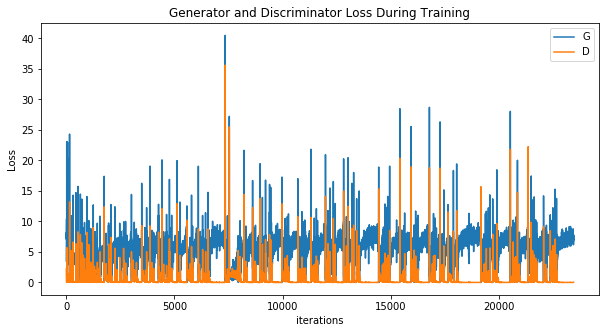

In [13]:
torch.save(generator, './saved_models/CGAN_2.0/generator.pt')
torch.save(discriminator, './saved_models/CGAN_2.0/discriminator.pt')

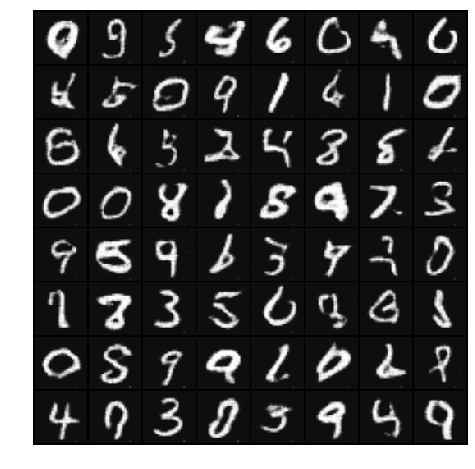

In [26]:
img_list_1 = img_list[0: 11]
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list_1]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())